In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "1"
import random
import numpy as np
import pandas as pd
import datetime
import time
import matplotlib.pyplot as plt
from itertools import combinations
from itertools import permutations
from collections import Counter
from sklearn.utils import resample
import gzip
import warnings
import requests
import networkx as nx
import collections
from bs4 import BeautifulSoup
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.autograd import Variable
from torch.utils.data import DataLoader
from matplotlib.lines import Line2D
#from torchviz import make_dot
warnings.filterwarnings("ignore")

In [2]:
import gc
def memory_usage_check():
    """
    # 確認目前所有tensor的使用量
    """
    print("Checking GPU memory usage...")
    cal_mem = []
    for obj in gc.get_objects():
        try:
            if torch.is_tensor(obj) or (hasattr(obj, 'data') and torch.is_tensor(obj.data)):
                print("------------------------------------------------------------------")
                print(type(obj), obj.size())
                print("Memory allocated of obj: ", obj.element_size() * obj.nelement() * 2 / (1024*1024), "MB")
                cal_mem.append(obj.element_size() * obj.nelement() * 2)
        except:
            pass
    print("Total GPU memory usage : ", sum(cal_mem) / (1024*1024), "MB")
memory_usage_check()

Checking GPU memory usage...
Total GPU memory usage :  0.0 MB


# Build Graph and Adjacency matrix

In [3]:
"""
# 用爬蟲撈產業別
"""
URL = "https://en.wikipedia.org/wiki/Dow_Jones_Industrial_Average"

res = requests.get(URL).text
soup = BeautifulSoup(res,'lxml')
title_list = []
for title in soup.find('table', class_='wikitable').find_all('tr')[0]:
    title_list.append(title.string.strip())
title_list = [x for x in title_list if x]

djia_table = []

print("Deal with industry data...")
# 顯示bs爬wiki djia30 table的結果
count = 1
for items in soup.find('table', class_='wikitable').find_all('tr')[1::1]:
    djia30 = items.find_all(['th','td'])
    print("[Company : %d]" % count)
    try:
        djia30_info = dict.fromkeys(title_list)
        for i in range(len(djia30)):
            djia30_info.update({title_list[i]:djia30[i].text.strip()})
        djia_table.append(djia30_info)
            
    except IndexError:pass
    count = count + 1
    
djia_table = pd.DataFrame(djia_table)

"""
# 針對DOW, WBA, GE三間公司的處理
---
05/22更新，爬蟲的DOW好像被刪掉改成DWDP了
"""
djia_table = djia_table.drop([djia_table[djia_table.Symbol == 'DOW'].index[0], djia_table[djia_table.Symbol == 'WBA'].index[0]])
#djia_table = djia_table.drop([djia_table[djia_table.Symbol == 'DWDP'].index[0], djia_table[djia_table.Symbol == 'WBA'].index[0]])
ge = pd.Series({'Company': 'General Electric', 
                'Exchange': 'NYSE', 
                'Industry': 'Conglomerate', 
                'Symbol': 'GE'})
djia_table = djia_table.append(ge, ignore_index=True)

# 查詢每間公司的data
#djia_data = list(djia_table.loc[0])
# 取得產業
industry = djia_table[title_list[3]]
# 取得Symbol
symbol = djia_table[title_list[2]]
companyAndindustry = dict.fromkeys(symbol)
for i, s in enumerate(symbol):
    companyAndindustry[s] = industry[i]
#pd.to_pickle(companyAndindustry, 'companyAndindustry.pickle')

industry2company = collections.defaultdict(set)
for k, v in companyAndindustry.items():
    industry2company[v].add(k)
industry2company = dict(industry2company)


"""
# 建立相鄰矩陣、graph
"""
print("Build graph and adjacency matrix...")
#adjacency_matrix = np.zeros((len(symbol), len(symbol)))    # shape = (29,29)
# 額外建一個根據industry為key的dict
industrySame = dict.fromkeys(list(industry2company.keys()))
for i in range(len(industry2company)):
    industrySame[list(industry2company.keys())[i]] = list(industry2company[list(industry2company.keys())[i]])

#pd.to_pickle(industrySame, 'industrySame.pickle')
industrySameList = []
for k in industrySame.values():
    industrySameList.append(k)

adjacency_matrix = []
edge_tuple = []
symbolsort = sorted(list(symbol))
# 針對每間公司建立與其它間公司相同產業的matrix
for i in range(len(symbolsort)):
    print("[%s]" % symbolsort[i])
    temp = np.zeros((1,len(symbol)))
    # 根據當前的目標公司取出與同產業的其它公司
    company_sameind = [k for k,v in companyAndindustry.items() if v == companyAndindustry[symbolsort[i]]]
    # 為了graph建edge所做的處理
    company_sameindnotar = company_sameind.copy()
    company_sameindnotar.remove(symbolsort[i])
    tarcom = [symbolsort[i]] * len(company_sameindnotar)
    edge = list(zip(tarcom, company_sameindnotar))
    if len(edge) != 0:
        edge_tuple.extend(edge)  
    
    # 取出同產業公司相對應的index
    idx_sameindustry = [i for i, item in enumerate(symbolsort) if item in company_sameind]
    temp[:,idx_sameindustry] = 1
    adjacency_matrix.append(temp)

adjacency_matrix = np.vstack(adjacency_matrix)

seen = set()
# 不考慮node順序性的edge
edge_tuple_noorder = [t for t in edge_tuple if tuple(sorted(t)) not in seen and not seen.add(tuple(sorted(t)))]
#pd.to_pickle(adjacency_matrix, 'adjacency_matrix_Fordjia30.pickle')

# 載入djia30公司詳細資料
companyDetail_raw = pd.read_excel("/mnt/sdb/chia/djia30_companydetail.xlsx")
mask = [i for i in companyDetail_raw.columns if companyDetail_raw[i].dtypes != "int64" and companyDetail_raw[i].dtypes != "float64"]
intitem = list(set(companyDetail_raw.columns) - set(mask))
companyDetail_pre = [companyDetail_raw[i].str.split(",") for i in mask]
companyDetail = pd.DataFrame(columns = companyDetail_raw.columns)
for i, m in enumerate(mask):
    companyDetail[m] = companyDetail_pre[i]
for i, m in enumerate(intitem):
    companyDetail[m] = companyDetail_raw[m]

companyData = []
for i in range(len(djia_table)):
    comDict = dict.fromkeys(companyDetail_raw)
    for c in companyDetail.columns:
        tmp = [sublist for sublist in companyDetail[c]]
        if isinstance(tmp[i], (int, float)) or len(tmp[i]) > 1:
            comDict[c] = tmp[i]
        else:
            comDict[c] = tmp[i][0]
    companyData.append(comDict)
    
# 根據25,75分位數,中位數來等劃分edge的class
companyDetail_forgraph = companyDetail.copy()
com_split = pd.qcut(companyDetail["營業額(US億)"], 4, labels = np.arange(4))
for c in companyDetail.columns:
    for i in range(len(companyDetail)):
        if isinstance(companyDetail[c][i], list) and len(companyDetail[c][i]) == 1:
            companyDetail_forgraph[c][i] = companyDetail[c][i][0]
            
    # 針對可以劃分的數值欄位(像是營業額)
    if type(companyDetail[c][0]) == np.int64:
        tmp_split = pd.qcut(companyDetail[c], 4, labels = np.arange(4))
        companyDetail_forgraph[c] = tmp_split

# 分離state, city
address_split = companyDetail_raw["公司地址"].str.split(',', expand=True)
companyDetail_forgraph['city'] = address_split[0].values
companyDetail_forgraph['state'] = address_split[1].values
companyDetail_forgraph = companyDetail_forgraph.drop(columns = ["備註"])

#==============================================================================
# 地緣關係的graph
#==============================================================================
graphNearplace = np.zeros((len(companyDetail), len(companyDetail)))
for i in range(len(companyDetail)):
    for j in range(len(companyDetail)):
        if companyDetail["公司地址"].loc[i][1] == companyDetail["公司地址"].loc[j][1]:
            graphNearplace[i][j] = 5

# 紀錄身處相同城市的公司
sameCity = np.where(graphNearplace == 5)
sameCityList = [[sameCity[0][i],sameCity[1][i]] for i in range(len(sameCity[0]))]
sameCityList = [l for l in sameCityList if l[0] != l[1]]

# 再來針對和多間公司中心所在地地緣關係比較近的處理 (紐約州、加州)
# 所有州組合 (以前的苦工活，已經下面算大圓距離的方式取代)
allstate = list(set(companyDetail_forgraph['state']))
stateneighbor = dict.fromkeys(allstate)
# 新澤西州
stateneighbor[allstate[0]] = allstate[4]
# 阿肯色州
stateneighbor[allstate[1]] = allstate[2]
# 德克薩斯州
stateneighbor[allstate[2]] = []
# 加利福尼亞州
stateneighbor[allstate[3]] = allstate[12]
# 紐約州
stateneighbor[allstate[4]] = [allstate[0], allstate[5], allstate[10]]
# 麻州
stateneighbor[allstate[5]] = [allstate[4], allstate[10]]
# 明尼蘇達州
stateneighbor[allstate[6]] = []
# 華盛頓州
stateneighbor[allstate[7]] = allstate[12]
# 喬治亞州
stateneighbor[allstate[8]] = []
# 俄亥俄州
stateneighbor[allstate[9]] = []
# 康乃迪克州
stateneighbor[allstate[10]] = allstate[4]
# 伊利諾州
stateneighbor[allstate[11]] = []
# 俄勒岡州
stateneighbor[allstate[12]] = allstate[3]

# 計算城市之間的距離(大圓距離、使用geopy這個library)
ll = 1
dis = 500
# DJIA30 成分股的經緯度
latitudeAndlongitude = list(companyDetail_forgraph["經緯度"])
from geopy.distance import great_circle
# 計算距離的方法
#great_circle(latitudeAndlongitude[0], latitudeAndlongitude[1]).km
real_distance = np.zeros((len(companyDetail_forgraph), len(companyDetail_forgraph)))
for i in range(real_distance.shape[0]):
    for j in range(real_distance.shape[1]):
        real_distance[i][j] = great_circle(latitudeAndlongitude[i], latitudeAndlongitude[j]).km

# 畫edge用
real_distance_for_graph = []
for i in range(real_distance.shape[0]):
    for j in range(real_distance.shape[1]):
        if(real_distance[i][j] < dis):
            real_distance_for_graph.append([i,j])

# 簡易版adjacency matrix
real_distance_array_graph = np.zeros_like(real_distance)
mask = [np.where(real_distance < dis)[0], np.where(real_distance < dis)[1]]
real_distance_array_graph[mask[0], mask[1]] = 1

# 有經過normalize的地緣關係adjacency matrix
temp = 1 / real_distance.copy()
temp[np.where(temp == np.inf)] = 1
real_triu = np.triu(temp, 1)
real_triu_ = temp[np.triu_indices(temp.shape[0])]
real_distance_array_norm = (temp - np.min(real_triu_)) / (np.max(real_triu_) - np.min(real_triu_))


#==============================================================================
# 整理地緣關係的資料
#==============================================================================
com_state_neighbor = []
for i in range(len(companyDetail_forgraph)):
    com_state_neighbor.append([companyDetail_forgraph["Ticker"][i], companyDetail_forgraph["state"][i], stateneighbor[companyDetail_forgraph["state"][i]]])

com_city_state_neighbor = dict.fromkeys(companyAndindustry)
for i in range(len(companyDetail_forgraph)):
    com_city_state_neighbor[companyDetail_forgraph["Ticker"][i]] = [companyDetail_forgraph["city"][i], companyDetail_forgraph["state"][i], stateneighbor[companyDetail_forgraph["state"][i]]]

comwithNeighbor = []
comwithNeighborindex = []
for i in range(len(companyDetail_forgraph)):
    tmp = []
    tmp2 = []
    for j in range(len(companyDetail_forgraph)):
        if com_state_neighbor[j][1] in com_state_neighbor[i][2]:
            tmp.append([com_state_neighbor[i][0], com_state_neighbor[j][0]])
            tmp2.append([symbolsort.index(com_state_neighbor[i][0]), symbolsort.index(com_state_neighbor[j][0])])
    comwithNeighbor.append(tmp)
    comwithNeighborindex.append(tmp2)

allcomwithNeighbor = []
allcomwithNeighborindex = []
for i in range(len(comwithNeighbor)):
    if len(comwithNeighbor[i]) != 0:
        for j in comwithNeighbor[i]:
            allcomwithNeighbor.append(j)
        for k in comwithNeighborindex[i]:
            allcomwithNeighborindex.append(k)

"""
05/23更新，把前面忘記的同城市公司也補上去
"""
allcomPlaceRelationindex = allcomwithNeighborindex + sameCityList
allcomPlaceRelation = [[symbolsort[l[0]], symbolsort[l[1]]] for l in allcomPlaceRelationindex]

"""
06/18更新，新增透過經緯度大圓距離
"""
allcomPlaceRelation_ll = [[symbolsort[l[0]], symbolsort[l[1]]] for l in real_distance_for_graph if l[0] != l[1]]

"""
測試相鄰州的地緣關係填補
"""
## 加州
#california = list(companyDetail_forgraph[companyDetail_forgraph['state'] == "加利福尼亞州"].index)
## 周圍有俄勒岡州
#nike = companyDetail_forgraph[companyDetail_forgraph['Company'] == "Nike"].index[0]
## 紐約州
#newyork = list(companyDetail_forgraph[companyDetail_forgraph['state'] == "紐約州"].index)
#
#graphNearplace[nike, california] = 4
#graphNearplace[california, nike] = 4

for i in range(len(allcomwithNeighborindex)):
    com1 = allcomwithNeighborindex[i][0]
    com2 = allcomwithNeighborindex[i][1]
    graphNearplace[com1, com2] = 4
    graphNearplace[com2, com1] = 4

# =============================================================================
# 生產產品(概念股)的相鄰矩陣
# =============================================================================
product = pd.Series(companyDetail["產業"].values, index=companyDetail_forgraph["Ticker"])
product_matrix = np.zeros((len(product),len(product)))
for i in range(len(product)):
    for j in range(len(product)):
        product_matrix[i,j] = len(set(product.iloc[i]) & set(product.iloc[j])) / len(product.iloc[i])
product_for_graph = []
for i in range(len(np.where(product_matrix != 0)[0])):
    if np.where(product_matrix != 0)[0][i] != np.where(product_matrix != 0)[1][i]:
        product_for_graph.append([np.where(product_matrix != 0)[0][i],np.where(product_matrix != 0)[1][i]])

productRelation = [[symbolsort[l[0]], symbolsort[l[1]]] for l in product_for_graph]        

"""
# 下面幾項都比較像是處理公司體質、公司賺錢能力的相鄰矩陣 (規模、總資產、EPS、Dividend)
"""
# =============================================================================
# 公司規模相鄰矩陣 (scale相減後差值越小代表公司規模(公司體質)越相近)
# =============================================================================
scale = pd.Series(companyDetail["員工人數"].values, index=companyDetail_forgraph["Ticker"])
scale_matrix = np.zeros((len(scale),len(scale)))
for i in range(len(scale)):
    for j in range(len(scale)):
        #scale_matrix[i,j] = abs(scale.iloc[i] - scale.iloc[j]) / scale.iloc[i]
        scale_matrix[i,j] = 1 / (abs(scale.iloc[i] - scale.iloc[j]))
        if scale_matrix[i,j] == np.inf:
                scale_matrix[i,j] = 1

scale_triu = np.triu(scale_matrix, 1)
scale_triu_ = scale_triu[np.triu_indices(scale_triu.shape[0],1)]
# 標準化
scale_matrix = (scale_matrix - np.min(scale_triu_)) / (np.max(scale_triu_) - np.min(scale_triu_))
np.fill_diagonal(scale_matrix, 1)

# 紀錄體值相近的公司(值 > 0.1)
scale_record = np.where(scale_matrix > 0.1)
scale_near = [[scale_record[0][i],scale_record[1][i]] for i in range(len(scale_record[0])) if scale_record[0][i] != scale_record[1][i]]
scale_graph = [[symbolsort[l[0]], symbolsort[l[1]]] for l in scale_near] 

# =============================================================================
# 總資產 (公司體質，企業擁有的任何資源) https://zh.wikipedia.org/wiki/%E8%B3%87%E7%94%A2
# =============================================================================
asset = pd.Series(companyDetail["總資產(US億)"].values, index=companyDetail_forgraph["Ticker"])
asset_matrix = np.zeros((len(asset),len(asset)))
for i in range(len(asset)):
    for j in range(len(asset)):
        #scale_matrix[i,j] = abs(scale.iloc[i] - scale.iloc[j]) / scale.iloc[i]
        asset_matrix[i,j] = 1 / (abs(asset.iloc[i] - asset.iloc[j]))
        if asset_matrix[i,j] == np.inf:
                asset_matrix[i,j] = 1

asset_triu = np.triu(asset_matrix, 1)
asset_triu_ = asset_triu[np.triu_indices(asset_triu.shape[0],1)]
# 標準化
asset_matrix = (asset_matrix - np.min(asset_triu_)) / (np.max(asset_triu_) - np.min(asset_triu_))
np.fill_diagonal(asset_matrix, 1)

# 紀錄體值相近的公司(值 > 0.01)
asset_record = np.where(asset_matrix > 0.01)
asset_near = [[asset_record[0][i],asset_record[1][i]] for i in range(len(asset_record[0])) if asset_record[0][i] != asset_record[1][i]]
asset_graph = [[symbolsort[l[0]], symbolsort[l[1]]] for l in asset_near]

# =============================================================================
# 處理每一季的EPS (EPS相減後差值越小代表公司獲利能力越相近)
# =============================================================================
quarter = ['Q1', 'Q2', 'Q3', 'Q4']
eps_list = ['eps_Q1', 'eps_Q2', 'eps_Q3', 'eps_Q4']
eps = companyDetail[eps_list].copy()
eps_dict = dict.fromkeys(eps_list)
eps_graph = dict.fromkeys(eps_list)

for k, v in eps_dict.items():
    eps_matrix = np.zeros((len(eps),len(eps)))
    for i in range(len(eps)):
        for j in range(len(eps)):
            eps_matrix[i,j] = 1 / (abs(eps[k].iloc[i] - eps[k].iloc[j]))
            if eps_matrix[i,j] == np.inf:
                eps_matrix[i,j] = 1
    eps_triu = np.triu(eps_matrix, 1)
    eps_triu_ = eps_triu[np.triu_indices(eps_triu.shape[0],1)]
    # 標準化
    eps_matrix = (eps_matrix - np.min(eps_triu_)) / (np.max(eps_triu_) - np.min(eps_triu_))
    np.fill_diagonal(eps_matrix, 1)
    
    eps_dict[k] = eps_matrix
    
    # 紀錄體值相近的公司(值 > 0.1)
    eps_record = np.where(eps_matrix > 0.1)
    eps_near = [[eps_record[0][i],eps_record[1][i]] for i in range(len(eps_record[0])) if eps_record[0][i] != eps_record[1][i]]
    eps_graph[k] = [[symbolsort[l[0]], symbolsort[l[1]]] for l in eps_near] 
    

# =============================================================================
# 處理每一季的Dividend
# =============================================================================
dividend_list = ['dividends_Q1', 'dividends_Q2', 'dividends_Q3', 'dividends_Q4']
dividend = companyDetail[dividend_list].copy()
dividend_dict = dict.fromkeys(dividend_list)
dividend_graph = dict.fromkeys(dividend_list)

for k, v in dividend_dict.items():
    dividend_matrix = np.zeros((len(dividend),len(dividend)))
    for i in range(len(dividend)):
        for j in range(len(dividend)):
            dividend_matrix[i,j] = 1 / (abs(dividend[k].iloc[i] - dividend[k].iloc[j]))
            if dividend_matrix[i,j] == np.inf:
                dividend_matrix[i,j] = 1
    dividend_triu = np.triu(dividend_matrix, 1)
    dividend_triu_ = dividend_triu[np.triu_indices(dividend_triu.shape[0],1)]
    # 標準化
    dividend_matrix = (dividend_matrix - np.min(dividend_triu_)) / (np.max(dividend_triu_) - np.min(dividend_triu_))
    np.fill_diagonal(dividend_matrix, 1)
    
    dividend_dict[k] = dividend_matrix
    
    # 紀錄體值相近的公司(值 > 0.2)
    dividend_record = np.where(dividend_matrix > 0.2)
    dividend_near = [[dividend_record[0][i],dividend_record[1][i]] for i in range(len(dividend_record[0])) if dividend_record[0][i] != dividend_record[1][i]]
    dividend_graph[k] = [[symbolsort[l[0]], symbolsort[l[1]]] for l in dividend_near] 


# 最終要餵進去的adjacency_matrix
adjacency_matrix_Edge = np.concatenate((adjacency_matrix, graphNearplace/5, product_matrix), 1)
easy_nearplace = adjacency_matrix_Edge[:, adjacency_matrix_Edge.shape[0]:]
adjacency_matrix_Edge_dict = dict.fromkeys(quarter)
if ll == 1:
    for k in range(len(quarter)):
        adjacency_matrix_Edge_dict[quarter[k]] = np.concatenate((adjacency_matrix, real_distance_array_norm, product_matrix, scale_matrix
                                            , asset_matrix, eps_dict[eps_list[k]], dividend_dict[dividend_list[k]]), 1)

quarter_month = dict.fromkeys(np.arange(12)+1)
for i in range(12):
    quarter_month[i+1] = "Q"+str(int(np.ceil((i+1)/3)))

Deal with industry data...
[Company : 1]
[Company : 2]
[Company : 3]
[Company : 4]
[Company : 5]
[Company : 6]
[Company : 7]
[Company : 8]
[Company : 9]
[Company : 10]
[Company : 11]
[Company : 12]
[Company : 13]
[Company : 14]
[Company : 15]
[Company : 16]
[Company : 17]
[Company : 18]
[Company : 19]
[Company : 20]
[Company : 21]
[Company : 22]
[Company : 23]
[Company : 24]
[Company : 25]
[Company : 26]
[Company : 27]
[Company : 28]
[Company : 29]
[Company : 30]
Build graph and adjacency matrix...
[AAPL]
[AXP]
[BA]
[CAT]
[CSCO]
[CVX]
[DIS]
[GE]
[GS]
[HD]
[IBM]
[INTC]
[JNJ]
[JPM]
[KO]
[MCD]
[MMM]
[MRK]
[MSFT]
[NKE]
[PFE]
[PG]
[TRV]
[UNH]
[UTX]
[V]
[VZ]
[WMT]
[XOM]


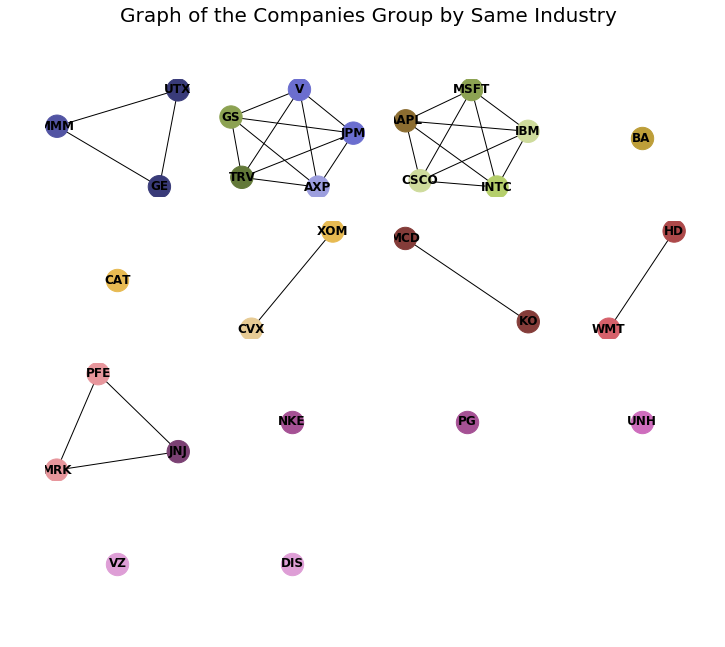

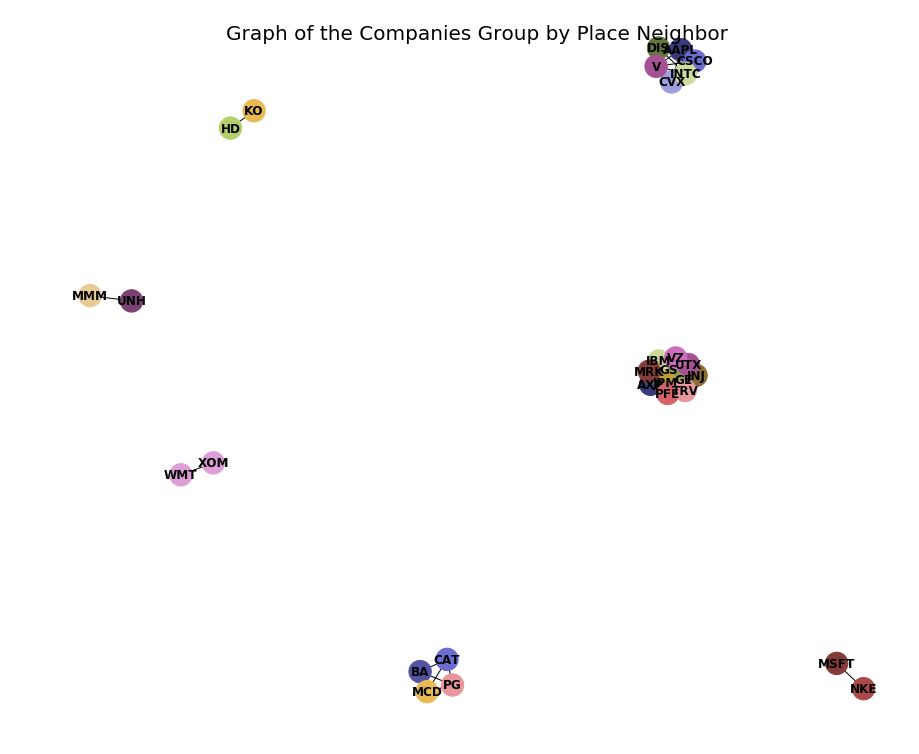

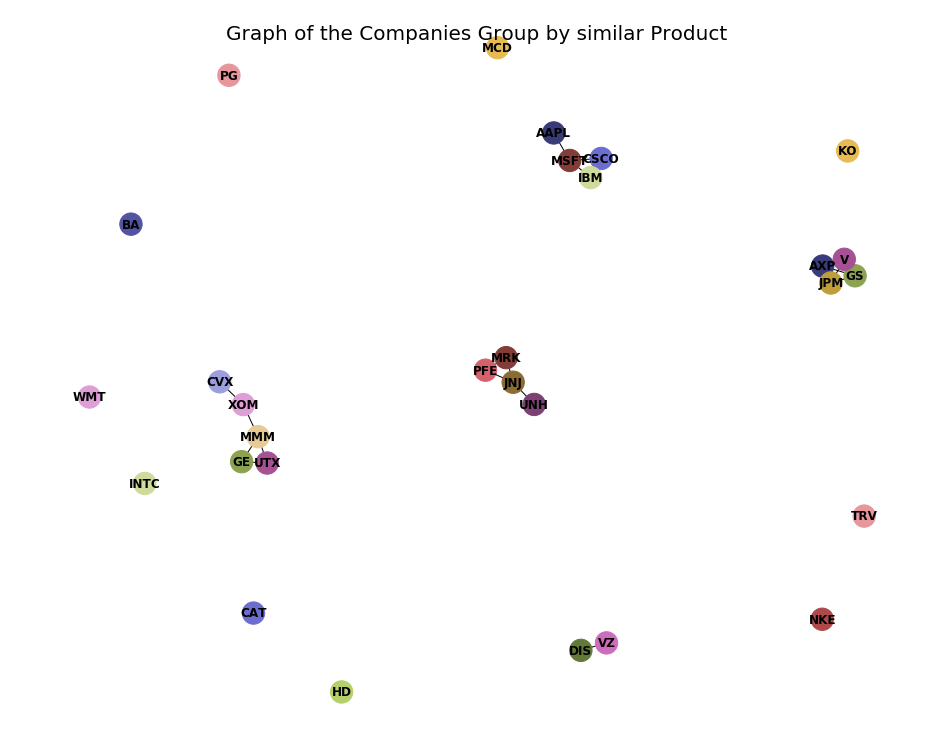

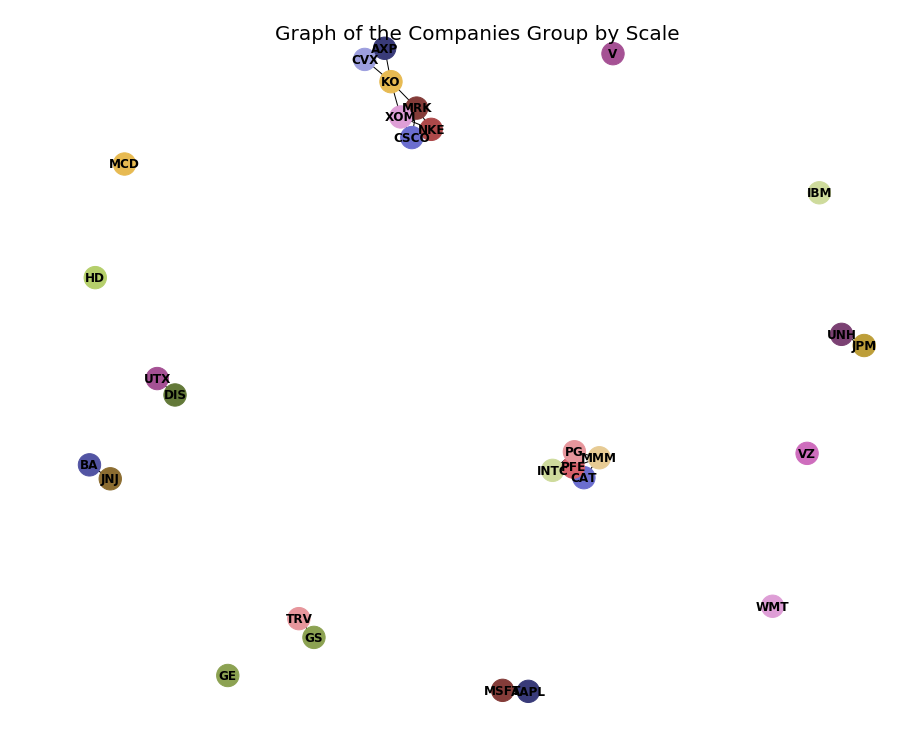

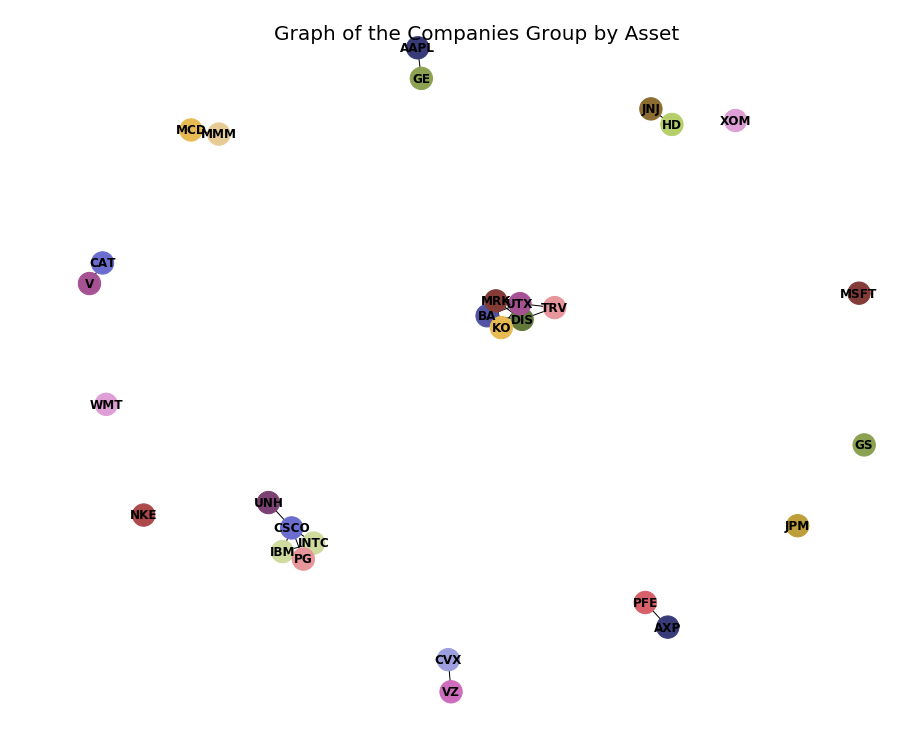

...

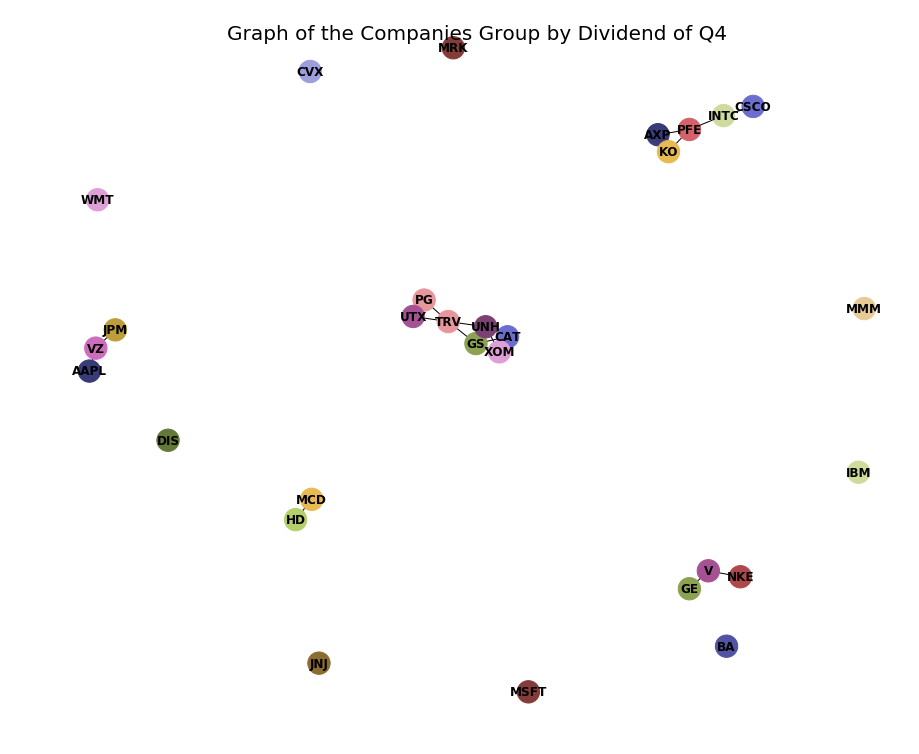

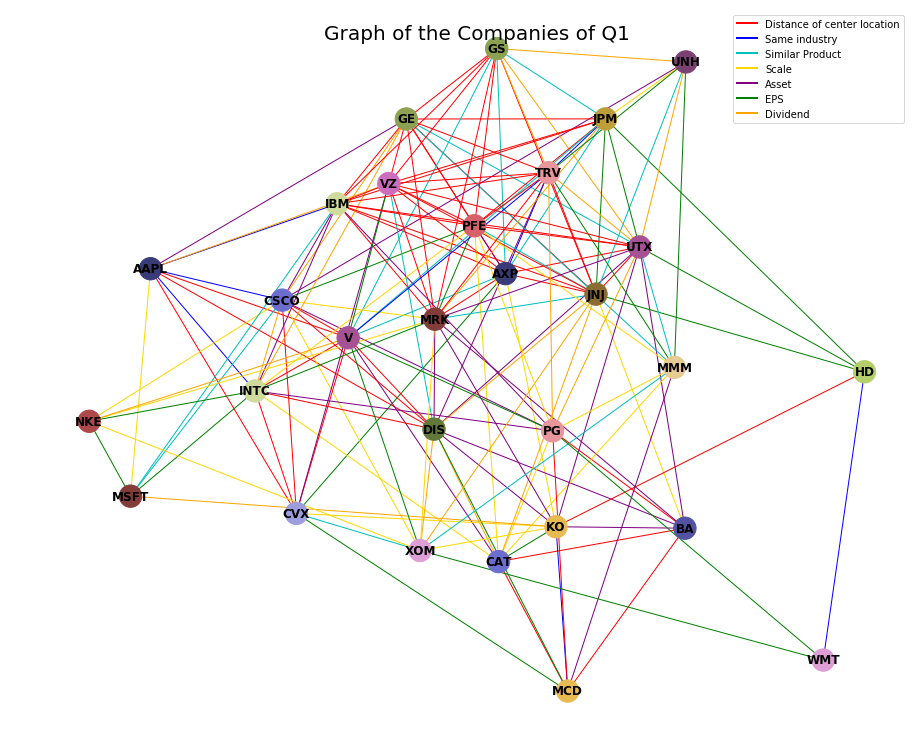

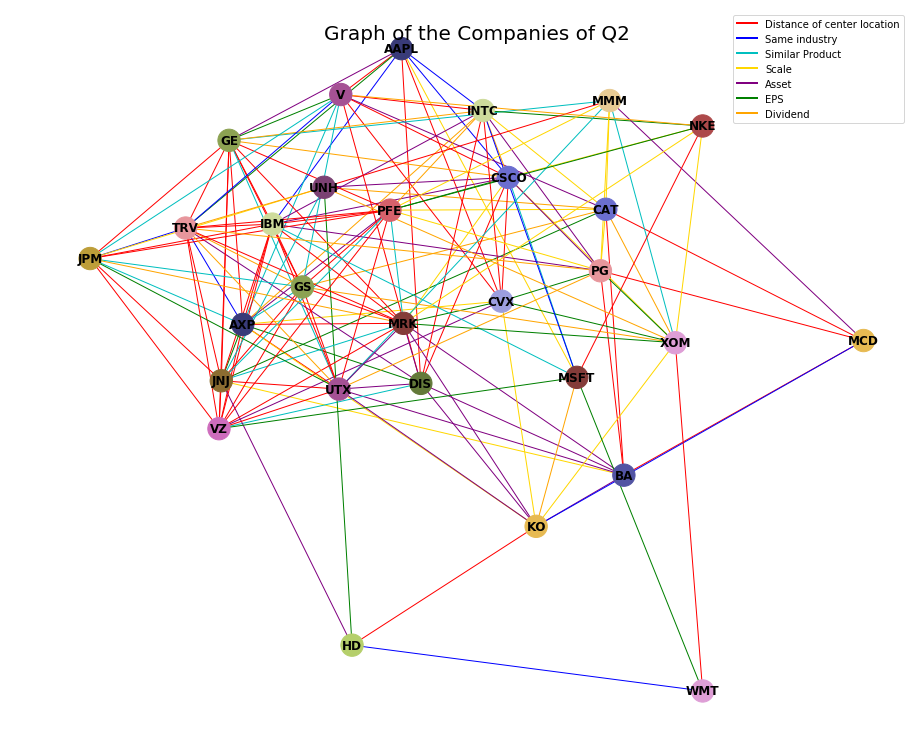

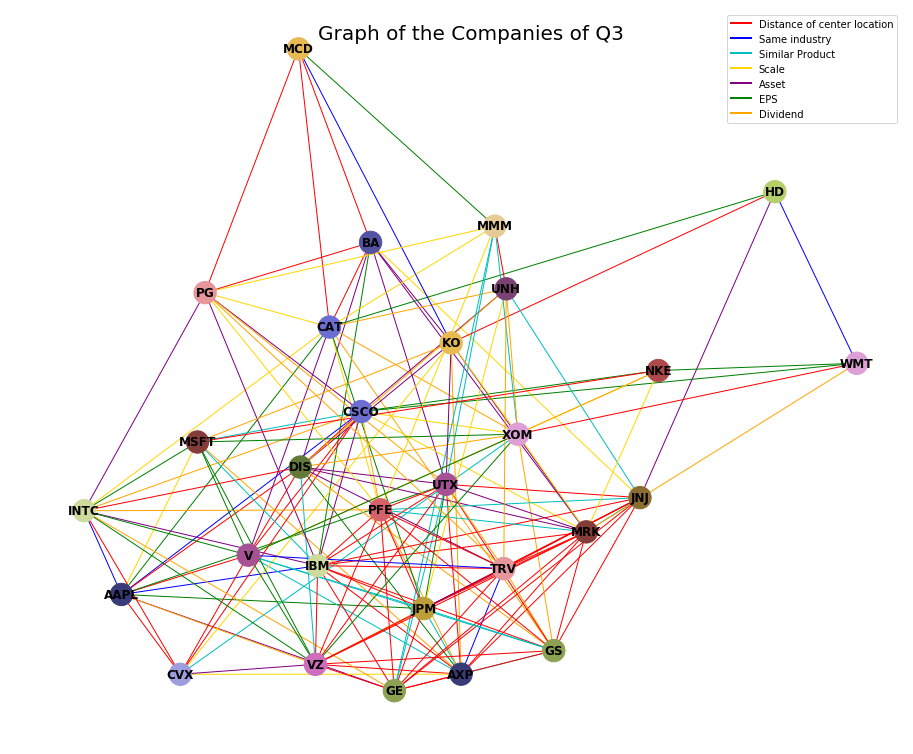

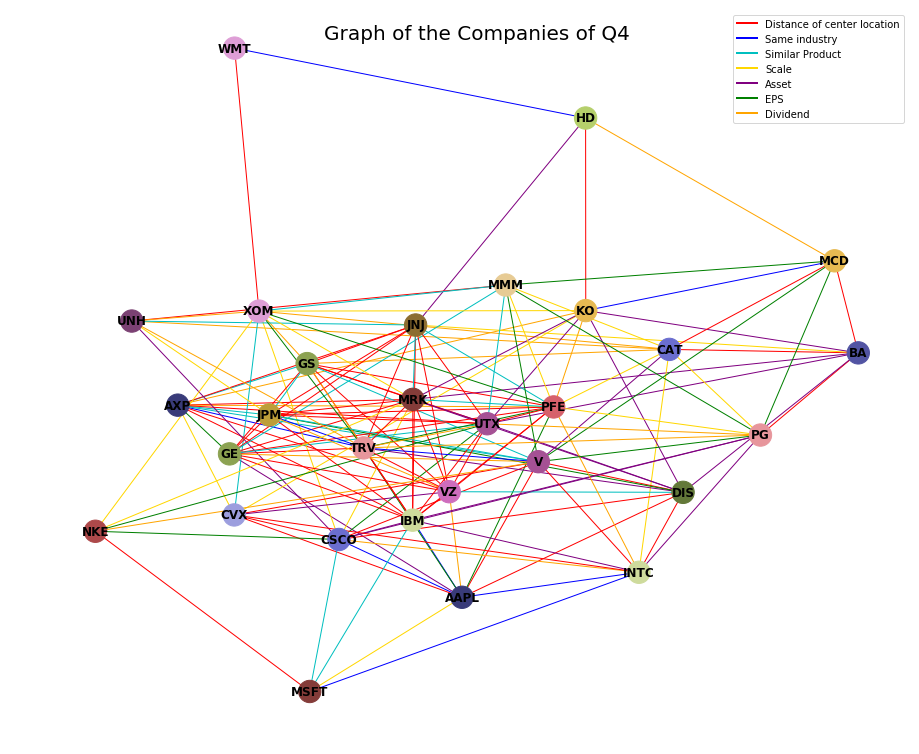

In [4]:
"""
# 建Graph、用networkx畫Graph的圖
"""
#==============================================================================
# 同產業者
#==============================================================================
G = nx.Graph()
# add node
G.add_nodes_from(symbolsort)
# add edge
G.add_edges_from(edge_tuple_noorder)
cmap = plt.get_cmap('tab20b')   
colors = [cmap(i) for i in np.linspace(0, 1, len(symbol))]
count = 0
plt.figure(figsize=(12,10))
for i in range(len(industrySameList)):
    plt.subplot(4,4,int("{0}".format(i+1)))
    sub = G.subgraph(industrySameList[i])
    nx.draw(sub, with_labels=True, font_weight='bold', node_color=colors[count:count+len(industrySameList[i])], node_size = 500, linewidths = 1)
    count += len(industrySameList[i])
plt.suptitle("Graph of the Companies Group by Same Industry", fontsize = 20)
plt.show()

#==============================================================================
# 地緣關係圖
#==============================================================================
G_np = nx.Graph()
# add node
G_np.add_nodes_from(symbolsort)
# add edge
if ll == 0:
    G_np.add_edges_from(allcomPlaceRelation)
else:
    G_np.add_edges_from(allcomPlaceRelation_ll)
cmap = plt.get_cmap('tab20b')   
colors = [cmap(i) for i in np.linspace(0, 1, len(symbol))]
plt.figure(figsize=(12,10))
nx.draw(G_np, with_labels=True, font_weight='bold', node_color=colors, node_size = 500, linewidths = 1)
plt.suptitle("Graph of the Companies Group by Place Neighbor", fontsize = 20)
plt.show()

# =============================================================================
# 產品關係圖
# =============================================================================
G_prod = nx.Graph()
# add node
G_prod.add_nodes_from(symbolsort)
# add edge
G_prod.add_edges_from(productRelation)
cmap = plt.get_cmap('tab20b')   
colors = [cmap(i) for i in np.linspace(0, 1, len(symbol))]
plt.figure(figsize=(12,10))
nx.draw(G_prod, with_labels=True, font_weight='bold', node_color=colors, node_size = 500, linewidths = 1)
plt.suptitle("Graph of the Companies Group by similar Product", fontsize = 20)
plt.show()

# =============================================================================
# 規模關係圖
# =============================================================================
G_scale = nx.Graph()
# add node
G_scale.add_nodes_from(symbolsort)
# add edge
G_scale.add_edges_from(scale_graph)
cmap = plt.get_cmap('tab20b')   
colors = [cmap(i) for i in np.linspace(0, 1, len(symbol))]
plt.figure(figsize=(12,10))
nx.draw(G_scale, with_labels=True, font_weight='bold', node_color=colors, node_size = 500, linewidths = 1)
plt.suptitle("Graph of the Companies Group by Scale", fontsize = 20)
plt.show()
# =============================================================================
# 資產關係圖
# =============================================================================
G_asset = nx.Graph()
# add node
G_asset.add_nodes_from(symbolsort)
# add edge
G_asset.add_edges_from(asset_graph)
cmap = plt.get_cmap('tab20b')   
colors = [cmap(i) for i in np.linspace(0, 1, len(symbol))]
plt.figure(figsize=(12,10))
nx.draw(G_asset, with_labels=True, font_weight='bold', node_color=colors, node_size = 500, linewidths = 1)
plt.suptitle("Graph of the Companies Group by Asset", fontsize = 20)
plt.show()
# =============================================================================
# EPS關係圖
# =============================================================================
for i in range(len(quarter)):
    G_eps = nx.Graph()
    # add node
    G_eps.add_nodes_from(symbolsort)
    # add edge
    G_eps.add_edges_from(eps_graph[eps_list[i]])
    cmap = plt.get_cmap('tab20b')   
    colors = [cmap(i) for i in np.linspace(0, 1, len(symbol))]
    plt.figure(figsize=(12,10))
    nx.draw(G_eps, with_labels=True, font_weight='bold', node_color=colors, node_size = 500, linewidths = 1)
    plt.suptitle("Graph of the Companies Group by EPS of %s" % quarter[i], fontsize = 20)
    plt.show()
# =============================================================================
# Dividend關係圖
# =============================================================================
for i in range(len(quarter)):
    G_dividend = nx.Graph()
    # add node
    G_dividend.add_nodes_from(symbolsort)
    # add edge
    G_dividend.add_edges_from(dividend_graph[dividend_list[i]])
    cmap = plt.get_cmap('tab20b')   
    colors = [cmap(i) for i in np.linspace(0, 1, len(symbol))]
    plt.figure(figsize=(12,10))
    nx.draw(G_dividend, with_labels=True, font_weight='bold', node_color=colors, node_size = 500, linewidths = 1)
    plt.suptitle("Graph of the Companies Group by Dividend of %s" % quarter[i], fontsize = 20)
    plt.show()

#==============================================================================
# 綜合起來
#==============================================================================
                 
#先針對同產業的edge處理成index
edge_tuple_noorder_index = []
for i in edge_tuple_noorder:
    edge_tuple_noorder_index.append((symbolsort.index(i[0]), symbolsort.index(i[1])))

nodelist = list(np.arange(29))
for k in range(len(quarter)):
    G_all = nx.Graph()
    #pos = nx.spring_layout(G_all)
    # add node
    G_all.add_nodes_from(symbolsort)
    if ll == 0:
        for i in range(len(allcomPlaceRelation)):
            G_all.add_edge(*allcomPlaceRelation[i], color = 'r', label = 'Distance of center location')
    else:
        for i in range(len(allcomPlaceRelation_ll)):
            G_all.add_edge(*allcomPlaceRelation_ll[i], color = 'r', label = 'Distance of center location')

    for j in range(len(edge_tuple_noorder)):  
        G_all.add_edge(*edge_tuple_noorder[j], color = 'b', label = 'Same industry')

    for j in range(len(productRelation)):  
        G_all.add_edge(*productRelation[j], color = 'c', label = 'Similar Product')

    for j in range(len(scale_graph)):  
        G_all.add_edge(*scale_graph[j], color = 'gold', label = 'Scale')

    for j in range(len(asset_graph)):  
        G_all.add_edge(*asset_graph[j], color = 'purple', label = 'Asset')

    for j in range(len(eps_graph[eps_list[k]])):  
        G_all.add_edge(*eps_graph[eps_list[k]][j], color = 'g', label = 'EPS')

    for j in range(len(dividend_graph[dividend_list[k]])):  
        G_all.add_edge(*dividend_graph[dividend_list[k]][j], color = 'orange', label = 'Dividend')


    #G_all.add_edges_from(allcomPlaceRelation, colors = 'r')
    #G_all.add_edges_from(edge_tuple_noorder, colors = 'g')
    plt.figure(figsize=(12,10))

    cmap = plt.get_cmap('tab20b')
    colors = [cmap(i) for i in np.linspace(0, 1, len(symbol))]
    edges = G_all.edges()
    edge_colors = [G_all[u][v]['color'] for u,v in edges]
    nx.draw(G_all, with_labels=True, font_weight='bold', node_color=colors, edge_color = edge_colors, node_size = 500, linewidths = 1)
    #nx.draw_networkx_edges(G_all, pos,
    #                       edgelist = edge_tuple_noorder_index,
    #                       width=8, alpha=0.5, edge_color='r')
    #nx.draw_networkx_edges(G_all, pos,
    #                       edgelist = allcomwithNeighborindex,
    #                       width=8, alpha=0.5, edge_color='b')

    #labels = {}
    #for i in range(len(symbolsort)):
    #    labels[i] = symbolsort[i]
    #nx.draw_networkx_labels(G_all, pos, labels, font_size = 16)

    labels = ['Distance of center location', 'Same industry', 'Similar Product', 'Scale', 'Asset', 'EPS', 'Dividend']
    c_edge = ['r', 'b', 'c', 'gold', 'purple', 'g', 'orange']
    legend_elements = [Line2D([0], [0], color=c_edge[i], lw=2, label=labels[i]) for i in range(len(labels))]

    plt.axis('Off')
    plt.suptitle("Graph of the Companies of %s" % quarter[k], fontsize = 20)
    plt.legend(handles=legend_elements)
    plt.show()

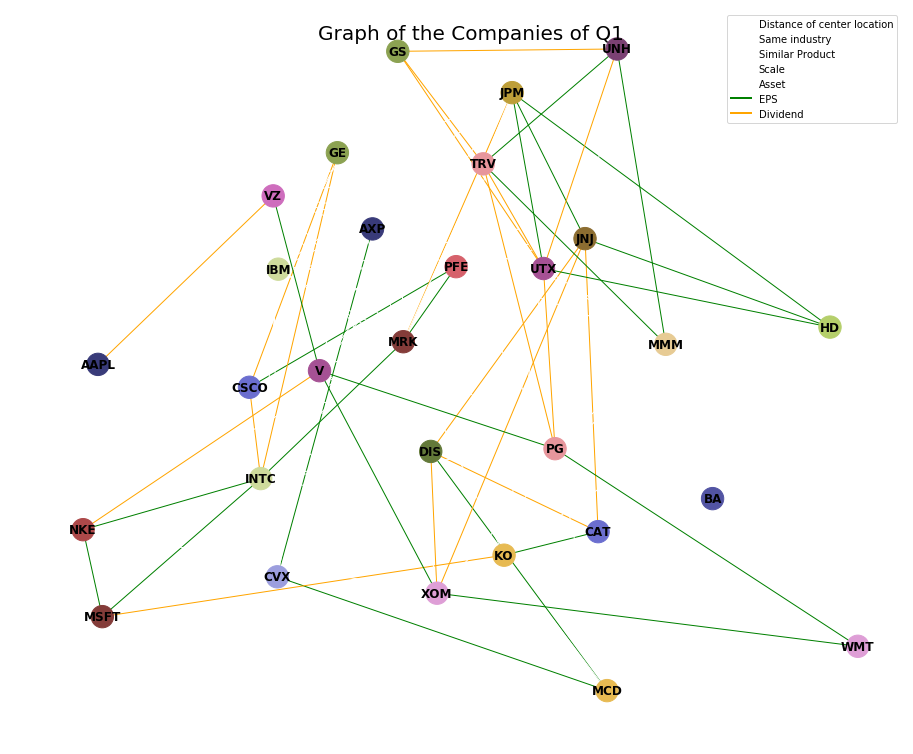

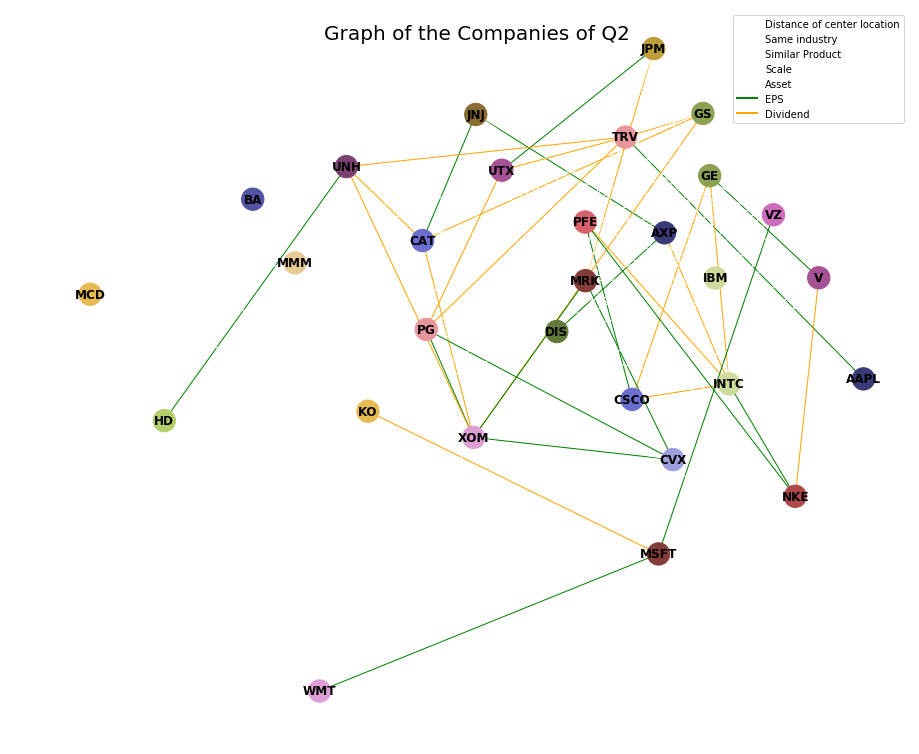

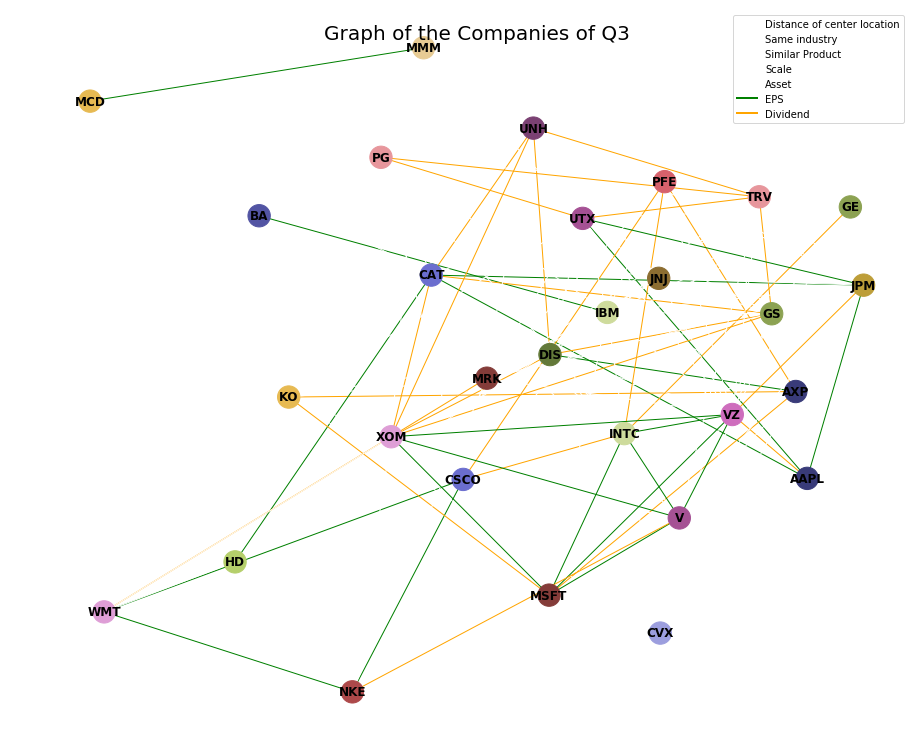

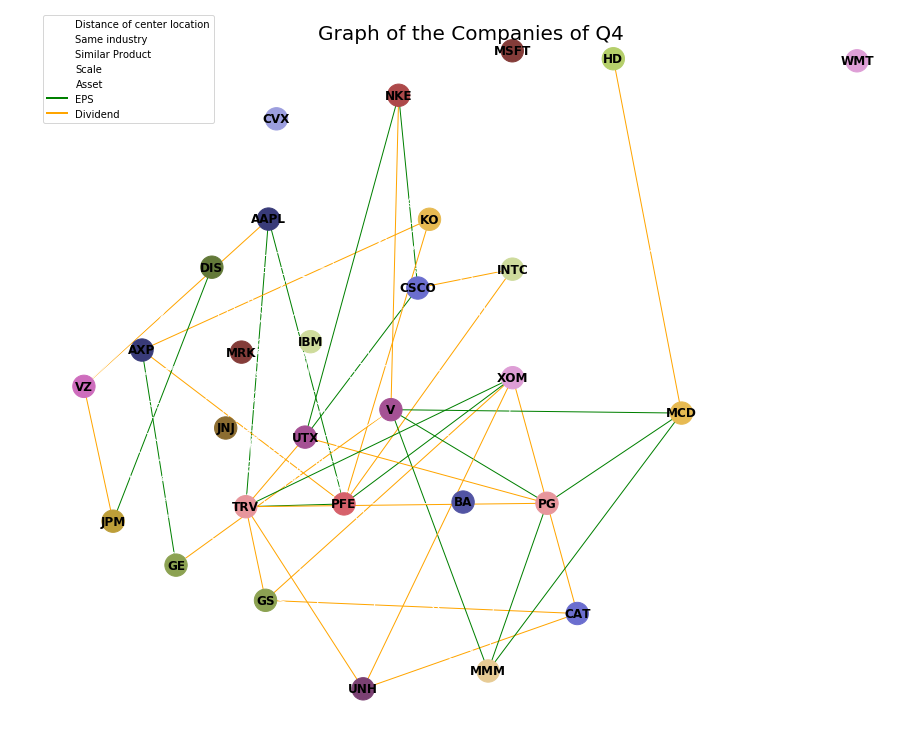

In [5]:
"""
# 加了mask的graph示意圖，可以看一下EPS和Dividend的變化
"""

for k in range(len(quarter)):
    G_all = nx.Graph()
    #pos = nx.spring_layout(G_all)
    # add node
    G_all.add_nodes_from(symbolsort)
    if ll == 0:
        for i in range(len(allcomPlaceRelation)):
            G_all.add_edge(*allcomPlaceRelation[i], color = 'w', label = 'Distance of center location')
    else:
        for i in range(len(allcomPlaceRelation_ll)):
            G_all.add_edge(*allcomPlaceRelation_ll[i], color = 'w', label = 'Distance of center location')

    for j in range(len(edge_tuple_noorder)):  
        G_all.add_edge(*edge_tuple_noorder[j], color = 'w', label = 'Same industry')

    for j in range(len(productRelation)):  
        G_all.add_edge(*productRelation[j], color = 'w', label = 'Similar Product')

    for j in range(len(scale_graph)):  
        G_all.add_edge(*scale_graph[j], color = 'w', label = 'Scale')

    for j in range(len(asset_graph)):  
        G_all.add_edge(*asset_graph[j], color = 'w', label = 'Asset')

    for j in range(len(eps_graph[eps_list[k]])):  
        G_all.add_edge(*eps_graph[eps_list[k]][j], color = 'g', label = 'EPS')

    for j in range(len(dividend_graph[dividend_list[k]])):  
        G_all.add_edge(*dividend_graph[dividend_list[k]][j], color = 'orange', label = 'Dividend')


    #G_all.add_edges_from(allcomPlaceRelation, colors = 'r')
    #G_all.add_edges_from(edge_tuple_noorder, colors = 'g')
    plt.figure(figsize=(12,10))

    cmap = plt.get_cmap('tab20b')
    colors = [cmap(i) for i in np.linspace(0, 1, len(symbol))]
    edges = G_all.edges()
    edge_colors = [G_all[u][v]['color'] for u,v in edges]
    nx.draw(G_all, with_labels=True, font_weight='bold', node_color=colors, edge_color = edge_colors, node_size = 500, linewidths = 1)
    #nx.draw_networkx_edges(G_all, pos,
    #                       edgelist = edge_tuple_noorder_index,
    #                       width=8, alpha=0.5, edge_color='r')
    #nx.draw_networkx_edges(G_all, pos,
    #                       edgelist = allcomwithNeighborindex,
    #                       width=8, alpha=0.5, edge_color='b')

    #labels = {}
    #for i in range(len(symbolsort)):
    #    labels[i] = symbolsort[i]
    #nx.draw_networkx_labels(G_all, pos, labels, font_size = 16)

    labels = ['Distance of center location', 'Same industry', 'Similar Product', 'Scale', 'Asset', 'EPS', 'Dividend']
    c_edge = ['w', 'w', 'w', 'w', 'w', 'g', 'orange']
    legend_elements = [Line2D([0], [0], color=c_edge[i], lw=2, label=labels[i]) for i in range(len(labels))]

    plt.axis('Off')
    plt.suptitle("Graph of the Companies of %s" % quarter[k], fontsize = 20)
    plt.legend(handles=legend_elements)
    plt.show()

In [6]:
"""""""""""""""""""""
參數設定
---
第一次跑code的時候，generateAndsave請設定成1
"""""""""""""""""""""
"""""""""
Pre-process
"""""""""
day = 180
shift_length = 150   # 每一次shift多少時間的資料
v_length = 300    # 每一個V的時間長度
input_length = v_length + shift_length   # 每一個VQA所涵蓋的時間長度
period = [6,7,8,9,10,11]
# 控制embedding或onehot
question = "onehot"
# 用另一種embedding方式
split_comques = 1
# qa_save那個function要不要用
generateAndsave = 1
temp_c = ["AAPL", "MSFT", "IBM", "INTC", "CSCO"]
# 29間公司全下
temp_c = symbolsort
question_type = ['Pairwise Price Change', 'Strength', 'Volatility']
qtype = question_type
answer_type = ['NoChange','BothRise','BothFall','Reverse','Same','Strong','Weak','Same','Big','Small']

"""""""""
Train and Validation
"""""""""
# 控制要不要存檔，1 : Yes, 0 : No
save = 1
epochs = 50
batch_size = 100
# Earlystopping參數
patience = 10
efficient_v = 1
# 是否用GPU train
cuda = 1
lr_rate = 8e-4
verbal = 1
# 是否對QA pair做resampling
balance_class = 1
show_shape = 0
show_layer = 1
embedding_method = 'conv1d'

"""""""""
Network parameter
"""""""""
metricsmode = "cate_acc"
# 決定training data, validation data的比例
n_split = 0.05
lstm_unit = 16
MLP_unit = 32
out_dim = len(answer_type)
# Graph Updater要Update幾次
n_steps = 5
# GRU state，NN的unit設定
state_dim = 32
conv_dim = 32
n_node = len(temp_c)
# multi-hot或者embedd版本的question
if question == "embedd":
    question_dim = 3
else:
    question_dim = int(len(temp_c)*2+len(qtype))
annotation_dim = 1
# multi-output選項 (不要動)
split_question = 1
# 是否使用我的attention方法，有加就是我的論文，沒加就是GGSNN
attention = 1
# Number of head for attentions
nheads = 2
edgetypeShape = int(adjacency_matrix_Edge_dict['Q1'].shape[1] / adjacency_matrix_Edge_dict['Q1'].shape[0])

"""""""""""""""
Testing
"""""""""""""""
day_test = 30
period_test = [12]


In [7]:
def time_table(data):
    """
    # 建一個以時間為index的開高低收價量的表
    ---
    Input : Trade data
    Output : 交易日的開高低收價量表
    """
    table = pd.DataFrame(columns = ['SIZE','PRICE'])
    table.SIZE = data['SIZE']
    table.PRICE = data['PRICE']
    table = table.set_index(data.TIME)
    
    cols = ['size','open', 'high', 'low', 'close']
    adjTable = pd.DataFrame(columns = cols)
    
    #把millisecond統合起來變成second data，開高低收
    price = table.PRICE.resample('1S',how = 'ohlc')
    presize = table.groupby(pd.TimeGrouper('1S')).aggregate(np.sum)
    
    #美股開收盤是9:30-16:00，不用考慮日光節約時間(因為wrds有先處理完了)
    start = datetime.time(9,30,0)
    end = datetime.time(15,59,59)
    price = price.between_time(start, end)
    presize = presize.between_time(start, end)
    
    #對有空值的秒數進行處理
    mask_fill = pd.isnull(price.close)    #先存下close有nan的boolean
    price = price.fillna(method = 'ffill')
    
    #把有nan的項全部改成 == 前一筆close price
    price.loc[mask_fill, 'open'] = price.close
    price.loc[mask_fill, 'high'] = price.close
    price.loc[mask_fill, 'low'] = price.close
    
    #合成新表
    adjTable = price
    adjTable.insert(0, 'size', presize.SIZE)
    adjTable = adjTable[adjTable.index.dayofweek < 5]
    
    return adjTable


def cal_return(data, period, return_date = 0):
    """
    # 計算Return (透過每秒收盤價)
    ---
    Inputs : 
    1.data - 開高低收價量資料
    2.period - 待處理月份 (Ex. [1,2,3,4,5,6])
    3.return_date - 是否回傳所有交易日日期
    Outputs : 
    1. all_price_data, all_return_data - 收盤price data與收盤return data
    2. date - 所有交易日日期
    
    註：
    1.有處理跨日的問題
    2.有兩種return算法：
    一般的相減return與log return
    這裡用前者且沒有除以上一秒價格(因為秒資料變化小再除會讓值域太小)，都可以用來做正規化
    """
    date = []
    current_year_str = str(data.index[0].year) # 要處理的所有月份
    for month in period:
        month_data = data[current_year_str + '/' + str(month)] # 抓出特定月份的資料
        stop_date = month_data.index[-1].date() + pd.to_timedelta(1, 'D') # 跑到該月最後一天有資料的日子
        current_date = month_data.index[0].date() # 目前在處理的日期
        while(current_date != stop_date):
            current_price = month_data[str(current_date)] # 目前日期的資料都抓出來
            if (len(current_price) == 0) or (len(current_price[current_price['size']!=0]) == 0):#數到周休(空資料)或休市日(有資料但size都是0)
                current_date += pd.to_timedelta(1, 'D')
                continue
                
            # 回傳時間戳記
            if return_date == 1:
                date.append(current_date)
            
            close_price = np.array(current_price['close'])
            current_price = np.insert(close_price,0,0) #前補0
            after_price = np.append(close_price, 0) #後補0
            """subtract return"""
            subReturn = after_price - current_price    # 後一秒(after_price) - 前一秒(current_price)
            subReturn = np.delete(subReturn, [0, len(subReturn)-1])   # 去除最頭最尾
            """log return"""
            logReturn = np.log(after_price / current_price)    # 後一秒(after_price) / 前一秒(current_price)取log
#            logReturn = np.log(after_price) - np.log(current_price)
            logReturn = np.delete(logReturn, [0, len(logReturn)-1])   # 去除最頭最尾
            
            if month == period[0] and current_date == month_data.index[0].date():
                all_return_data = np.array([subReturn])
                all_price_data = np.array([close_price])
            else:
                all_return_data = np.vstack((all_return_data, [subReturn]))
                all_price_data = np.vstack((all_price_data, [close_price]))
            current_date += pd.to_timedelta(1, 'D')
        
    if return_date == 0:    
        return all_price_data, all_return_data # 回傳二維陣列，天數*每日的return
    else:
        return all_price_data, all_return_data, date

"""""""""
draw picture
"""""""""

def draw_losses(history, network = 'CNN', split_question = 0):
    # show loss
    plt.title('Loss - ' + network)
    if isinstance(history,dict):
        if isinstance(history['loss'],list):
            plt.plot(history['loss'], label='train')
            plt.plot(history['val_loss'], label='val') 
            plt.plot(history['test_loss'], label='test')
                
        else:
            plt.plot(history['loss'], label='train')
            plt.plot(history['val_loss'], label='val')
            plt.plot(history['test_loss'], label='test')
    else:
        plt.plot(history.history['loss'], label='train')
        plt.plot(history.history['val_loss'], label='val')
        plt.plot(history.history['test_loss'], label='test')
    plt.legend()
    plt.show()
    
def draw_acc(history, data = 0, network = 'CNN', split_question = 0):
    # show acc
    plt.title('Accuracy - ' + network)
    if isinstance(history,dict):
        if isinstance(history['acc'],list):
            plt.plot(history['acc'], label='train')
            plt.plot(history['val_acc'], label='val')
            plt.plot(history['test_acc'], label='test')
        else:
            plt.plot(history['acc'], label='train')
            plt.plot(history['val_acc'], label='val')
            plt.plot(history['test_acc'], label='test')
    else:
        plt.plot(history.history['acc'], label='train')
        plt.plot(history.history['val_acc'], label='val')
        plt.plot(history.history['test_acc'], label='test')
    if (data != 0):
        plt.plot(data[:len(acc)], label='allguest-0')
    plt.legend()
    plt.ylim(0, 1)
    plt.show()
    
def draw_splitQuestion_loss(history, network = 'CNN', split_question = 1, datasetType = "Train"):
    # show loss for each question
    plt.title('%s Loss - ' % datasetType + network)
    if datasetType == "Train":
        plt.plot(history['loss'], label = datasetType + "Total loss")
        plt.plot(history['loss_q1'], label = datasetType + "Q1 loss")
        plt.plot(history['loss_q2'], label = datasetType + "Q2 loss")
        plt.plot(history['loss_q3'], label = datasetType + "Q3 loss")
    elif datasetType == "Validation":
        plt.plot(history['val_loss'], label = datasetType + "Total loss")
        plt.plot(history['val_loss_q1'], label = datasetType + "Q1 loss")
        plt.plot(history['val_loss_q2'], label = datasetType + "Q2 loss")
        plt.plot(history['val_loss_q3'], label = datasetType + "Q3 loss")
    else:
        plt.plot(history['test_loss'], label = datasetType + "Total loss")
        plt.plot(history['test_loss_q1'], label = datasetType + "Q1 loss")
        plt.plot(history['test_loss_q2'], label = datasetType + "Q2 loss")
        plt.plot(history['test_loss_q3'], label = datasetType + "Q3 loss")
    plt.xlabel('Epoch')
    plt.legend()
    plt.show()

def draw_splitQuestion_acc(history, data = 0, network = 'CNN', split_question = 0, datasetType = "Train"):
    # show acc
    plt.title('%s Accuracy - ' % datasetType + network)
    if datasetType == "Train":
        plt.plot(history['acc'], label = datasetType + "Total acc")
        plt.plot(history['acc_q1'], label = datasetType + "Q1 acc")
        plt.plot(history['acc_q2'], label = datasetType + "Q2 acc")
        plt.plot(history['acc_q3'], label = datasetType + "Q3 acc")
    elif datasetType == "Validation":
        plt.plot(history['val_acc'], label = datasetType + "Total acc")
        plt.plot(history['val_acc_q1'], label = datasetType + "Q1 acc")
        plt.plot(history['val_acc_q2'], label = datasetType + "Q2 acc")
        plt.plot(history['val_acc_q3'], label = datasetType + "Q3 acc")
    else:
        plt.plot(history['test_acc'], label = datasetType + "Total acc")
        plt.plot(history['test_acc_q1'], label = datasetType + "Q1 acc")
        plt.plot(history['test_acc_q2'], label = datasetType + "Q2 acc")
        plt.plot(history['test_acc_q3'], label = datasetType + "Q3 acc")
    if (data != 0):
        plt.plot(data[:len(acc)], label='allguest-0')
    plt.xlabel('Epoch')
    plt.legend()
    plt.ylim(0, 1)
    plt.show()
    
def draw_predict(pre, y, title = 'Train', way = 'Regression', figsize = None):
    plt.figure(figsize = figsize)
    plt.plot(y,label = "real")
    plt.plot(pre,label = "predict")
    plt.title('Correlation Prediction for ' + title + ', ' + way)
    plt.xlabel('Seconds')
    plt.ylabel('Cross Correlation')
    plt.legend()
    plt.show()

def draw_price(price, figsize = None):
    plt.figure(figsize = figsize)
    for key, value in price.items() :
        plt.plot(price, label = key)
    plt.xlabel('Seconds')
    plt.ylabel('Price')
    plt.legend()
    plt.show()
    
def draw_roc(roc):
    plt.plot([0, 1], [0, 1], 'k--')
    plt.plot(roc["train_fpr"][-1], roc["train_tpr"][-1], label = "train_roc_score_" "%.4f" % roc["train_auc"][-1])
    plt.plot(roc["val_fpr"][-1], roc["val_tpr"][-1], label = "validation_roc_score_" + "%.4f" % roc["val_auc"][-1])
    if(len(roc["test_fpr"]) != 0):
        plt.plot(roc["test_fpr"][-1], roc["test_tpr"][-1], label = "test_roc_score_" + "%.4f" % roc["test_auc"][-1])
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.0])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend()
    plt.show()

"""""""""
# V : 用來顯示一段時間過去歷史資訊
"""""""""
# 用來顯示VQA的V
def visual_show(return_data, day = 0, time = 0, mode = 0):
    if return_data.shape[0] > return_data.shape[1]:
        return_data = return_data.transpose(1,0)
    plt.figure(figsize = (15,10))
    plt.suptitle('Visual for ' + str(len(return_data)) + ' companys', fontsize="x-large")
    number = len(return_data)
    cmap = plt.get_cmap('tab20b')
    colors = [cmap(i) for i in np.linspace(0, 1, number)]
    count = 1
    
    # mode == 0: 公司分開畫
    if mode == 0:
        # 根據輸入資料的資料型態做不同的設定
        if isinstance(return_data,dict):
            for key in return_data.keys():
                plt.subplot(5, 1, count)
                plt.plot(return_data[key][1][day,time:time+300-1], color = colors[count-1], label = key)
                plt.legend(loc = 1)
                count += 1
        else:
            for key in temp_c:
                plt.subplot(5, 1, count)
                plt.plot(return_data[count-1,:], color = colors[count-1], label = key)
                plt.legend(loc = 1)
                count += 1
    # mode == 1: 合起來畫
    else:
        # 根據輸入資料的資料型態做不同的設定
        if isinstance(return_data,dict):
            for key in return_data.keys():
                plt.plot(return_data[key][1][day,time:time+300-1], color = colors[count-1], label = key)
                count += 1
        else:
            for key in temp_c:
                plt.plot(return_data[count-1,:], color = colors[count-1], label = key)
                count += 1
        plt.legend(loc = 1)
        
    plt.show()

"""""""""
str, onehotcode, company code轉換function
"""""""""
def companycode2str(code):
    return label_company[code]
#com1 = companycode2str(0)

def str2companycode(company):
    return {v: k for k, v in label_company.items()}[company]
#com1_code = str2companycode('AAPL')

def one_hot_company(label_company):
    d = {}
    temp = np.eye((len(label_company)), dtype = int)
    for i in range(len(label_company)):
        d[i] = temp[i]
    return d

# 根據公司數來建立一個與公司名字相對應的label
label_company = {}    #0:AAPL
for i in range(len(temp_c)):
    label_company[i] = temp_c[i]

# 每一間公司轉one-hot的結果
onehotCompany = one_hot_company(label_company)

def question2onehot(array):
    c1 = [onehotCompany[k] for k in array[:,0]]
    c2 = [onehotCompany[l] for l in array[:,1]]
    q = [onehotQuestion[m] for m in array[:,2]]
    return np.concatenate((c1, c2, q), axis = 1)

"""
產生QA pairs的functions
"""
def set_question(com1, com2, condition):
    """
    # 設定問題
    問漲跌、問強弱勢、問波動率
    ---
    Inputs : 公司1, 2以及question type
    Output : multi-hot vector (三個one-hot vector接起來的)
    """
    def set_question_type():
        if question == "embedd":
            d = {v: k for k, v in word_bag.items() if v in question_type}
        else:
            tmp = np.eye((len(question_type)))
            d = {}
            for i in range(len(question_type)):
                d[i] = tmp[i]
        return d
    # 拼接問題
    if question == "embedd":
        return np.concatenate(([str2companycode(com1)], [str2companycode(com2)], [condition]))
    else:   # 若是one-hot
        return np.concatenate((onehotCompany[str2companycode(com1)], onehotCompany[str2companycode(com2)], set_question_type()[condition]))

def set_question_pair(data, all_com_pair):
    """
    # 設定問題
    問漲跌、問強弱勢、問波動率
    ---
    Inputs : 公司1, 2以及question type
    Output : 所有的問題排列組合
    """
    q_pair = {}
    
    for i in range(len(question_type)):
        tmp_q = []
        
        # 這裡的count用來表示各問題的index
        if question == "embedd":
            if split_comques == 0:
                count = i + len(label_company)
            else:
                count = i
        else:
            count = i
        
        # 塞question pairs
        for j in range(len(all_com_pair)):
            tmp_q.append(set_question(all_com_pair[j][0], all_com_pair[j][1], count))
        q_pair[i] = tmp_q
        
    return q_pair

def set_answer_pair(data, trend_data, all_com_pair):
    """
    # 設定答案
    計算漲跌幅、標準差去作答案
    ---
    Inputs : answer data或者answer的trend data
    Output : 所有問題的對應答案
    """
    a_pair = {}
    
    """
    # 舊寫法，比較return的結果
    # 把data加總判斷是漲是跌
    if(data.shape[0] > data.shape[1]):
        v_trend = np.sum(data, axis = 0)
    else:
        v_trend = np.sum(data, axis = 1)
    """
        
    # 新寫法，直接把answer判定依據的第一秒與最後一秒價格取出並分別計算漲跌、漲跌幅、標準差
    """
    # 其實trend_data[0] + np.sum(data, axis = 0) 等同 trend_data[1]
    """
    #print(trend_data.shape)
    # 計算漲跌幅
    if(trend_data.shape[0] > trend_data.shape[1]):
        trend_data_t = trend_data.transpose(1,0)
        v_trend = (trend_data_t[1] - trend_data_t[0]) / trend_data_t[0]
    else:
        v_trend = (trend_data[1] - trend_data[0]) / trend_data[0]
    
    #print(data.shape)
    # 計算標準差
    if(data.shape[0] > data.shape[1]):
        data_t = data.transpose(1,0)
        v_std = np.std(data_t, axis = 1)
    else:
        v_std = np.std(data, axis = 1)
    
    #   答案格式為：[不變, 同漲, 同跌, 反向, 相同, 強勢, 弱勢, 相同, 大, 小]
    for i in range(len(question_type)):
        tmp_a = []
        
        # 塞answer pairs
        if(i == 0): # 第一種問題 (問漲跌)
            for j in range(len(all_com_pair)):
                # 同漲
                if(v_trend[str2companycode(all_com_pair[j][0])] > 0 and v_trend[str2companycode(all_com_pair[j][1])] > 0):
                    tmp_a.append(np.array([0,1,0,0,0,0,0,0,0,0]))
                # 同跌
                elif(v_trend[str2companycode(all_com_pair[j][0])] < 0 and v_trend[str2companycode(all_com_pair[j][1])] < 0):
                    tmp_a.append(np.array([0,0,1,0,0,0,0,0,0,0]))
                # 反向
                elif((v_trend[str2companycode(all_com_pair[j][0])] > 0 and v_trend[str2companycode(all_com_pair[j][1])] < 0) or\
                (v_trend[str2companycode(all_com_pair[j][0])] < 0 and v_trend[str2companycode(all_com_pair[j][1])] > 0)):
                    tmp_a.append(np.array([0,0,0,1,0,0,0,0,0,0]))
                # 不變
                else:
                    tmp_a.append(np.array([1,0,0,0,0,0,0,0,0,0]))
                    
                    
        elif(i == 1): # 第二種問題 (問強弱勢)
            for j in range(len(all_com_pair)):
                query_c = v_trend[str2companycode(all_com_pair[j][0])]
                another_c = v_trend[str2companycode(all_com_pair[j][1])]
                # Query主體比另一間強勢
                if(query_c > another_c):
                    tmp_a.append(np.array([0,0,0,0,0,1,0,0,0,0]))
                # Query主體比另一間弱勢    
                elif (query_c < another_c):
                    tmp_a.append(np.array([0,0,0,0,0,0,1,0,0,0]))
                # 兩者相同
                else:
                    tmp_a.append(np.array([0,0,0,0,1,0,0,0,0,0]))
                    
                    
        elif(i == 2): # 第三種問題 (問波動率)
            for j in range(len(all_com_pair)):
                query_c = v_std[str2companycode(all_com_pair[j][0])]
                another_c = v_std[str2companycode(all_com_pair[j][1])]
                # Query主體比另一間波動率大
                if (query_c > another_c):
                    tmp_a.append(np.array([0,0,0,0,0,0,0,0,1,0]))
                # Query主體比另一間波動率小
                elif (query_c < another_c):
                    tmp_a.append(np.array([0,0,0,0,0,0,0,0,0,1]))
                # 2/8 新增兩者相同
                else:
                    tmp_a.append(np.array([0,0,0,0,0,0,0,1,0,0]))

        a_pair[i] = tmp_a
        
    return a_pair

def set_question_and_answer_pair(train_data, answer_data, answer_trend_data, all_com_pair):
    """
    # Generate VQA pair (Huge memory)
    """
    vqa_pair = []
    
    for i in range(train_data.shape[0]):
        vqa_pair.append((train_data[i],set_question_pair(train_data[i], all_com_pair),set_answer_pair(answer_data[i], answer_trend_data[i], all_com_pair), answer_data[i], answer_trend_data[i]))
    
    return vqa_pair

def set_vqa_efficient(input_data, answer_data, answer_trend_data, all_com_pair, q_ind, index):
    """
    # 大幅減少memory使用量的VQA pair產生function
    ---
    Resampling會用到
    """
    a_pair = set_answer_pair(answer_data, answer_trend_data, all_com_pair)
    a_ind = []
    for i in range(len(a_pair)):
        for value in a_pair[i]:
            a_ind.append(value)
    a_ind = np.vstack(a_ind)
    a_ind = np.vstack(a_ind)
    
    return (input_data, q_ind[index], a_ind[index], answer_data, answer_trend_data)

In [8]:
#==============================================================================
# Training data preprocess
#==============================================================================
djia30 = os.listdir('djia30')
data30 = {}
temp = [c for c in djia30 if any(tc in c for tc in temp_c)]
company_num = len(temp_c)

print("--------Training data preprocess--------")
print('Loading raw data...')
for file_name in temp:
    print("[" + file_name.split(".")[0] + "]")
    data30[file_name.split(".")[0]] = pd.read_pickle('/mnt/sdb/chia/djia30/' + file_name)

# 計算每秒的return及price
price_and_return = {}
for company in temp_c:   
    print('Calculate return and price of ' + company)
    # 計算價格、價差(跟spread好像是不同概念，這裡指的是後-前)
    price_data, return_data = cal_return(data30[company], period=period)
    # 算漲跌幅 (return，(後-前)/前)
    # 同義於 np.diff(price_data[0,:]) / price_data[0,:-1]
    change_data = return_data / price_data[:,:-1]
    price_data = np.float16(price_data)
    return_data = np.float16(return_data)
    change_data = np.float16(change_data)
    # 取需要的資料量
    price_and_return[company] = [price_data[:day], return_data[:day], change_data[:day]]

# 用來確認實際餵入的天數
day = price_and_return[company][0].shape[0]

# 放出data30的記憶體
del data30

'''
# 處理V(split frame)最重要的幾行code
'''
visual_data = {}    #(?*154,29,299)，也就是說共有?個交易日，29間公司每300秒的收益
for i in range(day):
    # 無overlap
#    c = int(price_data.shape[1]/input_length)
    # 有overlap
    c = int((price_data.shape[1]-input_length)/shift_length)+1
    
    tmp = np.zeros((c,company_num,input_length-1))
    for j in range(c):
        count = 0
        for company in temp_c:
            # 無overlap
#            tmp[j][count] = price_and_return[company][1][i,j*input_length:(j+1)*input_length-1]
            # 有overlap
            tmp[j][count] = price_and_return[company][1][i,j*shift_length:(input_length+(j*shift_length))-1]
            count += 1
    visual_data[i] = tmp
print("[Split data finish !]")

# 把所有切好的data stack成training dataset
train_data = np.vstack(visual_data.values())    #(?,29,299)
# 第九間公司的某一筆資料出現nan先以補0處理
if period[0] == 1:
    train_data[np.argwhere(np.isnan(train_data))[0,0], np.argwhere(np.isnan(train_data))[0,1], np.argwhere(np.isnan(train_data))[0,2]] = 0
#train_data[np.argwhere(np.isnan(train_data))[0,0], np.argwhere(np.isnan(train_data))[0,1], np.argwhere(np.isnan(train_data))[0,2]] = 0
train_data = train_data.transpose(0,2,1)    #把後面兩個維度交換 (?,299,29)
train_data, answer_data = train_data[:,:v_length-1,:], train_data[:,v_length:,:]
train_data = train_data.transpose(0,2,1) #(?,29,299)
answer_data = answer_data.transpose(0,2,1) #(?,29,59)
#visual_show(train_data[1], day = 0, time = 0)
print("[Training and answer data finish !]")

# trend data
trend_data = {}    #(?*154,29,2)，也就是說共有?個交易日，29間公司第一秒和最後一秒的價格
for i in range(day):
    # 無overlap
#    c = int(price_data.shape[1]/input_length)
    # 有overlap
    c = int((price_data.shape[1]-input_length)/shift_length)+1
    
    tmp = np.zeros((c,company_num,2))
    for j in range(c):
        count = 0
        for company in temp_c:
            # 無overlap
#            tmp[j][count] = price_and_return[company][1][i,j*input_length:(j+1)*input_length-1]
            # 有overlap
            #tmp[j][count] = price_and_return[company][0][i,[j*shift_length+v_length,(input_length+(j*shift_length))-1]]
            tmp[j][count] = np.float16(price_and_return[company][0][i,[j*shift_length+v_length,(input_length+(j*shift_length))-1]])
            count += 1
    trend_data[i] = tmp

# 20個(78,29,第一秒和第60秒的價格共兩個值)
answer_trend_data = np.vstack(trend_data.values())    # (?,29,2)
answer_trend_data = answer_trend_data.transpose(0,2,1)    # 把後面兩個維度交換 (?,2,29)
print("[Target trend data finish !]")

# 根據公司數來建立一個與公司名字相對應的label
label_company = {}    #0:AAPL
for i in range(len(temp_c)):
    label_company[i] = temp_c[i]
    
# 每一間公司轉one-hot的結果
onehotCompany = one_hot_company(label_company)

# 建立embedding版本所需的dict
if split_comques == 0: #公司和問題一起建字典
    word_bag = label_company.copy()
    for i in range(len(question_type)):
        word_bag[i+len(label_company)] = question_type[i]
else: # 公司和問題分開建字典
    q_company = label_company.copy()
    q_qtype = {}
    for i in range(len(question_type)):
        q_qtype[i] = question_type[i]

    # 每一個問題轉one-hot的結果 (one_hot_company function就可以處理)
    onehotQuestion = one_hot_company(q_qtype)

# 窮舉所有公司pair(C29取2)    
all_com_pair = list(combinations(temp_c,2))
# 窮舉所有公司組合(P29取2，包含反向)
all_com_pair_P = list(permutations(temp_c,2))
print("Number of permutations : ", len(all_com_pair_P))

# 這裡為了簡化計算需求，就直接把Q1-Q4的EPS和Dividend相加取平均就好
adjacency_matrix_Edge = np.zeros_like(adjacency_matrix_Edge_dict["Q1"])

for m in period:
    adjacency_matrix_Edge += adjacency_matrix_Edge_dict[quarter_month[m]]
    
adjacency_matrix_Edge = adjacency_matrix_Edge / 6
adjacency_matrix_Edge = np.float16(adjacency_matrix_Edge)

--------Training data preprocess--------
Loading raw data...
[CAT]
[WMT]
[MSFT]
[XOM]
[PG]
[JPM]
[GE]
[MCD]
[PFE]
[IBM]
[GS]
[INTC]
[V]
[DIS]
[VZ]
[MMM]
[UNH]
[BA]
[CSCO]
[TRV]
[CVX]
[HD]
[AAPL]
[JNJ]
[MRK]
[NKE]
[UTX]
[AXP]
[KO]
Calculate return and price of AAPL
Calculate return and price of AXP
Calculate return and price of BA
Calculate return and price of CAT
Calculate return and price of CSCO
Calculate return and price of CVX
Calculate return and price of DIS
Calculate return and price of GE
Calculate return and price of GS
Calculate return and price of HD
Calculate return and price of IBM
Calculate return and price of INTC
Calculate return and price of JNJ
Calculate return and price of JPM
Calculate return and price of KO
Calculate return and price of MCD
Calculate return and price of MMM
Calculate return and price of MRK
Calculate return and price of MSFT
Calculate return and price of NKE
Calculate return and price of PFE
Calculate return and price of PG
Calculate return and pri

In [9]:
#==============================================================================
# Testing data preprocess
#==============================================================================
data30 = {}
print("--------Testing data preprocess--------")
print('Loading raw data...')
for file_name in temp:
    print("[" + file_name.split(".")[0] + "]")
    data30[file_name.split(".")[0]] = pd.read_pickle('/mnt/sdb/chia/djia30/' + file_name)

# 計算每秒的return及price
price_and_return_for_test = {}
for company in temp_c:   
    print('Calculate return and price of ' + company)
    # 計算價格、價差(跟spread好像是不同概念，這裡指的是後-前)
    price_data_for_test, return_data_for_test = cal_return(data30[company], period=period_test)
    # 算漲跌幅 (return，(後-前)/前)
    # 同義於 np.diff(price_data[0,:]) / price_data[0,:-1]
    change_data_for_test = return_data_for_test / price_data_for_test[:,:-1]
    price_data_for_test = np.float16(price_data_for_test)
    return_data_for_test = np.float16(return_data_for_test)
    change_data_for_test = np.float16(change_data_for_test)
    # 取需要的資料量
    price_and_return_for_test[company] = [price_data_for_test[:day_test], return_data_for_test[:day_test], change_data_for_test[:day_test]]

# 用來確認實際餵入的天數
day_test = price_and_return_for_test[company][0].shape[0]

# 放出data30的記憶體
del data30

visual_data_for_test = {}
for i in range(day_test):
    # 無overlap
#    c = int(price_data.shape[1]/input_length)
    # 有overlap
    c = int((price_data_for_test.shape[1]-input_length)/shift_length)+1

    tmp = np.zeros((c,company_num,input_length-1))
    for j in range(c):
        count = 0
        for company in temp_c:
            # 無overlap
#            tmp[j][count] = price_and_return[company][1][i,j*input_length:(j+1)*input_length-1]
            # 有overlap
            tmp[j][count] = price_and_return_for_test[company][1][i,j*shift_length:(input_length+(j*shift_length))-1]
            count += 1
    visual_data_for_test[i] = tmp
print("[Split data finish !]")

# 把所有切好的data stack成testing dataset
test_data = np.vstack(visual_data_for_test.values())    #(?,29,299)
test_data, test_answer_data = test_data[:,:,:v_length-1], test_data[:,:,v_length:]
#visual_show(test_data[1], day = 0, time = 0)
print("[Testing and answer data finish !]")

# trend data
trend_data_for_test = {}    #?個(154,29,2)，也就是說共有?個交易日，29間公司第一秒和最後一秒的價格
for i in range(day_test):
    # 無overlap
#    c = int(price_data.shape[1]/input_length)
    # 有overlap
    c = int((price_data_for_test.shape[1]-input_length)/shift_length)+1

    tmp = np.zeros((c,company_num,2))
    for j in range(c):
        count = 0
        for company in temp_c:
            # 無overlap
#            tmp[j][count] = price_and_return_for_test[company][1][i,j*input_length:(j+1)*input_length-1]
            # 有overlap
            tmp[j][count] = price_and_return_for_test[company][0][i,[j*shift_length+v_length,(input_length+(j*shift_length))-1]]
            count += 1
    trend_data_for_test[i] = tmp

# ?個(154,29,第一秒和第60秒的價格共兩個值)
answer_trend_data_for_test = np.vstack(trend_data_for_test.values())    # (?,29,2)
answer_trend_data_for_test = answer_trend_data_for_test.transpose(0,2,1)    # 把後面兩個維度交換 (?,2,29)
print("[Target trend data finish !]")

adjacency_matrix_Edge_test = adjacency_matrix_Edge_dict[quarter_month[period_test[0]]]

--------Testing data preprocess--------
Loading raw data...
[CAT]
[WMT]
[MSFT]
[XOM]
[PG]
[JPM]
[GE]
[MCD]
[PFE]
[IBM]
[GS]
[INTC]
[V]
[DIS]
[VZ]
[MMM]
[UNH]
[BA]
[CSCO]
[TRV]
[CVX]
[HD]
[AAPL]
[JNJ]
[MRK]
[NKE]
[UTX]
[AXP]
[KO]
Calculate return and price of AAPL
Calculate return and price of AXP
Calculate return and price of BA
Calculate return and price of CAT
Calculate return and price of CSCO
Calculate return and price of CVX
Calculate return and price of DIS
Calculate return and price of GE
Calculate return and price of GS
Calculate return and price of HD
Calculate return and price of IBM
Calculate return and price of INTC
Calculate return and price of JNJ
Calculate return and price of JPM
Calculate return and price of KO
Calculate return and price of MCD
Calculate return and price of MMM
Calculate return and price of MRK
Calculate return and price of MSFT
Calculate return and price of NKE
Calculate return and price of PFE
Calculate return and price of PG
Calculate return and pric

# Split data, Create and save qa pair

In [10]:
"""
# 切好data、建立index對照、建立所有qa_pair
"""
# 先切好train, val data
training_data, val_data = train_data[:int(train_data.shape[0]*(1-n_split))], train_data[-int(train_data.shape[0]*n_split):]
answer_data_train, answer_data_val = answer_data[:int(train_data.shape[0]*(1-n_split))], answer_data[-int(train_data.shape[0]*n_split):]
answer_trend_data_train, answer_trend_data_val = answer_trend_data[:int(train_data.shape[0]*(1-n_split))], answer_trend_data[-int(train_data.shape[0]*n_split):]
# 先建好q_pair_index晚點可以拿來對
q_pair = set_question_pair(training_data, all_com_pair_P)
q_ind = []
for i in range(len(q_pair)):
    for value in q_pair[i]:
        q_ind.append(value)
q_ind = np.vstack(q_ind)

def qa_save(q_ind, answer_data, answer_trend_data, all_com_pair_P):
    """
    生成qa_pair
    """
    qa_whole = []
    for i in range(len(answer_data)):
        a_pair = set_answer_pair(answer_data[i], answer_trend_data[i], all_com_pair_P)
        a_ind = []
        for j in range(len(a_pair)):
            for value in a_pair[j]:
                a_ind.append(value)
        a_ind = np.vstack(a_ind)
        qa_whole.append(np.float16(np.concatenate([q_ind, a_ind], axis = 1)))
    qa_whole = np.vstack(qa_whole)
    
    return qa_whole

"""
# 產生所有可能排列組合的QA pair
---
第一次跑這份code要記得先設generateAndsave成1，之後改回0就不用再重跑下面這段
"""
if generateAndsave == 1:
    # generate and save
    qa_whole = qa_save(q_ind, answer_data_train, answer_trend_data_train, all_com_pair_P)
    qa_whole_val = qa_save(q_ind, answer_data_val, answer_trend_data_val, all_com_pair_P)
    qa_whole_test = qa_save(q_ind, test_answer_data, answer_trend_data_for_test, all_com_pair_P)

    print("[Data amount] training_data :" + str(training_data.shape[0]) + " | val_data :" + str(val_data.shape[0]) + " | test_data :" + str(test_data.shape[0]))
    print("QA_whole shape : ", qa_whole.shape, " | QA_whole memory : %s MB" % str(qa_whole.nbytes / (1024*1024)))
    np.save("qa_pair/QA_pair_company%d_%dto%d_shift_length%d_train.npy" % (company_num, period[0], period[-1], shift_length), qa_whole)
    np.save("qa_pair/QA_pair_company%d_%dto%d_shift_length%d_val.npy" % (company_num, period[0], period[-1], shift_length), qa_whole_val)
    np.save("qa_pair/QA_pair_company%d_%dto%d_shift_length%d_test.npy" % (company_num, period[0], period[-1], shift_length), qa_whole_test)
    # save
    print("[Train QA pair save completed!]")
    print("[Validation QA pair save completed!]")
    print("[Testing QA pair save completed!]")
else:
    qa_whole = np.load("qa_pair/QA_pair_company%d_%dto%d_shift_length%d_train.npy" % (company_num, period[0], period[-1], shift_length))
    qa_whole_val = np.load("qa_pair/QA_pair_company%d_%dto%d_shift_length%d_val.npy" % (company_num, period[0], period[-1], shift_length))
    qa_whole_test = np.load("qa_pair/QA_pair_company%d_%dto%d_shift_length%d_test.npy" % (company_num, period[0], period[-1], shift_length))
    # load
    print("[Train QA pair load completed!]")
    print("[Validation QA pair load completed!]")
    print("[Testing QA pair load completed!]")

[Data amount] training_data :18726 | val_data :985 | test_data :3080
QA_whole shape :  (45616536, 71)  | QA_whole memory : 6177.471267700195 MB
[Train QA pair save completed!]
[Validation QA pair save completed!]
[Testing QA pair save completed!]


In [12]:
print("Training QA_whole shape : ", qa_whole.shape, " | Training QA_whole memory : %s MB" % str(qa_whole.nbytes / (1024*1024)))
print("Validation QA_whole shape : ", qa_whole_val.shape, " | Validation QA_whole memory : %s MB" % str(qa_whole_val.nbytes / (1024*1024)))
print("Testing QA_whole shape : ", qa_whole_test.shape, " | Testing QA_whole memory : %s MB" % str(qa_whole_test.nbytes / (1024*1024)))

Training QA_whole shape :  (45616536, 71)  | Training QA_whole memory : 6177.471267700195 MB
Validation QA_whole shape :  (2399460, 71)  | Validation QA_whole memory : 324.93907928466797 MB
Testing QA_whole shape :  (7502880, 71)  | Testing QA_whole memory : 1016.0531616210938 MB


In [13]:
print("[Data amount] training_data :" + str(training_data.shape[0]) + "  val_data :" + str(val_data.shape[0]) + "  test_data :" + str(test_data.shape[0]))

[Data amount] training_data :18726  val_data :985  test_data :3080


# Class-Imbalanced Resample function

In [14]:
def sample_index(input_data, all_com_pair_P):
    """
    用來sample index
    """
    rand_ind = []
    for i in range(input_data.shape[0]):
        # 亂數產生屆於0-2435的值 (P29取2 * 3種question type = 2436)
        rand = np.random.randint(0, len(all_com_pair_P)*len(qtype))
        rand_ind.append(i*len(all_com_pair_P)*len(qtype) + rand)
    
    return np.array(rand_ind)

In [15]:
# 先sample才做vqa_pair後續處理，這樣可以避免mem爆掉
def vqa_pair_efficient(all_com_pair_P, is_train = 1):
    """
    生成train, val, test的vqa pair
    """
    # 切qa_pair裡的q, a用
    q_len = company_num * 2 + len(qtype)
    if is_train == 1:
        #sample_pool = len(all_com_pair_P) * len(qtype) * training_data.shape[0]
        # Training random sample : 從2436種命題隨機取一個 (random smaple)，總共取V_train總數次
        rand = sample_index(training_data, all_com_pair_P)
        # Validation random sample :從2436種命題隨機取一個 (random smaple)，總共取V_val總數次
        rand_val = sample_index(val_data, all_com_pair_P)
        
        vqa_pair, vqa_pair_val = [], []
        
        # create vqa pair for training
        # V
        vqa_pair.append(training_data)
        # Q
        vqa_pair.append(qa_whole[rand][:,:q_len])
        # A
        vqa_pair.append(qa_whole[rand][:,q_len:])
        # A_data
        vqa_pair.append(answer_data_train)
        # A_trend
        vqa_pair.append(answer_trend_data_train)
        
        # create vqa pair for validation
        # V
        vqa_pair_val.append(val_data)
        # Q
        vqa_pair_val.append(qa_whole_val[rand_val][:,:q_len])
        # A
        vqa_pair_val.append(qa_whole_val[rand_val][:,q_len:])
        # A_data
        vqa_pair_val.append(answer_data_val)
        # A_trend
        vqa_pair_val.append(answer_trend_data_val)
        
        return vqa_pair, vqa_pair_val
            
    else:        
        # Testing random sample :從2436種命題隨機取一個 (random smaple)，總共取V_test總數次
        rand_test = sample_index(test_data, all_com_pair_P)
        vqa_pair_for_test = []
        # create vqa pair for testing
        # V
        vqa_pair_for_test.append(test_data)
        # Q
        vqa_pair_for_test.append(qa_whole_test[rand_test][:,:q_len])
        # A
        vqa_pair_for_test.append(qa_whole_test[rand_test][:,q_len:])
        # A_data
        vqa_pair_for_test.append(test_answer_data)
        # A_trend
        vqa_pair_for_test.append(answer_trend_data_for_test)
        
        return vqa_pair_for_test

In [16]:
"""
Create VQA
"""

def generate_vqa(vqa_pair, label = "train"):
    # 處理訓練資料
    v = vqa_pair[0]
    q = vqa_pair[1]
    a = vqa_pair[2]
    if show_shape == 1:
        print("V_%s.shape : " % (label) , v.shape, " | Memory allocated : ", str(v.nbytes/(1024*1024)) + " MB" )
        print("Q_%s.shape : " % (label) , q.shape, " | Memory allocated : ", str(q.nbytes/(1024*1024)) + " MB" )
        print("A_%s.shape : " % (label) , a.shape, " | Memory allocated : ", str(a.nbytes/(1024*1024)) + " MB" )

    return v, q, a


In [17]:
from imblearn.under_sampling import RandomUnderSampler

def undersample(v, qa_whole, check = 0):
    """
    Function purpose : 對answer做down-sampling
    ---
    先看所有q1, q2, q3的正確answer比例，
    再用imblearn的resample的方法under sample
    """
    rand = random.randint(1, 10000)
    rs = RandomUnderSampler(random_state = rand)
    q_len = company_num * 2 + len(qtype)

    a_whole_max = np.argmax(qa_whole[:,q_len:], 1)
    qa_whole_idx = np.expand_dims(np.arange(qa_whole.shape[0]), -1)
    a_whole_max_with_idx = np.concatenate((qa_whole_idx, np.expand_dims(a_whole_max,-1)),1)
    a1_idx = np.where(a_whole_max_with_idx[:,1] <= 3)[0]
    a2_idx = np.where((a_whole_max_with_idx[:,1] > 3) & (a_whole_max_with_idx[:,1] <= 6))[0]
    a3_idx = np.where(a_whole_max_with_idx[:,1] > 6)[0]

    # qa_whole_idx拚在q_whole很重要，因為後續要比對是否每120個data內要至少有一個idx在裡面(每一個V都有qa)

    q1_whole, a1_whole = qa_whole_idx[a1_idx], a_whole_max[a1_idx]
    q2_whole, a2_whole = qa_whole_idx[a2_idx], a_whole_max[a2_idx]
    q3_whole, a3_whole = qa_whole_idx[a3_idx], a_whole_max[a3_idx]

    # under sampling (只有q1需要resample)
    q1_under, a1_under = rs.fit_sample(q1_whole, a1_whole)

    # 對上面的結果排序
    q1_under_sort, a1_under_sort = q1_under[np.argsort(q1_under[:,0])], a1_under[np.argsort(q1_under[:,0])]

    # 根據q1 under sampling出來的個數來挑選q2, q3所對應的qa pair
    # q2
    temp = np.random.randint(0, q2_whole.shape[0], q1_under.shape[0])
    q2_under_sort = q2_whole[temp]
    a2_under_sort = a2_whole[temp]
    q2_sort_idx = np.argsort(q2_under_sort[:,0])
    q2_under_sort = q2_under_sort[q2_sort_idx]
    a2_under_sort = a2_under_sort[q2_sort_idx]
    
    temp = np.random.randint(0, q3_whole.shape[0], q1_under.shape[0])
    q3_under_sort = q3_whole[temp]
    a3_under_sort = a3_whole[temp]
    q3_sort_idx = np.argsort(q3_under_sort[:,0])
    q3_under_sort = q3_under_sort[q3_sort_idx]
    a3_under_sort = a3_under_sort[q3_sort_idx]
    
    # 計算每個問題各自class的占比
    a1_under_sort_count = dict(Counter(a1_under_sort))
    a2_under_sort_count = dict(Counter(a2_under_sort))
    a3_under_sort_count = dict(Counter(a3_under_sort))
    
    # 最後先把上面q1, q2, q3拼起來
    qwhole_resample, awhole_resample = np.concatenate((q1_under_sort, q2_under_sort, q3_under_sort), 0), np.concatenate((a1_under_sort, a2_under_sort, a3_under_sort), 0)
    # 從裡面挑V個idx出來
    rand_idx = np.random.randint(0, qwhole_resample.shape[0], v.shape[0])
    # 做出randqa
    randq, randa = qwhole_resample[rand_idx], awhole_resample[rand_idx]
    
    # re-sampling出來的calss真實占比
    class_dis = dict(Counter(randa))
    print("Sampling class distribution of each question after resample : %s" % (dict(collections.OrderedDict(sorted(class_dis.items())))))
    
    # 最後檢查一下是否每個V所對應的排列組合都有被選到
    randq_arg = np.argsort(randq, axis = 0)
    randq_sort = randq[np.argsort(randq[:,0])]
    
    # 生成真實qa pair
    #randq, randa = qa_whole[randq_sort[:,0],:q_len], randa[randq_arg[:,0]]    # argmax形式不對
    randq, randa = qa_whole[randq_sort[:,0],:q_len], qa_whole[randq_sort[:,0],q_len:]
    
    # 檢查各問題亂猜的比例是不是接近1 / class總數
    c = [y for (x,y) in sorted(class_dis.items())]
    # question 1
    q1 = randq[np.where(randq[:,-3] == 1)[0]]
    a1_count = sum(c[:4]) / 4 / q1.shape[0]
    # question 2
    q2 = randq[np.where(randq[:,-2] == 1)[0]]
    a2_count = sum(c[4:7]) / 3 / q1.shape[0]
    # 應該是著重在前兩個才是亂猜機率 (這邊要拿掉，因為其實29間公司就會出現很多強弱勢相等的情況了)
    #a2_count = sum(c[4:6]) / 2 / q1.shape[0]
    # question 3
    q3 = randq[np.where(randq[:,-1] == 1)[0]]
    a3_count = sum(c[7:]) / 3 / q1.shape[0]
    a3_count = sum(c[7:9]) / 2 / q1.shape[0]
    print("Q1 amount : ", q1.shape[0], " | Q2 amount : ", q2.shape[0], " | Q3 amount : ", q3.shape[0])
    print("Total amount : ", randq.shape[0])
    print("Question guess ratio : Q1 - %.4f | Q2 - %.4f | Q3 - %.4f" % (a1_count, a2_count, a3_count))
    
    if check == 1:
        check_in = []
        check_notin = []
        for i in range(v.shape[0]):
            start_idx = i*len(all_com_pair_P)*len(qtype)
            end_idx = (i+1)*len(all_com_pair_P)*len(qtype)
            #print("[Image %s] | idx between[%s, %s]" % (str(i), start_idx, end_idx))
            loc = np.where(np.logical_and(randq_sort[:,0]>=start_idx, randq_sort[:,0]<end_idx))[0]
            if len(loc) == 0:
                check_notin.append(i)
                #print("No QA pair link to image %s" % i)
            else:
                check_in.append([i, loc])
         
        return randq, randa, check_notin, randq_sort[:,0]
    
    else:
        return randq, randa, randq_sort[:,0]

Using TensorFlow backend.


In [18]:
def sampler(q_ind, adjacency_matrix, all_com_pair_P, is_train = 1, balance_class = 0, show_shape = 0):
    """
    # Resample and sample出VQA pair
    """
    # training and validation phase
    if is_train == 1:
        # 先sample vqa pair
        if balance_class == 0:
            vqa_pair, vqa_pair_val = vqa_pair_efficient(all_com_pair_P)
            v, q, a = generate_vqa(vqa_pair, "train")
            v_val, q_val, a_val = generate_vqa(vqa_pair_val, "val")
            #print("[Data amount] v_train :" + str(v.shape[0]) + "  v_val :" + str(v_val.shape[0]))
        
        # Resample過的VQA產生器
        else:
            vqa_pair, vqa_pair_val = vqa_pair_efficient(all_com_pair_P)
            v, _, _ = generate_vqa(vqa_pair, "train")
            v_val, _, _ = generate_vqa(vqa_pair_val, "val")
            print("Resampling for training data...")
            q, a, idx = undersample(v, qa_whole)
            print("Resampling for validation data...")
            q_val, a_val, idx_val = undersample(v_val, qa_whole_val)
            v_idx = idx // (len(all_com_pair_P)*len(qtype))
            v_val_idx = idx_val // (len(all_com_pair_P)*len(qtype))
            v = v[v_idx]
            v_val = v_val[v_val_idx]
            
        # numpy to tensor
        v_train = torch.Tensor(v)
        q_train = torch.Tensor(q)
        a_train = torch.Tensor(a)
        v_validation = torch.Tensor(v_val)
        q_validation = torch.Tensor(q_val)
        a_validation = torch.Tensor(a_val)
    
        adjacency_matrix_train = torch.Tensor(np.expand_dims(adjacency_matrix, 0)).repeat(v_train.size(0),1,1)
        adjacency_matrix_val = torch.Tensor(np.expand_dims(adjacency_matrix, 0)).repeat(v_validation.size(0),1,1)
        
        if show_shape == 1:
            print("v_train.shape = ", v_train.shape)
            print("q_train.shape = ", q_train.shape)
            print("a_train.shape = ", a_train.shape)
            print("v_val.shape = ", v_validation.shape)
            print("q_val.shape = ", q_validation.shape)
            print("a_val.shape = ", a_validation.shape)
            print("Adjacency_matrix shape : adj_train - : " + str(adjacency_matrix_train.size()) + " adj_val - " + str(adjacency_matrix_val.size()))
        
        # check size
#        print("Training data shape : v_train - " + str(v_train.size()) + " q_train - " + str(q_train.size()) + " a_train - " + str(a_train.size()))
#        print("Validation data shape : v_val - " + str(v_val.size()) + " q_val - " + str(q_val.size()) + " a_val - " + str(a_val.size()))
#        print("Adjacency_matrix shape : adj_train - : " + str(adjacency_matrix_train.size()) + " adj_val - " + str(adjacency_matrix_val.size()))
        
        # train_dataset
        djiaTrainDataset = torch.utils.data.TensorDataset(v_train, q_train, a_train, adjacency_matrix_train)
        djiaTrainDataLoader = torch.utils.data.DataLoader(djiaTrainDataset, batch_size = batch_size, shuffle = True)
        
        # validation dataset
        djiaValDataset = torch.utils.data.TensorDataset(v_validation, q_validation, a_validation, adjacency_matrix_val)
        djiaValDataLoader = torch.utils.data.DataLoader(djiaValDataset, batch_size = batch_size, shuffle = True)
        
        return djiaTrainDataLoader, djiaValDataLoader, (v, q, a), (v_val, q_val, a_val)
    
    # testing phase
    else:
        if balance_class == 0:
            vqa_pair_for_test = vqa_pair_efficient(all_com_pair_P, is_train = 0)
            v_test, q_test, a_test = generate_vqa(vqa_pair_for_test, "test")
            #print("[Data amount] v_test :" + str(v_test.shape[0]))
        
        # Resample過的VQA產生器
        else:
            vqa_pair_for_test = vqa_pair_efficient(all_com_pair_P, is_train = 0)
            v_test, _, _ = generate_vqa(vqa_pair_for_test, "test")
            print("Resampling for testing data...")
            q_test, a_test, idx_test = undersample(v_test, qa_whole_test)
            v_test_idx = idx_test // (len(all_com_pair_P)*len(qtype))
            v_test = v_test[v_test_idx]

        # numpy to tensor
        v_testing = torch.Tensor(v_test)
        q_testing = torch.Tensor(q_test)
        a_testing = torch.Tensor(a_test)
        adjacency_matrix_test = torch.Tensor(np.expand_dims(adjacency_matrix, 0)).repeat(v_testing.size(0),1,1)
        
        if show_shape == 1:
            print("v_test.shape = ", v_testing.shape)
            print("q_test.shape = ", q_testing.shape)
            print("a_test.shape = ", a_testing.shape)
            print("adjacency_matrix.shape = " + str(adjacency_matrix_test.size()))
#        print("Testing data shape : v_test - " + str(v_test.size()) + " q_test - " + str(q_test.size()) + " a_test - " + str(a_test.size()))
#        print(" adjacency_matrix - " + str(adjacency_matrix_test.size()))
        
        # testing dataset
        djiaTestDataset = torch.utils.data.TensorDataset(v_testing, q_testing, a_testing, adjacency_matrix_test)
        djiaTestDataLoader = torch.utils.data.DataLoader(djiaTestDataset, batch_size = batch_size, shuffle = True)
        
        return djiaTestDataLoader, (v_test, q_test, a_test)

In [19]:
"""""""""
Pytorch dataset and dataloader
---
這個block沒用到，如果要設計pytorch的dataloader可以像下面這樣做
"""""""""
# 用來設計採樣方法的function，dataloader的參數之一
def cus_collate(batch):
    data = [item[0] for item in batch]
    target = [item[1] for item in batch]
    target = torch.LongTensor(target)
    return [data, target]   

class djiaDataset():
    """
    Load djia Dataset
    """
    def __init__(self, v, q, a, adjacency_matrix, is_train):
        self.n_edge_types =  2
        self.n_node = adjacency_matrix.shape[0]
        self.adj = adjacency_matrix

        all_train_data, all_val_data = split_set(v, q, a, question)

        if is_train:
            self.data = all_train_data
        else:
            self.data = all_val_data

    def __getitem__(self, index):
        v_ = self.data[index][0]
        """
        05/21更新
        這裡的annotation就是question、target就是answer、多回傳一個adjacency matrix
        """
        # 下面兩行是用來生target_list annotation (target_list的start node) 跟 target node (target_list的end node)
        q_ = self.data[index][1]
        a_ = self.data[index][2]
        return v_, q_, a_, self.adj

    def __len__(self):
        return len(self.data)

class djiaDataloader(DataLoader):

    def __init__(self, *args, **kwargs):
        super(djiaDataloader, self).__init__(*args, **kwargs)


In [20]:
"""""""""
Pytorch Model
"""""""""
class AttrProxy(object):
    """
    Translates index lookups into attribute lookups.
    To implement some trick which able to use list of nn.Module in a nn.Module
    see https://discuss.pytorch.org/t/list-of-nn-module-in-a-nn-module/219/2
    好像是為了實現list Module所添加的trick
    In PyTorch it does not currently work to have an array of variables in a
    module. These parameters will not be included in the overall module's
    parameter list. To get around this you need manually add them to the
    module. This is then a helper to access the particular sub-module from the
    "list"
    """
    def __init__(self, module, prefix):
        self.module = module
        self.prefix = prefix

    def __getitem__(self, i):
        return getattr(self.module, self.prefix + str(i))

# LSTM
class LSTM(nn.Module):
    """
    LSTM
    """
    def __init__(self, input_feature_dim, hidden_feature_dim, hidden_layer_num, batch_size, classes_num):
        super(LSTM, self).__init__()
        
        self.input_feature_dim = input_feature_dim
        self.hidden_feature_dim = hidden_feature_dim
        self.hidden_layer_num = hidden_layer_num
        self.batch_size = batch_size
        # LSTM最後一個parameter代表要stack的LSTM數
        self.lstm = nn.LSTM(input_feature_dim, hidden_feature_dim, hidden_layer_num)
        self.linear = nn.Linear(hidden_feature_dim, classes_num)
        
#    def init_hidden(self):
#        h_init = torch.randn(self.hidden_layer_num, self.batch_size, self.hidden_feature_dim)
#        c_init = torch.randn(self.hidden_layer_num, self.batch_size, self.hidden_feature_dim)

    '''
    定義正向傳播
    只需要取output的最後一組元素，也就是hn
    lstm的輸出會有output和最後一個CELL的 hidden state, cell state
    在pytorch裡面，output的值其實就是每個cell的hidden state集合起來的陣列
    ''' 
    def forward(self, input):
        h_init = torch.randn(self.hidden_layer_num, self.batch_size, self.hidden_feature_dim)
        c_init = torch.randn(self.hidden_layer_num, self.batch_size, self.hidden_feature_dim)
        output, (hn, cn) = self.lstm(input, (h_init, c_init))  
        output = self.linear(output[-1])   
        
        return output, (hn, cn)

# GRU
class GRU(nn.Module):
    """
    GRU
    """
    def __init__(self, input_feature_dim, hidden_feature_dim, hidden_layer_num, batch_size, classes_num):
        super(GRU, self).__init__()
        
        self.input_feature_dim = input_feature_dim
        self.hidden_feature_dim = hidden_feature_dim
        self.hidden_layer_num = hidden_layer_num
        self.batch_size = batch_size
        # GRU最後一個parameter代表要stack的GRU數
        self.gru = nn.GRU(input_feature_dim, hidden_feature_dim, hidden_layer_num)
        self.linear = nn.Linear(hidden_feature_dim, classes_num)
        
#    def init_hidden(self):
#        h_init = torch.randn(self.hidden_layer_num, self.batch_size, self.hidden_feature_dim)

    '''
    定義正向傳播
    只需要取output的最後一組元素，也就是hn
    gru的輸出會有output和最後一個cell的 hidden state
    在pytorch裡面，output的值其實就是每個cell的hidden state集合起來的陣列
    ''' 
    def forward(self, input):
        h_init = torch.randn(self.hidden_layer_num, self.batch_size, self.hidden_feature_dim)
        output, hn = self.gru(input, h_init)  
        output = self.linear(output[-1])   
        
        return output, hn

In [21]:
class EdgeAttention(nn.Module):
    """
    Attention for different edge type
    """
    def __init__(self, in_features, out_features, n_edge_types):
        super(EdgeAttention, self).__init__()
        self.in_features = in_features
        self.out_features = out_features
        self.n_edge_types = n_edge_types
        self.att_w = nn.Parameter(torch.zeros(size=(n_edge_types,1)))
        nn.init.kaiming_uniform_(self.att_w.data)
        self.projection = nn.Sequential(
            nn.Linear(in_features, 64),
            nn.PReLU(),
            nn.Linear(64, out_features)
        )

    def forward(self, inputs):
        # 先讓不同的edge type embedding結果stack起來然後過一個dense產生energy
        h = torch.stack(inputs)
        # (edge_type, node, in_f) -> (edge_type , node, out_f)
        energy = self.projection(h)
        # embedding結果做softmax
        attention = F.softmax(energy, dim = 0)
        # M = attention * attention weight
        # (node, out_f, edge_type) x (edge_type) -> (node, out_f)
        attention = attention.permute(1,2,0).matmul(self.att_w).squeeze(-1)
        
        # return score and attention weights
        return attention, self.att_w


In [22]:
class GraphAttentionLayer(nn.Module):
    """
    # 做Multi-head attention (先node attention再edge attention)
    ---
    parameter : 
    edge_att : boolean, Whether using edge attention mechanism
    self.W : Learnable Attention Weight
    """

    def __init__(self, in_features, out_features, n_edge_types, dropout, alpha, concat=True, edge_att=True):
        super(GraphAttentionLayer, self).__init__()
        self.dropout = dropout
        self.in_features = in_features
        self.out_features = out_features
        self.alpha = alpha
        self.concat = concat
        self.edge_att = edge_att
        self.n_edge_types = n_edge_types

        self.W = nn.Parameter(torch.zeros(size=(in_features, out_features)))
        nn.init.xavier_uniform_(self.W.data, gain=1.414)
        self.a = nn.Parameter(torch.zeros(size=(2*out_features, 1)))
        nn.init.xavier_uniform_(self.a.data, gain=1.414)

        self.leakyrelu = nn.LeakyReLU(self.alpha)
        self.edgeatt = EdgeAttention(in_features, out_features, n_edge_types)

    def forward(self, input, adj):
        #print("Before matmul : h_(t-1) shape %s, W shape %s, adjacency matrix shape %s" % (input.size(), self.W.size(), adj.size()))
        # input : torch.Size([58, 32]), W : torch.Size([32, 32]), adj : torch.Size([29, 58])
        # linear transformation of low-layer embedding and learnable weight matrix
        h = torch.mm(input, self.W)
        #N = h.size()[0]
        #print("After matmul h_(t-1) shape : ", h.shape)
        # h : torch.Size([58, 32])
        
        '''
        Node attention
        '''
        # 根據edge type數來做
        each_edge_attention = []
        for e_type in range(int(adj.size(1) / adj.size(0))):
            h_edge = h[e_type*adj.size(0):(e_type+1)*adj.size(0),:]
            #print("h_edge shape : ", h_edge.shape)
            # h_edge : torch.Size([29, 32])
            N = h_edge.size()[0]
            # Computes a pair-wise unnormalized attention score between two neighbors
            a_input = torch.cat([h_edge.repeat(1, N).view(N * N, -1), h_edge.repeat(N, 1)], dim = 1).view(N, -1, 2 * self.out_features)
            # Pair-wise unnormalized attention score
            e = self.leakyrelu(torch.matmul(a_input, self.a).squeeze(2))
            #print("e.shape : ", e.shape)
            # e : torch.Size([29, 29])
            del a_input
            
            # 決定threshold (多少數值以上的edge value代表兩個node之間有連線)
            threshold = 0
            zero_vec = -9e15*torch.ones_like(e)
            attention = torch.where(adj[:,e_type*adj.size(0):(e_type+1)*adj.size(0)] > threshold, e, zero_vec)
            attention = F.softmax(attention, dim=1)
            attention = F.dropout(attention, self.dropout, training=self.training)
            h_prime_edge = torch.matmul(attention, h_edge)
            #print("Shape of h_prime_edge : ", h_prime_edge.shape, " | edge type : ", e_type + 1)
            each_edge_attention.append(h_prime_edge)
            #print("Shape of edge attention : ", each_edge_attention[0].shape)
            # One of edge type attention result : torch.Size([29, 32])
            
        # 把每個edge的attention stack起來取平均當作messenge
        '''
        Edge attention
        '''
        if self.edge_att == True:
            h_prime, edge_attention_W = self.edgeatt(each_edge_attention)
            #print("Shape of h_prime after stack and mean : ", h_prime.shape)
            # h_prime : torch.Size([29, 64])
            #print("Weight of edge attention :", edge_attention_W)
        else:
            h_prime = torch.mean(torch.stack(each_edge_attention), dim = 0)
            print("Shape of h_prime after stack and mean : ", h_prime.shape)
        
        #h_prime = torch.cat(each_edge_attention, 0)
        #print("Shape of h_prime after concatenate : ", h_prime.shape)

        if self.concat:
            return F.elu(h_prime)
        else:
            return h_prime

    def __repr__(self):
        return self.__class__.__name__ + ' (' + str(self.in_features) + ' -> ' + str(self.out_features) + ')'

In [23]:
# GraphPropogator
class GraphPropogator(nn.Module):
    """
    # Graph state的傳播器 (Propagator = Aggregator + Updater)
    ---
    Gated Propogator for AttGGSNN
    Using GRU gating mechanism
    """
    def __init__(self, state_dim, n_node, n_edge_types):
        super(GraphPropogator, self).__init__()
        
        self.n_node = n_node
        self.n_edge_types = n_edge_types
        
        self.dropout = 0.5

        self.attention_layer = [GraphAttentionLayer(state_dim, state_dim, n_edge_types, dropout = self.dropout, alpha = 0.2, concat = True, edge_att = True) for _ in range(nheads)]
        # 有多少個head就會有多少個attention module
        for i, attention in enumerate(self.attention_layer):
            self.add_module('attentionLayerHead_{}'.format(i), attention)
        
        # 有三個gate : reset, update, new gate
        self.reset_gate = nn.Sequential(
            nn.Linear(state_dim * 2, state_dim),
            nn.Sigmoid()
        )
        self.update_gate = nn.Sequential(
            nn.Linear(state_dim * 2, state_dim),
            nn.Sigmoid()
        )
        self.tansform = nn.Sequential(
            nn.Linear(state_dim * 2, state_dim),
            nn.Tanh()
        )
    
    # 更新node state的GRU cell
    def forward(self, state_in, state_curr, Adjacency):
        
        """
        Graph Propagater (分別做 Aggregation and Update)
        ---
        Inputs - 
        Adjacency : adjacency matrix，Shape = [batch_size, node_num, edge_type_num * node_num]
        state_in : h_(t-1), hidden state (embedding) of time t-1
        
        
        Outputs - 
        outputs : h_t, hidden state (embedding) of time t
        
        """
        # adjacency matrix (傳播矩陣)
        Adj = Adjacency
        
#        print("Adj", Adj.shape) # shape = [b, 29, 58]
#        print("state_in", state_in.shape) # shape = [b, 29*2, state_dim]
#        print("state_curr", state_curr.shape) # shape = [b, 29, state_dim]
        
        # 在此ipynb : state_dim == 32
        
        """
        Aggregator
        """
        # Messenge propogation phase : Which nodes can pass information to other nodes between edges.
        
        if attention == 1: # 在這邊加入attention機制
            
            #print("[Attention in messenge aggregation]")
            #print("Before dropout : ", " | Adj.size() - ", Adj.size(), " | state_in.size() - ", state_in.size())
            state_in_drop = F.dropout(state_in, self.dropout, training = self.training)
            #print("After dropout : ", " | Adj.size() - ", Adj.size(), " | state_in_drop.size() - ", state_in_drop.size())

            single_messenge = []
            for m in range(state_in_drop.size(0)):
                # multi-head mean
                single_messenge.append(torch.mean(torch.stack([att(state_in_drop[m], Adj[m]) for att in self.attention_layer]), dim = 0))
            #print("len of single messenge : ", len(single_messenge))
            messenge = torch.stack(single_messenge)
            del single_messenge
            torch.cuda.empty_cache()
    
        else: # 沒有attention的版本
            
            # messenge aggregate
            #print("[No attention in messenge aggregation]")
            #print(Adj.size(), state_in.size()) # [batch_size,29,58], [batch_size,58,32]
            messenge = torch.bmm(Adj, state_in) # [batch_size,29,58] * [batch_size,58,32] = [batch_size,29,32]
        
        #print("messenge.shape : ", messenge.shape, "state_curr.shape : ", state_curr.shape)
        # 把messenge和現在的state(其實就是h(t-1)) concate起來
        a = torch.cat((messenge, state_curr), 2)
#        print("a.shape", a.shape) # [batch_size,29,64]

        # GRU的兩個gate
        r = self.reset_gate(a)
        z = self.update_gate(a)
#        print("r.shape", r.shape) # [batch_size,29,32]
#        print("z.shape", z.shape) # [batch_size,29,32]

        # Equation 5  of section 3.2 from GGSNN
        # 把現在的state h(t-1)和 reset gate結果相乘以後與messenge拼接起來 (GRU更新部分)
        joined_input = torch.cat((messenge, r * state_curr), 2)
#        print("(r * state_cur).shape", (r * state_cur).shape) # [batch_size,29,32]
#        print("joined_input.shape", joined_input.shape) # [batch_size,29,64]
        h_hat = self.tansform(joined_input)
#        print("h_hat.shape", h_hat.shape) # [batch_size,29,32]
        
        # Equation 6 of section 3.2 from GGSNN
        # output state (GRU更新部分)
        output = (1 - z) * state_curr + z * h_hat
#        print("output.shape", output.shape) # [batch_size,29,32]

        return output

In [24]:
# Attention-based GGSNN
class twoPhaseGraphGRU(nn.Module):
    """
    # Attention-based GGSNN的Model
    ---
    包含Graph Propagator與後續VQA的output model
    """
    def __init__(self, state_dim, annotation_dim, n_node, n_edge_types, n_steps, v_length, out_dim, split_question = 0):
        # pytorch 要先super nn.Module跟自己這個class
        super(twoPhaseGraphGRU, self).__init__()
        
        """
        state_dim must be no less than annotation_dim
        """
        self.state_dim = state_dim
        self.annotation_dim = annotation_dim
        self.n_edge_types = n_edge_types
        self.n_node = n_node
        self.n_steps = n_steps
        # return = v_length - 1
        self.input_feature = v_length - 1

        # 根據edge_type總數設定embedding layer
        for i in range(self.n_edge_types):
            # edge embedding (若有反向edge的設定可以把outcoming註解拿掉)
            in_fc = nn.Linear(self.state_dim, self.state_dim)
#            in_gru = nn.GRU(self.state_dim, self.state_dim, num_layers = 1, batch_first = True)
            #out_fc = nn.Linear(self.state_dim, self.state_dim)
            self.add_module("in_{}".format(i), in_fc)
#            self.add_module("in_{}".format(i), in_gru)
            #self.add_module("out_{}".format(i), out_fc)
            
        self.in_fcs = AttrProxy(self, "in_")
#        self.in_grus = AttrProxy(self, "in_")
        #self.out_fcs = AttrProxy(self, "out_")

        # Propogation Model
        self.propogator = GraphPropogator(self.state_dim, self.n_node, self.n_edge_types)
        
        """
        # 下面兩個module : self.gru和self.conv1d_embd用來做feature embedding
        ---
        先對raw feature做high-level extraction以當作node features
        """
        # First Phase GRU
        self.gru = nn.GRU(self.input_feature, self.state_dim, num_layers = 2)
        
        # First Phase 1DCNN (TCN-like，dilated convolution)，L要特別設計成 == state_dim
        if self.state_dim >= 64:
            stride = 4
            kernel_size = self.input_feature - ((self.state_dim - 1) * stride)
            self.conv1d_embd = nn.Conv1d(self.n_node, self.n_node, 47, stride = 4) # (batch_size, 29, 299) -> (batch_size, 29, 64)
        elif self.state_dim == 32:
            self.conv1d_embd = nn.Sequential(
                nn.Conv1d(self.n_node, self.n_node, 47, stride = 4), # (batch_size, 29, 299) -> (batch_size, 29, 64)
                nn.SELU(),
                nn.Conv1d(self.n_node, self.n_node, 17, dilation = 2), # (batch_size, 29, 64) -> (batch_size, 29, 32)
            )
        elif self.state_dim == 16:
            # 透過空洞卷積(dilated conv)擴大感受野(reception field)
            self.conv1d_embd = nn.Sequential(
                nn.Conv1d(self.n_node, self.n_node, 47, stride = 4), # (batch_size, 29, 299) -> (batch_size, 29, 64)
                nn.SELU(),
                nn.Conv1d(self.n_node, self.n_node, 17, dilation = 2), # (batch_size, 29, 64) -> (batch_size, 29, 32)
                nn.SELU(),
                nn.Conv1d(self.n_node, self.n_node, 5, dilation = 4) # (batch_size, 29, 32) -> (batch_size, 29, 16)
            )
        elif self.state_dim == 8:
            # 透過空洞卷積(dilated conv)擴大感受野(reception field)
            self.conv1d_embd = nn.Sequential(
                nn.Conv1d(self.n_node, self.n_node, 47, stride = 4), # (batch_size, 29, 299) -> (batch_size, 29, 64)
                nn.SELU(),
                nn.Conv1d(self.n_node, self.n_node, 17, dilation = 2), # (batch_size, 29, 64) -> (batch_size, 29, 32)
                nn.SELU(),
                nn.Conv1d(self.n_node, self.n_node, 5, dilation = 4), # (batch_size, 29, 32) -> (batch_size, 29, 16)
                nn.SELU(),
                nn.Conv1d(self.n_node, self.n_node, 2, dilation = 8) # (batch_size, 29, 16) -> (batch_size, 29, 8)
            )
        
        # embedding layer for company one-hot
        self.com_embd = nn.Embedding(len(temp_c), 2)
        
        # Second Phase GRU (沒用到)
#        self.gru = nn.GRU(self.state_dim + self.annotation_dim, self.state_dim + self.annotation_dim, num_layers = 1, batch_first = True)
        
        # Non-linear Model，若做node-level classification才用
        self.mapp = nn.Sequential(
            nn.Linear(self.state_dim, self.state_dim),
            # Activation
            #nn.SELU(),
            nn.PReLU(),
#            nn.Sigmoid(),
            nn.Linear(self.state_dim, out_dim),
            # Activation
            nn.SELU(),
            #nn.Softmax(),
            #nn.PReLU(),
            #nn.Sigmoid(),
            #nn.Tanh()
        )
                
        """
        # Output Model
        ---
        針對我的三種question type的各種output layer
        """
        self.out = nn.Sequential(
                nn.Linear(self.state_dim * out_dim, out_dim),
                nn.Sigmoid(),
                nn.Linear(out_dim, 1)
        )
        
        # Split Output for each question
        self.out_1 = nn.Sequential(
                nn.Linear(self.state_dim*(self.n_node+1), self.state_dim),
                #nn.Sigmoid(),
                nn.PReLU(),
                nn.Linear(self.state_dim, 4)
        )
        
        self.out_2 = nn.Sequential(
                nn.Linear(self.state_dim*(self.n_node+1), self.state_dim),
                #nn.Sigmoid(),
                nn.PReLU(),
                nn.Linear(self.state_dim, 3)
        )
        
        self.out_3 = nn.Sequential(
                nn.Linear(self.state_dim*(self.n_node+1), self.state_dim),
                #nn.Sigmoid(),
                nn.PReLU(),
                nn.Linear(self.state_dim, 3)
        )

        self._initialization()
        
    # 初始化所有的weight和bias
    def _initialization(self):
        for m in self.modules():
            if isinstance(m, nn.Linear):
                m.weight.data.normal_(0.0, 0.02)
                m.bias.data.fill_(0)
    
    # Two phase Graph GRU foward propogation
    def forward(self, prop_state, annotation, Adjacency):
#        print("annotation before update", annotation, annotation.type(), annotation.shape)
#        print("adjacency matrix", Adjacency, Adjacency.shape)
#        print("prop_state and its shape before update", prop_state, prop_state.size())
#        print("prop_state.shape", prop_state.shape)
        
        '''
        Embedding for question company
        '''
        anno_c1 = torch.max(annotation[:,:self.n_node], 1)[1].long()
        anno_c2 = torch.max(annotation[:,self.n_node:], 1)[1].long()
        if cuda == 1:
            annotation = annotation.cuda()
            if split_question == 1:
                anno_c1 = anno_c1.cuda()
                anno_c2 = anno_c1.cuda()
                anno_c1 = self.com_embd(anno_c1)
                anno_c2 = self.com_embd(anno_c2)
                annotation = torch.cat([anno_c1, anno_c2, annotation[:,-3:]], 1)
                padding = torch.zeros(annotation.size(0), self.state_dim - annotation.size(1)).cuda()
                annotation = torch.cat((annotation, padding), -1)
        
        """
        先做feature embedding
        """
        if embedding_method == 'gru': # TO-DO，這邊請參考AttGGSNN_GRUCell.ipynb
            # First phase GRU
            prop_state, hidden_state = self.gru(prop_state)
            #print("prop_state and its shape after first phase GRU update", prop_state, prop_state.size())
            #print("prop_state.shape after GRU", prop_state.shape)
            #print("hidden_state.shape after GRU", hidden_state.shape)

            # Representing Memory #
            # make a new variable for hidden and detach the hidden state from its history
            # this way, we don't backpropagate through the entire history
            hidden_state = hidden_state.data
        
        else:
            # First phase (1DCNN)
            #print("prop_state.shape before 1DCNN", prop_state.shape)
            prop_state = self.conv1d_embd(prop_state)
            #print("prop_state.shape after 1DCNN", prop_state.shape) # [batch_size, 29, 32]
            #prop_state = self.conv1d_embd(prop_state.permute(0,2,1)).permute(0,2,1)
        
        """
        再做graph propagation
        """
        # Second phase
        for i_step in range(self.n_steps): # 多少個steps
            in_states = []
#            out_states = []
            for i in range(self.n_edge_types):    
                # 根據edge type 把 prop state embedding (每種edge type都有其獨立的weight matrix)
                in_states.append(self.in_fcs[i](prop_state))
#                out_states.append(self.out_fcs[i](prop_state))
#            print("in_states[0].shape", in_states[0].shape) # [29,32]，也就是(29個node)
#            print("out_states[0].shape", out_states[0].shape)
#            
#            print("[in_state各項操作的結果shape]")
#            print("torch.stack(in_states)", torch.stack(in_states).shape) # [2, batch_size, 29, 32]，把不同edge type的簡易embedding結果stack起來
#            print("torch.stack(in_states).transpose(0,1)", torch.stack(in_states).transpose(0,1).shape) # [batch_size, 2, 29, 32]，轉置
            in_states = torch.stack(in_states).transpose(0, 1).contiguous()
#            print("torch.stack(in_states).transpose(0,1).contiguous() shape : ", in_states.shape)
            # 在view之前需要contiguous()的原因，https://www.zhihu.com/question/60321866
            # 類似np.reshape的操作
            in_states = in_states.view(-1, self.n_node*self.n_edge_types, self.state_dim)
#            print("in_states.shape", in_states.shape) # [batch_size, 29*2, 32]
#            out_states = torch.stack(out_states).transpose(0, 1).contiguous()
#            out_states = out_states.view(-1, self.n_node*self.n_edge_types, self.state_dim)
            
            # 經過graph GRU更新的state
            prop_state = self.propogator(in_states, prop_state, Adjacency)
#            print("prop_state and its shape : ", prop_state, prop_state.shape)

        # 把現在的state和annotation拚在一起
#        print("prop_state and annotation shape : ", prop_state.shape, annotation.shape)
        join_state = torch.cat((prop_state, torch.unsqueeze(annotation, 1)), 1)
#        print("join_state and its shape : ", join_state, join_state.shape)

        
        if split_question == 0: # 舊寫法已不使用，若是node-level或者單一個問題才會用到
            # multilayer dense
            mapping_value = self.mapp(join_state)
    #        print("mapping value shape", mapping_value.shape)

            # output & flatten
            output = mapping_value
    #        
    #        flat = mapping_value.view(-1, mapping_value.size()[1] * mapping_value.size()[2])
    #        output = self.out(flat)

            #print("output", output) 
    #        print("output.shape", output.shape)
            """
            # output.sum(1) : 把output tensor沿著維度1相加
            """
            output = output.sum(1)
            #print("output after sum", output)
            #print("output after sum.shape", output.shape)
    #        print("output and its shape : ", output, output.shape)

            return output
    
        else: # Split Output for each question
            '''
            Flatten完過dense直接輸出
            '''
            join_state = join_state.view(-1,join_state.size(1)*join_state.size(2))
            output_q1 = self.out_1(join_state)
            output_q2 = self.out_2(join_state)
            output_q3 = self.out_3(join_state)
            """
            舊寫法，output用累積的然後輸出
            """
#             output_q1 = self.out_1(join_state)
#             output_q2 = self.out_2(join_state)
#             output_q3 = self.out_3(join_state)
#             #print("output_q1.shape : ", output_q1.shape)
#             #print("example : ", output_q1[0])
#             output_q1 = output_q1.sum(1)
#             output_q2 = output_q2.sum(1)
#             output_q3 = output_q3.sum(1)
#             #print("output_q1 after sum.shape : ", output_q1.shape)
#             #print("example after sum : ", output_q1[0])

            return output_q1, output_q2, output_q3

"""

[output為三個獨立的multi-class問題]

上面這個cell有三個output

然後output 1做 4 class Cross entropy,

output 2做 3 class Cross entropy,

output 3做 3 class Cross entropy

各自算loss以後直接相加當做total loss

"""

In [25]:
"""
Setting seed of our model
"""

# 設定random seed
manualSeed = random.randint(1, 10000)
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)
# GPU version
if cuda == 1:
    torch.cuda.manual_seed_all(manualSeed)


Random Seed:  3407


In [26]:
def train(epochs, dataloader, val_loader, net, criterion, optimizer, is_train = 1, split_question = 0):
    """
    # Training function
    ---
    包含training and validation
    """
    net.train()  
    #print(len(dataloader))
    #print(len(val_loader))
    # train
    print("Training...")
    avg_loss = 0
    for i, (input_feature, question, answer, adj_matrix) in enumerate(dataloader, 0):
        print("[Batch %s]" % i)
        # gradient歸零
        #net.zero_grad()
        """
        # adj_matrix : 傳播矩陣
        # question_padding就是question + padding zero的結果 (大小為state_dim)
        """
#        print("Question type : ", question.type(), " | Question shape : ", question.size())
#        print("Answer type : ", answer.type(), " | Answer shape : ", answer.size())
        '''
        把question embedding處理
        '''
        if split_comques == 0:
            padding = torch.zeros(len(input_feature), state_dim - question_dim)
            question_padding = torch.cat((question, padding), -1)
        else:
            question_padding = question
        #question_padding = question_padding.data.cpu().numpy()
#        print("Question_padding type : ", question_padding.type(), " | Question_padding shape : ", question_padding.size())
        
        # pytorch吃的label是argmax後的東西
        if split_question == 0: # 已經不用
            answer = torch.Tensor(torch.max(answer, 1)[1].data.cpu().numpy())
        else:
            """
            # 根據training samples的問題種類去對應給每個output、計算每一種問題的數量
            """
            #print(answer.shape)
            #print(torch.max(answer,1)[1])
            a_max = torch.max(answer, 1)[1].data.cpu().numpy()
            q1_a_ind = np.where(np.logical_and(a_max >= 0, a_max < 4))[0]
            q2_a_ind = np.where(np.logical_and(a_max >= 4, a_max < 7))[0]
            q3_a_ind = np.where(np.logical_and(a_max >= 7, a_max < 10))[0]
#             answer_q1 = torch.Tensor(torch.max(answer[:,:4], 1)[1].data.cpu().numpy())
#             answer_q2 = torch.Tensor(torch.max(answer[:,4:7], 1)[1].data.cpu().numpy())
#             answer_q3 = torch.Tensor(torch.max(answer[:,7:], 1)[1].data.cpu().numpy())
            answer_q1 = torch.Tensor(torch.max(answer[q1_a_ind][:,:4], 1)[1].data.cpu().numpy())
            answer_q2 = torch.Tensor(torch.max(answer[q2_a_ind][:,4:7], 1)[1].data.cpu().numpy())
            answer_q3 = torch.Tensor(torch.max(answer[q3_a_ind][:,7:], 1)[1].data.cpu().numpy())
            print("Data amount of each question : ", len(q1_a_ind), len(q2_a_ind), len(q3_a_ind))
        
        # 是否使用GPU train
        if cuda == 1:
            input_feature = input_feature.cuda() # shape = [batch, 29, 299]
            adj_matrix = adj_matrix.cuda()
            question = question.cuda()
            if split_question == 0:
                answer = answer.cuda()
            else:
                answer_q1 = answer_q1.cuda()
                answer_q2 = answer_q2.cuda()
                answer_q3 = answer_q3.cuda()

        '''
        input_feature = Variable(input_feature.float())
        adj_matrix = Variable(adj_matrix.float())
        question_padding = Variable(question_padding.float())
        '''
        if split_question == 0:
            answer = Variable(answer.long())
        else:
            answer_q1 = Variable(answer_q1.long())
            answer_q2 = Variable(answer_q2.long())
            answer_q3 = Variable(answer_q3.long())
        

        if split_question == 0:
            output = net(input_feature, question_padding, adj_matrix)
            loss = criterion(output, answer)
        else:
            output_q1, output_q2, output_q3 = net(input_feature, question_padding, adj_matrix)
            #loss_total : 三種問題的loss直接相加
            output_q1, output_q2, output_q3 = output_q1[q1_a_ind], output_q2[q2_a_ind], output_q3[q3_a_ind]
            loss_q1 = criterion(output_q1, answer_q1)
            loss_q2 = criterion(output_q2, answer_q2)
            loss_q3 = criterion(output_q3, answer_q3)
            loss = (loss_q1 + loss_q2 + loss_q3)
            avg_loss += loss.item()

        # Back propagation
        # gradient zero
        optimizer.zero_grad()
        # calculate gradient
        loss.backward()
        # update parameter
        optimizer.step()
        
        if split_question == 0:
            pred_y = torch.max(output, 1)[1].data.cpu().numpy()
            accuracy = float((pred_y == answer.data.cpu().numpy()).astype(int).sum()) / float(answer.size(0))
        else:
            # 算準確率
            pred_y_q1 = torch.max(output_q1, 1)[1].data.cpu().numpy()
            pred_y_q2 = torch.max(output_q2, 1)[1].data.cpu().numpy()
            pred_y_q3 = torch.max(output_q3, 1)[1].data.cpu().numpy()
            accuracy_q1 = float((pred_y_q1 == answer_q1.data.cpu().numpy()).astype(int).sum()) / float(answer_q1.size(0))
            accuracy_q2 = float((pred_y_q2 == answer_q2.data.cpu().numpy()).astype(int).sum()) / float(answer_q2.size(0))
            accuracy_q3 = float((pred_y_q3 == answer_q3.data.cpu().numpy()).astype(int).sum()) / float(answer_q3.size(0))
            #acc_total : 針對三個問題的accuracy簡單取平均就好
            accuracy = (accuracy_q1 + accuracy_q2 + accuracy_q3) / 3
            if split_question == 0:
                print('[Batch %s / %s] Training [Total Loss: %.4f]' % (i+1, len(dataloader), loss.item()))
            else:
                print('[Batch %s / %s] Training [Total Loss: %.4f] [Q1 Loss: %.4f] [Q2 Loss: %.4f] [Q3 Loss: %.4f]' % (i+1, len(dataloader), loss.data, loss_q1.data, loss_q2.data, loss_q3.data))
                print('Average loss of batch until now = %.4f' % (avg_loss / (i+1)))
        
            
    if split_question == 0:
        print('[Epoch %d] Training [Total Loss: %.4f]' % (epochs+1, loss.data))
    else:
        print('[Epoch %d] Training [Average Loss: %.4f]' % (epochs+1, avg_loss / (i+1)))
        print('[Epoch %d] Training [Total Loss: %.4f] [Q1 Loss: %.4f] [Q2 Loss: %.4f] [Q3 Loss: %.4f]' % (epochs+1, loss.data, loss_q1.data, loss_q2.data, loss_q3.data))
    
    # release memory for training
    if split_question == 0:
        del output, input_feature, adj_matrix, question, question_padding, answer
    else:
        del output_q1, output_q2, output_q3, input_feature, adj_matrix, question, question_padding, answer, answer_q1, answer_q2, answer_q3
    torch.cuda.empty_cache()
    
    print("Validation...")
    
    net.eval()
    validation_loss = 0
    validation_accuracy = []
    if split_question == 1:
        val_q1_loss, val_q2_loss, val_q3_loss = 0, 0, 0
        val_q1_acc, val_q2_acc, val_q3_acc = [], [], []
    
    # validation
    for i, (input_feature, question, answer, adj_matrix) in enumerate(val_loader, 0):
        
        '''
        把question embedding處理
        '''
        if split_comques == 0:
            # question_padding就是question + padding zero的結果 (大小為state_dim)
            padding = torch.zeros(len(input_feature), state_dim - question_dim)
            question_padding = torch.cat((question, padding), -1)
        else:
            question_padding = question
        #question_padding = question_padding.data.cpu().numpy()
        # pytorch吃的label是argmax後的東西
        if split_question == 0:
            answer = torch.Tensor(torch.max(answer, 1)[1].data.cpu().numpy())
        else:
            """
            # 根據validation samples的問題種類去對應給每個output、計算每一種問題的數量
            """
            a_max = torch.max(answer, 1)[1].data.cpu().numpy()
            q1_a_ind = np.where(np.logical_and(a_max >= 0, a_max < 4))[0]
            q2_a_ind = np.where(np.logical_and(a_max >= 4, a_max < 7))[0]
            q3_a_ind = np.where(np.logical_and(a_max >= 7, a_max < 10))[0]
            print("Data amount of each question : ", len(q1_a_ind), len(q2_a_ind), len(q3_a_ind))
#             answer_q1 = torch.Tensor(torch.max(answer[:,:4], 1)[1].data.cpu().numpy())
#             answer_q2 = torch.Tensor(torch.max(answer[:,4:7], 1)[1].data.cpu().numpy())
#             answer_q3 = torch.Tensor(torch.max(answer[:,7:], 1)[1].data.cpu().numpy())
            answer_q1 = torch.Tensor(torch.max(answer[q1_a_ind][:,:4], 1)[1].data.cpu().numpy())
            answer_q2 = torch.Tensor(torch.max(answer[q2_a_ind][:,4:7], 1)[1].data.cpu().numpy())
            answer_q3 = torch.Tensor(torch.max(answer[q3_a_ind][:,7:], 1)[1].data.cpu().numpy())
        
        
        if cuda == 1:
            input_feature = input_feature.cuda()
            adj_matrix = adj_matrix.cuda()
            question_padding = question_padding.cuda()
            if split_question == 0:
                answer = answer.cuda()
            else:
                answer_q1 = answer_q1.cuda()
                answer_q2 = answer_q2.cuda()
                answer_q3 = answer_q3.cuda()
        '''
        input_feature = Variable(input_feature.float())
        adj_matrix = Variable(adj_matrix.float())
        question_padding = Variable(question_padding.float())
        '''
        if split_question == 0:
            answer = Variable(answer.long())
        else:
            answer_q1 = Variable(answer_q1.long())
            answer_q2 = Variable(answer_q2.long())
            answer_q3 = Variable(answer_q3.long())
        
        if split_question == 0:
            val_output = net(input_feature, question_padding, adj_matrix)
            val_loss = criterion(val_output, answer)
            pred_y = torch.max(val_output, 1)[1].data.cpu().numpy()
            val_acc = float((pred_y == answer.data.cpu().numpy()).astype(int).sum()) / float(answer.size(0))
            validation_loss += val_loss
            validation_accuracy.append(val_acc)
        else:
            output_val_q1, output_val_q2, output_val_q3 = net(input_feature, question_padding, adj_matrix)
            #loss_total : 三種問題的loss直接相加
            output_val_q1, output_val_q2, output_val_q3 = output_val_q1[q1_a_ind], output_val_q2[q2_a_ind], output_val_q3[q3_a_ind]
            loss_val_q1 = criterion(output_val_q1, answer_q1).data
            loss_val_q2 = criterion(output_val_q2, answer_q2).data
            loss_val_q3 = criterion(output_val_q3, answer_q3).data
            loss_val = (loss_val_q1 + loss_val_q2 + loss_val_q3)
            
            pred_y_q1 = torch.max(output_val_q1, 1)[1].data.cpu().numpy()
            pred_y_q2 = torch.max(output_val_q2, 1)[1].data.cpu().numpy()
            pred_y_q3 = torch.max(output_val_q3, 1)[1].data.cpu().numpy()
            accuracy_val_q1 = float((pred_y_q1 == answer_q1.data.cpu().numpy()).astype(int).sum()) / float(answer_q1.size(0))
            accuracy_val_q2 = float((pred_y_q2 == answer_q2.data.cpu().numpy()).astype(int).sum()) / float(answer_q2.size(0))
            accuracy_val_q3 = float((pred_y_q3 == answer_q3.data.cpu().numpy()).astype(int).sum()) / float(answer_q3.size(0))
            #acc_total : 針對三個問題的accuracy簡單取平均就好
            accuracy_val = (accuracy_val_q1 + accuracy_val_q2 + accuracy_val_q3) / 3
            validation_loss += loss_val
            val_q1_loss += loss_val_q1
            val_q2_loss += loss_val_q2
            val_q3_loss += loss_val_q3
            val_q1_acc.append(accuracy_val_q1)
            val_q2_acc.append(accuracy_val_q2)
            val_q3_acc.append(accuracy_val_q3)
            validation_accuracy.append(accuracy_val)
            
    # release memory for validation
    if split_question == 0:
        del val_output, input_feature, adj_matrix, question, question_padding, answer
    else:
        del output_val_q1, output_val_q2, output_val_q3, input_feature, adj_matrix, question, question_padding, answer, answer_q1, answer_q2, answer_q3
    torch.cuda.empty_cache()
    
    if split_question == 0:
        validation_loss /= len(val_loader)
        validation_accuracy = np.mean(validation_accuracy)
        print('[Epoch %d] Validation [Total Loss: %.4f]' % (epochs+1, validation_loss.data))
        print('Epoch: ', epoch + 1, '| Train total loss: %.4f' % loss, '| Val total loss: %.4f' % validation_loss, '| Train total accuracy: %.4f' % accuracy, '| Val total accuracy: %.4f |' % validation_accuracy)
        
        return loss, validation_loss, accuracy, validation_accuracy
    else:
        validation_loss /= len(val_loader)
        val_q1_loss /= len(val_loader)
        val_q2_loss /= len(val_loader)
        val_q3_loss /= len(val_loader)
        validation_accuracy = np.mean(validation_accuracy)
        val_q1_acc = np.mean(val_q1_acc)
        val_q2_acc = np.mean(val_q2_acc)
        val_q3_acc = np.mean(val_q3_acc)
        print('[Epoch %d] Validation [Total Loss: %.4f] [Q1 Loss: %.4f] [Q2 Loss: %.4f] [Q3 Loss: %.4f]' % (epochs+1, validation_loss.data, val_q1_loss.data, val_q2_loss.data, val_q3_loss.data))
        print("[Training and Validation Result]")
        # Total
        print('| Train total loss: %.4f' % loss, '| Val total loss: %.4f' % validation_loss, '| Train total accuracy: %.4f' % accuracy, '| Val total accuracy: %.4f |' % validation_accuracy)
        # Q1
        print('| Train Q1 loss: %.4f' % loss_q1, '| Val Q1 loss: %.4f' % val_q1_loss, '| Train Q1 accuracy: %.4f' % accuracy_q1, '| Val Q1 accuracy: %.4f |' % val_q1_acc)
        # Q2
        print('| Train Q2 loss: %.4f' % loss_q2, '| Val Q2 loss: %.4f' % val_q2_loss, '| Train Q2 accuracy: %.4f' % accuracy_q2, '| Val Q2 accuracy: %.4f |' % val_q2_acc)
        # Q3
        print('| Train Q3 loss: %.4f' % loss_q3, '| Val Q3 loss: %.4f' % val_q3_loss, '| Train Q3 accuracy: %.4f' % accuracy_q3, '| Val Q3 accuracy: %.4f |' % val_q3_acc)
        
        return (loss, loss_q1, loss_q2, loss_q3), (validation_loss, val_q1_loss, val_q2_loss, val_q3_loss), (accuracy, accuracy_q1, accuracy_q2, accuracy_q3), (validation_accuracy, val_q1_acc, val_q2_acc, val_q3_acc)

In [27]:
def test(dataloader, net, criterion, optimizer, is_train = 0, split_question = 0):
    """
    # Testing function
    """
    net.eval()
    testing_loss = 0
    testing_accuracy = []
    if split_question == 1:
        test_q1_loss, test_q2_loss, test_q3_loss = 0, 0, 0
        test_q1_acc, test_q2_acc, test_q3_acc = [], [], []
    print("Testing....")
    # test
    for i, (input_feature, question, answer, adj_matrix) in enumerate(dataloader, 0):

        '''
        把question embedding處理
        '''
        if split_comques == 0:
            padding = torch.zeros(len(input_feature), state_dim - question_dim)
            question_padding = torch.cat((question, padding), -1)
        else:
            question_padding = question
        #question_padding = question_padding.data.cpu().numpy()
        # pytorch吃的label是argmax後的東西
        if split_question == 0:
            answer = torch.Tensor(torch.max(answer, 1)[1].data.cpu().numpy())
        else:
            """
            # testing samples的問題種類去對應給每個output、計算每一種問題的數量
            """
            a_max = torch.max(answer, 1)[1].data.cpu().numpy()
            q1_a_ind = np.where(np.logical_and(a_max >= 0, a_max < 4))[0]
            q2_a_ind = np.where(np.logical_and(a_max >= 4, a_max < 7))[0]
            q3_a_ind = np.where(np.logical_and(a_max >= 7, a_max < 10))[0]
            print("Data amount of each question : ", len(q1_a_ind), len(q2_a_ind), len(q3_a_ind))
#             answer_q1 = torch.Tensor(torch.max(answer[:,:4], 1)[1].data.cpu().numpy())
#             answer_q2 = torch.Tensor(torch.max(answer[:,4:7], 1)[1].data.cpu().numpy())
#             answer_q3 = torch.Tensor(torch.max(answer[:,7:], 1)[1].data.cpu().numpy())
            answer_q1 = torch.Tensor(torch.max(answer[q1_a_ind][:,:4], 1)[1].data.cpu().numpy())
            answer_q2 = torch.Tensor(torch.max(answer[q2_a_ind][:,4:7], 1)[1].data.cpu().numpy())
            answer_q3 = torch.Tensor(torch.max(answer[q3_a_ind][:,7:], 1)[1].data.cpu().numpy())

        if cuda == 1:
            input_feature = input_feature.cuda()
            adj_matrix = adj_matrix.cuda()
            question_padding = question_padding.cuda()
            if split_question == 0:
                answer = answer.cuda()
            else:
                answer_q1 = answer_q1.cuda()
                answer_q2 = answer_q2.cuda()
                answer_q3 = answer_q3.cuda()

        '''
        input_feature = Variable(input_feature.float())
        adj_matrix = Variable(adj_matrix.float())
        question_padding = Variable(question_padding.float())
        '''
        if split_question == 0:
            answer = Variable(answer.long())
        else:
            answer_q1 = Variable(answer_q1.long())
            answer_q2 = Variable(answer_q2.long())
            answer_q3 = Variable(answer_q3.long())


        if split_question == 0:
            test_output = net(input_feature, question_padding, adj_matrix)
            test_loss = criterion(test_output, answer)
            pred_y = torch.max(test_output, 1)[1].data.cpu().numpy()
            test_acc = float((pred_y == answer.data.cpu().numpy()).astype(int).sum()) / float(answer.size(0))
            testing_loss += test_loss
            testing_accuracy.append(test_acc)
            #plot model (不使用)
            #net_plot = make_dot(test_output, params = dict(net.named_parameters()))
        else:
            output_test_q1, output_test_q2, output_test_q3 = net(input_feature, question_padding, adj_matrix)
            #loss_total : 三種問題的loss直接相加
#             loss_test_q1 = criterion(output_test_q1, answer_q1).data
#             loss_test_q2 = criterion(output_test_q2, answer_q2).data
#             loss_test_q3 = criterion(output_test_q3, answer_q3).data
            output_test_q1, output_test_q2, output_test_q3 = output_test_q1[q1_a_ind], output_test_q2[q2_a_ind], output_test_q3[q3_a_ind]
            loss_test_q1 = criterion(output_test_q1, answer_q1).data
            loss_test_q2 = criterion(output_test_q2, answer_q2).data
            loss_test_q3 = criterion(output_test_q3, answer_q3).data
            loss_test = (loss_test_q1 + loss_test_q3 + loss_test_q3)

            pred_y_q1 = torch.max(output_test_q1, 1)[1].data.cpu().numpy()
            pred_y_q2 = torch.max(output_test_q2, 1)[1].data.cpu().numpy()
            pred_y_q3 = torch.max(output_test_q3, 1)[1].data.cpu().numpy()
            accuracy_test_q1 = float((pred_y_q1 == answer_q1.data.cpu().numpy()).astype(int).sum()) / float(answer_q1.size(0))
            accuracy_test_q2 = float((pred_y_q2 == answer_q2.data.cpu().numpy()).astype(int).sum()) / float(answer_q2.size(0))
            accuracy_test_q3 = float((pred_y_q3 == answer_q3.data.cpu().numpy()).astype(int).sum()) / float(answer_q3.size(0))
            #acc_total : 針對三個問題的accuracy簡單取平均就好
            accuracy_test = (accuracy_test_q1 + accuracy_test_q2 + accuracy_test_q3) / 3
            testing_loss += loss_test
            test_q1_loss += loss_test_q1
            test_q2_loss += loss_test_q2
            test_q3_loss += loss_test_q3
            test_q1_acc.append(accuracy_test_q1)
            test_q2_acc.append(accuracy_test_q2)
            test_q3_acc.append(accuracy_test_q3)
            testing_accuracy.append(accuracy_test)

    # release memory for testing
    if split_question == 0:
        del test_output, input_feature, adj_matrix, question, question_padding, answer
    else:
        del output_test_q1, output_test_q2, output_test_q3, input_feature, adj_matrix, question, question_padding, answer, answer_q1, answer_q2, answer_q3
    torch.cuda.empty_cache()

    #print('Test loss: %.4f' % test_loss, '| test accuracy: %.4f' % test_acc)
    #return test_loss, test_acc, net_plot
    if split_question == 0:
        testing_loss /= len(dataloader)
        testing_accuracy = np.mean(testing_accuracy)
        print('Test loss: %.4f' % testing_loss, '| Test accuracy: %.4f |' % testing_accuracy)
        return test_loss, test_acc, net_plot
    else:
        testing_loss /= len(dataloader)
        test_q1_loss /= len(dataloader)
        test_q2_loss /= len(dataloader)
        test_q3_loss /= len(dataloader)
        testing_accuracy = np.mean(testing_accuracy)
        test_q1_acc = np.mean(test_q1_acc)
        test_q2_acc = np.mean(test_q2_acc)
        test_q3_acc = np.mean(test_q3_acc)
        print('[Epoch %d] Testing [Total Loss: %.4f] [Q1 Loss: %.4f] [Q2 Loss: %.4f] [Q3 Loss: %.4f]' % (epoch + 1, testing_loss.data, test_q1_loss.data, test_q2_loss.data, test_q3_loss.data))
        print("[Testing Result]")
        # Total
        print('| Testing total loss: %.4f' % testing_loss, '| Testing total accuracy: %.4f |' % testing_accuracy)
        # Q1
        print('| Testing Q1 loss: %.4f' % test_q1_loss, '| Testing Q1 accuracy: %.4f |' % test_q1_acc)
        # Q2
        print('| Testing Q2 loss: %.4f' % test_q2_loss, '| Testing Q2 accuracy: %.4f |' % test_q2_acc)
        # Q3
        print('| Testing Q3 loss: %.4f' % test_q3_loss, '| Testing Q3 accuracy: %.4f |' % test_q3_acc)

        return (testing_loss, test_q1_loss, test_q2_loss, test_q3_loss), (testing_accuracy, test_q1_acc, test_q2_acc, test_q3_acc)

In [28]:
def loadGraphGRUModel(adjacency_matrix, split_question, show_layer = 0):
    """
    # 初始化Model
    """
    n_edge_types = n_edge_types = int(adjacency_matrix.shape[1] / adjacency_matrix.shape[0])

    net = twoPhaseGraphGRU(state_dim, annotation_dim, n_node, n_edge_types, n_steps, v_length, out_dim, split_question = split_question)
    net.float()
    # model.summary()
    if show_layer == 1:
        print("[Show model architecture]")
        print(net)
        # model怎麼流動怎麼堆疊的
        print("[Show the order of model architecture's flowing]")
        for idx, m in enumerate(net.modules()):
            print(idx, '->', m)
        # model參數量
        def count_parameters(model):
            return sum(p.numel() for p in model.parameters() if p.requires_grad)
        
        print("[Show the parameter's shape and amount in our model]")
        for parameter in net.parameters():
            print(parameter)
            print(parameter.shape)
        print("Total parameter amount requires gradient in net : ", count_parameters(net))

    # 這個module裡面已經有加softmax了，不用再網路輸出層加
    criterion = nn.CrossEntropyLoss()
    
    if cuda == 1:
        net.cuda()
        criterion.cuda()

    optimizer = optim.Adam(net.parameters(), lr = lr_rate)

#    return djiaTrainDataLoader, djiaValDataLoader, djiaTestDataLoader, net, criterion, optimizer
    return net, criterion, optimizer

[Show model architecture]
twoPhaseGraphGRU(
  (in_0): Linear(in_features=32, out_features=32, bias=True)
  (in_1): Linear(in_features=32, out_features=32, bias=True)
  (in_2): Linear(in_features=32, out_features=32, bias=True)
  (in_3): Linear(in_features=32, out_features=32, bias=True)
  (in_4): Linear(in_features=32, out_features=32, bias=True)
  (in_5): Linear(in_features=32, out_features=32, bias=True)
  (in_6): Linear(in_features=32, out_features=32, bias=True)
  (propogator): GraphPropogator(
    (attentionLayerHead_0): GraphAttentionLayer (32 -> 32)
    (attentionLayerHead_1): GraphAttentionLayer (32 -> 32)
    (reset_gate): Sequential(
      (0): Linear(in_features=64, out_features=32, bias=True)
      (1): Sigmoid()
    )
    (update_gate): Sequential(
      (0): Linear(in_features=64, out_features=32, bias=True)
      (1): Sigmoid()
    )
    (tansform): Sequential(
      (0): Linear(in_features=64, out_features=32, bias=True)
      (1): Tanh()
    )
  )
  (gru): GRU(299, 32,

---------------[Epoch: 1]---------------
GPU memory allocated : 0.8310546875 MB
Resampling for training data...
Sampling class distribution of each question after resample : {0: 1567, 1: 1580, 2: 1561, 3: 1558, 4: 1655, 5: 2247, 6: 2228, 7: 14, 8: 3182, 9: 3134}
Q1 amount :  6266  | Q2 amount :  6130  | Q3 amount :  6330
Total amount :  18726
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3261 | Q3 - 0.2550
Resampling for validation data...
Sampling class distribution of each question after resample : {0: 62, 1: 89, 2: 84, 3: 92, 4: 92, 5: 128, 6: 115, 7: 11, 8: 154, 9: 158}
Q1 amount :  327  | Q2 amount :  335  | Q3 amount :  323
Total amount :  985
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3415 | Q3 - 0.2523
Resampling for testing data...
Sampling class distribution of each question after resample : {0: 268, 1: 250, 2: 235, 3: 261, 4: 273, 5: 367, 6: 400, 8: 513, 9: 513}
Q1 amount :  1014  | Q2 amount :  1040  | Q3 amount :  1026
Total amount :  3080
Question guess ratio : Q1 - 0.2500

[Batch 38 / 188] Training [Total Loss: 3.1489] [Q1 Loss: 1.3808] [Q2 Loss: 1.0531] [Q3 Loss: 0.7150]
Average loss of batch until now = 3.3381
[Batch 38]
Data amount of each question :  31 31 38
[Batch 39 / 188] Training [Total Loss: 3.2023] [Q1 Loss: 1.3838] [Q2 Loss: 1.1145] [Q3 Loss: 0.7040]
Average loss of batch until now = 3.3346
[Batch 39]
Data amount of each question :  35 35 30
[Batch 40 / 188] Training [Total Loss: 3.1599] [Q1 Loss: 1.3748] [Q2 Loss: 1.0938] [Q3 Loss: 0.6913]
Average loss of batch until now = 3.3303
[Batch 40]
Data amount of each question :  39 31 30
[Batch 41 / 188] Training [Total Loss: 3.2067] [Q1 Loss: 1.3978] [Q2 Loss: 1.1168] [Q3 Loss: 0.6922]
Average loss of batch until now = 3.3272
[Batch 41]
Data amount of each question :  30 32 38
[Batch 42 / 188] Training [Total Loss: 3.1598] [Q1 Loss: 1.3815] [Q2 Loss: 1.0840] [Q3 Loss: 0.6944]
Average loss of batch until now = 3.3233
[Batch 42]
Data amount of each question :  23 39 38
[Batch 43 / 188] Training [Tot

[Batch 81 / 188] Training [Total Loss: 3.1495] [Q1 Loss: 1.3791] [Q2 Loss: 1.0772] [Q3 Loss: 0.6932]
Average loss of batch until now = 3.2598
[Batch 81]
Data amount of each question :  30 32 38
[Batch 82 / 188] Training [Total Loss: 3.2098] [Q1 Loss: 1.3933] [Q2 Loss: 1.1227] [Q3 Loss: 0.6938]
Average loss of batch until now = 3.2592
[Batch 82]
Data amount of each question :  34 29 37
[Batch 83 / 188] Training [Total Loss: 3.1812] [Q1 Loss: 1.3976] [Q2 Loss: 1.0812] [Q3 Loss: 0.7025]
Average loss of batch until now = 3.2583
[Batch 83]
Data amount of each question :  35 30 35
[Batch 84 / 188] Training [Total Loss: 3.1836] [Q1 Loss: 1.3863] [Q2 Loss: 1.1076] [Q3 Loss: 0.6896]
Average loss of batch until now = 3.2574
[Batch 84]
Data amount of each question :  40 26 34
[Batch 85 / 188] Training [Total Loss: 3.1467] [Q1 Loss: 1.3830] [Q2 Loss: 1.0778] [Q3 Loss: 0.6858]
Average loss of batch until now = 3.2561
[Batch 85]
Data amount of each question :  29 29 42
[Batch 86 / 188] Training [Tot

[Batch 123 / 188] Training [Total Loss: 3.1546] [Q1 Loss: 1.3703] [Q2 Loss: 1.0905] [Q3 Loss: 0.6938]
Average loss of batch until now = 3.2352
[Batch 123]
Data amount of each question :  31 36 33
[Batch 124 / 188] Training [Total Loss: 3.1499] [Q1 Loss: 1.3928] [Q2 Loss: 1.0578] [Q3 Loss: 0.6993]
Average loss of batch until now = 3.2345
[Batch 124]
Data amount of each question :  28 38 34
[Batch 125 / 188] Training [Total Loss: 3.1749] [Q1 Loss: 1.3942] [Q2 Loss: 1.0861] [Q3 Loss: 0.6945]
Average loss of batch until now = 3.2341
[Batch 125]
Data amount of each question :  36 35 29
[Batch 126 / 188] Training [Total Loss: 3.3712] [Q1 Loss: 1.3905] [Q2 Loss: 1.1000] [Q3 Loss: 0.8807]
Average loss of batch until now = 3.2351
[Batch 126]
Data amount of each question :  38 26 36
[Batch 127 / 188] Training [Total Loss: 3.1872] [Q1 Loss: 1.3972] [Q2 Loss: 1.0966] [Q3 Loss: 0.6934]
Average loss of batch until now = 3.2348
[Batch 127]
Data amount of each question :  39 32 29
[Batch 128 / 188] Tr

[Batch 165 / 188] Training [Total Loss: 3.1574] [Q1 Loss: 1.3910] [Q2 Loss: 1.0744] [Q3 Loss: 0.6921]
Average loss of batch until now = 3.2242
[Batch 165]
Data amount of each question :  38 27 35
[Batch 166 / 188] Training [Total Loss: 3.2058] [Q1 Loss: 1.3946] [Q2 Loss: 1.1039] [Q3 Loss: 0.7072]
Average loss of batch until now = 3.2240
[Batch 166]
Data amount of each question :  30 38 32
[Batch 167 / 188] Training [Total Loss: 3.1820] [Q1 Loss: 1.3726] [Q2 Loss: 1.0931] [Q3 Loss: 0.7163]
Average loss of batch until now = 3.2238
[Batch 167]
Data amount of each question :  34 31 35
[Batch 168 / 188] Training [Total Loss: 3.1970] [Q1 Loss: 1.3853] [Q2 Loss: 1.0847] [Q3 Loss: 0.7269]
Average loss of batch until now = 3.2236
[Batch 168]
Data amount of each question :  34 33 33
[Batch 169 / 188] Training [Total Loss: 3.1663] [Q1 Loss: 1.3627] [Q2 Loss: 1.0909] [Q3 Loss: 0.7128]
Average loss of batch until now = 3.2233
[Batch 169]
Data amount of each question :  29 40 31
[Batch 170 / 188] Tr

[Batch 1 / 188] Training [Total Loss: 3.1637] [Q1 Loss: 1.3927] [Q2 Loss: 1.0790] [Q3 Loss: 0.6920]
Average loss of batch until now = 3.1637
[Batch 1]
Data amount of each question :  39 30 31
[Batch 2 / 188] Training [Total Loss: 3.1627] [Q1 Loss: 1.3890] [Q2 Loss: 1.0891] [Q3 Loss: 0.6845]
Average loss of batch until now = 3.1632
[Batch 2]
Data amount of each question :  28 32 40
[Batch 3 / 188] Training [Total Loss: 3.1699] [Q1 Loss: 1.3869] [Q2 Loss: 1.0892] [Q3 Loss: 0.6938]
Average loss of batch until now = 3.1654
[Batch 3]
Data amount of each question :  30 29 41
[Batch 4 / 188] Training [Total Loss: 3.1858] [Q1 Loss: 1.3853] [Q2 Loss: 1.1107] [Q3 Loss: 0.6898]
Average loss of batch until now = 3.1705
[Batch 4]
Data amount of each question :  33 36 31
[Batch 5 / 188] Training [Total Loss: 3.1666] [Q1 Loss: 1.3853] [Q2 Loss: 1.0872] [Q3 Loss: 0.6941]
Average loss of batch until now = 3.1697
[Batch 5]
Data amount of each question :  38 32 30
[Batch 6 / 188] Training [Total Loss: 3.

[Batch 44 / 188] Training [Total Loss: 3.1407] [Q1 Loss: 1.3826] [Q2 Loss: 1.0518] [Q3 Loss: 0.7063]
Average loss of batch until now = 3.1791
[Batch 44]
Data amount of each question :  35 24 41
[Batch 45 / 188] Training [Total Loss: 3.1766] [Q1 Loss: 1.3800] [Q2 Loss: 1.1184] [Q3 Loss: 0.6783]
Average loss of batch until now = 3.1790
[Batch 45]
Data amount of each question :  33 30 37
[Batch 46 / 188] Training [Total Loss: 3.1814] [Q1 Loss: 1.3959] [Q2 Loss: 1.0953] [Q3 Loss: 0.6902]
Average loss of batch until now = 3.1791
[Batch 46]
Data amount of each question :  33 37 30
[Batch 47 / 188] Training [Total Loss: 3.1789] [Q1 Loss: 1.3755] [Q2 Loss: 1.1097] [Q3 Loss: 0.6937]
Average loss of batch until now = 3.1791
[Batch 47]
Data amount of each question :  41 28 31
[Batch 48 / 188] Training [Total Loss: 3.1409] [Q1 Loss: 1.3915] [Q2 Loss: 1.0554] [Q3 Loss: 0.6941]
Average loss of batch until now = 3.1783
[Batch 48]
Data amount of each question :  34 31 35
[Batch 49 / 188] Training [Tot

[Batch 87 / 188] Training [Total Loss: 3.1656] [Q1 Loss: 1.3900] [Q2 Loss: 1.0904] [Q3 Loss: 0.6852]
Average loss of batch until now = 3.1791
[Batch 87]
Data amount of each question :  37 34 29
[Batch 88 / 188] Training [Total Loss: 3.1873] [Q1 Loss: 1.3823] [Q2 Loss: 1.1062] [Q3 Loss: 0.6988]
Average loss of batch until now = 3.1792
[Batch 88]
Data amount of each question :  38 31 31
[Batch 89 / 188] Training [Total Loss: 3.1674] [Q1 Loss: 1.3916] [Q2 Loss: 1.0969] [Q3 Loss: 0.6789]
Average loss of batch until now = 3.1791
[Batch 89]
Data amount of each question :  31 30 39
[Batch 90 / 188] Training [Total Loss: 3.1728] [Q1 Loss: 1.3941] [Q2 Loss: 1.0839] [Q3 Loss: 0.6948]
Average loss of batch until now = 3.1790
[Batch 90]
Data amount of each question :  31 41 28
[Batch 91 / 188] Training [Total Loss: 3.1791] [Q1 Loss: 1.3800] [Q2 Loss: 1.0957] [Q3 Loss: 0.7034]
Average loss of batch until now = 3.1790
[Batch 91]
Data amount of each question :  31 36 33
[Batch 92 / 188] Training [Tot

[Batch 129 / 188] Training [Total Loss: 3.1451] [Q1 Loss: 1.3963] [Q2 Loss: 1.0568] [Q3 Loss: 0.6919]
Average loss of batch until now = 3.1797
[Batch 129]
Data amount of each question :  24 36 40
[Batch 130 / 188] Training [Total Loss: 3.1848] [Q1 Loss: 1.3842] [Q2 Loss: 1.0824] [Q3 Loss: 0.7182]
Average loss of batch until now = 3.1798
[Batch 130]
Data amount of each question :  41 27 32
[Batch 131 / 188] Training [Total Loss: 3.0969] [Q1 Loss: 1.3873] [Q2 Loss: 1.0082] [Q3 Loss: 0.7014]
Average loss of batch until now = 3.1791
[Batch 131]
Data amount of each question :  32 43 25
[Batch 132 / 188] Training [Total Loss: 3.2072] [Q1 Loss: 1.3897] [Q2 Loss: 1.1428] [Q3 Loss: 0.6747]
Average loss of batch until now = 3.1794
[Batch 132]
Data amount of each question :  29 31 40
[Batch 133 / 188] Training [Total Loss: 3.1493] [Q1 Loss: 1.4011] [Q2 Loss: 1.0645] [Q3 Loss: 0.6837]
Average loss of batch until now = 3.1791
[Batch 133]
Data amount of each question :  28 39 33
[Batch 134 / 188] Tr

[Batch 171 / 188] Training [Total Loss: 3.0763] [Q1 Loss: 1.3867] [Q2 Loss: 1.0580] [Q3 Loss: 0.6317]
Average loss of batch until now = 3.1772
[Batch 171]
Data amount of each question :  38 26 36
[Batch 172 / 188] Training [Total Loss: 3.1485] [Q1 Loss: 1.3909] [Q2 Loss: 1.0671] [Q3 Loss: 0.6905]
Average loss of batch until now = 3.1770
[Batch 172]
Data amount of each question :  40 26 34
[Batch 173 / 188] Training [Total Loss: 3.0958] [Q1 Loss: 1.3883] [Q2 Loss: 1.0330] [Q3 Loss: 0.6745]
Average loss of batch until now = 3.1765
[Batch 173]
Data amount of each question :  24 39 37
[Batch 174 / 188] Training [Total Loss: 3.1542] [Q1 Loss: 1.3899] [Q2 Loss: 1.1172] [Q3 Loss: 0.6471]
Average loss of batch until now = 3.1764
[Batch 174]
Data amount of each question :  31 34 35
[Batch 175 / 188] Training [Total Loss: 3.1978] [Q1 Loss: 1.3891] [Q2 Loss: 1.0693] [Q3 Loss: 0.7394]
Average loss of batch until now = 3.1765
[Batch 175]
Data amount of each question :  42 25 33
[Batch 176 / 188] Tr

[Batch 6 / 188] Training [Total Loss: 3.2279] [Q1 Loss: 1.3881] [Q2 Loss: 1.1419] [Q3 Loss: 0.6979]
Average loss of batch until now = 3.1796
[Batch 6]
Data amount of each question :  42 28 30
[Batch 7 / 188] Training [Total Loss: 3.1533] [Q1 Loss: 1.3860] [Q2 Loss: 1.0959] [Q3 Loss: 0.6714]
Average loss of batch until now = 3.1759
[Batch 7]
Data amount of each question :  38 36 26
[Batch 8 / 188] Training [Total Loss: 3.1532] [Q1 Loss: 1.3884] [Q2 Loss: 1.1150] [Q3 Loss: 0.6498]
Average loss of batch until now = 3.1730
[Batch 8]
Data amount of each question :  26 38 36
[Batch 9 / 188] Training [Total Loss: 3.1927] [Q1 Loss: 1.3867] [Q2 Loss: 1.1149] [Q3 Loss: 0.6911]
Average loss of batch until now = 3.1752
[Batch 9]
Data amount of each question :  34 30 36
[Batch 10 / 188] Training [Total Loss: 3.1396] [Q1 Loss: 1.3868] [Q2 Loss: 1.0641] [Q3 Loss: 0.6887]
Average loss of batch until now = 3.1716
[Batch 10]
Data amount of each question :  31 36 33
[Batch 11 / 188] Training [Total Loss:

[Batch 49 / 188] Training [Total Loss: 3.2949] [Q1 Loss: 1.3858] [Q2 Loss: 1.0928] [Q3 Loss: 0.8164]
Average loss of batch until now = 3.1748
[Batch 49]
Data amount of each question :  31 37 32
[Batch 50 / 188] Training [Total Loss: 3.1759] [Q1 Loss: 1.3881] [Q2 Loss: 1.0962] [Q3 Loss: 0.6916]
Average loss of batch until now = 3.1748
[Batch 50]
Data amount of each question :  34 38 28
[Batch 51 / 188] Training [Total Loss: 3.1473] [Q1 Loss: 1.3828] [Q2 Loss: 1.0845] [Q3 Loss: 0.6800]
Average loss of batch until now = 3.1742
[Batch 51]
Data amount of each question :  32 34 34
[Batch 52 / 188] Training [Total Loss: 3.0581] [Q1 Loss: 1.3858] [Q2 Loss: 1.0632] [Q3 Loss: 0.6091]
Average loss of batch until now = 3.1720
[Batch 52]
Data amount of each question :  29 32 39
[Batch 53 / 188] Training [Total Loss: 3.1667] [Q1 Loss: 1.3874] [Q2 Loss: 1.1206] [Q3 Loss: 0.6587]
Average loss of batch until now = 3.1719
[Batch 53]
Data amount of each question :  27 36 37
[Batch 54 / 188] Training [Tot

[Batch 92 / 188] Training [Total Loss: 3.1957] [Q1 Loss: 1.3868] [Q2 Loss: 1.1320] [Q3 Loss: 0.6769]
Average loss of batch until now = 3.1713
[Batch 92]
Data amount of each question :  30 37 33
[Batch 93 / 188] Training [Total Loss: 3.2071] [Q1 Loss: 1.3848] [Q2 Loss: 1.0990] [Q3 Loss: 0.7233]
Average loss of batch until now = 3.1717
[Batch 93]
Data amount of each question :  34 34 32
[Batch 94 / 188] Training [Total Loss: 3.0735] [Q1 Loss: 1.3870] [Q2 Loss: 1.0969] [Q3 Loss: 0.5895]
Average loss of batch until now = 3.1706
[Batch 94]
Data amount of each question :  41 32 27
[Batch 95 / 188] Training [Total Loss: 3.1057] [Q1 Loss: 1.3867] [Q2 Loss: 1.0898] [Q3 Loss: 0.6291]
Average loss of batch until now = 3.1700
[Batch 95]
Data amount of each question :  30 39 31
[Batch 96 / 188] Training [Total Loss: 3.1509] [Q1 Loss: 1.3854] [Q2 Loss: 1.0936] [Q3 Loss: 0.6719]
Average loss of batch until now = 3.1698
[Batch 96]
Data amount of each question :  31 36 33
[Batch 97 / 188] Training [Tot

[Batch 134 / 188] Training [Total Loss: 3.1684] [Q1 Loss: 1.3830] [Q2 Loss: 1.0848] [Q3 Loss: 0.7006]
Average loss of batch until now = 3.1645
[Batch 134]
Data amount of each question :  26 36 38
[Batch 135 / 188] Training [Total Loss: 3.1607] [Q1 Loss: 1.3900] [Q2 Loss: 1.0836] [Q3 Loss: 0.6871]
Average loss of batch until now = 3.1645
[Batch 135]
Data amount of each question :  36 32 32
[Batch 136 / 188] Training [Total Loss: 3.1164] [Q1 Loss: 1.3858] [Q2 Loss: 1.0861] [Q3 Loss: 0.6444]
Average loss of batch until now = 3.1641
[Batch 136]
Data amount of each question :  32 26 42
[Batch 137 / 188] Training [Total Loss: 3.1486] [Q1 Loss: 1.3840] [Q2 Loss: 1.1172] [Q3 Loss: 0.6474]
Average loss of batch until now = 3.1640
[Batch 137]
Data amount of each question :  35 32 33
[Batch 138 / 188] Training [Total Loss: 3.0974] [Q1 Loss: 1.3916] [Q2 Loss: 1.0659] [Q3 Loss: 0.6400]
Average loss of batch until now = 3.1635
[Batch 138]
Data amount of each question :  33 28 39
[Batch 139 / 188] Tr

[Batch 176 / 188] Training [Total Loss: 3.1053] [Q1 Loss: 1.3891] [Q2 Loss: 1.0906] [Q3 Loss: 0.6257]
Average loss of batch until now = 3.1636
[Batch 176]
Data amount of each question :  35 29 36
[Batch 177 / 188] Training [Total Loss: 3.1932] [Q1 Loss: 1.3844] [Q2 Loss: 1.1129] [Q3 Loss: 0.6960]
Average loss of batch until now = 3.1638
[Batch 177]
Data amount of each question :  31 33 36
[Batch 178 / 188] Training [Total Loss: 3.1139] [Q1 Loss: 1.3826] [Q2 Loss: 1.0636] [Q3 Loss: 0.6677]
Average loss of batch until now = 3.1635
[Batch 178]
Data amount of each question :  30 32 38
[Batch 179 / 188] Training [Total Loss: 3.1420] [Q1 Loss: 1.3902] [Q2 Loss: 1.1100] [Q3 Loss: 0.6418]
Average loss of batch until now = 3.1634
[Batch 179]
Data amount of each question :  31 30 39
[Batch 180 / 188] Training [Total Loss: 3.1355] [Q1 Loss: 1.3838] [Q2 Loss: 1.0857] [Q3 Loss: 0.6660]
Average loss of batch until now = 3.1632
[Batch 180]
Data amount of each question :  35 32 33
[Batch 181 / 188] Tr

[Batch 11 / 188] Training [Total Loss: 3.1633] [Q1 Loss: 1.3858] [Q2 Loss: 1.0984] [Q3 Loss: 0.6791]
Average loss of batch until now = 3.1513
[Batch 11]
Data amount of each question :  35 33 32
[Batch 12 / 188] Training [Total Loss: 3.1323] [Q1 Loss: 1.3864] [Q2 Loss: 1.0903] [Q3 Loss: 0.6556]
Average loss of batch until now = 3.1497
[Batch 12]
Data amount of each question :  36 32 32
[Batch 13 / 188] Training [Total Loss: 3.3687] [Q1 Loss: 1.3811] [Q2 Loss: 1.0861] [Q3 Loss: 0.9014]
Average loss of batch until now = 3.1666
[Batch 13]
Data amount of each question :  34 33 33
[Batch 14 / 188] Training [Total Loss: 3.0632] [Q1 Loss: 1.3843] [Q2 Loss: 1.0907] [Q3 Loss: 0.5882]
Average loss of batch until now = 3.1592
[Batch 14]
Data amount of each question :  39 38 23
[Batch 15 / 188] Training [Total Loss: 3.0705] [Q1 Loss: 1.3856] [Q2 Loss: 1.0813] [Q3 Loss: 0.6036]
Average loss of batch until now = 3.1533
[Batch 15]
Data amount of each question :  41 31 28
[Batch 16 / 188] Training [Tot

[Batch 54 / 188] Training [Total Loss: 3.1752] [Q1 Loss: 1.3950] [Q2 Loss: 1.0902] [Q3 Loss: 0.6899]
Average loss of batch until now = 3.1442
[Batch 54]
Data amount of each question :  33 34 33
[Batch 55 / 188] Training [Total Loss: 3.1690] [Q1 Loss: 1.3839] [Q2 Loss: 1.1070] [Q3 Loss: 0.6781]
Average loss of batch until now = 3.1447
[Batch 55]
Data amount of each question :  31 42 27
[Batch 56 / 188] Training [Total Loss: 3.0900] [Q1 Loss: 1.3888] [Q2 Loss: 1.0855] [Q3 Loss: 0.6156]
Average loss of batch until now = 3.1437
[Batch 56]
Data amount of each question :  32 38 30
[Batch 57 / 188] Training [Total Loss: 3.1223] [Q1 Loss: 1.3857] [Q2 Loss: 1.1046] [Q3 Loss: 0.6320]
Average loss of batch until now = 3.1433
[Batch 57]
Data amount of each question :  35 25 40
[Batch 58 / 188] Training [Total Loss: 3.1859] [Q1 Loss: 1.3829] [Q2 Loss: 1.0819] [Q3 Loss: 0.7211]
Average loss of batch until now = 3.1441
[Batch 58]
Data amount of each question :  34 30 36
[Batch 59 / 188] Training [Tot

[Batch 97 / 188] Training [Total Loss: 3.1444] [Q1 Loss: 1.3842] [Q2 Loss: 1.0865] [Q3 Loss: 0.6736]
Average loss of batch until now = 3.1424
[Batch 97]
Data amount of each question :  32 33 35
[Batch 98 / 188] Training [Total Loss: 3.1727] [Q1 Loss: 1.3863] [Q2 Loss: 1.1093] [Q3 Loss: 0.6770]
Average loss of batch until now = 3.1427
[Batch 98]
Data amount of each question :  34 39 27
[Batch 99 / 188] Training [Total Loss: 3.0467] [Q1 Loss: 1.3859] [Q2 Loss: 1.0811] [Q3 Loss: 0.5797]
Average loss of batch until now = 3.1418
[Batch 99]
Data amount of each question :  27 43 30
[Batch 100 / 188] Training [Total Loss: 3.1719] [Q1 Loss: 1.3848] [Q2 Loss: 1.0976] [Q3 Loss: 0.6894]
Average loss of batch until now = 3.1421
[Batch 100]
Data amount of each question :  36 33 31
[Batch 101 / 188] Training [Total Loss: 3.0787] [Q1 Loss: 1.3808] [Q2 Loss: 1.0859] [Q3 Loss: 0.6120]
Average loss of batch until now = 3.1414
[Batch 101]
Data amount of each question :  37 29 34
[Batch 102 / 188] Training

[Batch 139 / 188] Training [Total Loss: 3.3211] [Q1 Loss: 1.3858] [Q2 Loss: 1.1018] [Q3 Loss: 0.8334]
Average loss of batch until now = 3.1421
[Batch 139]
Data amount of each question :  35 31 34
[Batch 140 / 188] Training [Total Loss: 3.1761] [Q1 Loss: 1.3864] [Q2 Loss: 1.0717] [Q3 Loss: 0.7180]
Average loss of batch until now = 3.1423
[Batch 140]
Data amount of each question :  21 36 43
[Batch 141 / 188] Training [Total Loss: 3.1133] [Q1 Loss: 1.3839] [Q2 Loss: 1.1249] [Q3 Loss: 0.6045]
Average loss of batch until now = 3.1421
[Batch 141]
Data amount of each question :  31 40 29
[Batch 142 / 188] Training [Total Loss: 3.1629] [Q1 Loss: 1.3865] [Q2 Loss: 1.1010] [Q3 Loss: 0.6754]
Average loss of batch until now = 3.1423
[Batch 142]
Data amount of each question :  35 34 31
[Batch 143 / 188] Training [Total Loss: 3.1337] [Q1 Loss: 1.3891] [Q2 Loss: 1.1181] [Q3 Loss: 0.6265]
Average loss of batch until now = 3.1422
[Batch 143]
Data amount of each question :  28 35 37
[Batch 144 / 188] Tr

[Batch 181 / 188] Training [Total Loss: 3.0124] [Q1 Loss: 1.3800] [Q2 Loss: 1.0807] [Q3 Loss: 0.5517]
Average loss of batch until now = 3.1427
[Batch 181]
Data amount of each question :  27 36 37
[Batch 182 / 188] Training [Total Loss: 3.1149] [Q1 Loss: 1.3743] [Q2 Loss: 1.1025] [Q3 Loss: 0.6381]
Average loss of batch until now = 3.1425
[Batch 182]
Data amount of each question :  31 31 38
[Batch 183 / 188] Training [Total Loss: 3.1675] [Q1 Loss: 1.3839] [Q2 Loss: 1.1129] [Q3 Loss: 0.6708]
Average loss of batch until now = 3.1427
[Batch 183]
Data amount of each question :  32 34 34
[Batch 184 / 188] Training [Total Loss: 3.5119] [Q1 Loss: 1.3913] [Q2 Loss: 1.0906] [Q3 Loss: 1.0301]
Average loss of batch until now = 3.1447
[Batch 184]
Data amount of each question :  41 30 29
[Batch 185 / 188] Training [Total Loss: 3.2360] [Q1 Loss: 1.3826] [Q2 Loss: 1.1145] [Q3 Loss: 0.7390]
Average loss of batch until now = 3.1452
[Batch 185]
Data amount of each question :  31 41 28
[Batch 186 / 188] Tr

[Batch 16 / 188] Training [Total Loss: 3.0290] [Q1 Loss: 1.3819] [Q2 Loss: 1.0807] [Q3 Loss: 0.5664]
Average loss of batch until now = 3.1248
[Batch 16]
Data amount of each question :  32 35 33
[Batch 17 / 188] Training [Total Loss: 3.0794] [Q1 Loss: 1.3859] [Q2 Loss: 1.0941] [Q3 Loss: 0.5994]
Average loss of batch until now = 3.1221
[Batch 17]
Data amount of each question :  33 29 38
[Batch 18 / 188] Training [Total Loss: 3.1024] [Q1 Loss: 1.3866] [Q2 Loss: 1.0726] [Q3 Loss: 0.6432]
Average loss of batch until now = 3.1210
[Batch 18]
Data amount of each question :  32 39 29
[Batch 19 / 188] Training [Total Loss: 3.1564] [Q1 Loss: 1.3863] [Q2 Loss: 1.0703] [Q3 Loss: 0.6999]
Average loss of batch until now = 3.1229
[Batch 19]
Data amount of each question :  37 29 34
[Batch 20 / 188] Training [Total Loss: 3.0495] [Q1 Loss: 1.3887] [Q2 Loss: 1.0721] [Q3 Loss: 0.5887]
Average loss of batch until now = 3.1192
[Batch 20]
Data amount of each question :  30 35 35
[Batch 21 / 188] Training [Tot

[Batch 59 / 188] Training [Total Loss: 3.1340] [Q1 Loss: 1.3973] [Q2 Loss: 1.1346] [Q3 Loss: 0.6020]
Average loss of batch until now = 3.1399
[Batch 59]
Data amount of each question :  35 34 31
[Batch 60 / 188] Training [Total Loss: 3.0823] [Q1 Loss: 1.3917] [Q2 Loss: 1.0698] [Q3 Loss: 0.6208]
Average loss of batch until now = 3.1390
[Batch 60]
Data amount of each question :  35 30 35
[Batch 61 / 188] Training [Total Loss: 3.0800] [Q1 Loss: 1.3819] [Q2 Loss: 1.0964] [Q3 Loss: 0.6017]
Average loss of batch until now = 3.1380
[Batch 61]
Data amount of each question :  33 39 28
[Batch 62 / 188] Training [Total Loss: 3.1803] [Q1 Loss: 1.3801] [Q2 Loss: 1.1268] [Q3 Loss: 0.6733]
Average loss of batch until now = 3.1387
[Batch 62]
Data amount of each question :  37 31 32
[Batch 63 / 188] Training [Total Loss: 3.1765] [Q1 Loss: 1.3852] [Q2 Loss: 1.0931] [Q3 Loss: 0.6982]
Average loss of batch until now = 3.1393
[Batch 63]
Data amount of each question :  29 34 37
[Batch 64 / 188] Training [Tot

[Batch 102 / 188] Training [Total Loss: 3.2105] [Q1 Loss: 1.3929] [Q2 Loss: 1.1161] [Q3 Loss: 0.7015]
Average loss of batch until now = 3.1393
[Batch 102]
Data amount of each question :  35 33 32
[Batch 103 / 188] Training [Total Loss: 3.0562] [Q1 Loss: 1.3888] [Q2 Loss: 1.0881] [Q3 Loss: 0.5794]
Average loss of batch until now = 3.1385
[Batch 103]
Data amount of each question :  36 38 26
[Batch 104 / 188] Training [Total Loss: 3.1510] [Q1 Loss: 1.3871] [Q2 Loss: 1.0872] [Q3 Loss: 0.6767]
Average loss of batch until now = 3.1386
[Batch 104]
Data amount of each question :  36 32 32
[Batch 105 / 188] Training [Total Loss: 3.0956] [Q1 Loss: 1.3881] [Q2 Loss: 1.0895] [Q3 Loss: 0.6181]
Average loss of batch until now = 3.1382
[Batch 105]
Data amount of each question :  28 38 34
[Batch 106 / 188] Training [Total Loss: 3.1724] [Q1 Loss: 1.3834] [Q2 Loss: 1.0779] [Q3 Loss: 0.7111]
Average loss of batch until now = 3.1385
[Batch 106]
Data amount of each question :  26 37 37
[Batch 107 / 188] Tr

[Batch 144 / 188] Training [Total Loss: 3.0921] [Q1 Loss: 1.3859] [Q2 Loss: 1.0591] [Q3 Loss: 0.6471]
Average loss of batch until now = 3.1381
[Batch 144]
Data amount of each question :  32 35 33
[Batch 145 / 188] Training [Total Loss: 3.1569] [Q1 Loss: 1.3849] [Q2 Loss: 1.1256] [Q3 Loss: 0.6463]
Average loss of batch until now = 3.1382
[Batch 145]
Data amount of each question :  35 24 41
[Batch 146 / 188] Training [Total Loss: 3.1653] [Q1 Loss: 1.3796] [Q2 Loss: 1.1654] [Q3 Loss: 0.6203]
Average loss of batch until now = 3.1384
[Batch 146]
Data amount of each question :  36 34 30
[Batch 147 / 188] Training [Total Loss: 3.1602] [Q1 Loss: 1.3871] [Q2 Loss: 1.0987] [Q3 Loss: 0.6744]
Average loss of batch until now = 3.1385
[Batch 147]
Data amount of each question :  34 40 26
[Batch 148 / 188] Training [Total Loss: 3.2659] [Q1 Loss: 1.3835] [Q2 Loss: 1.1101] [Q3 Loss: 0.7723]
Average loss of batch until now = 3.1394
[Batch 148]
Data amount of each question :  36 29 35
[Batch 149 / 188] Tr

[Batch 186 / 188] Training [Total Loss: 3.0931] [Q1 Loss: 1.3878] [Q2 Loss: 1.0953] [Q3 Loss: 0.6100]
Average loss of batch until now = 3.1337
[Batch 186]
Data amount of each question :  35 29 36
[Batch 187 / 188] Training [Total Loss: 3.2078] [Q1 Loss: 1.3878] [Q2 Loss: 1.1131] [Q3 Loss: 0.7070]
Average loss of batch until now = 3.1341
[Batch 187]
Data amount of each question :  10 8 8
[Batch 188 / 188] Training [Total Loss: 3.4929] [Q1 Loss: 1.3733] [Q2 Loss: 1.0686] [Q3 Loss: 1.0509]
Average loss of batch until now = 3.1360
[Epoch 5] Training [Average Loss: 3.1360]
[Epoch 5] Training [Total Loss: 3.4929] [Q1 Loss: 1.3733] [Q2 Loss: 1.0686] [Q3 Loss: 1.0509]
Validation...
Data amount of each question :  29 34 37
Data amount of each question :  32 29 39
Data amount of each question :  36 36 28
Data amount of each question :  31 38 31
Data amount of each question :  33 33 34
Data amount of each question :  34 29 37
Data amount of each question :  29 33 38
Data amount of each question :

[Batch 21 / 188] Training [Total Loss: 3.1284] [Q1 Loss: 1.3847] [Q2 Loss: 1.0684] [Q3 Loss: 0.6753]
Average loss of batch until now = 3.0992
[Batch 21]
Data amount of each question :  31 40 29
[Batch 22 / 188] Training [Total Loss: 2.9962] [Q1 Loss: 1.3939] [Q2 Loss: 1.0770] [Q3 Loss: 0.5252]
Average loss of batch until now = 3.0946
[Batch 22]
Data amount of each question :  31 31 38
[Batch 23 / 188] Training [Total Loss: 3.0750] [Q1 Loss: 1.3852] [Q2 Loss: 1.1016] [Q3 Loss: 0.5881]
Average loss of batch until now = 3.0937
[Batch 23]
Data amount of each question :  34 37 29
[Batch 24 / 188] Training [Total Loss: 3.1778] [Q1 Loss: 1.3849] [Q2 Loss: 1.0776] [Q3 Loss: 0.7152]
Average loss of batch until now = 3.0972
[Batch 24]
Data amount of each question :  29 33 38
[Batch 25 / 188] Training [Total Loss: 3.2134] [Q1 Loss: 1.3863] [Q2 Loss: 1.0756] [Q3 Loss: 0.7516]
Average loss of batch until now = 3.1019
[Batch 25]
Data amount of each question :  23 35 42
[Batch 26 / 188] Training [Tot

[Batch 64 / 188] Training [Total Loss: 3.1223] [Q1 Loss: 1.3867] [Q2 Loss: 1.0922] [Q3 Loss: 0.6434]
Average loss of batch until now = 3.1095
[Batch 64]
Data amount of each question :  29 34 37
[Batch 65 / 188] Training [Total Loss: 3.0986] [Q1 Loss: 1.3949] [Q2 Loss: 1.0872] [Q3 Loss: 0.6164]
Average loss of batch until now = 3.1093
[Batch 65]
Data amount of each question :  30 44 26
[Batch 66 / 188] Training [Total Loss: 3.1924] [Q1 Loss: 1.3854] [Q2 Loss: 1.0819] [Q3 Loss: 0.7251]
Average loss of batch until now = 3.1106
[Batch 66]
Data amount of each question :  35 30 35
[Batch 67 / 188] Training [Total Loss: 3.1791] [Q1 Loss: 1.3840] [Q2 Loss: 1.0620] [Q3 Loss: 0.7331]
Average loss of batch until now = 3.1116
[Batch 67]
Data amount of each question :  30 34 36
[Batch 68 / 188] Training [Total Loss: 3.0896] [Q1 Loss: 1.3840] [Q2 Loss: 1.0721] [Q3 Loss: 0.6335]
Average loss of batch until now = 3.1113
[Batch 68]
Data amount of each question :  32 32 36
[Batch 69 / 188] Training [Tot

[Batch 107 / 188] Training [Total Loss: 2.9543] [Q1 Loss: 1.3811] [Q2 Loss: 1.0894] [Q3 Loss: 0.4837]
Average loss of batch until now = 3.1054
[Batch 107]
Data amount of each question :  34 31 35
[Batch 108 / 188] Training [Total Loss: 3.1453] [Q1 Loss: 1.3866] [Q2 Loss: 1.1154] [Q3 Loss: 0.6433]
Average loss of batch until now = 3.1058
[Batch 108]
Data amount of each question :  45 23 32
[Batch 109 / 188] Training [Total Loss: 3.1049] [Q1 Loss: 1.3847] [Q2 Loss: 1.0288] [Q3 Loss: 0.6914]
Average loss of batch until now = 3.1058
[Batch 109]
Data amount of each question :  34 27 39
[Batch 110 / 188] Training [Total Loss: 2.9777] [Q1 Loss: 1.3895] [Q2 Loss: 1.0947] [Q3 Loss: 0.4934]
Average loss of batch until now = 3.1046
[Batch 110]
Data amount of each question :  32 31 37
[Batch 111 / 188] Training [Total Loss: 3.1864] [Q1 Loss: 1.3861] [Q2 Loss: 1.1010] [Q3 Loss: 0.6993]
Average loss of batch until now = 3.1054
[Batch 111]
Data amount of each question :  34 43 23
[Batch 112 / 188] Tr

[Batch 149 / 188] Training [Total Loss: 3.1160] [Q1 Loss: 1.3833] [Q2 Loss: 1.0591] [Q3 Loss: 0.6736]
Average loss of batch until now = 3.1039
[Batch 149]
Data amount of each question :  30 26 44
[Batch 150 / 188] Training [Total Loss: 3.3154] [Q1 Loss: 1.3871] [Q2 Loss: 1.2292] [Q3 Loss: 0.6991]
Average loss of batch until now = 3.1053
[Batch 150]
Data amount of each question :  25 45 30
[Batch 151 / 188] Training [Total Loss: 3.0022] [Q1 Loss: 1.3853] [Q2 Loss: 1.0829] [Q3 Loss: 0.5340]
Average loss of batch until now = 3.1046
[Batch 151]
Data amount of each question :  34 38 28
[Batch 152 / 188] Training [Total Loss: 3.0522] [Q1 Loss: 1.3837] [Q2 Loss: 1.1001] [Q3 Loss: 0.5683]
Average loss of batch until now = 3.1042
[Batch 152]
Data amount of each question :  41 28 31
[Batch 153 / 188] Training [Total Loss: 3.0880] [Q1 Loss: 1.3891] [Q2 Loss: 1.0991] [Q3 Loss: 0.5998]
Average loss of batch until now = 3.1041
[Batch 153]
Data amount of each question :  33 38 29
[Batch 154 / 188] Tr

Data amount of each question :  23 38 39
Data amount of each question :  31 29 40
Data amount of each question :  34 19 32
[Epoch 6] Validation [Total Loss: 3.3265] [Q1 Loss: 1.3859] [Q2 Loss: 1.1057] [Q3 Loss: 0.8349]
[Training and Validation Result]
| Train total loss: 2.9194 | Val total loss: 3.3265 | Train total accuracy: 0.3889 | Val total accuracy: 0.4017 |
| Train Q1 loss: 1.3945 | Val Q1 loss: 1.3859 | Train Q1 accuracy: 0.0000 | Val Q1 accuracy: 0.2558 |
| Train Q2 loss: 1.0998 | Val Q2 loss: 1.1057 | Train Q2 accuracy: 0.4167 | Val Q2 accuracy: 0.2941 |
| Train Q3 loss: 0.4252 | Val Q3 loss: 0.8349 | Train Q3 accuracy: 0.7500 | Val Q3 accuracy: 0.6554 |
Testing....
Data amount of each question :  29 42 29
Data amount of each question :  36 32 32
Data amount of each question :  35 36 29
Data amount of each question :  28 31 41
Data amount of each question :  30 30 40
Data amount of each question :  26 38 36
Data amount of each question :  30 32 38
Data amount of each question 

[Batch 26 / 188] Training [Total Loss: 3.0397] [Q1 Loss: 1.3815] [Q2 Loss: 1.0928] [Q3 Loss: 0.5653]
Average loss of batch until now = 3.1099
[Batch 26]
Data amount of each question :  34 33 33
[Batch 27 / 188] Training [Total Loss: 3.0756] [Q1 Loss: 1.3853] [Q2 Loss: 1.0755] [Q3 Loss: 0.6148]
Average loss of batch until now = 3.1087
[Batch 27]
Data amount of each question :  37 29 34
[Batch 28 / 188] Training [Total Loss: 3.1763] [Q1 Loss: 1.3823] [Q2 Loss: 1.0822] [Q3 Loss: 0.7117]
Average loss of batch until now = 3.1111
[Batch 28]
Data amount of each question :  39 38 23
[Batch 29 / 188] Training [Total Loss: 3.1189] [Q1 Loss: 1.3846] [Q2 Loss: 1.1043] [Q3 Loss: 0.6300]
Average loss of batch until now = 3.1114
[Batch 29]
Data amount of each question :  38 24 38
[Batch 30 / 188] Training [Total Loss: 3.1140] [Q1 Loss: 1.3793] [Q2 Loss: 1.0970] [Q3 Loss: 0.6377]
Average loss of batch until now = 3.1114
[Batch 30]
Data amount of each question :  32 24 44
[Batch 31 / 188] Training [Tot

[Batch 69 / 188] Training [Total Loss: 3.1006] [Q1 Loss: 1.3851] [Q2 Loss: 1.0501] [Q3 Loss: 0.6654]
Average loss of batch until now = 3.1041
[Batch 69]
Data amount of each question :  26 44 30
[Batch 70 / 188] Training [Total Loss: 2.9722] [Q1 Loss: 1.3870] [Q2 Loss: 1.1245] [Q3 Loss: 0.4607]
Average loss of batch until now = 3.1022
[Batch 70]
Data amount of each question :  30 38 32
[Batch 71 / 188] Training [Total Loss: 3.1641] [Q1 Loss: 1.3852] [Q2 Loss: 1.0950] [Q3 Loss: 0.6839]
Average loss of batch until now = 3.1031
[Batch 71]
Data amount of each question :  31 35 34
[Batch 72 / 188] Training [Total Loss: 3.0100] [Q1 Loss: 1.3891] [Q2 Loss: 1.0553] [Q3 Loss: 0.5657]
Average loss of batch until now = 3.1018
[Batch 72]
Data amount of each question :  36 34 30
[Batch 73 / 188] Training [Total Loss: 3.0148] [Q1 Loss: 1.3832] [Q2 Loss: 1.0881] [Q3 Loss: 0.5436]
Average loss of batch until now = 3.1006
[Batch 73]
Data amount of each question :  35 35 30
[Batch 74 / 188] Training [Tot

[Batch 112 / 188] Training [Total Loss: 3.1134] [Q1 Loss: 1.3847] [Q2 Loss: 1.0967] [Q3 Loss: 0.6319]
Average loss of batch until now = 3.1110
[Batch 112]
Data amount of each question :  33 36 31
[Batch 113 / 188] Training [Total Loss: 3.0624] [Q1 Loss: 1.3867] [Q2 Loss: 1.0916] [Q3 Loss: 0.5840]
Average loss of batch until now = 3.1106
[Batch 113]
Data amount of each question :  34 32 34
[Batch 114 / 188] Training [Total Loss: 3.1367] [Q1 Loss: 1.3873] [Q2 Loss: 1.0509] [Q3 Loss: 0.6984]
Average loss of batch until now = 3.1108
[Batch 114]
Data amount of each question :  35 40 25
[Batch 115 / 188] Training [Total Loss: 3.1540] [Q1 Loss: 1.3846] [Q2 Loss: 1.0765] [Q3 Loss: 0.6929]
Average loss of batch until now = 3.1112
[Batch 115]
Data amount of each question :  30 30 40
[Batch 116 / 188] Training [Total Loss: 3.1373] [Q1 Loss: 1.3850] [Q2 Loss: 1.1131] [Q3 Loss: 0.6391]
Average loss of batch until now = 3.1114
[Batch 116]
Data amount of each question :  33 30 37
[Batch 117 / 188] Tr

[Batch 154 / 188] Training [Total Loss: 3.2303] [Q1 Loss: 1.3779] [Q2 Loss: 1.0937] [Q3 Loss: 0.7587]
Average loss of batch until now = 3.1045
[Batch 154]
Data amount of each question :  41 25 34
[Batch 155 / 188] Training [Total Loss: 3.0291] [Q1 Loss: 1.3942] [Q2 Loss: 1.0816] [Q3 Loss: 0.5533]
Average loss of batch until now = 3.1040
[Batch 155]
Data amount of each question :  37 33 30
[Batch 156 / 188] Training [Total Loss: 3.2034] [Q1 Loss: 1.3804] [Q2 Loss: 1.0965] [Q3 Loss: 0.7265]
Average loss of batch until now = 3.1046
[Batch 156]
Data amount of each question :  34 31 35
[Batch 157 / 188] Training [Total Loss: 3.1027] [Q1 Loss: 1.3718] [Q2 Loss: 1.0952] [Q3 Loss: 0.6358]
Average loss of batch until now = 3.1046
[Batch 157]
Data amount of each question :  23 43 34
[Batch 158 / 188] Training [Total Loss: 3.0560] [Q1 Loss: 1.3843] [Q2 Loss: 1.0864] [Q3 Loss: 0.5853]
Average loss of batch until now = 3.1043
[Batch 158]
Data amount of each question :  28 31 41
[Batch 159 / 188] Tr

Data amount of each question :  31 35 34
Data amount of each question :  28 33 39
Data amount of each question :  42 22 36
Data amount of each question :  36 31 33
Data amount of each question :  38 35 27
Data amount of each question :  28 32 40
Data amount of each question :  34 25 41
Data amount of each question :  37 34 29
Data amount of each question :  37 27 36
Data amount of each question :  27 37 36
Data amount of each question :  29 37 34
Data amount of each question :  42 29 29
Data amount of each question :  33 29 38
Data amount of each question :  36 35 29
Data amount of each question :  30 37 33
Data amount of each question :  41 35 24
Data amount of each question :  39 41 20
Data amount of each question :  31 32 37
Data amount of each question :  35 36 29
Data amount of each question :  39 29 32
Data amount of each question :  31 33 36
Data amount of each question :  40 29 31
Data amount of each question :  30 31 39
Data amount of each question :  16 32 32
[Epoch 7] Testin

[Batch 31 / 188] Training [Total Loss: 3.0746] [Q1 Loss: 1.3775] [Q2 Loss: 1.0681] [Q3 Loss: 0.6289]
Average loss of batch until now = 3.1062
[Batch 31]
Data amount of each question :  27 40 33
[Batch 32 / 188] Training [Total Loss: 3.1604] [Q1 Loss: 1.3811] [Q2 Loss: 1.1177] [Q3 Loss: 0.6616]
Average loss of batch until now = 3.1079
[Batch 32]
Data amount of each question :  39 29 32
[Batch 33 / 188] Training [Total Loss: 3.1839] [Q1 Loss: 1.4212] [Q2 Loss: 1.0841] [Q3 Loss: 0.6785]
Average loss of batch until now = 3.1102
[Batch 33]
Data amount of each question :  28 39 33
[Batch 34 / 188] Training [Total Loss: 3.0427] [Q1 Loss: 1.3759] [Q2 Loss: 1.1027] [Q3 Loss: 0.5641]
Average loss of batch until now = 3.1082
[Batch 34]
Data amount of each question :  41 27 32
[Batch 35 / 188] Training [Total Loss: 3.0564] [Q1 Loss: 1.3808] [Q2 Loss: 1.1095] [Q3 Loss: 0.5661]
Average loss of batch until now = 3.1067
[Batch 35]
Data amount of each question :  35 36 29
[Batch 36 / 188] Training [Tot

[Batch 74 / 188] Training [Total Loss: 3.1006] [Q1 Loss: 1.3956] [Q2 Loss: 1.1130] [Q3 Loss: 0.5919]
Average loss of batch until now = 3.1146
[Batch 74]
Data amount of each question :  35 38 27
[Batch 75 / 188] Training [Total Loss: 3.0863] [Q1 Loss: 1.3835] [Q2 Loss: 1.0712] [Q3 Loss: 0.6316]
Average loss of batch until now = 3.1142
[Batch 75]
Data amount of each question :  41 31 28
[Batch 76 / 188] Training [Total Loss: 3.0973] [Q1 Loss: 1.3867] [Q2 Loss: 1.0640] [Q3 Loss: 0.6467]
Average loss of batch until now = 3.1140
[Batch 76]
Data amount of each question :  31 39 30
[Batch 77 / 188] Training [Total Loss: 3.1959] [Q1 Loss: 1.3702] [Q2 Loss: 1.0944] [Q3 Loss: 0.7312]
Average loss of batch until now = 3.1151
[Batch 77]
Data amount of each question :  28 39 33
[Batch 78 / 188] Training [Total Loss: 2.9887] [Q1 Loss: 1.3871] [Q2 Loss: 1.0696] [Q3 Loss: 0.5321]
Average loss of batch until now = 3.1135
[Batch 78]
Data amount of each question :  35 33 32
[Batch 79 / 188] Training [Tot

[Batch 117 / 188] Training [Total Loss: 3.1987] [Q1 Loss: 1.3911] [Q2 Loss: 1.0890] [Q3 Loss: 0.7186]
Average loss of batch until now = 3.1102
[Batch 117]
Data amount of each question :  35 31 34
[Batch 118 / 188] Training [Total Loss: 3.0730] [Q1 Loss: 1.3806] [Q2 Loss: 1.0883] [Q3 Loss: 0.6041]
Average loss of batch until now = 3.1099
[Batch 118]
Data amount of each question :  32 33 35
[Batch 119 / 188] Training [Total Loss: 3.0930] [Q1 Loss: 1.3852] [Q2 Loss: 1.0771] [Q3 Loss: 0.6307]
Average loss of batch until now = 3.1097
[Batch 119]
Data amount of each question :  29 31 40
[Batch 120 / 188] Training [Total Loss: 2.9999] [Q1 Loss: 1.3901] [Q2 Loss: 1.0896] [Q3 Loss: 0.5202]
Average loss of batch until now = 3.1088
[Batch 120]
Data amount of each question :  27 37 36
[Batch 121 / 188] Training [Total Loss: 3.0929] [Q1 Loss: 1.3837] [Q2 Loss: 1.1097] [Q3 Loss: 0.5995]
Average loss of batch until now = 3.1087
[Batch 121]
Data amount of each question :  29 37 34
[Batch 122 / 188] Tr

[Batch 159 / 188] Training [Total Loss: 3.0248] [Q1 Loss: 1.3820] [Q2 Loss: 1.1003] [Q3 Loss: 0.5425]
Average loss of batch until now = 3.1007
[Batch 159]
Data amount of each question :  38 29 33
[Batch 160 / 188] Training [Total Loss: 2.9790] [Q1 Loss: 1.3817] [Q2 Loss: 1.0587] [Q3 Loss: 0.5386]
Average loss of batch until now = 3.0999
[Batch 160]
Data amount of each question :  34 32 34
[Batch 161 / 188] Training [Total Loss: 3.0364] [Q1 Loss: 1.3931] [Q2 Loss: 1.0709] [Q3 Loss: 0.5724]
Average loss of batch until now = 3.0995
[Batch 161]
Data amount of each question :  39 35 26
[Batch 162 / 188] Training [Total Loss: 3.2241] [Q1 Loss: 1.5097] [Q2 Loss: 1.0555] [Q3 Loss: 0.6588]
Average loss of batch until now = 3.1003
[Batch 162]
Data amount of each question :  35 34 31
[Batch 163 / 188] Training [Total Loss: 2.9815] [Q1 Loss: 1.3774] [Q2 Loss: 1.1026] [Q3 Loss: 0.5015]
Average loss of batch until now = 3.0995
[Batch 163]
Data amount of each question :  35 26 39
[Batch 164 / 188] Tr

[Epoch 8] Testing [Total Loss: 2.5782] [Q1 Loss: 1.3835] [Q2 Loss: 1.0817] [Q3 Loss: 0.5974]
[Testing Result]
| Testing total loss: 2.5782 | Testing total accuracy: 0.4402 |
| Testing Q1 loss: 1.3835 | Testing Q1 accuracy: 0.2408 |
| Testing Q2 loss: 1.0817 | Testing Q2 accuracy: 0.3793 |
| Testing Q3 loss: 0.5974 | Testing Q3 accuracy: 0.7005 |
Time of epoch 8 :  1812.3397378921509  sec
---------------[Epoch: 9]---------------
GPU memory allocated : 3.654296875 MB
Resampling for training data...
Sampling class distribution of each question after resample : {0: 1578, 1: 1575, 2: 1614, 3: 1627, 4: 1703, 5: 2215, 6: 2184, 7: 18, 8: 3183, 9: 3029}
Q1 amount :  6394  | Q2 amount :  6102  | Q3 amount :  6230
Total amount :  18726
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3181 | Q3 - 0.2503
Resampling for validation data...
Sampling class distribution of each question after resample : {0: 78, 1: 86, 2: 84, 3: 79, 4: 104, 5: 128, 6: 114, 7: 22, 8: 157, 9: 133}
Q1 amount :  327  | Q2 amount 

[Batch 36 / 188] Training [Total Loss: 3.0313] [Q1 Loss: 1.4038] [Q2 Loss: 1.0634] [Q3 Loss: 0.5641]
Average loss of batch until now = 3.0864
[Batch 36]
Data amount of each question :  42 31 27
[Batch 37 / 188] Training [Total Loss: 3.1158] [Q1 Loss: 1.3886] [Q2 Loss: 1.0900] [Q3 Loss: 0.6371]
Average loss of batch until now = 3.0872
[Batch 37]
Data amount of each question :  36 30 34
[Batch 38 / 188] Training [Total Loss: 3.1530] [Q1 Loss: 1.3724] [Q2 Loss: 1.1038] [Q3 Loss: 0.6768]
Average loss of batch until now = 3.0890
[Batch 38]
Data amount of each question :  33 37 30
[Batch 39 / 188] Training [Total Loss: 3.0189] [Q1 Loss: 1.3863] [Q2 Loss: 1.1308] [Q3 Loss: 0.5018]
Average loss of batch until now = 3.0872
[Batch 39]
Data amount of each question :  25 38 37
[Batch 40 / 188] Training [Total Loss: 2.9619] [Q1 Loss: 1.3788] [Q2 Loss: 1.0667] [Q3 Loss: 0.5164]
Average loss of batch until now = 3.0840
[Batch 40]
Data amount of each question :  33 33 34
[Batch 41 / 188] Training [Tot

[Batch 79 / 188] Training [Total Loss: 3.1073] [Q1 Loss: 1.3824] [Q2 Loss: 1.0592] [Q3 Loss: 0.6657]
Average loss of batch until now = 3.0915
[Batch 79]
Data amount of each question :  28 32 40
[Batch 80 / 188] Training [Total Loss: 3.0936] [Q1 Loss: 1.3973] [Q2 Loss: 1.0824] [Q3 Loss: 0.6139]
Average loss of batch until now = 3.0915
[Batch 80]
Data amount of each question :  34 29 37
[Batch 81 / 188] Training [Total Loss: 3.2400] [Q1 Loss: 1.3765] [Q2 Loss: 1.0685] [Q3 Loss: 0.7950]
Average loss of batch until now = 3.0934
[Batch 81]
Data amount of each question :  30 34 36
[Batch 82 / 188] Training [Total Loss: 3.0589] [Q1 Loss: 1.3873] [Q2 Loss: 1.0918] [Q3 Loss: 0.5798]
Average loss of batch until now = 3.0929
[Batch 82]
Data amount of each question :  40 29 31
[Batch 83 / 188] Training [Total Loss: 3.0352] [Q1 Loss: 1.3848] [Q2 Loss: 1.0832] [Q3 Loss: 0.5672]
Average loss of batch until now = 3.0923
[Batch 83]
Data amount of each question :  36 32 32
[Batch 84 / 188] Training [Tot

[Batch 122 / 188] Training [Total Loss: 3.1411] [Q1 Loss: 1.3810] [Q2 Loss: 1.0904] [Q3 Loss: 0.6696]
Average loss of batch until now = 3.0880
[Batch 122]
Data amount of each question :  40 26 34
[Batch 123 / 188] Training [Total Loss: 3.1847] [Q1 Loss: 1.3705] [Q2 Loss: 1.1021] [Q3 Loss: 0.7121]
Average loss of batch until now = 3.0888
[Batch 123]
Data amount of each question :  32 44 24
[Batch 124 / 188] Training [Total Loss: 3.0198] [Q1 Loss: 1.3635] [Q2 Loss: 1.0729] [Q3 Loss: 0.5833]
Average loss of batch until now = 3.0882
[Batch 124]
Data amount of each question :  38 34 28
[Batch 125 / 188] Training [Total Loss: 3.1236] [Q1 Loss: 1.3910] [Q2 Loss: 1.0861] [Q3 Loss: 0.6464]
Average loss of batch until now = 3.0885
[Batch 125]
Data amount of each question :  43 22 35
[Batch 126 / 188] Training [Total Loss: 3.0533] [Q1 Loss: 1.3932] [Q2 Loss: 1.0726] [Q3 Loss: 0.5875]
Average loss of batch until now = 3.0882
[Batch 126]
Data amount of each question :  29 38 33
[Batch 127 / 188] Tr

[Batch 164 / 188] Training [Total Loss: 2.9266] [Q1 Loss: 1.3886] [Q2 Loss: 1.0702] [Q3 Loss: 0.4678]
Average loss of batch until now = 3.0852
[Batch 164]
Data amount of each question :  33 36 31
[Batch 165 / 188] Training [Total Loss: 2.9922] [Q1 Loss: 1.3548] [Q2 Loss: 1.0774] [Q3 Loss: 0.5600]
Average loss of batch until now = 3.0847
[Batch 165]
Data amount of each question :  37 32 31
[Batch 166 / 188] Training [Total Loss: 3.0922] [Q1 Loss: 1.3815] [Q2 Loss: 1.0745] [Q3 Loss: 0.6362]
Average loss of batch until now = 3.0847
[Batch 166]
Data amount of each question :  33 33 34
[Batch 167 / 188] Training [Total Loss: 3.0801] [Q1 Loss: 1.3996] [Q2 Loss: 1.0713] [Q3 Loss: 0.6093]
Average loss of batch until now = 3.0847
[Batch 167]
Data amount of each question :  38 34 28
[Batch 168 / 188] Training [Total Loss: 3.1946] [Q1 Loss: 1.4279] [Q2 Loss: 1.1004] [Q3 Loss: 0.6663]
Average loss of batch until now = 3.0854
[Batch 168]
Data amount of each question :  34 32 34
[Batch 169 / 188] Tr

Resampling for testing data...
Sampling class distribution of each question after resample : {0: 246, 1: 273, 2: 272, 3: 272, 4: 263, 5: 411, 6: 348, 8: 526, 9: 469}
Q1 amount :  1063  | Q2 amount :  1022  | Q3 amount :  995
Total amount :  3080
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3205 | Q3 - 0.4680
Training...
[Batch 0]
Data amount of each question :  24 43 33
[Batch 1 / 188] Training [Total Loss: 2.9815] [Q1 Loss: 1.3696] [Q2 Loss: 1.0745] [Q3 Loss: 0.5374]
Average loss of batch until now = 2.9815
[Batch 1]
Data amount of each question :  37 30 33
[Batch 2 / 188] Training [Total Loss: 3.1148] [Q1 Loss: 1.3837] [Q2 Loss: 1.0693] [Q3 Loss: 0.6618]
Average loss of batch until now = 3.0482
[Batch 2]
Data amount of each question :  37 35 28
[Batch 3 / 188] Training [Total Loss: 2.9873] [Q1 Loss: 1.3506] [Q2 Loss: 1.0468] [Q3 Loss: 0.5900]
Average loss of batch until now = 3.0279
[Batch 3]
Data amount of each question :  38 26 36
[Batch 4 / 188] Training [Total Loss: 3.3660] [Q1 Lo

[Batch 42 / 188] Training [Total Loss: 3.1049] [Q1 Loss: 1.3821] [Q2 Loss: 1.0777] [Q3 Loss: 0.6450]
Average loss of batch until now = 3.0735
[Batch 42]
Data amount of each question :  27 36 37
[Batch 43 / 188] Training [Total Loss: 3.1109] [Q1 Loss: 1.3857] [Q2 Loss: 1.0654] [Q3 Loss: 0.6598]
Average loss of batch until now = 3.0744
[Batch 43]
Data amount of each question :  25 37 38
[Batch 44 / 188] Training [Total Loss: 2.9649] [Q1 Loss: 1.3614] [Q2 Loss: 1.0939] [Q3 Loss: 0.5097]
Average loss of batch until now = 3.0719
[Batch 44]
Data amount of each question :  32 36 32
[Batch 45 / 188] Training [Total Loss: 2.9127] [Q1 Loss: 1.3400] [Q2 Loss: 1.0731] [Q3 Loss: 0.4996]
Average loss of batch until now = 3.0683
[Batch 45]
Data amount of each question :  34 29 37
[Batch 46 / 188] Training [Total Loss: 3.0379] [Q1 Loss: 1.3588] [Q2 Loss: 1.1169] [Q3 Loss: 0.5621]
Average loss of batch until now = 3.0677
[Batch 46]
Data amount of each question :  31 29 40
[Batch 47 / 188] Training [Tot

[Batch 85 / 188] Training [Total Loss: 3.0650] [Q1 Loss: 1.3984] [Q2 Loss: 1.1156] [Q3 Loss: 0.5509]
Average loss of batch until now = 3.0662
[Batch 85]
Data amount of each question :  32 32 36
[Batch 86 / 188] Training [Total Loss: 2.9717] [Q1 Loss: 1.3674] [Q2 Loss: 1.1064] [Q3 Loss: 0.4979]
Average loss of batch until now = 3.0651
[Batch 86]
Data amount of each question :  30 38 32
[Batch 87 / 188] Training [Total Loss: 3.0369] [Q1 Loss: 1.3488] [Q2 Loss: 1.0827] [Q3 Loss: 0.6054]
Average loss of batch until now = 3.0648
[Batch 87]
Data amount of each question :  33 37 30
[Batch 88 / 188] Training [Total Loss: 2.9134] [Q1 Loss: 1.3738] [Q2 Loss: 1.0766] [Q3 Loss: 0.4631]
Average loss of batch until now = 3.0631
[Batch 88]
Data amount of each question :  34 33 33
[Batch 89 / 188] Training [Total Loss: 2.9374] [Q1 Loss: 1.3248] [Q2 Loss: 1.0863] [Q3 Loss: 0.5263]
Average loss of batch until now = 3.0617
[Batch 89]
Data amount of each question :  33 35 32
[Batch 90 / 188] Training [Tot

[Batch 127 / 188] Training [Total Loss: 3.0924] [Q1 Loss: 1.3918] [Q2 Loss: 1.0849] [Q3 Loss: 0.6156]
Average loss of batch until now = 3.0556
[Batch 127]
Data amount of each question :  32 24 44
[Batch 128 / 188] Training [Total Loss: 2.9849] [Q1 Loss: 1.3369] [Q2 Loss: 1.0695] [Q3 Loss: 0.5785]
Average loss of batch until now = 3.0550
[Batch 128]
Data amount of each question :  28 30 42
[Batch 129 / 188] Training [Total Loss: 3.1025] [Q1 Loss: 1.3712] [Q2 Loss: 1.0838] [Q3 Loss: 0.6475]
Average loss of batch until now = 3.0554
[Batch 129]
Data amount of each question :  35 29 36
[Batch 130 / 188] Training [Total Loss: 2.9992] [Q1 Loss: 1.3503] [Q2 Loss: 1.0662] [Q3 Loss: 0.5827]
Average loss of batch until now = 3.0549
[Batch 130]
Data amount of each question :  30 32 38
[Batch 131 / 188] Training [Total Loss: 2.9284] [Q1 Loss: 1.3525] [Q2 Loss: 1.0422] [Q3 Loss: 0.5337]
Average loss of batch until now = 3.0540
[Batch 131]
Data amount of each question :  30 34 36
[Batch 132 / 188] Tr

[Batch 169 / 188] Training [Total Loss: 2.9747] [Q1 Loss: 1.3873] [Q2 Loss: 1.0679] [Q3 Loss: 0.5195]
Average loss of batch until now = 3.0568
[Batch 169]
Data amount of each question :  30 32 38
[Batch 170 / 188] Training [Total Loss: 3.0508] [Q1 Loss: 1.3527] [Q2 Loss: 1.0939] [Q3 Loss: 0.6041]
Average loss of batch until now = 3.0568
[Batch 170]
Data amount of each question :  31 46 23
[Batch 171 / 188] Training [Total Loss: 3.0235] [Q1 Loss: 1.3773] [Q2 Loss: 1.1049] [Q3 Loss: 0.5412]
Average loss of batch until now = 3.0566
[Batch 171]
Data amount of each question :  28 39 33
[Batch 172 / 188] Training [Total Loss: 3.0063] [Q1 Loss: 1.4178] [Q2 Loss: 1.0930] [Q3 Loss: 0.4955]
Average loss of batch until now = 3.0563
[Batch 172]
Data amount of each question :  34 28 38
[Batch 173 / 188] Training [Total Loss: 2.8718] [Q1 Loss: 1.3644] [Q2 Loss: 1.0578] [Q3 Loss: 0.4497]
Average loss of batch until now = 3.0552
[Batch 173]
Data amount of each question :  23 40 37
[Batch 174 / 188] Tr

[Batch 4 / 188] Training [Total Loss: 3.1615] [Q1 Loss: 1.3419] [Q2 Loss: 1.1223] [Q3 Loss: 0.6973]
Average loss of batch until now = 3.1499
[Batch 4]
Data amount of each question :  25 37 38
[Batch 5 / 188] Training [Total Loss: 3.1168] [Q1 Loss: 1.3959] [Q2 Loss: 1.0810] [Q3 Loss: 0.6400]
Average loss of batch until now = 3.1433
[Batch 5]
Data amount of each question :  28 40 32
[Batch 6 / 188] Training [Total Loss: 3.3345] [Q1 Loss: 1.3509] [Q2 Loss: 1.0692] [Q3 Loss: 0.9144]
Average loss of batch until now = 3.1751
[Batch 6]
Data amount of each question :  38 27 35
[Batch 7 / 188] Training [Total Loss: 3.1010] [Q1 Loss: 1.4072] [Q2 Loss: 1.0663] [Q3 Loss: 0.6274]
Average loss of batch until now = 3.1645
[Batch 7]
Data amount of each question :  29 25 46
[Batch 8 / 188] Training [Total Loss: 3.0654] [Q1 Loss: 1.3868] [Q2 Loss: 1.1258] [Q3 Loss: 0.5528]
Average loss of batch until now = 3.1521
[Batch 8]
Data amount of each question :  31 34 35
[Batch 9 / 188] Training [Total Loss: 2.

[Batch 47 / 188] Training [Total Loss: 3.1431] [Q1 Loss: 1.4146] [Q2 Loss: 1.0552] [Q3 Loss: 0.6733]
Average loss of batch until now = 3.0647
[Batch 47]
Data amount of each question :  39 31 30
[Batch 48 / 188] Training [Total Loss: 2.9909] [Q1 Loss: 1.4138] [Q2 Loss: 1.0849] [Q3 Loss: 0.4922]
Average loss of batch until now = 3.0632
[Batch 48]
Data amount of each question :  30 37 33
[Batch 49 / 188] Training [Total Loss: 3.0981] [Q1 Loss: 1.3890] [Q2 Loss: 1.1157] [Q3 Loss: 0.5935]
Average loss of batch until now = 3.0639
[Batch 49]
Data amount of each question :  32 38 30
[Batch 50 / 188] Training [Total Loss: 2.9173] [Q1 Loss: 1.3464] [Q2 Loss: 1.0817] [Q3 Loss: 0.4892]
Average loss of batch until now = 3.0609
[Batch 50]
Data amount of each question :  34 23 43
[Batch 51 / 188] Training [Total Loss: 3.0639] [Q1 Loss: 1.3648] [Q2 Loss: 1.0727] [Q3 Loss: 0.6264]
Average loss of batch until now = 3.0610
[Batch 51]
Data amount of each question :  33 38 29
[Batch 52 / 188] Training [Tot

[Batch 90 / 188] Training [Total Loss: 3.1258] [Q1 Loss: 1.3521] [Q2 Loss: 1.1472] [Q3 Loss: 0.6265]
Average loss of batch until now = 3.0599
[Batch 90]
Data amount of each question :  34 39 27
[Batch 91 / 188] Training [Total Loss: 3.0029] [Q1 Loss: 1.4023] [Q2 Loss: 1.1120] [Q3 Loss: 0.4886]
Average loss of batch until now = 3.0592
[Batch 91]
Data amount of each question :  30 34 36
[Batch 92 / 188] Training [Total Loss: 3.0485] [Q1 Loss: 1.3926] [Q2 Loss: 1.0415] [Q3 Loss: 0.6145]
Average loss of batch until now = 3.0591
[Batch 92]
Data amount of each question :  34 25 41
[Batch 93 / 188] Training [Total Loss: 3.0585] [Q1 Loss: 1.3712] [Q2 Loss: 1.1103] [Q3 Loss: 0.5770]
Average loss of batch until now = 3.0591
[Batch 93]
Data amount of each question :  38 37 25
[Batch 94 / 188] Training [Total Loss: 3.1841] [Q1 Loss: 1.3652] [Q2 Loss: 1.0643] [Q3 Loss: 0.7546]
Average loss of batch until now = 3.0604
[Batch 94]
Data amount of each question :  32 40 28
[Batch 95 / 188] Training [Tot

[Batch 132 / 188] Training [Total Loss: 3.3347] [Q1 Loss: 1.3609] [Q2 Loss: 1.0766] [Q3 Loss: 0.8971]
Average loss of batch until now = 3.0565
[Batch 132]
Data amount of each question :  39 26 35
[Batch 133 / 188] Training [Total Loss: 3.1109] [Q1 Loss: 1.3736] [Q2 Loss: 1.1495] [Q3 Loss: 0.5878]
Average loss of batch until now = 3.0569
[Batch 133]
Data amount of each question :  42 32 26
[Batch 134 / 188] Training [Total Loss: 3.0188] [Q1 Loss: 1.3927] [Q2 Loss: 1.0035] [Q3 Loss: 0.6226]
Average loss of batch until now = 3.0566
[Batch 134]
Data amount of each question :  37 34 29
[Batch 135 / 188] Training [Total Loss: 3.1727] [Q1 Loss: 1.4414] [Q2 Loss: 1.1381] [Q3 Loss: 0.5933]
Average loss of batch until now = 3.0574
[Batch 135]
Data amount of each question :  26 47 27
[Batch 136 / 188] Training [Total Loss: 2.8727] [Q1 Loss: 1.2919] [Q2 Loss: 1.0698] [Q3 Loss: 0.5110]
Average loss of batch until now = 3.0561
[Batch 136]
Data amount of each question :  28 43 29
[Batch 137 / 188] Tr

[Batch 174 / 188] Training [Total Loss: 3.0183] [Q1 Loss: 1.3908] [Q2 Loss: 1.0442] [Q3 Loss: 0.5833]
Average loss of batch until now = 3.0541
[Batch 174]
Data amount of each question :  39 34 27
[Batch 175 / 188] Training [Total Loss: 2.9169] [Q1 Loss: 1.3741] [Q2 Loss: 1.0510] [Q3 Loss: 0.4918]
Average loss of batch until now = 3.0533
[Batch 175]
Data amount of each question :  35 33 32
[Batch 176 / 188] Training [Total Loss: 3.2628] [Q1 Loss: 1.3971] [Q2 Loss: 1.1210] [Q3 Loss: 0.7446]
Average loss of batch until now = 3.0545
[Batch 176]
Data amount of each question :  32 30 38
[Batch 177 / 188] Training [Total Loss: 3.2164] [Q1 Loss: 1.4277] [Q2 Loss: 1.0498] [Q3 Loss: 0.7389]
Average loss of batch until now = 3.0554
[Batch 177]
Data amount of each question :  38 30 32
[Batch 178 / 188] Training [Total Loss: 2.9925] [Q1 Loss: 1.3625] [Q2 Loss: 1.0822] [Q3 Loss: 0.5478]
Average loss of batch until now = 3.0550
[Batch 178]
Data amount of each question :  34 38 28
[Batch 179 / 188] Tr

[Batch 9 / 188] Training [Total Loss: 2.9543] [Q1 Loss: 1.3683] [Q2 Loss: 1.0601] [Q3 Loss: 0.5259]
Average loss of batch until now = 2.9832
[Batch 9]
Data amount of each question :  41 27 32
[Batch 10 / 188] Training [Total Loss: 3.2700] [Q1 Loss: 1.3836] [Q2 Loss: 1.0800] [Q3 Loss: 0.8065]
Average loss of batch until now = 3.0119
[Batch 10]
Data amount of each question :  30 36 34
[Batch 11 / 188] Training [Total Loss: 2.9613] [Q1 Loss: 1.3580] [Q2 Loss: 1.0258] [Q3 Loss: 0.5775]
Average loss of batch until now = 3.0073
[Batch 11]
Data amount of each question :  30 38 32
[Batch 12 / 188] Training [Total Loss: 3.2185] [Q1 Loss: 1.3754] [Q2 Loss: 1.1008] [Q3 Loss: 0.7423]
Average loss of batch until now = 3.0249
[Batch 12]
Data amount of each question :  45 29 26
[Batch 13 / 188] Training [Total Loss: 3.2602] [Q1 Loss: 1.4160] [Q2 Loss: 1.0741] [Q3 Loss: 0.7701]
Average loss of batch until now = 3.0430
[Batch 13]
Data amount of each question :  39 25 36
[Batch 14 / 188] Training [Total

[Batch 52 / 188] Training [Total Loss: 3.0872] [Q1 Loss: 1.3734] [Q2 Loss: 1.0915] [Q3 Loss: 0.6223]
Average loss of batch until now = 3.0302
[Batch 52]
Data amount of each question :  36 32 32
[Batch 53 / 188] Training [Total Loss: 3.0834] [Q1 Loss: 1.3759] [Q2 Loss: 1.0747] [Q3 Loss: 0.6328]
Average loss of batch until now = 3.0312
[Batch 53]
Data amount of each question :  38 31 31
[Batch 54 / 188] Training [Total Loss: 3.0086] [Q1 Loss: 1.3122] [Q2 Loss: 1.0580] [Q3 Loss: 0.6384]
Average loss of batch until now = 3.0307
[Batch 54]
Data amount of each question :  34 35 31
[Batch 55 / 188] Training [Total Loss: 2.9299] [Q1 Loss: 1.3464] [Q2 Loss: 1.0396] [Q3 Loss: 0.5440]
Average loss of batch until now = 3.0289
[Batch 55]
Data amount of each question :  27 29 44
[Batch 56 / 188] Training [Total Loss: 2.9873] [Q1 Loss: 1.4120] [Q2 Loss: 1.0745] [Q3 Loss: 0.5008]
Average loss of batch until now = 3.0282
[Batch 56]
Data amount of each question :  35 25 40
[Batch 57 / 188] Training [Tot

[Batch 95 / 188] Training [Total Loss: 3.0068] [Q1 Loss: 1.3383] [Q2 Loss: 1.0861] [Q3 Loss: 0.5824]
Average loss of batch until now = 3.0412
[Batch 95]
Data amount of each question :  37 30 33
[Batch 96 / 188] Training [Total Loss: 3.1563] [Q1 Loss: 1.3807] [Q2 Loss: 1.0719] [Q3 Loss: 0.7038]
Average loss of batch until now = 3.0424
[Batch 96]
Data amount of each question :  30 32 38
[Batch 97 / 188] Training [Total Loss: 2.9421] [Q1 Loss: 1.3367] [Q2 Loss: 1.0631] [Q3 Loss: 0.5423]
Average loss of batch until now = 3.0414
[Batch 97]
Data amount of each question :  29 25 46
[Batch 98 / 188] Training [Total Loss: 3.0600] [Q1 Loss: 1.3359] [Q2 Loss: 1.0913] [Q3 Loss: 0.6328]
Average loss of batch until now = 3.0416
[Batch 98]
Data amount of each question :  52 24 24
[Batch 99 / 188] Training [Total Loss: 3.2839] [Q1 Loss: 1.3936] [Q2 Loss: 1.0836] [Q3 Loss: 0.8068]
Average loss of batch until now = 3.0440
[Batch 99]
Data amount of each question :  32 30 38
[Batch 100 / 188] Training [To

[Batch 137 / 188] Training [Total Loss: 3.3544] [Q1 Loss: 1.4136] [Q2 Loss: 1.1258] [Q3 Loss: 0.8151]
Average loss of batch until now = 3.0426
[Batch 137]
Data amount of each question :  36 32 32
[Batch 138 / 188] Training [Total Loss: 2.9801] [Q1 Loss: 1.3762] [Q2 Loss: 1.0584] [Q3 Loss: 0.5454]
Average loss of batch until now = 3.0422
[Batch 138]
Data amount of each question :  23 33 44
[Batch 139 / 188] Training [Total Loss: 3.1621] [Q1 Loss: 1.3524] [Q2 Loss: 1.0841] [Q3 Loss: 0.7256]
Average loss of batch until now = 3.0430
[Batch 139]
Data amount of each question :  29 31 40
[Batch 140 / 188] Training [Total Loss: 3.2531] [Q1 Loss: 1.4163] [Q2 Loss: 1.1331] [Q3 Loss: 0.7036]
Average loss of batch until now = 3.0445
[Batch 140]
Data amount of each question :  34 32 34
[Batch 141 / 188] Training [Total Loss: 3.1164] [Q1 Loss: 1.3147] [Q2 Loss: 1.0932] [Q3 Loss: 0.7085]
Average loss of batch until now = 3.0451
[Batch 141]
Data amount of each question :  34 40 26
[Batch 142 / 188] Tr

[Batch 179 / 188] Training [Total Loss: 3.1272] [Q1 Loss: 1.3608] [Q2 Loss: 1.1029] [Q3 Loss: 0.6635]
Average loss of batch until now = 3.0454
[Batch 179]
Data amount of each question :  34 34 32
[Batch 180 / 188] Training [Total Loss: 3.0607] [Q1 Loss: 1.3649] [Q2 Loss: 1.0629] [Q3 Loss: 0.6329]
Average loss of batch until now = 3.0455
[Batch 180]
Data amount of each question :  36 32 32
[Batch 181 / 188] Training [Total Loss: 2.9775] [Q1 Loss: 1.3746] [Q2 Loss: 1.0751] [Q3 Loss: 0.5278]
Average loss of batch until now = 3.0451
[Batch 181]
Data amount of each question :  33 36 31
[Batch 182 / 188] Training [Total Loss: 2.9656] [Q1 Loss: 1.3387] [Q2 Loss: 1.0651] [Q3 Loss: 0.5618]
Average loss of batch until now = 3.0447
[Batch 182]
Data amount of each question :  37 26 37
[Batch 183 / 188] Training [Total Loss: 3.0927] [Q1 Loss: 1.3552] [Q2 Loss: 1.1137] [Q3 Loss: 0.6239]
Average loss of batch until now = 3.0449
[Batch 183]
Data amount of each question :  33 35 32
[Batch 184 / 188] Tr

[Batch 14 / 188] Training [Total Loss: 2.9407] [Q1 Loss: 1.3974] [Q2 Loss: 1.0888] [Q3 Loss: 0.4545]
Average loss of batch until now = 3.0178
[Batch 14]
Data amount of each question :  38 37 25
[Batch 15 / 188] Training [Total Loss: 3.0206] [Q1 Loss: 1.3709] [Q2 Loss: 1.1153] [Q3 Loss: 0.5343]
Average loss of batch until now = 3.0180
[Batch 15]
Data amount of each question :  33 41 26
[Batch 16 / 188] Training [Total Loss: 2.9540] [Q1 Loss: 1.3694] [Q2 Loss: 1.0186] [Q3 Loss: 0.5660]
Average loss of batch until now = 3.0140
[Batch 16]
Data amount of each question :  36 35 29
[Batch 17 / 188] Training [Total Loss: 2.9642] [Q1 Loss: 1.3595] [Q2 Loss: 1.1235] [Q3 Loss: 0.4811]
Average loss of batch until now = 3.0110
[Batch 17]
Data amount of each question :  34 33 33
[Batch 18 / 188] Training [Total Loss: 2.9324] [Q1 Loss: 1.2569] [Q2 Loss: 1.1338] [Q3 Loss: 0.5418]
Average loss of batch until now = 3.0067
[Batch 18]
Data amount of each question :  30 31 39
[Batch 19 / 188] Training [Tot

[Batch 57 / 188] Training [Total Loss: 2.9273] [Q1 Loss: 1.3710] [Q2 Loss: 1.0137] [Q3 Loss: 0.5426]
Average loss of batch until now = 3.0428
[Batch 57]
Data amount of each question :  34 37 29
[Batch 58 / 188] Training [Total Loss: 2.8878] [Q1 Loss: 1.3608] [Q2 Loss: 1.0441] [Q3 Loss: 0.4829]
Average loss of batch until now = 3.0402
[Batch 58]
Data amount of each question :  37 34 29
[Batch 59 / 188] Training [Total Loss: 3.0899] [Q1 Loss: 1.3740] [Q2 Loss: 1.0580] [Q3 Loss: 0.6580]
Average loss of batch until now = 3.0410
[Batch 59]
Data amount of each question :  33 25 42
[Batch 60 / 188] Training [Total Loss: 2.8468] [Q1 Loss: 1.3182] [Q2 Loss: 1.0348] [Q3 Loss: 0.4937]
Average loss of batch until now = 3.0378
[Batch 60]
Data amount of each question :  38 30 32
[Batch 61 / 188] Training [Total Loss: 3.0078] [Q1 Loss: 1.3588] [Q2 Loss: 1.0468] [Q3 Loss: 0.6023]
Average loss of batch until now = 3.0373
[Batch 61]
Data amount of each question :  34 30 36
[Batch 62 / 188] Training [Tot

[Batch 100 / 188] Training [Total Loss: 3.0667] [Q1 Loss: 1.3763] [Q2 Loss: 1.1887] [Q3 Loss: 0.5017]
Average loss of batch until now = 3.0425
[Batch 100]
Data amount of each question :  28 36 36
[Batch 101 / 188] Training [Total Loss: 3.0259] [Q1 Loss: 1.3602] [Q2 Loss: 1.0474] [Q3 Loss: 0.6184]
Average loss of batch until now = 3.0423
[Batch 101]
Data amount of each question :  26 37 37
[Batch 102 / 188] Training [Total Loss: 2.8791] [Q1 Loss: 1.3467] [Q2 Loss: 1.0720] [Q3 Loss: 0.4605]
Average loss of batch until now = 3.0407
[Batch 102]
Data amount of each question :  32 24 44
[Batch 103 / 188] Training [Total Loss: 3.0076] [Q1 Loss: 1.3680] [Q2 Loss: 1.0382] [Q3 Loss: 0.6013]
Average loss of batch until now = 3.0404
[Batch 103]
Data amount of each question :  38 29 33
[Batch 104 / 188] Training [Total Loss: 3.0581] [Q1 Loss: 1.3872] [Q2 Loss: 1.0308] [Q3 Loss: 0.6401]
Average loss of batch until now = 3.0406
[Batch 104]
Data amount of each question :  31 30 39
[Batch 105 / 188] Tr

[Batch 142 / 188] Training [Total Loss: 3.0902] [Q1 Loss: 1.3604] [Q2 Loss: 1.0599] [Q3 Loss: 0.6699]
Average loss of batch until now = 3.0432
[Batch 142]
Data amount of each question :  33 36 31
[Batch 143 / 188] Training [Total Loss: 2.9538] [Q1 Loss: 1.3923] [Q2 Loss: 1.0130] [Q3 Loss: 0.5485]
Average loss of batch until now = 3.0425
[Batch 143]
Data amount of each question :  40 26 34
[Batch 144 / 188] Training [Total Loss: 2.9812] [Q1 Loss: 1.3737] [Q2 Loss: 1.0657] [Q3 Loss: 0.5418]
Average loss of batch until now = 3.0421
[Batch 144]
Data amount of each question :  27 37 36
[Batch 145 / 188] Training [Total Loss: 3.1505] [Q1 Loss: 1.4036] [Q2 Loss: 1.0626] [Q3 Loss: 0.6843]
Average loss of batch until now = 3.0429
[Batch 145]
Data amount of each question :  33 34 33
[Batch 146 / 188] Training [Total Loss: 3.0766] [Q1 Loss: 1.3841] [Q2 Loss: 1.0805] [Q3 Loss: 0.6120]
Average loss of batch until now = 3.0431
[Batch 146]
Data amount of each question :  47 21 32
[Batch 147 / 188] Tr

[Batch 184 / 188] Training [Total Loss: 3.0360] [Q1 Loss: 1.3502] [Q2 Loss: 1.0872] [Q3 Loss: 0.5985]
Average loss of batch until now = 3.0473
[Batch 184]
Data amount of each question :  31 34 35
[Batch 185 / 188] Training [Total Loss: 2.8254] [Q1 Loss: 1.3784] [Q2 Loss: 1.0623] [Q3 Loss: 0.3848]
Average loss of batch until now = 3.0461
[Batch 185]
Data amount of each question :  43 25 32
[Batch 186 / 188] Training [Total Loss: 3.0312] [Q1 Loss: 1.3649] [Q2 Loss: 1.0762] [Q3 Loss: 0.5901]
Average loss of batch until now = 3.0461
[Batch 186]
Data amount of each question :  33 31 36
[Batch 187 / 188] Training [Total Loss: 3.0921] [Q1 Loss: 1.4341] [Q2 Loss: 1.0926] [Q3 Loss: 0.5654]
Average loss of batch until now = 3.0463
[Batch 187]
Data amount of each question :  5 13 8
[Batch 188 / 188] Training [Total Loss: 3.1500] [Q1 Loss: 1.4491] [Q2 Loss: 1.1111] [Q3 Loss: 0.5898]
Average loss of batch until now = 3.0468
[Epoch 13] Training [Average Loss: 3.0468]
[Epoch 13] Training [Total Loss:

[Batch 19 / 188] Training [Total Loss: 2.9837] [Q1 Loss: 1.3798] [Q2 Loss: 1.0662] [Q3 Loss: 0.5377]
Average loss of batch until now = 3.0075
[Batch 19]
Data amount of each question :  25 38 37
[Batch 20 / 188] Training [Total Loss: 3.5230] [Q1 Loss: 1.3599] [Q2 Loss: 1.0511] [Q3 Loss: 1.1120]
Average loss of batch until now = 3.0333
[Batch 20]
Data amount of each question :  37 34 29
[Batch 21 / 188] Training [Total Loss: 2.9577] [Q1 Loss: 1.4026] [Q2 Loss: 1.0517] [Q3 Loss: 0.5034]
Average loss of batch until now = 3.0297
[Batch 21]
Data amount of each question :  39 24 37
[Batch 22 / 188] Training [Total Loss: 2.9716] [Q1 Loss: 1.3549] [Q2 Loss: 1.0477] [Q3 Loss: 0.5690]
Average loss of batch until now = 3.0270
[Batch 22]
Data amount of each question :  27 28 45
[Batch 23 / 188] Training [Total Loss: 3.0070] [Q1 Loss: 1.3506] [Q2 Loss: 1.0781] [Q3 Loss: 0.5784]
Average loss of batch until now = 3.0262
[Batch 23]
Data amount of each question :  35 39 26
[Batch 24 / 188] Training [Tot

[Batch 62 / 188] Training [Total Loss: 2.9715] [Q1 Loss: 1.3744] [Q2 Loss: 1.0527] [Q3 Loss: 0.5443]
Average loss of batch until now = 3.0340
[Batch 62]
Data amount of each question :  36 34 30
[Batch 63 / 188] Training [Total Loss: 3.1591] [Q1 Loss: 1.4095] [Q2 Loss: 1.0799] [Q3 Loss: 0.6697]
Average loss of batch until now = 3.0360
[Batch 63]
Data amount of each question :  31 34 35
[Batch 64 / 188] Training [Total Loss: 3.0928] [Q1 Loss: 1.4255] [Q2 Loss: 1.0762] [Q3 Loss: 0.5911]
Average loss of batch until now = 3.0369
[Batch 64]
Data amount of each question :  34 40 26
[Batch 65 / 188] Training [Total Loss: 2.9808] [Q1 Loss: 1.3399] [Q2 Loss: 1.0115] [Q3 Loss: 0.6294]
Average loss of batch until now = 3.0360
[Batch 65]
Data amount of each question :  30 38 32
[Batch 66 / 188] Training [Total Loss: 2.9503] [Q1 Loss: 1.3623] [Q2 Loss: 1.0618] [Q3 Loss: 0.5262]
Average loss of batch until now = 3.0347
[Batch 66]
Data amount of each question :  33 32 35
[Batch 67 / 188] Training [Tot

[Batch 105 / 188] Training [Total Loss: 2.9270] [Q1 Loss: 1.3571] [Q2 Loss: 1.0459] [Q3 Loss: 0.5241]
Average loss of batch until now = 3.0304
[Batch 105]
Data amount of each question :  32 37 31
[Batch 106 / 188] Training [Total Loss: 3.1917] [Q1 Loss: 1.3282] [Q2 Loss: 1.1156] [Q3 Loss: 0.7479]
Average loss of batch until now = 3.0319
[Batch 106]
Data amount of each question :  28 43 29
[Batch 107 / 188] Training [Total Loss: 2.9054] [Q1 Loss: 1.3790] [Q2 Loss: 1.0564] [Q3 Loss: 0.4700]
Average loss of batch until now = 3.0307
[Batch 107]
Data amount of each question :  38 30 32
[Batch 108 / 188] Training [Total Loss: 3.0199] [Q1 Loss: 1.3533] [Q2 Loss: 1.0495] [Q3 Loss: 0.6171]
Average loss of batch until now = 3.0306
[Batch 108]
Data amount of each question :  28 31 41
[Batch 109 / 188] Training [Total Loss: 2.8681] [Q1 Loss: 1.3527] [Q2 Loss: 1.0628] [Q3 Loss: 0.4525]
Average loss of batch until now = 3.0291
[Batch 109]
Data amount of each question :  35 39 26
[Batch 110 / 188] Tr

[Batch 147 / 188] Training [Total Loss: 3.0322] [Q1 Loss: 1.3769] [Q2 Loss: 1.0448] [Q3 Loss: 0.6106]
Average loss of batch until now = 3.0321
[Batch 147]
Data amount of each question :  32 37 31
[Batch 148 / 188] Training [Total Loss: 3.0229] [Q1 Loss: 1.3456] [Q2 Loss: 1.0744] [Q3 Loss: 0.6028]
Average loss of batch until now = 3.0320
[Batch 148]
Data amount of each question :  31 37 32
[Batch 149 / 188] Training [Total Loss: 2.9959] [Q1 Loss: 1.3696] [Q2 Loss: 1.0439] [Q3 Loss: 0.5824]
Average loss of batch until now = 3.0318
[Batch 149]
Data amount of each question :  33 28 39
[Batch 150 / 188] Training [Total Loss: 3.3167] [Q1 Loss: 1.4055] [Q2 Loss: 1.1208] [Q3 Loss: 0.7904]
Average loss of batch until now = 3.0337
[Batch 150]
Data amount of each question :  26 34 40
[Batch 151 / 188] Training [Total Loss: 3.1825] [Q1 Loss: 1.4858] [Q2 Loss: 1.0738] [Q3 Loss: 0.6229]
Average loss of batch until now = 3.0347
[Batch 151]
Data amount of each question :  31 38 31
[Batch 152 / 188] Tr

Data amount of each question :  29 38 33
Data amount of each question :  37 30 33
Data amount of each question :  34 29 37
Data amount of each question :  34 19 47
Data amount of each question :  36 31 33
Data amount of each question :  33 40 27
Data amount of each question :  26 32 42
Data amount of each question :  36 32 32
Data amount of each question :  28 26 31
[Epoch 14] Validation [Total Loss: 3.2154] [Q1 Loss: 1.3544] [Q2 Loss: 1.0796] [Q3 Loss: 0.7813]
[Training and Validation Result]
| Train total loss: 3.1289 | Val total loss: 3.2154 | Train total accuracy: 0.4635 | Val total accuracy: 0.4526 |
| Train Q1 loss: 1.3620 | Val Q1 loss: 1.3544 | Train Q1 accuracy: 0.4000 | Val Q1 accuracy: 0.2950 |
| Train Q2 loss: 1.0585 | Val Q2 loss: 1.0796 | Train Q2 accuracy: 0.3750 | Val Q2 accuracy: 0.3877 |
| Train Q3 loss: 0.7084 | Val Q3 loss: 0.7813 | Train Q3 accuracy: 0.6154 | Val Q3 accuracy: 0.6752 |
Testing....
Data amount of each question :  30 32 38
Data amount of each question

[Batch 25 / 188] Training [Total Loss: 3.2207] [Q1 Loss: 1.3655] [Q2 Loss: 1.1359] [Q3 Loss: 0.7192]
Average loss of batch until now = 3.0660
[Batch 25]
Data amount of each question :  27 36 37
[Batch 26 / 188] Training [Total Loss: 3.0853] [Q1 Loss: 1.3781] [Q2 Loss: 1.0979] [Q3 Loss: 0.6093]
Average loss of batch until now = 3.0667
[Batch 26]
Data amount of each question :  44 24 32
[Batch 27 / 188] Training [Total Loss: 3.0630] [Q1 Loss: 1.4001] [Q2 Loss: 1.0702] [Q3 Loss: 0.5927]
Average loss of batch until now = 3.0666
[Batch 27]
Data amount of each question :  35 32 33
[Batch 28 / 188] Training [Total Loss: 2.9961] [Q1 Loss: 1.3936] [Q2 Loss: 1.0772] [Q3 Loss: 0.5253]
Average loss of batch until now = 3.0641
[Batch 28]
Data amount of each question :  28 34 38
[Batch 29 / 188] Training [Total Loss: 2.9559] [Q1 Loss: 1.3824] [Q2 Loss: 1.0622] [Q3 Loss: 0.5113]
Average loss of batch until now = 3.0603
[Batch 29]
Data amount of each question :  32 30 38
[Batch 30 / 188] Training [Tot

[Batch 68 / 188] Training [Total Loss: 3.0052] [Q1 Loss: 1.3390] [Q2 Loss: 1.0827] [Q3 Loss: 0.5835]
Average loss of batch until now = 3.0598
[Batch 68]
Data amount of each question :  37 33 30
[Batch 69 / 188] Training [Total Loss: 2.9479] [Q1 Loss: 1.3756] [Q2 Loss: 1.0518] [Q3 Loss: 0.5204]
Average loss of batch until now = 3.0582
[Batch 69]
Data amount of each question :  35 39 26
[Batch 70 / 188] Training [Total Loss: 3.0477] [Q1 Loss: 1.3970] [Q2 Loss: 1.0793] [Q3 Loss: 0.5714]
Average loss of batch until now = 3.0581
[Batch 70]
Data amount of each question :  35 30 35
[Batch 71 / 188] Training [Total Loss: 2.8743] [Q1 Loss: 1.3250] [Q2 Loss: 1.0747] [Q3 Loss: 0.4746]
Average loss of batch until now = 3.0555
[Batch 71]
Data amount of each question :  40 31 29
[Batch 72 / 188] Training [Total Loss: 3.0801] [Q1 Loss: 1.3925] [Q2 Loss: 1.0633] [Q3 Loss: 0.6243]
Average loss of batch until now = 3.0558
[Batch 72]
Data amount of each question :  30 40 30
[Batch 73 / 188] Training [Tot

[Batch 111 / 188] Training [Total Loss: 2.8379] [Q1 Loss: 1.3656] [Q2 Loss: 1.0092] [Q3 Loss: 0.4632]
Average loss of batch until now = 3.0449
[Batch 111]
Data amount of each question :  39 32 29
[Batch 112 / 188] Training [Total Loss: 2.8917] [Q1 Loss: 1.3414] [Q2 Loss: 1.1171] [Q3 Loss: 0.4331]
Average loss of batch until now = 3.0436
[Batch 112]
Data amount of each question :  47 23 30
[Batch 113 / 188] Training [Total Loss: 3.0493] [Q1 Loss: 1.3731] [Q2 Loss: 1.1211] [Q3 Loss: 0.5551]
Average loss of batch until now = 3.0436
[Batch 113]
Data amount of each question :  28 31 41
[Batch 114 / 188] Training [Total Loss: 2.7654] [Q1 Loss: 1.3346] [Q2 Loss: 1.0378] [Q3 Loss: 0.3930]
Average loss of batch until now = 3.0412
[Batch 114]
Data amount of each question :  32 33 35
[Batch 115 / 188] Training [Total Loss: 3.2237] [Q1 Loss: 1.3946] [Q2 Loss: 1.0385] [Q3 Loss: 0.7907]
Average loss of batch until now = 3.0428
[Batch 115]
Data amount of each question :  29 31 40
[Batch 116 / 188] Tr

[Batch 153 / 188] Training [Total Loss: 3.1454] [Q1 Loss: 1.3917] [Q2 Loss: 1.0979] [Q3 Loss: 0.6559]
Average loss of batch until now = 3.0345
[Batch 153]
Data amount of each question :  31 31 38
[Batch 154 / 188] Training [Total Loss: 3.1628] [Q1 Loss: 1.4230] [Q2 Loss: 1.1341] [Q3 Loss: 0.6057]
Average loss of batch until now = 3.0353
[Batch 154]
Data amount of each question :  34 36 30
[Batch 155 / 188] Training [Total Loss: 3.1148] [Q1 Loss: 1.3648] [Q2 Loss: 1.1055] [Q3 Loss: 0.6444]
Average loss of batch until now = 3.0358
[Batch 155]
Data amount of each question :  31 43 26
[Batch 156 / 188] Training [Total Loss: 3.0827] [Q1 Loss: 1.3450] [Q2 Loss: 1.0824] [Q3 Loss: 0.6553]
Average loss of batch until now = 3.0361
[Batch 156]
Data amount of each question :  35 35 30
[Batch 157 / 188] Training [Total Loss: 2.9904] [Q1 Loss: 1.3038] [Q2 Loss: 1.0754] [Q3 Loss: 0.6112]
Average loss of batch until now = 3.0359
[Batch 157]
Data amount of each question :  32 31 37
[Batch 158 / 188] Tr

Data amount of each question :  37 29 34
Data amount of each question :  32 35 33
Data amount of each question :  33 34 33
Data amount of each question :  24 38 38
Data amount of each question :  43 30 27
Data amount of each question :  29 31 40
Data amount of each question :  28 39 33
Data amount of each question :  30 41 29
Data amount of each question :  32 36 32
Data amount of each question :  31 34 35
Data amount of each question :  27 34 39
Data amount of each question :  28 41 31
Data amount of each question :  32 32 36
Data amount of each question :  29 29 42
Data amount of each question :  37 30 33
Data amount of each question :  35 30 35
Data amount of each question :  38 33 29
Data amount of each question :  37 37 26
Data amount of each question :  32 28 40
Data amount of each question :  30 28 42
Data amount of each question :  31 34 35
Data amount of each question :  29 32 39
Data amount of each question :  37 34 29
Data amount of each question :  29 35 36
Data amount of e

[Batch 30 / 188] Training [Total Loss: 2.9257] [Q1 Loss: 1.3898] [Q2 Loss: 1.0846] [Q3 Loss: 0.4513]
Average loss of batch until now = 3.0576
[Batch 30]
Data amount of each question :  35 34 31
[Batch 31 / 188] Training [Total Loss: 3.0097] [Q1 Loss: 1.3599] [Q2 Loss: 1.0919] [Q3 Loss: 0.5579]
Average loss of batch until now = 3.0561
[Batch 31]
Data amount of each question :  35 31 34
[Batch 32 / 188] Training [Total Loss: 3.1849] [Q1 Loss: 1.3548] [Q2 Loss: 1.1125] [Q3 Loss: 0.7175]
Average loss of batch until now = 3.0601
[Batch 32]
Data amount of each question :  39 34 27
[Batch 33 / 188] Training [Total Loss: 2.8528] [Q1 Loss: 1.3557] [Q2 Loss: 1.0610] [Q3 Loss: 0.4361]
Average loss of batch until now = 3.0538
[Batch 33]
Data amount of each question :  32 32 36
[Batch 34 / 188] Training [Total Loss: 3.0135] [Q1 Loss: 1.3626] [Q2 Loss: 1.1143] [Q3 Loss: 0.5366]
Average loss of batch until now = 3.0526
[Batch 34]
Data amount of each question :  37 26 37
[Batch 35 / 188] Training [Tot

[Batch 73 / 188] Training [Total Loss: 3.0502] [Q1 Loss: 1.3190] [Q2 Loss: 1.0940] [Q3 Loss: 0.6372]
Average loss of batch until now = 3.0304
[Batch 73]
Data amount of each question :  26 32 42
[Batch 74 / 188] Training [Total Loss: 3.0321] [Q1 Loss: 1.3279] [Q2 Loss: 1.1423] [Q3 Loss: 0.5619]
Average loss of batch until now = 3.0304
[Batch 74]
Data amount of each question :  37 41 22
[Batch 75 / 188] Training [Total Loss: 3.1004] [Q1 Loss: 1.3834] [Q2 Loss: 1.1088] [Q3 Loss: 0.6082]
Average loss of batch until now = 3.0313
[Batch 75]
Data amount of each question :  36 35 29
[Batch 76 / 188] Training [Total Loss: 3.0283] [Q1 Loss: 1.3466] [Q2 Loss: 1.1370] [Q3 Loss: 0.5447]
Average loss of batch until now = 3.0313
[Batch 76]
Data amount of each question :  32 30 38
[Batch 77 / 188] Training [Total Loss: 3.0283] [Q1 Loss: 1.3927] [Q2 Loss: 1.1039] [Q3 Loss: 0.5316]
Average loss of batch until now = 3.0312
[Batch 77]
Data amount of each question :  34 33 33
[Batch 78 / 188] Training [Tot

[Batch 116 / 188] Training [Total Loss: 2.9457] [Q1 Loss: 1.3541] [Q2 Loss: 1.0921] [Q3 Loss: 0.4995]
Average loss of batch until now = 3.0327
[Batch 116]
Data amount of each question :  28 39 33
[Batch 117 / 188] Training [Total Loss: 2.9341] [Q1 Loss: 1.3799] [Q2 Loss: 1.0701] [Q3 Loss: 0.4842]
Average loss of batch until now = 3.0319
[Batch 117]
Data amount of each question :  28 38 34
[Batch 118 / 188] Training [Total Loss: 2.9477] [Q1 Loss: 1.3484] [Q2 Loss: 1.0736] [Q3 Loss: 0.5257]
Average loss of batch until now = 3.0312
[Batch 118]
Data amount of each question :  30 42 28
[Batch 119 / 188] Training [Total Loss: 2.9149] [Q1 Loss: 1.3321] [Q2 Loss: 1.1249] [Q3 Loss: 0.4580]
Average loss of batch until now = 3.0302
[Batch 119]
Data amount of each question :  39 40 21
[Batch 120 / 188] Training [Total Loss: 2.9998] [Q1 Loss: 1.3938] [Q2 Loss: 1.0537] [Q3 Loss: 0.5523]
Average loss of batch until now = 3.0300
[Batch 120]
Data amount of each question :  34 28 38
[Batch 121 / 188] Tr

[Batch 158 / 188] Training [Total Loss: 3.0049] [Q1 Loss: 1.3672] [Q2 Loss: 1.0841] [Q3 Loss: 0.5536]
Average loss of batch until now = 3.0314
[Batch 158]
Data amount of each question :  39 34 27
[Batch 159 / 188] Training [Total Loss: 3.0840] [Q1 Loss: 1.3986] [Q2 Loss: 1.0738] [Q3 Loss: 0.6115]
Average loss of batch until now = 3.0317
[Batch 159]
Data amount of each question :  26 35 39
[Batch 160 / 188] Training [Total Loss: 3.0991] [Q1 Loss: 1.5122] [Q2 Loss: 1.1147] [Q3 Loss: 0.4723]
Average loss of batch until now = 3.0321
[Batch 160]
Data amount of each question :  37 37 26
[Batch 161 / 188] Training [Total Loss: 3.1180] [Q1 Loss: 1.3951] [Q2 Loss: 1.1211] [Q3 Loss: 0.6018]
Average loss of batch until now = 3.0327
[Batch 161]
Data amount of each question :  33 33 34
[Batch 162 / 188] Training [Total Loss: 2.9820] [Q1 Loss: 1.3036] [Q2 Loss: 1.0742] [Q3 Loss: 0.6042]
Average loss of batch until now = 3.0324
[Batch 162]
Data amount of each question :  29 32 39
[Batch 163 / 188] Tr

Data amount of each question :  34 31 35
Data amount of each question :  33 31 36
Data amount of each question :  28 31 41
Data amount of each question :  37 28 35
Data amount of each question :  27 23 30
[Epoch 16] Testing [Total Loss: 2.4987] [Q1 Loss: 1.3608] [Q2 Loss: 1.0687] [Q3 Loss: 0.5690]
[Testing Result]
| Testing total loss: 2.4987 | Testing total accuracy: 0.4543 |
| Testing Q1 loss: 1.3608 | Testing Q1 accuracy: 0.2944 |
| Testing Q2 loss: 1.0687 | Testing Q2 accuracy: 0.3501 |
| Testing Q3 loss: 0.5690 | Testing Q3 accuracy: 0.7184 |
Time of epoch 16 :  1687.3350250720978  sec
---------------[Epoch: 17]---------------
GPU memory allocated : 3.654296875 MB
Resampling for training data...
Sampling class distribution of each question after resample : {0: 1597, 1: 1606, 2: 1533, 3: 1546, 4: 1671, 5: 2233, 6: 2258, 7: 13, 8: 3157, 9: 3112}
Q1 amount :  6282  | Q2 amount :  6162  | Q3 amount :  6282
Total amount :  18726
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3270 | Q3 - 0

[Batch 35 / 188] Training [Total Loss: 3.0490] [Q1 Loss: 1.3657] [Q2 Loss: 1.0692] [Q3 Loss: 0.6141]
Average loss of batch until now = 3.0487
[Batch 35]
Data amount of each question :  36 38 26
[Batch 36 / 188] Training [Total Loss: 3.1851] [Q1 Loss: 1.3910] [Q2 Loss: 1.0648] [Q3 Loss: 0.7293]
Average loss of batch until now = 3.0525
[Batch 36]
Data amount of each question :  35 31 34
[Batch 37 / 188] Training [Total Loss: 2.9888] [Q1 Loss: 1.3650] [Q2 Loss: 1.0425] [Q3 Loss: 0.5813]
Average loss of batch until now = 3.0508
[Batch 37]
Data amount of each question :  29 28 43
[Batch 38 / 188] Training [Total Loss: 3.0144] [Q1 Loss: 1.4028] [Q2 Loss: 1.1033] [Q3 Loss: 0.5083]
Average loss of batch until now = 3.0498
[Batch 38]
Data amount of each question :  36 31 33
[Batch 39 / 188] Training [Total Loss: 3.0336] [Q1 Loss: 1.3849] [Q2 Loss: 1.0588] [Q3 Loss: 0.5899]
Average loss of batch until now = 3.0494
[Batch 39]
Data amount of each question :  35 32 33
[Batch 40 / 188] Training [Tot

[Batch 78 / 188] Training [Total Loss: 2.9466] [Q1 Loss: 1.3588] [Q2 Loss: 1.0423] [Q3 Loss: 0.5455]
Average loss of batch until now = 3.0390
[Batch 78]
Data amount of each question :  33 29 38
[Batch 79 / 188] Training [Total Loss: 3.0280] [Q1 Loss: 1.3631] [Q2 Loss: 1.1065] [Q3 Loss: 0.5583]
Average loss of batch until now = 3.0389
[Batch 79]
Data amount of each question :  34 33 33
[Batch 80 / 188] Training [Total Loss: 2.9983] [Q1 Loss: 1.3555] [Q2 Loss: 1.1041] [Q3 Loss: 0.5387]
Average loss of batch until now = 3.0384
[Batch 80]
Data amount of each question :  28 31 41
[Batch 81 / 188] Training [Total Loss: 3.0387] [Q1 Loss: 1.3589] [Q2 Loss: 1.0734] [Q3 Loss: 0.6065]
Average loss of batch until now = 3.0384
[Batch 81]
Data amount of each question :  36 35 29
[Batch 82 / 188] Training [Total Loss: 3.0777] [Q1 Loss: 1.4046] [Q2 Loss: 1.0994] [Q3 Loss: 0.5737]
Average loss of batch until now = 3.0389
[Batch 82]
Data amount of each question :  34 37 29
[Batch 83 / 188] Training [Tot

[Batch 121 / 188] Training [Total Loss: 3.0472] [Q1 Loss: 1.4158] [Q2 Loss: 1.0721] [Q3 Loss: 0.5593]
Average loss of batch until now = 3.0387
[Batch 121]
Data amount of each question :  34 28 38
[Batch 122 / 188] Training [Total Loss: 2.9893] [Q1 Loss: 1.3834] [Q2 Loss: 1.0438] [Q3 Loss: 0.5621]
Average loss of batch until now = 3.0383
[Batch 122]
Data amount of each question :  36 31 33
[Batch 123 / 188] Training [Total Loss: 2.9395] [Q1 Loss: 1.3465] [Q2 Loss: 1.0611] [Q3 Loss: 0.5319]
Average loss of batch until now = 3.0375
[Batch 123]
Data amount of each question :  29 35 36
[Batch 124 / 188] Training [Total Loss: 3.3074] [Q1 Loss: 1.3995] [Q2 Loss: 1.0758] [Q3 Loss: 0.8322]
Average loss of batch until now = 3.0396
[Batch 124]
Data amount of each question :  31 29 40
[Batch 125 / 188] Training [Total Loss: 3.0756] [Q1 Loss: 1.3951] [Q2 Loss: 1.1137] [Q3 Loss: 0.5667]
Average loss of batch until now = 3.0399
[Batch 125]
Data amount of each question :  36 30 34
[Batch 126 / 188] Tr

[Batch 163 / 188] Training [Total Loss: 3.0580] [Q1 Loss: 1.4484] [Q2 Loss: 1.0337] [Q3 Loss: 0.5758]
Average loss of batch until now = 3.0367
[Batch 163]
Data amount of each question :  33 35 32
[Batch 164 / 188] Training [Total Loss: 2.9895] [Q1 Loss: 1.3520] [Q2 Loss: 1.0999] [Q3 Loss: 0.5375]
Average loss of batch until now = 3.0364
[Batch 164]
Data amount of each question :  21 33 46
[Batch 165 / 188] Training [Total Loss: 3.1159] [Q1 Loss: 1.3685] [Q2 Loss: 1.0993] [Q3 Loss: 0.6481]
Average loss of batch until now = 3.0369
[Batch 165]
Data amount of each question :  36 34 30
[Batch 166 / 188] Training [Total Loss: 3.0917] [Q1 Loss: 1.3422] [Q2 Loss: 1.0556] [Q3 Loss: 0.6940]
Average loss of batch until now = 3.0372
[Batch 166]
Data amount of each question :  32 36 32
[Batch 167 / 188] Training [Total Loss: 3.0450] [Q1 Loss: 1.3859] [Q2 Loss: 1.0938] [Q3 Loss: 0.5653]
Average loss of batch until now = 3.0372
[Batch 167]
Data amount of each question :  43 27 30
[Batch 168 / 188] Tr

Sampling class distribution of each question after resample : {0: 73, 1: 81, 2: 84, 3: 89, 4: 100, 5: 98, 6: 111, 7: 20, 8: 166, 9: 163}
Q1 amount :  327  | Q2 amount :  309  | Q3 amount :  349
Total amount :  985
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3150 | Q3 - 0.2844
Resampling for testing data...
Sampling class distribution of each question after resample : {0: 265, 1: 256, 2: 251, 3: 276, 4: 251, 5: 364, 6: 376, 8: 520, 9: 521}
Q1 amount :  1048  | Q2 amount :  991  | Q3 amount :  1041
Total amount :  3080
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3152 | Q3 - 0.4967
Training...
[Batch 0]
Data amount of each question :  29 36 35
[Batch 1 / 188] Training [Total Loss: 2.9813] [Q1 Loss: 1.3775] [Q2 Loss: 1.0910] [Q3 Loss: 0.5128]
Average loss of batch until now = 2.9813
[Batch 1]
Data amount of each question :  29 34 37
[Batch 2 / 188] Training [Total Loss: 2.8728] [Q1 Loss: 1.3645] [Q2 Loss: 1.0274] [Q3 Loss: 0.4809]
Average loss of batch until now = 2.9271
[Batch 2]
Data amo

[Batch 40 / 188] Training [Total Loss: 3.0788] [Q1 Loss: 1.4535] [Q2 Loss: 1.1129] [Q3 Loss: 0.5123]
Average loss of batch until now = 3.0379
[Batch 40]
Data amount of each question :  27 33 40
[Batch 41 / 188] Training [Total Loss: 3.1214] [Q1 Loss: 1.4018] [Q2 Loss: 1.1175] [Q3 Loss: 0.6021]
Average loss of batch until now = 3.0399
[Batch 41]
Data amount of each question :  25 38 37
[Batch 42 / 188] Training [Total Loss: 3.2285] [Q1 Loss: 1.4415] [Q2 Loss: 1.1840] [Q3 Loss: 0.6031]
Average loss of batch until now = 3.0444
[Batch 42]
Data amount of each question :  38 22 40
[Batch 43 / 188] Training [Total Loss: 2.9779] [Q1 Loss: 1.3658] [Q2 Loss: 1.0379] [Q3 Loss: 0.5742]
Average loss of batch until now = 3.0428
[Batch 43]
Data amount of each question :  27 35 38
[Batch 44 / 188] Training [Total Loss: 3.1929] [Q1 Loss: 1.3684] [Q2 Loss: 1.1043] [Q3 Loss: 0.7201]
Average loss of batch until now = 3.0463
[Batch 44]
Data amount of each question :  38 26 36
[Batch 45 / 188] Training [Tot

[Batch 83 / 188] Training [Total Loss: 3.0518] [Q1 Loss: 1.3978] [Q2 Loss: 1.1263] [Q3 Loss: 0.5277]
Average loss of batch until now = 3.0485
[Batch 83]
Data amount of each question :  21 41 38
[Batch 84 / 188] Training [Total Loss: 3.3541] [Q1 Loss: 1.4115] [Q2 Loss: 1.0897] [Q3 Loss: 0.8529]
Average loss of batch until now = 3.0522
[Batch 84]
Data amount of each question :  36 28 36
[Batch 85 / 188] Training [Total Loss: 2.9366] [Q1 Loss: 1.3641] [Q2 Loss: 1.0425] [Q3 Loss: 0.5300]
Average loss of batch until now = 3.0508
[Batch 85]
Data amount of each question :  32 33 35
[Batch 86 / 188] Training [Total Loss: 2.9893] [Q1 Loss: 1.3906] [Q2 Loss: 1.0702] [Q3 Loss: 0.5285]
Average loss of batch until now = 3.0501
[Batch 86]
Data amount of each question :  30 29 41
[Batch 87 / 188] Training [Total Loss: 3.1489] [Q1 Loss: 1.4045] [Q2 Loss: 1.0656] [Q3 Loss: 0.6789]
Average loss of batch until now = 3.0512
[Batch 87]
Data amount of each question :  33 37 30
[Batch 88 / 188] Training [Tot

[Batch 125 / 188] Training [Total Loss: 3.0640] [Q1 Loss: 1.3842] [Q2 Loss: 1.0848] [Q3 Loss: 0.5950]
Average loss of batch until now = 3.0470
[Batch 125]
Data amount of each question :  26 30 44
[Batch 126 / 188] Training [Total Loss: 2.8917] [Q1 Loss: 1.3581] [Q2 Loss: 1.0263] [Q3 Loss: 0.5072]
Average loss of batch until now = 3.0458
[Batch 126]
Data amount of each question :  35 31 34
[Batch 127 / 188] Training [Total Loss: 3.0580] [Q1 Loss: 1.3855] [Q2 Loss: 1.0694] [Q3 Loss: 0.6030]
Average loss of batch until now = 3.0459
[Batch 127]
Data amount of each question :  39 29 32
[Batch 128 / 188] Training [Total Loss: 3.1210] [Q1 Loss: 1.4092] [Q2 Loss: 1.0821] [Q3 Loss: 0.6297]
Average loss of batch until now = 3.0465
[Batch 128]
Data amount of each question :  34 35 31
[Batch 129 / 188] Training [Total Loss: 3.0131] [Q1 Loss: 1.3717] [Q2 Loss: 1.0549] [Q3 Loss: 0.5865]
Average loss of batch until now = 3.0462
[Batch 129]
Data amount of each question :  46 23 31
[Batch 130 / 188] Tr

[Batch 167 / 188] Training [Total Loss: 2.9209] [Q1 Loss: 1.3300] [Q2 Loss: 1.0683] [Q3 Loss: 0.5226]
Average loss of batch until now = 3.0419
[Batch 167]
Data amount of each question :  32 29 39
[Batch 168 / 188] Training [Total Loss: 3.0489] [Q1 Loss: 1.3479] [Q2 Loss: 1.0904] [Q3 Loss: 0.6106]
Average loss of batch until now = 3.0419
[Batch 168]
Data amount of each question :  34 30 36
[Batch 169 / 188] Training [Total Loss: 3.1043] [Q1 Loss: 1.3478] [Q2 Loss: 1.0758] [Q3 Loss: 0.6806]
Average loss of batch until now = 3.0423
[Batch 169]
Data amount of each question :  42 33 25
[Batch 170 / 188] Training [Total Loss: 2.9761] [Q1 Loss: 1.3302] [Q2 Loss: 1.0678] [Q3 Loss: 0.5780]
Average loss of batch until now = 3.0419
[Batch 170]
Data amount of each question :  31 28 41
[Batch 171 / 188] Training [Total Loss: 2.9627] [Q1 Loss: 1.3390] [Q2 Loss: 1.0665] [Q3 Loss: 0.5572]
Average loss of batch until now = 3.0415
[Batch 171]
Data amount of each question :  27 33 40
[Batch 172 / 188] Tr

[Batch 2 / 188] Training [Total Loss: 2.9436] [Q1 Loss: 1.3479] [Q2 Loss: 1.0608] [Q3 Loss: 0.5349]
Average loss of batch until now = 2.9842
[Batch 2]
Data amount of each question :  30 38 32
[Batch 3 / 188] Training [Total Loss: 3.0044] [Q1 Loss: 1.3312] [Q2 Loss: 1.0494] [Q3 Loss: 0.6238]
Average loss of batch until now = 2.9909
[Batch 3]
Data amount of each question :  34 36 30
[Batch 4 / 188] Training [Total Loss: 2.9077] [Q1 Loss: 1.3371] [Q2 Loss: 1.0083] [Q3 Loss: 0.5623]
Average loss of batch until now = 2.9701
[Batch 4]
Data amount of each question :  36 33 31
[Batch 5 / 188] Training [Total Loss: 2.9775] [Q1 Loss: 1.3857] [Q2 Loss: 1.0605] [Q3 Loss: 0.5313]
Average loss of batch until now = 2.9716
[Batch 5]
Data amount of each question :  36 34 30
[Batch 6 / 188] Training [Total Loss: 2.9264] [Q1 Loss: 1.3688] [Q2 Loss: 1.0117] [Q3 Loss: 0.5458]
Average loss of batch until now = 2.9641
[Batch 6]
Data amount of each question :  40 32 28
[Batch 7 / 188] Training [Total Loss: 3.

[Batch 45 / 188] Training [Total Loss: 3.0787] [Q1 Loss: 1.3568] [Q2 Loss: 1.0843] [Q3 Loss: 0.6376]
Average loss of batch until now = 2.9978
[Batch 45]
Data amount of each question :  36 33 31
[Batch 46 / 188] Training [Total Loss: 3.0198] [Q1 Loss: 1.3588] [Q2 Loss: 1.0700] [Q3 Loss: 0.5910]
Average loss of batch until now = 2.9982
[Batch 46]
Data amount of each question :  39 28 33
[Batch 47 / 188] Training [Total Loss: 2.9993] [Q1 Loss: 1.4127] [Q2 Loss: 1.0775] [Q3 Loss: 0.5091]
Average loss of batch until now = 2.9983
[Batch 47]
Data amount of each question :  37 34 29
[Batch 48 / 188] Training [Total Loss: 3.3501] [Q1 Loss: 1.3853] [Q2 Loss: 1.0282] [Q3 Loss: 0.9365]
Average loss of batch until now = 3.0056
[Batch 48]
Data amount of each question :  25 39 36
[Batch 49 / 188] Training [Total Loss: 3.0367] [Q1 Loss: 1.3695] [Q2 Loss: 1.0504] [Q3 Loss: 0.6168]
Average loss of batch until now = 3.0062
[Batch 49]
Data amount of each question :  31 32 37
[Batch 50 / 188] Training [Tot

[Batch 88 / 188] Training [Total Loss: 3.0717] [Q1 Loss: 1.3901] [Q2 Loss: 1.0912] [Q3 Loss: 0.5904]
Average loss of batch until now = 3.0173
[Batch 88]
Data amount of each question :  33 32 35
[Batch 89 / 188] Training [Total Loss: 3.2168] [Q1 Loss: 1.3677] [Q2 Loss: 1.1600] [Q3 Loss: 0.6891]
Average loss of batch until now = 3.0196
[Batch 89]
Data amount of each question :  37 31 32
[Batch 90 / 188] Training [Total Loss: 2.8957] [Q1 Loss: 1.3702] [Q2 Loss: 1.0622] [Q3 Loss: 0.4633]
Average loss of batch until now = 3.0182
[Batch 90]
Data amount of each question :  21 42 37
[Batch 91 / 188] Training [Total Loss: 2.9351] [Q1 Loss: 1.3622] [Q2 Loss: 1.0277] [Q3 Loss: 0.5452]
Average loss of batch until now = 3.0173
[Batch 91]
Data amount of each question :  33 30 37
[Batch 92 / 188] Training [Total Loss: 3.2547] [Q1 Loss: 1.3324] [Q2 Loss: 1.1511] [Q3 Loss: 0.7713]
Average loss of batch until now = 3.0199
[Batch 92]
Data amount of each question :  33 31 36
[Batch 93 / 188] Training [Tot

[Batch 130 / 188] Training [Total Loss: 2.8852] [Q1 Loss: 1.3467] [Q2 Loss: 1.0719] [Q3 Loss: 0.4666]
Average loss of batch until now = 3.0158
[Batch 130]
Data amount of each question :  33 26 41
[Batch 131 / 188] Training [Total Loss: 3.0612] [Q1 Loss: 1.3678] [Q2 Loss: 1.0862] [Q3 Loss: 0.6072]
Average loss of batch until now = 3.0161
[Batch 131]
Data amount of each question :  35 32 33
[Batch 132 / 188] Training [Total Loss: 2.9100] [Q1 Loss: 1.3440] [Q2 Loss: 1.0417] [Q3 Loss: 0.5243]
Average loss of batch until now = 3.0153
[Batch 132]
Data amount of each question :  31 35 34
[Batch 133 / 188] Training [Total Loss: 3.0475] [Q1 Loss: 1.3579] [Q2 Loss: 1.1423] [Q3 Loss: 0.5473]
Average loss of batch until now = 3.0156
[Batch 133]
Data amount of each question :  36 39 25
[Batch 134 / 188] Training [Total Loss: 2.9628] [Q1 Loss: 1.3676] [Q2 Loss: 1.1019] [Q3 Loss: 0.4933]
Average loss of batch until now = 3.0152
[Batch 134]
Data amount of each question :  36 28 36
[Batch 135 / 188] Tr

[Batch 172 / 188] Training [Total Loss: 2.8683] [Q1 Loss: 1.3363] [Q2 Loss: 1.0408] [Q3 Loss: 0.4911]
Average loss of batch until now = 3.0160
[Batch 172]
Data amount of each question :  33 30 37
[Batch 173 / 188] Training [Total Loss: 3.0686] [Q1 Loss: 1.3927] [Q2 Loss: 1.0703] [Q3 Loss: 0.6056]
Average loss of batch until now = 3.0163
[Batch 173]
Data amount of each question :  28 43 29
[Batch 174 / 188] Training [Total Loss: 2.9640] [Q1 Loss: 1.3281] [Q2 Loss: 1.1048] [Q3 Loss: 0.5310]
Average loss of batch until now = 3.0160
[Batch 174]
Data amount of each question :  30 33 37
[Batch 175 / 188] Training [Total Loss: 3.0555] [Q1 Loss: 1.3543] [Q2 Loss: 1.0784] [Q3 Loss: 0.6228]
Average loss of batch until now = 3.0162
[Batch 175]
Data amount of each question :  28 39 33
[Batch 176 / 188] Training [Total Loss: 3.1229] [Q1 Loss: 1.3565] [Q2 Loss: 1.1100] [Q3 Loss: 0.6564]
Average loss of batch until now = 3.0168
[Batch 176]
Data amount of each question :  31 30 39
[Batch 177 / 188] Tr

[Batch 7 / 188] Training [Total Loss: 3.1147] [Q1 Loss: 1.3958] [Q2 Loss: 1.0569] [Q3 Loss: 0.6619]
Average loss of batch until now = 3.0318
[Batch 7]
Data amount of each question :  35 33 32
[Batch 8 / 188] Training [Total Loss: 3.0182] [Q1 Loss: 1.3685] [Q2 Loss: 1.0761] [Q3 Loss: 0.5737]
Average loss of batch until now = 3.0301
[Batch 8]
Data amount of each question :  32 37 31
[Batch 9 / 188] Training [Total Loss: 3.1169] [Q1 Loss: 1.3464] [Q2 Loss: 1.0745] [Q3 Loss: 0.6959]
Average loss of batch until now = 3.0397
[Batch 9]
Data amount of each question :  40 25 35
[Batch 10 / 188] Training [Total Loss: 3.0090] [Q1 Loss: 1.3375] [Q2 Loss: 1.0963] [Q3 Loss: 0.5752]
Average loss of batch until now = 3.0367
[Batch 10]
Data amount of each question :  25 40 35
[Batch 11 / 188] Training [Total Loss: 3.0065] [Q1 Loss: 1.3626] [Q2 Loss: 1.0712] [Q3 Loss: 0.5727]
Average loss of batch until now = 3.0339
[Batch 11]
Data amount of each question :  31 31 38
[Batch 12 / 188] Training [Total Los

[Batch 50 / 188] Training [Total Loss: 3.0556] [Q1 Loss: 1.3776] [Q2 Loss: 1.0872] [Q3 Loss: 0.5908]
Average loss of batch until now = 3.0261
[Batch 50]
Data amount of each question :  29 32 39
[Batch 51 / 188] Training [Total Loss: 3.1488] [Q1 Loss: 1.3695] [Q2 Loss: 1.0842] [Q3 Loss: 0.6952]
Average loss of batch until now = 3.0285
[Batch 51]
Data amount of each question :  36 30 34
[Batch 52 / 188] Training [Total Loss: 2.9468] [Q1 Loss: 1.3372] [Q2 Loss: 1.0367] [Q3 Loss: 0.5729]
Average loss of batch until now = 3.0270
[Batch 52]
Data amount of each question :  40 32 28
[Batch 53 / 188] Training [Total Loss: 2.9466] [Q1 Loss: 1.3106] [Q2 Loss: 1.0856] [Q3 Loss: 0.5505]
Average loss of batch until now = 3.0255
[Batch 53]
Data amount of each question :  35 32 33
[Batch 54 / 188] Training [Total Loss: 3.1296] [Q1 Loss: 1.3295] [Q2 Loss: 1.0683] [Q3 Loss: 0.7317]
Average loss of batch until now = 3.0274
[Batch 54]
Data amount of each question :  32 30 38
[Batch 55 / 188] Training [Tot

[Batch 93 / 188] Training [Total Loss: 3.0527] [Q1 Loss: 1.3309] [Q2 Loss: 1.0739] [Q3 Loss: 0.6479]
Average loss of batch until now = 3.0139
[Batch 93]
Data amount of each question :  35 32 33
[Batch 94 / 188] Training [Total Loss: 3.1226] [Q1 Loss: 1.4409] [Q2 Loss: 1.2082] [Q3 Loss: 0.4735]
Average loss of batch until now = 3.0150
[Batch 94]
Data amount of each question :  28 28 44
[Batch 95 / 188] Training [Total Loss: 2.9868] [Q1 Loss: 1.3647] [Q2 Loss: 1.0679] [Q3 Loss: 0.5542]
Average loss of batch until now = 3.0147
[Batch 95]
Data amount of each question :  30 37 33
[Batch 96 / 188] Training [Total Loss: 2.9429] [Q1 Loss: 1.3337] [Q2 Loss: 1.0317] [Q3 Loss: 0.5775]
Average loss of batch until now = 3.0140
[Batch 96]
Data amount of each question :  28 40 32
[Batch 97 / 188] Training [Total Loss: 3.0042] [Q1 Loss: 1.3522] [Q2 Loss: 1.0687] [Q3 Loss: 0.5833]
Average loss of batch until now = 3.0139
[Batch 97]
Data amount of each question :  35 31 34
[Batch 98 / 188] Training [Tot

[Batch 135 / 188] Training [Total Loss: 2.9682] [Q1 Loss: 1.3521] [Q2 Loss: 1.0936] [Q3 Loss: 0.5225]
Average loss of batch until now = 3.0238
[Batch 135]
Data amount of each question :  29 31 40
[Batch 136 / 188] Training [Total Loss: 3.1193] [Q1 Loss: 1.4139] [Q2 Loss: 1.0614] [Q3 Loss: 0.6440]
Average loss of batch until now = 3.0245
[Batch 136]
Data amount of each question :  34 29 37
[Batch 137 / 188] Training [Total Loss: 2.9481] [Q1 Loss: 1.3254] [Q2 Loss: 1.0240] [Q3 Loss: 0.5987]
Average loss of batch until now = 3.0240
[Batch 137]
Data amount of each question :  30 37 33
[Batch 138 / 188] Training [Total Loss: 2.8789] [Q1 Loss: 1.3460] [Q2 Loss: 1.0284] [Q3 Loss: 0.5045]
Average loss of batch until now = 3.0229
[Batch 138]
Data amount of each question :  29 31 40
[Batch 139 / 188] Training [Total Loss: 3.0066] [Q1 Loss: 1.3292] [Q2 Loss: 1.0768] [Q3 Loss: 0.6006]
Average loss of batch until now = 3.0228
[Batch 139]
Data amount of each question :  31 29 40
[Batch 140 / 188] Tr

[Batch 177 / 188] Training [Total Loss: 2.8490] [Q1 Loss: 1.2931] [Q2 Loss: 1.1110] [Q3 Loss: 0.4449]
Average loss of batch until now = 3.0219
[Batch 177]
Data amount of each question :  31 22 47
[Batch 178 / 188] Training [Total Loss: 2.9719] [Q1 Loss: 1.3684] [Q2 Loss: 1.0383] [Q3 Loss: 0.5651]
Average loss of batch until now = 3.0216
[Batch 178]
Data amount of each question :  36 29 35
[Batch 179 / 188] Training [Total Loss: 3.1898] [Q1 Loss: 1.3865] [Q2 Loss: 1.1047] [Q3 Loss: 0.6986]
Average loss of batch until now = 3.0225
[Batch 179]
Data amount of each question :  27 30 43
[Batch 180 / 188] Training [Total Loss: 2.9532] [Q1 Loss: 1.3839] [Q2 Loss: 1.0972] [Q3 Loss: 0.4720]
Average loss of batch until now = 3.0222
[Batch 180]
Data amount of each question :  25 44 31
[Batch 181 / 188] Training [Total Loss: 2.9484] [Q1 Loss: 1.3553] [Q2 Loss: 1.0535] [Q3 Loss: 0.5396]
Average loss of batch until now = 3.0218
[Batch 181]
Data amount of each question :  33 35 32
[Batch 182 / 188] Tr

[Batch 12 / 188] Training [Total Loss: 2.9157] [Q1 Loss: 1.3577] [Q2 Loss: 1.0835] [Q3 Loss: 0.4745]
Average loss of batch until now = 3.0594
[Batch 12]
Data amount of each question :  36 34 30
[Batch 13 / 188] Training [Total Loss: 2.9106] [Q1 Loss: 1.3320] [Q2 Loss: 1.0459] [Q3 Loss: 0.5326]
Average loss of batch until now = 3.0480
[Batch 13]
Data amount of each question :  30 33 37
[Batch 14 / 188] Training [Total Loss: 3.0053] [Q1 Loss: 1.3693] [Q2 Loss: 1.0851] [Q3 Loss: 0.5508]
Average loss of batch until now = 3.0449
[Batch 14]
Data amount of each question :  39 30 31
[Batch 15 / 188] Training [Total Loss: 2.9846] [Q1 Loss: 1.4176] [Q2 Loss: 1.0934] [Q3 Loss: 0.4735]
Average loss of batch until now = 3.0409
[Batch 15]
Data amount of each question :  39 30 31
[Batch 16 / 188] Training [Total Loss: 3.0212] [Q1 Loss: 1.3495] [Q2 Loss: 1.0563] [Q3 Loss: 0.6153]
Average loss of batch until now = 3.0397
[Batch 16]
Data amount of each question :  21 43 36
[Batch 17 / 188] Training [Tot

[Batch 55 / 188] Training [Total Loss: 3.0267] [Q1 Loss: 1.3580] [Q2 Loss: 1.1102] [Q3 Loss: 0.5585]
Average loss of batch until now = 3.0162
[Batch 55]
Data amount of each question :  33 30 37
[Batch 56 / 188] Training [Total Loss: 2.9738] [Q1 Loss: 1.4342] [Q2 Loss: 1.0957] [Q3 Loss: 0.4438]
Average loss of batch until now = 3.0154
[Batch 56]
Data amount of each question :  40 30 30
[Batch 57 / 188] Training [Total Loss: 3.1007] [Q1 Loss: 1.4124] [Q2 Loss: 1.0786] [Q3 Loss: 0.6096]
Average loss of batch until now = 3.0169
[Batch 57]
Data amount of each question :  37 35 28
[Batch 58 / 188] Training [Total Loss: 2.8803] [Q1 Loss: 1.3592] [Q2 Loss: 1.0705] [Q3 Loss: 0.4507]
Average loss of batch until now = 3.0145
[Batch 58]
Data amount of each question :  34 36 30
[Batch 59 / 188] Training [Total Loss: 3.1038] [Q1 Loss: 1.4430] [Q2 Loss: 1.1029] [Q3 Loss: 0.5579]
Average loss of batch until now = 3.0161
[Batch 59]
Data amount of each question :  26 35 39
[Batch 60 / 188] Training [Tot

[Batch 98 / 188] Training [Total Loss: 2.9278] [Q1 Loss: 1.3377] [Q2 Loss: 1.0515] [Q3 Loss: 0.5386]
Average loss of batch until now = 3.0150
[Batch 98]
Data amount of each question :  36 30 34
[Batch 99 / 188] Training [Total Loss: 3.1404] [Q1 Loss: 1.4042] [Q2 Loss: 1.0382] [Q3 Loss: 0.6980]
Average loss of batch until now = 3.0162
[Batch 99]
Data amount of each question :  37 33 30
[Batch 100 / 188] Training [Total Loss: 3.0377] [Q1 Loss: 1.4518] [Q2 Loss: 1.0361] [Q3 Loss: 0.5497]
Average loss of batch until now = 3.0164
[Batch 100]
Data amount of each question :  32 39 29
[Batch 101 / 188] Training [Total Loss: 3.2245] [Q1 Loss: 1.3875] [Q2 Loss: 1.0786] [Q3 Loss: 0.7584]
Average loss of batch until now = 3.0185
[Batch 101]
Data amount of each question :  38 32 30
[Batch 102 / 188] Training [Total Loss: 3.1010] [Q1 Loss: 1.4404] [Q2 Loss: 1.1397] [Q3 Loss: 0.5209]
Average loss of batch until now = 3.0193
[Batch 102]
Data amount of each question :  31 38 31
[Batch 103 / 188] Traini

[Batch 140 / 188] Training [Total Loss: 3.1573] [Q1 Loss: 1.3297] [Q2 Loss: 1.1061] [Q3 Loss: 0.7215]
Average loss of batch until now = 3.0147
[Batch 140]
Data amount of each question :  37 36 27
[Batch 141 / 188] Training [Total Loss: 3.1712] [Q1 Loss: 1.3686] [Q2 Loss: 1.1283] [Q3 Loss: 0.6743]
Average loss of batch until now = 3.0158
[Batch 141]
Data amount of each question :  35 31 34
[Batch 142 / 188] Training [Total Loss: 2.9815] [Q1 Loss: 1.3491] [Q2 Loss: 1.1028] [Q3 Loss: 0.5296]
Average loss of batch until now = 3.0156
[Batch 142]
Data amount of each question :  27 30 43
[Batch 143 / 188] Training [Total Loss: 3.1465] [Q1 Loss: 1.3621] [Q2 Loss: 1.1277] [Q3 Loss: 0.6567]
Average loss of batch until now = 3.0165
[Batch 143]
Data amount of each question :  31 37 32
[Batch 144 / 188] Training [Total Loss: 2.9558] [Q1 Loss: 1.3845] [Q2 Loss: 1.0448] [Q3 Loss: 0.5264]
Average loss of batch until now = 3.0161
[Batch 144]
Data amount of each question :  34 30 36
[Batch 145 / 188] Tr

[Batch 182 / 188] Training [Total Loss: 2.9733] [Q1 Loss: 1.3690] [Q2 Loss: 1.0597] [Q3 Loss: 0.5446]
Average loss of batch until now = 3.0129
[Batch 182]
Data amount of each question :  37 31 32
[Batch 183 / 188] Training [Total Loss: 3.1235] [Q1 Loss: 1.4347] [Q2 Loss: 1.0437] [Q3 Loss: 0.6451]
Average loss of batch until now = 3.0136
[Batch 183]
Data amount of each question :  24 32 44
[Batch 184 / 188] Training [Total Loss: 3.0674] [Q1 Loss: 1.3991] [Q2 Loss: 1.0597] [Q3 Loss: 0.6087]
Average loss of batch until now = 3.0138
[Batch 184]
Data amount of each question :  45 24 31
[Batch 185 / 188] Training [Total Loss: 3.2465] [Q1 Loss: 1.4358] [Q2 Loss: 1.0606] [Q3 Loss: 0.7502]
Average loss of batch until now = 3.0151
[Batch 185]
Data amount of each question :  36 30 34
[Batch 186 / 188] Training [Total Loss: 3.1388] [Q1 Loss: 1.4125] [Q2 Loss: 1.1519] [Q3 Loss: 0.5744]
Average loss of batch until now = 3.0158
[Batch 186]
Data amount of each question :  30 34 36
[Batch 187 / 188] Tr

[Batch 17 / 188] Training [Total Loss: 3.0611] [Q1 Loss: 1.3700] [Q2 Loss: 1.1197] [Q3 Loss: 0.5714]
Average loss of batch until now = 3.0321
[Batch 17]
Data amount of each question :  37 31 32
[Batch 18 / 188] Training [Total Loss: 3.0009] [Q1 Loss: 1.3911] [Q2 Loss: 1.0203] [Q3 Loss: 0.5895]
Average loss of batch until now = 3.0304
[Batch 18]
Data amount of each question :  34 32 34
[Batch 19 / 188] Training [Total Loss: 2.9299] [Q1 Loss: 1.3296] [Q2 Loss: 1.0722] [Q3 Loss: 0.5281]
Average loss of batch until now = 3.0251
[Batch 19]
Data amount of each question :  43 29 28
[Batch 20 / 188] Training [Total Loss: 2.9004] [Q1 Loss: 1.3328] [Q2 Loss: 1.0609] [Q3 Loss: 0.5067]
Average loss of batch until now = 3.0189
[Batch 20]
Data amount of each question :  31 32 37
[Batch 21 / 188] Training [Total Loss: 3.1833] [Q1 Loss: 1.3461] [Q2 Loss: 1.0956] [Q3 Loss: 0.7416]
Average loss of batch until now = 3.0267
[Batch 21]
Data amount of each question :  46 24 30
[Batch 22 / 188] Training [Tot

[Batch 60 / 188] Training [Total Loss: 3.1400] [Q1 Loss: 1.4196] [Q2 Loss: 1.0963] [Q3 Loss: 0.6240]
Average loss of batch until now = 2.9993
[Batch 60]
Data amount of each question :  34 35 31
[Batch 61 / 188] Training [Total Loss: 3.0171] [Q1 Loss: 1.3947] [Q2 Loss: 1.1056] [Q3 Loss: 0.5167]
Average loss of batch until now = 2.9996
[Batch 61]
Data amount of each question :  44 30 26
[Batch 62 / 188] Training [Total Loss: 3.1645] [Q1 Loss: 1.3332] [Q2 Loss: 1.1020] [Q3 Loss: 0.7293]
Average loss of batch until now = 3.0022
[Batch 62]
Data amount of each question :  42 31 27
[Batch 63 / 188] Training [Total Loss: 3.0328] [Q1 Loss: 1.3697] [Q2 Loss: 1.0880] [Q3 Loss: 0.5751]
Average loss of batch until now = 3.0027
[Batch 63]
Data amount of each question :  34 36 30
[Batch 64 / 188] Training [Total Loss: 2.8967] [Q1 Loss: 1.3331] [Q2 Loss: 1.0364] [Q3 Loss: 0.5272]
Average loss of batch until now = 3.0011
[Batch 64]
Data amount of each question :  34 36 30
[Batch 65 / 188] Training [Tot

[Batch 103 / 188] Training [Total Loss: 2.8311] [Q1 Loss: 1.3988] [Q2 Loss: 1.0776] [Q3 Loss: 0.3547]
Average loss of batch until now = 2.9951
[Batch 103]
Data amount of each question :  39 23 38
[Batch 104 / 188] Training [Total Loss: 2.9465] [Q1 Loss: 1.4234] [Q2 Loss: 1.1033] [Q3 Loss: 0.4198]
Average loss of batch until now = 2.9946
[Batch 104]
Data amount of each question :  28 38 34
[Batch 105 / 188] Training [Total Loss: 3.0499] [Q1 Loss: 1.3827] [Q2 Loss: 1.1118] [Q3 Loss: 0.5554]
Average loss of batch until now = 2.9952
[Batch 105]
Data amount of each question :  25 43 32
[Batch 106 / 188] Training [Total Loss: 3.0062] [Q1 Loss: 1.3369] [Q2 Loss: 1.0609] [Q3 Loss: 0.6084]
Average loss of batch until now = 2.9953
[Batch 106]
Data amount of each question :  37 37 26
[Batch 107 / 188] Training [Total Loss: 3.0219] [Q1 Loss: 1.4032] [Q2 Loss: 1.0450] [Q3 Loss: 0.5737]
Average loss of batch until now = 2.9955
[Batch 107]
Data amount of each question :  31 35 34
[Batch 108 / 188] Tr

[Batch 145 / 188] Training [Total Loss: 3.0993] [Q1 Loss: 1.3768] [Q2 Loss: 1.0901] [Q3 Loss: 0.6324]
Average loss of batch until now = 3.0060
[Batch 145]
Data amount of each question :  27 33 40
[Batch 146 / 188] Training [Total Loss: 3.0961] [Q1 Loss: 1.4614] [Q2 Loss: 1.0946] [Q3 Loss: 0.5401]
Average loss of batch until now = 3.0066
[Batch 146]
Data amount of each question :  27 37 36
[Batch 147 / 188] Training [Total Loss: 3.0032] [Q1 Loss: 1.3461] [Q2 Loss: 1.0785] [Q3 Loss: 0.5786]
Average loss of batch until now = 3.0066
[Batch 147]
Data amount of each question :  31 40 29
[Batch 148 / 188] Training [Total Loss: 3.0859] [Q1 Loss: 1.4167] [Q2 Loss: 1.0814] [Q3 Loss: 0.5878]
Average loss of batch until now = 3.0072
[Batch 148]
Data amount of each question :  33 33 34
[Batch 149 / 188] Training [Total Loss: 3.0372] [Q1 Loss: 1.3361] [Q2 Loss: 1.1375] [Q3 Loss: 0.5637]
Average loss of batch until now = 3.0074
[Batch 149]
Data amount of each question :  38 32 30
[Batch 150 / 188] Tr

[Batch 187 / 188] Training [Total Loss: 3.0767] [Q1 Loss: 1.3914] [Q2 Loss: 1.0617] [Q3 Loss: 0.6236]
Average loss of batch until now = 3.0117
[Batch 187]
Data amount of each question :  9 10 7
[Batch 188 / 188] Training [Total Loss: 2.7743] [Q1 Loss: 1.4482] [Q2 Loss: 1.0495] [Q3 Loss: 0.2766]
Average loss of batch until now = 3.0105
[Epoch 22] Training [Average Loss: 3.0105]
[Epoch 22] Training [Total Loss: 2.7743] [Q1 Loss: 1.4482] [Q2 Loss: 1.0495] [Q3 Loss: 0.2766]
Validation...
Data amount of each question :  29 36 35
Data amount of each question :  34 38 28
Data amount of each question :  31 31 38
Data amount of each question :  29 36 35
Data amount of each question :  35 40 25
Data amount of each question :  39 34 27
Data amount of each question :  29 37 34
Data amount of each question :  33 31 36
Data amount of each question :  31 27 42
Data amount of each question :  26 27 32
[Epoch 22] Validation [Total Loss: 3.1448] [Q1 Loss: 1.3526] [Q2 Loss: 1.0582] [Q3 Loss: 0.7340]
[Tra

[Batch 22 / 188] Training [Total Loss: 3.1312] [Q1 Loss: 1.3759] [Q2 Loss: 1.0837] [Q3 Loss: 0.6717]
Average loss of batch until now = 3.0472
[Batch 22]
Data amount of each question :  36 33 31
[Batch 23 / 188] Training [Total Loss: 2.9939] [Q1 Loss: 1.3855] [Q2 Loss: 1.0550] [Q3 Loss: 0.5535]
Average loss of batch until now = 3.0449
[Batch 23]
Data amount of each question :  34 36 30
[Batch 24 / 188] Training [Total Loss: 2.7548] [Q1 Loss: 1.3129] [Q2 Loss: 1.0857] [Q3 Loss: 0.3562]
Average loss of batch until now = 3.0328
[Batch 24]
Data amount of each question :  37 29 34
[Batch 25 / 188] Training [Total Loss: 3.0701] [Q1 Loss: 1.3494] [Q2 Loss: 1.0581] [Q3 Loss: 0.6627]
Average loss of batch until now = 3.0343
[Batch 25]
Data amount of each question :  35 34 31
[Batch 26 / 188] Training [Total Loss: 3.0372] [Q1 Loss: 1.3447] [Q2 Loss: 1.0810] [Q3 Loss: 0.6114]
Average loss of batch until now = 3.0344
[Batch 26]
Data amount of each question :  27 39 34
[Batch 27 / 188] Training [Tot

[Batch 65 / 188] Training [Total Loss: 2.9086] [Q1 Loss: 1.3907] [Q2 Loss: 1.0425] [Q3 Loss: 0.4754]
Average loss of batch until now = 3.0040
[Batch 65]
Data amount of each question :  28 33 39
[Batch 66 / 188] Training [Total Loss: 3.0365] [Q1 Loss: 1.3964] [Q2 Loss: 1.0615] [Q3 Loss: 0.5786]
Average loss of batch until now = 3.0045
[Batch 66]
Data amount of each question :  31 35 34
[Batch 67 / 188] Training [Total Loss: 3.2013] [Q1 Loss: 1.3675] [Q2 Loss: 1.0750] [Q3 Loss: 0.7588]
Average loss of batch until now = 3.0074
[Batch 67]
Data amount of each question :  36 36 28
[Batch 68 / 188] Training [Total Loss: 2.9708] [Q1 Loss: 1.3900] [Q2 Loss: 1.0696] [Q3 Loss: 0.5111]
Average loss of batch until now = 3.0069
[Batch 68]
Data amount of each question :  32 27 41
[Batch 69 / 188] Training [Total Loss: 2.8887] [Q1 Loss: 1.3353] [Q2 Loss: 1.0781] [Q3 Loss: 0.4753]
Average loss of batch until now = 3.0051
[Batch 69]
Data amount of each question :  31 36 33
[Batch 70 / 188] Training [Tot

[Batch 108 / 188] Training [Total Loss: 3.0163] [Q1 Loss: 1.3755] [Q2 Loss: 1.0538] [Q3 Loss: 0.5871]
Average loss of batch until now = 3.0128
[Batch 108]
Data amount of each question :  27 39 34
[Batch 109 / 188] Training [Total Loss: 2.9728] [Q1 Loss: 1.4044] [Q2 Loss: 1.0590] [Q3 Loss: 0.5094]
Average loss of batch until now = 3.0124
[Batch 109]
Data amount of each question :  36 30 34
[Batch 110 / 188] Training [Total Loss: 2.9367] [Q1 Loss: 1.3490] [Q2 Loss: 1.0814] [Q3 Loss: 0.5063]
Average loss of batch until now = 3.0117
[Batch 110]
Data amount of each question :  31 35 34
[Batch 111 / 188] Training [Total Loss: 3.1206] [Q1 Loss: 1.3948] [Q2 Loss: 1.0552] [Q3 Loss: 0.6706]
Average loss of batch until now = 3.0127
[Batch 111]
Data amount of each question :  32 33 35
[Batch 112 / 188] Training [Total Loss: 3.0657] [Q1 Loss: 1.3624] [Q2 Loss: 1.0538] [Q3 Loss: 0.6495]
Average loss of batch until now = 3.0132
[Batch 112]
Data amount of each question :  37 27 36
[Batch 113 / 188] Tr

[Batch 150 / 188] Training [Total Loss: 2.9034] [Q1 Loss: 1.2985] [Q2 Loss: 1.0452] [Q3 Loss: 0.5597]
Average loss of batch until now = 3.0210
[Batch 150]
Data amount of each question :  33 35 32
[Batch 151 / 188] Training [Total Loss: 3.0716] [Q1 Loss: 1.3479] [Q2 Loss: 1.0858] [Q3 Loss: 0.6379]
Average loss of batch until now = 3.0213
[Batch 151]
Data amount of each question :  29 31 40
[Batch 152 / 188] Training [Total Loss: 2.8660] [Q1 Loss: 1.3626] [Q2 Loss: 1.0611] [Q3 Loss: 0.4422]
Average loss of batch until now = 3.0203
[Batch 152]
Data amount of each question :  31 38 31
[Batch 153 / 188] Training [Total Loss: 3.0431] [Q1 Loss: 1.3586] [Q2 Loss: 1.0734] [Q3 Loss: 0.6111]
Average loss of batch until now = 3.0204
[Batch 153]
Data amount of each question :  31 33 36
[Batch 154 / 188] Training [Total Loss: 3.0200] [Q1 Loss: 1.3750] [Q2 Loss: 1.0604] [Q3 Loss: 0.5847]
Average loss of batch until now = 3.0204
[Batch 154]
Data amount of each question :  30 33 37
[Batch 155 / 188] Tr

Data amount of each question :  30 34 36
Data amount of each question :  42 29 29
Data amount of each question :  34 34 32
Data amount of each question :  34 29 37
Data amount of each question :  37 18 45
Data amount of each question :  33 34 33
Data amount of each question :  31 34 35
Data amount of each question :  44 28 28
Data amount of each question :  41 33 26
Data amount of each question :  29 30 41
Data amount of each question :  35 33 32
Data amount of each question :  32 31 37
Data amount of each question :  29 30 41
Data amount of each question :  34 29 37
Data amount of each question :  27 35 38
Data amount of each question :  32 34 34
Data amount of each question :  29 37 34
Data amount of each question :  27 42 31
Data amount of each question :  33 35 32
Data amount of each question :  42 33 25
Data amount of each question :  33 31 36
Data amount of each question :  34 38 28
Data amount of each question :  34 27 39
Data amount of each question :  26 37 37
Data amount of e

[Batch 30 / 188] Training [Total Loss: 2.9548] [Q1 Loss: 1.3142] [Q2 Loss: 1.0841] [Q3 Loss: 0.5565]
Average loss of batch until now = 3.0312
[Batch 30]
Data amount of each question :  27 39 34
[Batch 31 / 188] Training [Total Loss: 2.9807] [Q1 Loss: 1.3578] [Q2 Loss: 1.0285] [Q3 Loss: 0.5944]
Average loss of batch until now = 3.0295
[Batch 31]
Data amount of each question :  34 34 32
[Batch 32 / 188] Training [Total Loss: 2.9426] [Q1 Loss: 1.3332] [Q2 Loss: 1.0556] [Q3 Loss: 0.5538]
Average loss of batch until now = 3.0268
[Batch 32]
Data amount of each question :  33 34 33
[Batch 33 / 188] Training [Total Loss: 2.9007] [Q1 Loss: 1.3729] [Q2 Loss: 1.0339] [Q3 Loss: 0.4939]
Average loss of batch until now = 3.0230
[Batch 33]
Data amount of each question :  25 40 35
[Batch 34 / 188] Training [Total Loss: 2.9657] [Q1 Loss: 1.3375] [Q2 Loss: 1.1399] [Q3 Loss: 0.4883]
Average loss of batch until now = 3.0213
[Batch 34]
Data amount of each question :  44 23 33
[Batch 35 / 188] Training [Tot

[Batch 73 / 188] Training [Total Loss: 3.0834] [Q1 Loss: 1.3398] [Q2 Loss: 1.1177] [Q3 Loss: 0.6259]
Average loss of batch until now = 3.0285
[Batch 73]
Data amount of each question :  40 20 40
[Batch 74 / 188] Training [Total Loss: 3.0359] [Q1 Loss: 1.3591] [Q2 Loss: 1.1000] [Q3 Loss: 0.5768]
Average loss of batch until now = 3.0286
[Batch 74]
Data amount of each question :  38 31 31
[Batch 75 / 188] Training [Total Loss: 2.9945] [Q1 Loss: 1.3342] [Q2 Loss: 1.0910] [Q3 Loss: 0.5693]
Average loss of batch until now = 3.0281
[Batch 75]
Data amount of each question :  40 28 32
[Batch 76 / 188] Training [Total Loss: 2.8698] [Q1 Loss: 1.3607] [Q2 Loss: 1.0579] [Q3 Loss: 0.4511]
Average loss of batch until now = 3.0260
[Batch 76]
Data amount of each question :  28 39 33
[Batch 77 / 188] Training [Total Loss: 3.0148] [Q1 Loss: 1.3294] [Q2 Loss: 1.0619] [Q3 Loss: 0.6235]
Average loss of batch until now = 3.0259
[Batch 77]
Data amount of each question :  30 37 33
[Batch 78 / 188] Training [Tot

[Batch 116 / 188] Training [Total Loss: 2.9979] [Q1 Loss: 1.3565] [Q2 Loss: 1.1092] [Q3 Loss: 0.5323]
Average loss of batch until now = 3.0183
[Batch 116]
Data amount of each question :  37 37 26
[Batch 117 / 188] Training [Total Loss: 3.0143] [Q1 Loss: 1.3906] [Q2 Loss: 1.0735] [Q3 Loss: 0.5502]
Average loss of batch until now = 3.0182
[Batch 117]
Data amount of each question :  35 35 30
[Batch 118 / 188] Training [Total Loss: 3.0456] [Q1 Loss: 1.3314] [Q2 Loss: 1.0752] [Q3 Loss: 0.6390]
Average loss of batch until now = 3.0185
[Batch 118]
Data amount of each question :  34 35 31
[Batch 119 / 188] Training [Total Loss: 3.2461] [Q1 Loss: 1.3537] [Q2 Loss: 1.0548] [Q3 Loss: 0.8377]
Average loss of batch until now = 3.0204
[Batch 119]
Data amount of each question :  25 33 42
[Batch 120 / 188] Training [Total Loss: 3.1434] [Q1 Loss: 1.3825] [Q2 Loss: 1.0648] [Q3 Loss: 0.6961]
Average loss of batch until now = 3.0214
[Batch 120]
Data amount of each question :  41 28 31
[Batch 121 / 188] Tr

[Batch 158 / 188] Training [Total Loss: 2.9966] [Q1 Loss: 1.3282] [Q2 Loss: 1.0309] [Q3 Loss: 0.6375]
Average loss of batch until now = 3.0174
[Batch 158]
Data amount of each question :  25 45 30
[Batch 159 / 188] Training [Total Loss: 2.8150] [Q1 Loss: 1.3335] [Q2 Loss: 1.0227] [Q3 Loss: 0.4589]
Average loss of batch until now = 3.0162
[Batch 159]
Data amount of each question :  30 34 36
[Batch 160 / 188] Training [Total Loss: 2.8023] [Q1 Loss: 1.3062] [Q2 Loss: 1.0587] [Q3 Loss: 0.4373]
Average loss of batch until now = 3.0148
[Batch 160]
Data amount of each question :  35 26 39
[Batch 161 / 188] Training [Total Loss: 3.0524] [Q1 Loss: 1.3941] [Q2 Loss: 1.0774] [Q3 Loss: 0.5809]
Average loss of batch until now = 3.0151
[Batch 161]
Data amount of each question :  32 34 34
[Batch 162 / 188] Training [Total Loss: 2.8418] [Q1 Loss: 1.3536] [Q2 Loss: 1.0540] [Q3 Loss: 0.4342]
Average loss of batch until now = 3.0140
[Batch 162]
Data amount of each question :  35 36 29
[Batch 163 / 188] Tr

Data amount of each question :  38 33 29
Data amount of each question :  36 37 27
Data amount of each question :  34 35 31
Data amount of each question :  35 30 35
Data amount of each question :  27 24 29
[Epoch 24] Testing [Total Loss: 2.5156] [Q1 Loss: 1.3771] [Q2 Loss: 1.0797] [Q3 Loss: 0.5692]
[Testing Result]
| Testing total loss: 2.5156 | Testing total accuracy: 0.4565 |
| Testing Q1 loss: 1.3771 | Testing Q1 accuracy: 0.2876 |
| Testing Q2 loss: 1.0797 | Testing Q2 accuracy: 0.3839 |
| Testing Q3 loss: 0.5692 | Testing Q3 accuracy: 0.6979 |
Time of epoch 24 :  1693.4047293663025  sec
---------------[Epoch: 25]---------------
GPU memory allocated : 3.654296875 MB
Resampling for training data...
Sampling class distribution of each question after resample : {0: 1577, 1: 1556, 2: 1554, 3: 1574, 4: 1660, 5: 2278, 6: 2261, 7: 15, 8: 3087, 9: 3164}
Q1 amount :  6261  | Q2 amount :  6199  | Q3 amount :  6266
Total amount :  18726
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3300 | Q3 - 0

[Batch 35 / 188] Training [Total Loss: 2.9985] [Q1 Loss: 1.3343] [Q2 Loss: 1.0389] [Q3 Loss: 0.6253]
Average loss of batch until now = 3.0438
[Batch 35]
Data amount of each question :  37 39 24
[Batch 36 / 188] Training [Total Loss: 2.8991] [Q1 Loss: 1.3599] [Q2 Loss: 1.1132] [Q3 Loss: 0.4260]
Average loss of batch until now = 3.0398
[Batch 36]
Data amount of each question :  41 26 33
[Batch 37 / 188] Training [Total Loss: 2.9736] [Q1 Loss: 1.3795] [Q2 Loss: 1.0958] [Q3 Loss: 0.4982]
Average loss of batch until now = 3.0380
[Batch 37]
Data amount of each question :  28 32 40
[Batch 38 / 188] Training [Total Loss: 2.9260] [Q1 Loss: 1.3830] [Q2 Loss: 1.0707] [Q3 Loss: 0.4723]
Average loss of batch until now = 3.0351
[Batch 38]
Data amount of each question :  41 29 30
[Batch 39 / 188] Training [Total Loss: 2.9689] [Q1 Loss: 1.3477] [Q2 Loss: 1.0339] [Q3 Loss: 0.5874]
Average loss of batch until now = 3.0334
[Batch 39]
Data amount of each question :  37 28 35
[Batch 40 / 188] Training [Tot

[Batch 78 / 188] Training [Total Loss: 2.9178] [Q1 Loss: 1.3636] [Q2 Loss: 1.0378] [Q3 Loss: 0.5164]
Average loss of batch until now = 3.0173
[Batch 78]
Data amount of each question :  26 37 37
[Batch 79 / 188] Training [Total Loss: 2.9925] [Q1 Loss: 1.3754] [Q2 Loss: 1.0948] [Q3 Loss: 0.5223]
Average loss of batch until now = 3.0170
[Batch 79]
Data amount of each question :  27 34 39
[Batch 80 / 188] Training [Total Loss: 3.0193] [Q1 Loss: 1.3714] [Q2 Loss: 1.0601] [Q3 Loss: 0.5878]
Average loss of batch until now = 3.0170
[Batch 80]
Data amount of each question :  36 28 36
[Batch 81 / 188] Training [Total Loss: 3.0627] [Q1 Loss: 1.3894] [Q2 Loss: 1.0601] [Q3 Loss: 0.6133]
Average loss of batch until now = 3.0176
[Batch 81]
Data amount of each question :  27 33 40
[Batch 82 / 188] Training [Total Loss: 3.0877] [Q1 Loss: 1.3674] [Q2 Loss: 1.1076] [Q3 Loss: 0.6127]
Average loss of batch until now = 3.0185
[Batch 82]
Data amount of each question :  40 39 21
[Batch 83 / 188] Training [Tot

[Batch 121 / 188] Training [Total Loss: 3.0577] [Q1 Loss: 1.3890] [Q2 Loss: 1.0713] [Q3 Loss: 0.5974]
Average loss of batch until now = 3.0144
[Batch 121]
Data amount of each question :  29 35 36
[Batch 122 / 188] Training [Total Loss: 2.8929] [Q1 Loss: 1.4001] [Q2 Loss: 1.0265] [Q3 Loss: 0.4663]
Average loss of batch until now = 3.0134
[Batch 122]
Data amount of each question :  23 48 29
[Batch 123 / 188] Training [Total Loss: 3.0499] [Q1 Loss: 1.3467] [Q2 Loss: 1.0932] [Q3 Loss: 0.6099]
Average loss of batch until now = 3.0137
[Batch 123]
Data amount of each question :  26 40 34
[Batch 124 / 188] Training [Total Loss: 2.9233] [Q1 Loss: 1.3210] [Q2 Loss: 1.1074] [Q3 Loss: 0.4948]
Average loss of batch until now = 3.0130
[Batch 124]
Data amount of each question :  43 31 26
[Batch 125 / 188] Training [Total Loss: 2.9155] [Q1 Loss: 1.3533] [Q2 Loss: 1.0771] [Q3 Loss: 0.4851]
Average loss of batch until now = 3.0122
[Batch 125]
Data amount of each question :  35 30 35
[Batch 126 / 188] Tr

[Batch 163 / 188] Training [Total Loss: 2.9960] [Q1 Loss: 1.3644] [Q2 Loss: 1.1363] [Q3 Loss: 0.4953]
Average loss of batch until now = 3.0125
[Batch 163]
Data amount of each question :  27 34 39
[Batch 164 / 188] Training [Total Loss: 2.8327] [Q1 Loss: 1.3410] [Q2 Loss: 1.0332] [Q3 Loss: 0.4585]
Average loss of batch until now = 3.0114
[Batch 164]
Data amount of each question :  24 36 40
[Batch 165 / 188] Training [Total Loss: 2.9931] [Q1 Loss: 1.3807] [Q2 Loss: 1.1052] [Q3 Loss: 0.5072]
Average loss of batch until now = 3.0113
[Batch 165]
Data amount of each question :  27 41 32
[Batch 166 / 188] Training [Total Loss: 3.0290] [Q1 Loss: 1.3704] [Q2 Loss: 1.0669] [Q3 Loss: 0.5918]
Average loss of batch until now = 3.0114
[Batch 166]
Data amount of each question :  29 41 30
[Batch 167 / 188] Training [Total Loss: 3.0721] [Q1 Loss: 1.3534] [Q2 Loss: 1.0681] [Q3 Loss: 0.6506]
Average loss of batch until now = 3.0117
[Batch 167]
Data amount of each question :  41 30 29
[Batch 168 / 188] Tr

Sampling class distribution of each question after resample : {0: 75, 1: 86, 2: 91, 3: 88, 4: 98, 5: 100, 6: 127, 7: 11, 8: 160, 9: 149}
Q1 amount :  340  | Q2 amount :  325  | Q3 amount :  320
Total amount :  985
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3186 | Q3 - 0.2515
Resampling for testing data...
Sampling class distribution of each question after resample : {0: 281, 1: 238, 2: 272, 3: 244, 4: 255, 5: 387, 6: 329, 8: 554, 9: 520}
Q1 amount :  1035  | Q2 amount :  971  | Q3 amount :  1074
Total amount :  3080
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3127 | Q3 - 0.5188
Training...
[Batch 0]
Data amount of each question :  33 38 29
[Batch 1 / 188] Training [Total Loss: 2.9625] [Q1 Loss: 1.3462] [Q2 Loss: 1.1296] [Q3 Loss: 0.4867]
Average loss of batch until now = 2.9625
[Batch 1]
Data amount of each question :  36 28 36
[Batch 2 / 188] Training [Total Loss: 2.9675] [Q1 Loss: 1.3904] [Q2 Loss: 1.0920] [Q3 Loss: 0.4850]
Average loss of batch until now = 2.9650
[Batch 2]
Data amo

[Batch 40 / 188] Training [Total Loss: 3.0344] [Q1 Loss: 1.4042] [Q2 Loss: 1.0352] [Q3 Loss: 0.5949]
Average loss of batch until now = 3.0165
[Batch 40]
Data amount of each question :  33 30 37
[Batch 41 / 188] Training [Total Loss: 3.0274] [Q1 Loss: 1.3298] [Q2 Loss: 1.0987] [Q3 Loss: 0.5989]
Average loss of batch until now = 3.0168
[Batch 41]
Data amount of each question :  38 37 25
[Batch 42 / 188] Training [Total Loss: 3.0956] [Q1 Loss: 1.3717] [Q2 Loss: 1.1290] [Q3 Loss: 0.5948]
Average loss of batch until now = 3.0186
[Batch 42]
Data amount of each question :  29 27 44
[Batch 43 / 188] Training [Total Loss: 3.0687] [Q1 Loss: 1.3848] [Q2 Loss: 1.1138] [Q3 Loss: 0.5701]
Average loss of batch until now = 3.0198
[Batch 43]
Data amount of each question :  31 28 41
[Batch 44 / 188] Training [Total Loss: 3.0705] [Q1 Loss: 1.3882] [Q2 Loss: 1.0435] [Q3 Loss: 0.6389]
Average loss of batch until now = 3.0210
[Batch 44]
Data amount of each question :  35 31 34
[Batch 45 / 188] Training [Tot

[Batch 83 / 188] Training [Total Loss: 3.1024] [Q1 Loss: 1.3636] [Q2 Loss: 1.0869] [Q3 Loss: 0.6519]
Average loss of batch until now = 3.0377
[Batch 83]
Data amount of each question :  36 25 39
[Batch 84 / 188] Training [Total Loss: 2.8785] [Q1 Loss: 1.3419] [Q2 Loss: 1.0836] [Q3 Loss: 0.4530]
Average loss of batch until now = 3.0358
[Batch 84]
Data amount of each question :  32 31 37
[Batch 85 / 188] Training [Total Loss: 3.0425] [Q1 Loss: 1.3769] [Q2 Loss: 1.1037] [Q3 Loss: 0.5618]
Average loss of batch until now = 3.0359
[Batch 85]
Data amount of each question :  31 26 43
[Batch 86 / 188] Training [Total Loss: 3.0219] [Q1 Loss: 1.3796] [Q2 Loss: 1.0400] [Q3 Loss: 0.6024]
Average loss of batch until now = 3.0357
[Batch 86]
Data amount of each question :  36 33 31
[Batch 87 / 188] Training [Total Loss: 3.0768] [Q1 Loss: 1.3889] [Q2 Loss: 1.0591] [Q3 Loss: 0.6288]
Average loss of batch until now = 3.0362
[Batch 87]
Data amount of each question :  38 28 34
[Batch 88 / 188] Training [Tot

[Batch 125 / 188] Training [Total Loss: 2.8645] [Q1 Loss: 1.3222] [Q2 Loss: 1.1243] [Q3 Loss: 0.4180]
Average loss of batch until now = 3.0294
[Batch 125]
Data amount of each question :  36 23 41
[Batch 126 / 188] Training [Total Loss: 3.1507] [Q1 Loss: 1.3858] [Q2 Loss: 1.0917] [Q3 Loss: 0.6732]
Average loss of batch until now = 3.0304
[Batch 126]
Data amount of each question :  38 26 36
[Batch 127 / 188] Training [Total Loss: 3.1186] [Q1 Loss: 1.3685] [Q2 Loss: 1.1471] [Q3 Loss: 0.6030]
Average loss of batch until now = 3.0311
[Batch 127]
Data amount of each question :  31 32 37
[Batch 128 / 188] Training [Total Loss: 3.0037] [Q1 Loss: 1.3937] [Q2 Loss: 1.0686] [Q3 Loss: 0.5414]
Average loss of batch until now = 3.0308
[Batch 128]
Data amount of each question :  31 37 32
[Batch 129 / 188] Training [Total Loss: 2.9422] [Q1 Loss: 1.3916] [Q2 Loss: 1.0421] [Q3 Loss: 0.5085]
Average loss of batch until now = 3.0302
[Batch 129]
Data amount of each question :  32 28 40
[Batch 130 / 188] Tr

[Batch 167 / 188] Training [Total Loss: 3.0429] [Q1 Loss: 1.4092] [Q2 Loss: 1.1025] [Q3 Loss: 0.5312]
Average loss of batch until now = 3.0231
[Batch 167]
Data amount of each question :  23 41 36
[Batch 168 / 188] Training [Total Loss: 2.9515] [Q1 Loss: 1.3364] [Q2 Loss: 1.0676] [Q3 Loss: 0.5476]
Average loss of batch until now = 3.0227
[Batch 168]
Data amount of each question :  36 37 27
[Batch 169 / 188] Training [Total Loss: 2.9470] [Q1 Loss: 1.3562] [Q2 Loss: 1.0981] [Q3 Loss: 0.4927]
Average loss of batch until now = 3.0222
[Batch 169]
Data amount of each question :  33 41 26
[Batch 170 / 188] Training [Total Loss: 2.7927] [Q1 Loss: 1.3625] [Q2 Loss: 1.0430] [Q3 Loss: 0.3873]
Average loss of batch until now = 3.0209
[Batch 170]
Data amount of each question :  31 36 33
[Batch 171 / 188] Training [Total Loss: 3.1335] [Q1 Loss: 1.3615] [Q2 Loss: 1.1230] [Q3 Loss: 0.6490]
Average loss of batch until now = 3.0215
[Batch 171]
Data amount of each question :  42 34 24
[Batch 172 / 188] Tr

[Batch 2 / 188] Training [Total Loss: 3.0147] [Q1 Loss: 1.3621] [Q2 Loss: 1.0523] [Q3 Loss: 0.6003]
Average loss of batch until now = 3.0359
[Batch 2]
Data amount of each question :  27 36 37
[Batch 3 / 188] Training [Total Loss: 3.0246] [Q1 Loss: 1.3248] [Q2 Loss: 1.0512] [Q3 Loss: 0.6486]
Average loss of batch until now = 3.0321
[Batch 3]
Data amount of each question :  37 30 33
[Batch 4 / 188] Training [Total Loss: 2.9424] [Q1 Loss: 1.3449] [Q2 Loss: 1.0752] [Q3 Loss: 0.5223]
Average loss of batch until now = 3.0097
[Batch 4]
Data amount of each question :  31 36 33
[Batch 5 / 188] Training [Total Loss: 3.1678] [Q1 Loss: 1.4318] [Q2 Loss: 1.0816] [Q3 Loss: 0.6544]
Average loss of batch until now = 3.0413
[Batch 5]
Data amount of each question :  27 38 35
[Batch 6 / 188] Training [Total Loss: 2.9886] [Q1 Loss: 1.3592] [Q2 Loss: 1.1105] [Q3 Loss: 0.5190]
Average loss of batch until now = 3.0325
[Batch 6]
Data amount of each question :  31 34 35
[Batch 7 / 188] Training [Total Loss: 3.

[Batch 45 / 188] Training [Total Loss: 3.1945] [Q1 Loss: 1.3344] [Q2 Loss: 1.0388] [Q3 Loss: 0.8214]
Average loss of batch until now = 3.0324
[Batch 45]
Data amount of each question :  34 40 26
[Batch 46 / 188] Training [Total Loss: 2.9811] [Q1 Loss: 1.3430] [Q2 Loss: 1.0915] [Q3 Loss: 0.5466]
Average loss of batch until now = 3.0313
[Batch 46]
Data amount of each question :  36 34 30
[Batch 47 / 188] Training [Total Loss: 2.9590] [Q1 Loss: 1.3465] [Q2 Loss: 1.0919] [Q3 Loss: 0.5205]
Average loss of batch until now = 3.0297
[Batch 47]
Data amount of each question :  34 31 35
[Batch 48 / 188] Training [Total Loss: 3.0287] [Q1 Loss: 1.3292] [Q2 Loss: 1.0904] [Q3 Loss: 0.6092]
Average loss of batch until now = 3.0297
[Batch 48]
Data amount of each question :  32 34 34
[Batch 49 / 188] Training [Total Loss: 2.9854] [Q1 Loss: 1.3601] [Q2 Loss: 1.1092] [Q3 Loss: 0.5161]
Average loss of batch until now = 3.0288
[Batch 49]
Data amount of each question :  39 23 38
[Batch 50 / 188] Training [Tot

[Batch 88 / 188] Training [Total Loss: 2.8620] [Q1 Loss: 1.3634] [Q2 Loss: 1.0387] [Q3 Loss: 0.4599]
Average loss of batch until now = 3.0221
[Batch 88]
Data amount of each question :  31 45 24
[Batch 89 / 188] Training [Total Loss: 3.1095] [Q1 Loss: 1.3576] [Q2 Loss: 1.0544] [Q3 Loss: 0.6974]
Average loss of batch until now = 3.0231
[Batch 89]
Data amount of each question :  32 36 32
[Batch 90 / 188] Training [Total Loss: 2.8861] [Q1 Loss: 1.3240] [Q2 Loss: 1.0322] [Q3 Loss: 0.5299]
Average loss of batch until now = 3.0216
[Batch 90]
Data amount of each question :  33 27 40
[Batch 91 / 188] Training [Total Loss: 2.9797] [Q1 Loss: 1.3445] [Q2 Loss: 1.0471] [Q3 Loss: 0.5881]
Average loss of batch until now = 3.0211
[Batch 91]
Data amount of each question :  37 24 39
[Batch 92 / 188] Training [Total Loss: 3.1921] [Q1 Loss: 1.3766] [Q2 Loss: 1.1271] [Q3 Loss: 0.6884]
Average loss of batch until now = 3.0230
[Batch 92]
Data amount of each question :  35 35 30
[Batch 93 / 188] Training [Tot

[Batch 130 / 188] Training [Total Loss: 3.0583] [Q1 Loss: 1.3738] [Q2 Loss: 1.0418] [Q3 Loss: 0.6427]
Average loss of batch until now = 3.0201
[Batch 130]
Data amount of each question :  36 32 32
[Batch 131 / 188] Training [Total Loss: 3.1102] [Q1 Loss: 1.3678] [Q2 Loss: 1.1483] [Q3 Loss: 0.5942]
Average loss of batch until now = 3.0208
[Batch 131]
Data amount of each question :  35 45 20
[Batch 132 / 188] Training [Total Loss: 2.9820] [Q1 Loss: 1.3530] [Q2 Loss: 1.0471] [Q3 Loss: 0.5819]
Average loss of batch until now = 3.0205
[Batch 132]
Data amount of each question :  39 34 27
[Batch 133 / 188] Training [Total Loss: 3.0467] [Q1 Loss: 1.3617] [Q2 Loss: 1.0948] [Q3 Loss: 0.5901]
Average loss of batch until now = 3.0207
[Batch 133]
Data amount of each question :  38 23 39
[Batch 134 / 188] Training [Total Loss: 2.9477] [Q1 Loss: 1.2915] [Q2 Loss: 1.0888] [Q3 Loss: 0.5674]
Average loss of batch until now = 3.0202
[Batch 134]
Data amount of each question :  35 37 28
[Batch 135 / 188] Tr

[Batch 172 / 188] Training [Total Loss: 3.1914] [Q1 Loss: 1.3847] [Q2 Loss: 1.0941] [Q3 Loss: 0.7125]
Average loss of batch until now = 3.0191
[Batch 172]
Data amount of each question :  37 40 23
[Batch 173 / 188] Training [Total Loss: 3.1287] [Q1 Loss: 1.3725] [Q2 Loss: 1.0993] [Q3 Loss: 0.6569]
Average loss of batch until now = 3.0198
[Batch 173]
Data amount of each question :  31 26 43
[Batch 174 / 188] Training [Total Loss: 3.0086] [Q1 Loss: 1.3276] [Q2 Loss: 1.1079] [Q3 Loss: 0.5730]
Average loss of batch until now = 3.0197
[Batch 174]
Data amount of each question :  30 33 37
[Batch 175 / 188] Training [Total Loss: 3.0064] [Q1 Loss: 1.3275] [Q2 Loss: 1.1097] [Q3 Loss: 0.5692]
Average loss of batch until now = 3.0196
[Batch 175]
Data amount of each question :  27 39 34
[Batch 176 / 188] Training [Total Loss: 2.9301] [Q1 Loss: 1.3197] [Q2 Loss: 1.0690] [Q3 Loss: 0.5413]
Average loss of batch until now = 3.0191
[Batch 176]
Data amount of each question :  35 29 36
[Batch 177 / 188] Tr

[Batch 7 / 188] Training [Total Loss: 2.9488] [Q1 Loss: 1.3771] [Q2 Loss: 1.0772] [Q3 Loss: 0.4946]
Average loss of batch until now = 3.0131
[Batch 7]
Data amount of each question :  40 33 27
[Batch 8 / 188] Training [Total Loss: 2.9392] [Q1 Loss: 1.3578] [Q2 Loss: 1.0270] [Q3 Loss: 0.5544]
Average loss of batch until now = 3.0039
[Batch 8]
Data amount of each question :  34 34 32
[Batch 9 / 188] Training [Total Loss: 2.9276] [Q1 Loss: 1.3422] [Q2 Loss: 1.0925] [Q3 Loss: 0.4928]
Average loss of batch until now = 2.9954
[Batch 9]
Data amount of each question :  26 36 38
[Batch 10 / 188] Training [Total Loss: 2.9346] [Q1 Loss: 1.3898] [Q2 Loss: 1.0298] [Q3 Loss: 0.5151]
Average loss of batch until now = 2.9893
[Batch 10]
Data amount of each question :  33 33 34
[Batch 11 / 188] Training [Total Loss: 2.9515] [Q1 Loss: 1.3730] [Q2 Loss: 1.0555] [Q3 Loss: 0.5230]
Average loss of batch until now = 2.9859
[Batch 11]
Data amount of each question :  35 30 35
[Batch 12 / 188] Training [Total Los

[Batch 50 / 188] Training [Total Loss: 2.9549] [Q1 Loss: 1.3935] [Q2 Loss: 1.0179] [Q3 Loss: 0.5435]
Average loss of batch until now = 3.0099
[Batch 50]
Data amount of each question :  34 34 32
[Batch 51 / 188] Training [Total Loss: 2.9949] [Q1 Loss: 1.4077] [Q2 Loss: 1.0014] [Q3 Loss: 0.5858]
Average loss of batch until now = 3.0096
[Batch 51]
Data amount of each question :  38 33 29
[Batch 52 / 188] Training [Total Loss: 3.0180] [Q1 Loss: 1.3595] [Q2 Loss: 1.0623] [Q3 Loss: 0.5962]
Average loss of batch until now = 3.0098
[Batch 52]
Data amount of each question :  29 34 37
[Batch 53 / 188] Training [Total Loss: 2.8617] [Q1 Loss: 1.3549] [Q2 Loss: 1.0635] [Q3 Loss: 0.4433]
Average loss of batch until now = 3.0070
[Batch 53]
Data amount of each question :  36 35 29
[Batch 54 / 188] Training [Total Loss: 3.0385] [Q1 Loss: 1.3049] [Q2 Loss: 1.1076] [Q3 Loss: 0.6260]
Average loss of batch until now = 3.0076
[Batch 54]
Data amount of each question :  36 31 33
[Batch 55 / 188] Training [Tot

[Batch 93 / 188] Training [Total Loss: 2.9436] [Q1 Loss: 1.3567] [Q2 Loss: 1.0764] [Q3 Loss: 0.5106]
Average loss of batch until now = 3.0010
[Batch 93]
Data amount of each question :  35 27 38
[Batch 94 / 188] Training [Total Loss: 2.9145] [Q1 Loss: 1.3628] [Q2 Loss: 1.0108] [Q3 Loss: 0.5409]
Average loss of batch until now = 3.0000
[Batch 94]
Data amount of each question :  31 38 31
[Batch 95 / 188] Training [Total Loss: 3.0235] [Q1 Loss: 1.3483] [Q2 Loss: 1.0416] [Q3 Loss: 0.6336]
Average loss of batch until now = 3.0003
[Batch 95]
Data amount of each question :  31 31 38
[Batch 96 / 188] Training [Total Loss: 2.9815] [Q1 Loss: 1.3514] [Q2 Loss: 1.1404] [Q3 Loss: 0.4898]
Average loss of batch until now = 3.0001
[Batch 96]
Data amount of each question :  33 31 36
[Batch 97 / 188] Training [Total Loss: 3.1594] [Q1 Loss: 1.3526] [Q2 Loss: 1.0999] [Q3 Loss: 0.7069]
Average loss of batch until now = 3.0017
[Batch 97]
Data amount of each question :  31 33 36
[Batch 98 / 188] Training [Tot

[Batch 135 / 188] Training [Total Loss: 2.9564] [Q1 Loss: 1.3302] [Q2 Loss: 1.0549] [Q3 Loss: 0.5712]
Average loss of batch until now = 3.0052
[Batch 135]
Data amount of each question :  47 26 27
[Batch 136 / 188] Training [Total Loss: 2.8701] [Q1 Loss: 1.3540] [Q2 Loss: 1.0491] [Q3 Loss: 0.4669]
Average loss of batch until now = 3.0042
[Batch 136]
Data amount of each question :  34 35 31
[Batch 137 / 188] Training [Total Loss: 2.9605] [Q1 Loss: 1.3703] [Q2 Loss: 1.0781] [Q3 Loss: 0.5121]
Average loss of batch until now = 3.0039
[Batch 137]
Data amount of each question :  39 32 29
[Batch 138 / 188] Training [Total Loss: 3.0989] [Q1 Loss: 1.3454] [Q2 Loss: 1.1315] [Q3 Loss: 0.6220]
Average loss of batch until now = 3.0046
[Batch 138]
Data amount of each question :  34 27 39
[Batch 139 / 188] Training [Total Loss: 2.9541] [Q1 Loss: 1.3698] [Q2 Loss: 1.0532] [Q3 Loss: 0.5311]
Average loss of batch until now = 3.0042
[Batch 139]
Data amount of each question :  36 27 37
[Batch 140 / 188] Tr

[Batch 177 / 188] Training [Total Loss: 2.9836] [Q1 Loss: 1.3899] [Q2 Loss: 1.1252] [Q3 Loss: 0.4685]
Average loss of batch until now = 3.0046
[Batch 177]
Data amount of each question :  37 30 33
[Batch 178 / 188] Training [Total Loss: 3.1403] [Q1 Loss: 1.3750] [Q2 Loss: 1.1203] [Q3 Loss: 0.6451]
Average loss of batch until now = 3.0054
[Batch 178]
Data amount of each question :  28 37 35
[Batch 179 / 188] Training [Total Loss: 2.9558] [Q1 Loss: 1.3467] [Q2 Loss: 1.0626] [Q3 Loss: 0.5464]
Average loss of batch until now = 3.0051
[Batch 179]
Data amount of each question :  26 39 35
[Batch 180 / 188] Training [Total Loss: 3.0080] [Q1 Loss: 1.2934] [Q2 Loss: 1.0933] [Q3 Loss: 0.6214]
Average loss of batch until now = 3.0051
[Batch 180]
Data amount of each question :  37 39 24
[Batch 181 / 188] Training [Total Loss: 2.9929] [Q1 Loss: 1.3653] [Q2 Loss: 1.0465] [Q3 Loss: 0.5810]
Average loss of batch until now = 3.0050
[Batch 181]
Data amount of each question :  32 33 35
[Batch 182 / 188] Tr

[Batch 12 / 188] Training [Total Loss: 2.9368] [Q1 Loss: 1.3529] [Q2 Loss: 1.0595] [Q3 Loss: 0.5245]
Average loss of batch until now = 2.9921
[Batch 12]
Data amount of each question :  39 27 34
[Batch 13 / 188] Training [Total Loss: 3.0313] [Q1 Loss: 1.3767] [Q2 Loss: 1.0645] [Q3 Loss: 0.5901]
Average loss of batch until now = 2.9951
[Batch 13]
Data amount of each question :  33 27 40
[Batch 14 / 188] Training [Total Loss: 3.0852] [Q1 Loss: 1.3738] [Q2 Loss: 1.1165] [Q3 Loss: 0.5950]
Average loss of batch until now = 3.0016
[Batch 14]
Data amount of each question :  34 37 29
[Batch 15 / 188] Training [Total Loss: 3.1156] [Q1 Loss: 1.3726] [Q2 Loss: 1.0377] [Q3 Loss: 0.7052]
Average loss of batch until now = 3.0092
[Batch 15]
Data amount of each question :  36 33 31
[Batch 16 / 188] Training [Total Loss: 2.9718] [Q1 Loss: 1.3408] [Q2 Loss: 1.1628] [Q3 Loss: 0.4682]
Average loss of batch until now = 3.0068
[Batch 16]
Data amount of each question :  36 34 30
[Batch 17 / 188] Training [Tot

[Batch 55 / 188] Training [Total Loss: 2.9044] [Q1 Loss: 1.3071] [Q2 Loss: 1.0841] [Q3 Loss: 0.5132]
Average loss of batch until now = 2.9885
[Batch 55]
Data amount of each question :  36 30 34
[Batch 56 / 188] Training [Total Loss: 3.1767] [Q1 Loss: 1.3981] [Q2 Loss: 1.0702] [Q3 Loss: 0.7084]
Average loss of batch until now = 2.9919
[Batch 56]
Data amount of each question :  30 41 29
[Batch 57 / 188] Training [Total Loss: 2.9882] [Q1 Loss: 1.3240] [Q2 Loss: 1.1173] [Q3 Loss: 0.5469]
Average loss of batch until now = 2.9918
[Batch 57]
Data amount of each question :  43 30 27
[Batch 58 / 188] Training [Total Loss: 2.8000] [Q1 Loss: 1.3467] [Q2 Loss: 0.9973] [Q3 Loss: 0.4560]
Average loss of batch until now = 2.9885
[Batch 58]
Data amount of each question :  33 33 34
[Batch 59 / 188] Training [Total Loss: 3.0493] [Q1 Loss: 1.3348] [Q2 Loss: 1.0756] [Q3 Loss: 0.6388]
Average loss of batch until now = 2.9896
[Batch 59]
Data amount of each question :  40 34 26
[Batch 60 / 188] Training [Tot

[Batch 98 / 188] Training [Total Loss: 3.0394] [Q1 Loss: 1.3762] [Q2 Loss: 1.0528] [Q3 Loss: 0.6104]
Average loss of batch until now = 3.0020
[Batch 98]
Data amount of each question :  28 28 44
[Batch 99 / 188] Training [Total Loss: 3.0537] [Q1 Loss: 1.3490] [Q2 Loss: 1.0880] [Q3 Loss: 0.6167]
Average loss of batch until now = 3.0026
[Batch 99]
Data amount of each question :  34 39 27
[Batch 100 / 188] Training [Total Loss: 3.0648] [Q1 Loss: 1.3188] [Q2 Loss: 1.0716] [Q3 Loss: 0.6744]
Average loss of batch until now = 3.0032
[Batch 100]
Data amount of each question :  40 28 32
[Batch 101 / 188] Training [Total Loss: 2.8902] [Q1 Loss: 1.3326] [Q2 Loss: 1.0967] [Q3 Loss: 0.4608]
Average loss of batch until now = 3.0021
[Batch 101]
Data amount of each question :  31 38 31
[Batch 102 / 188] Training [Total Loss: 2.9632] [Q1 Loss: 1.3389] [Q2 Loss: 1.0621] [Q3 Loss: 0.5623]
Average loss of batch until now = 3.0017
[Batch 102]
Data amount of each question :  42 36 22
[Batch 103 / 188] Traini

[Batch 140 / 188] Training [Total Loss: 3.0136] [Q1 Loss: 1.4003] [Q2 Loss: 1.1021] [Q3 Loss: 0.5112]
Average loss of batch until now = 3.0081
[Batch 140]
Data amount of each question :  33 36 31
[Batch 141 / 188] Training [Total Loss: 3.2093] [Q1 Loss: 1.3770] [Q2 Loss: 1.1219] [Q3 Loss: 0.7105]
Average loss of batch until now = 3.0095
[Batch 141]
Data amount of each question :  35 39 26
[Batch 142 / 188] Training [Total Loss: 2.9409] [Q1 Loss: 1.3815] [Q2 Loss: 1.0514] [Q3 Loss: 0.5080]
Average loss of batch until now = 3.0090
[Batch 142]
Data amount of each question :  37 29 34
[Batch 143 / 188] Training [Total Loss: 3.0205] [Q1 Loss: 1.3538] [Q2 Loss: 1.0232] [Q3 Loss: 0.6435]
Average loss of batch until now = 3.0091
[Batch 143]
Data amount of each question :  34 41 25
[Batch 144 / 188] Training [Total Loss: 2.9646] [Q1 Loss: 1.3099] [Q2 Loss: 1.0815] [Q3 Loss: 0.5732]
Average loss of batch until now = 3.0088
[Batch 144]
Data amount of each question :  33 33 34
[Batch 145 / 188] Tr

[Batch 182 / 188] Training [Total Loss: 3.0163] [Q1 Loss: 1.3536] [Q2 Loss: 1.0648] [Q3 Loss: 0.5979]
Average loss of batch until now = 3.0112
[Batch 182]
Data amount of each question :  33 39 28
[Batch 183 / 188] Training [Total Loss: 3.0145] [Q1 Loss: 1.3488] [Q2 Loss: 1.1004] [Q3 Loss: 0.5653]
Average loss of batch until now = 3.0112
[Batch 183]
Data amount of each question :  32 30 38
[Batch 184 / 188] Training [Total Loss: 2.9557] [Q1 Loss: 1.3868] [Q2 Loss: 1.0055] [Q3 Loss: 0.5634]
Average loss of batch until now = 3.0109
[Batch 184]
Data amount of each question :  29 36 35
[Batch 185 / 188] Training [Total Loss: 2.9327] [Q1 Loss: 1.3417] [Q2 Loss: 1.0877] [Q3 Loss: 0.5034]
Average loss of batch until now = 3.0105
[Batch 185]
Data amount of each question :  29 39 32
[Batch 186 / 188] Training [Total Loss: 2.9475] [Q1 Loss: 1.3604] [Q2 Loss: 1.0827] [Q3 Loss: 0.5044]
Average loss of batch until now = 3.0101
[Batch 186]
Data amount of each question :  43 20 37
[Batch 187 / 188] Tr

[Batch 17 / 188] Training [Total Loss: 3.0454] [Q1 Loss: 1.3739] [Q2 Loss: 1.0800] [Q3 Loss: 0.5915]
Average loss of batch until now = 3.0323
[Batch 17]
Data amount of each question :  39 26 35
[Batch 18 / 188] Training [Total Loss: 2.8936] [Q1 Loss: 1.3053] [Q2 Loss: 1.0298] [Q3 Loss: 0.5586]
Average loss of batch until now = 3.0246
[Batch 18]
Data amount of each question :  26 38 36
[Batch 19 / 188] Training [Total Loss: 3.0257] [Q1 Loss: 1.3183] [Q2 Loss: 1.0818] [Q3 Loss: 0.6256]
Average loss of batch until now = 3.0247
[Batch 19]
Data amount of each question :  34 25 41
[Batch 20 / 188] Training [Total Loss: 3.1848] [Q1 Loss: 1.3606] [Q2 Loss: 1.2180] [Q3 Loss: 0.6061]
Average loss of batch until now = 3.0327
[Batch 20]
Data amount of each question :  27 33 40
[Batch 21 / 188] Training [Total Loss: 3.0018] [Q1 Loss: 1.3479] [Q2 Loss: 1.0633] [Q3 Loss: 0.5906]
Average loss of batch until now = 3.0312
[Batch 21]
Data amount of each question :  34 35 31
[Batch 22 / 188] Training [Tot

[Batch 60 / 188] Training [Total Loss: 3.2202] [Q1 Loss: 1.3958] [Q2 Loss: 1.1247] [Q3 Loss: 0.6997]
Average loss of batch until now = 3.0028
[Batch 60]
Data amount of each question :  31 32 37
[Batch 61 / 188] Training [Total Loss: 3.0541] [Q1 Loss: 1.4217] [Q2 Loss: 1.0120] [Q3 Loss: 0.6204]
Average loss of batch until now = 3.0036
[Batch 61]
Data amount of each question :  36 30 34
[Batch 62 / 188] Training [Total Loss: 2.9606] [Q1 Loss: 1.3637] [Q2 Loss: 1.0397] [Q3 Loss: 0.5572]
Average loss of batch until now = 3.0030
[Batch 62]
Data amount of each question :  41 39 20
[Batch 63 / 188] Training [Total Loss: 3.0585] [Q1 Loss: 1.3531] [Q2 Loss: 1.1050] [Q3 Loss: 0.6003]
Average loss of batch until now = 3.0038
[Batch 63]
Data amount of each question :  27 38 35
[Batch 64 / 188] Training [Total Loss: 3.0891] [Q1 Loss: 1.3873] [Q2 Loss: 1.1700] [Q3 Loss: 0.5318]
Average loss of batch until now = 3.0052
[Batch 64]
Data amount of each question :  32 28 40
[Batch 65 / 188] Training [Tot

[Batch 103 / 188] Training [Total Loss: 3.1744] [Q1 Loss: 1.3244] [Q2 Loss: 1.1045] [Q3 Loss: 0.7454]
Average loss of batch until now = 2.9946
[Batch 103]
Data amount of each question :  21 46 33
[Batch 104 / 188] Training [Total Loss: 3.1660] [Q1 Loss: 1.4062] [Q2 Loss: 1.0431] [Q3 Loss: 0.7166]
Average loss of batch until now = 2.9962
[Batch 104]
Data amount of each question :  40 36 24
[Batch 105 / 188] Training [Total Loss: 3.0459] [Q1 Loss: 1.4430] [Q2 Loss: 0.9933] [Q3 Loss: 0.6096]
Average loss of batch until now = 2.9967
[Batch 105]
Data amount of each question :  27 36 37
[Batch 106 / 188] Training [Total Loss: 2.9348] [Q1 Loss: 1.3927] [Q2 Loss: 1.1250] [Q3 Loss: 0.4171]
Average loss of batch until now = 2.9961
[Batch 106]
Data amount of each question :  32 33 35
[Batch 107 / 188] Training [Total Loss: 2.8776] [Q1 Loss: 1.2683] [Q2 Loss: 1.0926] [Q3 Loss: 0.5167]
Average loss of batch until now = 2.9950
[Batch 107]
Data amount of each question :  31 33 36
[Batch 108 / 188] Tr

[Batch 145 / 188] Training [Total Loss: 3.0592] [Q1 Loss: 1.3935] [Q2 Loss: 1.0295] [Q3 Loss: 0.6361]
Average loss of batch until now = 3.0002
[Batch 145]
Data amount of each question :  38 33 29
[Batch 146 / 188] Training [Total Loss: 3.1226] [Q1 Loss: 1.3981] [Q2 Loss: 1.0604] [Q3 Loss: 0.6641]
Average loss of batch until now = 3.0010
[Batch 146]
Data amount of each question :  30 36 34
[Batch 147 / 188] Training [Total Loss: 2.9999] [Q1 Loss: 1.3844] [Q2 Loss: 1.0442] [Q3 Loss: 0.5713]
Average loss of batch until now = 3.0010
[Batch 147]
Data amount of each question :  34 34 32
[Batch 148 / 188] Training [Total Loss: 2.9983] [Q1 Loss: 1.3771] [Q2 Loss: 1.0918] [Q3 Loss: 0.5294]
Average loss of batch until now = 3.0010
[Batch 148]
Data amount of each question :  35 36 29
[Batch 149 / 188] Training [Total Loss: 3.1025] [Q1 Loss: 1.3662] [Q2 Loss: 1.0666] [Q3 Loss: 0.6697]
Average loss of batch until now = 3.0017
[Batch 149]
Data amount of each question :  36 34 30
[Batch 150 / 188] Tr

[Batch 187 / 188] Training [Total Loss: 2.9051] [Q1 Loss: 1.3697] [Q2 Loss: 1.0594] [Q3 Loss: 0.4760]
Average loss of batch until now = 2.9989
[Batch 187]
Data amount of each question :  11 5 10
[Batch 188 / 188] Training [Total Loss: 3.2189] [Q1 Loss: 1.4248] [Q2 Loss: 1.0678] [Q3 Loss: 0.7263]
Average loss of batch until now = 3.0001
[Epoch 30] Training [Average Loss: 3.0001]
[Epoch 30] Training [Total Loss: 3.2189] [Q1 Loss: 1.4248] [Q2 Loss: 1.0678] [Q3 Loss: 0.7263]
Validation...
Data amount of each question :  32 28 40
Data amount of each question :  33 32 35
Data amount of each question :  30 33 37
Data amount of each question :  29 39 32
Data amount of each question :  34 36 30
Data amount of each question :  40 22 38
Data amount of each question :  39 34 27
Data amount of each question :  30 40 30
Data amount of each question :  33 25 42
Data amount of each question :  23 27 35
[Epoch 30] Validation [Total Loss: 3.0574] [Q1 Loss: 1.3503] [Q2 Loss: 1.0463] [Q3 Loss: 0.6608]
[Tr

[Batch 22 / 188] Training [Total Loss: 2.8991] [Q1 Loss: 1.3507] [Q2 Loss: 1.0656] [Q3 Loss: 0.4827]
Average loss of batch until now = 3.0227
[Batch 22]
Data amount of each question :  26 46 28
[Batch 23 / 188] Training [Total Loss: 2.9172] [Q1 Loss: 1.3665] [Q2 Loss: 1.0619] [Q3 Loss: 0.4888]
Average loss of batch until now = 3.0182
[Batch 23]
Data amount of each question :  37 33 30
[Batch 24 / 188] Training [Total Loss: 3.1212] [Q1 Loss: 1.3209] [Q2 Loss: 1.1820] [Q3 Loss: 0.6183]
Average loss of batch until now = 3.0224
[Batch 24]
Data amount of each question :  42 31 27
[Batch 25 / 188] Training [Total Loss: 2.8614] [Q1 Loss: 1.3372] [Q2 Loss: 1.0883] [Q3 Loss: 0.4358]
Average loss of batch until now = 3.0160
[Batch 25]
Data amount of each question :  31 39 30
[Batch 26 / 188] Training [Total Loss: 3.0619] [Q1 Loss: 1.4062] [Q2 Loss: 1.0379] [Q3 Loss: 0.6178]
Average loss of batch until now = 3.0178
[Batch 26]
Data amount of each question :  38 37 25
[Batch 27 / 188] Training [Tot

[Batch 65 / 188] Training [Total Loss: 3.0278] [Q1 Loss: 1.4025] [Q2 Loss: 1.0780] [Q3 Loss: 0.5473]
Average loss of batch until now = 3.0098
[Batch 65]
Data amount of each question :  35 24 41
[Batch 66 / 188] Training [Total Loss: 3.0600] [Q1 Loss: 1.3213] [Q2 Loss: 1.0852] [Q3 Loss: 0.6535]
Average loss of batch until now = 3.0105
[Batch 66]
Data amount of each question :  38 26 36
[Batch 67 / 188] Training [Total Loss: 3.0882] [Q1 Loss: 1.3995] [Q2 Loss: 1.1067] [Q3 Loss: 0.5820]
Average loss of batch until now = 3.0117
[Batch 67]
Data amount of each question :  31 31 38
[Batch 68 / 188] Training [Total Loss: 3.0040] [Q1 Loss: 1.3204] [Q2 Loss: 1.0558] [Q3 Loss: 0.6278]
Average loss of batch until now = 3.0116
[Batch 68]
Data amount of each question :  31 31 38
[Batch 69 / 188] Training [Total Loss: 3.1194] [Q1 Loss: 1.4272] [Q2 Loss: 1.0518] [Q3 Loss: 0.6403]
Average loss of batch until now = 3.0131
[Batch 69]
Data amount of each question :  32 33 35
[Batch 70 / 188] Training [Tot

[Batch 108 / 188] Training [Total Loss: 3.0646] [Q1 Loss: 1.4052] [Q2 Loss: 1.0860] [Q3 Loss: 0.5734]
Average loss of batch until now = 3.0157
[Batch 108]
Data amount of each question :  42 29 29
[Batch 109 / 188] Training [Total Loss: 3.1831] [Q1 Loss: 1.4110] [Q2 Loss: 1.0231] [Q3 Loss: 0.7491]
Average loss of batch until now = 3.0172
[Batch 109]
Data amount of each question :  32 33 35
[Batch 110 / 188] Training [Total Loss: 3.0222] [Q1 Loss: 1.3914] [Q2 Loss: 1.0699] [Q3 Loss: 0.5608]
Average loss of batch until now = 3.0173
[Batch 110]
Data amount of each question :  28 37 35
[Batch 111 / 188] Training [Total Loss: 3.1595] [Q1 Loss: 1.3716] [Q2 Loss: 1.0993] [Q3 Loss: 0.6886]
Average loss of batch until now = 3.0186
[Batch 111]
Data amount of each question :  33 39 28
[Batch 112 / 188] Training [Total Loss: 3.1860] [Q1 Loss: 1.3893] [Q2 Loss: 1.1151] [Q3 Loss: 0.6817]
Average loss of batch until now = 3.0201
[Batch 112]
Data amount of each question :  33 35 32
[Batch 113 / 188] Tr

[Batch 150 / 188] Training [Total Loss: 2.9612] [Q1 Loss: 1.2878] [Q2 Loss: 1.1349] [Q3 Loss: 0.5386]
Average loss of batch until now = 3.0250
[Batch 150]
Data amount of each question :  36 32 32
[Batch 151 / 188] Training [Total Loss: 2.9482] [Q1 Loss: 1.3310] [Q2 Loss: 1.0838] [Q3 Loss: 0.5334]
Average loss of batch until now = 3.0245
[Batch 151]
Data amount of each question :  30 26 44
[Batch 152 / 188] Training [Total Loss: 2.9903] [Q1 Loss: 1.4035] [Q2 Loss: 1.0624] [Q3 Loss: 0.5243]
Average loss of batch until now = 3.0242
[Batch 152]
Data amount of each question :  31 29 40
[Batch 153 / 188] Training [Total Loss: 3.0525] [Q1 Loss: 1.3477] [Q2 Loss: 1.1020] [Q3 Loss: 0.6027]
Average loss of batch until now = 3.0244
[Batch 153]
Data amount of each question :  31 37 32
[Batch 154 / 188] Training [Total Loss: 3.0720] [Q1 Loss: 1.3594] [Q2 Loss: 1.0624] [Q3 Loss: 0.6502]
Average loss of batch until now = 3.0247
[Batch 154]
Data amount of each question :  30 30 40
[Batch 155 / 188] Tr

Data amount of each question :  37 32 31
Data amount of each question :  25 37 38
Data amount of each question :  39 30 31
Data amount of each question :  38 24 38
Data amount of each question :  34 28 38
Data amount of each question :  33 32 35
Data amount of each question :  33 41 26
Data amount of each question :  43 23 34
Data amount of each question :  31 30 39
Data amount of each question :  33 38 29
Data amount of each question :  34 30 36
Data amount of each question :  34 35 31
Data amount of each question :  32 30 38
Data amount of each question :  32 36 32
Data amount of each question :  45 27 28
Data amount of each question :  24 40 36
Data amount of each question :  34 32 34
Data amount of each question :  37 32 31
Data amount of each question :  29 38 33
Data amount of each question :  33 34 33
Data amount of each question :  33 35 32
Data amount of each question :  33 28 39
Data amount of each question :  30 36 34
Data amount of each question :  37 35 28
Data amount of e

[Batch 30 / 188] Training [Total Loss: 3.0228] [Q1 Loss: 1.3853] [Q2 Loss: 1.0619] [Q3 Loss: 0.5756]
Average loss of batch until now = 3.0350
[Batch 30]
Data amount of each question :  31 34 35
[Batch 31 / 188] Training [Total Loss: 3.0155] [Q1 Loss: 1.3947] [Q2 Loss: 1.0649] [Q3 Loss: 0.5559]
Average loss of batch until now = 3.0344
[Batch 31]
Data amount of each question :  29 36 35
[Batch 32 / 188] Training [Total Loss: 3.0315] [Q1 Loss: 1.3412] [Q2 Loss: 1.0642] [Q3 Loss: 0.6262]
Average loss of batch until now = 3.0343
[Batch 32]
Data amount of each question :  43 28 29
[Batch 33 / 188] Training [Total Loss: 3.2285] [Q1 Loss: 1.3726] [Q2 Loss: 1.0784] [Q3 Loss: 0.7774]
Average loss of batch until now = 3.0402
[Batch 33]
Data amount of each question :  36 33 31
[Batch 34 / 188] Training [Total Loss: 3.0699] [Q1 Loss: 1.3383] [Q2 Loss: 1.1017] [Q3 Loss: 0.6300]
Average loss of batch until now = 3.0410
[Batch 34]
Data amount of each question :  30 34 36
[Batch 35 / 188] Training [Tot

[Batch 73 / 188] Training [Total Loss: 2.8978] [Q1 Loss: 1.3333] [Q2 Loss: 1.0497] [Q3 Loss: 0.5147]
Average loss of batch until now = 3.0250
[Batch 73]
Data amount of each question :  33 37 30
[Batch 74 / 188] Training [Total Loss: 2.9191] [Q1 Loss: 1.3212] [Q2 Loss: 1.0837] [Q3 Loss: 0.5142]
Average loss of batch until now = 3.0235
[Batch 74]
Data amount of each question :  41 23 36
[Batch 75 / 188] Training [Total Loss: 3.0980] [Q1 Loss: 1.4013] [Q2 Loss: 1.1157] [Q3 Loss: 0.5809]
Average loss of batch until now = 3.0245
[Batch 75]
Data amount of each question :  29 35 36
[Batch 76 / 188] Training [Total Loss: 2.9833] [Q1 Loss: 1.3032] [Q2 Loss: 1.0887] [Q3 Loss: 0.5915]
Average loss of batch until now = 3.0240
[Batch 76]
Data amount of each question :  32 36 32
[Batch 77 / 188] Training [Total Loss: 2.9800] [Q1 Loss: 1.3851] [Q2 Loss: 1.0526] [Q3 Loss: 0.5423]
Average loss of batch until now = 3.0234
[Batch 77]
Data amount of each question :  31 32 37
[Batch 78 / 188] Training [Tot

[Batch 116 / 188] Training [Total Loss: 3.0584] [Q1 Loss: 1.3083] [Q2 Loss: 1.1574] [Q3 Loss: 0.5927]
Average loss of batch until now = 3.0170
[Batch 116]
Data amount of each question :  31 33 36
[Batch 117 / 188] Training [Total Loss: 3.1407] [Q1 Loss: 1.3904] [Q2 Loss: 1.0946] [Q3 Loss: 0.6557]
Average loss of batch until now = 3.0180
[Batch 117]
Data amount of each question :  37 41 22
[Batch 118 / 188] Training [Total Loss: 3.2282] [Q1 Loss: 1.3929] [Q2 Loss: 1.1025] [Q3 Loss: 0.7328]
Average loss of batch until now = 3.0198
[Batch 118]
Data amount of each question :  32 32 36
[Batch 119 / 188] Training [Total Loss: 3.0191] [Q1 Loss: 1.3661] [Q2 Loss: 1.1099] [Q3 Loss: 0.5430]
Average loss of batch until now = 3.0198
[Batch 119]
Data amount of each question :  29 36 35
[Batch 120 / 188] Training [Total Loss: 2.9980] [Q1 Loss: 1.3842] [Q2 Loss: 1.1144] [Q3 Loss: 0.4993]
Average loss of batch until now = 3.0196
[Batch 120]
Data amount of each question :  37 32 31
[Batch 121 / 188] Tr

[Batch 158 / 188] Training [Total Loss: 2.9300] [Q1 Loss: 1.3409] [Q2 Loss: 1.0762] [Q3 Loss: 0.5129]
Average loss of batch until now = 3.0223
[Batch 158]
Data amount of each question :  35 36 29
[Batch 159 / 188] Training [Total Loss: 3.1215] [Q1 Loss: 1.3756] [Q2 Loss: 1.1006] [Q3 Loss: 0.6453]
Average loss of batch until now = 3.0229
[Batch 159]
Data amount of each question :  32 34 34
[Batch 160 / 188] Training [Total Loss: 3.1083] [Q1 Loss: 1.3561] [Q2 Loss: 1.1107] [Q3 Loss: 0.6414]
Average loss of batch until now = 3.0234
[Batch 160]
Data amount of each question :  35 38 27
[Batch 161 / 188] Training [Total Loss: 3.0031] [Q1 Loss: 1.2695] [Q2 Loss: 1.0746] [Q3 Loss: 0.6589]
Average loss of batch until now = 3.0233
[Batch 161]
Data amount of each question :  39 38 23
[Batch 162 / 188] Training [Total Loss: 2.9703] [Q1 Loss: 1.4267] [Q2 Loss: 1.0691] [Q3 Loss: 0.4745]
Average loss of batch until now = 3.0230
[Batch 162]
Data amount of each question :  32 35 33
[Batch 163 / 188] Tr

Data amount of each question :  30 40 30
Data amount of each question :  36 29 35
Data amount of each question :  31 44 25
Data amount of each question :  25 40 35
Data amount of each question :  23 31 26
[Epoch 32] Testing [Total Loss: 2.5362] [Q1 Loss: 1.3891] [Q2 Loss: 1.0602] [Q3 Loss: 0.5735]
[Testing Result]
| Testing total loss: 2.5362 | Testing total accuracy: 0.4539 |
| Testing Q1 loss: 1.3891 | Testing Q1 accuracy: 0.2630 |
| Testing Q2 loss: 1.0602 | Testing Q2 accuracy: 0.4017 |
| Testing Q3 loss: 0.5735 | Testing Q3 accuracy: 0.6970 |
Time of epoch 32 :  1682.035255432129  sec
---------------[Epoch: 33]---------------
GPU memory allocated : 3.654296875 MB
Resampling for training data...
Sampling class distribution of each question after resample : {0: 1518, 1: 1534, 2: 1544, 3: 1586, 4: 1777, 5: 2197, 6: 2314, 7: 17, 8: 3068, 9: 3171}
Q1 amount :  6182  | Q2 amount :  6288  | Q3 amount :  6256
Total amount :  18726
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3390 | Q3 - 0.

[Batch 35 / 188] Training [Total Loss: 2.8573] [Q1 Loss: 1.3320] [Q2 Loss: 1.0612] [Q3 Loss: 0.4642]
Average loss of batch until now = 3.0258
[Batch 35]
Data amount of each question :  24 36 40
[Batch 36 / 188] Training [Total Loss: 3.1223] [Q1 Loss: 1.3807] [Q2 Loss: 1.0863] [Q3 Loss: 0.6553]
Average loss of batch until now = 3.0285
[Batch 36]
Data amount of each question :  31 33 36
[Batch 37 / 188] Training [Total Loss: 2.8800] [Q1 Loss: 1.3571] [Q2 Loss: 1.0622] [Q3 Loss: 0.4607]
Average loss of batch until now = 3.0245
[Batch 37]
Data amount of each question :  31 35 34
[Batch 38 / 188] Training [Total Loss: 3.0205] [Q1 Loss: 1.4003] [Q2 Loss: 1.0327] [Q3 Loss: 0.5875]
Average loss of batch until now = 3.0244
[Batch 38]
Data amount of each question :  38 31 31
[Batch 39 / 188] Training [Total Loss: 2.9940] [Q1 Loss: 1.3501] [Q2 Loss: 1.0460] [Q3 Loss: 0.5979]
Average loss of batch until now = 3.0236
[Batch 39]
Data amount of each question :  38 31 31
[Batch 40 / 188] Training [Tot

[Batch 78 / 188] Training [Total Loss: 3.0977] [Q1 Loss: 1.4425] [Q2 Loss: 1.0530] [Q3 Loss: 0.6022]
Average loss of batch until now = 3.0363
[Batch 78]
Data amount of each question :  33 38 29
[Batch 79 / 188] Training [Total Loss: 2.9133] [Q1 Loss: 1.3768] [Q2 Loss: 1.0592] [Q3 Loss: 0.4773]
Average loss of batch until now = 3.0347
[Batch 79]
Data amount of each question :  46 29 25
[Batch 80 / 188] Training [Total Loss: 3.0051] [Q1 Loss: 1.3595] [Q2 Loss: 1.0856] [Q3 Loss: 0.5600]
Average loss of batch until now = 3.0343
[Batch 80]
Data amount of each question :  31 33 36
[Batch 81 / 188] Training [Total Loss: 2.9944] [Q1 Loss: 1.3468] [Q2 Loss: 1.0978] [Q3 Loss: 0.5498]
Average loss of batch until now = 3.0338
[Batch 81]
Data amount of each question :  39 31 30
[Batch 82 / 188] Training [Total Loss: 3.1284] [Q1 Loss: 1.3445] [Q2 Loss: 1.1143] [Q3 Loss: 0.6697]
Average loss of batch until now = 3.0350
[Batch 82]
Data amount of each question :  32 34 34
[Batch 83 / 188] Training [Tot

[Batch 121 / 188] Training [Total Loss: 2.8773] [Q1 Loss: 1.3479] [Q2 Loss: 1.0604] [Q3 Loss: 0.4691]
Average loss of batch until now = 3.0303
[Batch 121]
Data amount of each question :  30 23 47
[Batch 122 / 188] Training [Total Loss: 2.9460] [Q1 Loss: 1.3756] [Q2 Loss: 1.0683] [Q3 Loss: 0.5021]
Average loss of batch until now = 3.0296
[Batch 122]
Data amount of each question :  37 34 29
[Batch 123 / 188] Training [Total Loss: 3.0451] [Q1 Loss: 1.3837] [Q2 Loss: 1.0270] [Q3 Loss: 0.6345]
Average loss of batch until now = 3.0298
[Batch 123]
Data amount of each question :  33 33 34
[Batch 124 / 188] Training [Total Loss: 3.0913] [Q1 Loss: 1.3830] [Q2 Loss: 1.1009] [Q3 Loss: 0.6075]
Average loss of batch until now = 3.0303
[Batch 124]
Data amount of each question :  31 29 40
[Batch 125 / 188] Training [Total Loss: 2.9244] [Q1 Loss: 1.3587] [Q2 Loss: 1.0498] [Q3 Loss: 0.5158]
Average loss of batch until now = 3.0294
[Batch 125]
Data amount of each question :  21 41 38
[Batch 126 / 188] Tr

[Batch 163 / 188] Training [Total Loss: 3.0762] [Q1 Loss: 1.3888] [Q2 Loss: 1.1439] [Q3 Loss: 0.5435]
Average loss of batch until now = 3.0287
[Batch 163]
Data amount of each question :  40 29 31
[Batch 164 / 188] Training [Total Loss: 2.9795] [Q1 Loss: 1.3877] [Q2 Loss: 1.0627] [Q3 Loss: 0.5290]
Average loss of batch until now = 3.0284
[Batch 164]
Data amount of each question :  35 36 29
[Batch 165 / 188] Training [Total Loss: 2.9440] [Q1 Loss: 1.3596] [Q2 Loss: 1.0591] [Q3 Loss: 0.5252]
Average loss of batch until now = 3.0279
[Batch 165]
Data amount of each question :  32 35 33
[Batch 166 / 188] Training [Total Loss: 2.9950] [Q1 Loss: 1.3580] [Q2 Loss: 1.1162] [Q3 Loss: 0.5208]
Average loss of batch until now = 3.0277
[Batch 166]
Data amount of each question :  38 39 23
[Batch 167 / 188] Training [Total Loss: 3.1042] [Q1 Loss: 1.3606] [Q2 Loss: 1.0651] [Q3 Loss: 0.6785]
Average loss of batch until now = 3.0281
[Batch 167]
Data amount of each question :  27 35 38
[Batch 168 / 188] Tr

Sampling class distribution of each question after resample : {0: 92, 1: 86, 2: 98, 3: 77, 4: 117, 5: 118, 6: 101, 7: 8, 8: 142, 9: 146}
Q1 amount :  353  | Q2 amount :  336  | Q3 amount :  296
Total amount :  985
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3173 | Q3 - 0.2125
Resampling for testing data...
Sampling class distribution of each question after resample : {0: 271, 1: 249, 2: 250, 3: 264, 4: 267, 5: 374, 6: 382, 8: 530, 9: 493}
Q1 amount :  1034  | Q2 amount :  1023  | Q3 amount :  1023
Total amount :  3080
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3298 | Q3 - 0.4947
Training...
[Batch 0]
Data amount of each question :  25 43 32
[Batch 1 / 188] Training [Total Loss: 3.1171] [Q1 Loss: 1.3495] [Q2 Loss: 1.1133] [Q3 Loss: 0.6543]
Average loss of batch until now = 3.1171
[Batch 1]
Data amount of each question :  32 35 33
[Batch 2 / 188] Training [Total Loss: 2.9036] [Q1 Loss: 1.3322] [Q2 Loss: 1.0852] [Q3 Loss: 0.4862]
Average loss of batch until now = 3.0104
[Batch 2]
Data am

[Batch 40 / 188] Training [Total Loss: 3.1061] [Q1 Loss: 1.3803] [Q2 Loss: 1.0702] [Q3 Loss: 0.6555]
Average loss of batch until now = 2.9957
[Batch 40]
Data amount of each question :  43 35 22
[Batch 41 / 188] Training [Total Loss: 2.8764] [Q1 Loss: 1.3657] [Q2 Loss: 1.0798] [Q3 Loss: 0.4310]
Average loss of batch until now = 2.9928
[Batch 41]
Data amount of each question :  32 36 32
[Batch 42 / 188] Training [Total Loss: 3.0309] [Q1 Loss: 1.3737] [Q2 Loss: 1.0269] [Q3 Loss: 0.6302]
Average loss of batch until now = 2.9937
[Batch 42]
Data amount of each question :  33 36 31
[Batch 43 / 188] Training [Total Loss: 3.1210] [Q1 Loss: 1.3560] [Q2 Loss: 1.0632] [Q3 Loss: 0.7017]
Average loss of batch until now = 2.9967
[Batch 43]
Data amount of each question :  38 26 36
[Batch 44 / 188] Training [Total Loss: 2.9923] [Q1 Loss: 1.3764] [Q2 Loss: 1.1395] [Q3 Loss: 0.4764]
Average loss of batch until now = 2.9966
[Batch 44]
Data amount of each question :  30 36 34
[Batch 45 / 188] Training [Tot

[Batch 83 / 188] Training [Total Loss: 3.1174] [Q1 Loss: 1.3914] [Q2 Loss: 1.0949] [Q3 Loss: 0.6311]
Average loss of batch until now = 2.9989
[Batch 83]
Data amount of each question :  31 38 31
[Batch 84 / 188] Training [Total Loss: 2.9725] [Q1 Loss: 1.3490] [Q2 Loss: 0.9960] [Q3 Loss: 0.6275]
Average loss of batch until now = 2.9986
[Batch 84]
Data amount of each question :  33 37 30
[Batch 85 / 188] Training [Total Loss: 3.0728] [Q1 Loss: 1.3640] [Q2 Loss: 1.0791] [Q3 Loss: 0.6297]
Average loss of batch until now = 2.9995
[Batch 85]
Data amount of each question :  33 33 34
[Batch 86 / 188] Training [Total Loss: 3.1216] [Q1 Loss: 1.3845] [Q2 Loss: 1.1124] [Q3 Loss: 0.6247]
Average loss of batch until now = 3.0009
[Batch 86]
Data amount of each question :  27 35 38
[Batch 87 / 188] Training [Total Loss: 3.2859] [Q1 Loss: 1.4045] [Q2 Loss: 1.0726] [Q3 Loss: 0.8088]
Average loss of batch until now = 3.0042
[Batch 87]
Data amount of each question :  34 32 34
[Batch 88 / 188] Training [Tot

[Batch 125 / 188] Training [Total Loss: 3.0031] [Q1 Loss: 1.3252] [Q2 Loss: 1.0836] [Q3 Loss: 0.5943]
Average loss of batch until now = 3.0094
[Batch 125]
Data amount of each question :  38 33 29
[Batch 126 / 188] Training [Total Loss: 3.1822] [Q1 Loss: 1.3969] [Q2 Loss: 1.0748] [Q3 Loss: 0.7105]
Average loss of batch until now = 3.0108
[Batch 126]
Data amount of each question :  36 35 29
[Batch 127 / 188] Training [Total Loss: 3.0947] [Q1 Loss: 1.3828] [Q2 Loss: 1.1107] [Q3 Loss: 0.6011]
Average loss of batch until now = 3.0115
[Batch 127]
Data amount of each question :  43 34 23
[Batch 128 / 188] Training [Total Loss: 3.0974] [Q1 Loss: 1.2823] [Q2 Loss: 1.0898] [Q3 Loss: 0.7253]
Average loss of batch until now = 3.0121
[Batch 128]
Data amount of each question :  36 33 31
[Batch 129 / 188] Training [Total Loss: 3.0429] [Q1 Loss: 1.3825] [Q2 Loss: 1.0794] [Q3 Loss: 0.5809]
Average loss of batch until now = 3.0124
[Batch 129]
Data amount of each question :  27 32 41
[Batch 130 / 188] Tr

[Batch 167 / 188] Training [Total Loss: 3.0396] [Q1 Loss: 1.4399] [Q2 Loss: 1.0558] [Q3 Loss: 0.5439]
Average loss of batch until now = 3.0111
[Batch 167]
Data amount of each question :  35 29 36
[Batch 168 / 188] Training [Total Loss: 2.9862] [Q1 Loss: 1.3303] [Q2 Loss: 1.0554] [Q3 Loss: 0.6005]
Average loss of batch until now = 3.0110
[Batch 168]
Data amount of each question :  31 35 34
[Batch 169 / 188] Training [Total Loss: 2.8950] [Q1 Loss: 1.3578] [Q2 Loss: 1.0423] [Q3 Loss: 0.4949]
Average loss of batch until now = 3.0103
[Batch 169]
Data amount of each question :  36 32 32
[Batch 170 / 188] Training [Total Loss: 3.1818] [Q1 Loss: 1.4120] [Q2 Loss: 1.0425] [Q3 Loss: 0.7273]
Average loss of batch until now = 3.0113
[Batch 170]
Data amount of each question :  37 37 26
[Batch 171 / 188] Training [Total Loss: 3.0716] [Q1 Loss: 1.3876] [Q2 Loss: 1.1093] [Q3 Loss: 0.5746]
Average loss of batch until now = 3.0116
[Batch 171]
Data amount of each question :  31 30 39
[Batch 172 / 188] Tr

[Batch 2 / 188] Training [Total Loss: 3.0983] [Q1 Loss: 1.3734] [Q2 Loss: 1.1004] [Q3 Loss: 0.6245]
Average loss of batch until now = 3.1489
[Batch 2]
Data amount of each question :  35 26 39
[Batch 3 / 188] Training [Total Loss: 3.0293] [Q1 Loss: 1.3788] [Q2 Loss: 1.0431] [Q3 Loss: 0.6075]
Average loss of batch until now = 3.1090
[Batch 3]
Data amount of each question :  33 31 36
[Batch 4 / 188] Training [Total Loss: 3.0927] [Q1 Loss: 1.3184] [Q2 Loss: 1.1524] [Q3 Loss: 0.6219]
Average loss of batch until now = 3.1049
[Batch 4]
Data amount of each question :  33 36 31
[Batch 5 / 188] Training [Total Loss: 3.0203] [Q1 Loss: 1.3298] [Q2 Loss: 1.0950] [Q3 Loss: 0.5954]
Average loss of batch until now = 3.0880
[Batch 5]
Data amount of each question :  31 30 39
[Batch 6 / 188] Training [Total Loss: 2.8739] [Q1 Loss: 1.3288] [Q2 Loss: 1.0493] [Q3 Loss: 0.4958]
Average loss of batch until now = 3.0523
[Batch 6]
Data amount of each question :  26 40 34
[Batch 7 / 188] Training [Total Loss: 2.

[Batch 45 / 188] Training [Total Loss: 2.9918] [Q1 Loss: 1.4047] [Q2 Loss: 1.0745] [Q3 Loss: 0.5125]
Average loss of batch until now = 3.0249
[Batch 45]
Data amount of each question :  31 26 43
[Batch 46 / 188] Training [Total Loss: 2.9064] [Q1 Loss: 1.3661] [Q2 Loss: 1.0326] [Q3 Loss: 0.5077]
Average loss of batch until now = 3.0223
[Batch 46]
Data amount of each question :  32 33 35
[Batch 47 / 188] Training [Total Loss: 3.0031] [Q1 Loss: 1.3346] [Q2 Loss: 1.0999] [Q3 Loss: 0.5686]
Average loss of batch until now = 3.0219
[Batch 47]
Data amount of each question :  33 33 34
[Batch 48 / 188] Training [Total Loss: 2.9932] [Q1 Loss: 1.4079] [Q2 Loss: 1.0587] [Q3 Loss: 0.5266]
Average loss of batch until now = 3.0213
[Batch 48]
Data amount of each question :  36 37 27
[Batch 49 / 188] Training [Total Loss: 3.0704] [Q1 Loss: 1.3712] [Q2 Loss: 1.0849] [Q3 Loss: 0.6143]
Average loss of batch until now = 3.0223
[Batch 49]
Data amount of each question :  26 36 38
[Batch 50 / 188] Training [Tot

[Batch 88 / 188] Training [Total Loss: 3.1430] [Q1 Loss: 1.3899] [Q2 Loss: 1.1793] [Q3 Loss: 0.5738]
Average loss of batch until now = 3.0199
[Batch 88]
Data amount of each question :  26 31 43
[Batch 89 / 188] Training [Total Loss: 2.8688] [Q1 Loss: 1.3171] [Q2 Loss: 1.0374] [Q3 Loss: 0.5143]
Average loss of batch until now = 3.0182
[Batch 89]
Data amount of each question :  41 37 22
[Batch 90 / 188] Training [Total Loss: 2.7588] [Q1 Loss: 1.3625] [Q2 Loss: 1.0431] [Q3 Loss: 0.3533]
Average loss of batch until now = 3.0153
[Batch 90]
Data amount of each question :  22 44 34
[Batch 91 / 188] Training [Total Loss: 3.0917] [Q1 Loss: 1.4040] [Q2 Loss: 1.0587] [Q3 Loss: 0.6290]
Average loss of batch until now = 3.0161
[Batch 91]
Data amount of each question :  31 34 35
[Batch 92 / 188] Training [Total Loss: 2.9349] [Q1 Loss: 1.3378] [Q2 Loss: 1.0710] [Q3 Loss: 0.5260]
Average loss of batch until now = 3.0152
[Batch 92]
Data amount of each question :  36 25 39
[Batch 93 / 188] Training [Tot

[Batch 130 / 188] Training [Total Loss: 2.8824] [Q1 Loss: 1.3350] [Q2 Loss: 0.9886] [Q3 Loss: 0.5589]
Average loss of batch until now = 3.0107
[Batch 130]
Data amount of each question :  34 30 36
[Batch 131 / 188] Training [Total Loss: 2.9056] [Q1 Loss: 1.3864] [Q2 Loss: 1.0288] [Q3 Loss: 0.4904]
Average loss of batch until now = 3.0099
[Batch 131]
Data amount of each question :  36 36 28
[Batch 132 / 188] Training [Total Loss: 3.1723] [Q1 Loss: 1.3974] [Q2 Loss: 1.1134] [Q3 Loss: 0.6615]
Average loss of batch until now = 3.0111
[Batch 132]
Data amount of each question :  29 35 36
[Batch 133 / 188] Training [Total Loss: 2.9904] [Q1 Loss: 1.4310] [Q2 Loss: 1.1632] [Q3 Loss: 0.3963]
Average loss of batch until now = 3.0110
[Batch 133]
Data amount of each question :  29 36 35
[Batch 134 / 188] Training [Total Loss: 2.9373] [Q1 Loss: 1.3613] [Q2 Loss: 1.0630] [Q3 Loss: 0.5131]
Average loss of batch until now = 3.0104
[Batch 134]
Data amount of each question :  32 32 36
[Batch 135 / 188] Tr

[Batch 172 / 188] Training [Total Loss: 3.0334] [Q1 Loss: 1.3224] [Q2 Loss: 1.0429] [Q3 Loss: 0.6681]
Average loss of batch until now = 3.0079
[Batch 172]
Data amount of each question :  33 40 27
[Batch 173 / 188] Training [Total Loss: 3.0095] [Q1 Loss: 1.4089] [Q2 Loss: 1.1500] [Q3 Loss: 0.4505]
Average loss of batch until now = 3.0079
[Batch 173]
Data amount of each question :  32 41 27
[Batch 174 / 188] Training [Total Loss: 3.1099] [Q1 Loss: 1.3807] [Q2 Loss: 1.1357] [Q3 Loss: 0.5936]
Average loss of batch until now = 3.0085
[Batch 174]
Data amount of each question :  34 37 29
[Batch 175 / 188] Training [Total Loss: 3.0841] [Q1 Loss: 1.4195] [Q2 Loss: 1.0766] [Q3 Loss: 0.5880]
Average loss of batch until now = 3.0089
[Batch 175]
Data amount of each question :  37 29 34
[Batch 176 / 188] Training [Total Loss: 2.9857] [Q1 Loss: 1.3337] [Q2 Loss: 1.0211] [Q3 Loss: 0.6309]
Average loss of batch until now = 3.0088
[Batch 176]
Data amount of each question :  35 30 35
[Batch 177 / 188] Tr

[Batch 7 / 188] Training [Total Loss: 2.9498] [Q1 Loss: 1.3270] [Q2 Loss: 1.0862] [Q3 Loss: 0.5366]
Average loss of batch until now = 3.0183
[Batch 7]
Data amount of each question :  35 27 38
[Batch 8 / 188] Training [Total Loss: 2.9111] [Q1 Loss: 1.3314] [Q2 Loss: 1.0360] [Q3 Loss: 0.5437]
Average loss of batch until now = 3.0049
[Batch 8]
Data amount of each question :  42 32 26
[Batch 9 / 188] Training [Total Loss: 3.0343] [Q1 Loss: 1.4090] [Q2 Loss: 1.0685] [Q3 Loss: 0.5568]
Average loss of batch until now = 3.0082
[Batch 9]
Data amount of each question :  32 35 33
[Batch 10 / 188] Training [Total Loss: 2.8843] [Q1 Loss: 1.3759] [Q2 Loss: 1.0696] [Q3 Loss: 0.4388]
Average loss of batch until now = 2.9958
[Batch 10]
Data amount of each question :  31 36 33
[Batch 11 / 188] Training [Total Loss: 2.8358] [Q1 Loss: 1.3644] [Q2 Loss: 1.0551] [Q3 Loss: 0.4163]
Average loss of batch until now = 2.9812
[Batch 11]
Data amount of each question :  25 40 35
[Batch 12 / 188] Training [Total Los

[Batch 50 / 188] Training [Total Loss: 3.0601] [Q1 Loss: 1.4168] [Q2 Loss: 1.0613] [Q3 Loss: 0.5819]
Average loss of batch until now = 3.0133
[Batch 50]
Data amount of each question :  30 28 42
[Batch 51 / 188] Training [Total Loss: 2.9574] [Q1 Loss: 1.3275] [Q2 Loss: 1.0131] [Q3 Loss: 0.6168]
Average loss of batch until now = 3.0122
[Batch 51]
Data amount of each question :  32 31 37
[Batch 52 / 188] Training [Total Loss: 2.8479] [Q1 Loss: 1.3401] [Q2 Loss: 1.0230] [Q3 Loss: 0.4847]
Average loss of batch until now = 3.0090
[Batch 52]
Data amount of each question :  30 37 33
[Batch 53 / 188] Training [Total Loss: 2.8505] [Q1 Loss: 1.3330] [Q2 Loss: 1.0173] [Q3 Loss: 0.5002]
Average loss of batch until now = 3.0060
[Batch 53]
Data amount of each question :  35 29 36
[Batch 54 / 188] Training [Total Loss: 3.1595] [Q1 Loss: 1.4397] [Q2 Loss: 1.0533] [Q3 Loss: 0.6665]
Average loss of batch until now = 3.0089
[Batch 54]
Data amount of each question :  34 33 33
[Batch 55 / 188] Training [Tot

[Batch 93 / 188] Training [Total Loss: 2.9081] [Q1 Loss: 1.3466] [Q2 Loss: 1.0864] [Q3 Loss: 0.4751]
Average loss of batch until now = 2.9970
[Batch 93]
Data amount of each question :  42 29 29
[Batch 94 / 188] Training [Total Loss: 2.9929] [Q1 Loss: 1.3288] [Q2 Loss: 1.0989] [Q3 Loss: 0.5652]
Average loss of batch until now = 2.9970
[Batch 94]
Data amount of each question :  35 32 33
[Batch 95 / 188] Training [Total Loss: 2.9110] [Q1 Loss: 1.3347] [Q2 Loss: 1.0548] [Q3 Loss: 0.5215]
Average loss of batch until now = 2.9961
[Batch 95]
Data amount of each question :  30 39 31
[Batch 96 / 188] Training [Total Loss: 3.1370] [Q1 Loss: 1.4622] [Q2 Loss: 1.0911] [Q3 Loss: 0.5837]
Average loss of batch until now = 2.9975
[Batch 96]
Data amount of each question :  23 39 38
[Batch 97 / 188] Training [Total Loss: 2.9804] [Q1 Loss: 1.3506] [Q2 Loss: 1.0347] [Q3 Loss: 0.5950]
Average loss of batch until now = 2.9973
[Batch 97]
Data amount of each question :  34 35 31
[Batch 98 / 188] Training [Tot

[Batch 135 / 188] Training [Total Loss: 3.0686] [Q1 Loss: 1.2902] [Q2 Loss: 1.0800] [Q3 Loss: 0.6984]
Average loss of batch until now = 3.0002
[Batch 135]
Data amount of each question :  29 38 33
[Batch 136 / 188] Training [Total Loss: 3.1983] [Q1 Loss: 1.3911] [Q2 Loss: 1.1036] [Q3 Loss: 0.7036]
Average loss of batch until now = 3.0017
[Batch 136]
Data amount of each question :  28 35 37
[Batch 137 / 188] Training [Total Loss: 2.9180] [Q1 Loss: 1.3379] [Q2 Loss: 1.1155] [Q3 Loss: 0.4646]
Average loss of batch until now = 3.0011
[Batch 137]
Data amount of each question :  39 29 32
[Batch 138 / 188] Training [Total Loss: 2.9948] [Q1 Loss: 1.3843] [Q2 Loss: 1.0700] [Q3 Loss: 0.5406]
Average loss of batch until now = 3.0010
[Batch 138]
Data amount of each question :  32 31 37
[Batch 139 / 188] Training [Total Loss: 3.0052] [Q1 Loss: 1.4032] [Q2 Loss: 1.0965] [Q3 Loss: 0.5056]
Average loss of batch until now = 3.0011
[Batch 139]
Data amount of each question :  33 29 38
[Batch 140 / 188] Tr

[Batch 177 / 188] Training [Total Loss: 2.8451] [Q1 Loss: 1.3750] [Q2 Loss: 1.0247] [Q3 Loss: 0.4454]
Average loss of batch until now = 3.0042
[Batch 177]
Data amount of each question :  34 31 35
[Batch 178 / 188] Training [Total Loss: 2.9507] [Q1 Loss: 1.3365] [Q2 Loss: 1.0734] [Q3 Loss: 0.5407]
Average loss of batch until now = 3.0039
[Batch 178]
Data amount of each question :  28 35 37
[Batch 179 / 188] Training [Total Loss: 2.9961] [Q1 Loss: 1.3388] [Q2 Loss: 1.0391] [Q3 Loss: 0.6182]
Average loss of batch until now = 3.0039
[Batch 179]
Data amount of each question :  32 35 33
[Batch 180 / 188] Training [Total Loss: 3.1614] [Q1 Loss: 1.3933] [Q2 Loss: 1.1740] [Q3 Loss: 0.5941]
Average loss of batch until now = 3.0048
[Batch 180]
Data amount of each question :  38 26 36
[Batch 181 / 188] Training [Total Loss: 3.0126] [Q1 Loss: 1.3389] [Q2 Loss: 1.0721] [Q3 Loss: 0.6017]
Average loss of batch until now = 3.0048
[Batch 181]
Data amount of each question :  31 31 38
[Batch 182 / 188] Tr

[Batch 12 / 188] Training [Total Loss: 3.0606] [Q1 Loss: 1.3823] [Q2 Loss: 1.0712] [Q3 Loss: 0.6070]
Average loss of batch until now = 2.9550
[Batch 12]
Data amount of each question :  33 39 28
[Batch 13 / 188] Training [Total Loss: 2.9421] [Q1 Loss: 1.3805] [Q2 Loss: 1.0636] [Q3 Loss: 0.4980]
Average loss of batch until now = 2.9540
[Batch 13]
Data amount of each question :  37 27 36
[Batch 14 / 188] Training [Total Loss: 3.1187] [Q1 Loss: 1.3710] [Q2 Loss: 1.0485] [Q3 Loss: 0.6992]
Average loss of batch until now = 2.9657
[Batch 14]
Data amount of each question :  26 39 35
[Batch 15 / 188] Training [Total Loss: 3.0032] [Q1 Loss: 1.3438] [Q2 Loss: 1.0539] [Q3 Loss: 0.6055]
Average loss of batch until now = 2.9682
[Batch 15]
Data amount of each question :  28 33 39
[Batch 16 / 188] Training [Total Loss: 2.9914] [Q1 Loss: 1.3526] [Q2 Loss: 1.1032] [Q3 Loss: 0.5356]
Average loss of batch until now = 2.9697
[Batch 16]
Data amount of each question :  35 41 24
[Batch 17 / 188] Training [Tot

[Batch 55 / 188] Training [Total Loss: 3.1829] [Q1 Loss: 1.3874] [Q2 Loss: 1.0929] [Q3 Loss: 0.7026]
Average loss of batch until now = 3.0153
[Batch 55]
Data amount of each question :  36 31 33
[Batch 56 / 188] Training [Total Loss: 2.9725] [Q1 Loss: 1.4044] [Q2 Loss: 1.0679] [Q3 Loss: 0.5002]
Average loss of batch until now = 3.0145
[Batch 56]
Data amount of each question :  33 29 38
[Batch 57 / 188] Training [Total Loss: 3.0648] [Q1 Loss: 1.3670] [Q2 Loss: 1.0953] [Q3 Loss: 0.6025]
Average loss of batch until now = 3.0154
[Batch 57]
Data amount of each question :  37 33 30
[Batch 58 / 188] Training [Total Loss: 3.0485] [Q1 Loss: 1.3736] [Q2 Loss: 1.0991] [Q3 Loss: 0.5759]
Average loss of batch until now = 3.0160
[Batch 58]
Data amount of each question :  30 44 26
[Batch 59 / 188] Training [Total Loss: 3.1461] [Q1 Loss: 1.3823] [Q2 Loss: 1.0836] [Q3 Loss: 0.6802]
Average loss of batch until now = 3.0182
[Batch 59]
Data amount of each question :  36 33 31
[Batch 60 / 188] Training [Tot

[Batch 98 / 188] Training [Total Loss: 3.0222] [Q1 Loss: 1.4024] [Q2 Loss: 1.1061] [Q3 Loss: 0.5137]
Average loss of batch until now = 3.0121
[Batch 98]
Data amount of each question :  29 36 35
[Batch 99 / 188] Training [Total Loss: 3.0105] [Q1 Loss: 1.3567] [Q2 Loss: 1.0444] [Q3 Loss: 0.6094]
Average loss of batch until now = 3.0121
[Batch 99]
Data amount of each question :  30 34 36
[Batch 100 / 188] Training [Total Loss: 2.9093] [Q1 Loss: 1.3667] [Q2 Loss: 1.0744] [Q3 Loss: 0.4682]
Average loss of batch until now = 3.0111
[Batch 100]
Data amount of each question :  32 31 37
[Batch 101 / 188] Training [Total Loss: 3.1284] [Q1 Loss: 1.3944] [Q2 Loss: 1.0865] [Q3 Loss: 0.6475]
Average loss of batch until now = 3.0123
[Batch 101]
Data amount of each question :  26 39 35
[Batch 102 / 188] Training [Total Loss: 3.0023] [Q1 Loss: 1.4029] [Q2 Loss: 1.0199] [Q3 Loss: 0.5795]
Average loss of batch until now = 3.0122
[Batch 102]
Data amount of each question :  35 33 32
[Batch 103 / 188] Traini

[Batch 140 / 188] Training [Total Loss: 3.0726] [Q1 Loss: 1.3803] [Q2 Loss: 1.0795] [Q3 Loss: 0.6129]
Average loss of batch until now = 3.0156
[Batch 140]
Data amount of each question :  42 24 34
[Batch 141 / 188] Training [Total Loss: 3.0104] [Q1 Loss: 1.3024] [Q2 Loss: 1.0600] [Q3 Loss: 0.6480]
Average loss of batch until now = 3.0155
[Batch 141]
Data amount of each question :  29 29 42
[Batch 142 / 188] Training [Total Loss: 3.0497] [Q1 Loss: 1.3919] [Q2 Loss: 1.0505] [Q3 Loss: 0.6073]
Average loss of batch until now = 3.0158
[Batch 142]
Data amount of each question :  32 39 29
[Batch 143 / 188] Training [Total Loss: 2.8746] [Q1 Loss: 1.3450] [Q2 Loss: 1.0887] [Q3 Loss: 0.4409]
Average loss of batch until now = 3.0148
[Batch 143]
Data amount of each question :  39 25 36
[Batch 144 / 188] Training [Total Loss: 3.0595] [Q1 Loss: 1.3813] [Q2 Loss: 1.0929] [Q3 Loss: 0.5853]
Average loss of batch until now = 3.0151
[Batch 144]
Data amount of each question :  32 33 35
[Batch 145 / 188] Tr

[Batch 182 / 188] Training [Total Loss: 3.0756] [Q1 Loss: 1.4080] [Q2 Loss: 1.1146] [Q3 Loss: 0.5530]
Average loss of batch until now = 3.0143
[Batch 182]
Data amount of each question :  34 35 31
[Batch 183 / 188] Training [Total Loss: 2.9088] [Q1 Loss: 1.3905] [Q2 Loss: 1.0619] [Q3 Loss: 0.4564]
Average loss of batch until now = 3.0137
[Batch 183]
Data amount of each question :  36 37 27
[Batch 184 / 188] Training [Total Loss: 3.0896] [Q1 Loss: 1.4050] [Q2 Loss: 1.0779] [Q3 Loss: 0.6067]
Average loss of batch until now = 3.0141
[Batch 184]
Data amount of each question :  31 36 33
[Batch 185 / 188] Training [Total Loss: 2.9637] [Q1 Loss: 1.3638] [Q2 Loss: 1.1110] [Q3 Loss: 0.4889]
Average loss of batch until now = 3.0138
[Batch 185]
Data amount of each question :  40 35 25
[Batch 186 / 188] Training [Total Loss: 2.9697] [Q1 Loss: 1.3571] [Q2 Loss: 1.0599] [Q3 Loss: 0.5527]
Average loss of batch until now = 3.0136
[Batch 186]
Data amount of each question :  32 35 33
[Batch 187 / 188] Tr

[Batch 17 / 188] Training [Total Loss: 2.9326] [Q1 Loss: 1.3413] [Q2 Loss: 1.0782] [Q3 Loss: 0.5130]
Average loss of batch until now = 3.0188
[Batch 17]
Data amount of each question :  35 33 32
[Batch 18 / 188] Training [Total Loss: 3.1053] [Q1 Loss: 1.4005] [Q2 Loss: 1.1175] [Q3 Loss: 0.5872]
Average loss of batch until now = 3.0236
[Batch 18]
Data amount of each question :  36 23 41
[Batch 19 / 188] Training [Total Loss: 3.1037] [Q1 Loss: 1.3591] [Q2 Loss: 1.0658] [Q3 Loss: 0.6788]
Average loss of batch until now = 3.0278
[Batch 19]
Data amount of each question :  38 31 31
[Batch 20 / 188] Training [Total Loss: 3.0119] [Q1 Loss: 1.3414] [Q2 Loss: 1.0861] [Q3 Loss: 0.5844]
Average loss of batch until now = 3.0271
[Batch 20]
Data amount of each question :  36 34 30
[Batch 21 / 188] Training [Total Loss: 2.9845] [Q1 Loss: 1.3479] [Q2 Loss: 1.0711] [Q3 Loss: 0.5655]
Average loss of batch until now = 3.0250
[Batch 21]
Data amount of each question :  40 29 31
[Batch 22 / 188] Training [Tot

[Batch 60 / 188] Training [Total Loss: 3.0180] [Q1 Loss: 1.3777] [Q2 Loss: 1.0657] [Q3 Loss: 0.5747]
Average loss of batch until now = 3.0052
[Batch 60]
Data amount of each question :  26 40 34
[Batch 61 / 188] Training [Total Loss: 2.9384] [Q1 Loss: 1.3130] [Q2 Loss: 1.0912] [Q3 Loss: 0.5342]
Average loss of batch until now = 3.0041
[Batch 61]
Data amount of each question :  39 38 23
[Batch 62 / 188] Training [Total Loss: 2.8857] [Q1 Loss: 1.3857] [Q2 Loss: 1.0572] [Q3 Loss: 0.4428]
Average loss of batch until now = 3.0022
[Batch 62]
Data amount of each question :  30 41 29
[Batch 63 / 188] Training [Total Loss: 3.1406] [Q1 Loss: 1.3687] [Q2 Loss: 1.0498] [Q3 Loss: 0.7222]
Average loss of batch until now = 3.0044
[Batch 63]
Data amount of each question :  29 31 40
[Batch 64 / 188] Training [Total Loss: 3.0045] [Q1 Loss: 1.4246] [Q2 Loss: 1.0129] [Q3 Loss: 0.5670]
Average loss of batch until now = 3.0044
[Batch 64]
Data amount of each question :  29 39 32
[Batch 65 / 188] Training [Tot

[Batch 103 / 188] Training [Total Loss: 3.0076] [Q1 Loss: 1.3295] [Q2 Loss: 1.0750] [Q3 Loss: 0.6031]
Average loss of batch until now = 3.0070
[Batch 103]
Data amount of each question :  32 33 35
[Batch 104 / 188] Training [Total Loss: 2.8843] [Q1 Loss: 1.3243] [Q2 Loss: 1.1121] [Q3 Loss: 0.4478]
Average loss of batch until now = 3.0058
[Batch 104]
Data amount of each question :  38 34 28
[Batch 105 / 188] Training [Total Loss: 3.0139] [Q1 Loss: 1.3731] [Q2 Loss: 1.1031] [Q3 Loss: 0.5377]
Average loss of batch until now = 3.0059
[Batch 105]
Data amount of each question :  28 28 44
[Batch 106 / 188] Training [Total Loss: 3.0354] [Q1 Loss: 1.3648] [Q2 Loss: 1.0390] [Q3 Loss: 0.6316]
Average loss of batch until now = 3.0062
[Batch 106]
Data amount of each question :  34 35 31
[Batch 107 / 188] Training [Total Loss: 2.9329] [Q1 Loss: 1.3625] [Q2 Loss: 1.0555] [Q3 Loss: 0.5150]
Average loss of batch until now = 3.0055
[Batch 107]
Data amount of each question :  41 22 37
[Batch 108 / 188] Tr

[Batch 145 / 188] Training [Total Loss: 2.9496] [Q1 Loss: 1.3512] [Q2 Loss: 0.9775] [Q3 Loss: 0.6209]
Average loss of batch until now = 3.0041
[Batch 145]
Data amount of each question :  41 26 33
[Batch 146 / 188] Training [Total Loss: 2.9806] [Q1 Loss: 1.3794] [Q2 Loss: 1.1387] [Q3 Loss: 0.4625]
Average loss of batch until now = 3.0039
[Batch 146]
Data amount of each question :  25 36 39
[Batch 147 / 188] Training [Total Loss: 2.8605] [Q1 Loss: 1.2935] [Q2 Loss: 1.0972] [Q3 Loss: 0.4699]
Average loss of batch until now = 3.0029
[Batch 147]
Data amount of each question :  32 32 36
[Batch 148 / 188] Training [Total Loss: 3.0370] [Q1 Loss: 1.3492] [Q2 Loss: 1.0458] [Q3 Loss: 0.6419]
Average loss of batch until now = 3.0032
[Batch 148]
Data amount of each question :  30 34 36
[Batch 149 / 188] Training [Total Loss: 2.9716] [Q1 Loss: 1.3234] [Q2 Loss: 1.0754] [Q3 Loss: 0.5728]
Average loss of batch until now = 3.0029
[Batch 149]
Data amount of each question :  33 26 41
[Batch 150 / 188] Tr

[Batch 187 / 188] Training [Total Loss: 3.0165] [Q1 Loss: 1.3940] [Q2 Loss: 1.0881] [Q3 Loss: 0.5344]
Average loss of batch until now = 3.0036
[Batch 187]
Data amount of each question :  10 11 5
[Batch 188 / 188] Training [Total Loss: 3.3093] [Q1 Loss: 1.4270] [Q2 Loss: 1.1412] [Q3 Loss: 0.7410]
Average loss of batch until now = 3.0052
[Epoch 38] Training [Average Loss: 3.0052]
[Epoch 38] Training [Total Loss: 3.3093] [Q1 Loss: 1.4270] [Q2 Loss: 1.1412] [Q3 Loss: 0.7410]
Validation...
Data amount of each question :  27 41 32
Data amount of each question :  27 36 37
Data amount of each question :  35 31 34
Data amount of each question :  34 30 36
Data amount of each question :  26 37 37
Data amount of each question :  33 35 32
Data amount of each question :  35 36 29
Data amount of each question :  28 34 38
Data amount of each question :  28 31 41
Data amount of each question :  25 30 30
[Epoch 38] Validation [Total Loss: 2.9903] [Q1 Loss: 1.3344] [Q2 Loss: 1.0484] [Q3 Loss: 0.6075]
[Tr

[Batch 22 / 188] Training [Total Loss: 2.8071] [Q1 Loss: 1.3080] [Q2 Loss: 1.0087] [Q3 Loss: 0.4904]
Average loss of batch until now = 3.0272
[Batch 22]
Data amount of each question :  34 30 36
[Batch 23 / 188] Training [Total Loss: 2.9007] [Q1 Loss: 1.3398] [Q2 Loss: 1.0399] [Q3 Loss: 0.5211]
Average loss of batch until now = 3.0217
[Batch 23]
Data amount of each question :  35 33 32
[Batch 24 / 188] Training [Total Loss: 3.0929] [Q1 Loss: 1.4029] [Q2 Loss: 1.0465] [Q3 Loss: 0.6434]
Average loss of batch until now = 3.0247
[Batch 24]
Data amount of each question :  36 29 35
[Batch 25 / 188] Training [Total Loss: 2.8971] [Q1 Loss: 1.3933] [Q2 Loss: 1.0167] [Q3 Loss: 0.4871]
Average loss of batch until now = 3.0196
[Batch 25]
Data amount of each question :  37 35 28
[Batch 26 / 188] Training [Total Loss: 2.8758] [Q1 Loss: 1.3594] [Q2 Loss: 1.1094] [Q3 Loss: 0.4069]
Average loss of batch until now = 3.0141
[Batch 26]
Data amount of each question :  38 31 31
[Batch 27 / 188] Training [Tot

[Batch 65 / 188] Training [Total Loss: 3.0395] [Q1 Loss: 1.3308] [Q2 Loss: 1.0710] [Q3 Loss: 0.6377]
Average loss of batch until now = 3.0153
[Batch 65]
Data amount of each question :  38 35 27
[Batch 66 / 188] Training [Total Loss: 3.0877] [Q1 Loss: 1.3929] [Q2 Loss: 1.0675] [Q3 Loss: 0.6273]
Average loss of batch until now = 3.0164
[Batch 66]
Data amount of each question :  29 39 32
[Batch 67 / 188] Training [Total Loss: 3.0617] [Q1 Loss: 1.3706] [Q2 Loss: 1.0967] [Q3 Loss: 0.5945]
Average loss of batch until now = 3.0171
[Batch 67]
Data amount of each question :  37 30 33
[Batch 68 / 188] Training [Total Loss: 3.1250] [Q1 Loss: 1.3802] [Q2 Loss: 1.0551] [Q3 Loss: 0.6897]
Average loss of batch until now = 3.0187
[Batch 68]
Data amount of each question :  27 37 36
[Batch 69 / 188] Training [Total Loss: 3.0020] [Q1 Loss: 1.3553] [Q2 Loss: 1.0160] [Q3 Loss: 0.6308]
Average loss of batch until now = 3.0185
[Batch 69]
Data amount of each question :  36 35 29
[Batch 70 / 188] Training [Tot

[Batch 108 / 188] Training [Total Loss: 3.0144] [Q1 Loss: 1.3637] [Q2 Loss: 1.0113] [Q3 Loss: 0.6393]
Average loss of batch until now = 3.0143
[Batch 108]
Data amount of each question :  35 27 38
[Batch 109 / 188] Training [Total Loss: 3.1580] [Q1 Loss: 1.3875] [Q2 Loss: 1.0211] [Q3 Loss: 0.7495]
Average loss of batch until now = 3.0156
[Batch 109]
Data amount of each question :  37 27 36
[Batch 110 / 188] Training [Total Loss: 3.1964] [Q1 Loss: 1.3966] [Q2 Loss: 1.1401] [Q3 Loss: 0.6597]
Average loss of batch until now = 3.0173
[Batch 110]
Data amount of each question :  32 34 34
[Batch 111 / 188] Training [Total Loss: 3.0583] [Q1 Loss: 1.3474] [Q2 Loss: 1.0907] [Q3 Loss: 0.6201]
Average loss of batch until now = 3.0176
[Batch 111]
Data amount of each question :  38 31 31
[Batch 112 / 188] Training [Total Loss: 2.9430] [Q1 Loss: 1.3860] [Q2 Loss: 1.1215] [Q3 Loss: 0.4355]
Average loss of batch until now = 3.0170
[Batch 112]
Data amount of each question :  37 36 27
[Batch 113 / 188] Tr

[Batch 150 / 188] Training [Total Loss: 3.3360] [Q1 Loss: 1.3822] [Q2 Loss: 1.0724] [Q3 Loss: 0.8815]
Average loss of batch until now = 3.0143
[Batch 150]
Data amount of each question :  46 29 25
[Batch 151 / 188] Training [Total Loss: 2.9224] [Q1 Loss: 1.3623] [Q2 Loss: 1.0536] [Q3 Loss: 0.5064]
Average loss of batch until now = 3.0137
[Batch 151]
Data amount of each question :  40 31 29
[Batch 152 / 188] Training [Total Loss: 2.9734] [Q1 Loss: 1.3343] [Q2 Loss: 1.0669] [Q3 Loss: 0.5722]
Average loss of batch until now = 3.0134
[Batch 152]
Data amount of each question :  29 31 40
[Batch 153 / 188] Training [Total Loss: 3.0381] [Q1 Loss: 1.3758] [Q2 Loss: 1.0468] [Q3 Loss: 0.6155]
Average loss of batch until now = 3.0136
[Batch 153]
Data amount of each question :  26 36 38
[Batch 154 / 188] Training [Total Loss: 3.1017] [Q1 Loss: 1.3989] [Q2 Loss: 1.0926] [Q3 Loss: 0.6102]
Average loss of batch until now = 3.0141
[Batch 154]
Data amount of each question :  30 38 32
[Batch 155 / 188] Tr

Data amount of each question :  34 32 34
Data amount of each question :  28 33 39
Data amount of each question :  40 33 27
Data amount of each question :  32 38 30
Data amount of each question :  30 30 40
Data amount of each question :  38 38 24
Data amount of each question :  37 29 34
Data amount of each question :  40 28 32
Data amount of each question :  40 36 24
Data amount of each question :  31 39 30
Data amount of each question :  35 29 36
Data amount of each question :  27 34 39
Data amount of each question :  37 31 32
Data amount of each question :  44 29 27
Data amount of each question :  33 32 35
Data amount of each question :  33 41 26
Data amount of each question :  34 38 28
Data amount of each question :  35 29 36
Data amount of each question :  33 27 40
Data amount of each question :  39 30 31
Data amount of each question :  32 28 40
Data amount of each question :  32 37 31
Data amount of each question :  32 33 35
Data amount of each question :  32 46 22
Data amount of e

[Batch 30 / 188] Training [Total Loss: 3.0476] [Q1 Loss: 1.3474] [Q2 Loss: 1.0669] [Q3 Loss: 0.6333]
Average loss of batch until now = 3.0233
[Batch 30]
Data amount of each question :  35 36 29
[Batch 31 / 188] Training [Total Loss: 2.9919] [Q1 Loss: 1.3598] [Q2 Loss: 1.0866] [Q3 Loss: 0.5455]
Average loss of batch until now = 3.0223
[Batch 31]
Data amount of each question :  39 28 33
[Batch 32 / 188] Training [Total Loss: 3.0049] [Q1 Loss: 1.3869] [Q2 Loss: 1.0363] [Q3 Loss: 0.5817]
Average loss of batch until now = 3.0218
[Batch 32]
Data amount of each question :  26 35 39
[Batch 33 / 188] Training [Total Loss: 3.1401] [Q1 Loss: 1.4023] [Q2 Loss: 1.0874] [Q3 Loss: 0.6505]
Average loss of batch until now = 3.0253
[Batch 33]
Data amount of each question :  32 29 39
[Batch 34 / 188] Training [Total Loss: 3.0344] [Q1 Loss: 1.4009] [Q2 Loss: 1.1053] [Q3 Loss: 0.5283]
Average loss of batch until now = 3.0256
[Batch 34]
Data amount of each question :  41 28 31
[Batch 35 / 188] Training [Tot

[Batch 73 / 188] Training [Total Loss: 3.0013] [Q1 Loss: 1.3319] [Q2 Loss: 1.1189] [Q3 Loss: 0.5505]
Average loss of batch until now = 3.0255
[Batch 73]
Data amount of each question :  29 34 37
[Batch 74 / 188] Training [Total Loss: 2.9472] [Q1 Loss: 1.3057] [Q2 Loss: 1.0381] [Q3 Loss: 0.6034]
Average loss of batch until now = 3.0244
[Batch 74]
Data amount of each question :  36 30 34
[Batch 75 / 188] Training [Total Loss: 2.9499] [Q1 Loss: 1.3226] [Q2 Loss: 1.0543] [Q3 Loss: 0.5730]
Average loss of batch until now = 3.0234
[Batch 75]
Data amount of each question :  42 33 25
[Batch 76 / 188] Training [Total Loss: 2.9151] [Q1 Loss: 1.3726] [Q2 Loss: 1.0448] [Q3 Loss: 0.4977]
Average loss of batch until now = 3.0220
[Batch 76]
Data amount of each question :  32 35 33
[Batch 77 / 188] Training [Total Loss: 2.9781] [Q1 Loss: 1.3822] [Q2 Loss: 1.1118] [Q3 Loss: 0.4840]
Average loss of batch until now = 3.0214
[Batch 77]
Data amount of each question :  39 31 30
[Batch 78 / 188] Training [Tot

[Batch 116 / 188] Training [Total Loss: 3.0735] [Q1 Loss: 1.3371] [Q2 Loss: 1.1267] [Q3 Loss: 0.6097]
Average loss of batch until now = 3.0199
[Batch 116]
Data amount of each question :  34 37 29
[Batch 117 / 188] Training [Total Loss: 3.1510] [Q1 Loss: 1.3389] [Q2 Loss: 1.0937] [Q3 Loss: 0.7184]
Average loss of batch until now = 3.0210
[Batch 117]
Data amount of each question :  34 41 25
[Batch 118 / 188] Training [Total Loss: 2.9783] [Q1 Loss: 1.3643] [Q2 Loss: 1.0830] [Q3 Loss: 0.5310]
Average loss of batch until now = 3.0207
[Batch 118]
Data amount of each question :  35 18 47
[Batch 119 / 188] Training [Total Loss: 3.0238] [Q1 Loss: 1.3202] [Q2 Loss: 1.0367] [Q3 Loss: 0.6669]
Average loss of batch until now = 3.0207
[Batch 119]
Data amount of each question :  30 36 34
[Batch 120 / 188] Training [Total Loss: 2.9930] [Q1 Loss: 1.3137] [Q2 Loss: 1.0907] [Q3 Loss: 0.5886]
Average loss of batch until now = 3.0205
[Batch 120]
Data amount of each question :  31 36 33
[Batch 121 / 188] Tr

[Batch 158 / 188] Training [Total Loss: 3.0470] [Q1 Loss: 1.3807] [Q2 Loss: 1.1001] [Q3 Loss: 0.5663]
Average loss of batch until now = 3.0134
[Batch 158]
Data amount of each question :  36 30 34
[Batch 159 / 188] Training [Total Loss: 3.0280] [Q1 Loss: 1.4127] [Q2 Loss: 1.1217] [Q3 Loss: 0.4936]
Average loss of batch until now = 3.0135
[Batch 159]
Data amount of each question :  40 32 28
[Batch 160 / 188] Training [Total Loss: 3.1293] [Q1 Loss: 1.3904] [Q2 Loss: 1.1008] [Q3 Loss: 0.6380]
Average loss of batch until now = 3.0142
[Batch 160]
Data amount of each question :  41 21 38
[Batch 161 / 188] Training [Total Loss: 3.0268] [Q1 Loss: 1.3703] [Q2 Loss: 1.1119] [Q3 Loss: 0.5446]
Average loss of batch until now = 3.0143
[Batch 161]
Data amount of each question :  36 32 32
[Batch 162 / 188] Training [Total Loss: 2.9968] [Q1 Loss: 1.3673] [Q2 Loss: 1.0331] [Q3 Loss: 0.5964]
Average loss of batch until now = 3.0141
[Batch 162]
Data amount of each question :  32 31 37
[Batch 163 / 188] Tr

Data amount of each question :  38 36 26
Data amount of each question :  34 32 34
Data amount of each question :  26 36 38
Data amount of each question :  28 38 34
Data amount of each question :  20 30 30
[Epoch 40] Testing [Total Loss: 2.5383] [Q1 Loss: 1.3840] [Q2 Loss: 1.0589] [Q3 Loss: 0.5771]
[Testing Result]
| Testing total loss: 2.5383 | Testing total accuracy: 0.4466 |
| Testing Q1 loss: 1.3840 | Testing Q1 accuracy: 0.2706 |
| Testing Q2 loss: 1.0589 | Testing Q2 accuracy: 0.3776 |
| Testing Q3 loss: 0.5771 | Testing Q3 accuracy: 0.6915 |
Time of epoch 40 :  1686.1418225765228  sec
---------------[Epoch: 41]---------------
GPU memory allocated : 3.654296875 MB
Resampling for training data...
Sampling class distribution of each question after resample : {0: 1575, 1: 1572, 2: 1536, 3: 1616, 4: 1707, 5: 2271, 6: 2237, 7: 13, 8: 3075, 9: 3124}
Q1 amount :  6299  | Q2 amount :  6215  | Q3 amount :  6212
Total amount :  18726
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3289 | Q3 - 0

[Batch 35 / 188] Training [Total Loss: 3.1065] [Q1 Loss: 1.3756] [Q2 Loss: 1.1235] [Q3 Loss: 0.6074]
Average loss of batch until now = 3.0170
[Batch 35]
Data amount of each question :  37 33 30
[Batch 36 / 188] Training [Total Loss: 2.8604] [Q1 Loss: 1.3437] [Q2 Loss: 1.0374] [Q3 Loss: 0.4792]
Average loss of batch until now = 3.0126
[Batch 36]
Data amount of each question :  40 35 25
[Batch 37 / 188] Training [Total Loss: 3.0205] [Q1 Loss: 1.4306] [Q2 Loss: 1.1141] [Q3 Loss: 0.4759]
Average loss of batch until now = 3.0128
[Batch 37]
Data amount of each question :  31 31 38
[Batch 38 / 188] Training [Total Loss: 2.9562] [Q1 Loss: 1.3587] [Q2 Loss: 1.0804] [Q3 Loss: 0.5172]
Average loss of batch until now = 3.0113
[Batch 38]
Data amount of each question :  35 37 28
[Batch 39 / 188] Training [Total Loss: 3.0034] [Q1 Loss: 1.3408] [Q2 Loss: 1.0180] [Q3 Loss: 0.6446]
Average loss of batch until now = 3.0111
[Batch 39]
Data amount of each question :  28 34 38
[Batch 40 / 188] Training [Tot

[Batch 78 / 188] Training [Total Loss: 3.0605] [Q1 Loss: 1.3709] [Q2 Loss: 1.1005] [Q3 Loss: 0.5891]
Average loss of batch until now = 3.0216
[Batch 78]
Data amount of each question :  26 42 32
[Batch 79 / 188] Training [Total Loss: 2.8409] [Q1 Loss: 1.3786] [Q2 Loss: 1.0442] [Q3 Loss: 0.4182]
Average loss of batch until now = 3.0193
[Batch 79]
Data amount of each question :  36 36 28
[Batch 80 / 188] Training [Total Loss: 3.0047] [Q1 Loss: 1.3983] [Q2 Loss: 1.0617] [Q3 Loss: 0.5447]
Average loss of batch until now = 3.0191
[Batch 80]
Data amount of each question :  36 40 24
[Batch 81 / 188] Training [Total Loss: 2.9675] [Q1 Loss: 1.3875] [Q2 Loss: 1.0548] [Q3 Loss: 0.5252]
Average loss of batch until now = 3.0185
[Batch 81]
Data amount of each question :  37 33 30
[Batch 82 / 188] Training [Total Loss: 2.9118] [Q1 Loss: 1.3758] [Q2 Loss: 1.0717] [Q3 Loss: 0.4643]
Average loss of batch until now = 3.0172
[Batch 82]
Data amount of each question :  29 36 35
[Batch 83 / 188] Training [Tot

[Batch 121 / 188] Training [Total Loss: 3.0517] [Q1 Loss: 1.3870] [Q2 Loss: 1.0714] [Q3 Loss: 0.5934]
Average loss of batch until now = 3.0196
[Batch 121]
Data amount of each question :  30 31 39
[Batch 122 / 188] Training [Total Loss: 3.1021] [Q1 Loss: 1.3503] [Q2 Loss: 1.1322] [Q3 Loss: 0.6196]
Average loss of batch until now = 3.0203
[Batch 122]
Data amount of each question :  29 42 29
[Batch 123 / 188] Training [Total Loss: 3.0041] [Q1 Loss: 1.3991] [Q2 Loss: 1.0954] [Q3 Loss: 0.5095]
Average loss of batch until now = 3.0202
[Batch 123]
Data amount of each question :  31 32 37
[Batch 124 / 188] Training [Total Loss: 3.0745] [Q1 Loss: 1.3284] [Q2 Loss: 1.0886] [Q3 Loss: 0.6575]
Average loss of batch until now = 3.0206
[Batch 124]
Data amount of each question :  30 41 29
[Batch 125 / 188] Training [Total Loss: 2.9375] [Q1 Loss: 1.3361] [Q2 Loss: 1.0767] [Q3 Loss: 0.5247]
Average loss of batch until now = 3.0199
[Batch 125]
Data amount of each question :  30 33 37
[Batch 126 / 188] Tr

[Batch 163 / 188] Training [Total Loss: 3.0145] [Q1 Loss: 1.3381] [Q2 Loss: 1.0563] [Q3 Loss: 0.6200]
Average loss of batch until now = 3.0169
[Batch 163]
Data amount of each question :  33 39 28
[Batch 164 / 188] Training [Total Loss: 3.0633] [Q1 Loss: 1.3516] [Q2 Loss: 1.0544] [Q3 Loss: 0.6573]
Average loss of batch until now = 3.0172
[Batch 164]
Data amount of each question :  38 36 26
[Batch 165 / 188] Training [Total Loss: 2.9956] [Q1 Loss: 1.4045] [Q2 Loss: 1.0468] [Q3 Loss: 0.5443]
Average loss of batch until now = 3.0170
[Batch 165]
Data amount of each question :  36 34 30
[Batch 166 / 188] Training [Total Loss: 3.0001] [Q1 Loss: 1.3511] [Q2 Loss: 1.1258] [Q3 Loss: 0.5232]
Average loss of batch until now = 3.0169
[Batch 166]
Data amount of each question :  46 27 27
[Batch 167 / 188] Training [Total Loss: 2.9494] [Q1 Loss: 1.3673] [Q2 Loss: 1.1096] [Q3 Loss: 0.4725]
Average loss of batch until now = 3.0165
[Batch 167]
Data amount of each question :  35 37 28
[Batch 168 / 188] Tr

Sampling class distribution of each question after resample : {0: 89, 1: 86, 2: 74, 3: 76, 4: 110, 5: 96, 6: 112, 7: 17, 8: 150, 9: 175}
Q1 amount :  325  | Q2 amount :  318  | Q3 amount :  342
Total amount :  985
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3262 | Q3 - 0.2569
Resampling for testing data...
Sampling class distribution of each question after resample : {0: 267, 1: 261, 2: 267, 3: 291, 4: 260, 5: 401, 6: 396, 8: 487, 9: 450}
Q1 amount :  1086  | Q2 amount :  1057  | Q3 amount :  937
Total amount :  3080
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3244 | Q3 - 0.4314
Training...
[Batch 0]
Data amount of each question :  28 32 40
[Batch 1 / 188] Training [Total Loss: 3.0521] [Q1 Loss: 1.3860] [Q2 Loss: 1.1658] [Q3 Loss: 0.5004]
Average loss of batch until now = 3.0521
[Batch 1]
Data amount of each question :  26 44 30
[Batch 2 / 188] Training [Total Loss: 2.9937] [Q1 Loss: 1.3695] [Q2 Loss: 0.9986] [Q3 Loss: 0.6256]
Average loss of batch until now = 3.0229
[Batch 2]
Data amo

[Batch 40 / 188] Training [Total Loss: 2.9086] [Q1 Loss: 1.3447] [Q2 Loss: 1.0480] [Q3 Loss: 0.5159]
Average loss of batch until now = 3.0159
[Batch 40]
Data amount of each question :  33 32 35
[Batch 41 / 188] Training [Total Loss: 2.9397] [Q1 Loss: 1.3624] [Q2 Loss: 1.1179] [Q3 Loss: 0.4595]
Average loss of batch until now = 3.0141
[Batch 41]
Data amount of each question :  36 37 27
[Batch 42 / 188] Training [Total Loss: 3.0834] [Q1 Loss: 1.3779] [Q2 Loss: 1.0544] [Q3 Loss: 0.6512]
Average loss of batch until now = 3.0157
[Batch 42]
Data amount of each question :  30 35 35
[Batch 43 / 188] Training [Total Loss: 3.0499] [Q1 Loss: 1.4059] [Q2 Loss: 1.0309] [Q3 Loss: 0.6131]
Average loss of batch until now = 3.0165
[Batch 43]
Data amount of each question :  25 37 38
[Batch 44 / 188] Training [Total Loss: 2.9989] [Q1 Loss: 1.3778] [Q2 Loss: 1.0580] [Q3 Loss: 0.5631]
Average loss of batch until now = 3.0161
[Batch 44]
Data amount of each question :  19 40 41
[Batch 45 / 188] Training [Tot

[Batch 83 / 188] Training [Total Loss: 3.0359] [Q1 Loss: 1.4121] [Q2 Loss: 1.1118] [Q3 Loss: 0.5120]
Average loss of batch until now = 3.0166
[Batch 83]
Data amount of each question :  36 33 31
[Batch 84 / 188] Training [Total Loss: 3.0204] [Q1 Loss: 1.3668] [Q2 Loss: 1.1211] [Q3 Loss: 0.5325]
Average loss of batch until now = 3.0166
[Batch 84]
Data amount of each question :  37 26 37
[Batch 85 / 188] Training [Total Loss: 3.1710] [Q1 Loss: 1.3720] [Q2 Loss: 1.0728] [Q3 Loss: 0.7262]
Average loss of batch until now = 3.0184
[Batch 85]
Data amount of each question :  33 31 36
[Batch 86 / 188] Training [Total Loss: 2.9761] [Q1 Loss: 1.3820] [Q2 Loss: 1.0637] [Q3 Loss: 0.5305]
Average loss of batch until now = 3.0179
[Batch 86]
Data amount of each question :  35 42 23
[Batch 87 / 188] Training [Total Loss: 2.7635] [Q1 Loss: 1.3327] [Q2 Loss: 0.9958] [Q3 Loss: 0.4350]
Average loss of batch until now = 3.0150
[Batch 87]
Data amount of each question :  39 25 36
[Batch 88 / 188] Training [Tot

[Batch 125 / 188] Training [Total Loss: 3.2558] [Q1 Loss: 1.3441] [Q2 Loss: 1.0579] [Q3 Loss: 0.8537]
Average loss of batch until now = 3.0210
[Batch 125]
Data amount of each question :  42 26 32
[Batch 126 / 188] Training [Total Loss: 3.0769] [Q1 Loss: 1.3714] [Q2 Loss: 1.0952] [Q3 Loss: 0.6103]
Average loss of batch until now = 3.0215
[Batch 126]
Data amount of each question :  35 35 30
[Batch 127 / 188] Training [Total Loss: 2.9835] [Q1 Loss: 1.3454] [Q2 Loss: 1.0984] [Q3 Loss: 0.5396]
Average loss of batch until now = 3.0212
[Batch 127]
Data amount of each question :  27 32 41
[Batch 128 / 188] Training [Total Loss: 3.0953] [Q1 Loss: 1.3839] [Q2 Loss: 1.0652] [Q3 Loss: 0.6462]
Average loss of batch until now = 3.0217
[Batch 128]
Data amount of each question :  36 34 30
[Batch 129 / 188] Training [Total Loss: 2.9527] [Q1 Loss: 1.3168] [Q2 Loss: 1.1069] [Q3 Loss: 0.5290]
Average loss of batch until now = 3.0212
[Batch 129]
Data amount of each question :  33 32 35
[Batch 130 / 188] Tr

[Batch 167 / 188] Training [Total Loss: 2.8326] [Q1 Loss: 1.3595] [Q2 Loss: 1.0472] [Q3 Loss: 0.4260]
Average loss of batch until now = 3.0256
[Batch 167]
Data amount of each question :  30 34 36
[Batch 168 / 188] Training [Total Loss: 3.0183] [Q1 Loss: 1.3597] [Q2 Loss: 1.0538] [Q3 Loss: 0.6049]
Average loss of batch until now = 3.0256
[Batch 168]
Data amount of each question :  32 32 36
[Batch 169 / 188] Training [Total Loss: 3.0471] [Q1 Loss: 1.4149] [Q2 Loss: 1.0477] [Q3 Loss: 0.5845]
Average loss of batch until now = 3.0257
[Batch 169]
Data amount of each question :  24 35 41
[Batch 170 / 188] Training [Total Loss: 3.0297] [Q1 Loss: 1.4305] [Q2 Loss: 1.0221] [Q3 Loss: 0.5772]
Average loss of batch until now = 3.0257
[Batch 170]
Data amount of each question :  31 41 28
[Batch 171 / 188] Training [Total Loss: 2.9946] [Q1 Loss: 1.3726] [Q2 Loss: 1.0603] [Q3 Loss: 0.5617]
Average loss of batch until now = 3.0255
[Batch 171]
Data amount of each question :  34 24 42
[Batch 172 / 188] Tr

[Batch 2 / 188] Training [Total Loss: 2.9409] [Q1 Loss: 1.3886] [Q2 Loss: 1.0623] [Q3 Loss: 0.4900]
Average loss of batch until now = 3.0530
[Batch 2]
Data amount of each question :  32 38 30
[Batch 3 / 188] Training [Total Loss: 3.1160] [Q1 Loss: 1.3604] [Q2 Loss: 1.0894] [Q3 Loss: 0.6663]
Average loss of batch until now = 3.0740
[Batch 3]
Data amount of each question :  28 38 34
[Batch 4 / 188] Training [Total Loss: 3.0441] [Q1 Loss: 1.3431] [Q2 Loss: 1.0545] [Q3 Loss: 0.6465]
Average loss of batch until now = 3.0666
[Batch 4]
Data amount of each question :  34 34 32
[Batch 5 / 188] Training [Total Loss: 2.9936] [Q1 Loss: 1.3899] [Q2 Loss: 1.0889] [Q3 Loss: 0.5147]
Average loss of batch until now = 3.0520
[Batch 5]
Data amount of each question :  30 30 40
[Batch 6 / 188] Training [Total Loss: 2.9144] [Q1 Loss: 1.3206] [Q2 Loss: 1.0710] [Q3 Loss: 0.5227]
Average loss of batch until now = 3.0290
[Batch 6]
Data amount of each question :  37 31 32
[Batch 7 / 188] Training [Total Loss: 3.

[Batch 45 / 188] Training [Total Loss: 2.9551] [Q1 Loss: 1.3718] [Q2 Loss: 1.1000] [Q3 Loss: 0.4833]
Average loss of batch until now = 3.0060
[Batch 45]
Data amount of each question :  34 38 28
[Batch 46 / 188] Training [Total Loss: 3.0166] [Q1 Loss: 1.3843] [Q2 Loss: 1.0869] [Q3 Loss: 0.5454]
Average loss of batch until now = 3.0062
[Batch 46]
Data amount of each question :  26 39 35
[Batch 47 / 188] Training [Total Loss: 3.1285] [Q1 Loss: 1.3670] [Q2 Loss: 1.1222] [Q3 Loss: 0.6393]
Average loss of batch until now = 3.0088
[Batch 47]
Data amount of each question :  35 35 30
[Batch 48 / 188] Training [Total Loss: 2.9435] [Q1 Loss: 1.3234] [Q2 Loss: 1.1007] [Q3 Loss: 0.5193]
Average loss of batch until now = 3.0074
[Batch 48]
Data amount of each question :  41 37 22
[Batch 49 / 188] Training [Total Loss: 2.8071] [Q1 Loss: 1.3546] [Q2 Loss: 1.0657] [Q3 Loss: 0.3867]
Average loss of batch until now = 3.0033
[Batch 49]
Data amount of each question :  36 34 30
[Batch 50 / 188] Training [Tot

[Batch 88 / 188] Training [Total Loss: 2.8615] [Q1 Loss: 1.2842] [Q2 Loss: 1.0850] [Q3 Loss: 0.4922]
Average loss of batch until now = 3.0031
[Batch 88]
Data amount of each question :  35 29 36
[Batch 89 / 188] Training [Total Loss: 3.1905] [Q1 Loss: 1.4435] [Q2 Loss: 1.0311] [Q3 Loss: 0.7159]
Average loss of batch until now = 3.0052
[Batch 89]
Data amount of each question :  29 32 39
[Batch 90 / 188] Training [Total Loss: 3.0591] [Q1 Loss: 1.3108] [Q2 Loss: 1.0633] [Q3 Loss: 0.6850]
Average loss of batch until now = 3.0058
[Batch 90]
Data amount of each question :  29 31 40
[Batch 91 / 188] Training [Total Loss: 3.1367] [Q1 Loss: 1.3649] [Q2 Loss: 1.1779] [Q3 Loss: 0.5940]
Average loss of batch until now = 3.0072
[Batch 91]
Data amount of each question :  31 31 38
[Batch 92 / 188] Training [Total Loss: 3.0258] [Q1 Loss: 1.3680] [Q2 Loss: 0.9857] [Q3 Loss: 0.6720]
Average loss of batch until now = 3.0074
[Batch 92]
Data amount of each question :  33 25 42
[Batch 93 / 188] Training [Tot

[Batch 130 / 188] Training [Total Loss: 3.0917] [Q1 Loss: 1.3771] [Q2 Loss: 1.0884] [Q3 Loss: 0.6262]
Average loss of batch until now = 3.0026
[Batch 130]
Data amount of each question :  30 37 33
[Batch 131 / 188] Training [Total Loss: 3.0764] [Q1 Loss: 1.4224] [Q2 Loss: 1.0994] [Q3 Loss: 0.5546]
Average loss of batch until now = 3.0032
[Batch 131]
Data amount of each question :  34 31 35
[Batch 132 / 188] Training [Total Loss: 3.0543] [Q1 Loss: 1.3867] [Q2 Loss: 1.0814] [Q3 Loss: 0.5862]
Average loss of batch until now = 3.0035
[Batch 132]
Data amount of each question :  36 33 31
[Batch 133 / 188] Training [Total Loss: 3.0099] [Q1 Loss: 1.3674] [Q2 Loss: 1.1382] [Q3 Loss: 0.5042]
Average loss of batch until now = 3.0036
[Batch 133]
Data amount of each question :  31 26 43
[Batch 134 / 188] Training [Total Loss: 3.0469] [Q1 Loss: 1.3575] [Q2 Loss: 1.1171] [Q3 Loss: 0.5724]
Average loss of batch until now = 3.0039
[Batch 134]
Data amount of each question :  39 34 27
[Batch 135 / 188] Tr

[Batch 172 / 188] Training [Total Loss: 2.9790] [Q1 Loss: 1.3552] [Q2 Loss: 1.1143] [Q3 Loss: 0.5095]
Average loss of batch until now = 3.0054
[Batch 172]
Data amount of each question :  33 32 35
[Batch 173 / 188] Training [Total Loss: 3.0418] [Q1 Loss: 1.3903] [Q2 Loss: 1.0386] [Q3 Loss: 0.6128]
Average loss of batch until now = 3.0056
[Batch 173]
Data amount of each question :  33 33 34
[Batch 174 / 188] Training [Total Loss: 3.2156] [Q1 Loss: 1.3623] [Q2 Loss: 1.1160] [Q3 Loss: 0.7373]
Average loss of batch until now = 3.0068
[Batch 174]
Data amount of each question :  32 36 32
[Batch 175 / 188] Training [Total Loss: 2.9291] [Q1 Loss: 1.3673] [Q2 Loss: 1.0279] [Q3 Loss: 0.5339]
Average loss of batch until now = 3.0063
[Batch 175]
Data amount of each question :  30 33 37
[Batch 176 / 188] Training [Total Loss: 3.0161] [Q1 Loss: 1.3878] [Q2 Loss: 1.0188] [Q3 Loss: 0.6095]
Average loss of batch until now = 3.0064
[Batch 176]
Data amount of each question :  36 29 35
[Batch 177 / 188] Tr

[Batch 7 / 188] Training [Total Loss: 2.9898] [Q1 Loss: 1.3870] [Q2 Loss: 1.0639] [Q3 Loss: 0.5388]
Average loss of batch until now = 3.0493
[Batch 7]
Data amount of each question :  35 34 31
[Batch 8 / 188] Training [Total Loss: 2.9932] [Q1 Loss: 1.3732] [Q2 Loss: 1.0319] [Q3 Loss: 0.5881]
Average loss of batch until now = 3.0422
[Batch 8]
Data amount of each question :  34 32 34
[Batch 9 / 188] Training [Total Loss: 2.9897] [Q1 Loss: 1.4152] [Q2 Loss: 1.0601] [Q3 Loss: 0.5144]
Average loss of batch until now = 3.0364
[Batch 9]
Data amount of each question :  31 31 38
[Batch 10 / 188] Training [Total Loss: 3.0718] [Q1 Loss: 1.3880] [Q2 Loss: 1.0441] [Q3 Loss: 0.6397]
Average loss of batch until now = 3.0399
[Batch 10]
Data amount of each question :  35 30 35
[Batch 11 / 188] Training [Total Loss: 2.8903] [Q1 Loss: 1.3545] [Q2 Loss: 0.9984] [Q3 Loss: 0.5374]
Average loss of batch until now = 3.0263
[Batch 11]
Data amount of each question :  34 33 33
[Batch 12 / 188] Training [Total Los

[Batch 50 / 188] Training [Total Loss: 3.1706] [Q1 Loss: 1.4189] [Q2 Loss: 1.0301] [Q3 Loss: 0.7216]
Average loss of batch until now = 3.0156
[Batch 50]
Data amount of each question :  30 31 39
[Batch 51 / 188] Training [Total Loss: 3.1218] [Q1 Loss: 1.4507] [Q2 Loss: 1.0867] [Q3 Loss: 0.5843]
Average loss of batch until now = 3.0177
[Batch 51]
Data amount of each question :  34 36 30
[Batch 52 / 188] Training [Total Loss: 2.9888] [Q1 Loss: 1.3722] [Q2 Loss: 1.1104] [Q3 Loss: 0.5063]
Average loss of batch until now = 3.0171
[Batch 52]
Data amount of each question :  25 37 38
[Batch 53 / 188] Training [Total Loss: 2.9378] [Q1 Loss: 1.3787] [Q2 Loss: 1.0793] [Q3 Loss: 0.4799]
Average loss of batch until now = 3.0156
[Batch 53]
Data amount of each question :  38 29 33
[Batch 54 / 188] Training [Total Loss: 2.9825] [Q1 Loss: 1.3365] [Q2 Loss: 1.0413] [Q3 Loss: 0.6047]
Average loss of batch until now = 3.0150
[Batch 54]
Data amount of each question :  47 25 28
[Batch 55 / 188] Training [Tot

[Batch 93 / 188] Training [Total Loss: 3.1323] [Q1 Loss: 1.2693] [Q2 Loss: 1.1665] [Q3 Loss: 0.6965]
Average loss of batch until now = 3.0119
[Batch 93]
Data amount of each question :  43 26 31
[Batch 94 / 188] Training [Total Loss: 2.9396] [Q1 Loss: 1.3444] [Q2 Loss: 1.0873] [Q3 Loss: 0.5079]
Average loss of batch until now = 3.0111
[Batch 94]
Data amount of each question :  32 35 33
[Batch 95 / 188] Training [Total Loss: 2.9773] [Q1 Loss: 1.4163] [Q2 Loss: 1.0136] [Q3 Loss: 0.5474]
Average loss of batch until now = 3.0107
[Batch 95]
Data amount of each question :  44 25 31
[Batch 96 / 188] Training [Total Loss: 3.0634] [Q1 Loss: 1.3302] [Q2 Loss: 1.0954] [Q3 Loss: 0.6379]
Average loss of batch until now = 3.0113
[Batch 96]
Data amount of each question :  34 28 38
[Batch 97 / 188] Training [Total Loss: 3.1109] [Q1 Loss: 1.3632] [Q2 Loss: 1.1138] [Q3 Loss: 0.6339]
Average loss of batch until now = 3.0123
[Batch 97]
Data amount of each question :  30 41 29
[Batch 98 / 188] Training [Tot

[Batch 135 / 188] Training [Total Loss: 3.0628] [Q1 Loss: 1.3933] [Q2 Loss: 1.1182] [Q3 Loss: 0.5513]
Average loss of batch until now = 3.0153
[Batch 135]
Data amount of each question :  37 27 36
[Batch 136 / 188] Training [Total Loss: 3.0850] [Q1 Loss: 1.4302] [Q2 Loss: 1.0765] [Q3 Loss: 0.5783]
Average loss of batch until now = 3.0158
[Batch 136]
Data amount of each question :  29 35 36
[Batch 137 / 188] Training [Total Loss: 3.0004] [Q1 Loss: 1.3420] [Q2 Loss: 1.1120] [Q3 Loss: 0.5464]
Average loss of batch until now = 3.0157
[Batch 137]
Data amount of each question :  26 33 41
[Batch 138 / 188] Training [Total Loss: 3.1166] [Q1 Loss: 1.3344] [Q2 Loss: 1.0745] [Q3 Loss: 0.7077]
Average loss of batch until now = 3.0165
[Batch 138]
Data amount of each question :  29 36 35
[Batch 139 / 188] Training [Total Loss: 3.0435] [Q1 Loss: 1.4128] [Q2 Loss: 1.1328] [Q3 Loss: 0.4979]
Average loss of batch until now = 3.0167
[Batch 139]
Data amount of each question :  36 34 30
[Batch 140 / 188] Tr

[Batch 177 / 188] Training [Total Loss: 2.8861] [Q1 Loss: 1.3152] [Q2 Loss: 1.0359] [Q3 Loss: 0.5351]
Average loss of batch until now = 3.0090
[Batch 177]
Data amount of each question :  29 39 32
[Batch 178 / 188] Training [Total Loss: 2.9906] [Q1 Loss: 1.3257] [Q2 Loss: 1.0801] [Q3 Loss: 0.5848]
Average loss of batch until now = 3.0089
[Batch 178]
Data amount of each question :  29 32 39
[Batch 179 / 188] Training [Total Loss: 3.0583] [Q1 Loss: 1.4396] [Q2 Loss: 1.0936] [Q3 Loss: 0.5251]
Average loss of batch until now = 3.0091
[Batch 179]
Data amount of each question :  31 36 33
[Batch 180 / 188] Training [Total Loss: 3.0615] [Q1 Loss: 1.4292] [Q2 Loss: 1.0488] [Q3 Loss: 0.5834]
Average loss of batch until now = 3.0094
[Batch 180]
Data amount of each question :  38 30 32
[Batch 181 / 188] Training [Total Loss: 3.1502] [Q1 Loss: 1.3137] [Q2 Loss: 1.2486] [Q3 Loss: 0.5880]
Average loss of batch until now = 3.0102
[Batch 181]
Data amount of each question :  41 28 31
[Batch 182 / 188] Tr

[Batch 12 / 188] Training [Total Loss: 3.0009] [Q1 Loss: 1.3813] [Q2 Loss: 1.0983] [Q3 Loss: 0.5212]
Average loss of batch until now = 2.9413
[Batch 12]
Data amount of each question :  29 32 39
[Batch 13 / 188] Training [Total Loss: 3.1225] [Q1 Loss: 1.3271] [Q2 Loss: 1.1255] [Q3 Loss: 0.6700]
Average loss of batch until now = 2.9552
[Batch 13]
Data amount of each question :  36 31 33
[Batch 14 / 188] Training [Total Loss: 3.0118] [Q1 Loss: 1.3662] [Q2 Loss: 1.1022] [Q3 Loss: 0.5435]
Average loss of batch until now = 2.9593
[Batch 14]
Data amount of each question :  32 30 38
[Batch 15 / 188] Training [Total Loss: 3.0250] [Q1 Loss: 1.3273] [Q2 Loss: 1.0933] [Q3 Loss: 0.6045]
Average loss of batch until now = 2.9637
[Batch 15]
Data amount of each question :  29 29 42
[Batch 16 / 188] Training [Total Loss: 3.0036] [Q1 Loss: 1.3604] [Q2 Loss: 1.0212] [Q3 Loss: 0.6220]
Average loss of batch until now = 2.9662
[Batch 16]
Data amount of each question :  34 27 39
[Batch 17 / 188] Training [Tot

[Batch 55 / 188] Training [Total Loss: 2.9460] [Q1 Loss: 1.3108] [Q2 Loss: 1.0510] [Q3 Loss: 0.5842]
Average loss of batch until now = 3.0029
[Batch 55]
Data amount of each question :  33 30 37
[Batch 56 / 188] Training [Total Loss: 2.9811] [Q1 Loss: 1.3947] [Q2 Loss: 1.1063] [Q3 Loss: 0.4801]
Average loss of batch until now = 3.0025
[Batch 56]
Data amount of each question :  28 29 43
[Batch 57 / 188] Training [Total Loss: 2.9633] [Q1 Loss: 1.4219] [Q2 Loss: 1.0503] [Q3 Loss: 0.4910]
Average loss of batch until now = 3.0018
[Batch 57]
Data amount of each question :  36 35 29
[Batch 58 / 188] Training [Total Loss: 3.1501] [Q1 Loss: 1.3915] [Q2 Loss: 1.1175] [Q3 Loss: 0.6411]
Average loss of batch until now = 3.0043
[Batch 58]
Data amount of each question :  38 28 34
[Batch 59 / 188] Training [Total Loss: 3.0612] [Q1 Loss: 1.4055] [Q2 Loss: 1.0792] [Q3 Loss: 0.5764]
Average loss of batch until now = 3.0053
[Batch 59]
Data amount of each question :  26 36 38
[Batch 60 / 188] Training [Tot

[Batch 98 / 188] Training [Total Loss: 3.0464] [Q1 Loss: 1.3468] [Q2 Loss: 1.1088] [Q3 Loss: 0.5909]
Average loss of batch until now = 3.0044
[Batch 98]
Data amount of each question :  29 33 38
[Batch 99 / 188] Training [Total Loss: 2.9866] [Q1 Loss: 1.3856] [Q2 Loss: 1.0160] [Q3 Loss: 0.5850]
Average loss of batch until now = 3.0042
[Batch 99]
Data amount of each question :  33 31 36
[Batch 100 / 188] Training [Total Loss: 3.0823] [Q1 Loss: 1.3689] [Q2 Loss: 1.0259] [Q3 Loss: 0.6875]
Average loss of batch until now = 3.0050
[Batch 100]
Data amount of each question :  31 39 30
[Batch 101 / 188] Training [Total Loss: 2.9837] [Q1 Loss: 1.3543] [Q2 Loss: 1.0244] [Q3 Loss: 0.6049]
Average loss of batch until now = 3.0048
[Batch 101]
Data amount of each question :  44 27 29
[Batch 102 / 188] Training [Total Loss: 3.1761] [Q1 Loss: 1.4032] [Q2 Loss: 1.0856] [Q3 Loss: 0.6873]
Average loss of batch until now = 3.0065
[Batch 102]
Data amount of each question :  26 34 40
[Batch 103 / 188] Traini

[Batch 140 / 188] Training [Total Loss: 3.1076] [Q1 Loss: 1.3890] [Q2 Loss: 1.0883] [Q3 Loss: 0.6304]
Average loss of batch until now = 3.0094
[Batch 140]
Data amount of each question :  34 31 35
[Batch 141 / 188] Training [Total Loss: 2.9476] [Q1 Loss: 1.4345] [Q2 Loss: 1.0324] [Q3 Loss: 0.4808]
Average loss of batch until now = 3.0089
[Batch 141]
Data amount of each question :  39 31 30
[Batch 142 / 188] Training [Total Loss: 3.0553] [Q1 Loss: 1.3268] [Q2 Loss: 1.1066] [Q3 Loss: 0.6219]
Average loss of batch until now = 3.0092
[Batch 142]
Data amount of each question :  30 40 30
[Batch 143 / 188] Training [Total Loss: 3.1350] [Q1 Loss: 1.3506] [Q2 Loss: 1.0662] [Q3 Loss: 0.7181]
Average loss of batch until now = 3.0101
[Batch 143]
Data amount of each question :  34 33 33
[Batch 144 / 188] Training [Total Loss: 3.1849] [Q1 Loss: 1.3497] [Q2 Loss: 1.1439] [Q3 Loss: 0.6913]
Average loss of batch until now = 3.0113
[Batch 144]
Data amount of each question :  34 27 39
[Batch 145 / 188] Tr

[Batch 182 / 188] Training [Total Loss: 3.0530] [Q1 Loss: 1.3982] [Q2 Loss: 1.0545] [Q3 Loss: 0.6003]
Average loss of batch until now = 3.0079
[Batch 182]
Data amount of each question :  35 31 34
[Batch 183 / 188] Training [Total Loss: 2.9798] [Q1 Loss: 1.3385] [Q2 Loss: 1.0853] [Q3 Loss: 0.5560]
Average loss of batch until now = 3.0077
[Batch 183]
Data amount of each question :  32 40 28
[Batch 184 / 188] Training [Total Loss: 2.9401] [Q1 Loss: 1.3235] [Q2 Loss: 1.0792] [Q3 Loss: 0.5374]
Average loss of batch until now = 3.0074
[Batch 184]
Data amount of each question :  24 34 42
[Batch 185 / 188] Training [Total Loss: 2.8848] [Q1 Loss: 1.2959] [Q2 Loss: 1.0693] [Q3 Loss: 0.5196]
Average loss of batch until now = 3.0067
[Batch 185]
Data amount of each question :  31 29 40
[Batch 186 / 188] Training [Total Loss: 3.0097] [Q1 Loss: 1.3248] [Q2 Loss: 1.0611] [Q3 Loss: 0.6238]
Average loss of batch until now = 3.0067
[Batch 186]
Data amount of each question :  32 42 26
[Batch 187 / 188] Tr

[Batch 17 / 188] Training [Total Loss: 2.9117] [Q1 Loss: 1.3416] [Q2 Loss: 1.0563] [Q3 Loss: 0.5137]
Average loss of batch until now = 2.9746
[Batch 17]
Data amount of each question :  30 44 26
[Batch 18 / 188] Training [Total Loss: 3.0863] [Q1 Loss: 1.4405] [Q2 Loss: 1.0865] [Q3 Loss: 0.5594]
Average loss of batch until now = 2.9808
[Batch 18]
Data amount of each question :  35 37 28
[Batch 19 / 188] Training [Total Loss: 2.9990] [Q1 Loss: 1.3542] [Q2 Loss: 1.0787] [Q3 Loss: 0.5662]
Average loss of batch until now = 2.9818
[Batch 19]
Data amount of each question :  40 31 29
[Batch 20 / 188] Training [Total Loss: 3.1156] [Q1 Loss: 1.3589] [Q2 Loss: 1.1001] [Q3 Loss: 0.6566]
Average loss of batch until now = 2.9885
[Batch 20]
Data amount of each question :  36 30 34
[Batch 21 / 188] Training [Total Loss: 3.0143] [Q1 Loss: 1.3537] [Q2 Loss: 1.0525] [Q3 Loss: 0.6081]
Average loss of batch until now = 2.9897
[Batch 21]
Data amount of each question :  28 31 41
[Batch 22 / 188] Training [Tot

[Batch 60 / 188] Training [Total Loss: 2.8813] [Q1 Loss: 1.3154] [Q2 Loss: 1.1099] [Q3 Loss: 0.4559]
Average loss of batch until now = 3.0110
[Batch 60]
Data amount of each question :  38 33 29
[Batch 61 / 188] Training [Total Loss: 3.1357] [Q1 Loss: 1.3827] [Q2 Loss: 1.0669] [Q3 Loss: 0.6861]
Average loss of batch until now = 3.0130
[Batch 61]
Data amount of each question :  36 32 32
[Batch 62 / 188] Training [Total Loss: 3.0288] [Q1 Loss: 1.3291] [Q2 Loss: 1.0822] [Q3 Loss: 0.6175]
Average loss of batch until now = 3.0133
[Batch 62]
Data amount of each question :  33 29 38
[Batch 63 / 188] Training [Total Loss: 3.0795] [Q1 Loss: 1.3620] [Q2 Loss: 1.0743] [Q3 Loss: 0.6432]
Average loss of batch until now = 3.0143
[Batch 63]
Data amount of each question :  32 36 32
[Batch 64 / 188] Training [Total Loss: 2.9572] [Q1 Loss: 1.3510] [Q2 Loss: 1.0725] [Q3 Loss: 0.5337]
Average loss of batch until now = 3.0134
[Batch 64]
Data amount of each question :  30 29 41
[Batch 65 / 188] Training [Tot

[Batch 103 / 188] Training [Total Loss: 2.9157] [Q1 Loss: 1.3305] [Q2 Loss: 1.0622] [Q3 Loss: 0.5230]
Average loss of batch until now = 3.0066
[Batch 103]
Data amount of each question :  40 31 29
[Batch 104 / 188] Training [Total Loss: 3.0307] [Q1 Loss: 1.3171] [Q2 Loss: 1.0884] [Q3 Loss: 0.6251]
Average loss of batch until now = 3.0068
[Batch 104]
Data amount of each question :  27 37 36
[Batch 105 / 188] Training [Total Loss: 2.9453] [Q1 Loss: 1.3289] [Q2 Loss: 1.0693] [Q3 Loss: 0.5471]
Average loss of batch until now = 3.0062
[Batch 105]
Data amount of each question :  37 34 29
[Batch 106 / 188] Training [Total Loss: 3.1142] [Q1 Loss: 1.3814] [Q2 Loss: 1.0554] [Q3 Loss: 0.6773]
Average loss of batch until now = 3.0072
[Batch 106]
Data amount of each question :  33 32 35
[Batch 107 / 188] Training [Total Loss: 2.9206] [Q1 Loss: 1.3717] [Q2 Loss: 1.0029] [Q3 Loss: 0.5460]
Average loss of batch until now = 3.0064
[Batch 107]
Data amount of each question :  28 45 27
[Batch 108 / 188] Tr

[Batch 145 / 188] Training [Total Loss: 3.0118] [Q1 Loss: 1.3675] [Q2 Loss: 1.0340] [Q3 Loss: 0.6103]
Average loss of batch until now = 3.0094
[Batch 145]
Data amount of each question :  37 36 27
[Batch 146 / 188] Training [Total Loss: 3.2113] [Q1 Loss: 1.3203] [Q2 Loss: 1.1647] [Q3 Loss: 0.7263]
Average loss of batch until now = 3.0108
[Batch 146]
Data amount of each question :  45 32 23
[Batch 147 / 188] Training [Total Loss: 2.9153] [Q1 Loss: 1.3274] [Q2 Loss: 1.0407] [Q3 Loss: 0.5472]
Average loss of batch until now = 3.0101
[Batch 147]
Data amount of each question :  37 39 24
[Batch 148 / 188] Training [Total Loss: 3.0392] [Q1 Loss: 1.3754] [Q2 Loss: 1.0504] [Q3 Loss: 0.6133]
Average loss of batch until now = 3.0103
[Batch 148]
Data amount of each question :  34 38 28
[Batch 149 / 188] Training [Total Loss: 2.9678] [Q1 Loss: 1.3610] [Q2 Loss: 1.0584] [Q3 Loss: 0.5484]
Average loss of batch until now = 3.0100
[Batch 149]
Data amount of each question :  36 33 31
[Batch 150 / 188] Tr

[Batch 187 / 188] Training [Total Loss: 3.0498] [Q1 Loss: 1.3892] [Q2 Loss: 1.0829] [Q3 Loss: 0.5777]
Average loss of batch until now = 3.0123
[Batch 187]
Data amount of each question :  11 6 9
[Batch 188 / 188] Training [Total Loss: 3.2417] [Q1 Loss: 1.6000] [Q2 Loss: 1.0214] [Q3 Loss: 0.6202]
Average loss of batch until now = 3.0136
[Epoch 46] Training [Average Loss: 3.0136]
[Epoch 46] Training [Total Loss: 3.2417] [Q1 Loss: 1.6000] [Q2 Loss: 1.0214] [Q3 Loss: 0.6202]
Validation...
Data amount of each question :  30 36 34
Data amount of each question :  31 34 35
Data amount of each question :  41 30 29
Data amount of each question :  38 27 35
Data amount of each question :  32 30 38
Data amount of each question :  35 28 37
Data amount of each question :  31 33 36
Data amount of each question :  34 29 37
Data amount of each question :  43 33 24
Data amount of each question :  33 27 25
[Epoch 46] Validation [Total Loss: 2.9851] [Q1 Loss: 1.3500] [Q2 Loss: 1.0497] [Q3 Loss: 0.5854]
[Tra

[Batch 22 / 188] Training [Total Loss: 3.1213] [Q1 Loss: 1.3237] [Q2 Loss: 1.0619] [Q3 Loss: 0.7358]
Average loss of batch until now = 3.0023
[Batch 22]
Data amount of each question :  29 36 35
[Batch 23 / 188] Training [Total Loss: 2.9762] [Q1 Loss: 1.3492] [Q2 Loss: 1.0481] [Q3 Loss: 0.5789]
Average loss of batch until now = 3.0012
[Batch 23]
Data amount of each question :  31 37 32
[Batch 24 / 188] Training [Total Loss: 3.2076] [Q1 Loss: 1.4327] [Q2 Loss: 1.0747] [Q3 Loss: 0.7001]
Average loss of batch until now = 3.0098
[Batch 24]
Data amount of each question :  32 30 38
[Batch 25 / 188] Training [Total Loss: 2.8485] [Q1 Loss: 1.3658] [Q2 Loss: 1.0335] [Q3 Loss: 0.4492]
Average loss of batch until now = 3.0034
[Batch 25]
Data amount of each question :  31 28 41
[Batch 26 / 188] Training [Total Loss: 3.0834] [Q1 Loss: 1.4146] [Q2 Loss: 1.0708] [Q3 Loss: 0.5980]
Average loss of batch until now = 3.0064
[Batch 26]
Data amount of each question :  31 33 36
[Batch 27 / 188] Training [Tot

[Batch 65 / 188] Training [Total Loss: 3.2036] [Q1 Loss: 1.3556] [Q2 Loss: 1.0800] [Q3 Loss: 0.7680]
Average loss of batch until now = 3.0025
[Batch 65]
Data amount of each question :  38 24 38
[Batch 66 / 188] Training [Total Loss: 2.8484] [Q1 Loss: 1.3509] [Q2 Loss: 1.0170] [Q3 Loss: 0.4805]
Average loss of batch until now = 3.0002
[Batch 66]
Data amount of each question :  33 35 32
[Batch 67 / 188] Training [Total Loss: 2.8642] [Q1 Loss: 1.3550] [Q2 Loss: 1.0457] [Q3 Loss: 0.4635]
Average loss of batch until now = 2.9981
[Batch 67]
Data amount of each question :  16 43 41
[Batch 68 / 188] Training [Total Loss: 3.0232] [Q1 Loss: 1.3902] [Q2 Loss: 1.0760] [Q3 Loss: 0.5570]
Average loss of batch until now = 2.9985
[Batch 68]
Data amount of each question :  30 39 31
[Batch 69 / 188] Training [Total Loss: 3.1086] [Q1 Loss: 1.4214] [Q2 Loss: 1.0931] [Q3 Loss: 0.5941]
Average loss of batch until now = 3.0001
[Batch 69]
Data amount of each question :  35 38 27
[Batch 70 / 188] Training [Tot

[Batch 108 / 188] Training [Total Loss: 3.0338] [Q1 Loss: 1.3730] [Q2 Loss: 1.0902] [Q3 Loss: 0.5705]
Average loss of batch until now = 3.0025
[Batch 108]
Data amount of each question :  35 34 31
[Batch 109 / 188] Training [Total Loss: 3.0087] [Q1 Loss: 1.3248] [Q2 Loss: 1.0827] [Q3 Loss: 0.6012]
Average loss of batch until now = 3.0025
[Batch 109]
Data amount of each question :  32 33 35
[Batch 110 / 188] Training [Total Loss: 2.9266] [Q1 Loss: 1.3205] [Q2 Loss: 1.0575] [Q3 Loss: 0.5486]
Average loss of batch until now = 3.0019
[Batch 110]
Data amount of each question :  38 32 30
[Batch 111 / 188] Training [Total Loss: 3.1503] [Q1 Loss: 1.3563] [Q2 Loss: 1.1117] [Q3 Loss: 0.6823]
Average loss of batch until now = 3.0032
[Batch 111]
Data amount of each question :  36 33 31
[Batch 112 / 188] Training [Total Loss: 3.0740] [Q1 Loss: 1.4147] [Q2 Loss: 1.0584] [Q3 Loss: 0.6010]
Average loss of batch until now = 3.0038
[Batch 112]
Data amount of each question :  30 34 36
[Batch 113 / 188] Tr

[Batch 150 / 188] Training [Total Loss: 3.1296] [Q1 Loss: 1.3801] [Q2 Loss: 1.0759] [Q3 Loss: 0.6737]
Average loss of batch until now = 3.0017
[Batch 150]
Data amount of each question :  41 30 29
[Batch 151 / 188] Training [Total Loss: 3.0209] [Q1 Loss: 1.3538] [Q2 Loss: 1.1170] [Q3 Loss: 0.5501]
Average loss of batch until now = 3.0018
[Batch 151]
Data amount of each question :  31 35 34
[Batch 152 / 188] Training [Total Loss: 3.1516] [Q1 Loss: 1.4224] [Q2 Loss: 1.0336] [Q3 Loss: 0.6956]
Average loss of batch until now = 3.0028
[Batch 152]
Data amount of each question :  42 32 26
[Batch 153 / 188] Training [Total Loss: 3.0466] [Q1 Loss: 1.3390] [Q2 Loss: 1.0879] [Q3 Loss: 0.6197]
Average loss of batch until now = 3.0031
[Batch 153]
Data amount of each question :  29 31 40
[Batch 154 / 188] Training [Total Loss: 2.8875] [Q1 Loss: 1.3239] [Q2 Loss: 1.0976] [Q3 Loss: 0.4659]
Average loss of batch until now = 3.0023
[Batch 154]
Data amount of each question :  39 35 26
[Batch 155 / 188] Tr

Data amount of each question :  31 32 37
Data amount of each question :  36 34 30
Data amount of each question :  39 29 32
Data amount of each question :  26 29 45
Data amount of each question :  33 24 43
Data amount of each question :  26 34 40
Data amount of each question :  22 44 34
Data amount of each question :  30 32 38
Data amount of each question :  40 30 30
Data amount of each question :  36 33 31
Data amount of each question :  32 38 30
Data amount of each question :  28 34 38
Data amount of each question :  41 35 24
Data amount of each question :  40 35 25
Data amount of each question :  27 41 32
Data amount of each question :  30 31 39
Data amount of each question :  32 27 41
Data amount of each question :  28 31 41
Data amount of each question :  40 31 29
Data amount of each question :  35 33 32
Data amount of each question :  33 32 35
Data amount of each question :  38 33 29
Data amount of each question :  33 29 38
Data amount of each question :  38 28 34
Data amount of e

[Batch 30 / 188] Training [Total Loss: 3.1174] [Q1 Loss: 1.4068] [Q2 Loss: 1.0636] [Q3 Loss: 0.6470]
Average loss of batch until now = 3.0184
[Batch 30]
Data amount of each question :  38 32 30
[Batch 31 / 188] Training [Total Loss: 3.0174] [Q1 Loss: 1.3254] [Q2 Loss: 1.1187] [Q3 Loss: 0.5733]
Average loss of batch until now = 3.0184
[Batch 31]
Data amount of each question :  29 32 39
[Batch 32 / 188] Training [Total Loss: 3.1102] [Q1 Loss: 1.3706] [Q2 Loss: 1.0557] [Q3 Loss: 0.6838]
Average loss of batch until now = 3.0213
[Batch 32]
Data amount of each question :  30 33 37
[Batch 33 / 188] Training [Total Loss: 2.9880] [Q1 Loss: 1.3816] [Q2 Loss: 1.0825] [Q3 Loss: 0.5239]
Average loss of batch until now = 3.0203
[Batch 33]
Data amount of each question :  31 33 36
[Batch 34 / 188] Training [Total Loss: 2.9798] [Q1 Loss: 1.3860] [Q2 Loss: 1.1006] [Q3 Loss: 0.4932]
Average loss of batch until now = 3.0191
[Batch 34]
Data amount of each question :  34 30 36
[Batch 35 / 188] Training [Tot

[Batch 73 / 188] Training [Total Loss: 3.1137] [Q1 Loss: 1.3250] [Q2 Loss: 1.0523] [Q3 Loss: 0.7364]
Average loss of batch until now = 3.0199
[Batch 73]
Data amount of each question :  26 33 41
[Batch 74 / 188] Training [Total Loss: 3.2570] [Q1 Loss: 1.4031] [Q2 Loss: 1.1660] [Q3 Loss: 0.6878]
Average loss of batch until now = 3.0231
[Batch 74]
Data amount of each question :  37 37 26
[Batch 75 / 188] Training [Total Loss: 2.9401] [Q1 Loss: 1.3764] [Q2 Loss: 1.0997] [Q3 Loss: 0.4640]
Average loss of batch until now = 3.0220
[Batch 75]
Data amount of each question :  39 27 34
[Batch 76 / 188] Training [Total Loss: 2.9122] [Q1 Loss: 1.3518] [Q2 Loss: 1.0358] [Q3 Loss: 0.5246]
Average loss of batch until now = 3.0206
[Batch 76]
Data amount of each question :  26 44 30
[Batch 77 / 188] Training [Total Loss: 2.9422] [Q1 Loss: 1.4060] [Q2 Loss: 1.0731] [Q3 Loss: 0.4630]
Average loss of batch until now = 3.0195
[Batch 77]
Data amount of each question :  45 24 31
[Batch 78 / 188] Training [Tot

[Batch 116 / 188] Training [Total Loss: 2.9309] [Q1 Loss: 1.3502] [Q2 Loss: 1.1093] [Q3 Loss: 0.4714]
Average loss of batch until now = 3.0078
[Batch 116]
Data amount of each question :  29 25 46
[Batch 117 / 188] Training [Total Loss: 3.1177] [Q1 Loss: 1.3402] [Q2 Loss: 1.1121] [Q3 Loss: 0.6654]
Average loss of batch until now = 3.0088
[Batch 117]
Data amount of each question :  34 39 27
[Batch 118 / 188] Training [Total Loss: 3.1398] [Q1 Loss: 1.3180] [Q2 Loss: 1.0692] [Q3 Loss: 0.7526]
Average loss of batch until now = 3.0099
[Batch 118]
Data amount of each question :  31 36 33
[Batch 119 / 188] Training [Total Loss: 3.0773] [Q1 Loss: 1.4028] [Q2 Loss: 1.0724] [Q3 Loss: 0.6021]
Average loss of batch until now = 3.0104
[Batch 119]
Data amount of each question :  42 34 24
[Batch 120 / 188] Training [Total Loss: 2.9687] [Q1 Loss: 1.3602] [Q2 Loss: 1.0200] [Q3 Loss: 0.5884]
Average loss of batch until now = 3.0101
[Batch 120]
Data amount of each question :  33 37 30
[Batch 121 / 188] Tr

[Batch 158 / 188] Training [Total Loss: 2.9435] [Q1 Loss: 1.3101] [Q2 Loss: 1.1113] [Q3 Loss: 0.5221]
Average loss of batch until now = 3.0043
[Batch 158]
Data amount of each question :  38 30 32
[Batch 159 / 188] Training [Total Loss: 3.0251] [Q1 Loss: 1.3936] [Q2 Loss: 1.1049] [Q3 Loss: 0.5266]
Average loss of batch until now = 3.0045
[Batch 159]
Data amount of each question :  29 35 36
[Batch 160 / 188] Training [Total Loss: 2.9252] [Q1 Loss: 1.3206] [Q2 Loss: 1.1022] [Q3 Loss: 0.5024]
Average loss of batch until now = 3.0040
[Batch 160]
Data amount of each question :  36 29 35
[Batch 161 / 188] Training [Total Loss: 2.9634] [Q1 Loss: 1.3215] [Q2 Loss: 1.1095] [Q3 Loss: 0.5324]
Average loss of batch until now = 3.0037
[Batch 161]
Data amount of each question :  39 32 29
[Batch 162 / 188] Training [Total Loss: 3.0963] [Q1 Loss: 1.3488] [Q2 Loss: 1.0067] [Q3 Loss: 0.7409]
Average loss of batch until now = 3.0043
[Batch 162]
Data amount of each question :  44 28 28
[Batch 163 / 188] Tr

Data amount of each question :  38 33 29
Data amount of each question :  32 32 36
Data amount of each question :  24 40 36
Data amount of each question :  32 31 37
Data amount of each question :  20 29 31
[Epoch 48] Testing [Total Loss: 2.5034] [Q1 Loss: 1.3859] [Q2 Loss: 1.0691] [Q3 Loss: 0.5587]
[Testing Result]
| Testing total loss: 2.5034 | Testing total accuracy: 0.4389 |
| Testing Q1 loss: 1.3859 | Testing Q1 accuracy: 0.2663 |
| Testing Q2 loss: 1.0691 | Testing Q2 accuracy: 0.3671 |
| Testing Q3 loss: 0.5587 | Testing Q3 accuracy: 0.6832 |
Time of epoch 48 :  1695.1656312942505  sec
---------------[Epoch: 49]---------------
GPU memory allocated : 3.654296875 MB
Resampling for training data...
Sampling class distribution of each question after resample : {0: 1560, 1: 1522, 2: 1566, 3: 1571, 4: 1790, 5: 2225, 6: 2284, 7: 15, 8: 3128, 9: 3065}
Q1 amount :  6219  | Q2 amount :  6299  | Q3 amount :  6208
Total amount :  18726
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3376 | Q3 - 0

[Batch 35 / 188] Training [Total Loss: 3.1905] [Q1 Loss: 1.3809] [Q2 Loss: 1.1916] [Q3 Loss: 0.6181]
Average loss of batch until now = 2.9937
[Batch 35]
Data amount of each question :  46 26 28
[Batch 36 / 188] Training [Total Loss: 3.1275] [Q1 Loss: 1.4063] [Q2 Loss: 1.0606] [Q3 Loss: 0.6606]
Average loss of batch until now = 2.9974
[Batch 36]
Data amount of each question :  46 27 27
[Batch 37 / 188] Training [Total Loss: 3.0223] [Q1 Loss: 1.3708] [Q2 Loss: 1.0889] [Q3 Loss: 0.5627]
Average loss of batch until now = 2.9981
[Batch 37]
Data amount of each question :  36 32 32
[Batch 38 / 188] Training [Total Loss: 2.8665] [Q1 Loss: 1.3087] [Q2 Loss: 1.0353] [Q3 Loss: 0.5225]
Average loss of batch until now = 2.9946
[Batch 38]
Data amount of each question :  39 25 36
[Batch 39 / 188] Training [Total Loss: 2.9446] [Q1 Loss: 1.3117] [Q2 Loss: 1.1370] [Q3 Loss: 0.4960]
Average loss of batch until now = 2.9933
[Batch 39]
Data amount of each question :  33 33 34
[Batch 40 / 188] Training [Tot

[Batch 78 / 188] Training [Total Loss: 2.9525] [Q1 Loss: 1.3818] [Q2 Loss: 1.0560] [Q3 Loss: 0.5146]
Average loss of batch until now = 3.0012
[Batch 78]
Data amount of each question :  30 32 38
[Batch 79 / 188] Training [Total Loss: 2.9034] [Q1 Loss: 1.3088] [Q2 Loss: 1.1497] [Q3 Loss: 0.4449]
Average loss of batch until now = 2.9999
[Batch 79]
Data amount of each question :  33 36 31
[Batch 80 / 188] Training [Total Loss: 3.0031] [Q1 Loss: 1.3566] [Q2 Loss: 1.0943] [Q3 Loss: 0.5521]
Average loss of batch until now = 3.0000
[Batch 80]
Data amount of each question :  28 38 34
[Batch 81 / 188] Training [Total Loss: 3.0511] [Q1 Loss: 1.3301] [Q2 Loss: 1.0306] [Q3 Loss: 0.6904]
Average loss of batch until now = 3.0006
[Batch 81]
Data amount of each question :  36 27 37
[Batch 82 / 188] Training [Total Loss: 2.9540] [Q1 Loss: 1.4031] [Q2 Loss: 1.0450] [Q3 Loss: 0.5058]
Average loss of batch until now = 3.0000
[Batch 82]
Data amount of each question :  29 43 28
[Batch 83 / 188] Training [Tot

[Batch 121 / 188] Training [Total Loss: 2.9810] [Q1 Loss: 1.3028] [Q2 Loss: 1.0756] [Q3 Loss: 0.6027]
Average loss of batch until now = 2.9993
[Batch 121]
Data amount of each question :  26 35 39
[Batch 122 / 188] Training [Total Loss: 2.9944] [Q1 Loss: 1.3895] [Q2 Loss: 1.0028] [Q3 Loss: 0.6021]
Average loss of batch until now = 2.9993
[Batch 122]
Data amount of each question :  34 32 34
[Batch 123 / 188] Training [Total Loss: 3.0584] [Q1 Loss: 1.3831] [Q2 Loss: 1.0768] [Q3 Loss: 0.5986]
Average loss of batch until now = 2.9997
[Batch 123]
Data amount of each question :  38 31 31
[Batch 124 / 188] Training [Total Loss: 2.8644] [Q1 Loss: 1.2931] [Q2 Loss: 1.0594] [Q3 Loss: 0.5119]
Average loss of batch until now = 2.9986
[Batch 124]
Data amount of each question :  36 24 40
[Batch 125 / 188] Training [Total Loss: 3.0648] [Q1 Loss: 1.3322] [Q2 Loss: 1.1578] [Q3 Loss: 0.5748]
Average loss of batch until now = 2.9992
[Batch 125]
Data amount of each question :  25 35 40
[Batch 126 / 188] Tr

[Batch 163 / 188] Training [Total Loss: 2.9862] [Q1 Loss: 1.3707] [Q2 Loss: 1.0608] [Q3 Loss: 0.5548]
Average loss of batch until now = 2.9988
[Batch 163]
Data amount of each question :  33 30 37
[Batch 164 / 188] Training [Total Loss: 2.9445] [Q1 Loss: 1.3645] [Q2 Loss: 1.0609] [Q3 Loss: 0.5190]
Average loss of batch until now = 2.9985
[Batch 164]
Data amount of each question :  34 23 43
[Batch 165 / 188] Training [Total Loss: 2.9098] [Q1 Loss: 1.3520] [Q2 Loss: 1.0121] [Q3 Loss: 0.5457]
Average loss of batch until now = 2.9979
[Batch 165]
Data amount of each question :  35 36 29
[Batch 166 / 188] Training [Total Loss: 2.9909] [Q1 Loss: 1.3346] [Q2 Loss: 0.9862] [Q3 Loss: 0.6701]
Average loss of batch until now = 2.9979
[Batch 166]
Data amount of each question :  30 38 32
[Batch 167 / 188] Training [Total Loss: 3.0573] [Q1 Loss: 1.3525] [Q2 Loss: 1.0595] [Q3 Loss: 0.6453]
Average loss of batch until now = 2.9982
[Batch 167]
Data amount of each question :  34 34 32
[Batch 168 / 188] Tr

Sampling class distribution of each question after resample : {0: 90, 1: 81, 2: 87, 3: 76, 4: 102, 5: 110, 6: 114, 7: 21, 8: 146, 9: 158}
Q1 amount :  334  | Q2 amount :  326  | Q3 amount :  325
Total amount :  985
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3253 | Q3 - 0.2500
Resampling for testing data...
Sampling class distribution of each question after resample : {0: 273, 1: 254, 2: 267, 3: 255, 4: 288, 5: 386, 6: 335, 8: 518, 9: 504}
Q1 amount :  1049  | Q2 amount :  1009  | Q3 amount :  1022
Total amount :  3080
Question guess ratio : Q1 - 0.2500 | Q2 - 0.3206 | Q3 - 0.4871
Training...
[Batch 0]
Data amount of each question :  33 37 30
[Batch 1 / 188] Training [Total Loss: 3.0037] [Q1 Loss: 1.3487] [Q2 Loss: 1.0870] [Q3 Loss: 0.5680]
Average loss of batch until now = 3.0037
[Batch 1]
Data amount of each question :  40 30 30
[Batch 2 / 188] Training [Total Loss: 2.8176] [Q1 Loss: 1.3443] [Q2 Loss: 1.0510] [Q3 Loss: 0.4223]
Average loss of batch until now = 2.9107
[Batch 2]
Data a

[Batch 40 / 188] Training [Total Loss: 3.0796] [Q1 Loss: 1.3791] [Q2 Loss: 1.1041] [Q3 Loss: 0.5964]
Average loss of batch until now = 3.0094
[Batch 40]
Data amount of each question :  43 32 25
[Batch 41 / 188] Training [Total Loss: 3.0628] [Q1 Loss: 1.3576] [Q2 Loss: 1.1381] [Q3 Loss: 0.5671]
Average loss of batch until now = 3.0107
[Batch 41]
Data amount of each question :  36 34 30
[Batch 42 / 188] Training [Total Loss: 3.0901] [Q1 Loss: 1.4080] [Q2 Loss: 1.0826] [Q3 Loss: 0.5995]
Average loss of batch until now = 3.0126
[Batch 42]
Data amount of each question :  36 33 31
[Batch 43 / 188] Training [Total Loss: 2.9780] [Q1 Loss: 1.3541] [Q2 Loss: 1.0725] [Q3 Loss: 0.5515]
Average loss of batch until now = 3.0118
[Batch 43]
Data amount of each question :  26 35 39
[Batch 44 / 188] Training [Total Loss: 3.0341] [Q1 Loss: 1.3442] [Q2 Loss: 1.0725] [Q3 Loss: 0.6175]
Average loss of batch until now = 3.0123
[Batch 44]
Data amount of each question :  29 33 38
[Batch 45 / 188] Training [Tot

[Batch 83 / 188] Training [Total Loss: 2.9990] [Q1 Loss: 1.3550] [Q2 Loss: 1.1251] [Q3 Loss: 0.5189]
Average loss of batch until now = 2.9947
[Batch 83]
Data amount of each question :  32 35 33
[Batch 84 / 188] Training [Total Loss: 3.0595] [Q1 Loss: 1.2370] [Q2 Loss: 1.1253] [Q3 Loss: 0.6973]
Average loss of batch until now = 2.9955
[Batch 84]
Data amount of each question :  28 31 41
[Batch 85 / 188] Training [Total Loss: 3.1792] [Q1 Loss: 1.3849] [Q2 Loss: 1.1660] [Q3 Loss: 0.6284]
Average loss of batch until now = 2.9976
[Batch 85]
Data amount of each question :  37 28 35
[Batch 86 / 188] Training [Total Loss: 2.8333] [Q1 Loss: 1.2918] [Q2 Loss: 1.0840] [Q3 Loss: 0.4575]
Average loss of batch until now = 2.9957
[Batch 86]
Data amount of each question :  34 23 43
[Batch 87 / 188] Training [Total Loss: 2.8847] [Q1 Loss: 1.3320] [Q2 Loss: 1.0149] [Q3 Loss: 0.5378]
Average loss of batch until now = 2.9944
[Batch 87]
Data amount of each question :  39 27 34
[Batch 88 / 188] Training [Tot

[Batch 125 / 188] Training [Total Loss: 2.9931] [Q1 Loss: 1.3420] [Q2 Loss: 1.0501] [Q3 Loss: 0.6011]
Average loss of batch until now = 2.9903
[Batch 125]
Data amount of each question :  24 33 43
[Batch 126 / 188] Training [Total Loss: 3.2550] [Q1 Loss: 1.3885] [Q2 Loss: 1.0931] [Q3 Loss: 0.7735]
Average loss of batch until now = 2.9924
[Batch 126]
Data amount of each question :  36 33 31
[Batch 127 / 188] Training [Total Loss: 3.0165] [Q1 Loss: 1.4180] [Q2 Loss: 1.0211] [Q3 Loss: 0.5774]
Average loss of batch until now = 2.9926
[Batch 127]
Data amount of each question :  33 41 26
[Batch 128 / 188] Training [Total Loss: 2.8022] [Q1 Loss: 1.3506] [Q2 Loss: 1.0496] [Q3 Loss: 0.4020]
Average loss of batch until now = 2.9911
[Batch 128]
Data amount of each question :  25 33 42
[Batch 129 / 188] Training [Total Loss: 3.0566] [Q1 Loss: 1.3710] [Q2 Loss: 1.0904] [Q3 Loss: 0.5953]
Average loss of batch until now = 2.9916
[Batch 129]
Data amount of each question :  22 32 46
[Batch 130 / 188] Tr

[Batch 167 / 188] Training [Total Loss: 2.9862] [Q1 Loss: 1.3404] [Q2 Loss: 1.0820] [Q3 Loss: 0.5638]
Average loss of batch until now = 2.9942
[Batch 167]
Data amount of each question :  31 30 39
[Batch 168 / 188] Training [Total Loss: 3.0554] [Q1 Loss: 1.3612] [Q2 Loss: 1.0409] [Q3 Loss: 0.6533]
Average loss of batch until now = 2.9945
[Batch 168]
Data amount of each question :  41 24 35
[Batch 169 / 188] Training [Total Loss: 2.9473] [Q1 Loss: 1.3663] [Q2 Loss: 1.0196] [Q3 Loss: 0.5614]
Average loss of batch until now = 2.9943
[Batch 169]
Data amount of each question :  32 31 37
[Batch 170 / 188] Training [Total Loss: 3.0553] [Q1 Loss: 1.3144] [Q2 Loss: 1.0841] [Q3 Loss: 0.6569]
Average loss of batch until now = 2.9946
[Batch 170]
Data amount of each question :  31 31 38
[Batch 171 / 188] Training [Total Loss: 3.0349] [Q1 Loss: 1.3599] [Q2 Loss: 1.0413] [Q3 Loss: 0.6338]
Average loss of batch until now = 2.9949
[Batch 171]
Data amount of each question :  37 25 38
[Batch 172 / 188] Tr

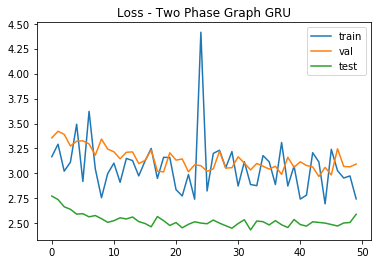

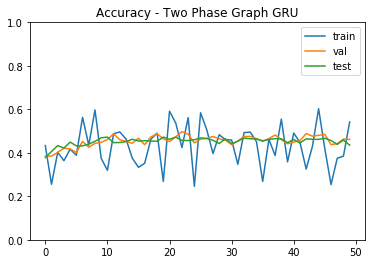

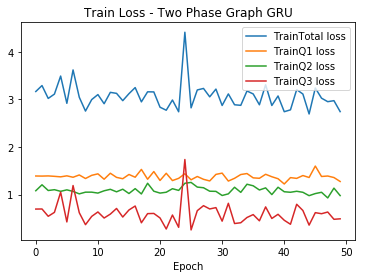

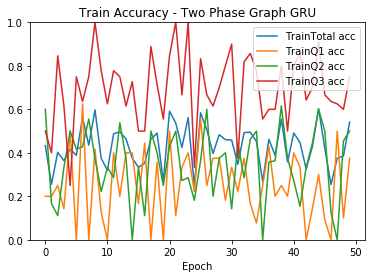

In [29]:
#==============================================================================
#  Main.py (有針對output model split question的case)
#==============================================================================
if split_question == 1:
    net, criterion, optimizer = loadGraphGRUModel(adjacency_matrix_Edge, split_question, show_layer = show_layer)
    history = {"loss":[], "val_loss":[], "test_loss":[], 
               "loss_q1":[], "val_loss_q1":[], "test_loss_q1":[],
               "loss_q2":[], "val_loss_q2":[], "test_loss_q2":[],
               "loss_q3":[], "val_loss_q3":[], "test_loss_q3":[],
               "acc":[], "val_acc":[], "test_acc":[], 
               "acc_q1":[], "val_acc_q1":[], "test_acc_q1":[],
               "acc_q2":[], "val_acc_q2":[], "test_acc_q2":[],
               "acc_q3":[], "val_acc_q3":[], "test_acc_q3":[]}
    start = time.time()
    for epoch in range(epochs):
        print('---------------[Epoch: ' + str(epoch + 1) + ']---------------')
        if cuda == 1:
            # release no use GPU memory
            torch.cuda.empty_cache() 
            print("GPU memory allocated : " + str(torch.cuda.memory_allocated() / (1024*1024)) + " MB")
        start_epoch = time.time()
        # create dataloader
        train_dataloader, val_dataloader, (v, q, a), (v_val, q_val, a_val) = sampler(q_ind, adjacency_matrix_Edge, all_com_pair_P, is_train = 1, balance_class = balance_class, show_shape = show_shape)
        test_dataloader, (v_test, q_test, a_test) = sampler(q_ind, adjacency_matrix_Edge_test, all_com_pair_P, is_train = 0, balance_class = balance_class, show_shape = show_shape)
        # train & validation
        train_loss, val_loss, train_acc, val_acc = train(epoch, train_dataloader, val_dataloader, net, criterion, optimizer, split_question = split_question)
        # test
        test_loss, test_acc = test(test_dataloader, net, criterion, optimizer, split_question = split_question)
        end_epoch = time.time()
        print("Time of epoch %s : " % str(epoch + 1), end_epoch - start_epoch, " sec")
        
        # save total loss
        history["loss"].append(train_loss[0].item())
        history["val_loss"].append(val_loss[0].item())
        history["acc"].append(train_acc[0])
        history["val_acc"].append(val_acc[0])
        history["test_loss"].append(test_loss[0].item())
        history["test_acc"].append(test_acc[0])
        
        # save each question loss
        for i in range(len(qtype)):
            history["loss_q{0}".format(str(i+1))].append(train_loss[i+1].item())
            history["val_loss_q{0}".format(str(i+1))].append(val_loss[i+1].item())
            history["acc_q{0}".format(str(i+1))].append(train_acc[i+1])
            history["val_acc_q{0}".format(str(i+1))].append(val_acc[i+1])
            history["test_loss_q{0}".format(str(i+1))].append(test_loss[i+1].item())
            history["test_acc_q{0}".format(str(i+1))].append(test_acc[i+1])

    end = time.time()
    print("Time : ", end-start, " sec")
    # draw loss and accuracy
    draw_losses(history, network = "Two Phase Graph GRU")
    draw_acc(history, network = "Two Phase Graph GRU")
    draw_splitQuestion_loss(history, network = "Two Phase Graph GRU", split_question = split_question)
    draw_splitQuestion_acc(history, network = "Two Phase Graph GRU", split_question = split_question)

    # 平均accuracy
    test_mean = np.mean(history["test_acc"])
    test_mean_q1 = np.mean(history["test_acc_q1"])
    test_mean_q2 = np.mean(history["test_acc_q2"])
    test_mean_q3 = np.mean(history["test_acc_q3"])

# 回傳每一個問題亂猜的機率大小
- 最多數量的類別 / 該問題總資料量

In [30]:
def highest_ratio(v,q,a, datatype = "Train"):
    """
    # 回傳每個問題的亂猜accuracy
    ---
    也就是說找出現最多次的class
    """
    print("[Each class amount of %s data]" % datatype)
    print("Total data amount: ", q.shape)
    # question 1
    rand_q1 = q[np.where(q[:,-3] == 1)[0]]
    #rand_a1 = a[:,:4]
    rand_a1 = a[np.where(q[:,-3] == 1)[0],:]
    rand_a1_max = np.argmax(rand_a1,1)
    a1_count = dict(Counter(rand_a1_max))
    print(a1_count)
    # question 2
    rand_q2 = q[np.where(q[:,-2] == 1)[0]]
    #rand_a2 = a[:,4:7]
    rand_a2 = a[np.where(q[:,-2] == 1)[0],:]
    rand_a2_max = np.argmax(rand_a2,1)
    a2_count = dict(Counter(rand_a2_max))
    print(a2_count)
    # question 3
    rand_q3 = q[np.where(q[:,-1] == 1)[0]]
    #rand_a3 = a[:,7:]
    rand_a3 = a[np.where(q[:,-1] == 1)[0],:]
    rand_a3_max = np.argmax(rand_a3,1)
    a3_count = dict(Counter(rand_a3_max))
    print(a3_count)

    # 算三個問題各自猜出現次數最多category的機率
    q1_guess = a1_count[max(a1_count, key=a1_count.get)] / rand_q1.shape[0]
    q2_guess = a2_count[max(a2_count, key=a2_count.get)] / rand_q2.shape[0]
    q3_guess = a3_count[max(a3_count, key=a3_count.get)] / rand_q3.shape[0]
    q_guess = [q1_guess, q2_guess, q3_guess]
    
    return q_guess, a1_count, a2_count, a3_count

In [31]:
if split_question == 0:
    print("Time : ", end-start, " sec")
    # draw loss and accuracy
    draw_losses(history, network = "Two Phase Graph GRU")
    draw_acc(history, network = "Two Phase Graph GRU")

    # 平均accuracy
    test_mean = np.mean(history["test_acc"])
    print("Testing Accuracy Average of two phase graph GRU : %.4f"% test_mean)
    
    # Maximum accuracy
    test_max = np.max(history["test_acc"])
    print("Testing Accuracy Maximum of two phase graph GRU : %.4f"% test_max)

Time :  85189.58902740479  sec


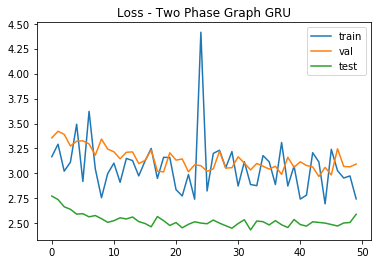

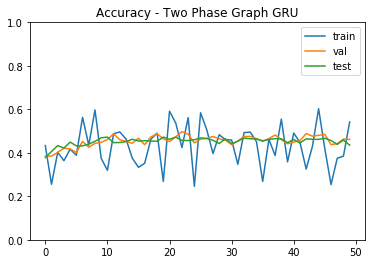

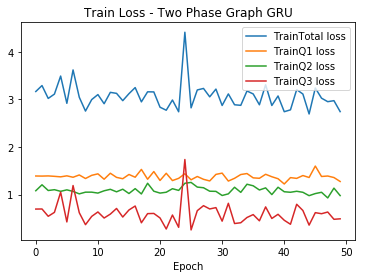

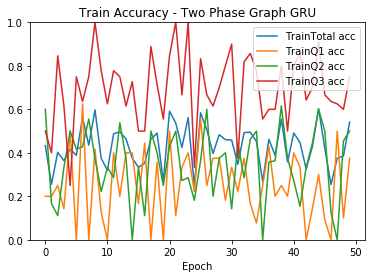

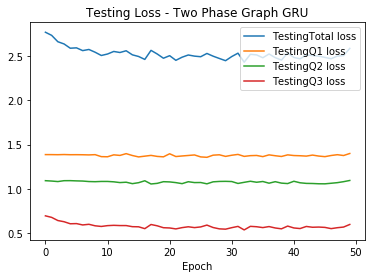

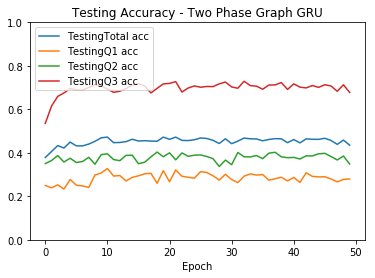

Testing [Total Accuracy] Average of two phase graph GRU : 0.4526
Testing [Pairwise Price Change Accuracy] Average of two phase graph GRU : 0.2836
Testing [Strength Accuracy] Average of two phase graph GRU : 0.3774
Testing [Volatility Accuracy] Average of two phase graph GRU : 0.6968
Testing [Total Accuracy] Max. of two phase graph GRU : 0.4723
Testing [Pairwise Price Change Accuracy] Max. of two phase graph GRU : 0.3279
Testing [Strength Accuracy] Max. of two phase graph GRU : 0.4036
Testing [Volatility Accuracy] Max. of two phase graph GRU : 0.7292


In [32]:
if split_question == 1:
    print("Time : ", end-start, " sec")
    # draw loss and accuracy
    draw_losses(history, network = "Two Phase Graph GRU")
    draw_acc(history, network = "Two Phase Graph GRU")
    draw_splitQuestion_loss(history, network = "Two Phase Graph GRU", split_question = split_question)
    draw_splitQuestion_acc(history, network = "Two Phase Graph GRU", split_question = split_question)
    draw_splitQuestion_loss(history, network = "Two Phase Graph GRU", split_question = split_question, datasetType = "Testing")
    draw_splitQuestion_acc(history, network = "Two Phase Graph GRU", split_question = split_question, datasetType = "Testing")

    # 平均accuracy for testing
    test_mean = np.mean(history["test_acc"])
    test_mean_q1 = np.mean(history["test_acc_q1"])
    test_mean_q2 = np.mean(history["test_acc_q2"])
    test_mean_q3 = np.mean(history["test_acc_q3"])
    
    # test average
    print("Testing [Total Accuracy] Average of two phase graph GRU : %.4f"% test_mean)
    print("Testing [%s Accuracy] Average of two phase graph GRU : %.4f"% (question_type[0], test_mean_q1))
    print("Testing [%s Accuracy] Average of two phase graph GRU : %.4f"% (question_type[1], test_mean_q2))
    print("Testing [%s Accuracy] Average of two phase graph GRU : %.4f"% (question_type[2], test_mean_q3))
    
     # test max
    print("Testing [Total Accuracy] Max. of two phase graph GRU : %.4f"% np.max(history["test_acc"]))
    print("Testing [%s Accuracy] Max. of two phase graph GRU : %.4f"% (question_type[0], np.max(history["test_acc_q1"])))
    print("Testing [%s Accuracy] Max. of two phase graph GRU : %.4f"% (question_type[1], np.max(history["test_acc_q2"])))
    print("Testing [%s Accuracy] Max. of two phase graph GRU : %.4f"% (question_type[2], np.max(history["test_acc_q3"])))

In [33]:
# 平均accuracy for validation
val_mean = np.mean(history["val_acc"])
val_mean_q1 = np.mean(history["val_acc_q1"])
val_mean_q2 = np.mean(history["val_acc_q2"])
val_mean_q3 = np.mean(history["val_acc_q3"])

# validation average
print("Validation [Total Accuracy] Average of two phase graph GRU : %.4f"% val_mean)
print("Validation [%s Accuracy] Average of two phase graph GRU : %.4f"% (question_type[0], val_mean_q1))
print("Validation [%s Accuracy] Average of two phase graph GRU : %.4f"% (question_type[1], val_mean_q2))
print("Validation [%s Accuracy] Average of two phase graph GRU : %.4f"% (question_type[2], val_mean_q3))

Validation [Total Accuracy] Average of two phase graph GRU : 0.4550
Validation [Pairwise Price Change Accuracy] Average of two phase graph GRU : 0.3100
Validation [Strength Accuracy] Average of two phase graph GRU : 0.3885
Validation [Volatility Accuracy] Average of two phase graph GRU : 0.6664


In [34]:
"""
# 顯示"最後一個Epoch" sample出來的資料比例
"""
a_guess, a1_count, a2_count, a3_count = highest_ratio(v, q, a, "Training")
a_guess_val, a1_count_val, a2_count_val, a3_count_val = highest_ratio(v_val, q_val, a_val, "Validation")
a_guess_test, a1_count_test, a2_count_test, a3_count_test = highest_ratio(v_test, q_test, a_test, "Testing")
print("Training guess ratio : Q1 - %.4f | Q2 - %.4f | Q3 - %.4f" % (a_guess[0], a_guess[1], a_guess[2]))
print("Validation guess ratio : Q1 - %.4f | Q2 - %.4f | Q3 - %.4f" % (a_guess_val[0], a_guess_val[1], a_guess_val[2]))
print("Testing guess ratio : Q1 - %.4f | Q2 - %.4f | Q3 - %.4f" % (a_guess_test[0], a_guess_test[1], a_guess_test[2]))
print("Average guess ratio : Train - %.4f | Val - %.4f | Test - %.4f" % (np.mean(a_guess), np.mean(a_guess_val), np.mean(a_guess_test)))

[Each class amount of Training data]
Total data amount:  (18726, 61)
{0: 1485, 3: 1569, 2: 1487, 1: 1654}
{5: 2287, 6: 2292, 4: 1629}
{9: 3140, 8: 3167, 7: 16}
[Each class amount of Validation data]
Total data amount:  (985, 61)
{0: 90, 3: 76, 2: 87, 1: 81}
{5: 110, 4: 102, 6: 114}
{9: 158, 8: 146, 7: 21}
[Each class amount of Testing data]
Total data amount:  (3080, 61)
{3: 255, 0: 273, 1: 254, 2: 267}
{5: 386, 4: 288, 6: 335}
{9: 504, 8: 518}
Training guess ratio : Q1 - 0.2670 | Q2 - 0.3692 | Q3 - 0.5009
Validation guess ratio : Q1 - 0.2695 | Q2 - 0.3497 | Q3 - 0.4862
Testing guess ratio : Q1 - 0.2602 | Q2 - 0.3826 | Q3 - 0.5068
Average guess ratio : Train - 0.3790 | Val - 0.3684 | Test - 0.3832


In [35]:
"""
plot pytorch model
"""
#net_plot

'\nplot pytorch model\n'

In [36]:
"""
Save model
"""
time = str(datetime.datetime.now()).split(' ')[0]
flag = ['Off', 'On']
if split_question == 0:
    if attention == 0:
        torch.save(net.state_dict(), 'model/twoPhaseGraphGRU_resample%s_%s_nstep%d_stateDim%d_nNode%d_Epoch%d_LinearOutput_allin_efficientVQA'%(flag[balance_class], time, n_steps, state_dim, n_node, epochs))
    else:
        torch.save(net.state_dict(), 'model/twoPhaseGraphGRU_attentionOn_resample%s_%s_nstep%d_stateDim%d_nNode%d_Epoch%d_LinearOutput_allin_efficientVQA'%(flag[balance_class], time, n_steps, state_dim, n_node, epochs))
else:
    if attention == 0:
        torch.save(net.state_dict(), 'model/twoPhaseGraphGRU_splitQuestion_resample%s_%s_nstep%d_stateDim%d_nNode%d_Epoch%d_LinearOutput_allin_efficientVQA'%(flag[balance_class], time, n_steps, state_dim, n_node, epochs))
    else:
        torch.save(net.state_dict(), 'model/twoPhaseGraphGRU_attentionOn_resample%s_splitQuestion_%s_nstep%d_stateDim%d_nNode%d_Epoch%d_LinearOutput_allin_efficientVQA'%(flag[balance_class], time, n_steps, state_dim, n_node, epochs))

In [37]:
"""
確認目前所有tensor的使用量
"""
import gc
def memory_usage_check():
    print("Checking GPU memory usage...")
    cal_mem = []
    for obj in gc.get_objects():
        try:
            if torch.is_tensor(obj) or (hasattr(obj, 'data') and torch.is_tensor(obj.data)):
                print("------------------------------------------------------------------")
                print(type(obj), obj.size())
                print("Memory allocated of obj: ", obj.element_size() * obj.nelement() * 2 / (1024*1024), "MB")
                cal_mem.append(obj.element_size() * obj.nelement() * 2)
        except:
            pass
    print("Total GPU memory usage", sum(cal_mem) / (1024*1024), "MB")
memory_usage_check()

Checking GPU memory usage...
------------------------------------------------------------------
<class 'torch.nn.parameter.Parameter'> torch.Size([32, 32])
Memory allocated of obj:  0.0078125 MB
------------------------------------------------------------------
<class 'torch.nn.parameter.Parameter'> torch.Size([32])
Memory allocated of obj:  0.000244140625 MB
------------------------------------------------------------------
<class 'torch.nn.parameter.Parameter'> torch.Size([32, 32])
Memory allocated of obj:  0.0078125 MB
------------------------------------------------------------------
<class 'torch.nn.parameter.Parameter'> torch.Size([32])
Memory allocated of obj:  0.000244140625 MB
------------------------------------------------------------------
<class 'torch.nn.parameter.Parameter'> torch.Size([32, 32])
Memory allocated of obj:  0.0078125 MB
------------------------------------------------------------------
<class 'torch.nn.parameter.Parameter'> torch.Size([32])
Memory allocated

In [38]:
"""
測試free GPU memory有沒有用
"""
print("GPU memory allocated : " + str(torch.cuda.memory_allocated() / (1024*1024)) + " MB")
torch.cuda.empty_cache()

GPU memory allocated : 3.654296875 MB



# 設計pair trading實驗
## 算pair-trading return的方法
* https://quant.stackexchange.com/questions/7488/what-is-the-proper-way-to-calculate-returns-for-pair-trading
* 在我的例子就是把兩個初始價格相加，計算兩支股票各自的價差(清算價格 - 初始價格)，然後(價差 / 初始價格相加) * 100
* long, short兩支股票的購買金額應該一樣 (A == B * ratio(B/A))，如果A是100塊，那B也要是100塊
'''
美股交易稅：稅金很低，僅0.0000231 (2017)
新制參考：https://etfs.tw/sec-fee/　（我的資料還不用用到這個，用0.0013%就好）
'''

In [103]:
'''
用testing資料來做pair trading
'''
djia30 = os.listdir('djia30')
data30 = {}
# 挑pair company
temp_c = ["AAPL","MSFT"]
temp_c.sort()
temp_c = symbolsort
# 找出這幾間公司在目錄下的檔案名稱
temp = [c for c in djia30 if any(tc in c for tc in temp_c)]
# 這裡建議要取n個月的資料就n*30天
day = 30
company_num = len(temp_c)
period_test = [12]

print('Loading raw data...')
for file_name in temp:
    print("[" + file_name.split(".")[0] + "]")
    data30[file_name.split(".")[0]] = pd.read_pickle('/mnt/sdb/chia/djia30/' + file_name)

# 計算每秒的return及price
price_and_return_for_test = {}
for company in temp_c:   
    print('Calculate return and price of ' + company)
    price_data_for_test, return_data_for_test, date_test = cal_return(data30[company], period=period_test, return_date = 1)
    # 算漲跌幅 
    # 同義於 np.diff(price_data[0,:]) / price_data[0,:-1]
    change_data_for_test = return_data_for_test / price_data_for_test[:,:-1]
    price_data_for_test = np.float16(price_data_for_test)
    return_data_for_test = np.float16(return_data_for_test)
    change_data_for_test = np.float16(change_data_for_test)
    # 取需要的資料量
    price_and_return_for_test[company] = [price_data_for_test[:day_test], return_data_for_test[:day_test], change_data_for_test[:day_test]]

# 用來確認實際餵入的天數
day_test = price_and_return_for_test[company][0].shape[0]

# 儲存日期資料
date_test_noyear = [str(date_test[i])[5:] for i in range(len(date_test))]

adjacency_matrix_Edge_test = adjacency_matrix_Edge_dict[quarter_month[period_test[0]]]

del data30

Loading raw data...
[CAT]
[WMT]
[MSFT]
[XOM]
[PG]
[JPM]
[GE]
[MCD]
[PFE]
[IBM]
[GS]
[INTC]
[V]
[DIS]
[VZ]
[MMM]
[UNH]
[BA]
[CSCO]
[TRV]
[CVX]
[HD]
[AAPL]
[JNJ]
[MRK]
[NKE]
[UTX]
[AXP]
[KO]
Calculate return and price of AAPL
Calculate return and price of AXP
Calculate return and price of BA
Calculate return and price of CAT
Calculate return and price of CSCO
Calculate return and price of CVX
Calculate return and price of DIS
Calculate return and price of GE
Calculate return and price of GS
Calculate return and price of HD
Calculate return and price of IBM
Calculate return and price of INTC
Calculate return and price of JNJ
Calculate return and price of JPM
Calculate return and price of KO
Calculate return and price of MCD
Calculate return and price of MMM
Calculate return and price of MRK
Calculate return and price of MSFT
Calculate return and price of NKE
Calculate return and price of PFE
Calculate return and price of PG
Calculate return and price of TRV
Calculate return and price of U

In [104]:
def rolling(data, price_and_return, window, shift, day, mode = 'return', show_shape = 0):    # 後面的數字是資料的第幾天
    """
    # rolling data，產生V和A的frame
    ---
    Inputs : 
    data - 價格 (只是要他的當日交易秒數也就是23400當作shape)
    price_and_return - 所有公司所有交易日的price、return data還有漲跌幅
    window : 要看過去多少時間的歷史資料 (我的case = 300)
    shift : 每一個frame overlap的時間長度 (我的case = 150)
    day : 哪一個交易日
    mode : 決定rolling的資料型態(price, return, change)
    Outputs:
    v_data : 過去一段時間的公司資訊 (shape = 公司數 x 時間長度, ex : 29 * 299)
    v_answer_data : 未來一段時間的公司資訊 (shape = 公司數 x 時間長度, ex : 29 * 59)
    position : 紀錄交易日、起始、終止時間
    """
    rolling_data = {}
    position = []
    input_length = window + shift
    shift_length = shift
    if show_shape == 1:
        print("------Rolling for %s ------" % mode)
        print("window size : %s" % window)
        print("shift length : %s" % shift)
    
    # 有overlap
    if mode == 'return' or mode == 'change':
        c = int((data.shape[1] - input_length)/ shift_length) + 1
        tmp = np.zeros((c,company_num,input_length-1))
    else:
        c = int((data.shape[1] - input_length)/ shift_length) + 1
        tmp = np.zeros((c,company_num,input_length))

    for j in range(c):
        count = 0
        for company in temp_c:
            if mode == 'return': # return
                # 有overlap
                tmp[j][count] = price_and_return[company][1][day,j*shift_length:(input_length+(j*shift_length))-1]
                # 把每次切的frame位置記下來
                position.append([day, j*shift_length, (input_length+(j*shift_length))-1])
            elif mode == 'change': # return
                # 有overlap
                tmp[j][count] = price_and_return[company][2][day,j*shift_length:(input_length+(j*shift_length))-1]
                # 把每次切的frame位置記下來
                position.append([day, j*shift_length, (input_length+(j*shift_length))-1])
            else:    # price
                # 有overlap
                tmp[j][count] = price_and_return[company][0][day,j*shift_length:(input_length+(j*shift_length))]
                # 把每次切的frame位置記下來
                position.append([day, j*shift_length, window+j*shift_length, (input_length+(j*shift_length))])
            count += 1

        rolling_data[day] = tmp
    #print("[Split data finish !]")

    # 把所有切好的data stack成testing dataset
    roll_data = np.vstack(rolling_data.values())    #(?,29,299)
    if mode == 'return' or mode == 'change':
        v_data, v_answer_data = roll_data[:,:,:window-1], roll_data[:,:,window:]
    else:
        v_data, v_answer_data = roll_data[:,:,:window], roll_data[:,:,window:]
    #print("[Rolling data finish !]")
    
    return v_data, v_answer_data, position

def ratio_pair(pairs, price_data, price_and_return, window, shift, day, mode = 'price'):
    """
    # 產生兩間特定公司的ratio pair，為了接下來pairs trading所用
    ---
    Inputs : 
    pairs - 兩間目標公司 (ex. AAPL, MSFT)
    Outputs:
    roll_pair_ratio : 這兩間公司每一個frame的price ratio
    position : 紀錄交易日、起始、終止時間
    """
    c1 = sorted(temp_c).index(pairs[0])
    c2 = sorted(temp_c).index(pairs[1])
    
    roll_pair = rolling(price_data, price_and_return, window, shift, day, mode = mode)[0][:,[c1,c2],:]
    position = rolling(price_data, price_and_return, window, shift, day, mode = mode)[2]
    roll_pair_ratio = roll_pair[:,0,:] / roll_pair[:,1,:]
    
    return roll_pair_ratio, position

# Rule-based Pair Trading Strategy
* 這裡的作法已經不重要了，因為Rule-based_PairsTrading.ipynb已經做過了
* 請直接看NN-based的方法

In [105]:
# Trade using a simple strategy
def zscore_trade(S1, S2, c1, c2, window1, window2, show_print = 0, fee = 0, rollingMode = 'pd', profit_Mode = 0):
    '''
    buys 1 ratio (buy 1 AAPL stock and sell ratio x MSFT stock) when ratio is low, 
    sell 1 ratio (sell 1 AAPL stock and buy ratio x MSFT stock) when it’s high, 
    and calculate PnL (profit and loss，損益) of these trades.
    '''
    
    # If window length is 0, algorithm doesn't make sense, so exit
    if (window1 == 0) or (window2 == 0):
        return 0
    
    # Compute rolling mean and rolling standard deviation
    ratios = pd.DataFrame({"ratios" : (S1.values/S2.values).ravel()})
    
    if rollingMode == 'pd':
        ma1 = ratios.rolling(window=window1,
                                   center=False).mean()
        ma2 = ratios.rolling(window=window2,
                                   center=False).mean()
        std = ratios.rolling(window=window2,
                                   center=False).std()
        zscore = (ma1 - ma2)/std
    
    else:
        # 這裡就有先決定要挑哪兩間公司
        mavg_slow = np.mean(ratio_pair(pairs[0], window1, shift_length)[0], 1)
        mavg_fast = np.mean(ratio_pair(pairs[0], window2, shift_length)[0], 1)
        std_slow = np.std(ratio_pair(pairs[0], window2, shift_length)[0], 1)
        
        zscore = (mavg_fast - mavg_slow[int((window1-window2)/shift_length):]) / std_slow[int((window1-window2)/shift_length):]       
        zscore = pd.Series(zscore, name = "zscore")
    
    # Simulate trading
    # Start with no money and no positions
    b_s, s_s = [], []
    if profit_Mode == 0:
        money = 0
    else:
        money = 1
        temp_S1, temp_S2 = 0, 0 # 用來記錄
        
    countS1 = 0
    countS2 = 0
    # 每n秒強制交割一次
    time_count = 0
    # 若每n秒內已經買賣過股票就不再入場
    flag = 0
    for i in range(len(ratios)):
        time_count += 1
        # 前300秒不交易
        if i + 1 > v_length:
            #time_count += 1
            if show_print == 1:
                print("---------[Time = %s]---------" % i)
                print("Current profit and postion : ", " profit - ", money, " | S1 pos - ", countS1, " | S2 pos - ", countS2)
            # Sell short if the z-score is > 1
            if zscore.iloc[i][0] > 1 and abs(countS1) <= 0 and flag == 0:    # 限制一次只能買賣一股
                # 交易成本部分： 0.00231%的交易稅、各0.5%的手續費
                ratio = S1.iloc[i][0] / S2.iloc[i][0]
                if profit_Mode == 0:
                    if fee == 1:
                        money += S1.iloc[i][0] - S2.iloc[i][0] * ratio - 0.0000231 * S1.iloc[i][0] - 0.005 * S1.iloc[i][0] - 0.005 * S2.iloc[i][0] * ratio
                    else:
                        money += S1.iloc[i][0] - S2.iloc[i][0] * ratio
                countS1 -= 1
                countS2 += ratio
                temp_S1, temp_S2 = S1.iloc[i][0], S2.iloc[i][0]
                s_s.append(i)
                flag = 1
                if show_print == 1:
                    print('[Selling Ratio] profit %s | price ratios %s | S1 %s pos | S2 %s pos'% (money, ratio, countS1, countS2))
                    print('[Sell %s and Buy %s] profit %s | price ratios %s | C1 %s pos | C2 %s pos'% (c1, c2, money, ratio, countS1, countS2))
                    print('%s price - %s revenue - %s | %s price - %s payment - %s |' % (c1, S1.iloc[i][0], S1.iloc[i][0], c2, S2.iloc[i][0], S2.iloc[i][0] * ratio))
            
            # Buy long if the z-score is < -1
            elif zscore.iloc[i][0] < -1 and abs(countS1) <= 0 and flag == 0:    # 限制一次只能買賣一股
                # 交易成本部分： 0.00231%的交易稅、各0.5%的手續費
                ratio = S1.iloc[i][0] / S2.iloc[i][0]
                if profit_Mode == 0:
                    if fee == 1:
                        money -= S1.iloc[i][0] - S2.iloc[i][0] * ratio - 0.0000231 * S2.iloc[i][0] * ratio - 0.005 * S1.iloc[i][0] - 0.005 * S2.iloc[i][0] * ratio
                    else:
                        money -= S1.iloc[i][0] - S2.iloc[i][0] * ratio
                countS1 += 1
                countS2 -= ratio
                temp_S1, temp_S2 = S1.iloc[i][0], S2.iloc[i][0]
                b_s.append(i)
                flag = 1
                if show_print == 1:
                    print('[Buying Ratio] profit %s | price ratios %s | S1 %s pos | S2 %s pos'% (money, ratio, countS1, countS2))
                    print('[Buy %s and Sell %s] profit %s | price ratios %s | C1 %s pos | C2 %s pos'% (c1, c2, money, ratio, countS1, countS2))
                    print('%s price - %s payment - %s | %s price - %s revenue - %s |' % (c1, S1.iloc[i][0], S1.iloc[i][0], c2, S2.iloc[i][0], S2.iloc[i][0] * ratio))
            
            # Clear positions if the z-score between -.5 and .5 
            # 手上持有一股或者決策時間到的時候需要清算時執行
            elif ((abs(zscore.iloc[i][0]) < 0.5 and abs(countS1) == 1) or (time_count == shift_length and abs(countS1) == 1)):
            #elif abs(zscore.iloc[i][0]) < 0.5:
                # 交易成本部分： 0.00231%的交易稅、各0.5%的手續費
                ratio = S1.iloc[i][0] / S2.iloc[i][0]
                if profit_Mode == 0:
                    if fee == 1:
                        money += countS1 * S1.iloc[i][0] + S2.iloc[i][0] * countS2 - 0.0000231 * (countS1 * S1.iloc[i][0] + countS2 * S2.iloc[i][0]) - 0.005 * (S1.iloc[i][0] * countS1 + S2.iloc[i][0] * countS2)
                    else:
                        money += countS1 * S1.iloc[i][0] + S2.iloc[i][0] * countS2
                else:    #profit rate
                    if fee == 1:
                        money *= 1 + (countS1 * S1.iloc[i][0] + S2.iloc[i][0] * countS2 - 0.0000231 * (countS1 * S1.iloc[i][0] + countS2 * S2.iloc[i][0]) - 0.005 * (S1.iloc[i][0] * countS1 + S2.iloc[i][0] * countS2)) / (temp_S1 + temp_S2)
                    else:
                        money *= 1 + (countS1 * S1.iloc[i][0] + S2.iloc[i][0] * countS2) / (temp_S1 + temp_S2)
                
                if show_print == 1:
                    print('[Exit position] profit %s | price ratios %s | S1 %s pos | S2 %s pos'% (money, ratio, -countS1, -countS2))
                    print('%s price - %s, earn : %s | %s price - %s, earn : %s |' % (c1, S1.iloc[i][0], countS1 * S1.iloc[i][0], c2, S2.iloc[i][0], countS2 * S2.iloc[i][0]))
        
                countS1, countS2 = 0, 0
        
        if time_count == shift_length:
            time_count = 0
            flag = 0
            
    return money, b_s, s_s

In [106]:
# Normalization
def zscore(series):
    """
    # 對Moving average的Normalization (mean-std)
    """
    if isinstance(series, pd.Series):
        return (series - series.mean()) / (series).std()
    else:
        return (series - np.mean(series)) / np.std(series, dtype=np.float64)

# Baseline : Rule-based Pair trading

In [107]:
trading_time = 23400    # 一天
window_l = 300 # 算長線的window
window_s = 60 # 算短線的window
profit_Mode = 1 # 0 : 實際獲利金額 1 : 收益率

Finding cointegrated pairs...


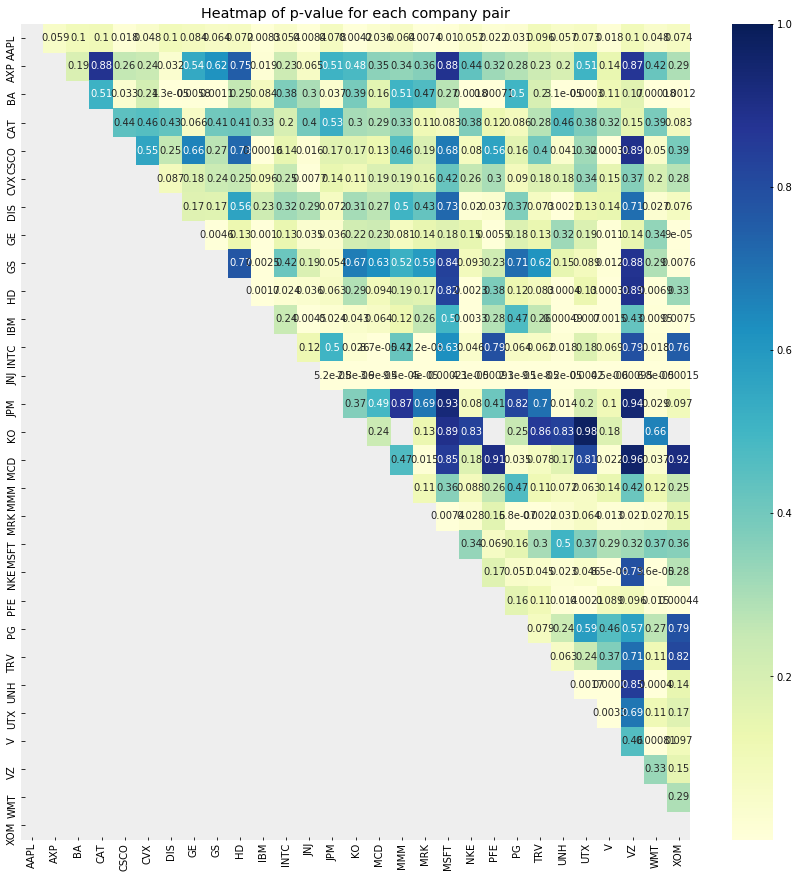

In [108]:
"""
# 用來對每間公司做cointegrate hypothesis的function
---
p-value < 0.05者：代表兩序列之間具有cointegrate特性
註：
    在我的實驗不會用到，因為我已經先假設成AAPL和MSFT這兩間公司直接去跑
    如果有要挑公司去做pairs trading的情況才需要用到
"""
from statsmodels.tsa.stattools import coint
import seaborn as sns

price_company = pd.DataFrame(columns = temp_c)
for c in temp_c:
    price_company[c] = np.hstack(price_and_return[c][0])[:trading_time]

# HD這間公司第一筆資料nan直接補0
price_company['HD'][0] = 0
# =============================================================================
# find_cointegrated_pairs
# =============================================================================
def find_cointegrated_pairs(data):
    n = data.shape[1]
    score_matrix = np.zeros((n, n))
    pvalue_matrix = np.ones((n, n))
    keys = data.keys()
    pairs = []
    for i in range(n):
        for j in range(i+1, n):
            S1 = data[keys[i]]
            S2 = data[keys[j]]
            result = coint(S1, S2)
            score = result[0]
            pvalue = result[1]
            score_matrix[i, j] = score
            pvalue_matrix[i, j] = pvalue
            if pvalue < 0.05:
                pairs.append((keys[i], keys[j]))
                
    return score_matrix, pvalue_matrix, pairs

# =============================================================================
# 用來確認temp_c這些公司是否符合cointegrate的假設檢定
# =============================================================================
print("Finding cointegrated pairs...")
scores, pvalues, pairs = find_cointegrated_pairs(price_company)
m = [0,0.2,0.4,0.6,0.8,1]

plt.figure(figsize=(15, 15))
sns.heatmap(pvalues, xticklabels = temp_c, 
                yticklabels = temp_c, cmap='YlGnBu', 
                mask = (pvalues >= 0.98), annot=True)
plt.title("Heatmap of p-value for each company pair")
plt.show()


In [109]:
# 所有符合cointegrated假設檢定(p-value < 0.05)的股票對
pairs

[('AAPL', 'CSCO'),
 ('AAPL', 'CVX'),
 ('AAPL', 'IBM'),
 ('AAPL', 'JNJ'),
 ('AAPL', 'KO'),
 ('AAPL', 'MCD'),
 ('AAPL', 'MRK'),
 ('AAPL', 'MSFT'),
 ('AAPL', 'PFE'),
 ('AAPL', 'PG'),
 ('AAPL', 'V'),
 ('AAPL', 'WMT'),
 ('AXP', 'DIS'),
 ('AXP', 'IBM'),
 ('BA', 'CSCO'),
 ('BA', 'DIS'),
 ('BA', 'GE'),
 ('BA', 'GS'),
 ('BA', 'JPM'),
 ('BA', 'NKE'),
 ('BA', 'PFE'),
 ('BA', 'UNH'),
 ('BA', 'UTX'),
 ('BA', 'WMT'),
 ('BA', 'XOM'),
 ('CSCO', 'IBM'),
 ('CSCO', 'JNJ'),
 ('CSCO', 'UNH'),
 ('CSCO', 'V'),
 ('CSCO', 'WMT'),
 ('CVX', 'JNJ'),
 ('DIS', 'NKE'),
 ('DIS', 'PFE'),
 ('DIS', 'UNH'),
 ('DIS', 'WMT'),
 ('GE', 'GS'),
 ('GE', 'IBM'),
 ('GE', 'JNJ'),
 ('GE', 'JPM'),
 ('GE', 'PFE'),
 ('GE', 'V'),
 ('GE', 'XOM'),
 ('GS', 'IBM'),
 ('GS', 'V'),
 ('GS', 'XOM'),
 ('HD', 'IBM'),
 ('HD', 'INTC'),
 ('HD', 'JNJ'),
 ('HD', 'NKE'),
 ('HD', 'UNH'),
 ('HD', 'V'),
 ('HD', 'WMT'),
 ('IBM', 'JNJ'),
 ('IBM', 'JPM'),
 ('IBM', 'KO'),
 ('IBM', 'NKE'),
 ('IBM', 'UNH'),
 ('IBM', 'UTX'),
 ('IBM', 'V'),
 ('IBM', 'WMT'),
 ('IB

# Draw Rule-based Trading buy and sell condition

In [110]:
def drawTradingCondition(c1, c2, price_and_return, day, window_l, window_s, trading_time, buy = 0, sell = 0, b_s = 0, s_s = 0, mode = 'rule'):
    """
    # 作圖的function
    ---
    Inputs : 
    c1, c2 : 兩間公司
    price_and_return - 所有公司所有交易日的price、return data還有漲跌幅
    day : 哪一個交易日
    window_l : 長線的window size (算long-term moving average用)
    window_s : 短線的window size (算short-term moving average用)
    trading_time : 交易時間長短 (直接設定日內)
    buy, sell, b_s, s_s : 交易時間戳記 (用來畫trading signal)
    mode : rule-based或者Neural Network-based的model作圖
    """
    # =============================================================================
    #  plot price ratio
    # =============================================================================
    c1_price = price_and_return[c1][0]
    c2_price = price_and_return[c2][0]
    S1 = c1_price[day,:trading_time]
    S2 = c2_price[day,:trading_time]
    
    print("Plot Price of %s and %s" % (c1, c2))
    plt.figure(figsize=(15,7))
    plt.plot(S1 - (np.mean(S1) - np.mean(S2)))
    plt.plot(S2)
    plt.title("Adjusted Price of %s and %s" % (c1, c2))
    plt.legend([c1,c2])
    plt.show()
    
    if mode == "rule":
        ratios = S1 / S2
        print("Plot Price ratio of %s and %s" % (c1, c2))
        plt.figure(figsize=(15,7))
        plt.plot(ratios)
        plt.axhline(ratios.mean(), color = 'r')
        plt.title("Price ratio of %s and %s" % (c1, c2))
        plt.legend(['Price Ratio'])
        plt.show()

        # =============================================================================
        #  plot z score of price ratio
        # =============================================================================
        z_ratio = (ratios - np.mean(ratios)) / np.std(ratios, dtype=np.float64)
        print("Plot z-score of price ratio of %s and %s" % (c1, c2))
        plt.figure(figsize=(15,7))
        plt.plot(z_ratio)
        plt.axhline(np.mean(z_ratio), color='black')
        plt.axhline(1.0, color='red', linestyle='--')
        plt.axhline(-1.0, color='green', linestyle='--')
        plt.title("Z-score of price ratio of %s and %s" % (c1, c2))
        plt.legend(['Ratio z-score', 'Mean', '+1', '-1'])
        plt.show()

        # =============================================================================
        #  Pair-Trading : plot ratio and moving average (60 sec and 300 sec)
        # =============================================================================

        z_ratio = pd.DataFrame({'ratios':ratios})

        ratios_mavg_s = z_ratio.rolling(window = window_s, center = False).mean()

        ratios_mavg_l = z_ratio.rolling(window = window_l, center = False).mean()

        std_l = z_ratio.rolling(window = window_l, center = False).std()

        zscore_l_s = (ratios_mavg_s - ratios_mavg_l) / std_l

        print("Plot price ratio and its moving average of %s and %s" % (c1, c2))
        plt.figure(figsize=(15,7))
        plt.plot(z_ratio.index, z_ratio.values)
        plt.plot(ratios_mavg_s.index, ratios_mavg_s.values)
        plt.plot(ratios_mavg_l.index, ratios_mavg_l.values)
        plt.title("Price ratio and its moving average of %s and %s" % (c1, c2))
        plt.legend(['Ratio','%ss Ratio MA' % window_s, '%ss Ratio MA' % window_l])
        plt.ylabel('Ratio')
        plt.show()
        
        print("Plot z-score of long and short rolling price ratio of %s and %s" % (c1, c2))
        plt.figure(figsize=(15,7))
        plt.plot(zscore_l_s)
        plt.axhline(0, color='black')
        plt.axhline(1.0, color='red', linestyle='--')
        plt.axhline(-1.0, color='green', linestyle='--')
        plt.title("Z-score of long and short rolling price ratio of %s and %s" % (c1, c2))
        plt.legend(['Rolling Ratio z-Score', 'Mean', '+1', '-1'])
        plt.show()

        # =============================================================================
        # Plot the ratios and buy and sell signals from z score
        # =============================================================================
        print("Plot z-score and trading signal of price ratio of %s and %s" % (c1, c2))
        plt.figure(figsize=(15,7))
        plt.plot(z_ratio[window_l:])
        buy = z_ratio.copy()
        sell = z_ratio.copy()
        if isinstance(b_s, list):
            plt.plot(b_s, buy.iloc[b_s], color='g', linestyle='None', marker='^')
            plt.plot(s_s, sell.iloc[s_s], color='r', linestyle='None', marker='^')
        else:
            buy[zscore_l_s > -1] = 0
            sell[zscore_l_s < 1] = 0
            plt.plot(buy[window_l:],color='g', linestyle='None', marker='^')
            plt.plot(sell[window_l:],color='r', linestyle='None', marker='^')
        x1,x2,y1,y2 = plt.axis()
        plt.axis((x1,x2,ratios.min(),ratios.max()))
        plt.title("Z-score and trading signal of price ratio of %s and %s" % (c1, c2))
        plt.legend(['Ratio', 'Buy Signal', 'Sell Signal'])
        plt.show()

        # =============================================================================
        # Plot the prices and buy and sell signals from z score
        # =============================================================================
        print("Trading signal of %s and %s" % (c1, c2))
        plt.figure(figsize=(18,9))
        S1 = pd.DataFrame({c1: (S1 - (S1.mean()-S2.mean()))}) # 後面-55故意寫上去比較好看曲線
        S2 = pd.DataFrame({c2: S2}) 
        plt.plot(S1[window_l:],color='b')
        plt.plot(S2[window_l:],color='c')
        buyR = 0 * S1.copy()
        sellR = 0 * S1.copy()

        if isinstance(b_s, list):
            # When buying the ratio, buy S1 and sell S2
            buyR.iloc[b_s] = S1.iloc[b_s]
            sellR.iloc[b_s] = S2.iloc[b_s]
            # When selling the ratio, sell S1 and buy S2
            buyR.iloc[s_s] = S2.iloc[s_s]
            sellR.iloc[s_s] = S1.iloc[s_s]
            
        else:
            # When buying the ratio, buy S1 and sell S2
            flag_buy = np.where(np.array(buy).ravel() != 0)[0]
            buyR.iloc[flag_buy] = S1.iloc[flag_buy]
            sellR.iloc[flag_buy] = S2.iloc[flag_buy]
            # When selling the ratio, sell S1 and buy S2
            flag_sell = np.where(np.array(sell).ravel() != 0)[0]
            buyR.iloc[flag_sell] = S2.iloc[flag_sell]
            sellR.iloc[flag_sell] = S1.iloc[flag_sell]

        plt.plot(buyR[window_l:],color='g', linestyle='None', marker='^')
        plt.plot(sellR[window_l:],color='r', linestyle='None', marker='^')
        x1,x2,y1,y2 = plt.axis()
        plt.axis((x1,x2,min(S1.min()[0],S2.min()[0]),max(S1.max()[0],S2.max()[0])))
        plt.title("Adjusted Trading signal of %s and %s" % (c1, c2))
        plt.legend([c1, c2, 'Buy Signal', 'Sell Signal'])
        plt.show()
        
    # NN版本的pairs trading作圖
    else:
        ratios = S1 / S2
        z_ratio = pd.DataFrame({'ratios':ratios})
        # =============================================================================
        # Plot the ratios and buy and sell signals from z score
        # =============================================================================
        print("Plot z-score and trading signal of price ratio of %s and %s" % (c1, c2))
        plt.figure(figsize=(15,7))
        plt.plot(z_ratio)
        buyR = z_ratio.copy()
        sellR = z_ratio.copy()
        
        plt.plot(buy, buyR.iloc[buy], color='g', linestyle='None', marker='^')
        plt.plot(sell, sellR.iloc[sell], color='r', linestyle='None', marker='^')
        x1,x2,y1,y2 = plt.axis()
        plt.axis((x1,x2,ratios.min(),ratios.max()))
        plt.title("Z-score and trading signal of price ratio of %s and %s" % (c1, c2))
        plt.legend(['Ratio', 'Buy Signal', 'Sell Signal'])
        plt.show()
        
        print("Trading signal of %s and %s for learning-based pair trading" % (c1, c2))
        plt.figure(figsize=(18,9))
        S1 = pd.DataFrame({c1: (S1 - (S1.mean() -  S2.mean()))})
        S2 = pd.DataFrame({c2: S2})
        plt.plot(S1,color='b')
        plt.plot(S2,color='c')
        buyR = 0 * S1.copy()
        sellR = 0 * S1.copy()

        # When buying the ratio, buy S1 and sell S2
        buyR.iloc[buy] = S1.iloc[buy]
        sellR.iloc[buy] = S2.iloc[buy]
        # When selling the ratio, sell S1 and buy S2
        buyR.iloc[sell] = S2.iloc[sell]
        sellR.iloc[sell] = S1.iloc[sell]

        plt.plot(buyR,color='g', linestyle='None', marker='^')
        plt.plot(sellR,color='r', linestyle='None', marker='^')
        x1,x2,y1,y2 = plt.axis()
        plt.axis((x1,x2,min(S1.min()[0],S2.min()[0]),max(S1.max()[0],S2.max()[0])))
        plt.title("Adjusted Trading signal of %s and %s for learning-based pair trading" % (c1, c2))
        plt.legend([c1, c2, 'Buy Signal', 'Sell Signal'])
        plt.show()
    

# Draw Accumulated Profit and Profit for each day

In [111]:
def draw_profit(profit_day, date_test_noyear, period, mode = "Rule-based", profit_Mode = 0):
    """
    # 畫累積收益圖以及當日收益圖
    ---
    Accumulated Profit
    Daily Profit
    """
    # 累積收益
    fig = plt.gcf()
    plt.figure(figsize=(15,7))
    if profit_Mode == 0:
        plt.plot(np.cumsum(profit_day))
    else:
        plt.plot(np.cumprod(profit_day))
    plt.xticks(range(day_test), date_test_noyear)
    plt.title('Accumulated Profit between %s and %s in Month %s by %s pair trading' % (p[0], p[1], period[0], mode))
    plt.style.use("bmh")
    plt.xlim(0,19)
    plt.xlabel('Day')
    plt.ylabel('Profit')
    plt.show()
    
    # 分開畫
    fig = plt.gcf()
    plt.figure(figsize=(15,7))
    plt.plot(profit_day)
    plt.xticks(range(day_test), date_test_noyear)
    plt.title('Profit between %s and %s for each trading day in Month %s by %s pair trading' % (p[0], p[1], period[0], mode))
    plt.style.use("bmh")
    plt.xlim(0,19)
    plt.xlabel('Day')
    plt.ylabel('Profit')
    plt.show()

# Rule-based Pair Trading
為了和NN的設定盡可能接近：
- 每Shift_length個時間點內最多只能持有一股，Shift_length時間到強制清算

<Figure size 432x288 with 0 Axes>

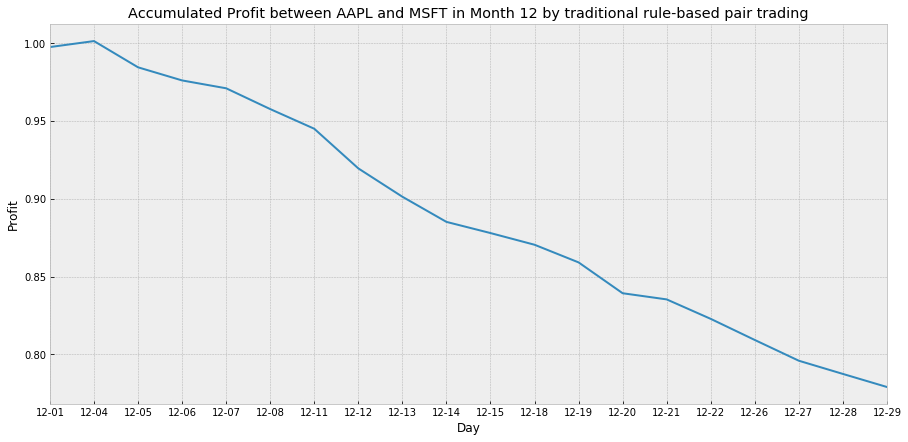

In [112]:
# 這邊是用price ratio來做策略
p = ['AAPL', 'MSFT']
profit_day = []
# 直接load Rule-based_PairsTrading.ipynb
load_data = 1
# load back
if load_data == 0:
    profit_day = []
    for i in range(day_test):
        print("[Day %s]" % str(i+1))
        S1 = pd.DataFrame({p[0]: price_and_return_for_test[p[0]][0][i,:]})
        S2 = pd.DataFrame({p[1]: price_and_return_for_test[p[1]][0][i,:]})
        # lock長時間的window = 60
        #best_window = [zscore_trade_train(S1, S2, c1, c2, price_data_for_test, price_and_return_for_test, l, 60, day, profit_Mode = profit_Mode) for l in range(5, 60, 2)]
        profit, b_s, s_s = zscore_trade(S1, S2, p[0], p[1], price_data_for_test, price_and_return_for_test, window_s, window_l, i, show_print = 0, rollingMode = rollingMode, profit_Mode = profit_Mode)
        profit_day.append(profit)
        drawTradingCondition(p[0], p[1], price_and_return_for_test, i, window_l, window_s, trading_time, b_s = b_s, s_s = s_s)
else:
    profit_day = np.load("predictresult/profit_Rule-basedPairTrading_%s_%s_%s_%d_shiftlength%d.npy" % ("2019-07-26", p[0], p[1], period_test[0], shift_length))

# Plot profit
fig = plt.gcf()
plt.figure(figsize=(15,7))
if profit_Mode == 0:
    plt.plot(np.cumsum(profit_day))
else:
    plt.plot(np.cumprod(profit_day))
plt.xticks(range(day_test), date_test_noyear)
plt.title('Accumulated Profit between %s and %s in Month %s by traditional rule-based pair trading' % (p[0], p[1], period_test[0]))
plt.style.use("bmh")
plt.xlim(0,day_test-1)
plt.xlabel('Day')
plt.ylabel('Profit')
plt.show()

In [113]:
profit_day

array([0.99744938, 1.00385247, 0.98316087, 0.99143656, 0.99482784,
       0.98624141, 0.98680581, 0.97303581, 0.98019962, 0.98207062,
       0.99188745, 0.99144754, 0.98696803, 0.97693519, 0.99527843,
       0.98502215, 0.98351363, 0.98352059, 0.98934927, 0.98933147])

<Figure size 432x288 with 0 Axes>

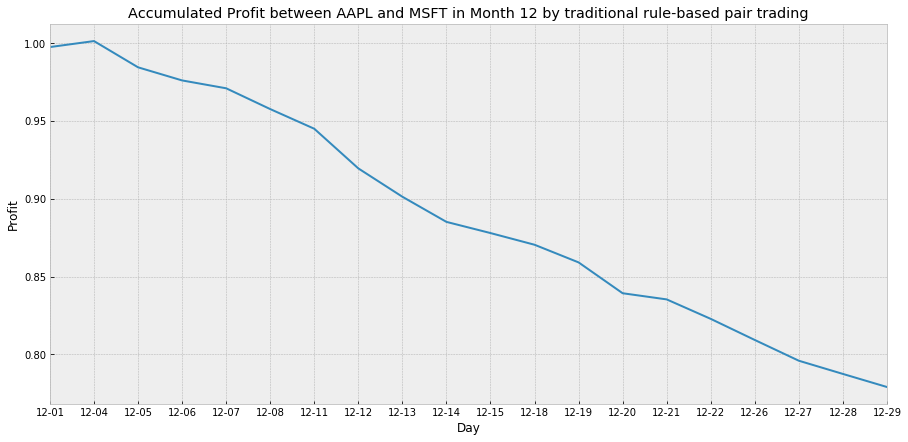

In [114]:
fig = plt.gcf()
plt.figure(figsize=(15,7))
if profit_Mode == 0:
    plt.plot(np.cumsum(profit_day))
else:
    plt.plot(np.cumprod(profit_day))
plt.xticks(range(day_test), date_test_noyear)
plt.title('Accumulated Profit between %s and %s in Month %s by traditional rule-based pair trading' % (p[0], p[1], period_test[0]))
plt.style.use("bmh")
plt.xlim(0,day_test-1)
plt.xlabel('Day')
plt.ylabel('Profit')
plt.show()

<Figure size 432x288 with 0 Axes>

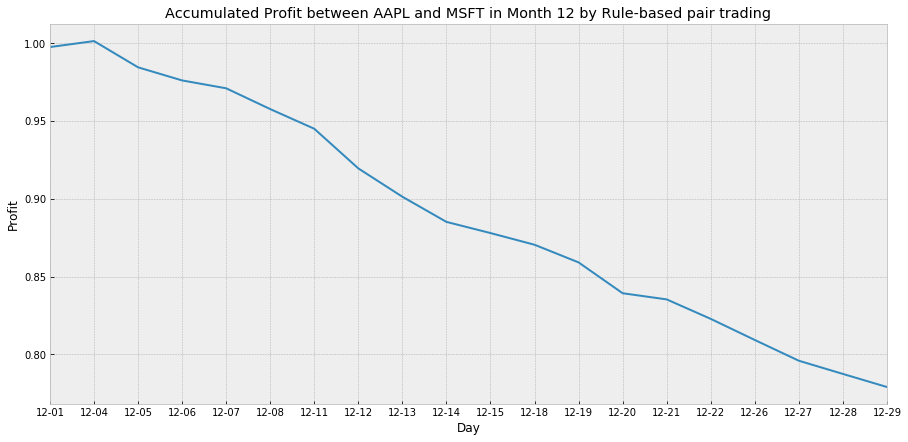

<Figure size 432x288 with 0 Axes>

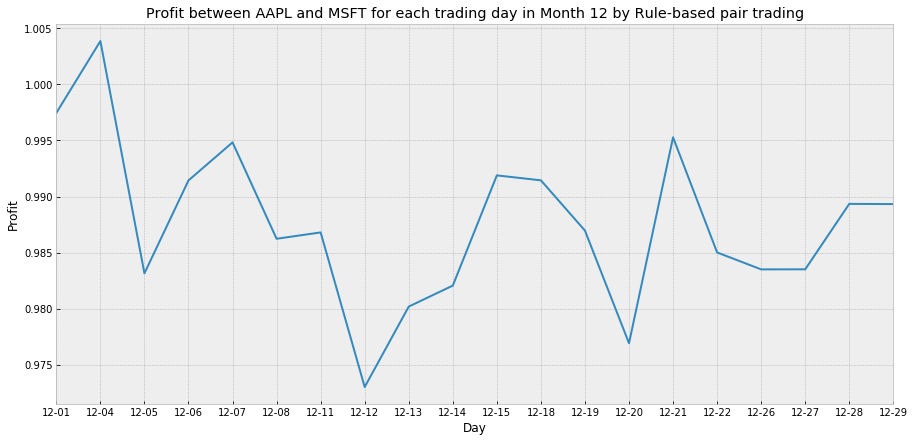

In [115]:
draw_profit(profit_day, date_test_noyear, period_test, profit_Mode = profit_Mode)

[Day 20]
---------[Time = 300]---------
Current profit and postion :   profit -  1  | S1 pos -  0  | S2 pos -  0
---------[Time = 301]---------
Current profit and postion :   profit -  1  | S1 pos -  0  | S2 pos -  0
---------[Time = 302]---------
Current profit and postion :   profit -  1  | S1 pos -  0  | S2 pos -  0
---------[Time = 303]---------
Current profit and postion :   profit -  1  | S1 pos -  0  | S2 pos -  0
---------[Time = 304]---------
Current profit and postion :   profit -  1  | S1 pos -  0  | S2 pos -  0
---------[Time = 305]---------
Current profit and postion :   profit -  1  | S1 pos -  0  | S2 pos -  0
---------[Time = 306]---------
Current profit and postion :   profit -  1  | S1 pos -  0  | S2 pos -  0
---------[Time = 307]---------
Current profit and postion :   profit -  1  | S1 pos -  0  | S2 pos -  0
---------[Time = 308]---------
Current profit and postion :   profit -  1  | S1 pos -  0  | S2 pos -  0
---------[Time = 309]---------
Current profit and posti

Current profit and postion :   profit -  1.0005271814668866  | S1 pos -  1  | S2 pos -  -1.9814453125
---------[Time = 561]---------
Current profit and postion :   profit -  1.0005271814668866  | S1 pos -  1  | S2 pos -  -1.9814453125
---------[Time = 562]---------
Current profit and postion :   profit -  1.0005271814668866  | S1 pos -  1  | S2 pos -  -1.9814453125
---------[Time = 563]---------
Current profit and postion :   profit -  1.0005271814668866  | S1 pos -  1  | S2 pos -  -1.9814453125
---------[Time = 564]---------
Current profit and postion :   profit -  1.0005271814668866  | S1 pos -  1  | S2 pos -  -1.9814453125
---------[Time = 565]---------
Current profit and postion :   profit -  1.0005271814668866  | S1 pos -  1  | S2 pos -  -1.9814453125
---------[Time = 566]---------
Current profit and postion :   profit -  1.0005271814668866  | S1 pos -  1  | S2 pos -  -1.9814453125
---------[Time = 567]---------
Current profit and postion :   profit -  1.0005271814668866  | S1 pos

---------[Time = 745]---------
Current profit and postion :   profit -  0.9999670517367565  | S1 pos -  0  | S2 pos -  0
---------[Time = 746]---------
Current profit and postion :   profit -  0.9999670517367565  | S1 pos -  0  | S2 pos -  0
---------[Time = 747]---------
Current profit and postion :   profit -  0.9999670517367565  | S1 pos -  0  | S2 pos -  0
---------[Time = 748]---------
Current profit and postion :   profit -  0.9999670517367565  | S1 pos -  0  | S2 pos -  0
---------[Time = 749]---------
Current profit and postion :   profit -  0.9999670517367565  | S1 pos -  0  | S2 pos -  0
---------[Time = 750]---------
Current profit and postion :   profit -  0.9999670517367565  | S1 pos -  0  | S2 pos -  0
---------[Time = 751]---------
Current profit and postion :   profit -  0.9999670517367565  | S1 pos -  0  | S2 pos -  0
---------[Time = 752]---------
Current profit and postion :   profit -  0.9999670517367565  | S1 pos -  0  | S2 pos -  0
---------[Time = 753]---------
C

Current profit and postion :   profit -  0.9999670517367565  | S1 pos -  0  | S2 pos -  0
---------[Time = 997]---------
Current profit and postion :   profit -  0.9999670517367565  | S1 pos -  0  | S2 pos -  0
---------[Time = 998]---------
Current profit and postion :   profit -  0.9999670517367565  | S1 pos -  0  | S2 pos -  0
---------[Time = 999]---------
Current profit and postion :   profit -  0.9999670517367565  | S1 pos -  0  | S2 pos -  0
---------[Time = 1000]---------
Current profit and postion :   profit -  0.9999670517367565  | S1 pos -  0  | S2 pos -  0
---------[Time = 1001]---------
Current profit and postion :   profit -  0.9999670517367565  | S1 pos -  0  | S2 pos -  0
---------[Time = 1002]---------
Current profit and postion :   profit -  0.9999670517367565  | S1 pos -  0  | S2 pos -  0
---------[Time = 1003]---------
Current profit and postion :   profit -  0.9999670517367565  | S1 pos -  0  | S2 pos -  0
---------[Time = 1004]---------
Current profit and postion 

---------[Time = 1249]---------
Current profit and postion :   profit -  0.9999670517367565  | S1 pos -  -1  | S2 pos -  1.9814453125
---------[Time = 1250]---------
Current profit and postion :   profit -  0.9999670517367565  | S1 pos -  -1  | S2 pos -  1.9814453125
---------[Time = 1251]---------
Current profit and postion :   profit -  0.9999670517367565  | S1 pos -  -1  | S2 pos -  1.9814453125
---------[Time = 1252]---------
Current profit and postion :   profit -  0.9999670517367565  | S1 pos -  -1  | S2 pos -  1.9814453125
---------[Time = 1253]---------
Current profit and postion :   profit -  0.9999670517367565  | S1 pos -  -1  | S2 pos -  1.9814453125
---------[Time = 1254]---------
Current profit and postion :   profit -  0.9999670517367565  | S1 pos -  -1  | S2 pos -  1.9814453125
---------[Time = 1255]---------
Current profit and postion :   profit -  0.9999670517367565  | S1 pos -  -1  | S2 pos -  1.9814453125
---------[Time = 1256]---------
Current profit and postion :  

---------[Time = 1532]---------
Current profit and postion :   profit -  1.0005788136535743  | S1 pos -  1  | S2 pos -  -1.9765625
---------[Time = 1533]---------
Current profit and postion :   profit -  1.0005788136535743  | S1 pos -  1  | S2 pos -  -1.9765625
[Exit position] profit 1.0011177868073224 | price ratios 1.979 | S1 -1 pos | S2 1.9765625 pos
AAPL price - 169.9, earn : 169.875 | MSFT price - 85.9, earn : -169.7373046875 |
---------[Time = 1534]---------
Current profit and postion :   profit -  1.0011177868073224  | S1 pos -  0  | S2 pos -  0
---------[Time = 1535]---------
Current profit and postion :   profit -  1.0011177868073224  | S1 pos -  0  | S2 pos -  0
---------[Time = 1536]---------
Current profit and postion :   profit -  1.0011177868073224  | S1 pos -  0  | S2 pos -  0
---------[Time = 1537]---------
Current profit and postion :   profit -  1.0011177868073224  | S1 pos -  0  | S2 pos -  0
---------[Time = 1538]---------
Current profit and postion :   profit -  1.

Current profit and postion :   profit -  1.0011177868073224  | S1 pos -  0  | S2 pos -  0
---------[Time = 1808]---------
Current profit and postion :   profit -  1.0011177868073224  | S1 pos -  0  | S2 pos -  0
---------[Time = 1809]---------
Current profit and postion :   profit -  1.0011177868073224  | S1 pos -  0  | S2 pos -  0
---------[Time = 1810]---------
Current profit and postion :   profit -  1.0011177868073224  | S1 pos -  0  | S2 pos -  0
---------[Time = 1811]---------
Current profit and postion :   profit -  1.0011177868073224  | S1 pos -  0  | S2 pos -  0
---------[Time = 1812]---------
Current profit and postion :   profit -  1.0011177868073224  | S1 pos -  0  | S2 pos -  0
---------[Time = 1813]---------
Current profit and postion :   profit -  1.0011177868073224  | S1 pos -  0  | S2 pos -  0
---------[Time = 1814]---------
Current profit and postion :   profit -  1.0011177868073224  | S1 pos -  0  | S2 pos -  0
---------[Time = 1815]---------
Current profit and posti

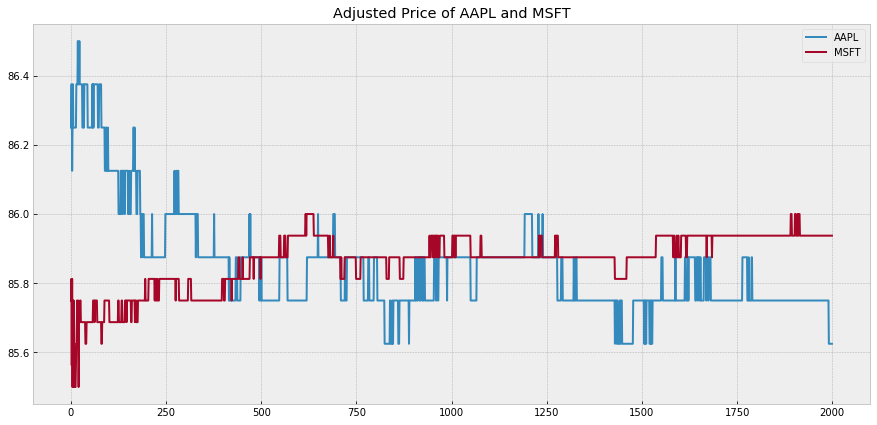

Plot Price ratio of AAPL and MSFT


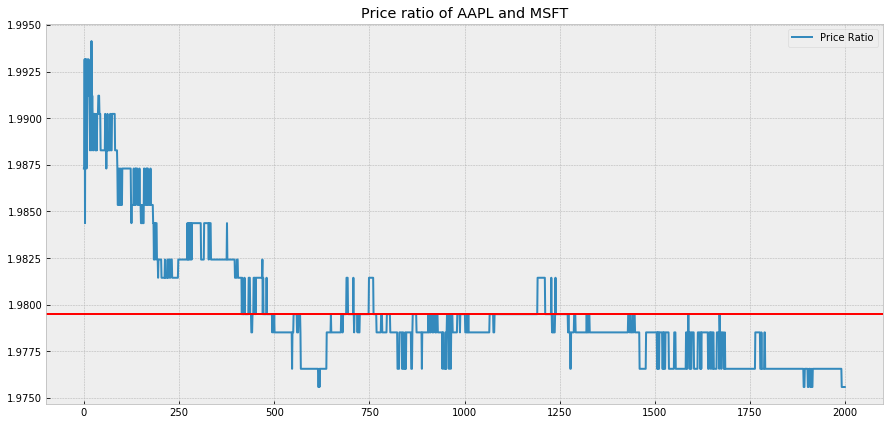

Plot z-score of price ratio of AAPL and MSFT


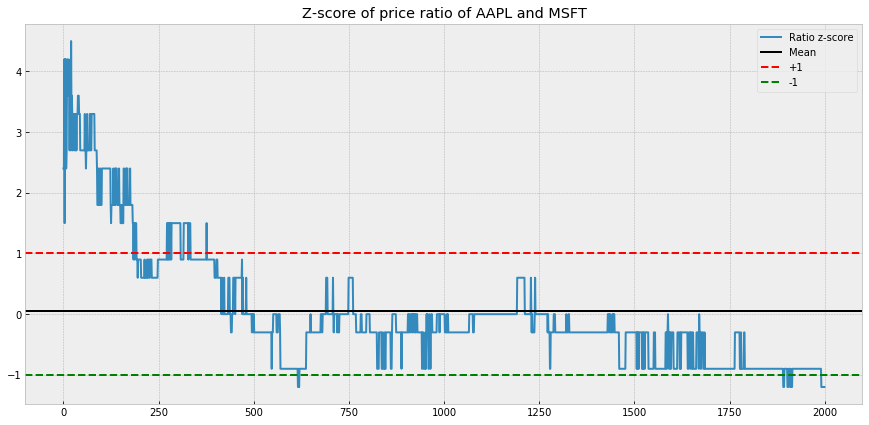

Plot price ratio and its moving average of AAPL and MSFT


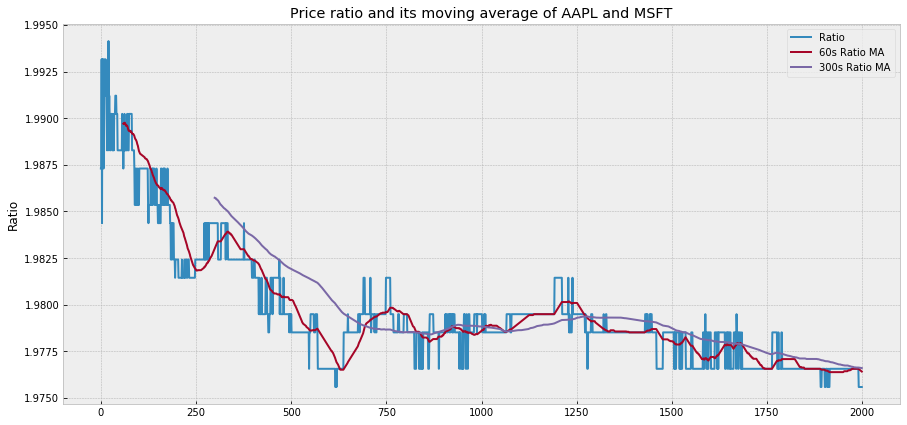

Plot z-score of long and short rolling price ratio of AAPL and MSFT


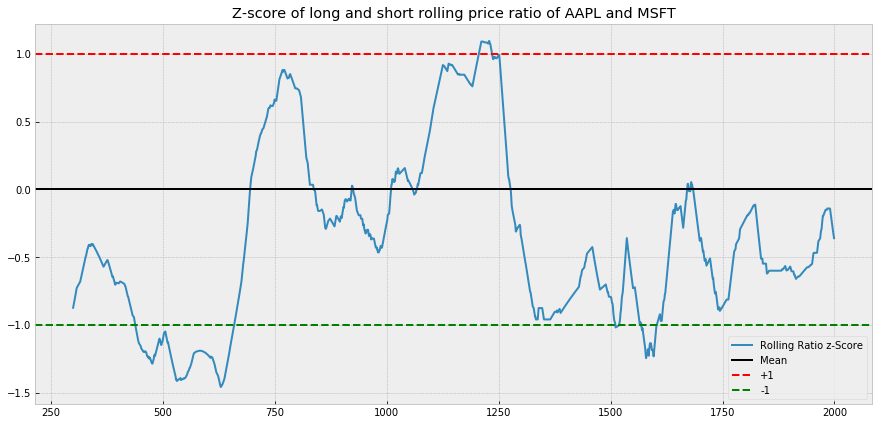

Plot z-score and trading signal of price ratio of AAPL and MSFT


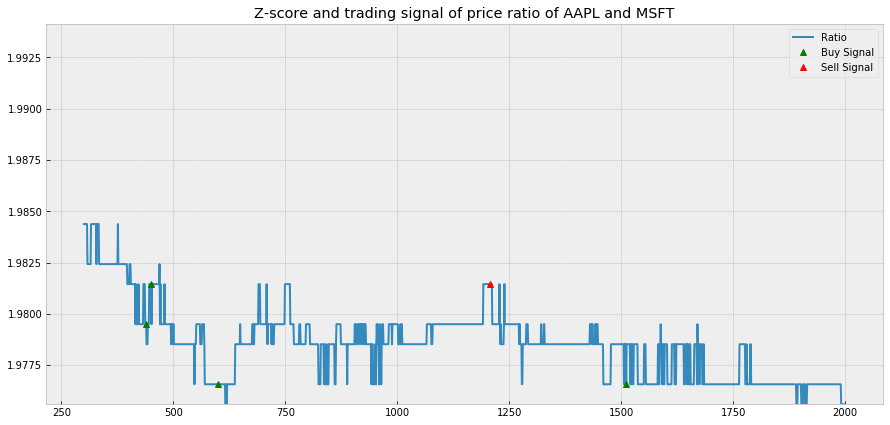

Trading signal of AAPL and MSFT


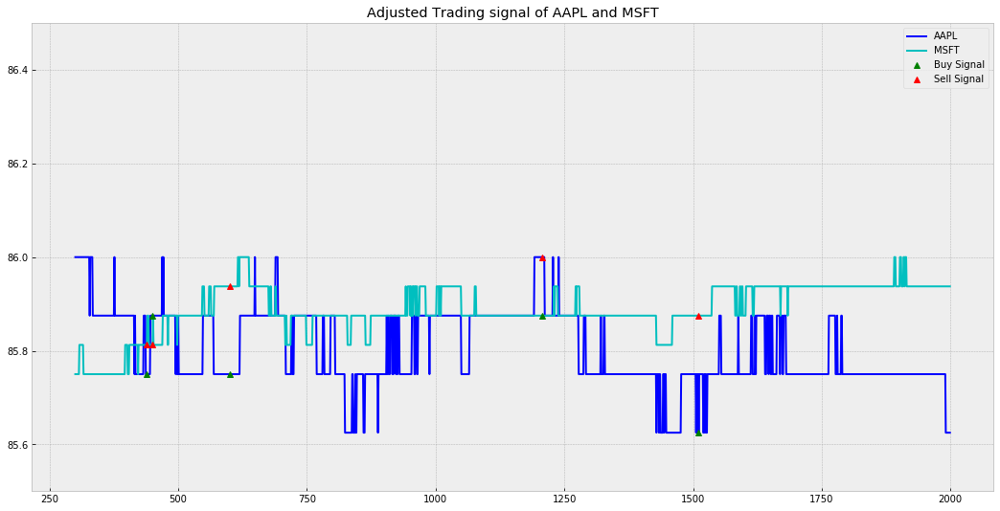

In [116]:
"""
測試rule-based pair trading背後的運作原理 (請忽略)
"""
t = 2000
print("[Day %s]" % str(i+1))
S1 = pd.DataFrame({p[0]: price_and_return_for_test[p[0]][0][i,:t]})
S2 = pd.DataFrame({p[1]: price_and_return_for_test[p[1]][0][i,:t]})
profit, b_s, s_s = zscore_trade(S1, S2, p[0], p[1], window_s, window_l, show_print = 1, profit_Mode = profit_Mode)
drawTradingCondition(p[0], p[1], price_and_return_for_test, i, window_l, window_s, t, b_s = b_s, s_s = s_s)

In [117]:
b_s # 測試用的，請忽略

[438, 450, 600, 1511]

# 設計AttGGSNN的 Pairs trading

In [118]:
def predict(dataloader, net, is_train = 0, split_question = 0):
    """
    # 透過model預測answer
    """
    if is_train == 0:
        net.eval()
    print("Predict Result....")
    loss = 0
    correct = 0
    pred_list = []
    
    # test
    for i, (input_feature, question, adj_matrix) in enumerate(dataloader, 0):
        
        '''
        把question embedding處理
        '''
        if split_comques == 0:
            padding = torch.zeros(len(input_feature), state_dim - question_dim)
            question_padding = torch.cat((question, padding), -1)
        else:
            question_padding = question
        
        if cuda == 1:
            input_feature = input_feature.cuda()
            adj_matrix = adj_matrix.cuda()
            question_padding = question_padding.cuda()
        '''
        input_feature = Variable(input_feature.double())
        adj_matrix = Variable(adj_matrix.double())
        question_padding = Variable(question_padding.double())
        '''
        if split_question == 0:
            test_output = net(input_feature, question_padding, adj_matrix)
            pred_y = torch.max(test_output, 1)[1].data.cpu().numpy()
            pred_list.append(pred_y)
        else:
            output_test_q1, output_test_q2, output_test_q3 = net(input_feature, question_padding, adj_matrix)
            pred_y_q1 = torch.max(output_test_q1, 1)[1].data.cpu().numpy()
            pred_y_q2 = torch.max(output_test_q2, 1)[1].data.cpu().numpy()
            pred_y_q3 = torch.max(output_test_q3, 1)[1].data.cpu().numpy()
            pred_list.append([pred_y_q1, pred_y_q2, pred_y_q3])
    
    # release memory for testing
    if split_question == 0:
        del test_output, input_feature, adj_matrix, question, question_padding
    else:
        del output_test_q1, output_test_q2, output_test_q3, input_feature, adj_matrix, question, question_padding
        
    torch.cuda.empty_cache()
    print("Prediction Finished !")
    
    #return predict result
    if split_question == 0:
        #return pred_y
        return pred_list
    else:
        #return (pred_y_q1, pred_y_q2, pred_y_q3)
        return pred_list

In [119]:
def predictDataloader(price_data, price_and_return, adjacency_matrix, all_com_pair_P, c1, c2, day, qtype, show_shape = 0, show_data = 0):
    '''
    # pair trading的dataloader function
    ---
    生成帶有v, q, adj的dataloader
    v : test data (inference data)
    q : 某個問題
    c1, c2 : 目標的兩間公司
    '''
    v_test = rolling(price_data, price_and_return, v_length, shift_length, day, mode = 'return')[0]
    print("v_test shape for day %s :" % str(day+1), v_test.shape)
    
    # 生成問題
    q_eye = np.eye(3)
    if qtype == 'Pairwise Price Change':
        q_test = np.concatenate([onehotCompany[str2companycode(c1)], onehotCompany[str2companycode(c2)], q_eye[0]])
    elif qtype == 'Strength':
        q_test = np.concatenate([onehotCompany[str2companycode(c1)], onehotCompany[str2companycode(c2)], q_eye[1]])
    else:
        q_test = np.concatenate([onehotCompany[str2companycode(c1)], onehotCompany[str2companycode(c2)], q_eye[2]])
    q_test = np.tile(q_test, (v_test.shape[0],1))
    #print(q_test.shape)
    
    # numpy to tensor
    v_testing = torch.Tensor(v_test)
    q_testing = torch.Tensor(q_test)
    adjacency_matrix_test = torch.Tensor(np.expand_dims(adjacency_matrix, 0)).repeat(v_testing.size(0),1,1)
        
    if show_shape == 1:
        print("v_test.shape = ", v_testing.shape)
        print("q_test.shape = ", q_testing.shape)
        print("adjacency_matrix.shape = " + str(adjacency_matrix_test.size()))

    # testing dataset
    djiaPredictDataset = torch.utils.data.TensorDataset(v_testing, q_testing, adjacency_matrix_test)
    djiaPredictDataLoader = torch.utils.data.DataLoader(djiaPredictDataset, batch_size = 32, shuffle = False)
    
    if show_data == 1:
        return djiaPredictDataLoader, (v_test, q_test)
    else:
        return djiaPredictDataLoader

In [120]:
load_m = 0
if load_m == 1:
    # load model back
    net, _, _ = loadGraphGRUModel(adjacency_matrix_Edge, split_question, show_layer = show_layer)
    net.load_state_dict(torch.load('/mnt/sda1/chia/model/twoPhaseGraphGRU_attentionOn_resampleOn_splitQuestion_2019-07-09_nstep5_stateDim64_nNode29_Epoch100_LinearOutput_allin_efficientVQA'))

In [121]:
# 兩間公司三種問題的dataloader
predDataloader_q1, vq1_pairtrad = predictDataloader(price_data_for_test, price_and_return_for_test, adjacency_matrix_Edge_test, all_com_pair_P, p[0], p[1], 0, qtype[0], show_shape = 0, show_data = 1)
predDataloader_q2, vq2_pairtrad = predictDataloader(price_data_for_test, price_and_return_for_test, adjacency_matrix_Edge_test, all_com_pair_P, p[0], p[1], 0, qtype[1], show_shape = 0, show_data = 1)
predDataloader_q3, vq3_pairtrad = predictDataloader(price_data_for_test, price_and_return_for_test, adjacency_matrix_Edge_test, all_com_pair_P, p[0], p[1], 0, qtype[2], show_shape = 0, show_data = 1)

# 用NN預測問題
q1a = predict(predDataloader_q1, net, is_train = 0, split_question = split_question)
q2a = predict(predDataloader_q2, net, is_train = 0, split_question = split_question)
q3a = predict(predDataloader_q3, net, is_train = 0, split_question = split_question)

v_test shape for day 1 : (154, 29, 299)
v_test shape for day 1 : (154, 29, 299)
v_test shape for day 1 : (154, 29, 299)
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !


In [122]:
q1a1, q1a2, q1a3 = np.hstack([d[0] for d in q1a]), np.hstack([d[1] for d in q1a]), np.hstack([d[2] for d in q1a])
q2a1, q2a2, q2a3 = np.hstack([d[0] for d in q2a]), np.hstack([d[1] for d in q2a]), np.hstack([d[2] for d in q2a])
q3a1, q3a2, q3a3 = np.hstack([d[0] for d in q3a]), np.hstack([d[1] for d in q3a]), np.hstack([d[2] for d in q3a])

In [123]:
vq1_pairtrad[1][0], vq2_pairtrad[1][0], vq3_pairtrad[1][0]

(array([1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 1., 0., 0.]),
 array([1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 1., 0.]),
 array([1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 1.]))

In [124]:
q1a1, q2a2, q3a3

(array([1, 3, 3, 3, 3, 3, 3, 3, 1, 1, 3, 3, 1, 3, 3, 1, 3, 1, 3, 1, 3, 3,
        3, 3, 1, 1, 1, 3, 3, 3, 1, 3, 3, 3, 3, 3, 1, 1, 3, 1, 3, 1, 3, 3,
        1, 3, 1, 1, 3, 1, 1, 1, 1, 3, 3, 3, 3, 1, 3, 1, 3, 3, 1, 3, 3, 1,
        3, 1, 3, 1, 3, 1, 3, 1, 3, 3, 1, 1, 3, 3, 3, 1, 1, 1, 1, 1, 3, 1,
        1, 3, 3, 1, 3, 1, 1, 1, 3, 3, 1, 1, 1, 1, 1, 1, 3, 3, 3, 3, 1, 1,
        3, 3, 3, 1, 1, 1, 0, 1, 3, 1, 1, 1, 3, 1, 1, 1, 1, 1, 3, 1, 3, 1,
        1, 1, 3, 3, 2, 1, 1, 1, 1, 0, 1, 1, 1, 1, 2, 3, 3, 1, 3, 3, 1, 1]),
 array([2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
        2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 2, 2,
        2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
        2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
        2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
        2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
        2, 2, 2, 2, 2, 2, 2, 2, 2, 2

# Learning-based Pair Trading

In [125]:
def NN_trade(S1, S2, c1, c2, price_data, price_and_return, net, day, show_print = 0, fee = 0, profit_Mode = 0):
    '''
    # 針對Neural Network model的Pairs Trading function
    ---
    三個問題都會被考慮進去
    用model產生每一個V三種問題所對應的答案，
    也就是說預測未來結果後進行下面步驟
    buys 1 ratio (buy 1 AAPL stock and sell ratio x MSFT stock) when ratio is low, 
    sell 1 ratio (sell 1 AAPL stock and buy ratio x MSFT stock) when it's high, 
    and calculate PnL (profit and loss，損益) of these trades.
    '''

    # Compute rolling mean and rolling standard deviation
    ratios = pd.DataFrame({"ratios" : (S1.values/S2.values).ravel()})
    
    c1_idx = sorted(temp_c).index(c1)
    c2_idx = sorted(temp_c).index(c2)
    
    roll_pair = rolling(price_data, price_and_return, v_length, shift_length, day, mode = 'price')
    roll_v, roll_v_answer, position = roll_pair[0][:,[c1_idx,c2_idx],:], roll_pair[1][:,[c1_idx,c2_idx],:], roll_pair[2]
    position = sorted([list(x) for x in set(tuple(x) for x in position)])
    
    # 兩間公司三種問題的dataloader
    predDataloader_q1 = predictDataloader(price_data, price_and_return, adjacency_matrix_Edge_test, all_com_pair_P, c1, c2, day, qtype[0], show_shape = 0)
    predDataloader_q2 = predictDataloader(price_data, price_and_return, adjacency_matrix_Edge_test, all_com_pair_P, c1, c2, day, qtype[1], show_shape = 0)
    predDataloader_q3 = predictDataloader(price_data, price_and_return, adjacency_matrix_Edge_test, all_com_pair_P, c1, c2, day, qtype[2], show_shape = 0)
    
    # 用NN預測問題
    q1a = predict(predDataloader_q1, net, is_train = 0, split_question = split_question)
    q2a = predict(predDataloader_q2, net, is_train = 0, split_question = split_question)
    q3a = predict(predDataloader_q3, net, is_train = 0, split_question = split_question)

    if split_question == 1:
        # 分問題，理應只有q1a1, q2a2, q3a3有用
        q1a1, q1a2, q1a3 = np.hstack([d[0] for d in q1a]), np.hstack([d[1] for d in q1a]), np.hstack([d[2] for d in q1a])
        q2a1, q2a2, q2a3 = np.hstack([d[0] for d in q2a]), np.hstack([d[1] for d in q2a]), np.hstack([d[2] for d in q2a])
        q3a1, q3a2, q3a3 = np.hstack([d[0] for d in q3a]), np.hstack([d[1] for d in q3a]), np.hstack([d[2] for d in q3a])
    else:
        q1a1, q1a2, q1a3 = np.vstack(q1a)[:,:4], np.vstack(q1a)[:,4:7], np.vstack(q1a)[:,7:]
        q2a1, q2a2, q2a3 = np.vstack(q2a)[:,:4], np.vstack(q2a)[:,4:7], np.vstack(q2a)[:,7:]
        q3a1, q3a2, q3a3 = np.vstack(q3a)[:,:4], np.vstack(q3a)[:,4:7], np.vstack(q3a)[:,7:]
    
    # Learning-based trading
    # Start with no money and no positions
    if profit_Mode == 0:
        money = 0
    else:
        money = 1
    countS1 = 0
    countS2 = 0
    buy = []
    sell = []

    # 總共有v_test.shape[0]個決策點，一天的前300秒不做決策，每60秒做一次決策，一次買賣一口
    for i in range(roll_v.shape[0]):
        if show_print == 1:
            print("---------[Time = %s to %s]---------" % (position[i][2], position[i][3]))
            print("Current profit : ", " profit - ", money)
        # t0入場，t300出場
        S1_t0, S1_t60 = roll_v_answer[i][0][0], roll_v_answer[i][0][-1]
        S2_t0, S2_t60 = roll_v_answer[i][1][0], roll_v_answer[i][1][-1]
        entry_time = position[i][2]-1
        exit_time = position[i][3]-1
        
        # NN系列預測的策略

        # if Pairwise Price Change BothRise
        if (q1a1[i] == 1):
            """
            同漲同跌，看漲跌幅決定做多做空的股票
            (注解的部分則是看波動率)
            """
            # Sell short if Strength1 < Strength2
            # Sell short if Volatility1 < Volatility2
            #if q2a2[i] == 2:
            if q3a3[i] == 2:  
                # 交易成本部分： 0.00231%的交易稅、各0.5%的手續費
                ratio = S1_t0 / S2_t0
                #print(entry_time, ratios.iloc[entry_time][0])
                if profit_Mode == 0:
                    if fee == 1:
                        money += S1_t0 - S2_t0 * ratio - 0.0000231 * S1_t0 - 0.005 * S1_t0 - 0.005 * S2_t0 * ratio
                    else:
                        money += S1_t0 - S2_t0 * ratio

                countS1 -= 1
                countS2 += ratio
                
                sell.append(entry_time)
                
                if show_print == 1:
                    print("[Pairwise Price Change BothRise and Volatility1 < Volatility2]")
                    print('[Sell %s and Buy %s] profit %s | price ratios %s | C1 %s pos | C2 %s pos'% (c1, c2, money, ratio, countS1, countS2))
                    print('%s price - %s revenue - %s | %s price - %s payment - %s |' % (c1, S1_t0, S1_t0, c2, S2_t0, S2_t0 * ratio))
                    
            # Buy long if Strength1 > Strength2
            # Buy long if Volatility1 > Volatility2
            #elif q2a2[i] == 1:
            elif q3a3[i] == 1:    
                # 交易成本部分： 0.00231%的交易稅、各0.5%的手續費
                ratio = S1_t0 / S2_t0
                #print(entry_time, ratios.iloc[entry_time][0])
                if profit_Mode == 0:
                    if fee == 1:
                        money -= S1_t0 - S2_t0 * ratio - 0.0000231 * S2_t0 * ratio - 0.005 * S1_t0 - 0.005 * S2_t0 * ratio
                    else:
                        money -= S1_t0 - S2_t0 * ratio

                countS1 += 1
                countS2 -= ratio

                buy.append(entry_time)

                if show_print == 1:
                    print("[Pairwise Price Change BothRise and Volatility1 > Volatility2]")
                    print('[Buy %s and Sell %s] profit %s | price ratios %s | C1 %s pos | C2 %s pos'% (c1, c2, money, ratio, countS1, countS2))
                    print('%s price - %s payment - %s | %s price - %s revenue - %s |' % (c1, S1_t0, S1_t0, c2, S2_t0, S2_t0 * ratio))
                    
        # if Pairwise Price Change BothFall
        elif (q1a1[i] == 2):
            # Sell short if Strength1 < Strength2
            # Sell short if Volatility1 > Volatility2
            #if q2a2[i] == 2:
            if q3a3[i] == 1:
                # 交易成本部分： 0.00231%的交易稅、各0.5%的手續費
                ratio = S1_t0 / S2_t0
                #print(entry_time, ratios.iloc[entry_time][0])
                if profit_Mode == 0:
                    if fee == 1:
                        money += S1_t0 - S2_t0 * ratio - 0.0000231 * S1_t0 - 0.005 * S1_t0 - 0.005 * S2_t0 * ratio
                    else:
                        money += S1_t0 - S2_t0 * ratio

                countS1 -= 1
                countS2 += ratio

                sell.append(entry_time)
                
                if show_print == 1:
                    print("[Pairwise Price Change BothFall and Volatility1 > Volatility2]")
                    print('[Sell %s and Buy %s] profit %s | price ratios %s | C1 %s pos | C2 %s pos'% (c1, c2, money, ratio, countS1, countS2))
                    print('%s price - %s revenue - %s | %s price - %s payment - %s |' % (c1, S1_t0, S1_t0, c2, S2_t0, S2_t0 * ratio))
                    
            # Buy long if Strength1 > Strength2
            # Buy long if Volatility1 < Volatility2
            #elif q2a2[i] == 1:
            elif q3a3[i] == 2: 
                # 交易成本部分： 0.00231%的交易稅、各0.5%的手續費
                ratio = S1_t0 / S2_t0
                #print(entry_time, ratios.iloc[entry_time][0])
                if profit_Mode == 0:
                    if fee == 1:
                        money -= S1_t0 - S2_t0 * ratio - 0.0000231 * S2_t0 * ratio - 0.005 * S1_t0 - 0.005 * S2_t0 * ratio
                    else:
                        money -= S1_t0 - S2_t0 * ratio

                countS1 += 1
                countS2 -= ratio

                buy.append(entry_time)

                if show_print == 1:
                    print("[Pairwise Price Change BothFall and Volatility1 < Volatility2]")
                    print('[Buy %s and Sell %s] profit %s | price ratios %s | C1 %s pos | C2 %s pos'% (c1, c2, money, ratio, countS1, countS2))
                    print('%s price - %s payment - %s | %s price - %s revenue - %s |' % (c1, S1_t0, S1_t0, c2, S2_t0, S2_t0 * ratio))
        
        # Sell short if Pairwise Price Change Reverse and Strength1 < Strength2
        elif (q1a1[i] == 3 and q2a2[i] == 2):
            # 交易成本部分： 0.00231%的交易稅、各0.5%的手續費
            ratio = S1_t0 / S2_t0
            #print(entry_time, ratios.iloc[entry_time][0])
            if profit_Mode == 0:
                if fee == 1:
                    money += S1_t0 - S2_t0 * ratio - 0.0000231 * S1_t0 - 0.005 * S1_t0 - 0.005 * S2_t0 * ratio
                else:
                    money += S1_t0 - S2_t0 * ratio
                
            countS1 -= 1
            countS2 += ratio

            sell.append(entry_time)
            
            if show_print == 1:
                print("[Pairwise Price Change Reverse and Strength1 < Strength2]")
                print('[Sell %s and Buy %s] profit %s | price ratios %s | C1 %s pos | C2 %s pos'% (c1, c2, money, ratio, countS1, countS2))
                print('%s price - %s revenue - %s | %s price - %s payment - %s |' % (c1, S1_t0, S1_t0, c2, S2_t0, S2_t0 * ratio))
        
        # Buy long if Pairwise Price Change Reverse and Strength1 > Strength2
        elif (q1a1[i] == 3 and q2a2[i] == 1):
            # 交易成本部分： 0.00231%的交易稅、各0.5%的手續費
            ratio = S1_t0 / S2_t0
            #print(entry_time, ratios.iloc[entry_time][0])
            if profit_Mode == 0:
                if fee == 1:
                    money -= S1_t0 - S2_t0 * ratio - 0.0000231 * S2_t0 * ratio - 0.005 * S1_t0 - 0.005 * S2_t0 * ratio
                else:
                    money -= S1_t0 - S2_t0 * ratio
                
            countS1 += 1
            countS2 -= ratio

            buy.append(entry_time)
            
            if show_print == 1:
                print("[Pairwise Price Change Reverse and Strength1 > Strength2]")
                print('[Buy %s and Sell %s] profit %s | price ratios %s | C1 %s pos | C2 %s pos'% (c1, c2, money, ratio, countS1, countS2))
                print('%s price - %s payment - %s | %s price - %s revenue - %s |' % (c1, S1_t0, S1_t0, c2, S2_t0, S2_t0 * ratio))

        # Clear positions for each decision point  
        # 交易成本部分： 0.00231%的交易稅 、各0.5%的手續費
        ratio = S1_t0 / S2_t0
        #print(exit_time, ratios.iloc[exit_time][0])
        if profit_Mode == 0:
            if fee == 1:
                money += countS1 * S1_t60 + S2_t60 * countS2 - 0.0000231 * (countS1 * S1_t60 + countS2 * S2_t60) - 0.005 * (S1_t60 * countS1 + S2_t60 * countS2)
            else:
                money += countS1 * S1_t60 + S2_t60 * countS2
        else:    # profit rate
            if fee == 1:
                money *= 1 + (-countS1 * S1_t60 + S2_t60 * -countS2 - 0.0000231 * (abs(countS1) * S1_t60 + abs(countS2) * S2_t60) - 0.005 * (S1_t60 * abs(countS1) + S2_t60 * abs(countS2))) / (S1_t0 + S2_t0)
            else:
                money *= 1 + (-countS1 * S1_t60 + S2_t60 * -countS2) / (S1_t0 + S2_t0)

        if show_print == 1:
            print('[Exit position] profit %s | price ratios %s | C1 %s pos | C2 %s pos'% (money, ratio, -countS1, -countS2))
            print('%s price - %s, earn : %s | %s price - %s, earn : %s |' % (c1, S1_t60, -countS1 * S1_t60, c2, S2_t60, -countS2 * S2_t60))
        
        # clear position
        countS1, countS2 = 0, 0
        
    return money, buy, sell, (q1a1, q2a2, q3a3)

[Day 1]
v_test shape for day 1 : (154, 29, 299)
v_test shape for day 1 : (154, 29, 299)
v_test shape for day 1 : (154, 29, 299)
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
---------[Time = 300 to 450]---------
Current profit :   profit -  1
[Pairwise Price Change BothRise and Volatility1 > Volatility2]
[Buy AAPL and Sell MSFT] profit 1 | price ratios 2.0252412769116557 | C1 1 pos | C2 -2.0252412769116557 pos
AAPL price - 170.5 payment - 170.5 | MSFT price - 84.1875 revenue - 170.5 |
[Exit position] profit 1.0004969917243955 | price ratios 2.0252412769116557 | C1 -1 pos | C2 2.0252412769116557 pos
AAPL price - 170.5, earn : -170.5 | MSFT price - 84.25, earn : 170.626577579807 |
---------[Time = 450 to 600]---------
Current profit :   profit -  1.0004969917243955
[Pairwise Price Change Reverse and Strength1 < Strength2]
[Sell AAPL and Buy MSFT] profit 1.0004969917243955 | price ratios 2.0237388724035608 | C1 -

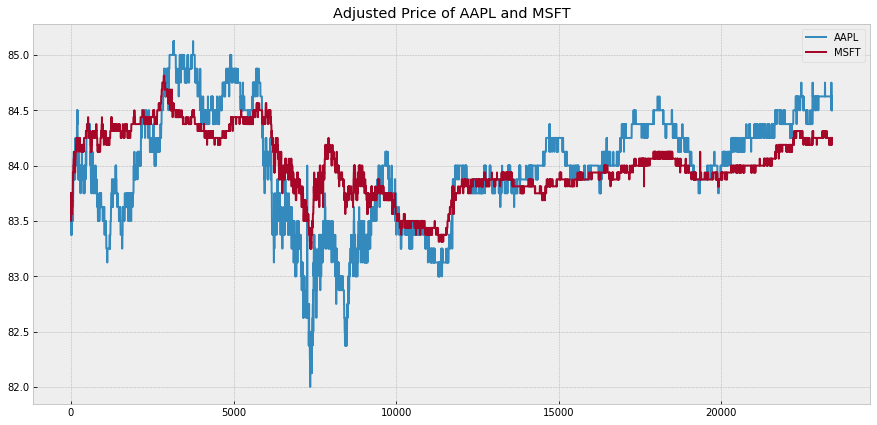

Plot z-score and trading signal of price ratio of AAPL and MSFT


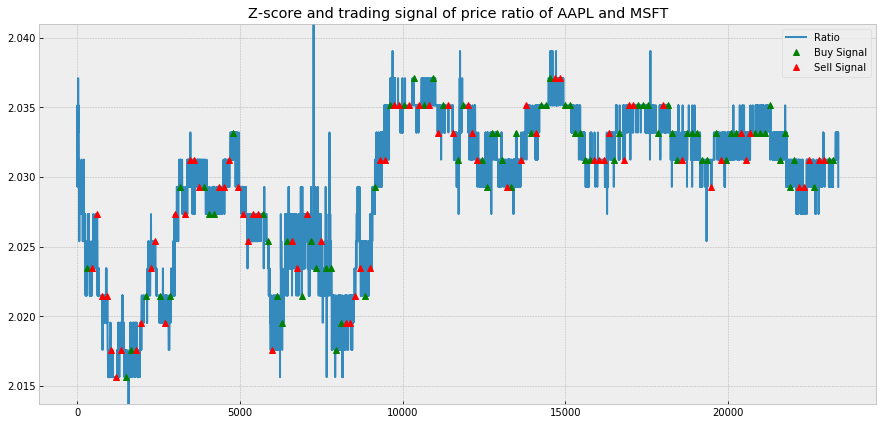

Trading signal of AAPL and MSFT for learning-based pair trading


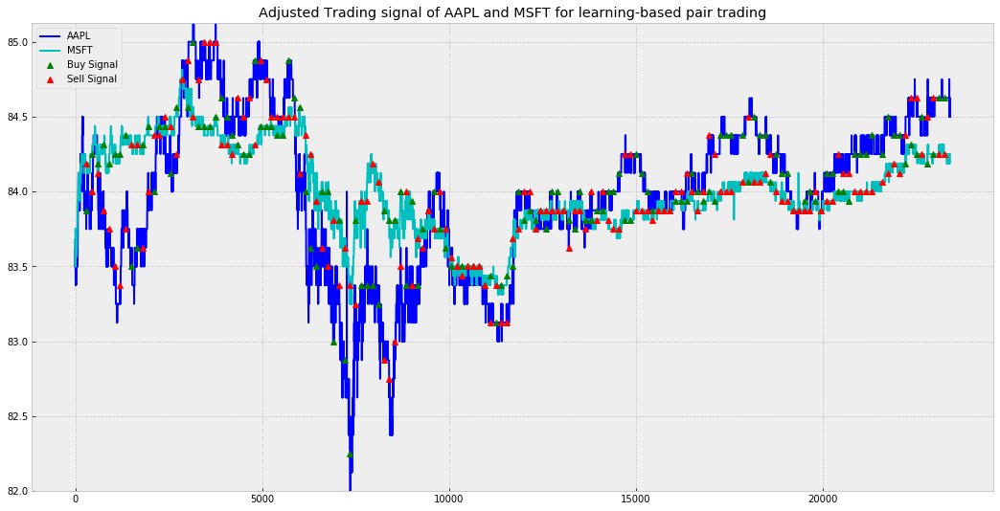

[Day 2]
v_test shape for day 2 : (154, 29, 299)
v_test shape for day 2 : (154, 29, 299)
v_test shape for day 2 : (154, 29, 299)
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
---------[Time = 300 to 450]---------
Current profit :   profit -  1
[Pairwise Price Change Reverse and Strength1 > Strength2]
[Buy AAPL and Sell MSFT] profit 1 | price ratios 2.055265123226288 | C1 1 pos | C2 -2.055265123226288 pos
AAPL price - 172.0 payment - 172.0 | MSFT price - 83.6875 revenue - 172.0 |
[Exit position] profit 1.0004888780249328 | price ratios 2.055265123226288 | C1 -1 pos | C2 2.055265123226288 pos
AAPL price - 171.875, earn : -171.875 | MSFT price - 83.6875, earn : 172.0 |
---------[Time = 450 to 600]---------
Current profit :   profit -  1.0004888780249328
[Pairwise Price Change Reverse and Strength1 < Strength2]
[Sell AAPL and Buy MSFT] profit 1.0004888780249328 | price ratios 2.0537714712471993 | C1 -1 pos | C2 2.0

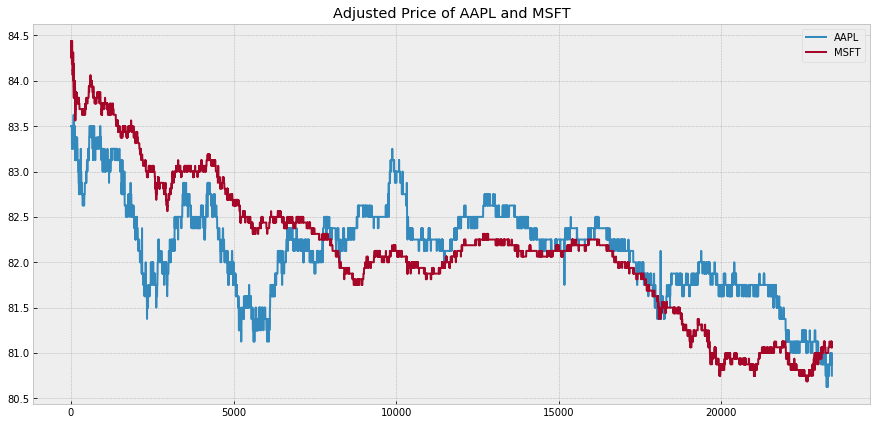

Plot z-score and trading signal of price ratio of AAPL and MSFT


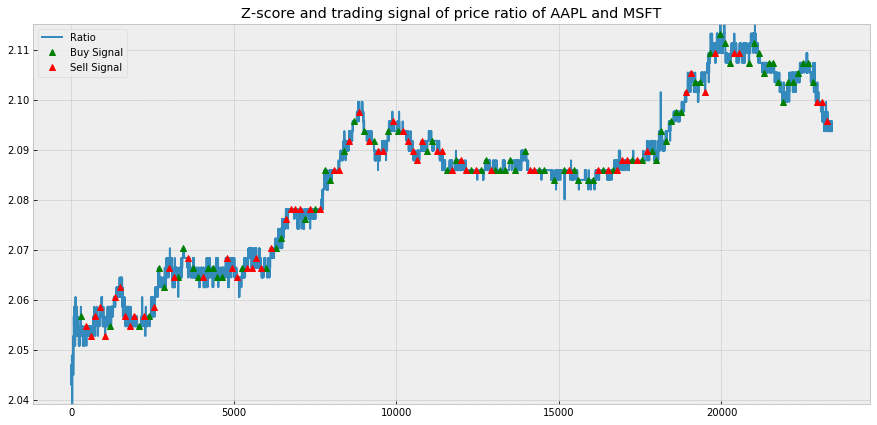

Trading signal of AAPL and MSFT for learning-based pair trading


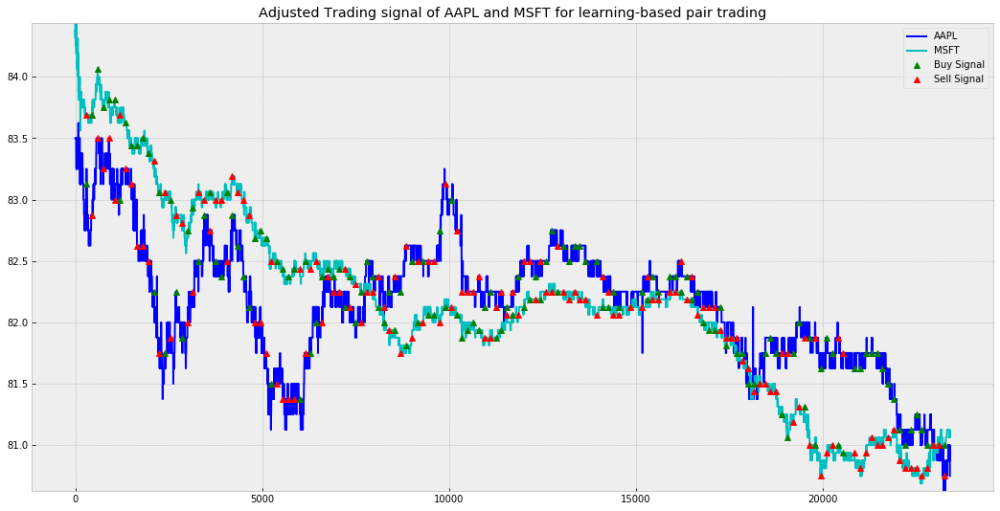

[Day 3]
v_test shape for day 3 : (154, 29, 299)
v_test shape for day 3 : (154, 29, 299)
v_test shape for day 3 : (154, 29, 299)
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
---------[Time = 300 to 450]---------
Current profit :   profit -  1
[Pairwise Price Change Reverse and Strength1 < Strength2]
[Sell AAPL and Buy MSFT] profit 1 | price ratios 2.0846153846153848 | C1 -1 pos | C2 2.0846153846153848 pos
AAPL price - 169.375 revenue - 169.375 | MSFT price - 81.25 payment - 169.375 |
[Exit position] profit 0.9994590446959524 | price ratios 2.0846153846153848 | C1 1 pos | C2 -2.0846153846153848 pos
AAPL price - 169.5, earn : 169.5 | MSFT price - 81.375, earn : -169.63557692307694 |
---------[Time = 450 to 600]---------
Current profit :   profit -  0.9994590446959524
[Pairwise Price Change BothRise and Volatility1 > Volatility2]
[Buy AAPL and Sell MSFT] profit 0.9994590446959524 | price ratios 2.0829493087557602

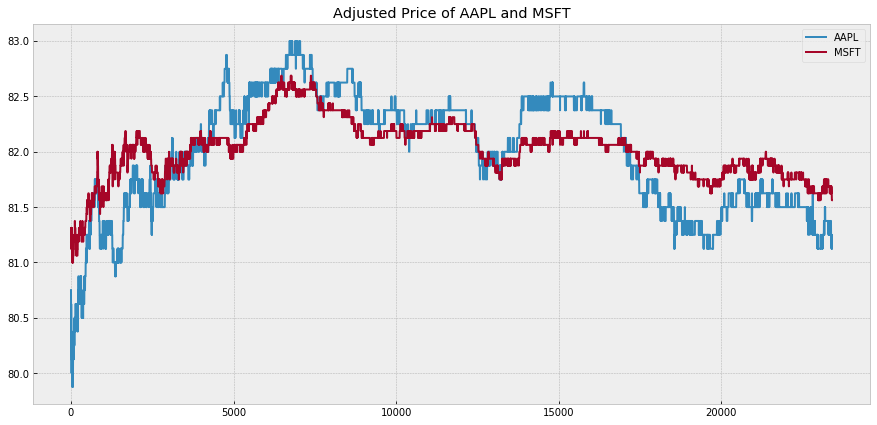

Plot z-score and trading signal of price ratio of AAPL and MSFT


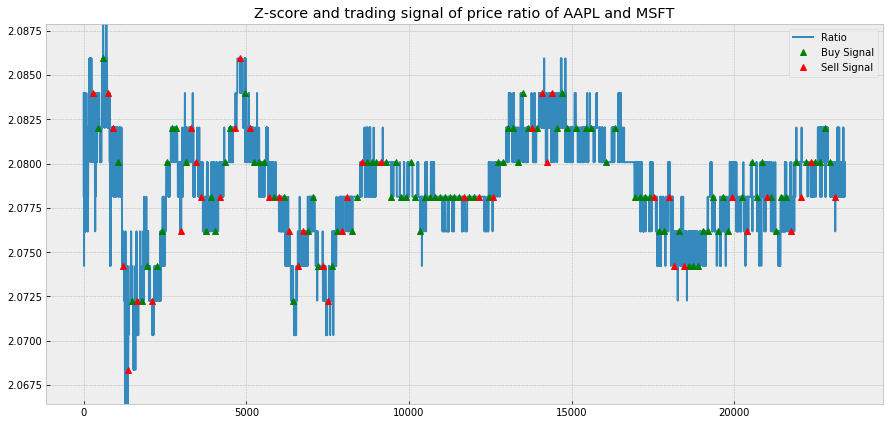

Trading signal of AAPL and MSFT for learning-based pair trading


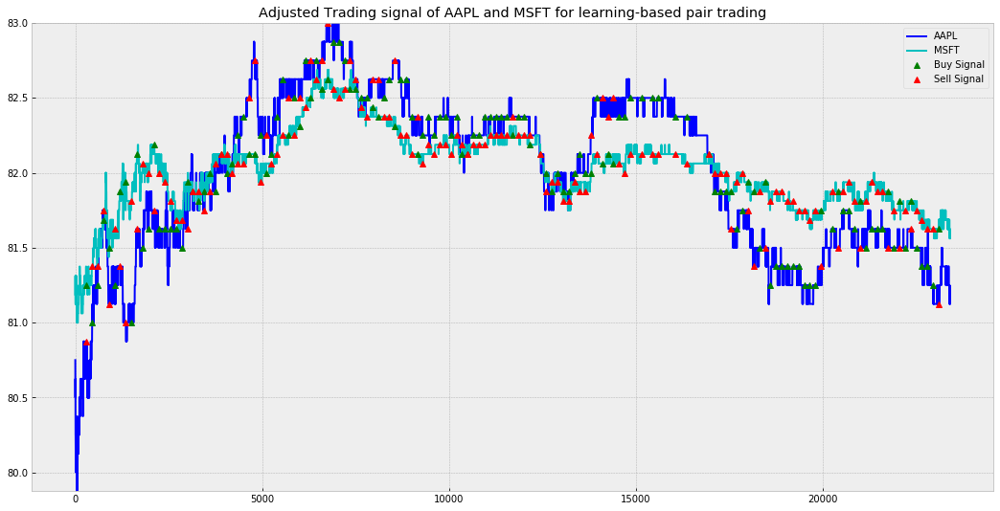

[Day 4]
v_test shape for day 4 : (154, 29, 299)
v_test shape for day 4 : (154, 29, 299)
v_test shape for day 4 : (154, 29, 299)
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
---------[Time = 300 to 450]---------
Current profit :   profit -  1
[Pairwise Price Change Reverse and Strength1 < Strength2]
[Sell AAPL and Buy MSFT] profit 1 | price ratios 2.053394355453852 | C1 -1 pos | C2 2.053394355453852 pos
AAPL price - 168.25 revenue - 168.25 | MSFT price - 81.9375 payment - 168.25 |
[Exit position] profit 0.998974072268072 | price ratios 2.053394355453852 | C1 1 pos | C2 -2.053394355453852 pos
AAPL price - 168.25, earn : 168.25 | MSFT price - 82.0625, earn : -168.50667429443175 |
---------[Time = 450 to 600]---------
Current profit :   profit -  0.998974072268072
[Pairwise Price Change Reverse and Strength1 < Strength2]
[Sell AAPL and Buy MSFT] profit 0.998974072268072 | price ratios 2.0502665651180503 | C1 -1 p

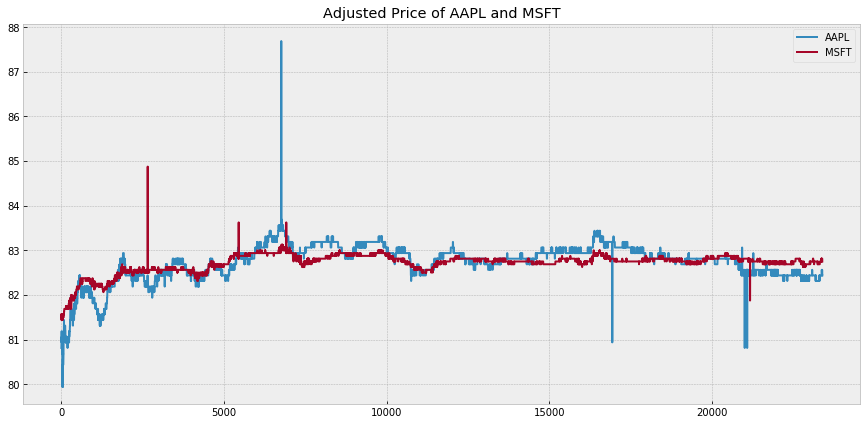

Plot z-score and trading signal of price ratio of AAPL and MSFT


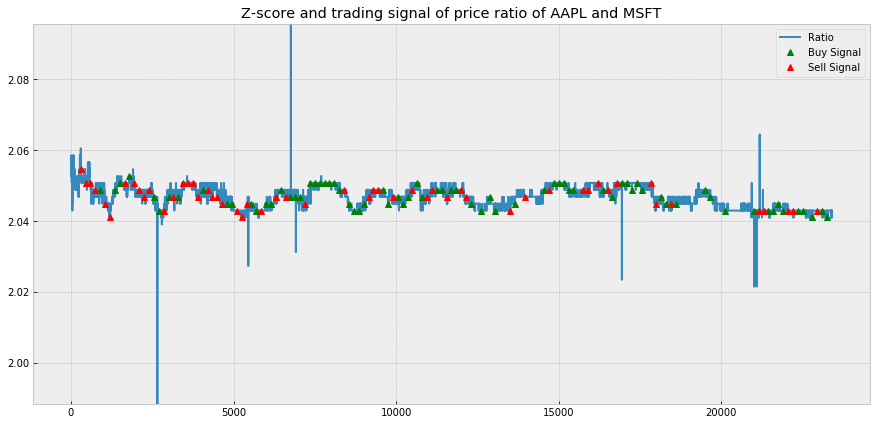

Trading signal of AAPL and MSFT for learning-based pair trading


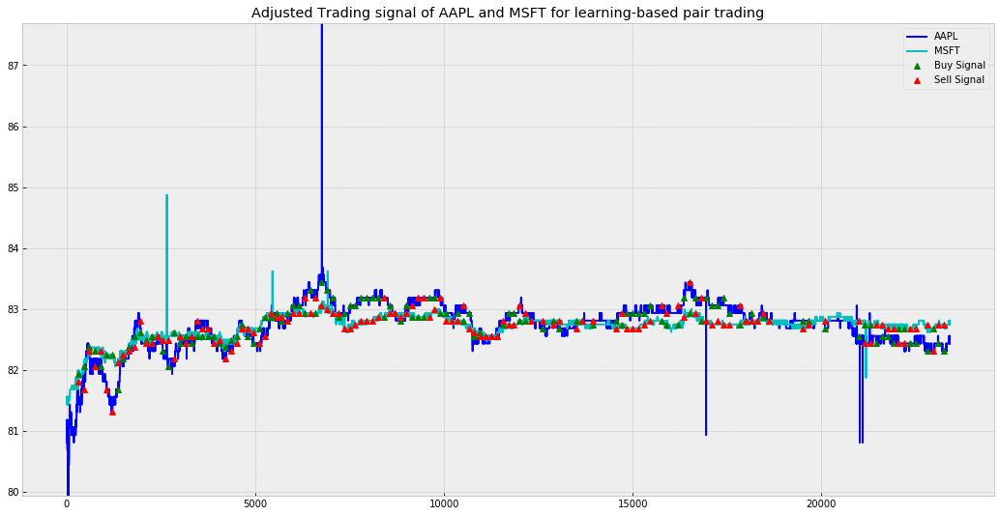

[Day 5]
v_test shape for day 5 : (154, 29, 299)
v_test shape for day 5 : (154, 29, 299)
v_test shape for day 5 : (154, 29, 299)
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
---------[Time = 300 to 450]---------
Current profit :   profit -  1
[Pairwise Price Change BothRise and Volatility1 > Volatility2]
[Buy AAPL and Sell MSFT] profit 1 | price ratios 2.056018168054504 | C1 1 pos | C2 -2.056018168054504 pos
AAPL price - 169.75 payment - 169.75 | MSFT price - 82.5625 revenue - 169.75 |
[Exit position] profit 0.9990230414089806 | price ratios 2.056018168054504 | C1 -1 pos | C2 2.056018168054504 pos
AAPL price - 170.125, earn : -170.125 | MSFT price - 82.625, earn : 169.8785011355034 |
---------[Time = 450 to 600]---------
Current profit :   profit -  0.9990230414089806
[Pairwise Price Change BothRise and Volatility1 > Volatility2]
[Buy AAPL and Sell MSFT] profit 0.9990230414089806 | price ratios 2.0590015128593

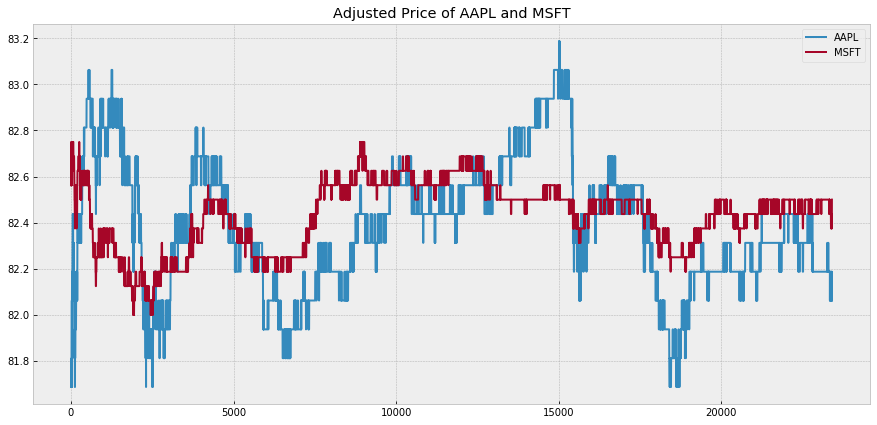

Plot z-score and trading signal of price ratio of AAPL and MSFT


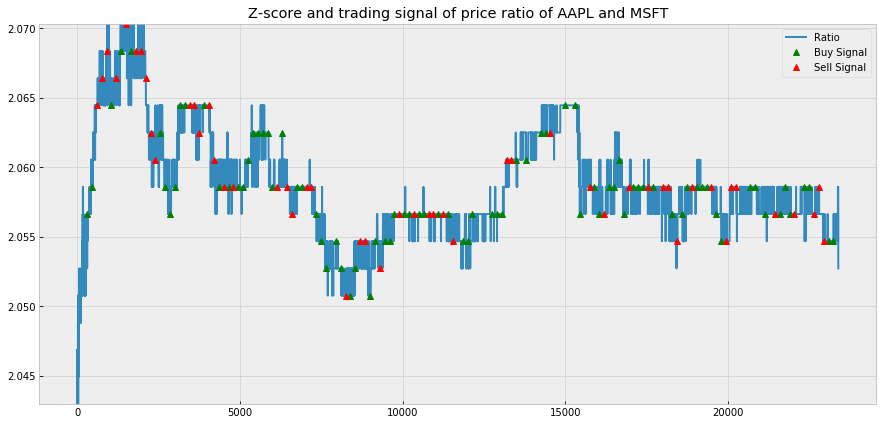

Trading signal of AAPL and MSFT for learning-based pair trading


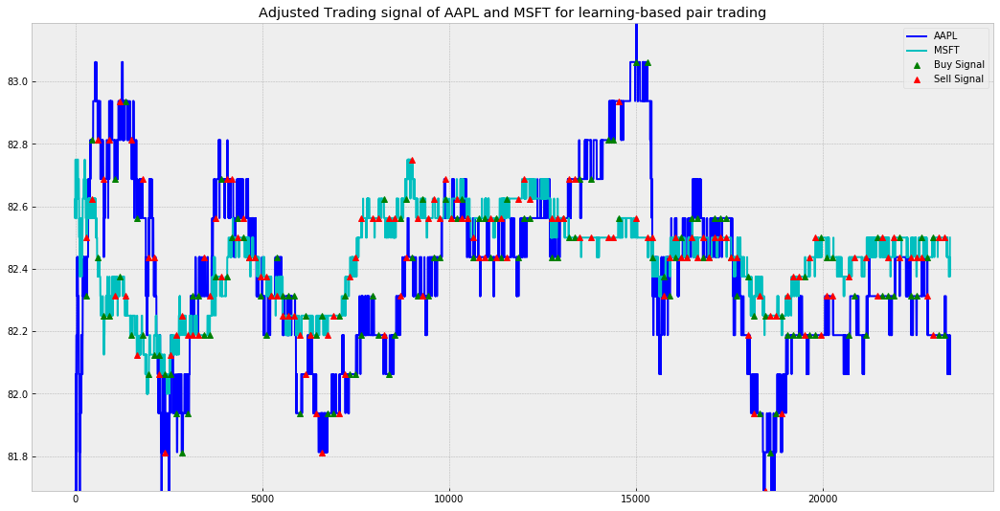

[Day 6]
v_test shape for day 6 : (154, 29, 299)
v_test shape for day 6 : (154, 29, 299)
v_test shape for day 6 : (154, 29, 299)
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
---------[Time = 300 to 450]---------
Current profit :   profit -  1
[Pairwise Price Change Reverse and Strength1 < Strength2]
[Sell AAPL and Buy MSFT] profit 1 | price ratios 2.029673590504451 | C1 -1 pos | C2 2.029673590504451 pos
AAPL price - 171.0 revenue - 171.0 | MSFT price - 84.25 payment - 171.0 |
[Exit position] profit 0.9985308521057786 | price ratios 2.029673590504451 | C1 1 pos | C2 -2.029673590504451 pos
AAPL price - 170.625, earn : 170.625 | MSFT price - 84.25, earn : -171.0 |
---------[Time = 450 to 600]---------
Current profit :   profit -  0.9985308521057786
[Pairwise Price Change Reverse and Strength1 < Strength2]
[Sell AAPL and Buy MSFT] profit 0.9985308521057786 | price ratios 2.0252225519287834 | C1 -1 pos | C2 2.02522

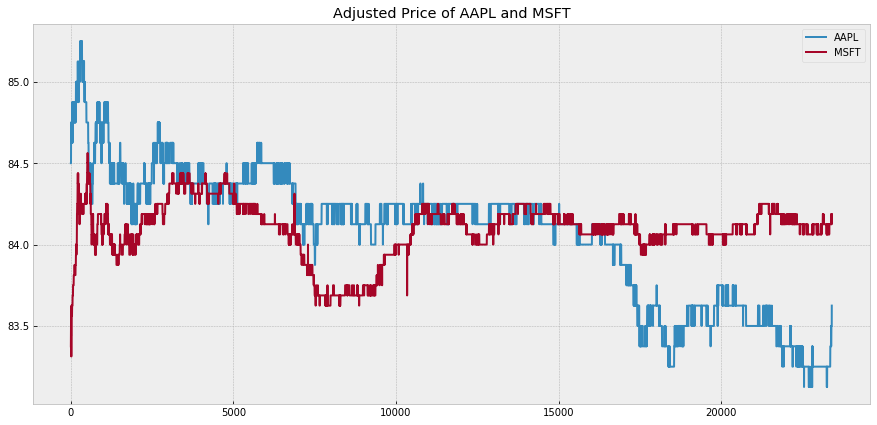

Plot z-score and trading signal of price ratio of AAPL and MSFT


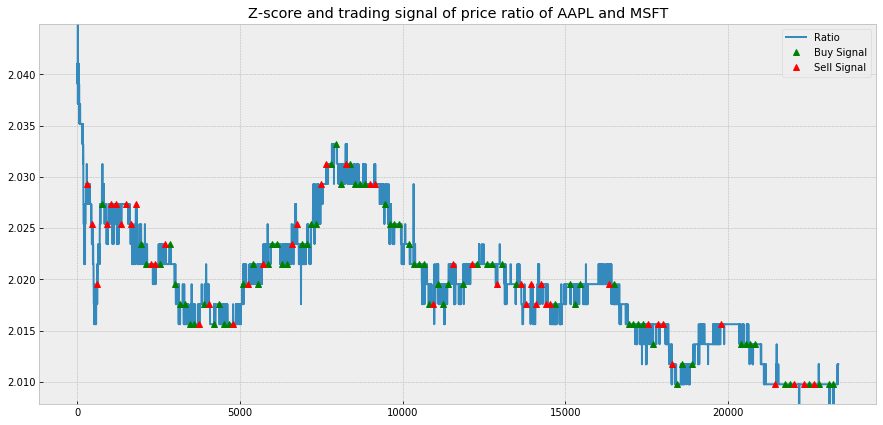

Trading signal of AAPL and MSFT for learning-based pair trading


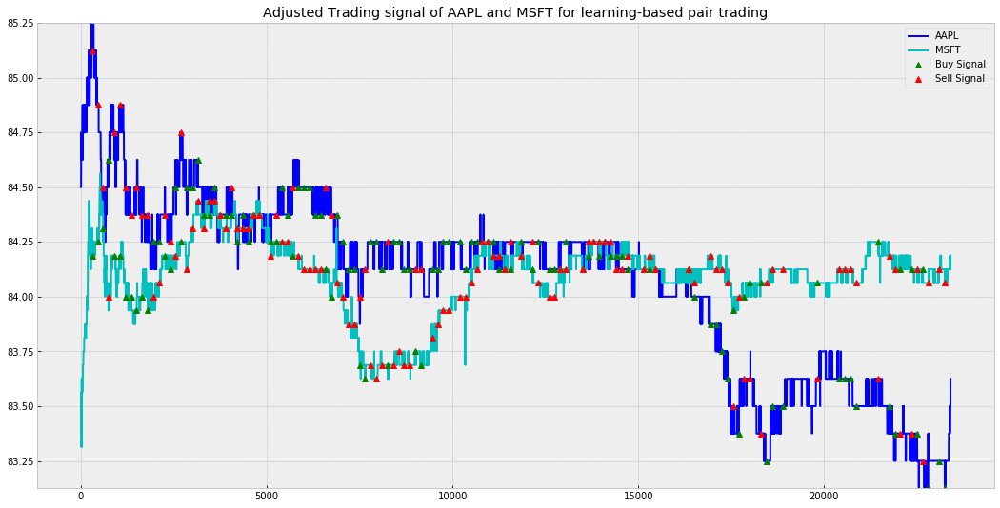

[Day 7]
v_test shape for day 7 : (154, 29, 299)
v_test shape for day 7 : (154, 29, 299)
v_test shape for day 7 : (154, 29, 299)
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
---------[Time = 300 to 450]---------
Current profit :   profit -  1
[Pairwise Price Change BothRise and Volatility1 > Volatility2]
[Buy AAPL and Sell MSFT] profit 1 | price ratios 2.0044378698224854 | C1 1 pos | C2 -2.0044378698224854 pos
AAPL price - 169.375 payment - 169.375 | MSFT price - 84.5 revenue - 169.37500000000003 |
[Exit position] profit 0.99753815854259 | price ratios 2.0044378698224854 | C1 -1 pos | C2 2.0044378698224854 pos
AAPL price - 170.0, earn : -170.0 | MSFT price - 84.5, earn : 169.37500000000003 |
---------[Time = 450 to 600]---------
Current profit :   profit -  0.99753815854259
[Pairwise Price Change Reverse and Strength1 < Strength2]
[Sell AAPL and Buy MSFT] profit 0.99753815854259 | price ratios 2.01183431952662

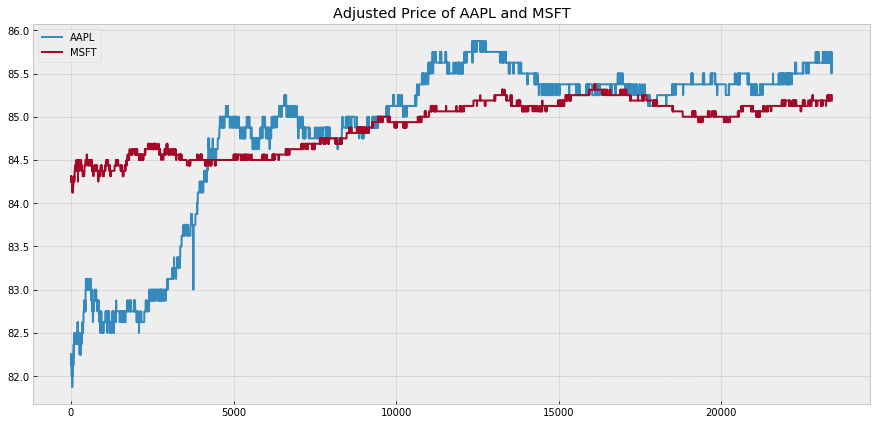

Plot z-score and trading signal of price ratio of AAPL and MSFT


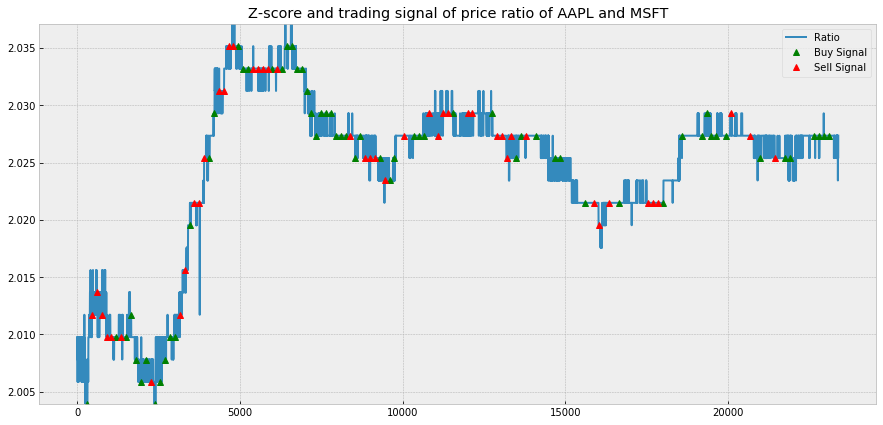

Trading signal of AAPL and MSFT for learning-based pair trading


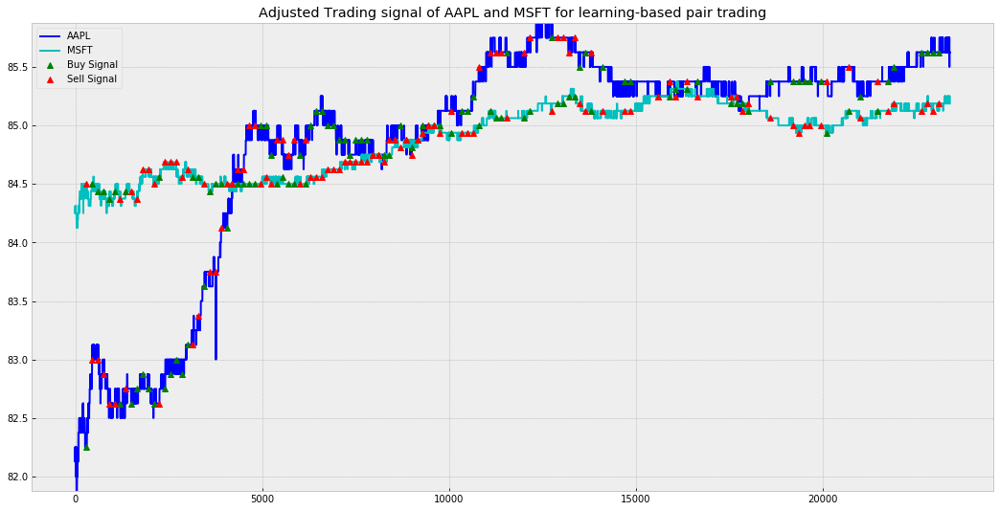

[Day 8]
v_test shape for day 8 : (154, 29, 299)
v_test shape for day 8 : (154, 29, 299)
v_test shape for day 8 : (154, 29, 299)
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
---------[Time = 300 to 450]---------
Current profit :   profit -  1
[Pairwise Price Change BothRise and Volatility1 > Volatility2]
[Buy AAPL and Sell MSFT] profit 1 | price ratios 2.014641288433382 | C1 1 pos | C2 -2.014641288433382 pos
AAPL price - 172.0 payment - 172.0 | MSFT price - 85.375 revenue - 172.0 |
[Exit position] profit 0.9999893336898251 | price ratios 2.014641288433382 | C1 -1 pos | C2 2.014641288433382 pos
AAPL price - 171.625, earn : -171.625 | MSFT price - 85.1875, earn : 171.62225475841873 |
---------[Time = 450 to 600]---------
Current profit :   profit -  0.9999893336898251
[Pairwise Price Change Reverse and Strength1 < Strength2]
[Sell AAPL and Buy MSFT] profit 0.9999893336898251 | price ratios 2.016140865737344 | C1

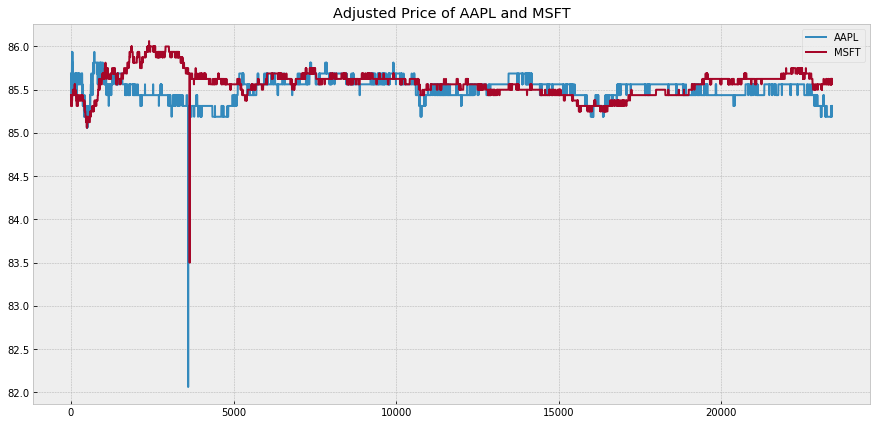

Plot z-score and trading signal of price ratio of AAPL and MSFT


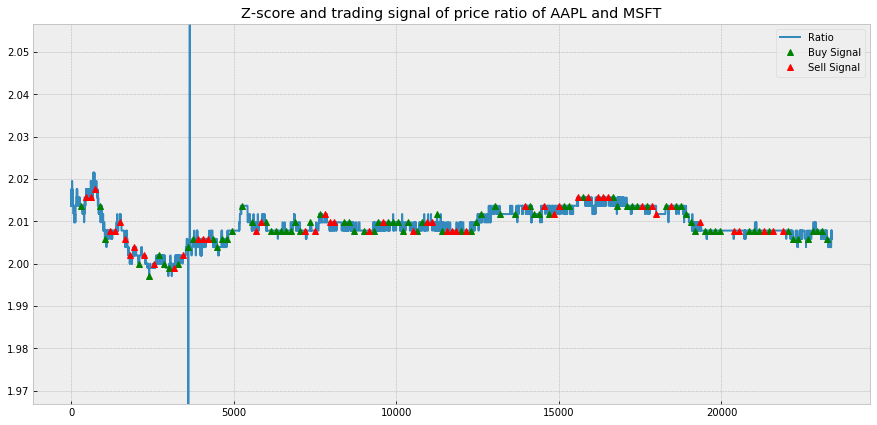

Trading signal of AAPL and MSFT for learning-based pair trading


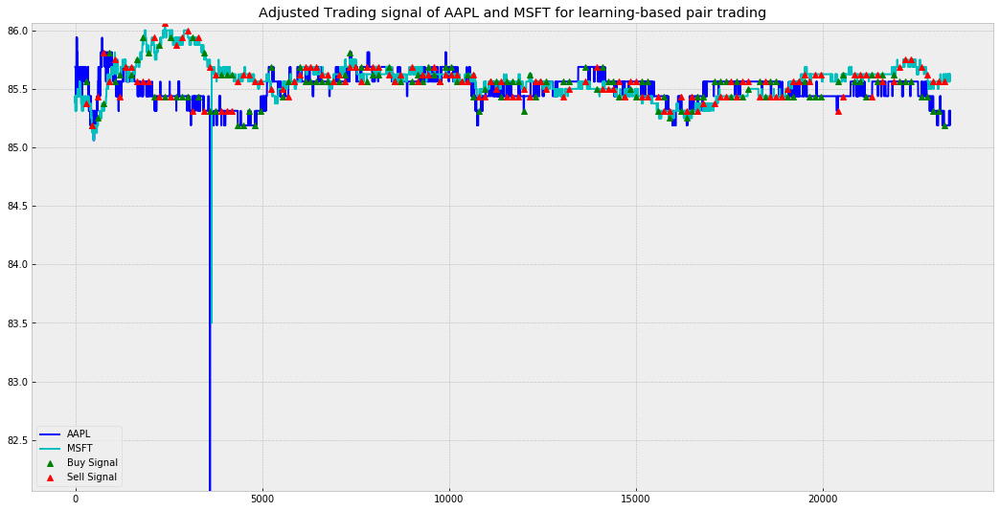

[Day 9]
v_test shape for day 9 : (154, 29, 299)
v_test shape for day 9 : (154, 29, 299)
v_test shape for day 9 : (154, 29, 299)
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
---------[Time = 300 to 450]---------
Current profit :   profit -  1
[Pairwise Price Change Reverse and Strength1 < Strength2]
[Sell AAPL and Buy MSFT] profit 1 | price ratios 2.0233576642335764 | C1 -1 pos | C2 2.0233576642335764 pos
AAPL price - 173.25 revenue - 173.25 | MSFT price - 85.625 payment - 173.24999999999997 |
[Exit position] profit 1.0009713562685258 | price ratios 2.0233576642335764 | C1 1 pos | C2 -2.0233576642335764 pos
AAPL price - 173.375, earn : 173.375 | MSFT price - 85.5625, earn : -173.12354014598537 |
---------[Time = 450 to 600]---------
Current profit :   profit -  1.0009713562685258
[Pairwise Price Change BothRise and Volatility1 > Volatility2]
[Buy AAPL and Sell MSFT] profit 1.0009713562685258 | price ratios 2.0

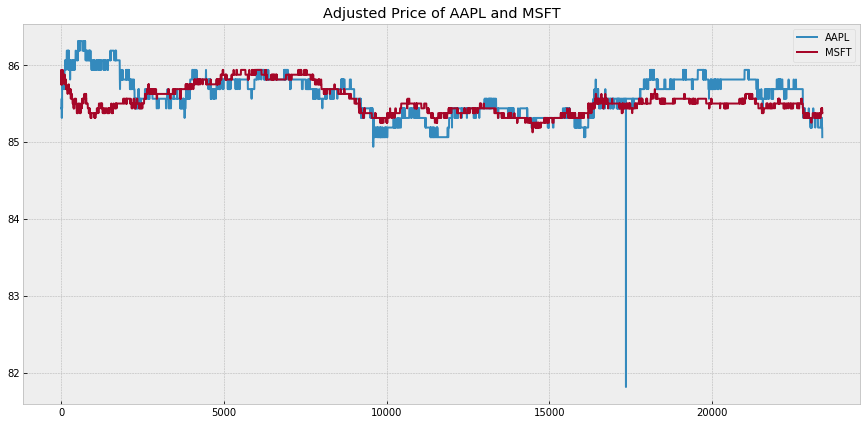

Plot z-score and trading signal of price ratio of AAPL and MSFT


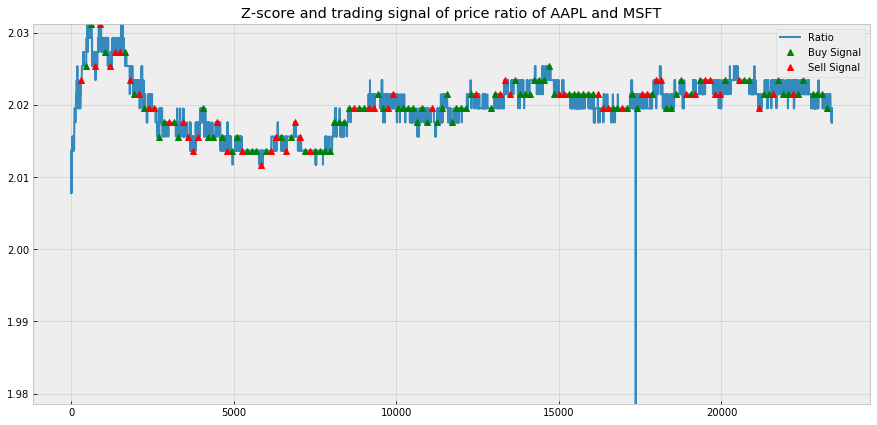

Trading signal of AAPL and MSFT for learning-based pair trading


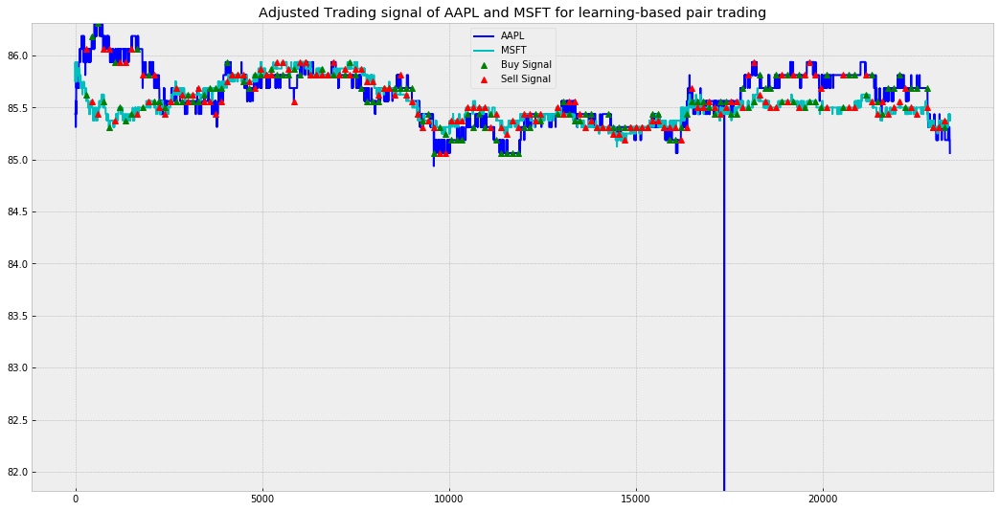

[Day 10]
v_test shape for day 10 : (154, 29, 299)
v_test shape for day 10 : (154, 29, 299)
v_test shape for day 10 : (154, 29, 299)
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
---------[Time = 300 to 450]---------
Current profit :   profit -  1
[Pairwise Price Change Reverse and Strength1 < Strength2]
[Sell AAPL and Buy MSFT] profit 1 | price ratios 2.0189642596644783 | C1 -1 pos | C2 2.0189642596644783 pos
AAPL price - 173.0 revenue - 173.0 | MSFT price - 85.6875 payment - 173.0 |
[Exit position] profit 1.000496954041796 | price ratios 2.0189642596644783 | C1 1 pos | C2 -2.0189642596644783 pos
AAPL price - 172.75, earn : 172.75 | MSFT price - 85.5, earn : -172.6214442013129 |
---------[Time = 450 to 600]---------
Current profit :   profit -  1.000496954041796
[Pairwise Price Change Reverse and Strength1 < Strength2]
[Sell AAPL and Buy MSFT] profit 1.000496954041796 | price ratios 2.02046783625731 | C1 -1 po

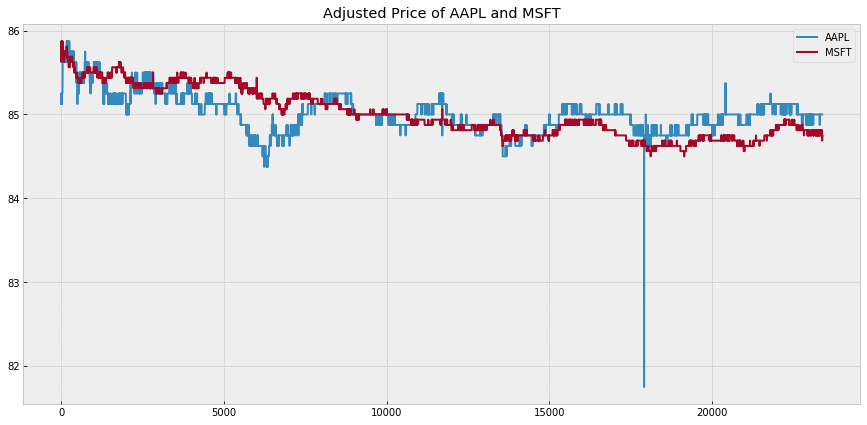

Plot z-score and trading signal of price ratio of AAPL and MSFT


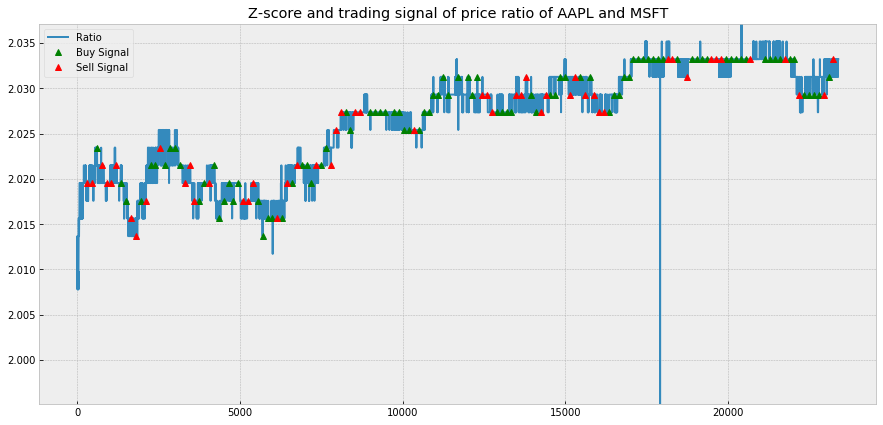

Trading signal of AAPL and MSFT for learning-based pair trading


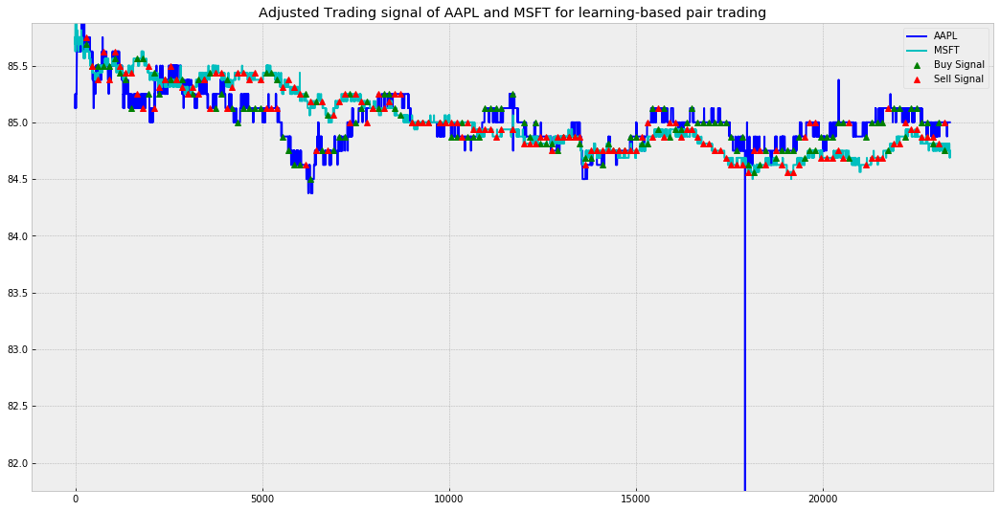

[Day 11]
v_test shape for day 11 : (154, 29, 299)
v_test shape for day 11 : (154, 29, 299)
v_test shape for day 11 : (154, 29, 299)
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
---------[Time = 300 to 450]---------
Current profit :   profit -  1
[Pairwise Price Change BothRise and Volatility1 > Volatility2]
[Buy AAPL and Sell MSFT] profit 1 | price ratios 2.0308143800440206 | C1 1 pos | C2 -2.0308143800440206 pos
AAPL price - 173.0 payment - 173.0 | MSFT price - 85.1875 revenue - 173.0 |
[Exit position] profit 0.9995083964221632 | price ratios 2.0308143800440206 | C1 -1 pos | C2 2.0308143800440206 pos
AAPL price - 173.0, earn : -173.0 | MSFT price - 85.125, earn : 172.87307410124725 |
---------[Time = 450 to 600]---------
Current profit :   profit -  0.9995083964221632
[Pairwise Price Change BothRise and Volatility1 > Volatility2]
[Buy AAPL and Sell MSFT] profit 0.9995083964221632 | price ratios 2.03230543318

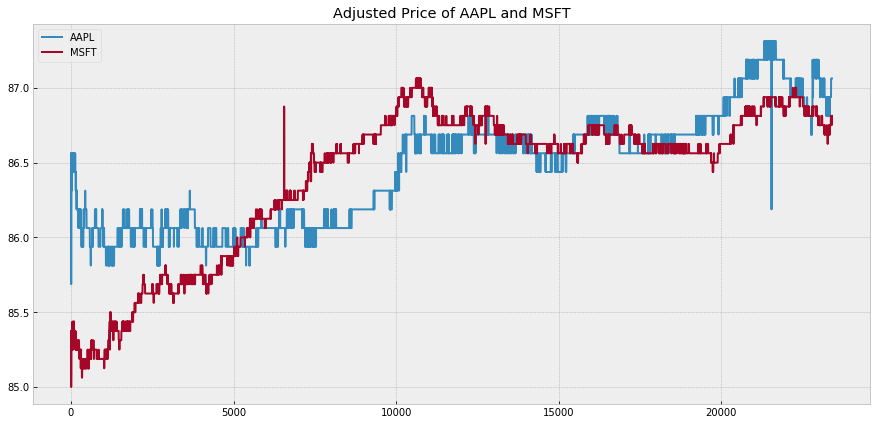

Plot z-score and trading signal of price ratio of AAPL and MSFT


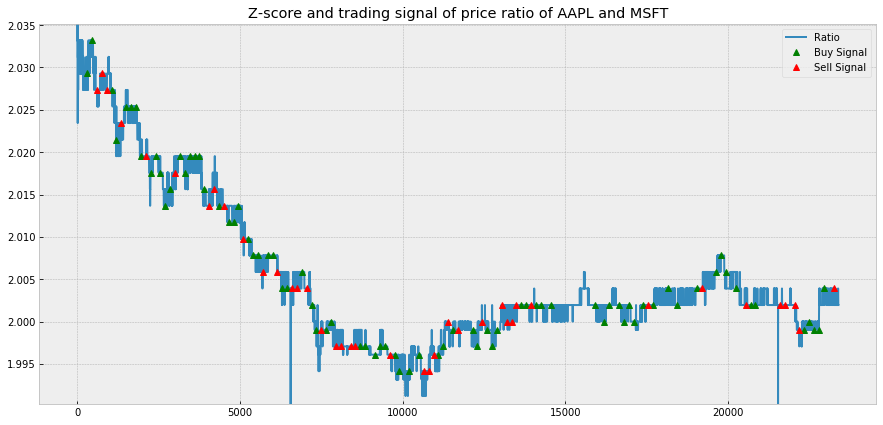

Trading signal of AAPL and MSFT for learning-based pair trading


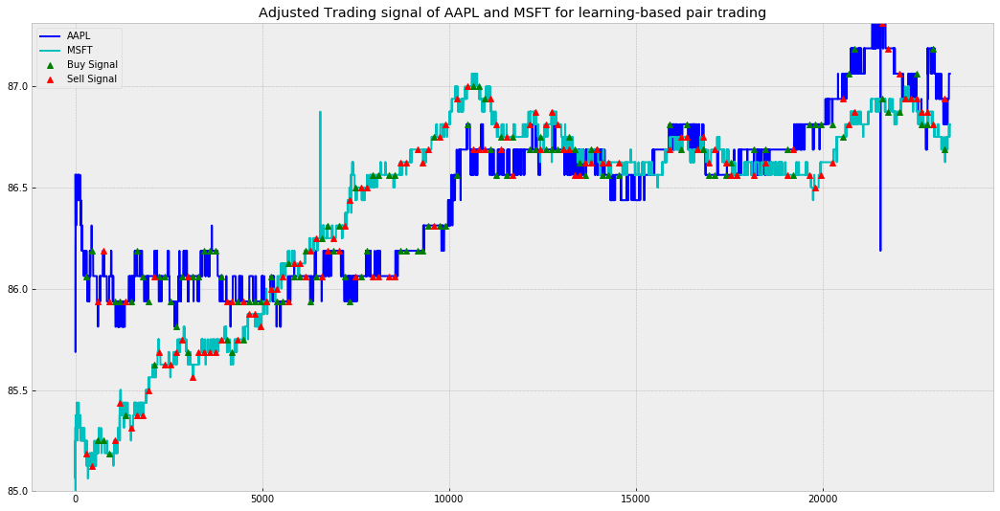

[Day 12]
v_test shape for day 12 : (154, 29, 299)
v_test shape for day 12 : (154, 29, 299)
v_test shape for day 12 : (154, 29, 299)
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
---------[Time = 300 to 450]---------
Current profit :   profit -  1
[Pairwise Price Change BothRise and Volatility1 > Volatility2]
[Buy AAPL and Sell MSFT] profit 1 | price ratios 2.018664752333094 | C1 1 pos | C2 -2.018664752333094 pos
AAPL price - 175.75 payment - 175.75 | MSFT price - 87.0625 revenue - 175.74999999999997 |
[Exit position] profit 0.9999866838865638 | price ratios 2.018664752333094 | C1 -1 pos | C2 2.018664752333094 pos
AAPL price - 175.375, earn : -175.375 | MSFT price - 86.875, earn : 175.37150035893754 |
---------[Time = 450 to 600]---------
Current profit :   profit -  0.9999866838865638
[Pairwise Price Change BothRise and Volatility1 > Volatility2]
[Buy AAPL and Sell MSFT] profit 0.9999866838865638 | price ratio

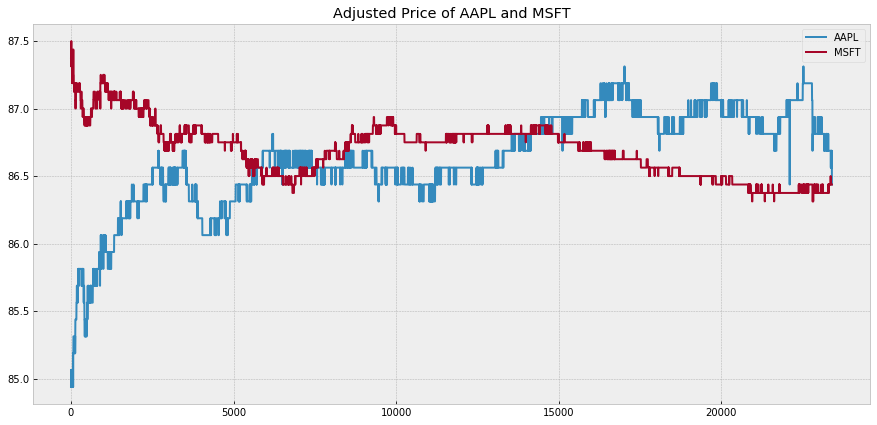

Plot z-score and trading signal of price ratio of AAPL and MSFT


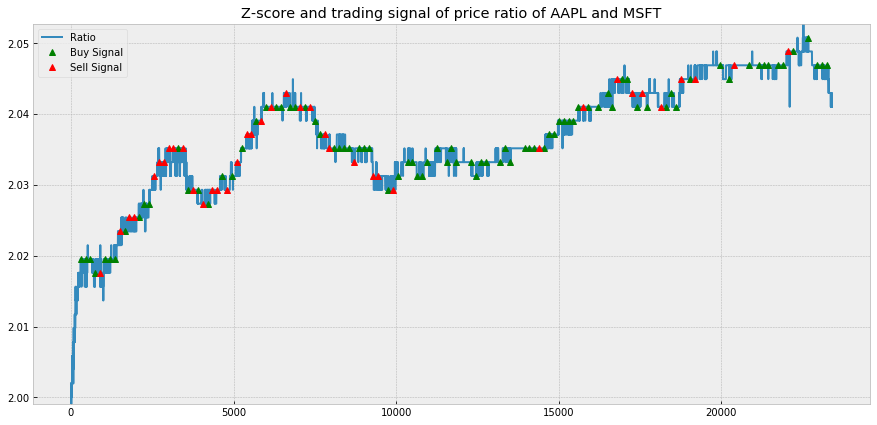

Trading signal of AAPL and MSFT for learning-based pair trading


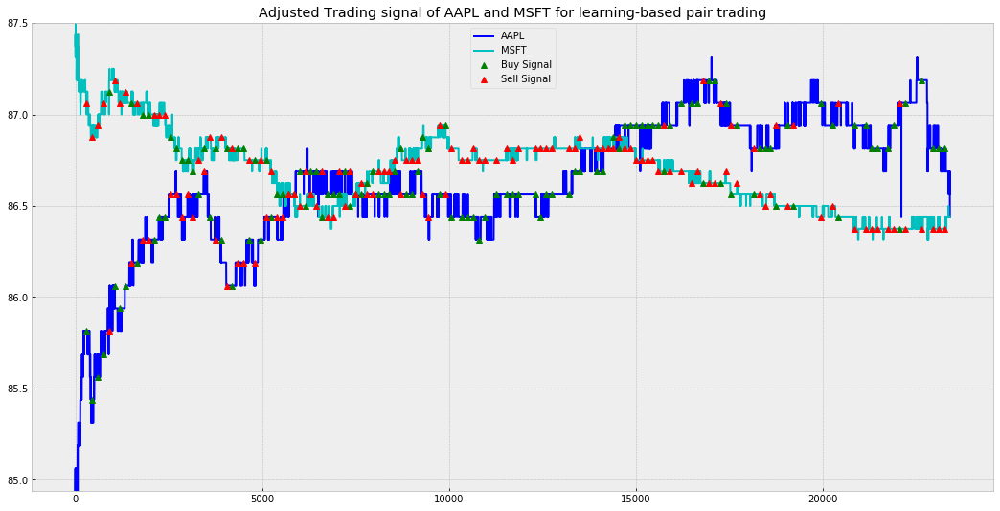

[Day 13]
v_test shape for day 13 : (154, 29, 299)
v_test shape for day 13 : (154, 29, 299)
v_test shape for day 13 : (154, 29, 299)
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
---------[Time = 300 to 450]---------
Current profit :   profit -  1
[Pairwise Price Change BothRise and Volatility1 > Volatility2]
[Buy AAPL and Sell MSFT] profit 1 | price ratios 2.037845705967977 | C1 1 pos | C2 -2.037845705967977 pos
AAPL price - 175.0 payment - 175.0 | MSFT price - 85.875 revenue - 175.0 |
[Exit position] profit 1.0004791566842357 | price ratios 2.037845705967977 | C1 -1 pos | C2 2.037845705967977 pos
AAPL price - 174.875, earn : -174.875 | MSFT price - 85.875, earn : 175.0 |
---------[Time = 450 to 600]---------
Current profit :   profit -  1.0004791566842357
[Pairwise Price Change Reverse and Strength1 < Strength2]
[Sell AAPL and Buy MSFT] profit 1.0004791566842357 | price ratios 2.036390101892285 | C1 -1 pos | 

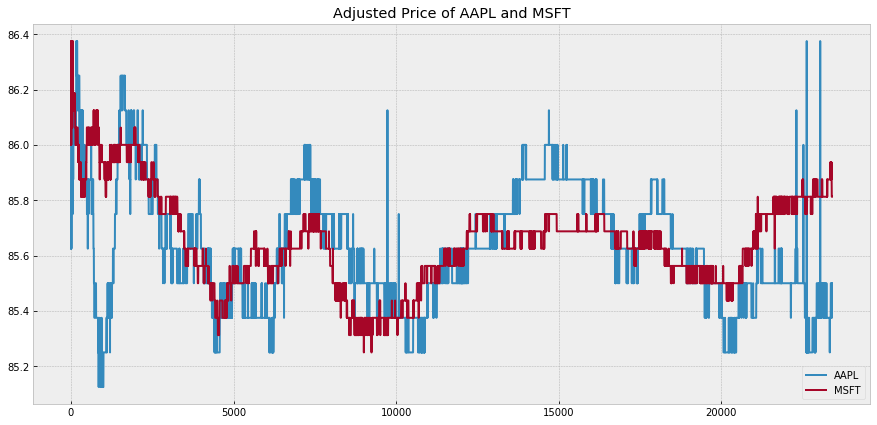

Plot z-score and trading signal of price ratio of AAPL and MSFT


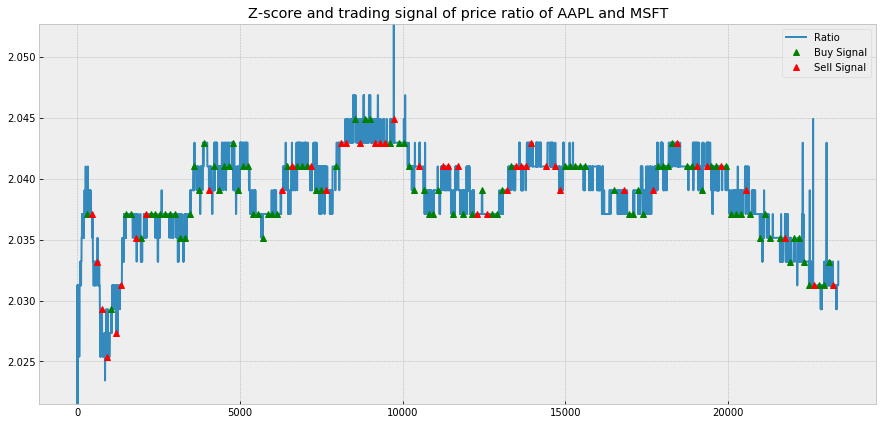

Trading signal of AAPL and MSFT for learning-based pair trading


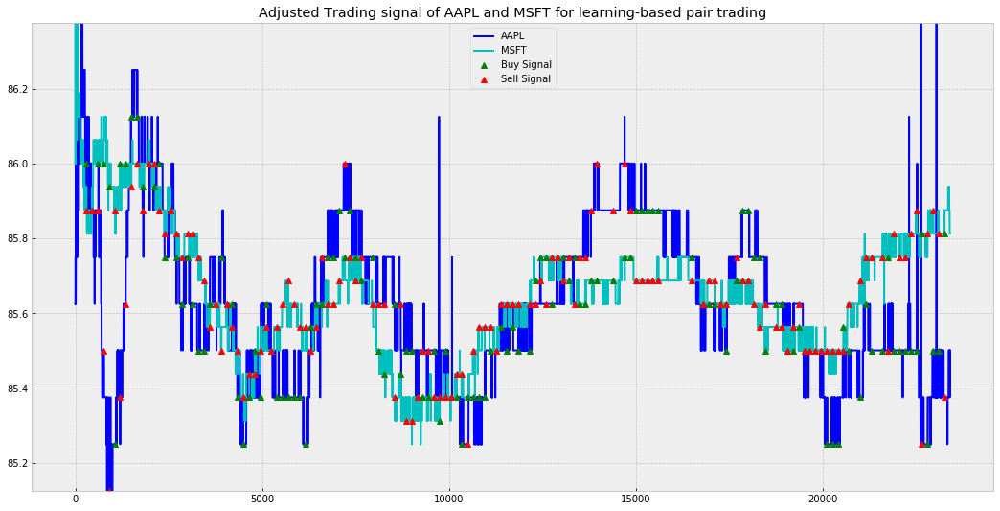

[Day 14]
v_test shape for day 14 : (154, 29, 299)
v_test shape for day 14 : (154, 29, 299)
v_test shape for day 14 : (154, 29, 299)
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
---------[Time = 300 to 450]---------
Current profit :   profit -  1
[Pairwise Price Change BothRise and Volatility1 > Volatility2]
[Buy AAPL and Sell MSFT] profit 1 | price ratios 2.0467153284671533 | C1 1 pos | C2 -2.0467153284671533 pos
AAPL price - 175.25 payment - 175.25 | MSFT price - 85.625 revenue - 175.25 |
[Exit position] profit 0.9989969187077459 | price ratios 2.0467153284671533 | C1 -1 pos | C2 2.0467153284671533 pos
AAPL price - 175.0, earn : -175.0 | MSFT price - 85.375, earn : 174.7383211678832 |
---------[Time = 450 to 600]---------
Current profit :   profit -  0.9989969187077459
[Pairwise Price Change Reverse and Strength1 < Strength2]
[Sell AAPL and Buy MSFT] profit 0.9989969187077459 | price ratios 2.049780380673499

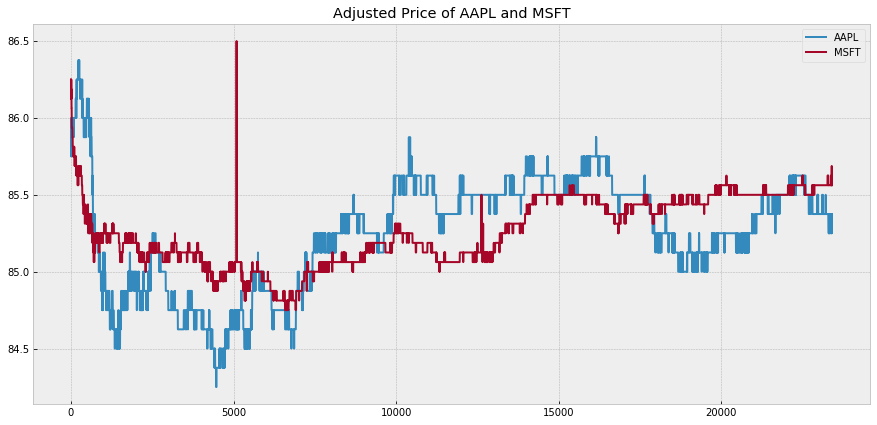

Plot z-score and trading signal of price ratio of AAPL and MSFT


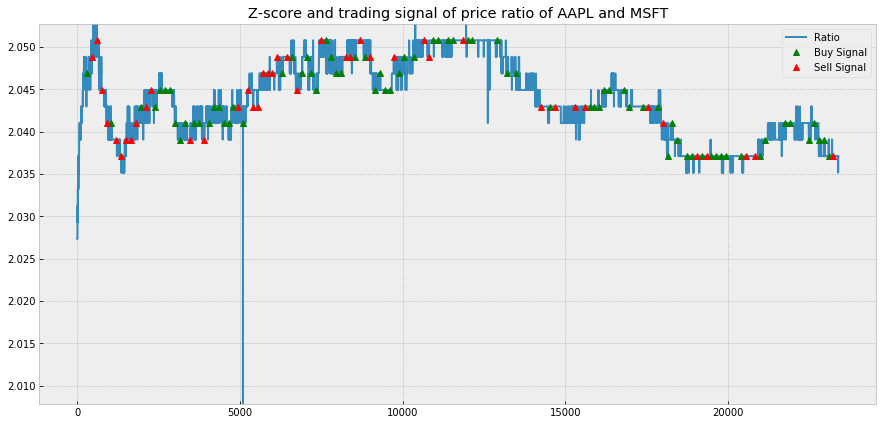

Trading signal of AAPL and MSFT for learning-based pair trading


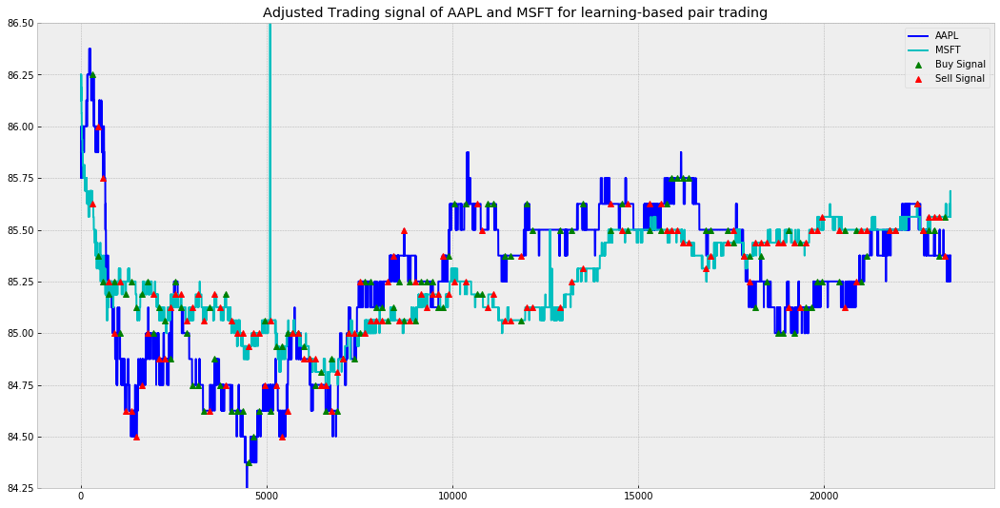

[Day 15]
v_test shape for day 15 : (154, 29, 299)
v_test shape for day 15 : (154, 29, 299)
v_test shape for day 15 : (154, 29, 299)
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
---------[Time = 300 to 450]---------
Current profit :   profit -  1
[Pairwise Price Change Reverse and Strength1 > Strength2]
[Buy AAPL and Sell MSFT] profit 1 | price ratios 2.0348837209302326 | C1 1 pos | C2 -2.0348837209302326 pos
AAPL price - 175.0 payment - 175.0 | MSFT price - 86.0 revenue - 175.0 |
[Exit position] profit 0.999033792212421 | price ratios 2.0348837209302326 | C1 -1 pos | C2 2.0348837209302326 pos
AAPL price - 175.125, earn : -175.125 | MSFT price - 85.9375, earn : 174.87281976744185 |
---------[Time = 450 to 600]---------
Current profit :   profit -  0.999033792212421
[Pairwise Price Change Reverse and Strength1 < Strength2]
[Sell AAPL and Buy MSFT] profit 0.999033792212421 | price ratios 2.037818181818182 | C1 -

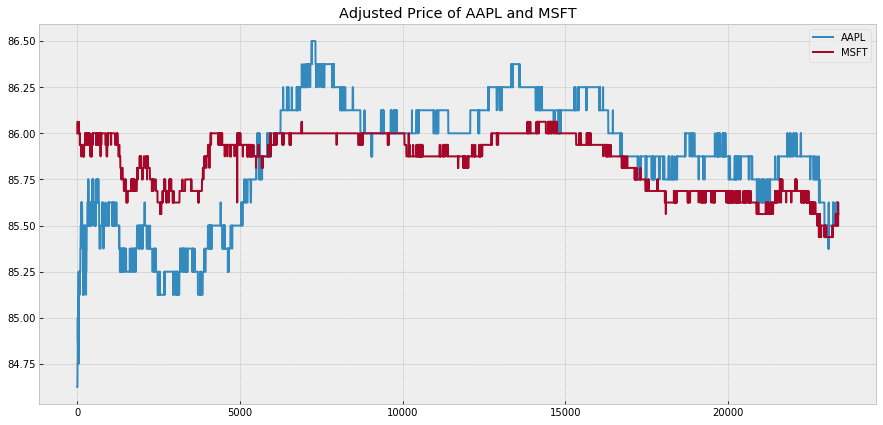

Plot z-score and trading signal of price ratio of AAPL and MSFT


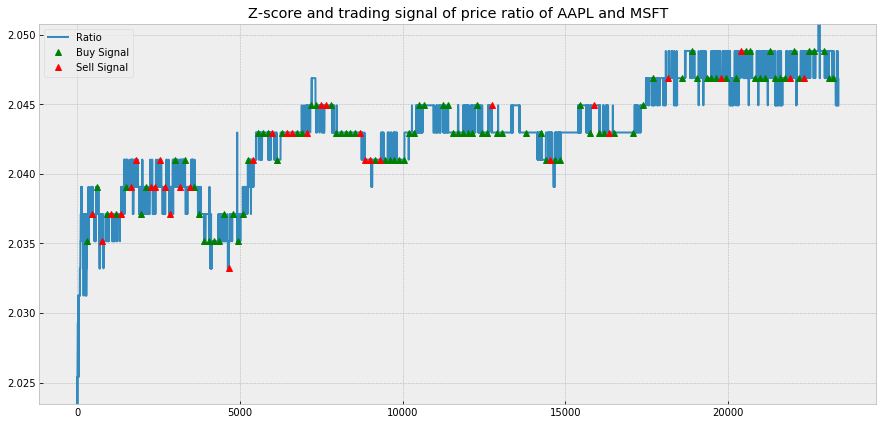

Trading signal of AAPL and MSFT for learning-based pair trading


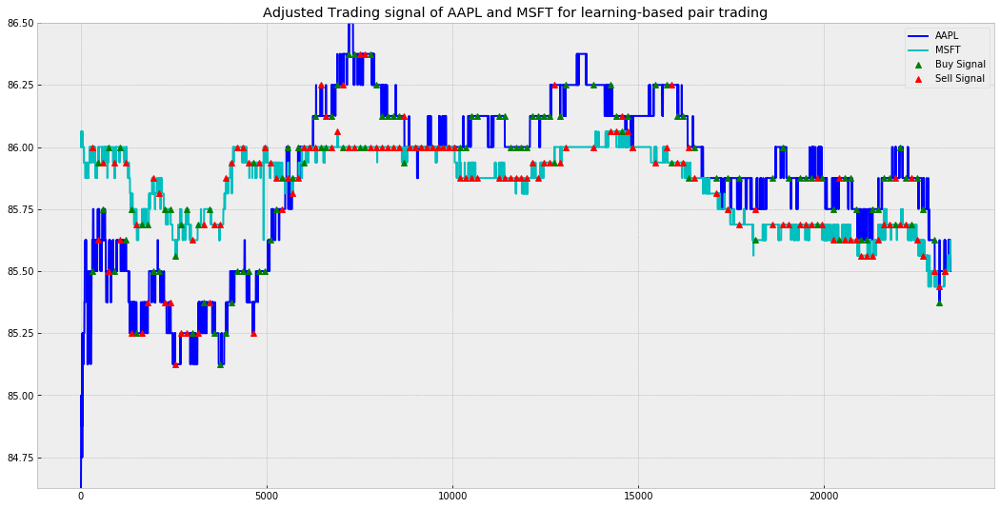

[Day 16]
v_test shape for day 16 : (154, 29, 299)
v_test shape for day 16 : (154, 29, 299)
v_test shape for day 16 : (154, 29, 299)
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
---------[Time = 300 to 450]---------
Current profit :   profit -  1
[Pairwise Price Change BothRise and Volatility1 > Volatility2]
[Buy AAPL and Sell MSFT] profit 1 | price ratios 2.054212454212454 | C1 1 pos | C2 -2.054212454212454 pos
AAPL price - 175.25 payment - 175.25 | MSFT price - 85.3125 revenue - 175.24999999999997 |
[Exit position] profit 0.9999999999999999 | price ratios 2.054212454212454 | C1 -1 pos | C2 2.054212454212454 pos
AAPL price - 175.25, earn : -175.25 | MSFT price - 85.3125, earn : 175.24999999999997 |
---------[Time = 450 to 600]---------
Current profit :   profit -  0.9999999999999999
[Pairwise Price Change Reverse and Strength1 < Strength2]
[Sell AAPL and Buy MSFT] profit 0.9999999999999999 | price ratios 2.05

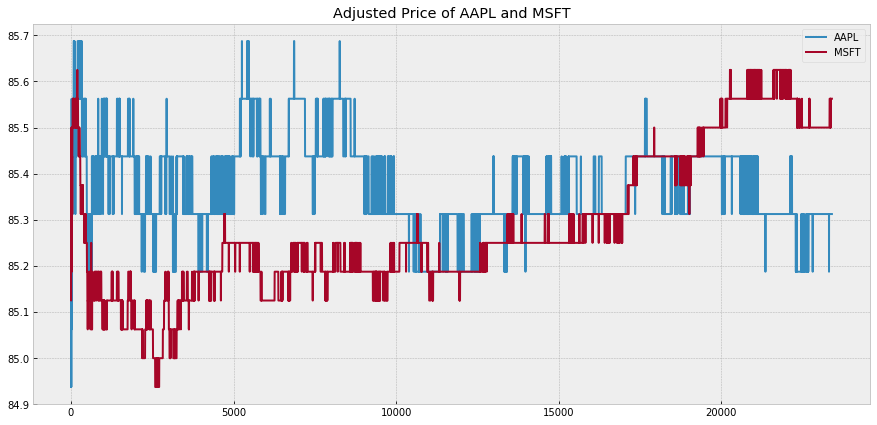

Plot z-score and trading signal of price ratio of AAPL and MSFT


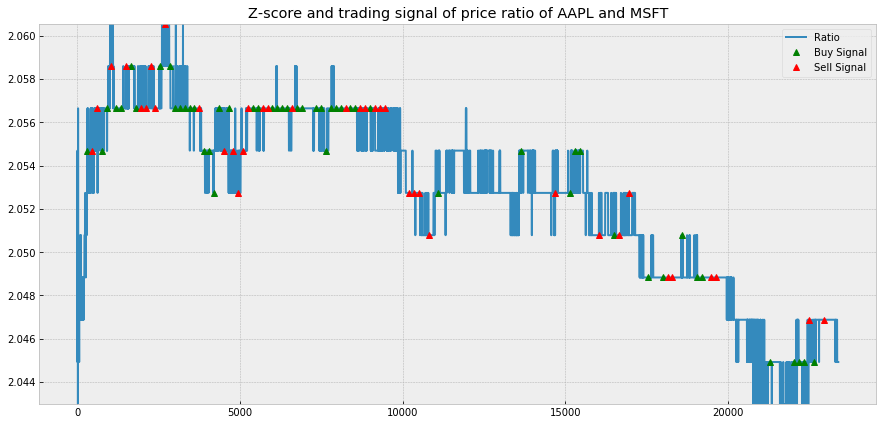

Trading signal of AAPL and MSFT for learning-based pair trading


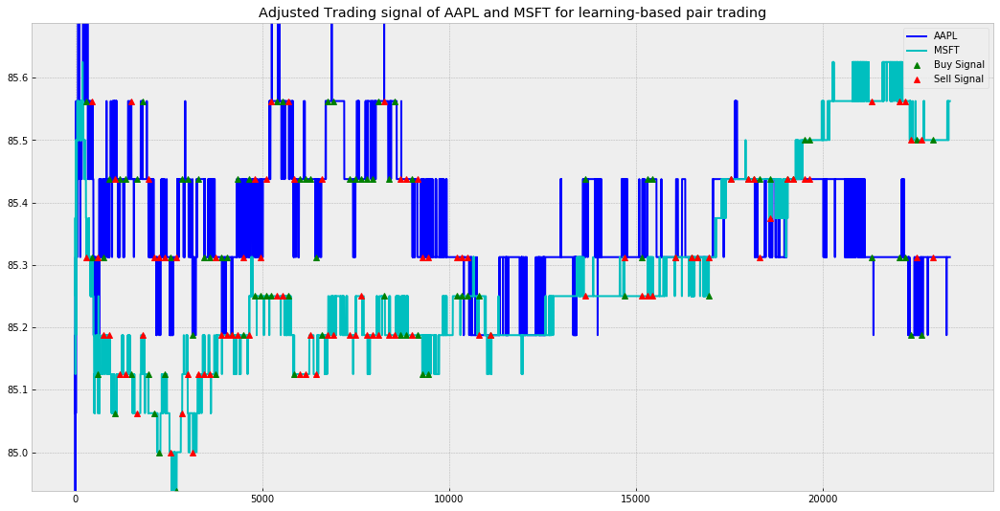

[Day 17]
v_test shape for day 17 : (154, 29, 299)
v_test shape for day 17 : (154, 29, 299)
v_test shape for day 17 : (154, 29, 299)
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
---------[Time = 300 to 450]---------
Current profit :   profit -  1
[Pairwise Price Change Reverse and Strength1 < Strength2]
[Sell AAPL and Buy MSFT] profit 1 | price ratios 1.9956043956043956 | C1 -1 pos | C2 1.9956043956043956 pos
AAPL price - 170.25 revenue - 170.25 | MSFT price - 85.3125 payment - 170.25 |
[Exit position] profit 1.0024423607695803 | price ratios 1.9956043956043956 | C1 1 pos | C2 -1.9956043956043956 pos
AAPL price - 170.5, earn : 170.5 | MSFT price - 85.125, earn : -169.87582417582416 |
---------[Time = 450 to 600]---------
Current profit :   profit -  1.0024423607695803
[Pairwise Price Change Reverse and Strength1 < Strength2]
[Sell AAPL and Buy MSFT] profit 1.0024423607695803 | price ratios 2.001468428781204 | 

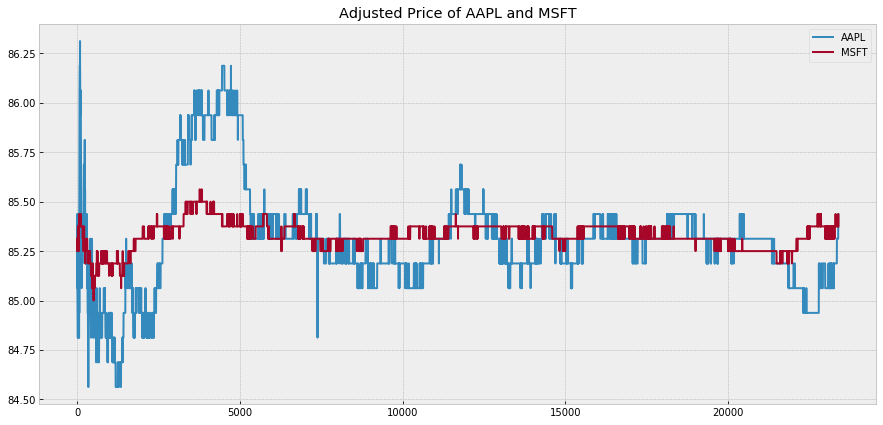

Plot z-score and trading signal of price ratio of AAPL and MSFT


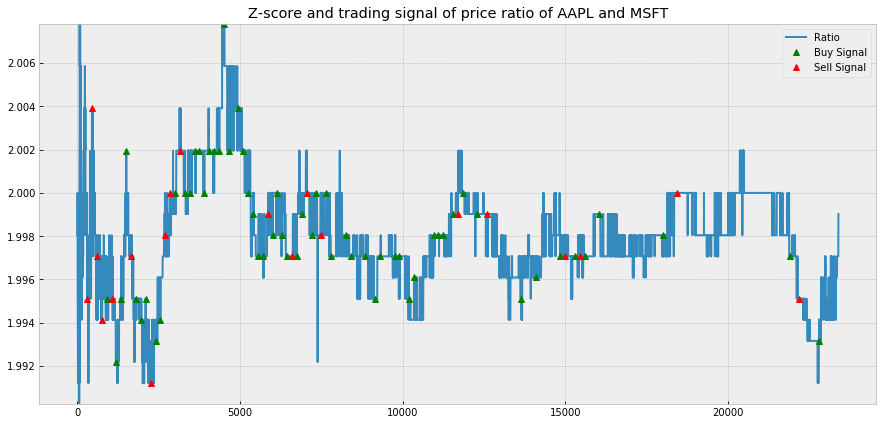

Trading signal of AAPL and MSFT for learning-based pair trading


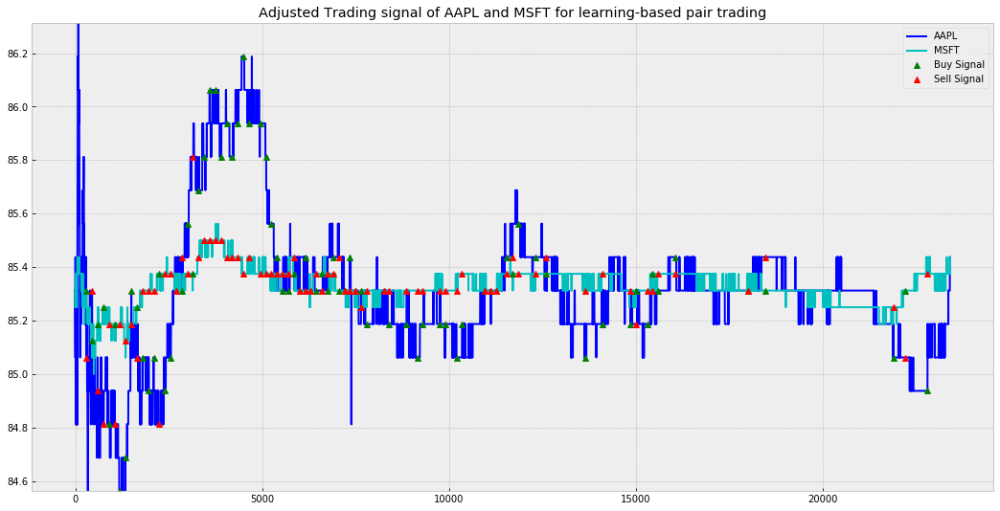

[Day 18]
v_test shape for day 18 : (154, 29, 299)
v_test shape for day 18 : (154, 29, 299)
v_test shape for day 18 : (154, 29, 299)
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
---------[Time = 300 to 450]---------
Current profit :   profit -  1
[Pairwise Price Change Reverse and Strength1 < Strength2]
[Sell AAPL and Buy MSFT] profit 1 | price ratios 1.9970717423133235 | C1 -1 pos | C2 1.9970717423133235 pos
AAPL price - 170.5 revenue - 170.5 | MSFT price - 85.375 payment - 170.5 |
[Exit position] profit 0.9985344406448461 | price ratios 1.9970717423133235 | C1 1 pos | C2 -1.9970717423133235 pos
AAPL price - 170.125, earn : 170.125 | MSFT price - 85.375, earn : -170.5 |
---------[Time = 450 to 600]---------
Current profit :   profit -  0.9985344406448461
[Pairwise Price Change Reverse and Strength1 < Strength2]
[Sell AAPL and Buy MSFT] profit 0.9985344406448461 | price ratios 1.992679355783309 | C1 -1 pos | C

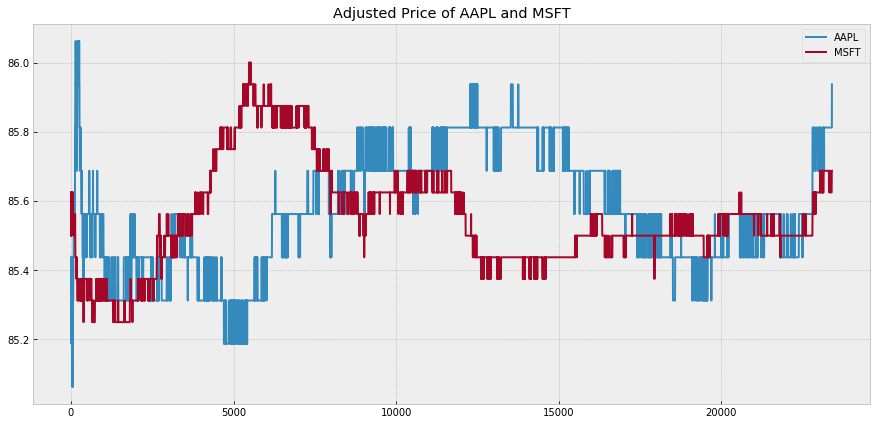

Plot z-score and trading signal of price ratio of AAPL and MSFT


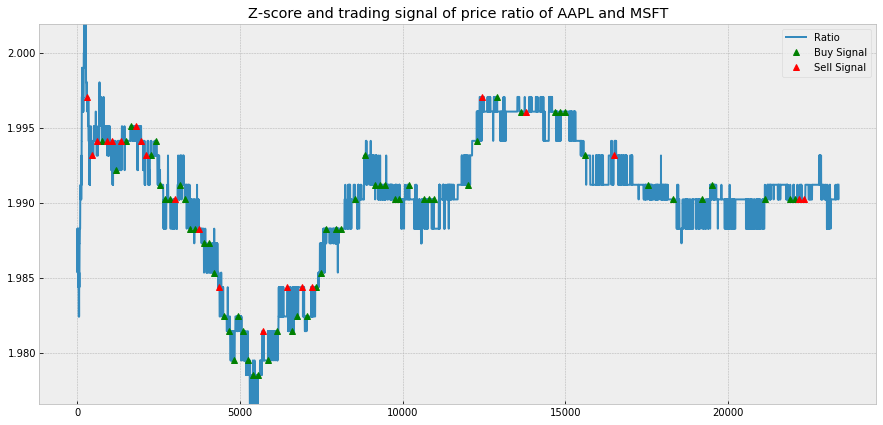

Trading signal of AAPL and MSFT for learning-based pair trading


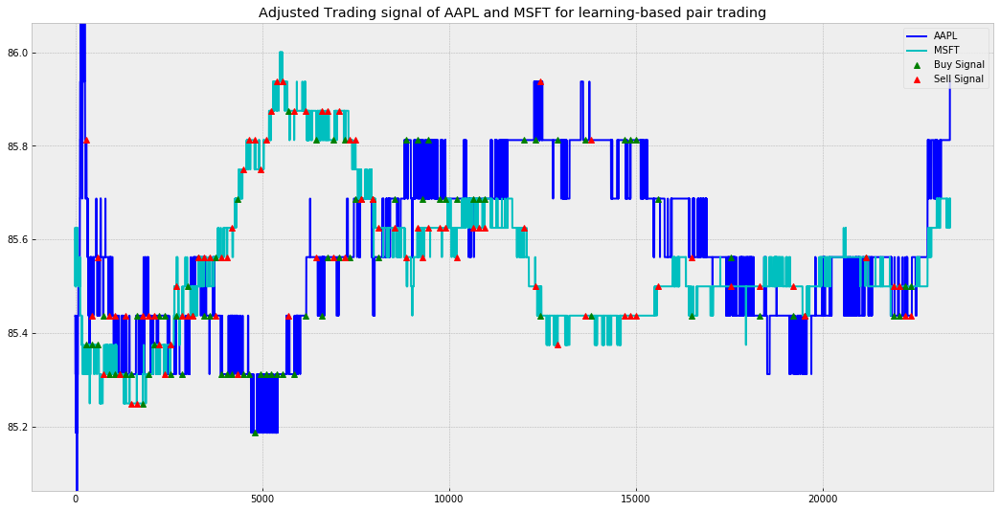

[Day 19]
v_test shape for day 19 : (154, 29, 299)
v_test shape for day 19 : (154, 29, 299)
v_test shape for day 19 : (154, 29, 299)
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
---------[Time = 300 to 450]---------
Current profit :   profit -  1
[Pairwise Price Change Reverse and Strength1 < Strength2]
[Sell AAPL and Buy MSFT] profit 1 | price ratios 2.0043795620437956 | C1 -1 pos | C2 2.0043795620437956 pos
AAPL price - 171.625 revenue - 171.625 | MSFT price - 85.625 payment - 171.625 |
[Exit position] profit 0.9990271186681138 | price ratios 2.0043795620437956 | C1 1 pos | C2 -2.0043795620437956 pos
AAPL price - 171.5, earn : 171.5 | MSFT price - 85.6875, earn : -171.75027372262772 |
---------[Time = 450 to 600]---------
Current profit :   profit -  0.9990271186681138
[Pairwise Price Change Reverse and Strength1 < Strength2]
[Sell AAPL and Buy MSFT] profit 0.9990271186681138 | price ratios 2.002917578409919

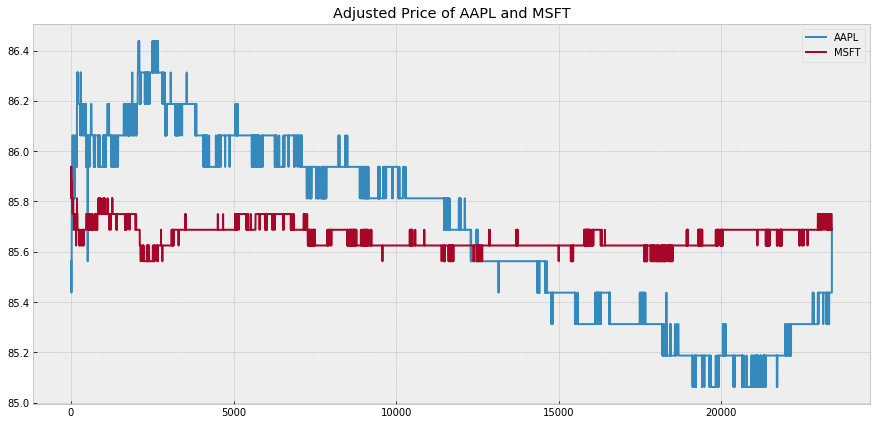

Plot z-score and trading signal of price ratio of AAPL and MSFT


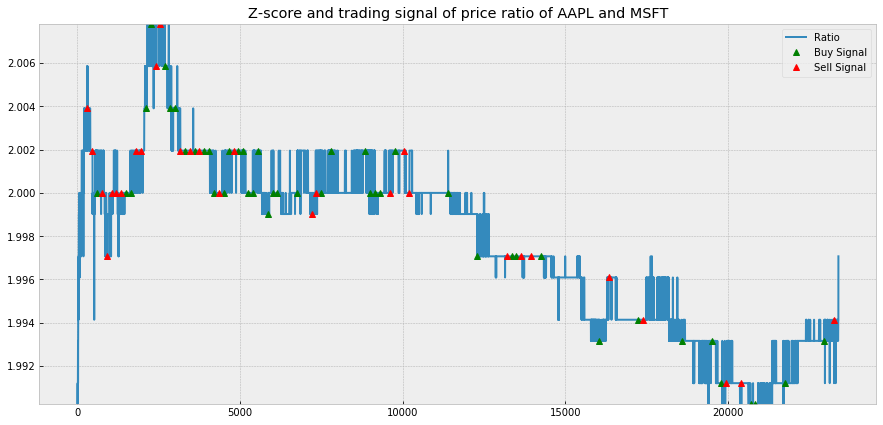

Trading signal of AAPL and MSFT for learning-based pair trading


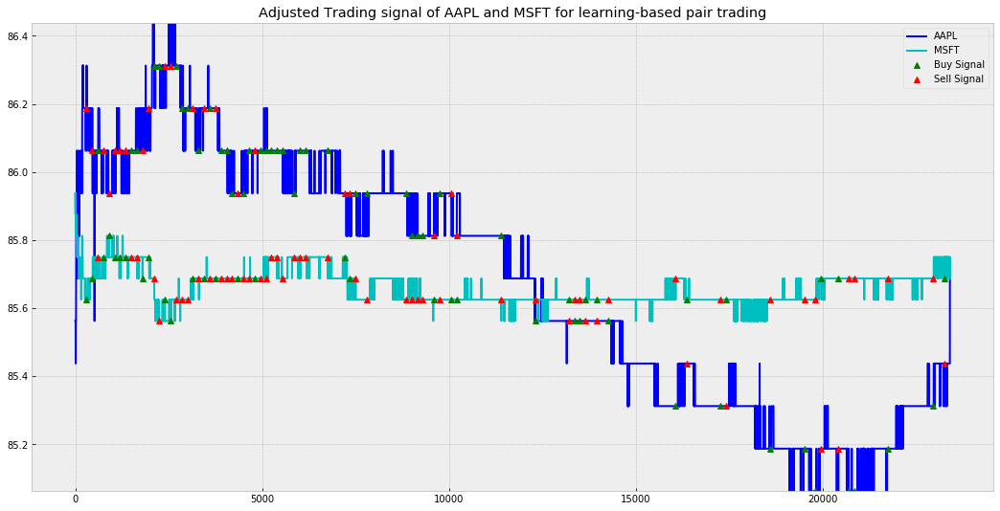

[Day 20]
v_test shape for day 20 : (154, 29, 299)
v_test shape for day 20 : (154, 29, 299)
v_test shape for day 20 : (154, 29, 299)
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
---------[Time = 300 to 450]---------
Current profit :   profit -  1
[Pairwise Price Change Reverse and Strength1 > Strength2]
[Buy AAPL and Sell MSFT] profit 1 | price ratios 1.9839650145772594 | C1 1 pos | C2 -1.9839650145772594 pos
AAPL price - 170.125 payment - 170.125 | MSFT price - 85.75 revenue - 170.125 |
[Exit position] profit 1.0009731228662866 | price ratios 1.9839650145772594 | C1 -1 pos | C2 1.9839650145772594 pos
AAPL price - 170.0, earn : -170.0 | MSFT price - 85.8125, earn : 170.24899781341108 |
---------[Time = 450 to 600]---------
Current profit :   profit -  1.0009731228662866
[Pairwise Price Change Reverse and Strength1 < Strength2]
[Sell AAPL and Buy MSFT] profit 1.0009731228662866 | price ratios 1.9810633648943918

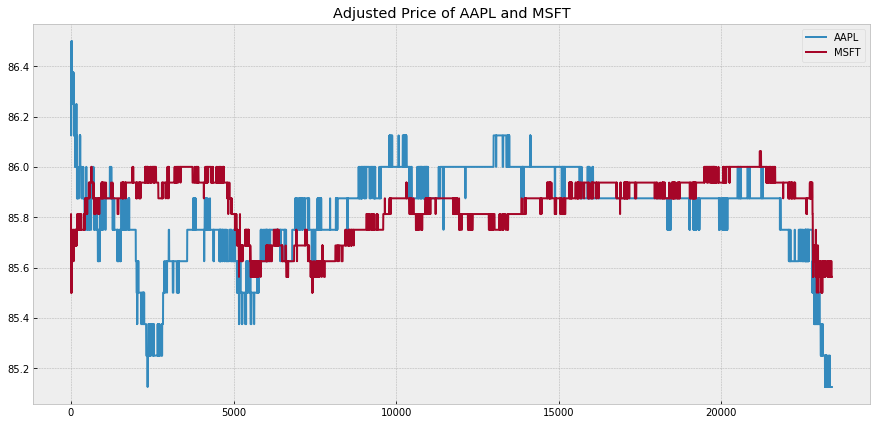

Plot z-score and trading signal of price ratio of AAPL and MSFT


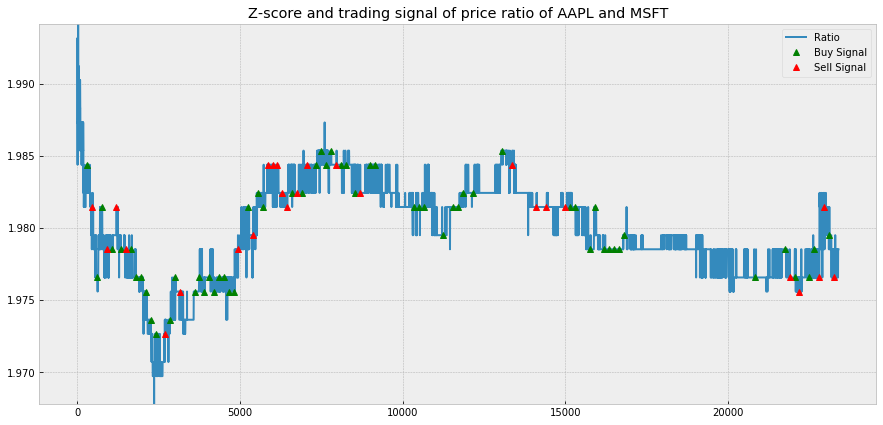

Trading signal of AAPL and MSFT for learning-based pair trading


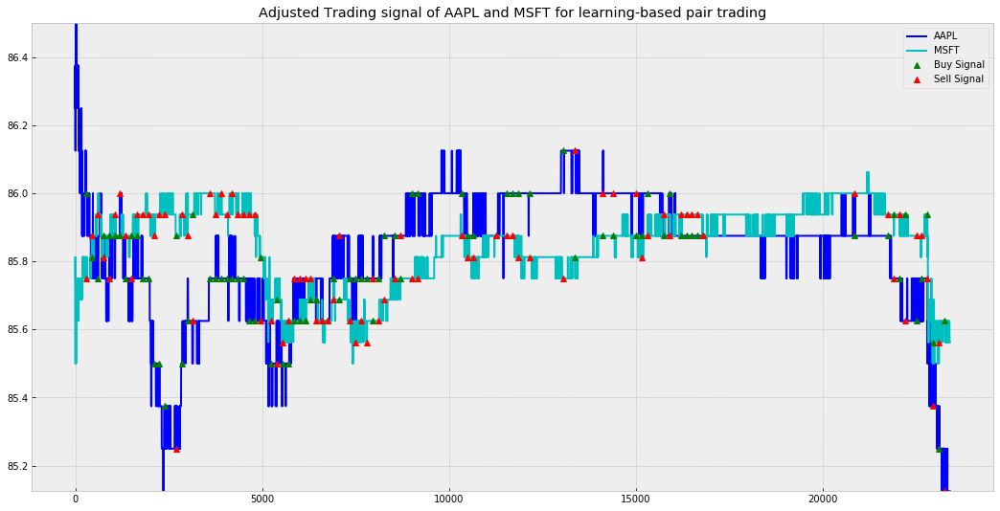

<Figure size 432x288 with 0 Axes>

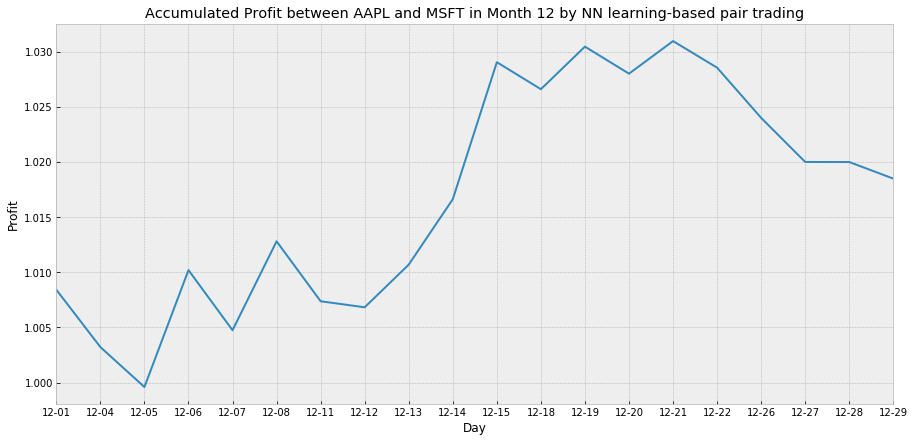

In [126]:
# 這邊是用NN prediction 來做策略
#p = ['AAPL', 'MSFT']
profit_day_NN = []
signal = []
price_day_avg = []
predict_result = {}
profit_Mode = 1
for i in range(day_test):
    print("[Day %s]" % str(i+1))
    S1 = pd.DataFrame({p[0]: price_and_return_for_test[p[0]][0][i,:]})
    S2 = pd.DataFrame({p[1]: price_and_return_for_test[p[1]][0][i,:]})
    price_day_avg.append(np.mean(S1.values) + np.mean(S2.values))
    result = NN_trade(S1, S2, p[0], p[1], price_data_for_test, price_and_return_for_test, net, i, show_print = 1, fee = 0, profit_Mode = profit_Mode)
    profit_day_NN.append(result[0])
    signal.append([result[1], result[2]])
    predict_result[i+1] = result[3]
    drawTradingCondition(p[0], p[1], price_and_return_for_test, i, window_l, window_s, trading_time, result[1], result[2], mode = 'NN')

# Plot profit
fig = plt.gcf()
plt.figure(figsize=(15,7))
if profit_Mode == 0:
    plt.plot(np.cumsum(profit_day_NN))
else:
    plt.plot(np.cumprod(profit_day_NN))
plt.xticks(range(day_test), date_test_noyear)
plt.title('Accumulated Profit between %s and %s in Month %s by NN learning-based pair trading' % (p[0], p[1], period_test[0]))
plt.style.use("bmh")
plt.xlim(0,19)
plt.xlabel('Day')
plt.ylabel('Profit')
plt.show()

<Figure size 432x288 with 0 Axes>

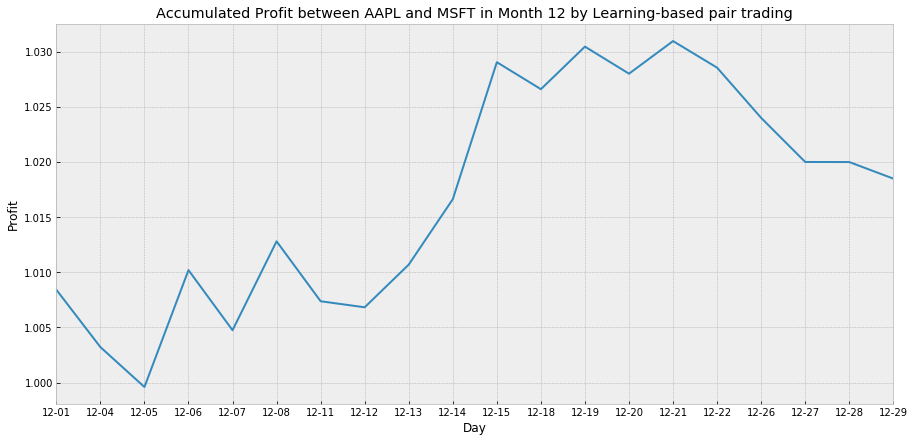

<Figure size 432x288 with 0 Axes>

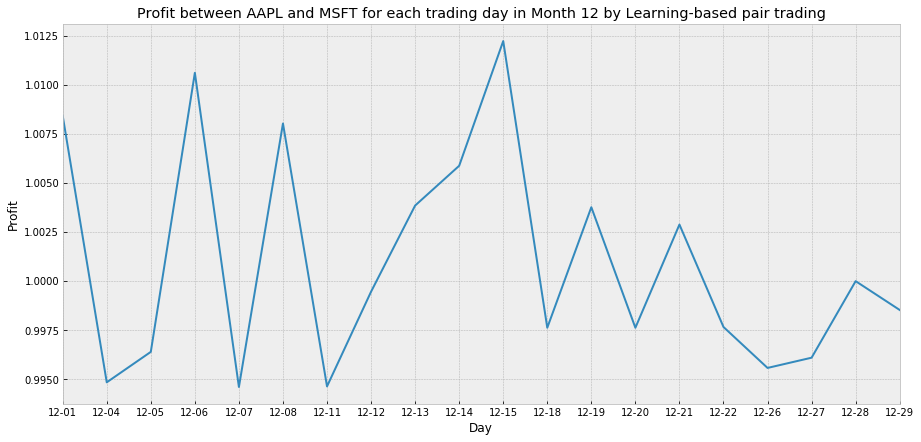

In [127]:
draw_profit(profit_day_NN, date_test_noyear, period_test, mode = 'Learning-based', profit_Mode = profit_Mode)

In [128]:
predict_result

{1: (array([1, 3, 3, 3, 3, 3, 3, 3, 1, 1, 3, 3, 1, 3, 3, 1, 3, 1, 3, 1, 3, 3,
         3, 3, 1, 1, 1, 3, 3, 3, 1, 3, 3, 3, 3, 3, 1, 1, 3, 1, 3, 1, 3, 3,
         1, 3, 1, 1, 3, 1, 1, 1, 1, 3, 3, 3, 3, 1, 3, 1, 3, 3, 1, 3, 3, 1,
         3, 1, 3, 1, 3, 1, 3, 1, 3, 3, 1, 1, 3, 3, 3, 1, 1, 1, 1, 1, 3, 1,
         1, 3, 3, 1, 3, 1, 1, 1, 3, 3, 1, 1, 1, 1, 1, 1, 3, 3, 3, 3, 1, 1,
         3, 3, 3, 1, 1, 1, 0, 1, 3, 1, 1, 1, 3, 1, 1, 1, 1, 1, 3, 1, 3, 1,
         1, 1, 3, 3, 2, 1, 1, 1, 1, 0, 1, 1, 1, 1, 2, 3, 3, 1, 3, 3, 1, 1]),
  array([2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
         2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 2, 2,
         2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
         2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
         2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
         2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
         2, 2, 2, 2,

In [129]:
profit_day_NN

[1.0084147801381007,
 0.994841079175028,
 0.9963924547543145,
 1.010604690984155,
 0.9946028939355493,
 1.0080240919546926,
 0.9946333702265913,
 0.9994575119952068,
 1.0038433201646653,
 1.005869281268635,
 1.0122199591131915,
 0.9976213425141627,
 1.0037585380340643,
 0.9976199701420775,
 1.0028757331784675,
 0.9976597702514123,
 0.9955741824333152,
 0.9960959335119852,
 0.9999936116011345,
 0.9985264073987802]

1.0184888870320261


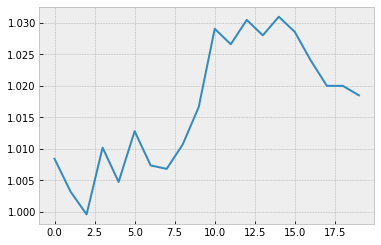

In [131]:
# profit rate
print(np.cumprod(profit_day_NN)[-1])
plt.plot(np.cumprod(profit_day_NN))

# training回測

[Day 1]
v_test shape for day 1 : (154, 29, 299)
v_test shape for day 1 : (154, 29, 299)
v_test shape for day 1 : (154, 29, 299)
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
---------[Time = 300 to 450]---------
Current profit :   profit -  1
[Pairwise Price Change Reverse and Strength1 < Strength2]
[Sell AAPL and Buy MSFT] profit 1 | price ratios 2.1758436944937833 | C1 -1 pos | C2 2.1758436944937833 pos
AAPL price - 153.125 revenue - 153.125 | MSFT price - 70.375 payment - 153.125 |
[Exit position] profit 0.9976153436567446 | price ratios 2.1758436944937833 | C1 1 pos | C2 -2.1758436944937833 pos
AAPL price - 153.0, earn : 153.0 | MSFT price - 70.5625, earn : -153.53297069271758 |
---------[Time = 450 to 600]---------
Current profit :   profit -  0.9976153436567446
[Pairwise Price Change Reverse and Strength1 < Strength2]
[Sell AAPL and Buy MSFT] profit 0.9976153436567446 | price ratios 2.16829052258636 | C1

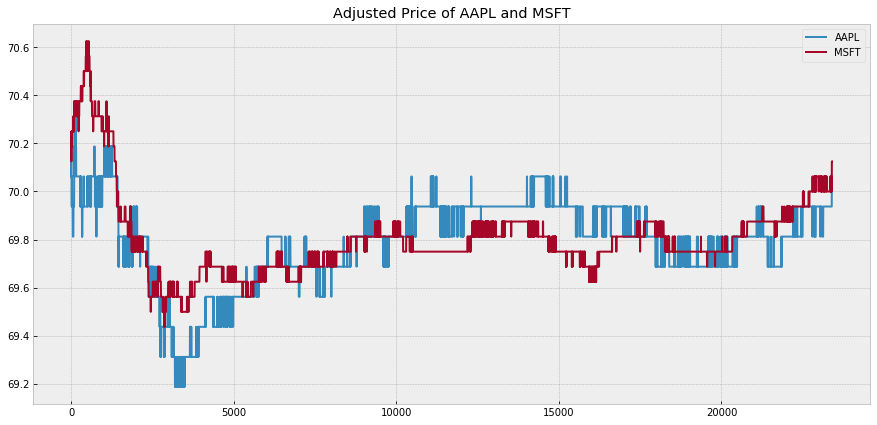

Plot z-score and trading signal of price ratio of AAPL and MSFT


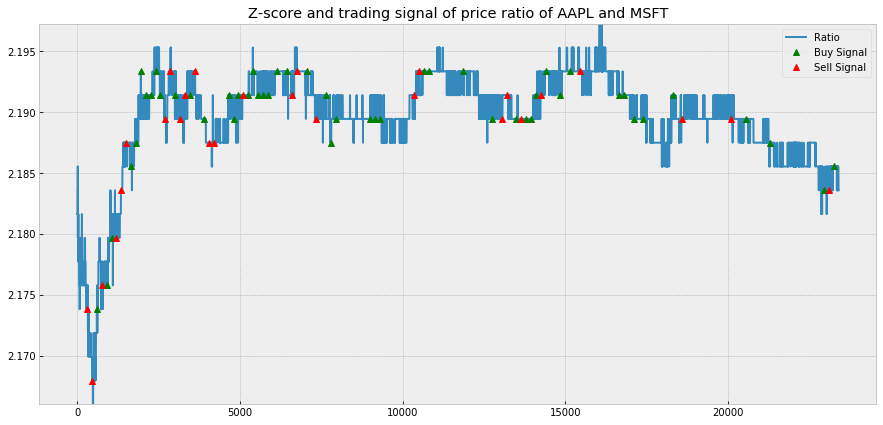

Trading signal of AAPL and MSFT for learning-based pair trading


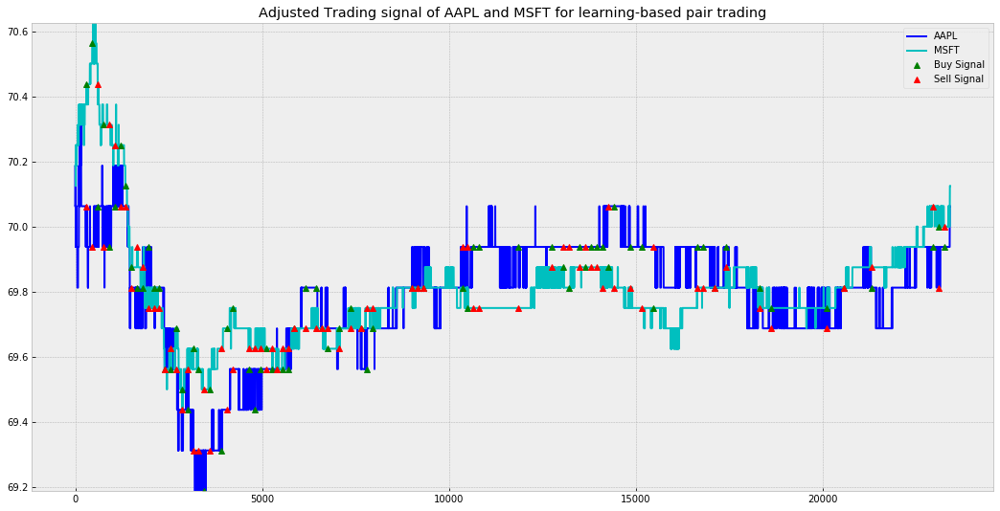

[Day 2]
v_test shape for day 2 : (154, 29, 299)
v_test shape for day 2 : (154, 29, 299)
v_test shape for day 2 : (154, 29, 299)
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
---------[Time = 300 to 450]---------
Current profit :   profit -  1
[Pairwise Price Change BothRise and Volatility1 > Volatility2]
[Buy AAPL and Sell MSFT] profit 1 | price ratios 2.175531914893617 | C1 1 pos | C2 -2.175531914893617 pos
AAPL price - 153.375 payment - 153.375 | MSFT price - 70.5 revenue - 153.375 |
[Exit position] profit 1.0005583472920156 | price ratios 2.175531914893617 | C1 -1 pos | C2 2.175531914893617 pos
AAPL price - 153.25, earn : -153.25 | MSFT price - 70.5, earn : 153.375 |
---------[Time = 450 to 600]---------
Current profit :   profit -  1.0005583472920156
[Pairwise Price Change BothRise and Volatility1 > Volatility2]
[Buy AAPL and Sell MSFT] profit 1.0005583472920156 | price ratios 2.173758865248227 | C1 1 pos 

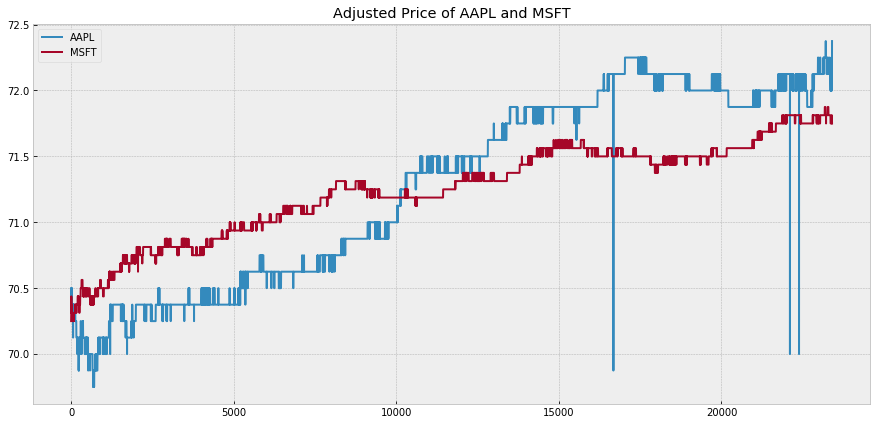

Plot z-score and trading signal of price ratio of AAPL and MSFT


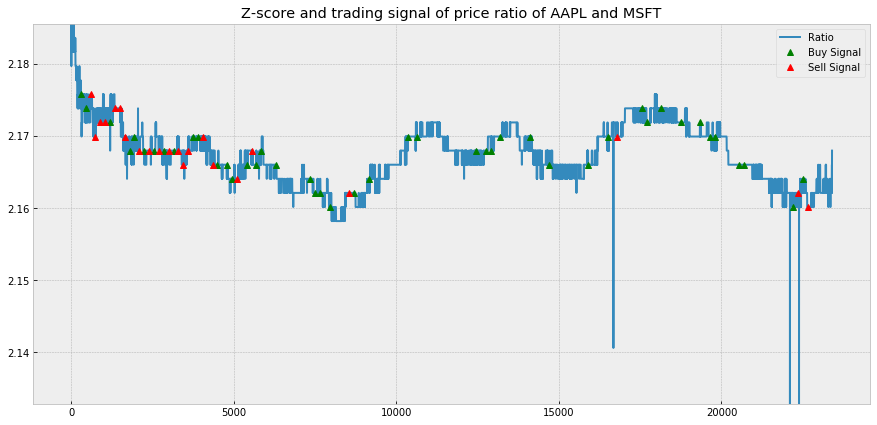

Trading signal of AAPL and MSFT for learning-based pair trading


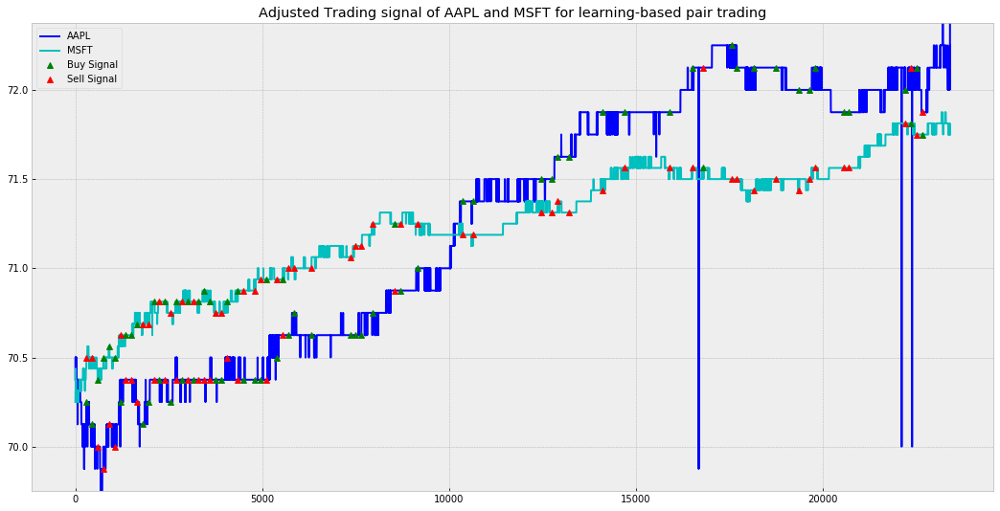

[Day 3]
v_test shape for day 3 : (154, 29, 299)
v_test shape for day 3 : (154, 29, 299)
v_test shape for day 3 : (154, 29, 299)
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
---------[Time = 300 to 450]---------
Current profit :   profit -  1
[Pairwise Price Change Reverse and Strength1 < Strength2]
[Sell AAPL and Buy MSFT] profit 1 | price ratios 2.131830008673027 | C1 -1 pos | C2 2.131830008673027 pos
AAPL price - 153.625 revenue - 153.625 | MSFT price - 72.0625 payment - 153.625 |
[Exit position] profit 1.0011442342865335 | price ratios 2.131830008673027 | C1 1 pos | C2 -2.131830008673027 pos
AAPL price - 153.75, earn : 153.75 | MSFT price - 72.0, earn : -153.49176062445795 |
---------[Time = 450 to 600]---------
Current profit :   profit -  1.0011442342865335
[Pairwise Price Change BothFall and Volatility1 > Volatility2]
[Sell AAPL and Buy MSFT] profit 1.0011442342865335 | price ratios 2.1354166666666665 |

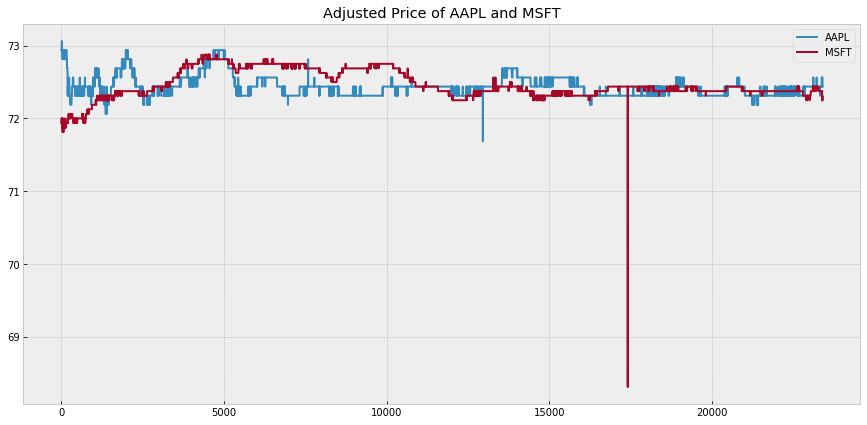

Plot z-score and trading signal of price ratio of AAPL and MSFT


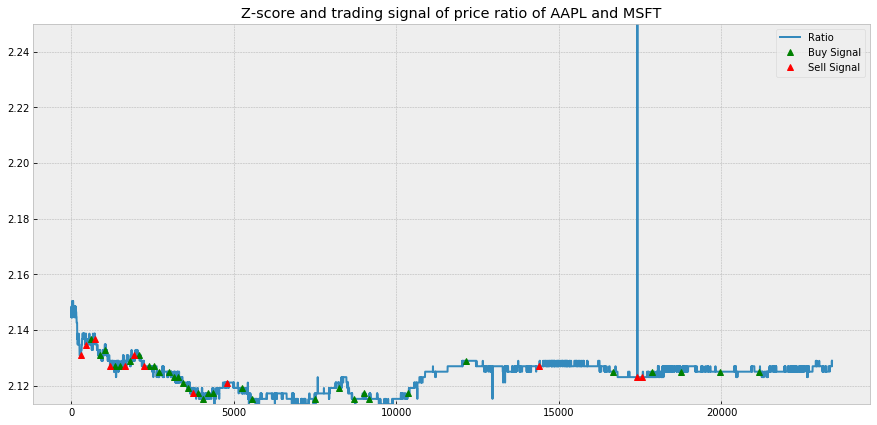

Trading signal of AAPL and MSFT for learning-based pair trading


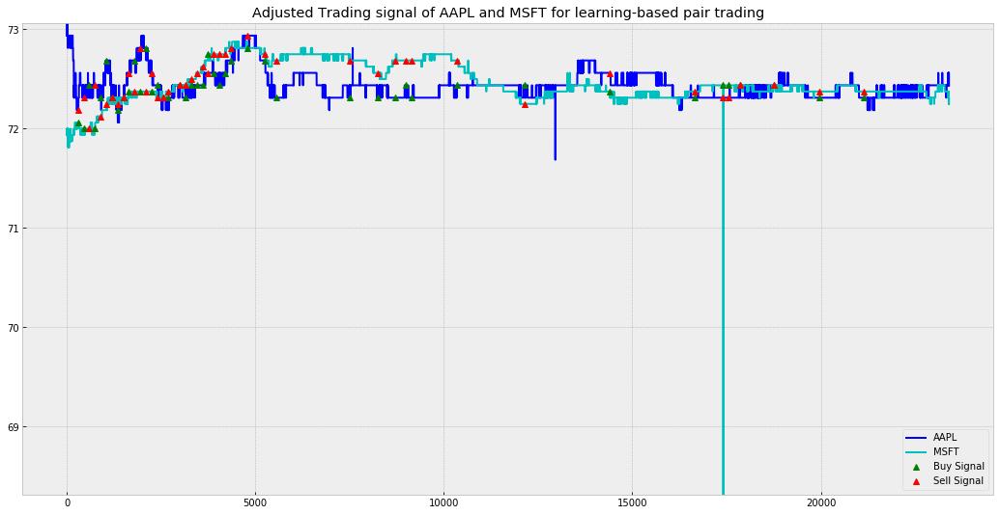

[Day 4]
v_test shape for day 4 : (154, 29, 299)
v_test shape for day 4 : (154, 29, 299)
v_test shape for day 4 : (154, 29, 299)
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
---------[Time = 300 to 450]---------
Current profit :   profit -  1
[Pairwise Price Change BothRise and Volatility1 > Volatility2]
[Buy AAPL and Sell MSFT] profit 1 | price ratios 2.136560069144339 | C1 1 pos | C2 -2.136560069144339 pos
AAPL price - 154.5 payment - 154.5 | MSFT price - 72.3125 revenue - 154.5 |
[Exit position] profit 0.9994865142102907 | price ratios 2.136560069144339 | C1 -1 pos | C2 2.136560069144339 pos
AAPL price - 154.75, earn : -154.75 | MSFT price - 72.375, earn : 154.63353500432154 |
---------[Time = 450 to 600]---------
Current profit :   profit -  0.9994865142102907
[Pairwise Price Change BothRise and Volatility1 > Volatility2]
[Buy AAPL and Sell MSFT] profit 0.9994865142102907 | price ratios 2.1364421416234887 

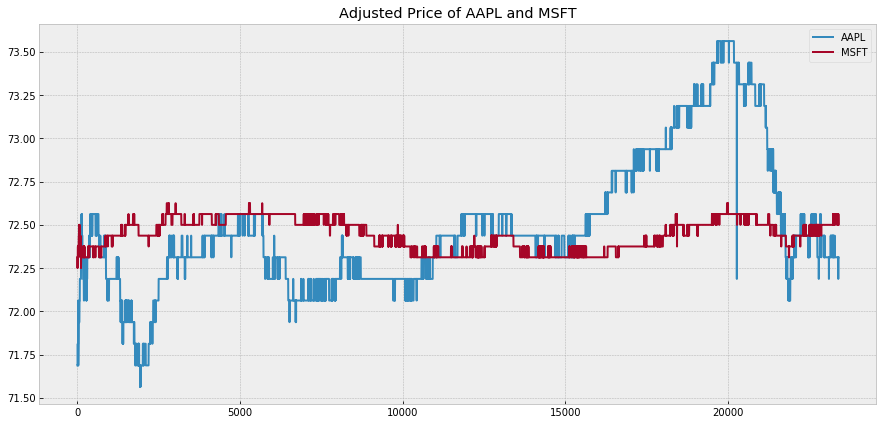

Plot z-score and trading signal of price ratio of AAPL and MSFT


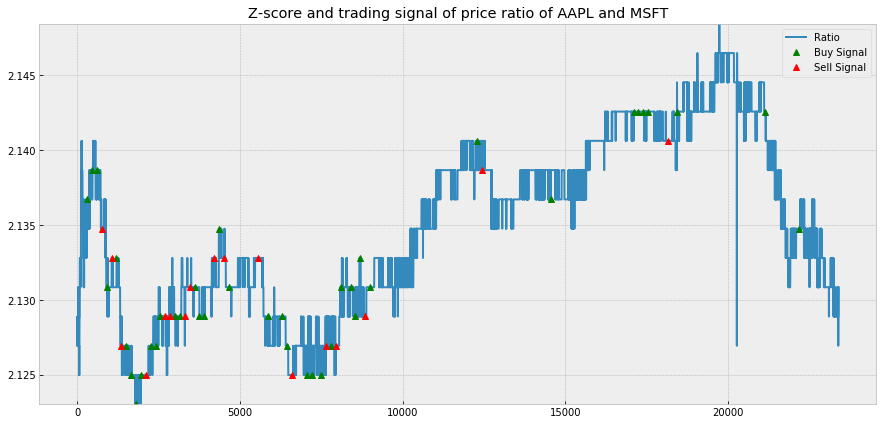

Trading signal of AAPL and MSFT for learning-based pair trading


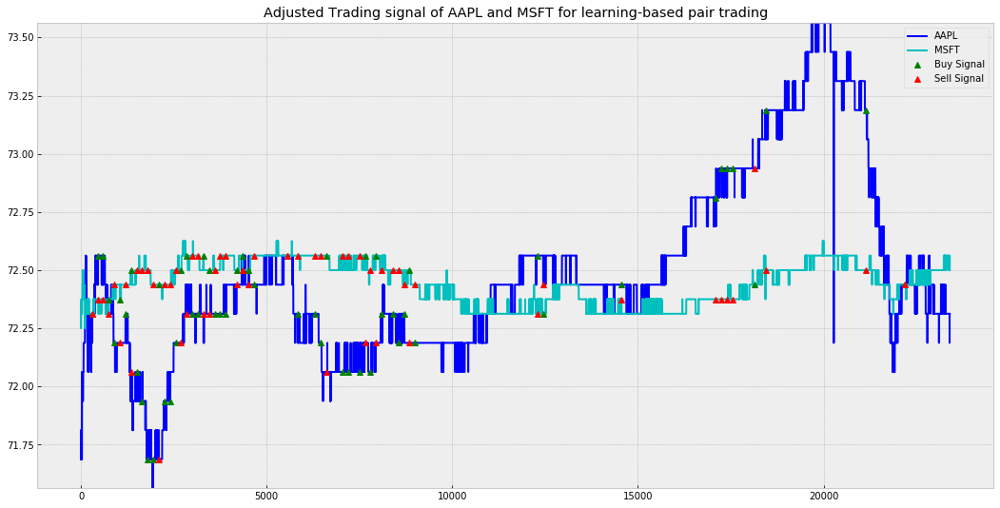

[Day 5]
v_test shape for day 5 : (154, 29, 299)
v_test shape for day 5 : (154, 29, 299)
v_test shape for day 5 : (154, 29, 299)
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
---------[Time = 300 to 450]---------
Current profit :   profit -  1
[Pairwise Price Change Reverse and Strength1 < Strength2]
[Sell AAPL and Buy MSFT] profit 1 | price ratios 2.13953488372093 | C1 -1 pos | C2 2.13953488372093 pos
AAPL price - 155.25 revenue - 155.25 | MSFT price - 72.5625 payment - 155.24999999999997 |
[Exit position] profit 0.9998851564743038 | price ratios 2.13953488372093 | C1 1 pos | C2 -2.13953488372093 pos
AAPL price - 155.625, earn : 155.625 | MSFT price - 72.75, earn : -155.65116279069767 |
---------[Time = 450 to 600]---------
Current profit :   profit -  0.9998851564743038
[Pairwise Price Change Reverse and Strength1 < Strength2]
[Sell AAPL and Buy MSFT] profit 0.9998851564743038 | price ratios 2.139175257731958

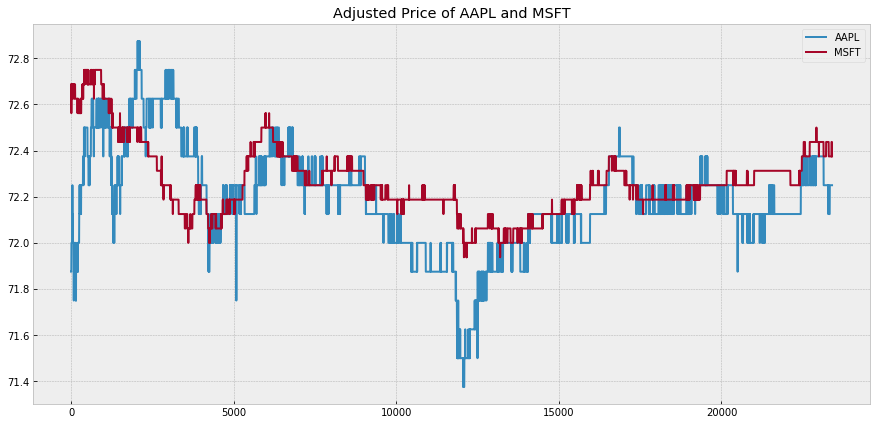

Plot z-score and trading signal of price ratio of AAPL and MSFT


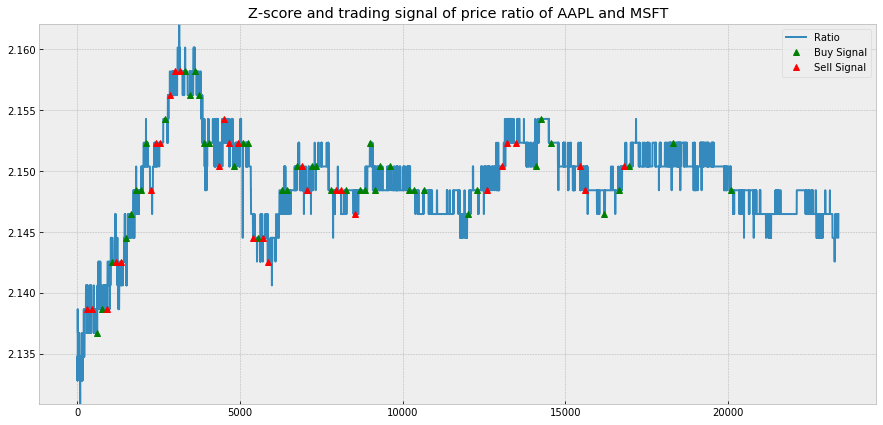

Trading signal of AAPL and MSFT for learning-based pair trading


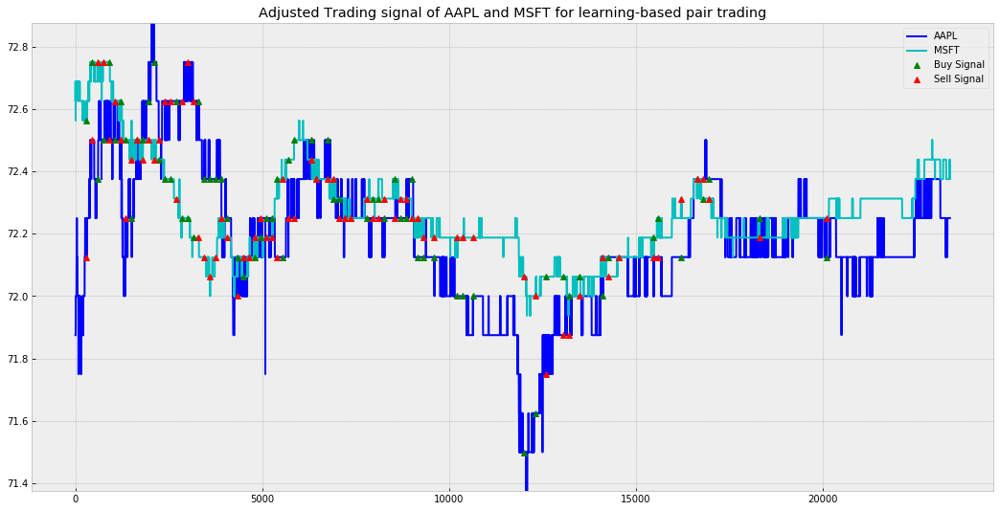

[Day 6]
v_test shape for day 6 : (154, 29, 299)
v_test shape for day 6 : (154, 29, 299)
v_test shape for day 6 : (154, 29, 299)
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
---------[Time = 300 to 450]---------
Current profit :   profit -  1
[Pairwise Price Change Reverse and Strength1 < Strength2]
[Sell AAPL and Buy MSFT] profit 1 | price ratios 2.1415012942191542 | C1 -1 pos | C2 2.1415012942191542 pos
AAPL price - 155.125 revenue - 155.125 | MSFT price - 72.4375 payment - 155.125 |
[Exit position] profit 1.001686762234062 | price ratios 2.1415012942191542 | C1 1 pos | C2 -2.1415012942191542 pos
AAPL price - 155.375, earn : 155.375 | MSFT price - 72.375, earn : -154.9911561691113 |
---------[Time = 450 to 600]---------
Current profit :   profit -  1.001686762234062
[Pairwise Price Change BothRise and Volatility1 > Volatility2]
[Buy AAPL and Sell MSFT] profit 1.001686762234062 | price ratios 2.14680483592400

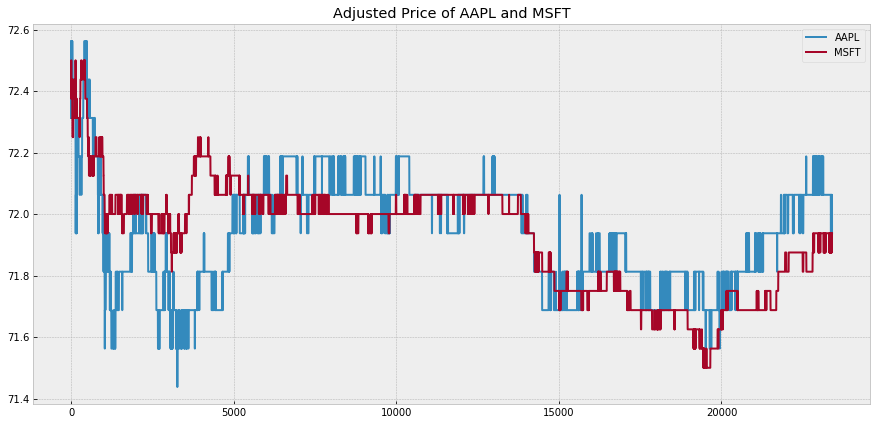

Plot z-score and trading signal of price ratio of AAPL and MSFT


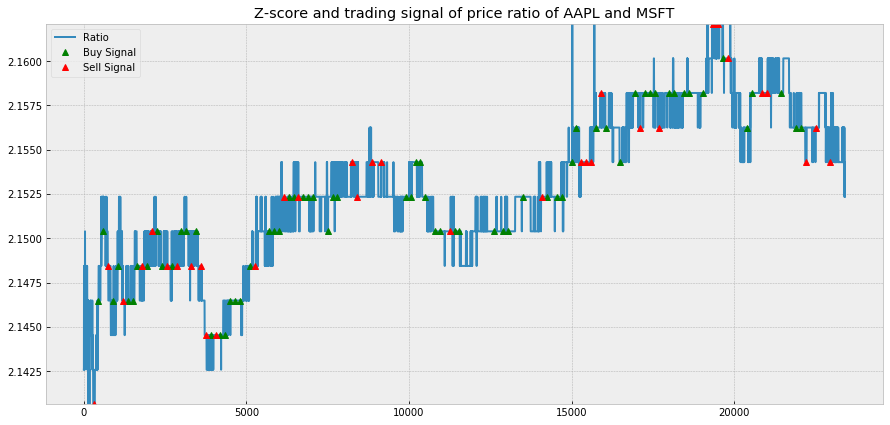

Trading signal of AAPL and MSFT for learning-based pair trading


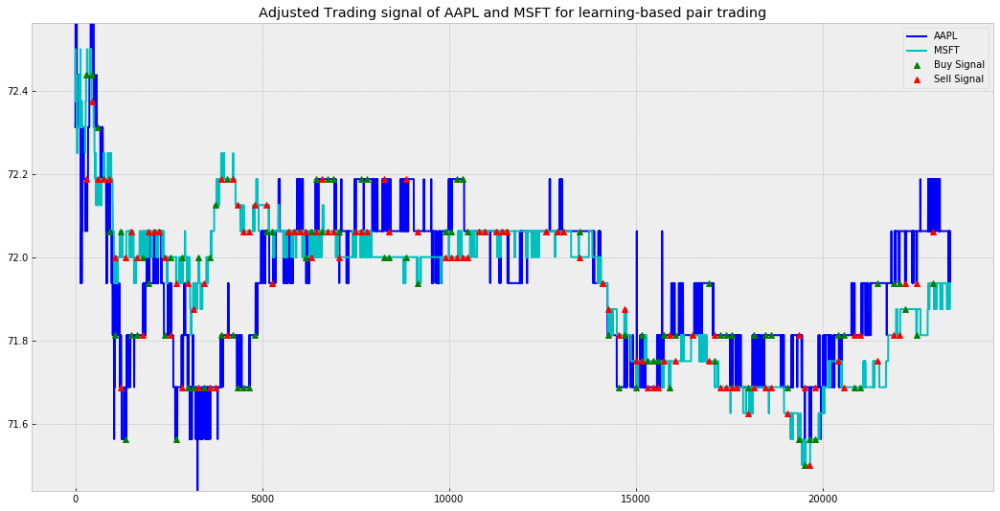

[Day 7]
v_test shape for day 7 : (154, 29, 299)
v_test shape for day 7 : (154, 29, 299)
v_test shape for day 7 : (154, 29, 299)
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
---------[Time = 300 to 450]---------
Current profit :   profit -  1
[Pairwise Price Change Reverse and Strength1 < Strength2]
[Sell AAPL and Buy MSFT] profit 1 | price ratios 2.154782608695652 | C1 -1 pos | C2 2.154782608695652 pos
AAPL price - 154.875 revenue - 154.875 | MSFT price - 71.875 payment - 154.875 |
[Exit position] profit 1.0006792579454484 | price ratios 2.154782608695652 | C1 1 pos | C2 -2.154782608695652 pos
AAPL price - 154.625, earn : 154.625 | MSFT price - 71.6875, earn : -154.47097826086957 |
---------[Time = 450 to 600]---------
Current profit :   profit -  1.0006792579454484
[Pairwise Price Change BothRise and Volatility1 > Volatility2]
[Buy AAPL and Sell MSFT] profit 1.0006792579454484 | price ratios 2.15693112467306

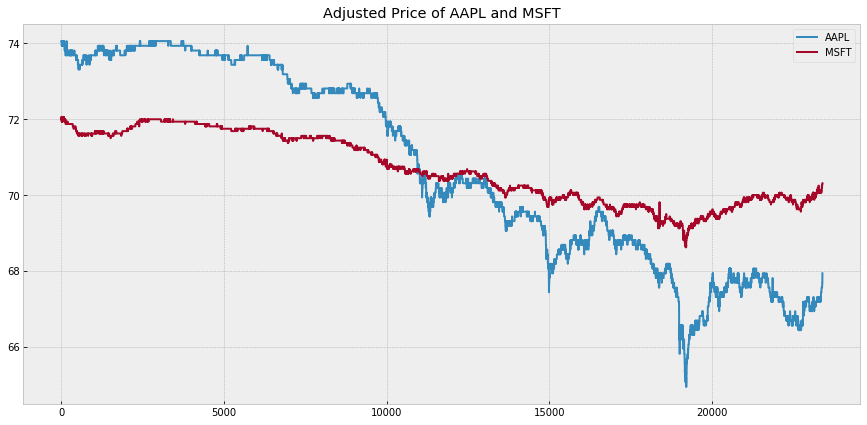

Plot z-score and trading signal of price ratio of AAPL and MSFT


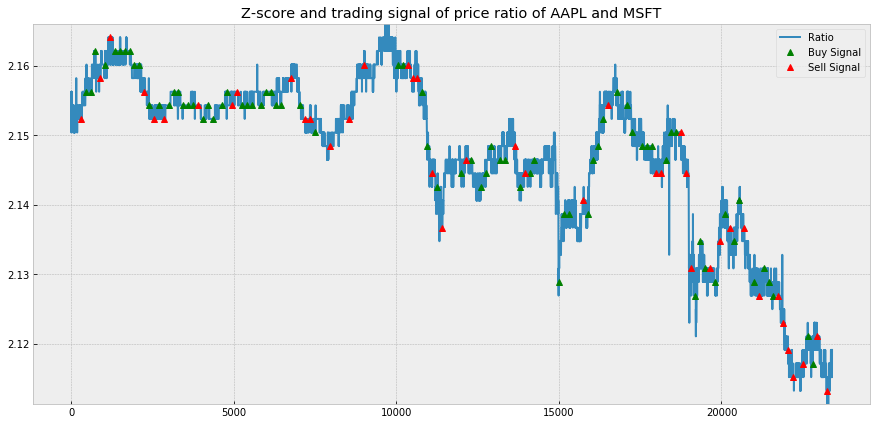

Trading signal of AAPL and MSFT for learning-based pair trading


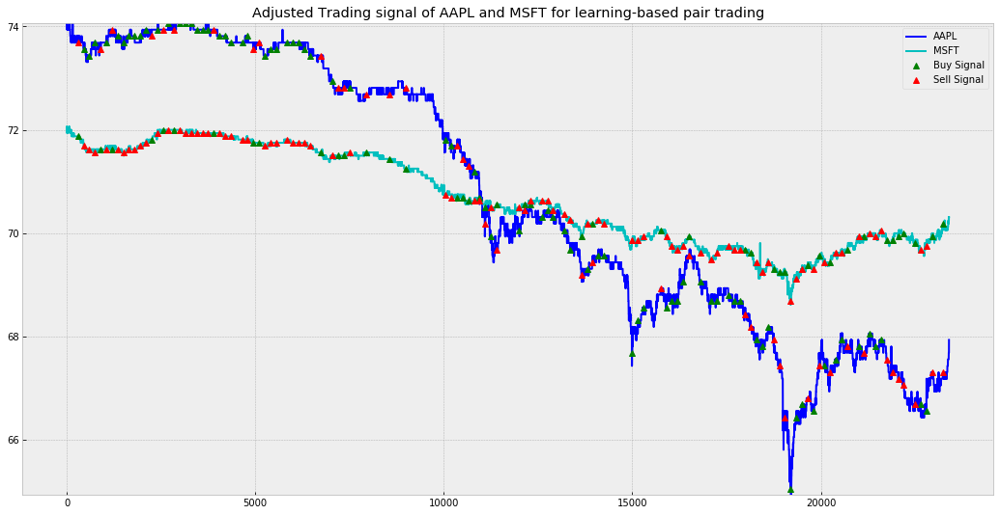

[Day 8]
v_test shape for day 8 : (154, 29, 299)
v_test shape for day 8 : (154, 29, 299)
v_test shape for day 8 : (154, 29, 299)
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
---------[Time = 300 to 450]---------
Current profit :   profit -  1
[Pairwise Price Change BothRise and Volatility1 > Volatility2]
[Buy AAPL and Sell MSFT] profit 1 | price ratios 2.083032490974729 | C1 1 pos | C2 -2.083032490974729 pos
AAPL price - 144.25 payment - 144.25 | MSFT price - 69.25 revenue - 144.25 |
[Exit position] profit 1.0005125592877855 | price ratios 2.083032490974729 | C1 -1 pos | C2 2.083032490974729 pos
AAPL price - 143.75, earn : -143.75 | MSFT price - 69.0625, earn : 143.85943140794222 |
---------[Time = 450 to 600]---------
Current profit :   profit -  1.0005125592877855
[Pairwise Price Change Reverse and Strength1 < Strength2]
[Sell AAPL and Buy MSFT] profit 1.0005125592877855 | price ratios 2.077757685352622 | C1

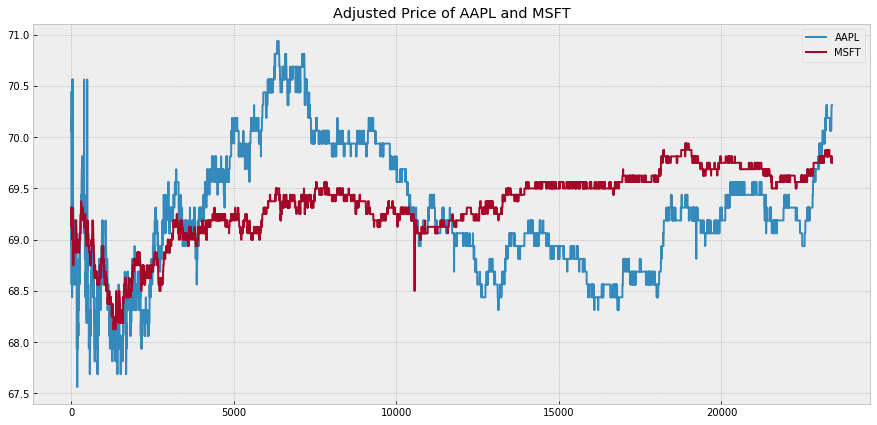

Plot z-score and trading signal of price ratio of AAPL and MSFT


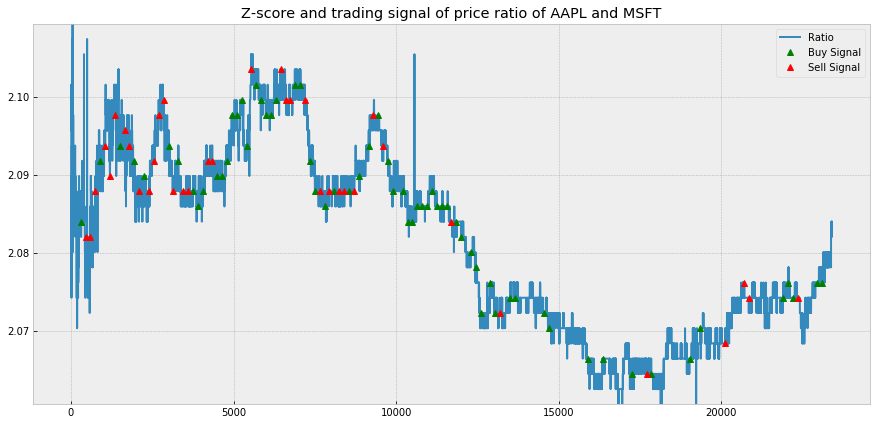

Trading signal of AAPL and MSFT for learning-based pair trading


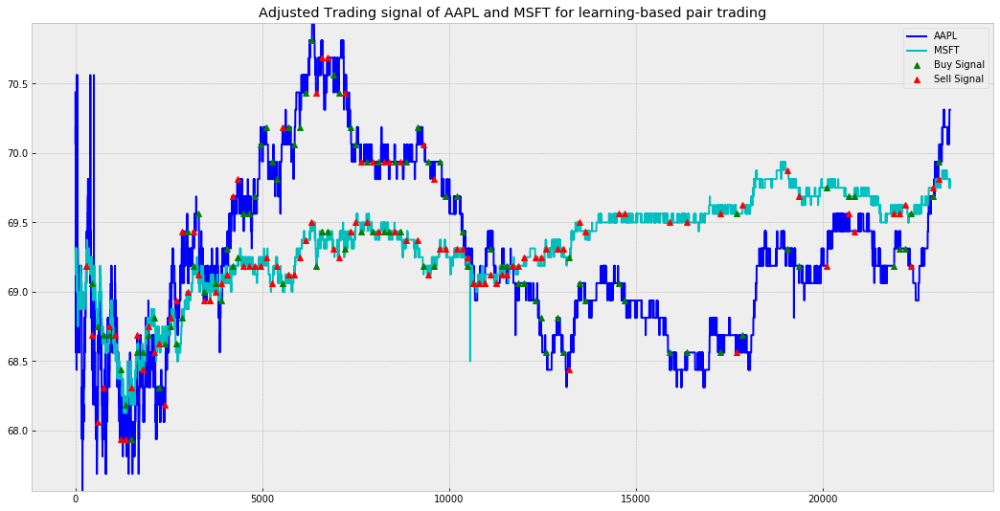

[Day 9]
v_test shape for day 9 : (154, 29, 299)
v_test shape for day 9 : (154, 29, 299)
v_test shape for day 9 : (154, 29, 299)
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
---------[Time = 300 to 450]---------
Current profit :   profit -  1
[Pairwise Price Change Reverse and Strength1 < Strength2]
[Sell AAPL and Buy MSFT] profit 1 | price ratios 2.0853333333333333 | C1 -1 pos | C2 2.0853333333333333 pos
AAPL price - 146.625 revenue - 146.625 | MSFT price - 70.3125 payment - 146.625 |
[Exit position] profit 0.9981976375684242 | price ratios 2.0853333333333333 | C1 1 pos | C2 -2.0853333333333333 pos
AAPL price - 146.625, earn : 146.625 | MSFT price - 70.5, earn : -147.016 |
---------[Time = 450 to 600]---------
Current profit :   profit -  0.9981976375684242
[Pairwise Price Change Reverse and Strength1 < Strength2]
[Sell AAPL and Buy MSFT] profit 0.9981976375684242 | price ratios 2.0797872340425534 | C1 -1 pos

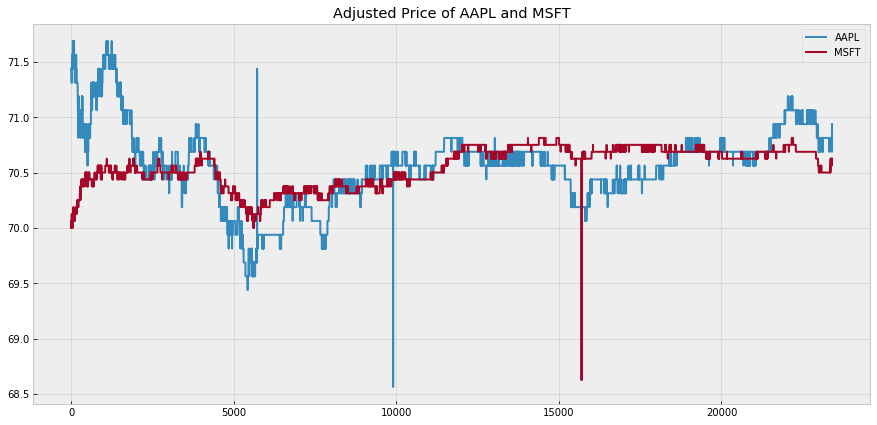

Plot z-score and trading signal of price ratio of AAPL and MSFT


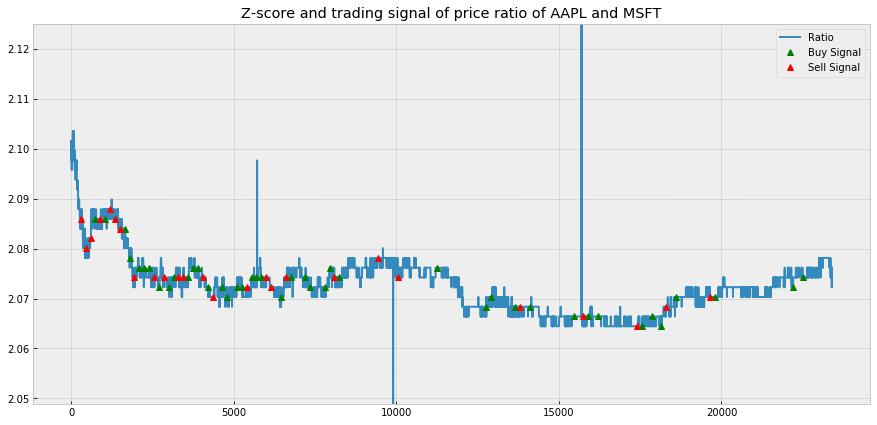

Trading signal of AAPL and MSFT for learning-based pair trading


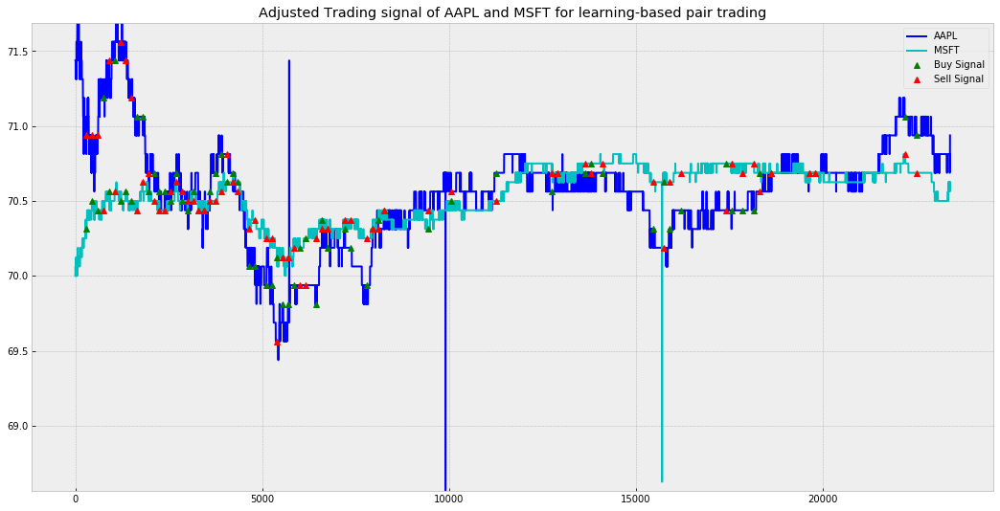

[Day 10]
v_test shape for day 10 : (154, 29, 299)
v_test shape for day 10 : (154, 29, 299)
v_test shape for day 10 : (154, 29, 299)
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
---------[Time = 300 to 450]---------
Current profit :   profit -  1
[Pairwise Price Change Reverse and Strength1 < Strength2]
[Sell AAPL and Buy MSFT] profit 1 | price ratios 2.0704845814977975 | C1 -1 pos | C2 2.0704845814977975 pos
AAPL price - 146.875 revenue - 146.875 | MSFT price - 70.9375 payment - 146.875 |
[Exit position] profit 0.9982581105935443 | price ratios 2.0704845814977975 | C1 1 pos | C2 -2.0704845814977975 pos
AAPL price - 146.625, earn : 146.625 | MSFT price - 71.0, earn : -147.00440528634363 |
---------[Time = 450 to 600]---------
Current profit :   profit -  0.9982581105935443
[Pairwise Price Change Reverse and Strength1 < Strength2]
[Sell AAPL and Buy MSFT] profit 0.9982581105935443 | price ratios 2.0651408450704

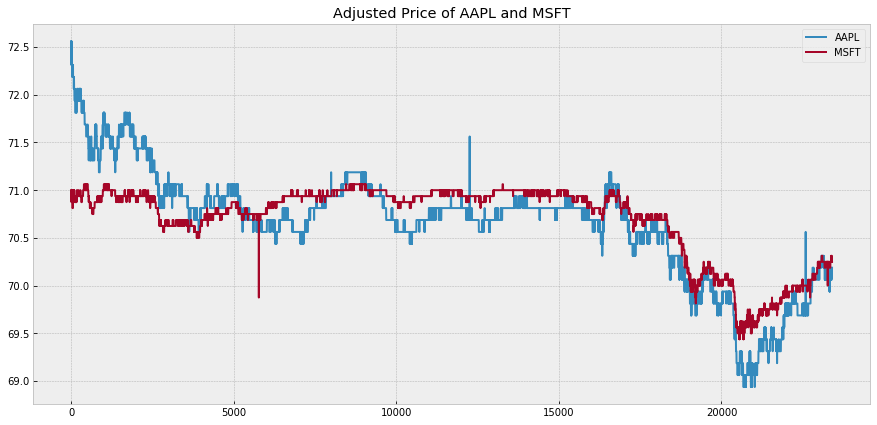

Plot z-score and trading signal of price ratio of AAPL and MSFT


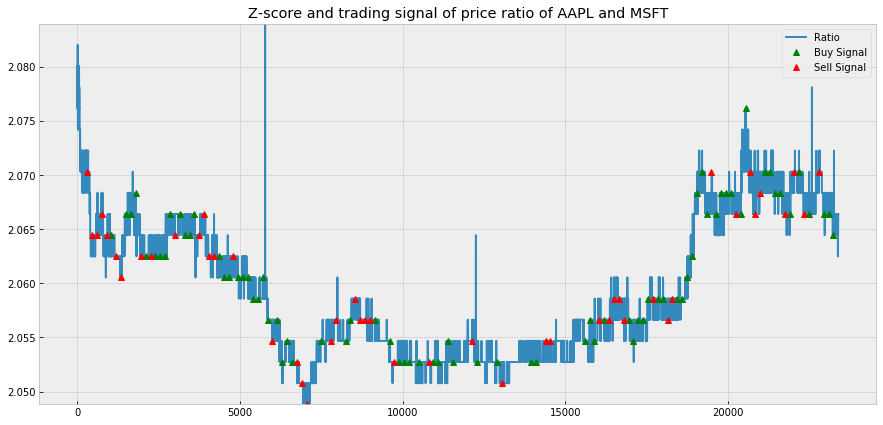

Trading signal of AAPL and MSFT for learning-based pair trading


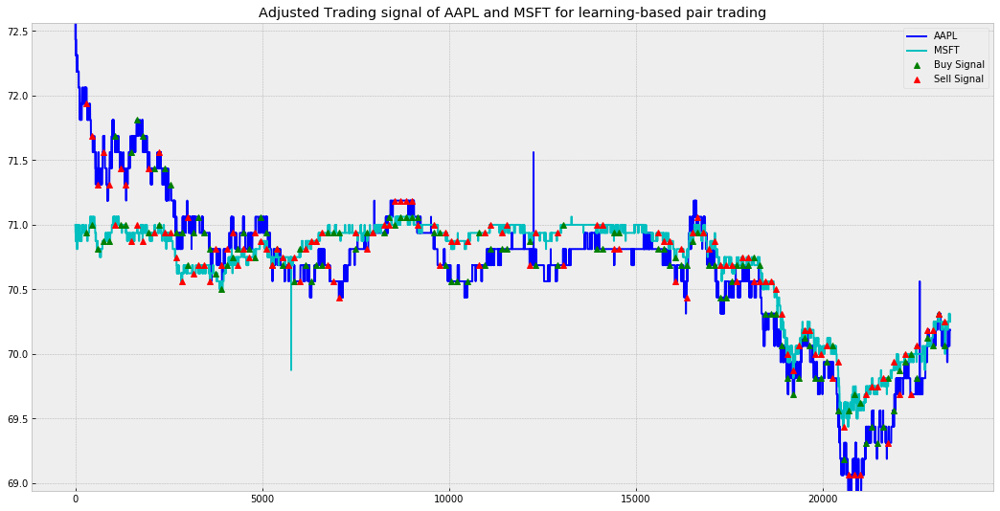

[Day 11]
v_test shape for day 11 : (154, 29, 299)
v_test shape for day 11 : (154, 29, 299)
v_test shape for day 11 : (154, 29, 299)
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
---------[Time = 300 to 450]---------
Current profit :   profit -  1
[Pairwise Price Change Reverse and Strength1 < Strength2]
[Sell AAPL and Buy MSFT] profit 1 | price ratios 2.07020702070207 | C1 -1 pos | C2 2.07020702070207 pos
AAPL price - 143.75 revenue - 143.75 | MSFT price - 69.4375 payment - 143.75 |
[Exit position] profit 0.9999794174668126 | price ratios 2.07020702070207 | C1 1 pos | C2 -2.07020702070207 pos
AAPL price - 143.875, earn : 143.875 | MSFT price - 69.5, earn : -143.87938793879388 |
---------[Time = 450 to 600]---------
Current profit :   profit -  0.9999794174668126
[Pairwise Price Change Reverse and Strength1 < Strength2]
[Sell AAPL and Buy MSFT] profit 0.9999794174668126 | price ratios 2.070143884892086 | C1 -1 

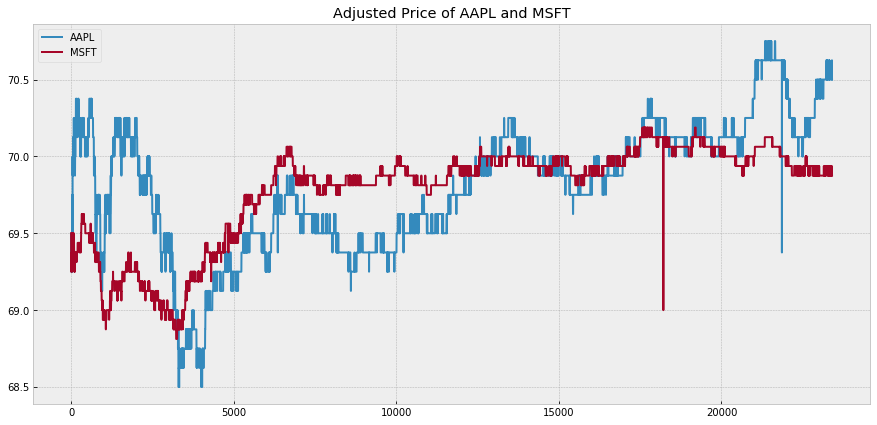

Plot z-score and trading signal of price ratio of AAPL and MSFT


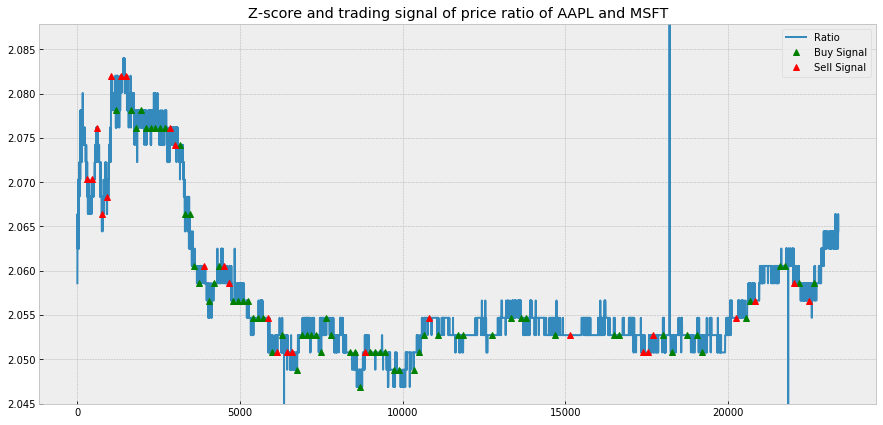

Trading signal of AAPL and MSFT for learning-based pair trading


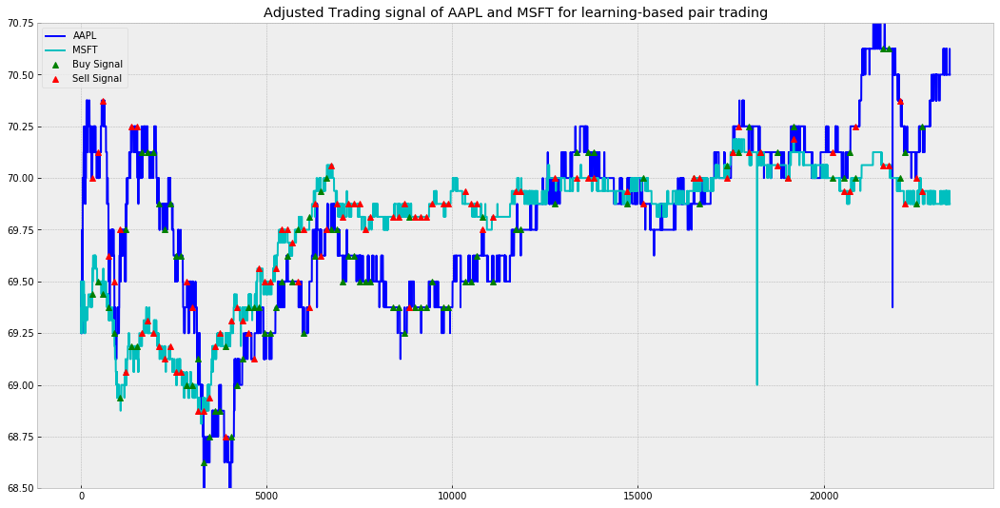

[Day 12]
v_test shape for day 12 : (154, 29, 299)
v_test shape for day 12 : (154, 29, 299)
v_test shape for day 12 : (154, 29, 299)
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
---------[Time = 300 to 450]---------
Current profit :   profit -  1
[Pairwise Price Change Reverse and Strength1 < Strength2]
[Sell AAPL and Buy MSFT] profit 1 | price ratios 2.0646900269541777 | C1 -1 pos | C2 2.0646900269541777 pos
AAPL price - 143.625 revenue - 143.625 | MSFT price - 69.5625 payment - 143.62499999999997 |
[Exit position] profit 0.9993946965620187 | price ratios 2.0646900269541777 | C1 1 pos | C2 -2.0646900269541777 pos
AAPL price - 143.625, earn : 143.625 | MSFT price - 69.625, earn : -143.75404312668462 |
---------[Time = 450 to 600]---------
Current profit :   profit -  0.9993946965620187
[Pairwise Price Change Reverse and Strength1 < Strength2]
[Sell AAPL and Buy MSFT] profit 0.9993946965620187 | price ratios 2.

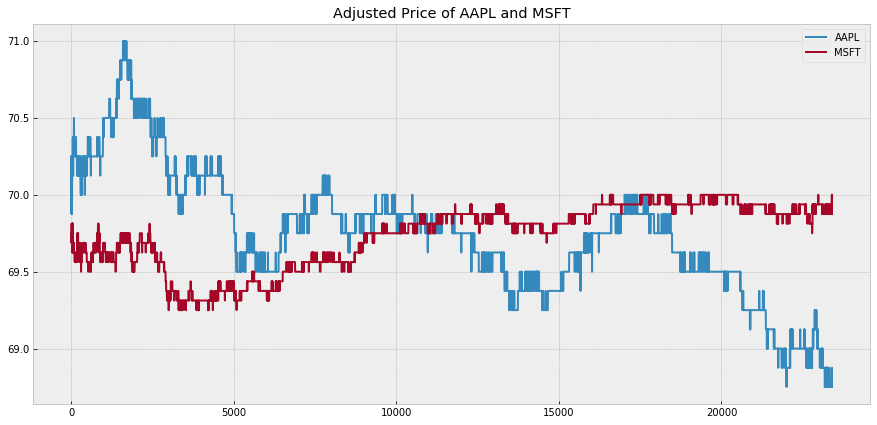

Plot z-score and trading signal of price ratio of AAPL and MSFT


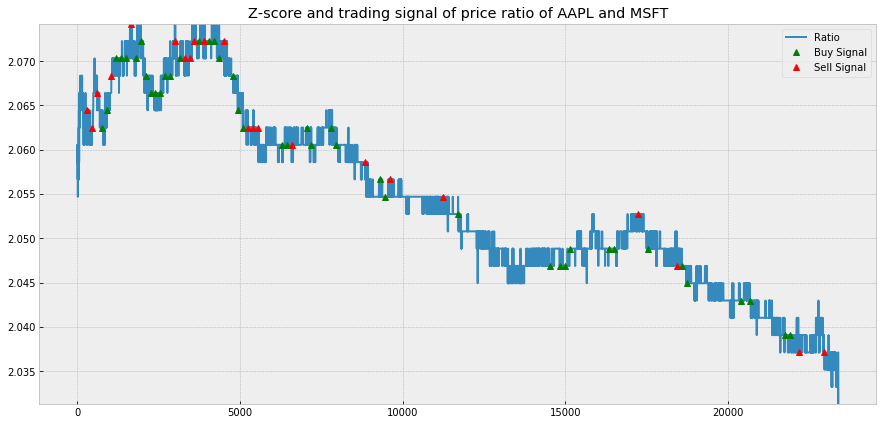

Trading signal of AAPL and MSFT for learning-based pair trading


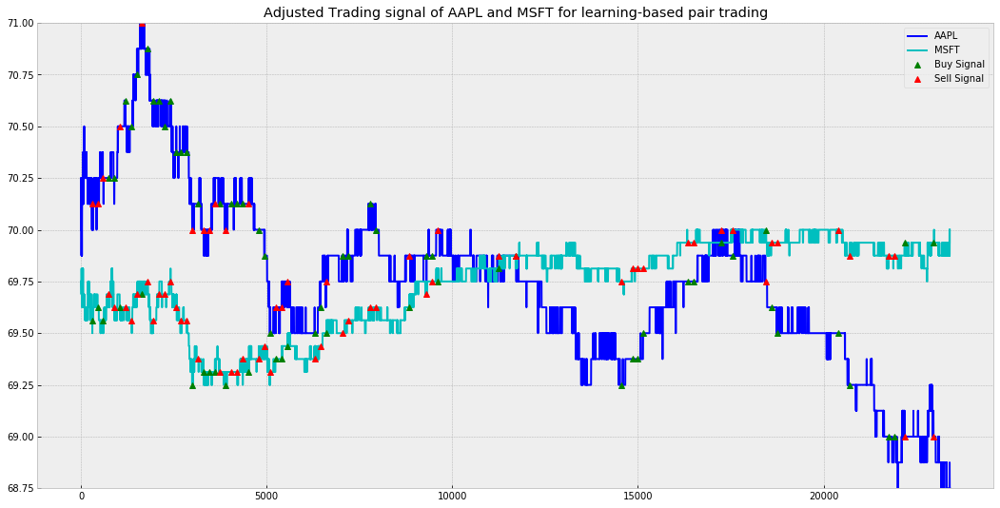

[Day 13]
v_test shape for day 13 : (154, 29, 299)
v_test shape for day 13 : (154, 29, 299)
v_test shape for day 13 : (154, 29, 299)
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
---------[Time = 300 to 450]---------
Current profit :   profit -  1
[Pairwise Price Change Reverse and Strength1 < Strength2]
[Sell AAPL and Buy MSFT] profit 1 | price ratios 2.038938053097345 | C1 -1 pos | C2 2.038938053097345 pos
AAPL price - 144.0 revenue - 144.0 | MSFT price - 70.625 payment - 144.0 |
[Exit position] profit 1.0011421444070487 | price ratios 2.038938053097345 | C1 1 pos | C2 -2.038938053097345 pos
AAPL price - 144.5, earn : 144.5 | MSFT price - 70.75, earn : -144.25486725663717 |
---------[Time = 450 to 600]---------
Current profit :   profit -  1.0011421444070487
[Pairwise Price Change BothRise and Volatility1 > Volatility2]
[Buy AAPL and Sell MSFT] profit 1.0011421444070487 | price ratios 2.0424028268551235 | C1 

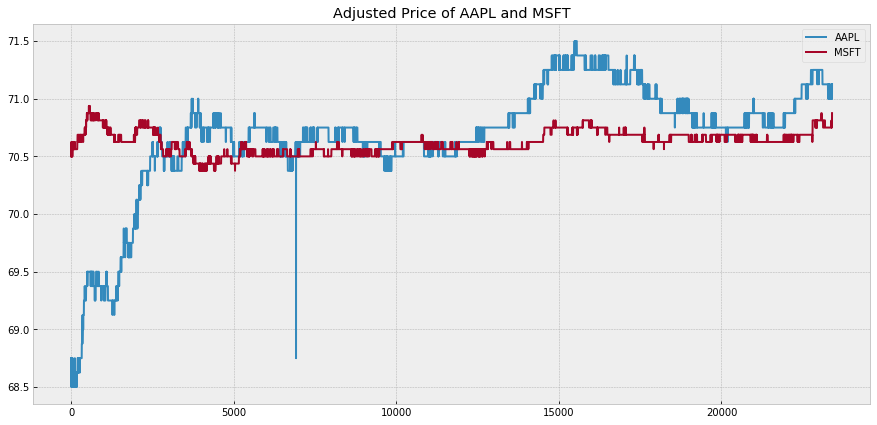

Plot z-score and trading signal of price ratio of AAPL and MSFT


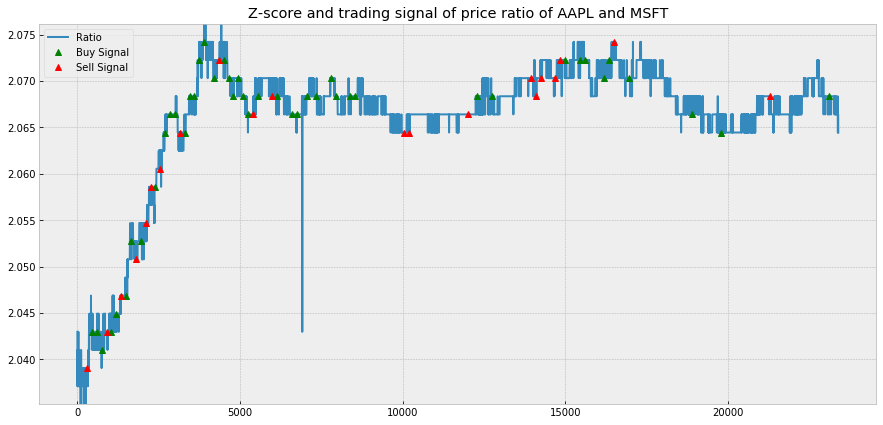

Trading signal of AAPL and MSFT for learning-based pair trading


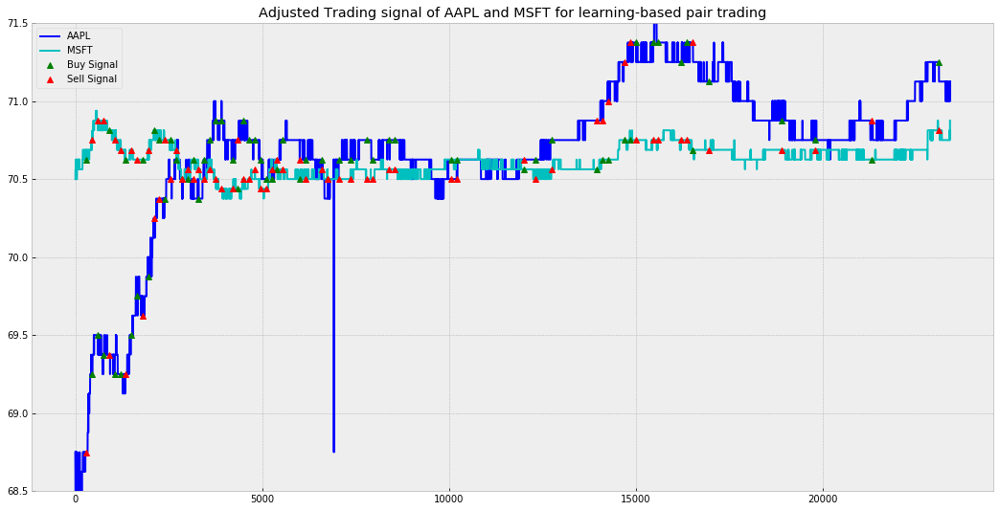

[Day 14]
v_test shape for day 14 : (154, 29, 299)
v_test shape for day 14 : (154, 29, 299)
v_test shape for day 14 : (154, 29, 299)
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
---------[Time = 300 to 450]---------
Current profit :   profit -  1
[Pairwise Price Change BothRise and Volatility1 > Volatility2]
[Buy AAPL and Sell MSFT] profit 1 | price ratios 2.0673758865248226 | C1 1 pos | C2 -2.0673758865248226 pos
AAPL price - 145.75 payment - 145.75 | MSFT price - 70.5 revenue - 145.75 |
[Exit position] profit 1.0011755421637354 | price ratios 2.0673758865248226 | C1 -1 pos | C2 2.0673758865248226 pos
AAPL price - 145.625, earn : -145.625 | MSFT price - 70.5625, earn : 145.8792109929078 |
---------[Time = 450 to 600]---------
Current profit :   profit -  1.0011755421637354
[Pairwise Price Change Reverse and Strength1 < Strength2]
[Sell AAPL and Buy MSFT] profit 1.0011755421637354 | price ratios 2.063773250664

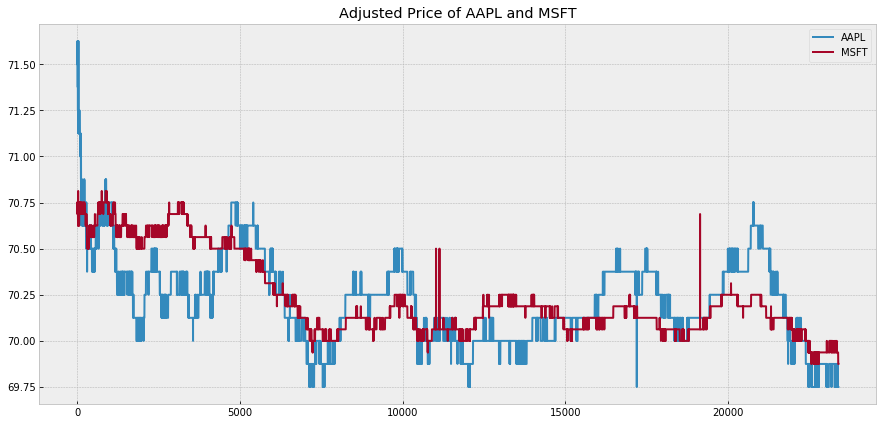

Plot z-score and trading signal of price ratio of AAPL and MSFT


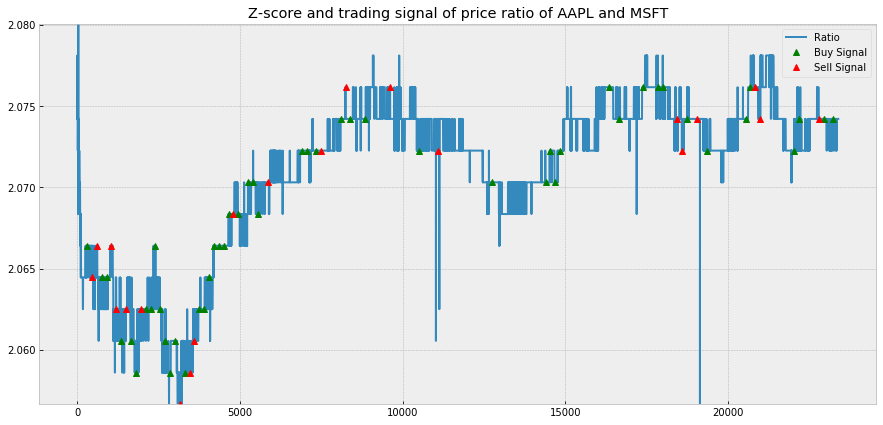

Trading signal of AAPL and MSFT for learning-based pair trading


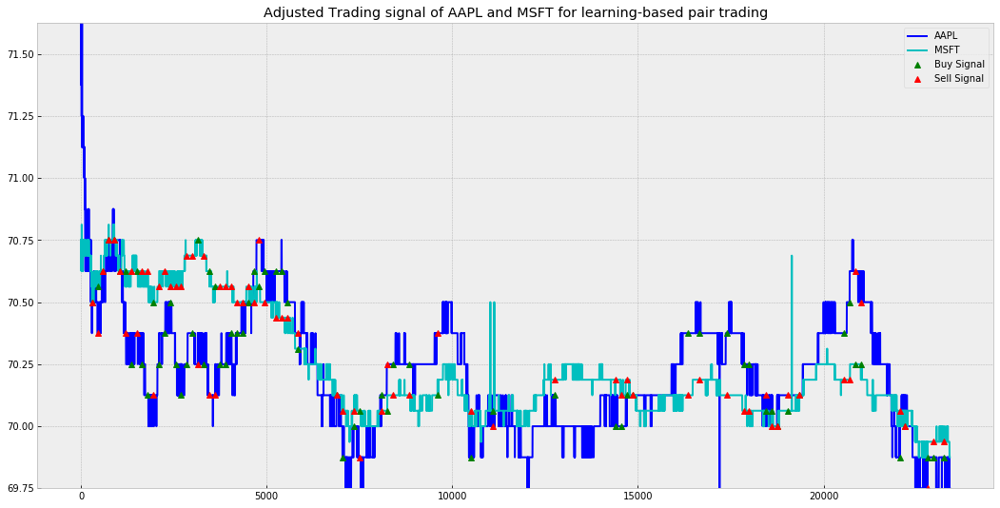

[Day 15]
v_test shape for day 15 : (154, 29, 299)
v_test shape for day 15 : (154, 29, 299)
v_test shape for day 15 : (154, 29, 299)
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
---------[Time = 300 to 450]---------
Current profit :   profit -  1
[Pairwise Price Change Reverse and Strength1 < Strength2]
[Sell AAPL and Buy MSFT] profit 1 | price ratios 2.0712377560106856 | C1 -1 pos | C2 2.0712377560106856 pos
AAPL price - 145.375 revenue - 145.375 | MSFT price - 70.1875 payment - 145.375 |
[Exit position] profit 0.9982397107115074 | price ratios 2.0712377560106856 | C1 1 pos | C2 -2.0712377560106856 pos
AAPL price - 145.125, earn : 145.125 | MSFT price - 70.25, earn : -145.50445235975067 |
---------[Time = 450 to 600]---------
Current profit :   profit -  0.9982397107115074
[Pairwise Price Change Reverse and Strength1 < Strength2]
[Sell AAPL and Buy MSFT] profit 0.9982397107115074 | price ratios 2.065836298932

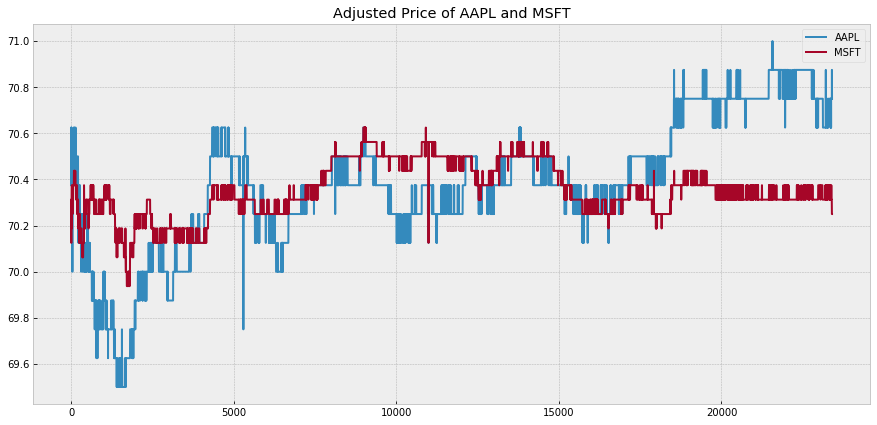

Plot z-score and trading signal of price ratio of AAPL and MSFT


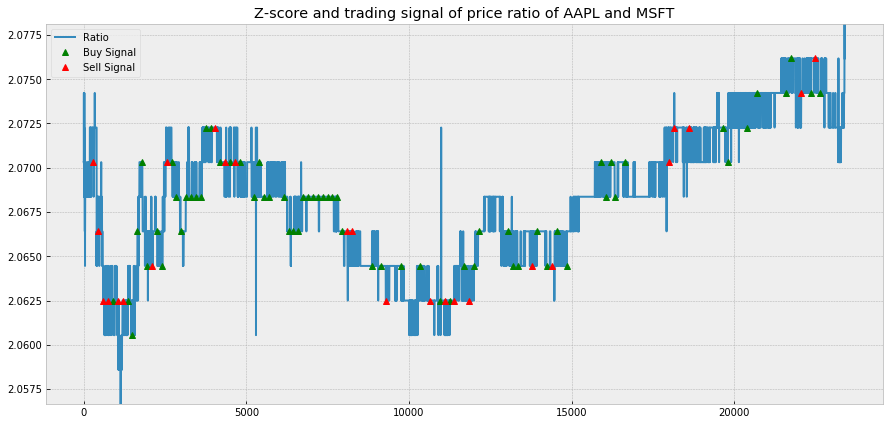

Trading signal of AAPL and MSFT for learning-based pair trading


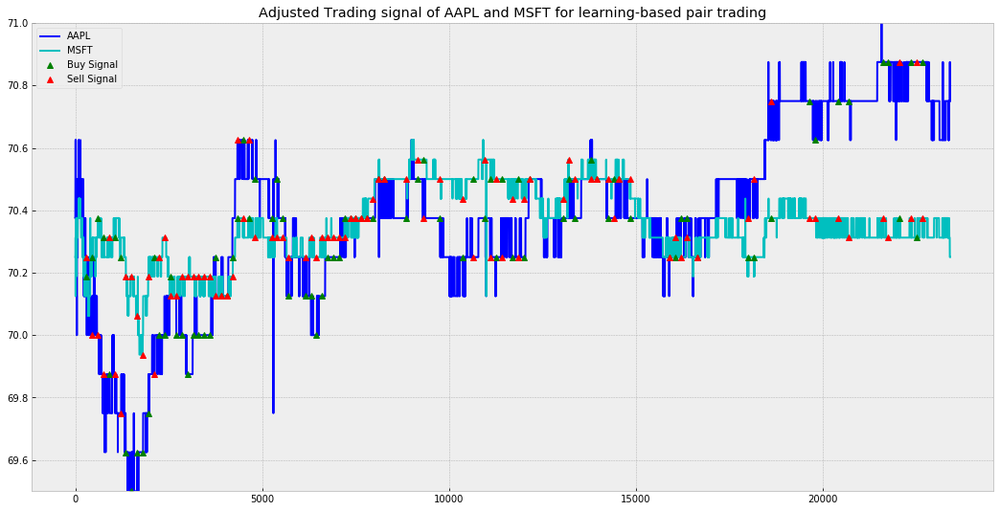

[Day 16]
v_test shape for day 16 : (154, 29, 299)
v_test shape for day 16 : (154, 29, 299)
v_test shape for day 16 : (154, 29, 299)
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
---------[Time = 300 to 450]---------
Current profit :   profit -  1
[Pairwise Price Change Reverse and Strength1 < Strength2]
[Sell AAPL and Buy MSFT] profit 1 | price ratios 2.07850133809099 | C1 -1 pos | C2 2.07850133809099 pos
AAPL price - 145.625 revenue - 145.625 | MSFT price - 70.0625 payment - 145.625 |
[Exit position] profit 1.000647784414452 | price ratios 2.07850133809099 | C1 1 pos | C2 -2.07850133809099 pos
AAPL price - 145.375, earn : 145.375 | MSFT price - 69.875, earn : -145.2352809991079 |
---------[Time = 450 to 600]---------
Current profit :   profit -  1.000647784414452
[Pairwise Price Change BothRise and Volatility1 > Volatility2]
[Buy AAPL and Sell MSFT] profit 1.000647784414452 | price ratios 2.0786416443252906 |

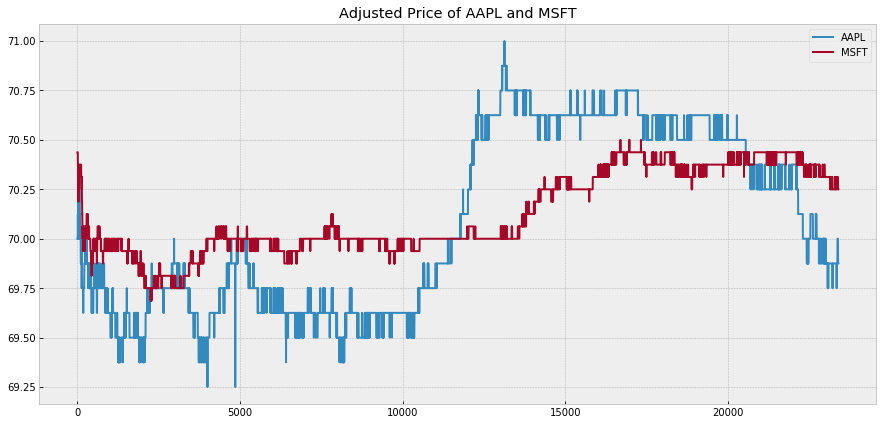

Plot z-score and trading signal of price ratio of AAPL and MSFT


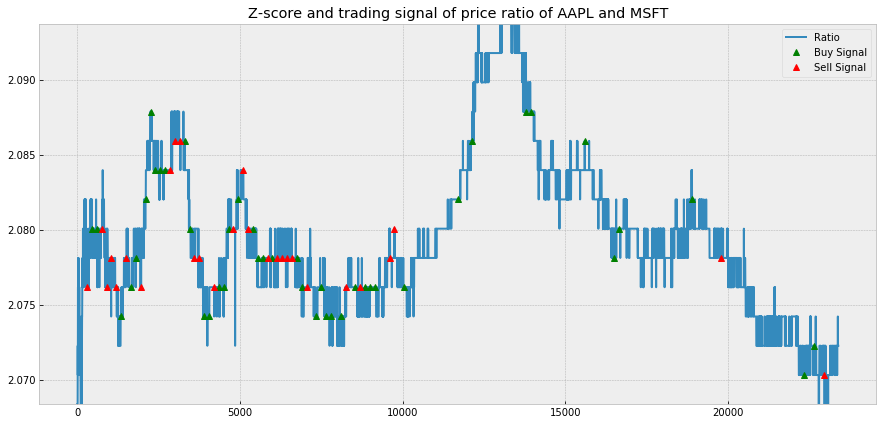

Trading signal of AAPL and MSFT for learning-based pair trading


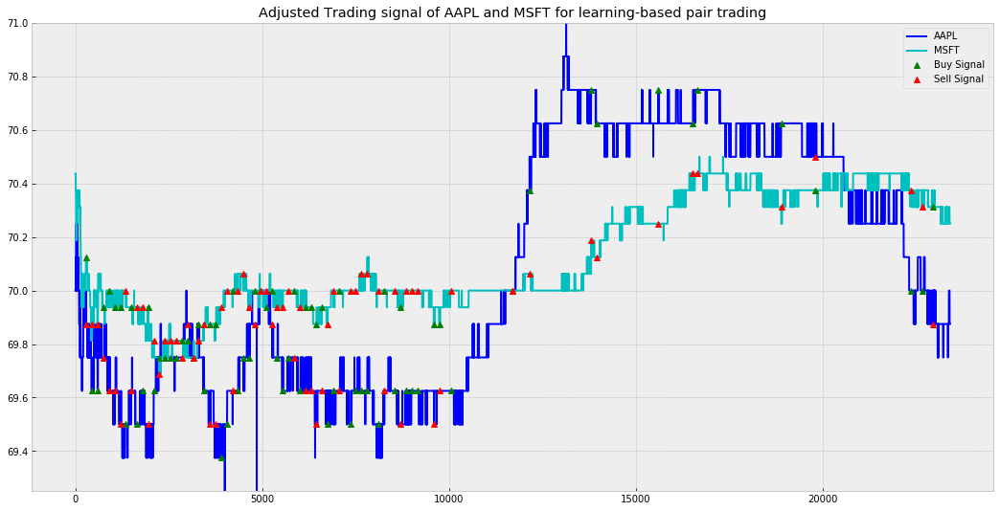

[Day 17]
v_test shape for day 17 : (154, 29, 299)
v_test shape for day 17 : (154, 29, 299)
v_test shape for day 17 : (154, 29, 299)
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
---------[Time = 300 to 450]---------
Current profit :   profit -  1
[Pairwise Price Change Reverse and Strength1 < Strength2]
[Sell AAPL and Buy MSFT] profit 1 | price ratios 2.0766488413547237 | C1 -1 pos | C2 2.0766488413547237 pos
AAPL price - 145.625 revenue - 145.625 | MSFT price - 70.125 payment - 145.625 |
[Exit position] profit 0.9999777958165253 | price ratios 2.0766488413547237 | C1 1 pos | C2 -2.0766488413547237 pos
AAPL price - 145.75, earn : 145.75 | MSFT price - 70.1875, earn : -145.75479055258467 |
---------[Time = 450 to 600]---------
Current profit :   profit -  0.9999777958165253
[Pairwise Price Change Reverse and Strength1 < Strength2]
[Sell AAPL and Buy MSFT] profit 0.9999777958165253 | price ratios 2.0766488413547

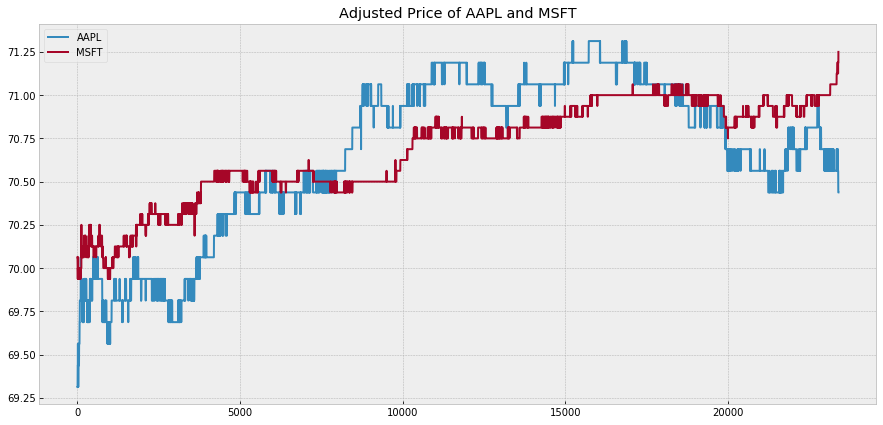

Plot z-score and trading signal of price ratio of AAPL and MSFT


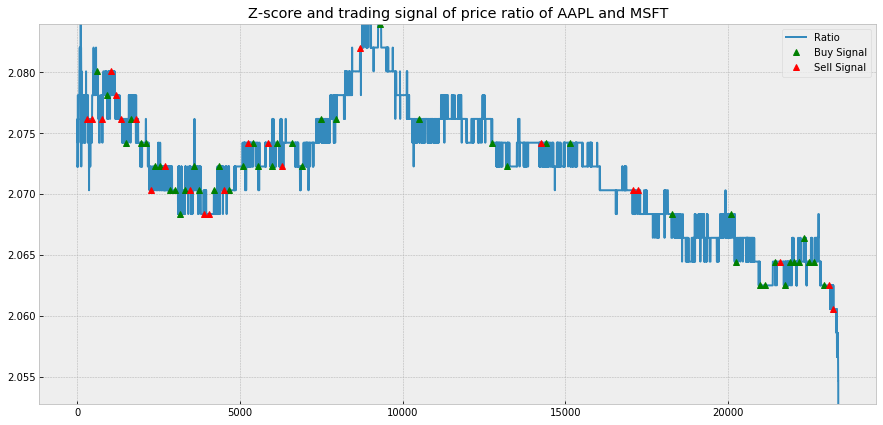

Trading signal of AAPL and MSFT for learning-based pair trading


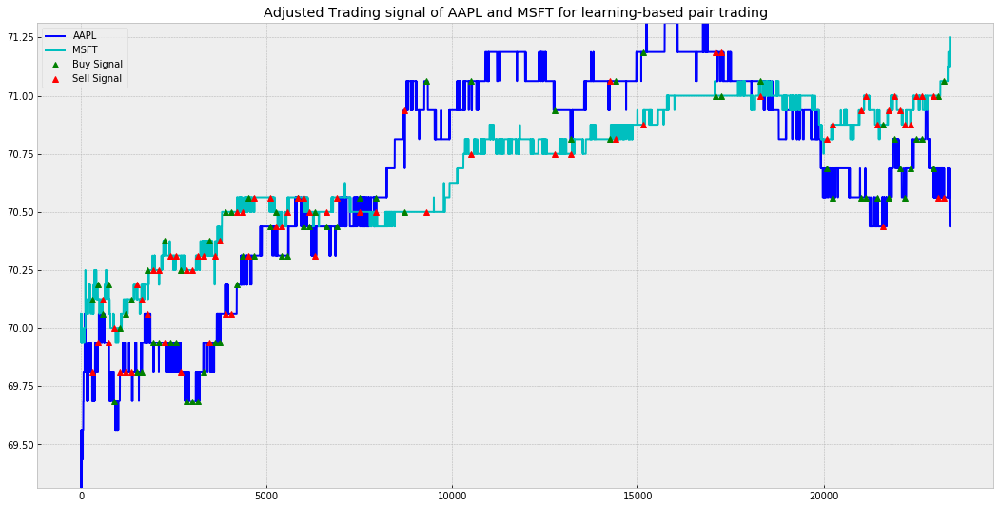

[Day 18]
v_test shape for day 18 : (154, 29, 299)
v_test shape for day 18 : (154, 29, 299)
v_test shape for day 18 : (154, 29, 299)
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
---------[Time = 300 to 450]---------
Current profit :   profit -  1
[Pairwise Price Change Reverse and Strength1 < Strength2]
[Sell AAPL and Buy MSFT] profit 1 | price ratios 2.066259808195292 | C1 -1 pos | C2 2.066259808195292 pos
AAPL price - 148.125 revenue - 148.125 | MSFT price - 71.6875 payment - 148.125 |
[Exit position] profit 1.0000188398658503 | price ratios 2.066259808195292 | C1 1 pos | C2 -2.066259808195292 pos
AAPL price - 148.0, earn : 148.0 | MSFT price - 71.625, earn : -147.9958587619878 |
---------[Time = 450 to 600]---------
Current profit :   profit -  1.0000188398658503
[Pairwise Price Change Reverse and Strength1 < Strength2]
[Sell AAPL and Buy MSFT] profit 1.0000188398658503 | price ratios 2.0663176265270504 | C

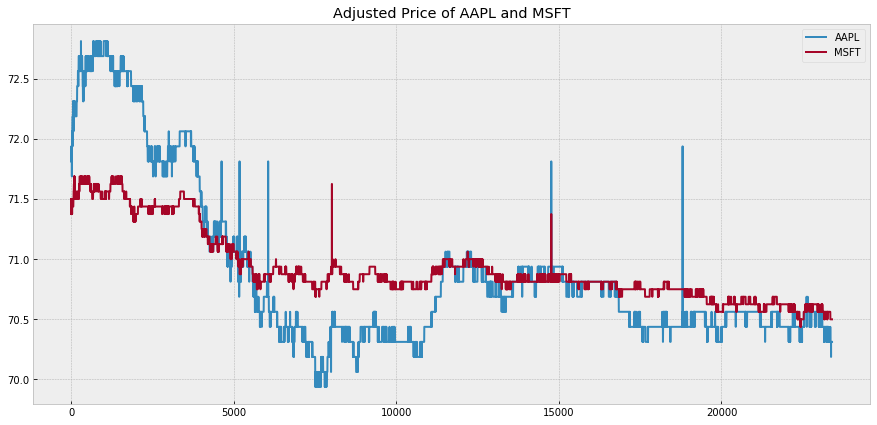

Plot z-score and trading signal of price ratio of AAPL and MSFT


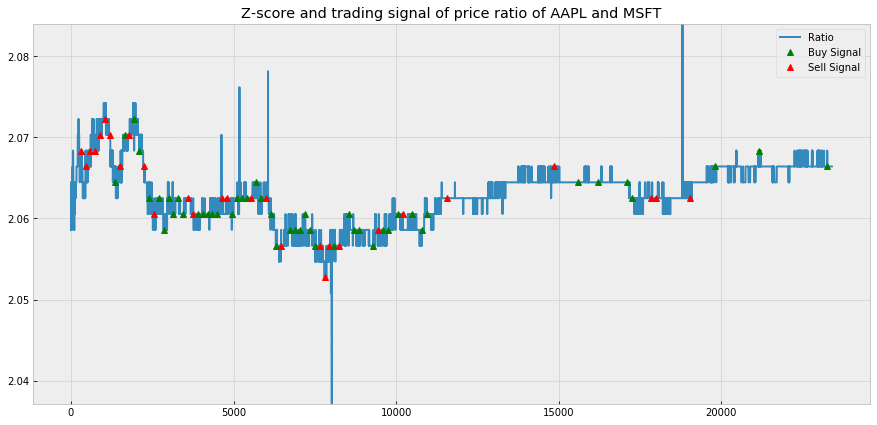

Trading signal of AAPL and MSFT for learning-based pair trading


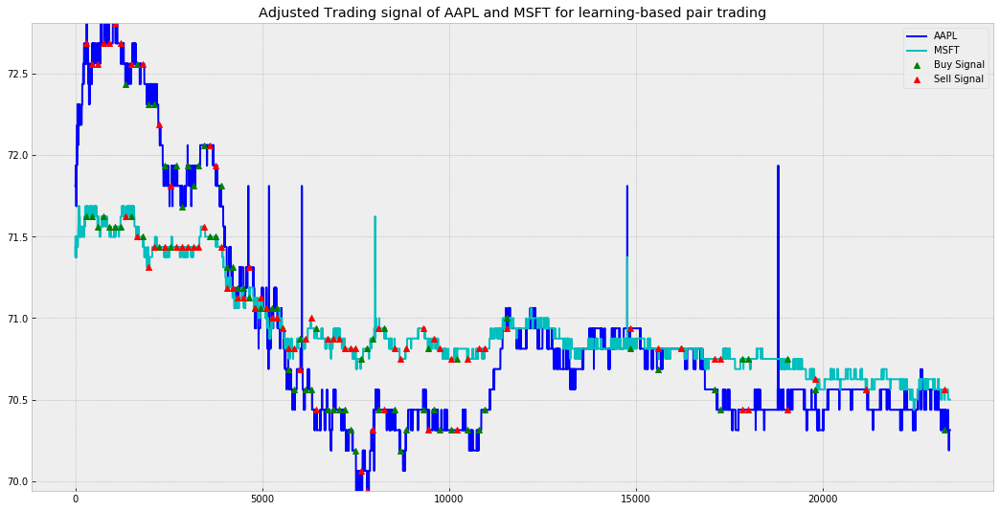

[Day 19]
v_test shape for day 19 : (154, 29, 299)
v_test shape for day 19 : (154, 29, 299)
v_test shape for day 19 : (154, 29, 299)
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
---------[Time = 300 to 450]---------
Current profit :   profit -  1
[Pairwise Price Change Reverse and Strength1 < Strength2]
[Sell AAPL and Buy MSFT] profit 1 | price ratios 2.0732142857142857 | C1 -1 pos | C2 2.0732142857142857 pos
AAPL price - 145.125 revenue - 145.125 | MSFT price - 70.0 payment - 145.125 |
[Exit position] profit 0.999418942475305 | price ratios 2.0732142857142857 | C1 1 pos | C2 -2.0732142857142857 pos
AAPL price - 145.0, earn : 145.0 | MSFT price - 70.0, earn : -145.125 |
---------[Time = 450 to 600]---------
Current profit :   profit -  0.999418942475305
[Pairwise Price Change Reverse and Strength1 < Strength2]
[Sell AAPL and Buy MSFT] profit 0.999418942475305 | price ratios 2.0714285714285716 | C1 -1 pos | C2 

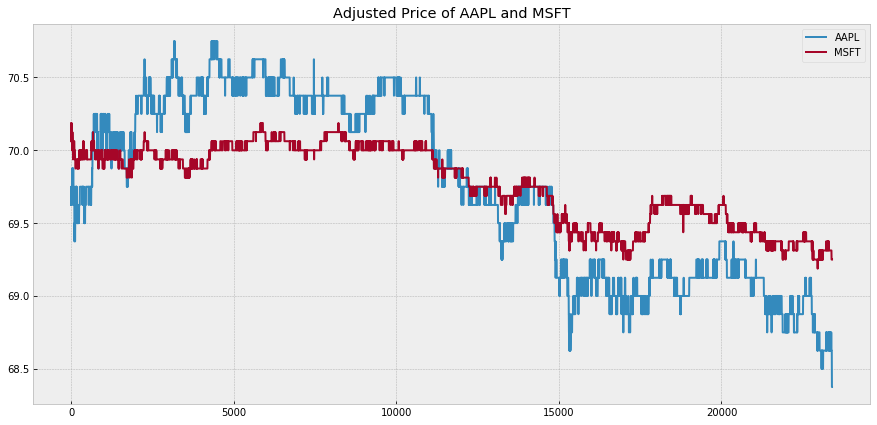

Plot z-score and trading signal of price ratio of AAPL and MSFT


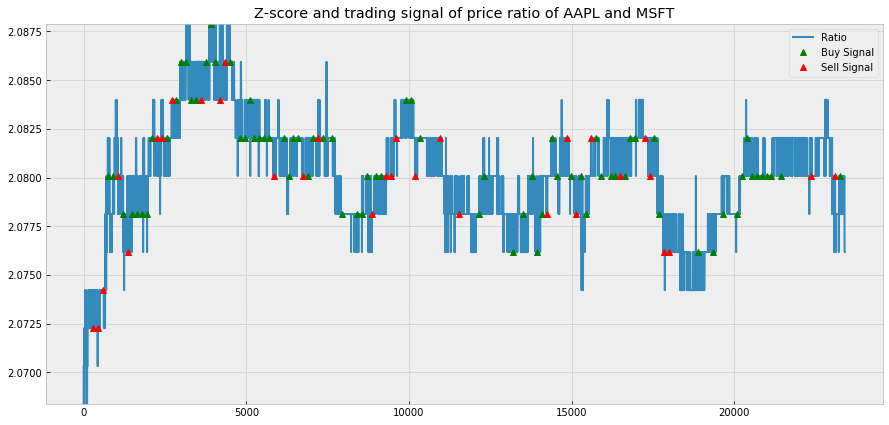

Trading signal of AAPL and MSFT for learning-based pair trading


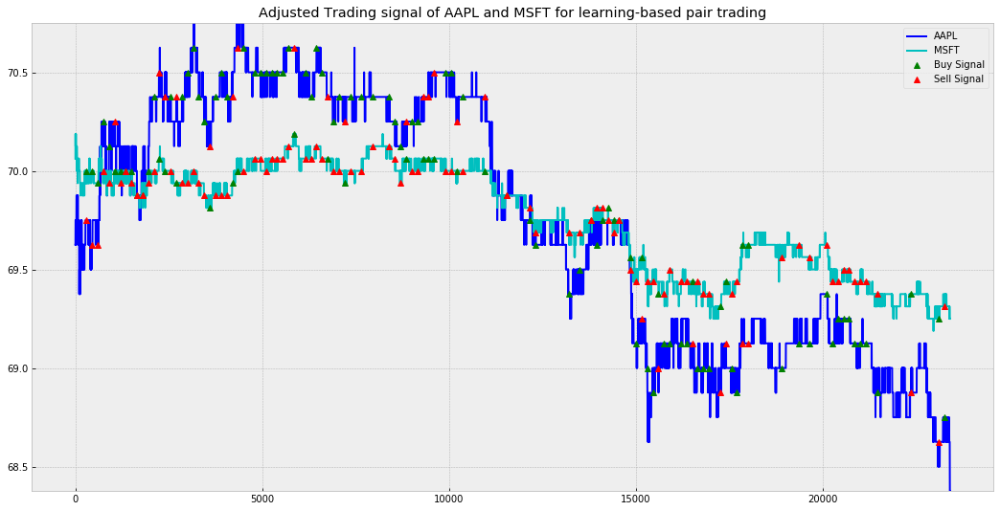

[Day 20]
v_test shape for day 20 : (154, 29, 299)
v_test shape for day 20 : (154, 29, 299)
v_test shape for day 20 : (154, 29, 299)
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
Predict Result....
Prediction Finished !
---------[Time = 300 to 450]---------
Current profit :   profit -  1
[Pairwise Price Change BothRise and Volatility1 > Volatility2]
[Buy AAPL and Sell MSFT] profit 1 | price ratios 2.083032490974729 | C1 1 pos | C2 -2.083032490974729 pos
AAPL price - 144.25 payment - 144.25 | MSFT price - 69.25 revenue - 144.25 |
[Exit position] profit 1.0023419203747073 | price ratios 2.083032490974729 | C1 -1 pos | C2 2.083032490974729 pos
AAPL price - 143.75, earn : -143.75 | MSFT price - 69.25, earn : 144.25 |
---------[Time = 450 to 600]---------
Current profit :   profit -  1.0023419203747073
[Pairwise Price Change BothRise and Volatility1 > Volatility2]
[Buy AAPL and Sell MSFT] profit 1.0023419203747073 | price ratios 2.0758122743682312 | C1 1 p

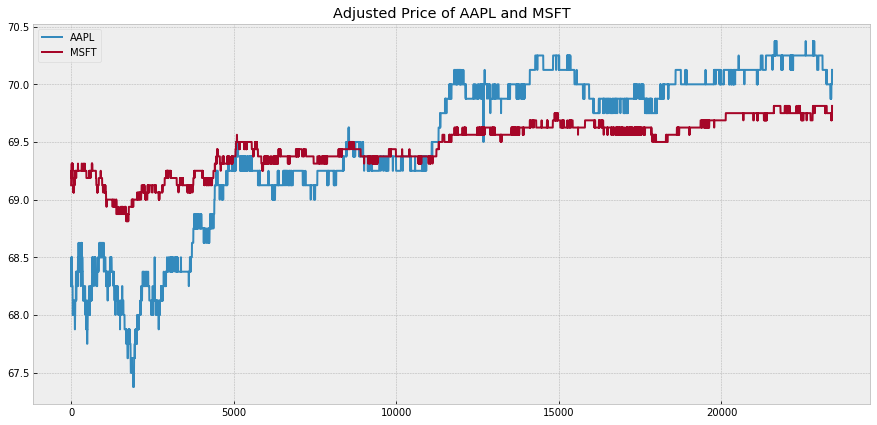

Plot z-score and trading signal of price ratio of AAPL and MSFT


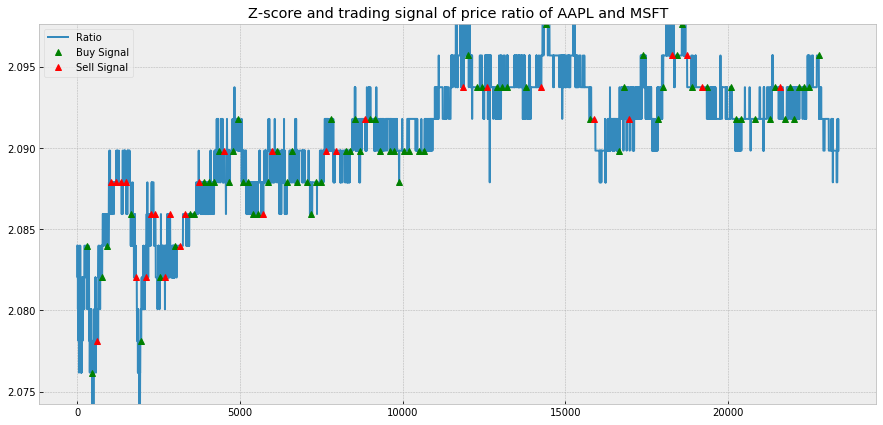

Trading signal of AAPL and MSFT for learning-based pair trading


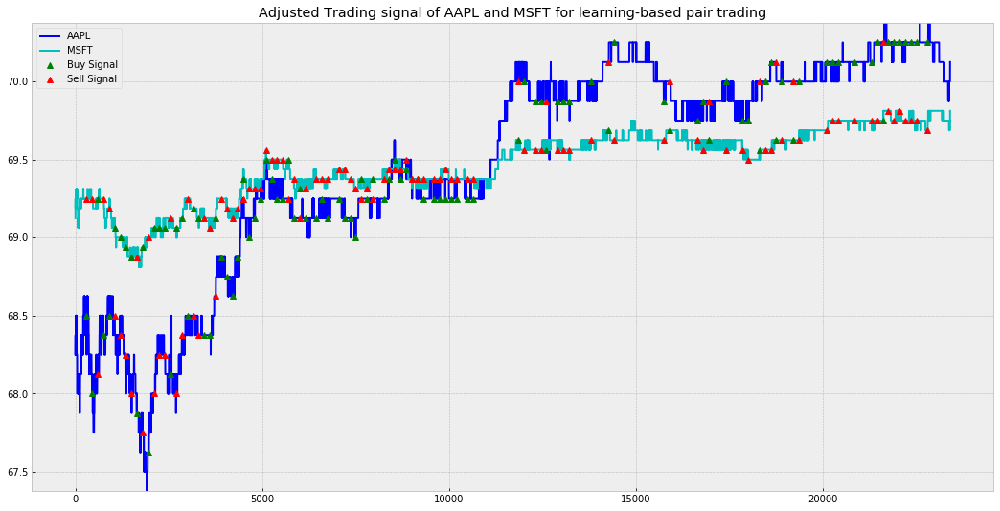

<Figure size 432x288 with 0 Axes>

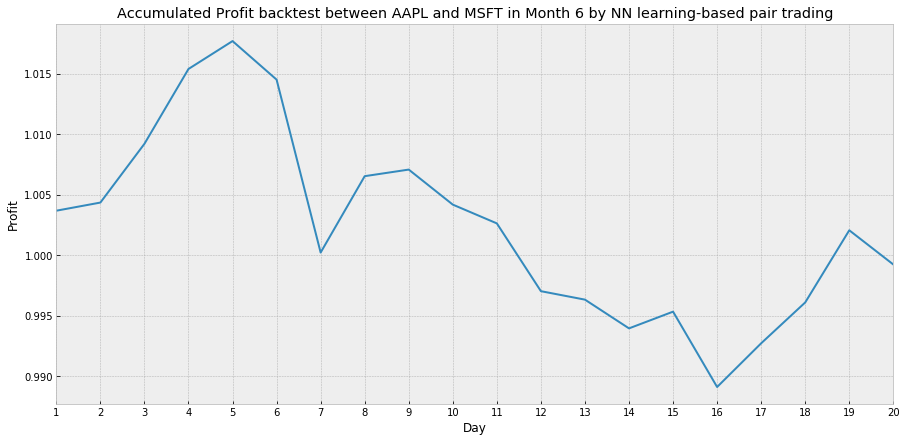

In [132]:
# 這邊是用NN prediction 來做策略
#p = ['AAPL', 'MSFT']
profit_day_NN_b = []
signal = []
predict_result_b = {}
for i in range(20):
    print("[Day %s]" % str(i+1))
    S1 = pd.DataFrame({p[0]: price_and_return[p[0]][0][i,:]})
    S2 = pd.DataFrame({p[1]: price_and_return[p[1]][0][i,:]})
    result = NN_trade(S1, S2, p[0], p[1], price_data, price_and_return, net, i, show_print = 1, fee = 0, profit_Mode = profit_Mode)
    profit_day_NN_b.append(result[0])
    signal.append([result[1], result[2]])
    predict_result_b[i+1] = result[3]
    drawTradingCondition(p[0], p[1], price_and_return, i, window_l, window_s, trading_time, result[1], result[2], mode = 'NN')

# Plot profit
fig = plt.gcf()
plt.figure(figsize=(15,7))
if profit_Mode == 0:
    plt.plot(np.cumsum(profit_day_NN_b))
else:
    plt.plot(np.cumprod(profit_day_NN_b))
plt.xticks(range(20), np.arange(20)+1)
plt.title('Accumulated Profit backtest between %s and %s in Month %s by NN learning-based pair trading' % (p[0], p[1], period[0]))
plt.style.use("bmh")
plt.xlim(0,19)
plt.xlabel('Day')
plt.ylabel('Profit')
plt.show()

<Figure size 432x288 with 0 Axes>

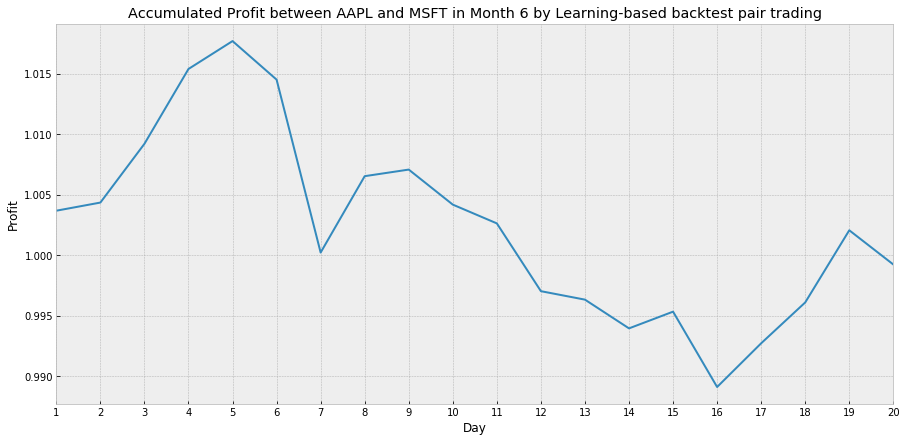

<Figure size 432x288 with 0 Axes>

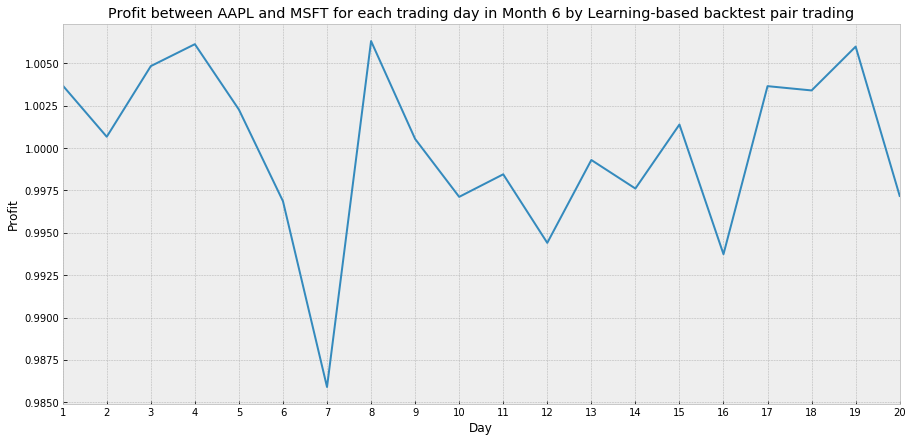

In [133]:
draw_profit(profit_day_NN_b, np.arange(20)+1, period, mode = 'Learning-based backtest', profit_Mode = profit_Mode)

In [134]:
profit_day_NN_b

[1.0036947358017068,
 1.000669952553848,
 1.0048373110773958,
 1.0061311695718351,
 1.0022721297143176,
 0.9968683014285644,
 0.9859055596405767,
 1.0063146781435908,
 1.0005406929832072,
 0.9971235638682945,
 0.998454077392083,
 0.9944096692383942,
 0.9992984402173699,
 0.9976150694818849,
 1.0013911297262985,
 0.9937404000081714,
 1.0036552156085325,
 1.0034024071689887,
 1.0059882178096882,
 0.9971783086672767]

0.9992470917234252


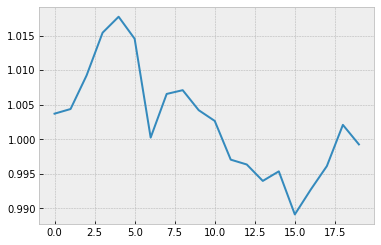

In [135]:
# profit rate直接在交易過程就算好的版本
print(np.cumprod(profit_day_NN_b)[-1])
plt.plot(np.cumprod(profit_day_NN_b))

In [136]:
qa_whole = np.load("qa_pair/QA_pair_company%d_%dto%d_shift_length%d_train.npy" % (company_num, period[0], period[-1], shift_length))
qa_whole_val = np.load("qa_pair/QA_pair_company%d_%dto%d_shift_length%d_val.npy" % (company_num, period[0], period[-1], shift_length))
qa_whole_test = np.load("qa_pair/QA_pair_company%d_%dto%d_shift_length%d_test.npy" % (company_num, period[0], period[-1], shift_length))
# load
print("[Train QA pair load completed!]")
print("[Validation QA pair load completed!]")
print("[Testing QA pair load completed!]")

[Train QA pair load completed!]
[Validation QA pair load completed!]
[Testing QA pair load completed!]


In [137]:
qa_whole_test.shape

(7502880, 71)

In [138]:
v_test.shape

(3080, 29, 299)

# 挑出每個問題的正確答案 and 算預測的準確度

In [139]:
qa_test_for_pairtrading = []
for i in range(154):
    qa_test_for_pairtrading.append(qa_whole_test[i*len(all_com_pair_P)*len(qtype):(i+1)*len(all_com_pair_P)*len(qtype),:])
qa_test_for_pairtrading = np.vstack(qa_test_for_pairtrading)
xxx = qa_test_for_pairtrading[:,:-10]
q1_idx = np.where(np.all(xxx  == np.repeat(np.expand_dims(vq1_pairtrad[1][0],0), xxx.shape[0], axis = 0), axis = 1).astype(int) == 1)[0]
q2_idx = np.where(np.all(xxx  == np.repeat(np.expand_dims(vq2_pairtrad[1][0],0), xxx.shape[0], axis = 0), axis = 1).astype(int) == 1)[0]
q3_idx = np.where(np.all(xxx  == np.repeat(np.expand_dims(vq3_pairtrad[1][0],0), xxx.shape[0], axis = 0), axis = 1).astype(int) == 1)[0]

In [140]:
qa1_true = qa_test_for_pairtrading[q1_idx]
qa2_true = qa_test_for_pairtrading[q2_idx]
qa3_true = qa_test_for_pairtrading[q3_idx]

In [141]:
a1_true = qa1_true[:,-10:-6]
a2_true = qa2_true[:,-6:-3]
a3_true = qa3_true[:,-3:]

In [142]:
np.argmax(a1_true, 1)

array([0, 3, 3, 2, 3, 0, 1, 2, 0, 0, 1, 2, 1, 0, 0, 1, 1, 3, 3, 2, 0, 0,
       0, 2, 0, 2, 1, 2, 0, 1, 1, 0, 0, 0, 0, 1, 0, 3, 2, 2, 2, 0, 0, 2,
       1, 2, 2, 1, 1, 0, 3, 2, 2, 2, 1, 1, 0, 0, 0, 1, 1, 0, 0, 2, 2, 0,
       0, 0, 0, 0, 2, 3, 0, 0, 0, 1, 1, 0, 0, 2, 1, 0, 0, 0, 0, 2, 1, 0,
       2, 0, 0, 1, 3, 0, 0, 1, 0, 0, 0, 0, 2, 0, 0, 0, 1, 0, 0, 0, 2, 0,
       1, 2, 1, 0, 0, 0, 1, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 3, 0, 2, 1,
       0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 3, 0, 0, 1, 3, 0, 0, 0, 0, 0, 0])

In [143]:
Counter(np.argmax(a1_true, 1)).most_common()[0][1] / a1_true.shape[0]

0.538961038961039

In [144]:
predict_result[1][0].astype(int)

array([1, 3, 3, 3, 3, 3, 3, 3, 1, 1, 3, 3, 1, 3, 3, 1, 3, 1, 3, 1, 3, 3,
       3, 3, 1, 1, 1, 3, 3, 3, 1, 3, 3, 3, 3, 3, 1, 1, 3, 1, 3, 1, 3, 3,
       1, 3, 1, 1, 3, 1, 1, 1, 1, 3, 3, 3, 3, 1, 3, 1, 3, 3, 1, 3, 3, 1,
       3, 1, 3, 1, 3, 1, 3, 1, 3, 3, 1, 1, 3, 3, 3, 1, 1, 1, 1, 1, 3, 1,
       1, 3, 3, 1, 3, 1, 1, 1, 3, 3, 1, 1, 1, 1, 1, 1, 3, 3, 3, 3, 1, 1,
       3, 3, 3, 1, 1, 1, 0, 1, 3, 1, 1, 1, 3, 1, 1, 1, 1, 1, 3, 1, 3, 1,
       1, 1, 3, 3, 2, 1, 1, 1, 1, 0, 1, 1, 1, 1, 2, 3, 3, 1, 3, 3, 1, 1])

In [145]:
np.argmax(a2_true, 1)

array([2, 1, 2, 1, 2, 2, 1, 2, 1, 0, 2, 1, 1, 1, 2, 2, 1, 1, 1, 2, 1, 0,
       2, 1, 2, 1, 1, 1, 1, 1, 2, 2, 2, 1, 0, 1, 2, 2, 1, 1, 1, 1, 2, 2,
       1, 2, 2, 1, 2, 0, 2, 1, 1, 2, 1, 1, 2, 1, 1, 1, 2, 1, 0, 1, 1, 0,
       1, 0, 0, 0, 1, 2, 1, 0, 2, 2, 1, 2, 2, 2, 2, 2, 1, 0, 0, 2, 2, 1,
       2, 1, 2, 2, 1, 1, 1, 2, 0, 2, 2, 2, 1, 2, 2, 0, 2, 0, 1, 2, 1, 2,
       1, 1, 2, 0, 0, 0, 2, 1, 0, 2, 2, 1, 1, 1, 0, 2, 0, 2, 1, 2, 1, 1,
       0, 2, 2, 1, 2, 0, 0, 1, 2, 0, 1, 2, 1, 2, 2, 1, 2, 1, 0, 0, 0, 2])

In [146]:
predict_result[1][1]

array([2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2])

In [147]:
np.argmax(a3_true, 1)

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 2, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1])

In [148]:
predict_result[1][2]

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1])

In [149]:
np.sum((np.argmax(a1_true, 1) == predict_result[1][0]).astype(int)) / a1_true.shape[0]

0.13636363636363635

In [150]:
np.sum((np.argmax(a2_true, 1) == predict_result[1][1]).astype(int)) / a2_true.shape[0]

0.42207792207792205

In [151]:
np.sum((np.argmax(a3_true, 1) == predict_result[1][2]).astype(int)) / a3_true.shape[0]

0.974025974025974

# Test 一整個月每天三個問題的真實命中率

In [152]:
def cal_predict_true_acc(all_com_pair_P, qtype, day):
    """
    # 計算V_test三種問題"每一個交易日"的真實準確率
    """
    real_acc = {}
    for d in range(day):
        print("Day %s" % str(d+1))
        day_start = d * int(v_test.shape[0] / day) * len(all_com_pair_P) * len(qtype)
        print("Index of day start : ", day_start)
        qa_test_for_pairtrading = []
        for i in range(int(v_test.shape[0] / day)):
            qa_test_for_pairtrading.append(qa_whole_test[day_start + i*len(all_com_pair_P)*len(qtype):day_start + (i+1)*len(all_com_pair_P)*len(qtype),:])
        qa_test_for_pairtrading = np.vstack(qa_test_for_pairtrading)
        xxx = qa_test_for_pairtrading[:,:-10]
        q1_idx = np.where(np.all(xxx  == np.repeat(np.expand_dims(vq1_pairtrad[1][0],0), xxx.shape[0], axis = 0), axis = 1).astype(int) == 1)[0]
        q2_idx = np.where(np.all(xxx  == np.repeat(np.expand_dims(vq2_pairtrad[1][0],0), xxx.shape[0], axis = 0), axis = 1).astype(int) == 1)[0]
        q3_idx = np.where(np.all(xxx  == np.repeat(np.expand_dims(vq3_pairtrad[1][0],0), xxx.shape[0], axis = 0), axis = 1).astype(int) == 1)[0]
        
        # 真實的label
        a1_true = qa_test_for_pairtrading[q1_idx][:,-10:-6]
        a2_true = qa_test_for_pairtrading[q2_idx][:,-6:-3]
        a3_true = qa_test_for_pairtrading[q3_idx][:,-3:]
        
        # 真實命中率
        q1_acc = np.sum((np.argmax(a1_true, 1) == predict_result[d+1][0]).astype(int)) / a1_true.shape[0]
        q2_acc = np.sum((np.argmax(a2_true, 1) == predict_result[d+1][1]).astype(int)) / a2_true.shape[0]
        q3_acc = np.sum((np.argmax(a3_true, 1) == predict_result[d+1][2]).astype(int)) / a3_true.shape[0]
        
        print("Q1 real accuracy : ", q1_acc)
        print("Q2 real accuracy : ", q2_acc)
        print("Q3 real accuracy : ", q3_acc)
        
        real_acc[d+1] = [q1_acc, q2_acc, q3_acc]
        
    return real_acc

In [153]:
test_realacc = cal_predict_true_acc(all_com_pair_P, qtype, day_test)

Day 1
Index of day start :  0
Q1 real accuracy :  0.13636363636363635
Q2 real accuracy :  0.42207792207792205
Q3 real accuracy :  0.974025974025974
Day 2
Index of day start :  375144
Q1 real accuracy :  0.14935064935064934
Q2 real accuracy :  0.4155844155844156
Q3 real accuracy :  0.9675324675324676
Day 3
Index of day start :  750288
Q1 real accuracy :  0.22077922077922077
Q2 real accuracy :  0.37012987012987014
Q3 real accuracy :  0.8506493506493507
Day 4
Index of day start :  1125432
Q1 real accuracy :  0.24675324675324675
Q2 real accuracy :  0.37012987012987014
Q3 real accuracy :  0.7337662337662337
Day 5
Index of day start :  1500576
Q1 real accuracy :  0.23376623376623376
Q2 real accuracy :  0.33766233766233766
Q3 real accuracy :  0.935064935064935
Day 6
Index of day start :  1875720
Q1 real accuracy :  0.2857142857142857
Q2 real accuracy :  0.3961038961038961
Q3 real accuracy :  0.8896103896103896
Day 7
Index of day start :  2250864
Q1 real accuracy :  0.3051948051948052
Q2 real 

# Pair Trading累積收益圖

<Figure size 432x288 with 0 Axes>

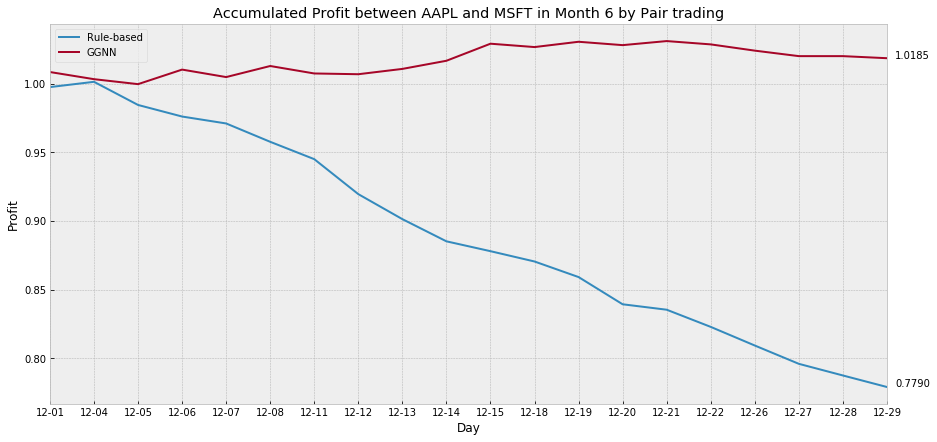

In [154]:
fig = plt.gcf()
plt.figure(figsize=(15,7))
plt.plot(np.cumprod(profit_day), label = 'Rule-based')
plt.plot(np.cumprod(profit_day_NN), label = 'GGNN')
plt.xticks(range(day_test), date_test_noyear)
for var in (np.cumprod(profit_day), np.cumprod(profit_day_NN)):
    plt.annotate('%0.4f' % var[-1], xy=(1, var[-1]), xytext=(8, 0), 
                 xycoords=('axes fraction', 'data'), textcoords='offset points')
plt.title('Accumulated Profit between %s and %s in Month %s by Pair trading' % (p[0], p[1], period[0]))
plt.style.use("bmh")
plt.xlim(0,day_test-1)
plt.legend()
plt.xlabel('Day')
plt.ylabel('Profit')
plt.show()

# Pair Trading各交易日收益圖

<Figure size 432x288 with 0 Axes>

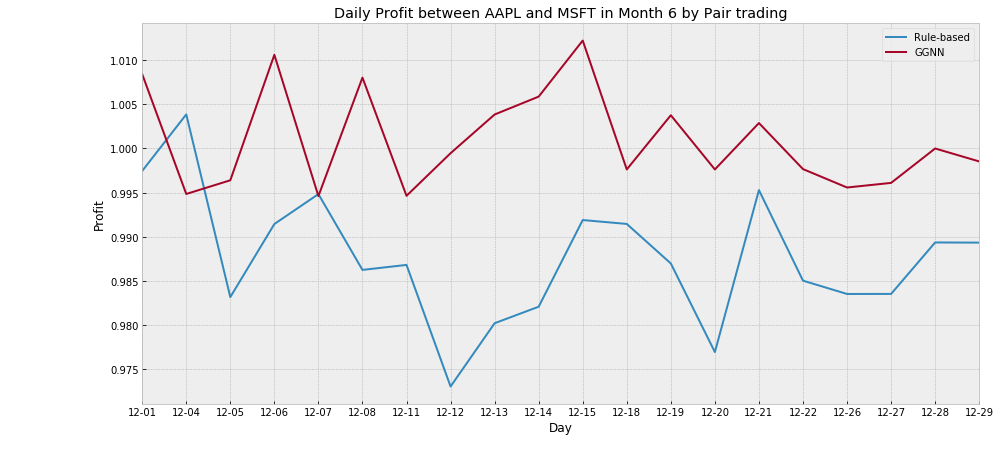

In [155]:
fig = plt.gcf()
plt.figure(figsize=(15,7))
plt.plot(profit_day, label = 'Rule-based')
plt.plot(profit_day_NN, label = 'GGNN')
plt.xticks(range(day_test), date_test_noyear)
plt.title('Daily Profit between %s and %s in Month %s by Pair trading' % (p[0], p[1], period[0]))
plt.style.use("bmh")
for i,j in zip(range(day_test),profit_day):
    plt.annotate(str('%0.1f'% j), xy=(i,j+1))
for i,j in zip(range(day_test),profit_day_NN):
    plt.annotate(str('%0.1f'% j), xy=(i,j+1))
plt.xlim(0,day_test-1)
plt.legend()
plt.xlabel('Day')
plt.ylabel('Profit')
plt.show()

# List all parameter in net

In [156]:
for name, param in net.named_parameters():
    if param.requires_grad:
        print(name, param.data, param.shape)

in_0.weight tensor([[ 0.0704, -0.0686,  0.0836,  ...,  0.0400, -0.0377,  0.1093],
        [ 0.0620, -0.0089,  0.1007,  ...,  0.1567, -0.0555,  0.1962],
        [ 0.1353, -0.0963,  0.0685,  ...,  0.1920,  0.0968,  0.1172],
        ...,
        [ 0.0278, -0.0090,  0.0038,  ...,  0.1211, -0.1353,  0.1068],
        [ 0.1314, -0.0021,  0.0287,  ...,  0.1495, -0.0313,  0.1233],
        [-0.0687,  0.0332,  0.0099,  ...,  0.0250, -0.0880,  0.0356]],
       device='cuda:0') torch.Size([32, 32])
in_0.bias tensor([-0.0341,  0.0030, -0.0690,  0.0311, -0.0220,  0.0980,  0.0312,  0.0404,
         0.0545,  0.0380, -0.0921, -0.0010,  0.0163, -0.0274,  0.0265,  0.0886,
         0.1069,  0.0629,  0.1036, -0.0163, -0.0249, -0.0225, -0.0689,  0.0503,
         0.0352, -0.0223,  0.0048,  0.0978,  0.0217,  0.0312, -0.0129,  0.0971],
       device='cuda:0') torch.Size([32])
in_1.weight tensor([[ 0.0494, -0.1038, -0.0190,  ..., -0.0297, -0.0355, -0.0279],
        [-0.0920, -0.0982, -0.1629,  ...,  0.0569,  0.1

# Save all predicted result

In [157]:
'''
Save NN predict result
'''
import pickle

time = str(datetime.datetime.now()).split(' ')[0]
fname = 'predictresult/history_%s_period%dto%d_shiftlength%d.pickle' % (time, period[0], period[-1], shift_length)

with open(fname, 'wb') as handle:
    pickle.dump(history, handle, protocol=pickle.HIGHEST_PROTOCOL)
print('Save "%s" successful !' % fname)

np.save("predictresult/profit_Rule-basedPairTrading_%s_%dto%d_shiftlength%d.npy" % (time, period[0], period[-1], shift_length), profit_day)
np.save("predictresult/profit_NN-basedPairTrading_%s_%dto%d_shiftlength%d.npy" % (time, period[0], period[-1], shift_length), profit_day_NN)
np.save("predictresult/profit_NN-basedPairTrading_backtest_%s_%dto%d_shiftlength%d.npy" % (time, period[0], period[-1], shift_length), profit_day_NN_b)
# save
print("[profit_Rule-basedPairTrading save completed ! ]")
print("[profit_NN-basedPairTrading save completed ! ]")
print("[profit_NN-basedPairTrading_backtest save completed ! ]")

load_data = 0
# load back
if load_data == 1:
    with open(fname, 'rb') as handle:
        history_b = pickle.load(handle)
    print('Open "%s" successful !' % fname)

Save "predictresult/history_2019-07-31_period6to11_shiftlength150.pickle" successful !
[profit_Rule-basedPairTrading save completed ! ]
[profit_NN-basedPairTrading save completed ! ]
[profit_NN-basedPairTrading_backtest save completed ! ]


In [158]:
# 刪掉最佔記憶體的幾個array
del qa_whole, qa_whole_val, qa_whole_test

# Classification Report and Confusion matrix
* 計算Precision, recall, F1等 classification report : https://www.cnblogs.com/178mz/p/8558435.html
* confusion matrix : https://scikit-learn.org/stable/modules/generated/sklearn.metrics.confusion_matrix.html

In [159]:
from sklearn.metrics import classification_report

def classification_report_andf1test(all_com_pair_P, qtype, day, predict_result):
    """
    # 計算每種問題的F1 Score, Precision, Recall
    """
    q1_true, q2_true, q3_true = [], [], []
    q1_pred, q2_pred, q3_pred = [], [], []
    
    for d in range(day):
        print("Day %s" % str(d+1) + " processing...")
        day_start = d * int(v_test.shape[0] / day) * len(all_com_pair_P) * len(qtype)
        #print("Index of day start : ", day_start)
        qa_test_for_pairtrading = []
        for i in range(int(v_test.shape[0] / day)):
            qa_test_for_pairtrading.append(qa_whole_test[day_start + i*len(all_com_pair_P)*len(qtype):day_start + (i+1)*len(all_com_pair_P)*len(qtype),:])
        qa_test_for_pairtrading = np.vstack(qa_test_for_pairtrading)
        xxx = qa_test_for_pairtrading[:,:-10]
        q1_idx = np.where(np.all(xxx  == np.repeat(np.expand_dims(vq1_pairtrad[1][0],0), xxx.shape[0], axis = 0), axis = 1).astype(int) == 1)[0]
        q2_idx = np.where(np.all(xxx  == np.repeat(np.expand_dims(vq2_pairtrad[1][0],0), xxx.shape[0], axis = 0), axis = 1).astype(int) == 1)[0]
        q3_idx = np.where(np.all(xxx  == np.repeat(np.expand_dims(vq3_pairtrad[1][0],0), xxx.shape[0], axis = 0), axis = 1).astype(int) == 1)[0]
        
        # 真實的label
        a1_true = qa_test_for_pairtrading[q1_idx][:,-10:-6]
        a2_true = qa_test_for_pairtrading[q2_idx][:,-6:-3]
        a3_true = qa_test_for_pairtrading[q3_idx][:,-3:]
        
        # 真實命中率
        q1_acc = np.sum((np.argmax(a1_true, 1) == predict_result[d+1][0]).astype(int)) / a1_true.shape[0]
        q2_acc = np.sum((np.argmax(a2_true, 1) == predict_result[d+1][1]).astype(int)) / a2_true.shape[0]
        q3_acc = np.sum((np.argmax(a3_true, 1) == predict_result[d+1][2]).astype(int)) / a3_true.shape[0]
        
        q1_true.append(np.argmax(a1_true, 1))
        q2_true.append(np.argmax(a2_true, 1))
        q3_true.append(np.argmax(a3_true, 1))
        q1_pred.append(predict_result[d+1][0])
        q2_pred.append(predict_result[d+1][1])
        q3_pred.append(predict_result[d+1][2])
    
    q1_true = np.stack(q1_true).flatten()
    q2_true = np.stack(q2_true).flatten()
    q3_true = np.stack(q3_true).flatten()
    q1_pred = np.stack(q1_pred).flatten()
    q2_pred = np.stack(q2_pred).flatten()
    q3_pred = np.stack(q3_pred).flatten()
    print("Total prediction amount :", q1_true.shape)
    print(len(np.where(q1_true == 0)[0]))
        
    print("-----------The classification report-----------")
    target_names = ['NoChange','BothRise','BothFall','Reverse','Same','Strong','Weak','Same','Big','Small']
    print("[Q1]")
    print(classification_report(q1_true, q1_pred, target_names=target_names[:4]))
    print("[Q2]")
    print(classification_report(q2_true, q2_pred, target_names=target_names[4:7]))
    print("[Q3]")
    target_names_q3 = list(np.array(target_names)[np.add(np.unique(np.argmax(a3_true, 1)),7)])
    print(target_names_q3)
    print(classification_report(q3_true, q3_pred, target_names=target_names_q3, labels = np.unique(np.argmax(a3_true, 1))))

In [160]:
qa_whole_test = np.load("qa_pair/QA_pair_company%d_%dto%d_shift_length%d_test.npy" % (company_num, period[0], period[-1], shift_length))
# load
print("[Testing QA pair load completed!]")
print("TwoPhaseGraphGRU")
classification_report_andf1test(all_com_pair_P, qtype, day_test, predict_result)

[Testing QA pair load completed!]
TwoPhaseGraphGRU
Day 1 processing...
Day 2 processing...
Day 3 processing...
Day 4 processing...
Day 5 processing...
Day 6 processing...
Day 7 processing...
Day 8 processing...
Day 9 processing...
Day 10 processing...
Day 11 processing...
Day 12 processing...
Day 13 processing...
Day 14 processing...
Day 15 processing...
Day 16 processing...
Day 17 processing...
Day 18 processing...
Day 19 processing...
Day 20 processing...
Total prediction amount : (3080,)
2231
-----------The classification report-----------
[Q1]
              precision    recall  f1-score   support

    NoChange       0.86      0.26      0.40      2231
    BothRise       0.11      0.56      0.19       311
    BothFall       0.11      0.08      0.09       326
     Reverse       0.11      0.34      0.16       212

    accuracy                           0.27      3080
   macro avg       0.30      0.31      0.21      3080
weighted avg       0.66      0.27      0.33      3080

[Q2]
      

# MDD

In [ ]:
#import ffn
#print(ffn.calc_max_drawdown(pd.Series(np.cumprod(profit_day_NN))))